In [1]:
import os
import sys
import time
import random
import warnings

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
from skimage.io import imread, imshow
from skimage.transform import resize

import tensorflow as tf
from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, Callback
from keras import backend as K
from keras.utils import multi_gpu_model
from talos.model import lr_normalizer, early_stopper, hidden_layers
import talos as ta
from keras.optimizers import SGD, Adam, Adadelta, Adagrad, Adamax, RMSprop

# Specify Image Dimensions
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

warnings.filterwarnings('ignore', category=UserWarning, module='skimage')
seed = 42
random.seed = seed

Using TensorFlow backend.


Function for computing the masks' pixel-to-pixel accuracy, takes as input 2D masks and 2D predictions
(Label 1 corresponds to skin, and 0 to non-skin)

In [2]:
def acc_comp(msk, preds_test_t):
    
    mean_acc = np.zeros(1)
    mean_TP = np.zeros(1)
    mean_TN = np.zeros(1)
    mean_FP = np.zeros(1)
    mean_FN = np.zeros(1)
    
    for j in range(msk.shape[0]):
        act = msk[j]
        pr = preds_test_t[j].reshape(IMG_WIDTH, IMG_HEIGHT)
    
        c = act == pr 
        d = act & pr 
        e = act | pr 
        neg = act.sum()
        pos = (IMG_WIDTH*IMG_HEIGHT)-act.sum()
    
        TP = round(float(d.sum()),6)
        FP = round(float(pr.sum()-d.sum()),6)
        TN = round(float((IMG_WIDTH*IMG_HEIGHT)-e.sum()),6)
        FN = round(float(e.sum()-pr.sum()),6)
        acc = round(float(c.sum())/(IMG_WIDTH*IMG_HEIGHT),6)

        #acc2 = float(TP+TN)/(TP+TN+FP+FN)  Used to double-check computations
        mean_TP = np.append([mean_TP],TP)
        mean_TN = np.append([mean_TN],TN)
        mean_acc = np.append([mean_acc],acc)
        mean_FP = np.append([mean_FP],FP)
        mean_FN = np.append([mean_FN],FN)
    
    mean_acc = mean_acc[1:]
    mean_TP = mean_TP[1:]
    mean_TN = mean_TN[1:]
    mean_FP = mean_FP[1:]
    mean_FN = mean_FN[1:]
    
    avg = round(mean_acc.sum()/msk.shape[0],6)
    std = round(np.std(mean_acc),6)
    overall_TP = round(mean_TP.sum()/msk.shape[0],6)
    overall_TN = round(mean_TN.sum()/msk.shape[0],6)
    
    return (mean_acc,std,mean_TP,mean_TN,mean_FP,mean_FN)

Class for extracting time elapsed per training epoch

In [3]:
class TimingCallback(Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

cb = TimingCallback()

Intersection-over-Union (IoU) metric, can be tracked instead of the accuracy during training

In [4]:
def mean_iou(y_true, y_pred):
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        y_pred_ = tf.to_int32(y_pred > t)
        score, up_opt = tf.metrics.mean_iou(y_true, y_pred_, 2)
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([up_opt]):
            score = tf.identity(score)
        prec.append(score)
    return K.mean(K.stack(prec), axis=0)

A) Get the training data (original images + masks). The images and masks must have the same labelling. Add the original images' path to TRAIN_PATH, and the masks' path to MASK_PATH. 

In [5]:
# Dataset 1: HGR
# TRAIN_PATH1 = ['../Input/Skin_Datasets/Dataset1_HGR/original_images/']
# MASK_PATH1 = ['../Input/Skin_Datasets/Dataset1_HGR/skin_masks/']
# train_ids1 = next(os.walk(TRAIN_PATH1[0]))[2]
# mask_ids1 = next(os.walk(MASK_PATH1[0]))[2]
# train_ids1.sort()
# mask_ids1.sort()
# TRAIN_PATH1 = TRAIN_PATH1*len(train_ids1)
# MASK_PATH1 = MASK_PATH1*len(train_ids1)

# # Dataset 2: TDSD
# TRAIN_PATH5 = ['../Input/Skin_Datasets/Dataset2_TDSD/original_images/']
# MASK_PATH5 = ['../Input/Skin_Datasets/Dataset2_TDSD/skin_masks/']
# train_ids5 = next(os.walk(TRAIN_PATH5[0]))[2]
# mask_ids5 = next(os.walk(MASK_PATH5[0]))[2]
# train_ids5.sort()
# mask_ids5.sort()
# TRAIN_PATH5 = TRAIN_PATH5*len(train_ids5)
# MASK_PATH5 = MASK_PATH5*len(train_ids5)

# # Dataset 3: Schmugge
# TRAIN_PATH6 = ['../Input/Skin_Datasets/Dataset3_Schmugge/original_images/']
# MASK_PATH6 = ['../Input/Skin_Datasets/Dataset3_Schmugge/skin_masks/']
# train_ids6 = next(os.walk(TRAIN_PATH6[0]))[2]
# mask_ids6 = next(os.walk(MASK_PATH6[0]))[2]
# train_ids6.sort()
# mask_ids6.sort()
# TRAIN_PATH6 = TRAIN_PATH6*len(train_ids6)
# MASK_PATH6 = MASK_PATH6*len(train_ids6)

# # Dataset 4: Pratheepan
# TRAIN_PATH2 = ['../Input/Skin_Datasets/Dataset4_Pratheepan/original_images/']
# MASK_PATH2 = ['../Input/Skin_Datasets/Dataset4_Pratheepan/skin_masks/']
# train_ids2 = next(os.walk(TRAIN_PATH2[0]))[2]
# mask_ids2 = next(os.walk(MASK_PATH2[0]))[2]
# train_ids2.sort()
# mask_ids2.sort()
# TRAIN_PATH2 = TRAIN_PATH2*len(train_ids2)
# MASK_PATH2 = MASK_PATH2*len(train_ids2)

# # Dataset 5: VDM
# TRAIN_PATH3 = ['../Input/Skin_Datasets/Dataset5_VDM/original_images/']
# MASK_PATH3 = ['../Input/Skin_Datasets/Dataset5_VDM/skin_masks/']
# train_id3 = next(os.walk(TRAIN_PATH3[0]))[2]
# mask_id3 = next(os.walk(MASK_PATH3[0]))[2]
# train_id3.sort()
# mask_id3.sort()
# train_ids3 = train_id3[1:]
# mask_ids3 = mask_id3[1:]
# TRAIN_PATH3 = TRAIN_PATH3*len(train_ids3)
# MASK_PATH3 = MASK_PATH3*len(train_ids3)

# # Dataset 6: SFA
# TRAIN_PATH4 = ['../Input/Skin_Datasets/Dataset6_SFA/original_images/']
# MASK_PATH4 = ['../Input/Skin_Datasets/Dataset6_SFA/skin_masks/']
# train_ids4 = next(os.walk(TRAIN_PATH4[0]))[2]
# mask_ids4 = next(os.walk(MASK_PATH4[0]))[2]
# train_ids4.sort()
# mask_ids4.sort()
# TRAIN_PATH4 = TRAIN_PATH4*len(train_ids4)
# MASK_PATH4 = MASK_PATH4*len(train_ids4)

# # Dataset 7: FSD
# TRAIN_PATH7 = ['../Input/Skin_Datasets/Dataset7_FSD/original_images/']
# MASK_PATH7 = ['../Input/Skin_Datasets/Dataset7_FSD/skin_masks/']
# train_ids7 = next(os.walk(TRAIN_PATH7[0]))[2]
# mask_ids7 = next(os.walk(MASK_PATH7[0]))[2]
# train_ids7.sort()
# mask_ids7.sort()
# TRAIN_PATH7 = TRAIN_PATH7*len(train_ids7)
# MASK_PATH7 = MASK_PATH7*len(train_ids7)

# # # Dataset 8: ABDOMEN
# TRAIN_PATH8 = ['../Input/Skin_Datasets/Dataset8_Abdomen/train/skin_train2019/']
# MASK_PATH8 = ['../Input/Skin_Datasets/Dataset8_Abdomen/train/annotations/']
# train_ids8 = next(os.walk(TRAIN_PATH8[0]))[2]
# mask_ids8 = next(os.walk(MASK_PATH8[0]))[2]
# train_ids8.sort()
# mask_ids8.sort()

# TRAIN_PATH8 = TRAIN_PATH8*len(train_ids8)
# MASK_PATH8 = MASK_PATH8*len(train_ids8)

# # Combine everything
# TRAIN_PATH = np.concatenate((TRAIN_PATH1,TRAIN_PATH2,TRAIN_PATH3,TRAIN_PATH4,TRAIN_PATH5, TRAIN_PATH6,TRAIN_PATH7,TRAIN_PATH8))
# MASK_PATH = np.concatenate((MASK_PATH1,MASK_PATH2,MASK_PATH3,MASK_PATH4,MASK_PATH5,MASK_PATH6,MASK_PATH7,MASK_PATH8))
# train_ids = np.concatenate((train_ids1,train_ids2,train_ids3,train_ids4,train_ids5,train_ids6,train_ids7,train_ids8))
# mask_ids = np.concatenate((mask_ids1,mask_ids2,mask_ids3,mask_ids4,mask_ids5,mask_ids6,mask_ids7,mask_ids8))

B) Shuffle the data and resize

In [6]:
# X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
# Y_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1))
# print('Getting and resizing train images and masks ... ')
# sys.stdout.flush()
# g = list(range(0,len(train_ids)))
# np.random.shuffle(g)

# strs_original = ["" for x in range(len(train_ids))]
# strs_mask = ["" for x in range(len(train_ids))]
# pathmsk = MASK_PATH[0] + mask_ids[0]
# for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
#     strs_mask[n] = MASK_PATH[n] + mask_ids[n]
#     strs_original[n] = TRAIN_PATH[n] + train_ids[n]
    
# for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
#     path = strs_original[g[n]]
#     img = imread(path)[:,:,:IMG_CHANNELS]
#     img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
#     X_train[n] = img
    
#     path = strs_mask[g[n]]
#     img = imread(path)
#     if img.ndim == 3:
#         img = img[:,:,1]
#     img = np.expand_dims(resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', 
#                                       preserve_range=True), axis=-1)
#     if (np.unique(img).size) > 2:
#         img = img > 30     # Important, needed to make labels 0's and 1's only 
#     else:
#         img = img > 0
#     Y_train[n] = img      

### To Avoid running the above two block again you can simply save the np arrays for convience by running the block below

In [7]:
# np.save("X_data",X_train)
# np.save("Y_data",Y_train)

In [8]:
X_train = np.load('./X_data.npy')
Y_train = np.load('./Y_data.npy')

C) Make sure the masks correspond to the original images

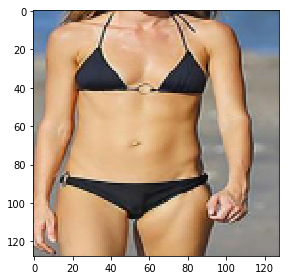

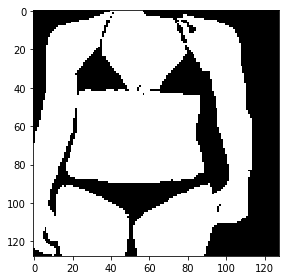

In [ ]:
ix = random.randint(0, 100)
imshow(X_train[ix])
plt.show()
imshow(np.squeeze(Y_train[ix]))
plt.show()

D) Construct the UNET model

In [ ]:
def skin_unet_model(X_train,Y_train,X_val,Y_val, params):
    IMG_WIDTH = 128
    IMG_HEIGHT = 128
    IMG_CHANNELS = 3    
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    s = Lambda(lambda x: x) (inputs)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
    c1 = Dropout(0.1) (c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c1)
    p1 = MaxPooling2D((2, 2)) (c1)

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p1)
    c2 = Dropout(0.1) (c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c2)
    p2 = MaxPooling2D((2, 2)) (c2)

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c3)
    p3 = MaxPooling2D((2, 2)) (c3)

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p3)
    c4 = Dropout(params['dropoutc4']) (c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c4)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

    c5 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p4)
    c5 = Dropout(0.2) (c5)
    c5 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c5)
    p5 = MaxPooling2D(pool_size=(2, 2)) (c5)

    c6 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p5)
    c6 = Dropout(params['dropoutc6']) (c6)
    c6 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c6)

    u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c5])
    c7 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u7)
    c7 = Dropout(0.2) (c7)
    c7 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c7)

    u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c4])
    c8 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u8)
    c8 = Dropout(params['dropoutc8']) (c8)
    c8 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c8)

    u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c3])
    c9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u9)
    c9 = Dropout(0.1) (c9)
    c9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c9)

    u10 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c9)
    u10 = concatenate([u10, c2], axis=3)
    c10 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u10)
    c10 = Dropout(0.1) (c10)
    c10 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c10)

    u11 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c10)
    u11 = concatenate([u11, c1], axis=3)
    c11 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u11)
    c11 = Dropout(0.1) (c11)
    c11 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c11)

    outputs = Conv2D(1, (1, 1), activation='sigmoid') (c11)
    
    model = Model(inputs=[inputs], outputs=[outputs])
    model = multi_gpu_model(model, gpus=4)
    model.compile(optimizer=params['optimizer'](lr=lr_normalizer(params['lr'],params['optimizer']))
                  ,loss='binary_crossentropy', metrics=['acc'],)
    earlystopper = EarlyStopping(patience=40, verbose=1)
    checkpointer = ModelCheckpoint('attempt1.h5', verbose=1, save_best_only=True)
    history = model.fit(X_train, Y_train, validation_split=0.20, batch_size=params['batch_size'], epochs=params['epochs'], shuffle=True, 
                    callbacks=[earlystopper, checkpointer, cb])
    return history,model

In [ ]:
skin_unet_model

<function __main__.skin_unet_model(X_train, Y_train, X_val, Y_val, params)>

In [ ]:
p = {'lr': (0.00001, 0.1,10),
     'batch_size': (64, 256, 3),
     'epochs': [150],
     'dropoutc4': (0.2, 0.6, 5),
     'dropoutc6': (0.2, 0.6, 5),
     'dropoutc8': (0.2, 0.6, 5),
     'optimizer': [Adam, SGD],
     }

In [ ]:
t = ta.Scan(x=X_train,
            y=Y_train,
            model=skin_unet_model,
            params=p, debug=True)

  0%|          | 0/7500 [00:00<?, ?it/s]

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 19s 4ms/step - loss: 4.1332 - acc: 0.7411 - val_loss: 4.0997 - val_acc: 0.7450

Epoch 00001: val_loss improved from inf to 4.09965, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1261 - acc: 0.7422 - val_loss: 4.0993 - val_acc: 0.7451

Epoch 00002: val_loss improved from 4.09965 to 4.09930, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1233 - acc: 0.7427 - val_loss: 4.0991 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.09930 to 4.09913, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 9s 

4779/4779 [==============================] - 9s 2ms/step - loss: 4.1169 - acc: 0.7440 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00034: val_loss improved from 4.09862 to 4.09861, saving model to attempt1.h5
Epoch 35/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1169 - acc: 0.7441 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00035: val_loss improved from 4.09861 to 4.09861, saving model to attempt1.h5
Epoch 36/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1169 - acc: 0.7441 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00036: val_loss improved from 4.09861 to 4.09860, saving model to attempt1.h5
Epoch 37/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1168 - acc: 0.7441 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00037: val_loss improved from 4.09860 to 4.09859, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1168 - acc: 0.7441 - val_loss: 4.0986 - val_acc: 

4779/4779 [==============================] - 9s 2ms/step - loss: 4.1153 - acc: 0.7441 - val_loss: 4.0977 - val_acc: 0.7455

Epoch 00108: val_loss improved from 4.09777 to 4.09774, saving model to attempt1.h5
Epoch 109/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1153 - acc: 0.7441 - val_loss: 4.0977 - val_acc: 0.7455

Epoch 00109: val_loss improved from 4.09774 to 4.09771, saving model to attempt1.h5
Epoch 110/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1152 - acc: 0.7441 - val_loss: 4.0977 - val_acc: 0.7455

Epoch 00110: val_loss improved from 4.09771 to 4.09769, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1152 - acc: 0.7441 - val_loss: 4.0977 - val_acc: 0.7455

Epoch 00111: val_loss improved from 4.09769 to 4.09766, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1151 - acc: 0.7441 - val_loss: 4.0976 - val_a

4779/4779 [==============================] - 9s 2ms/step - loss: 0.7890 - acc: 0.6911 - val_loss: 0.6377 - val_acc: 0.6563

Epoch 00145: val_loss improved from 0.64660 to 0.63769, saving model to attempt1.h5
Epoch 146/150
4779/4779 [==============================] - 9s 2ms/step - loss: 0.7244 - acc: 0.6918 - val_loss: 0.6333 - val_acc: 0.6586

Epoch 00146: val_loss improved from 0.63769 to 0.63328, saving model to attempt1.h5
Epoch 147/150
4779/4779 [==============================] - 9s 2ms/step - loss: 0.6858 - acc: 0.6941 - val_loss: 0.6306 - val_acc: 0.6604

Epoch 00147: val_loss improved from 0.63328 to 0.63058, saving model to attempt1.h5
Epoch 148/150
4779/4779 [==============================] - 9s 2ms/step - loss: 0.6609 - acc: 0.6965 - val_loss: 0.6284 - val_acc: 0.6626

Epoch 00148: val_loss improved from 0.63058 to 0.62843, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 9s 2ms/step - loss: 0.6421 - acc: 0.6992 - val_loss: 0.6266 - val_a

  0%|          | 1/7500 [22:27<2806:46:32, 1347.43s/it]


Epoch 00150: val_loss improved from 0.62664 to 0.62459, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 12s 3ms/step - loss: 6.4846 - acc: 0.4514 - val_loss: 5.4541 - val_acc: 0.3926

Epoch 00001: val_loss improved from inf to 5.45409, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.4645 - acc: 0.4524 - val_loss: 5.4143 - val_acc: 0.3950

Epoch 00002: val_loss improved from 5.45409 to 5.41430, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.4450 - acc: 0.4534 - val_loss: 5.3749 - val_acc: 0.3975

Epoch 00003: val_loss improved from 5.41430 to 5.37486, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.4238 - acc: 0.4546 - val_loss: 5.3359 - val_acc: 0.4000

Epoch 00004: val_loss improved from 5.37486 to 5.33592, saving model to at


Epoch 00037: val_loss improved from 4.54422 to 4.53172, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.8116 - acc: 0.4906 - val_loss: 4.5196 - val_acc: 0.5130

Epoch 00038: val_loss improved from 4.53172 to 4.51959, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.7954 - acc: 0.4916 - val_loss: 4.5078 - val_acc: 0.5156

Epoch 00039: val_loss improved from 4.51959 to 4.50781, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.7786 - acc: 0.4927 - val_loss: 4.4964 - val_acc: 0.5181

Epoch 00040: val_loss improved from 4.50781 to 4.49637, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.7637 - acc: 0.4936 - val_loss: 4.4853 - val_acc: 0.5206

Epoch 00041: val_loss improved from 4.49637 to 4.48525, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 5.3094 - acc: 0.5247 - val_loss: 4.1973 - val_acc: 0.5750

Epoch 00075: val_loss improved from 4.20399 to 4.19731, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2979 - acc: 0.5255 - val_loss: 4.1907 - val_acc: 0.5762

Epoch 00076: val_loss improved from 4.19731 to 4.19073, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2851 - acc: 0.5264 - val_loss: 4.1843 - val_acc: 0.5775

Epoch 00077: val_loss improved from 4.19073 to 4.18427, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2754 - acc: 0.5271 - val_loss: 4.1779 - val_acc: 0.5787

Epoch 00078: val_loss improved from 4.18427 to 4.17791, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2624 - acc: 0.5280 - val_loss: 4.1717 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.7016 - acc: 0.5736 - val_loss: 3.9301 - val_acc: 0.6359

Epoch 00149: val_loss improved from 3.93193 to 3.93011, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6967 - acc: 0.5740 - val_loss: 3.9283 - val_acc: 0.6364


  0%|          | 2/7500 [36:17<2483:07:50, 1192.22s/it]


Epoch 00150: val_loss improved from 3.93011 to 3.92831, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4250 - acc: 0.6756 - val_loss: 4.0776 - val_acc: 0.7361

Epoch 00001: val_loss improved from inf to 4.07759, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9847 - acc: 0.6966 - val_loss: 0.6722 - val_acc: 0.7296

Epoch 00002: val_loss improved from 4.07759 to 0.67217, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.1355 - acc: 0.7237 - val_loss: 0.5757 - val_acc: 0.6806

Epoch 00003: val_loss improved from 0.67217 to 0.57568, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6934 - acc: 0.7353 - val_loss: 0.5624 - val_acc: 0.7171

Epoch 00004: val_loss improved from 0.57568 to 0.56235, saving model to att


Epoch 00042: val_loss did not improve from 0.49454
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1553 - acc: 0.9392 - val_loss: 0.5683 - val_acc: 0.7980

Epoch 00043: val_loss did not improve from 0.49454
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1518 - acc: 0.9404 - val_loss: 0.6836 - val_acc: 0.7663

Epoch 00044: val_loss did not improve from 0.49454
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1517 - acc: 0.9406 - val_loss: 0.6037 - val_acc: 0.7893

Epoch 00045: val_loss did not improve from 0.49454
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1491 - acc: 0.9418 - val_loss: 0.5934 - val_acc: 0.7944

Epoch 00046: val_loss did not improve from 0.49454
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1506 - acc: 0.9409 - val_loss: 0.6833 - val_acc: 0.7722

Epoch 00047: val_loss did not improve from 0.49454
Epoch 48

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1030 - acc: 0.9601 - val_loss: 0.4064 - val_acc: 0.8832

Epoch 00086: val_loss did not improve from 0.38851
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1040 - acc: 0.9597 - val_loss: 0.3928 - val_acc: 0.8819

Epoch 00087: val_loss did not improve from 0.38851
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1016 - acc: 0.9607 - val_loss: 0.4201 - val_acc: 0.8782

Epoch 00088: val_loss did not improve from 0.38851
Epoch 89/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1007 - acc: 0.9610 - val_loss: 0.4389 - val_acc: 0.8730

Epoch 00089: val_loss did not improve from 0.38851
Epoch 90/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1008 - acc: 0.9610 - val_loss: 0.4370 - val_acc: 0.8757

Epoch 00090: val_loss did not improve from 0.38851
Epoch 91/150
4779/4779 [==============================] - 5s 1ms/step - l

  0%|          | 3/7500 [50:00<2251:52:06, 1081.33s/it]


Epoch 00150: val_loss did not improve from 0.22060
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 2.3476 - acc: 0.7212 - val_loss: 0.7136 - val_acc: 0.7324

Epoch 00001: val_loss improved from inf to 0.71361, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.8735 - acc: 0.7416 - val_loss: 0.5365 - val_acc: 0.7541

Epoch 00002: val_loss improved from 0.71361 to 0.53654, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6441 - acc: 0.7470 - val_loss: 0.5208 - val_acc: 0.7435

Epoch 00003: val_loss improved from 0.53654 to 0.52084, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.5677 - acc: 0.7515 - val_loss: 0.4985 - val_acc: 0.7526

Epoch 00004: val_loss improved from 0.52084 to 0.49853, saving model to attempt1.h5
Epoch 5/150
4779/477


Epoch 00038: val_loss did not improve from 0.39801
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3944 - acc: 0.8240 - val_loss: 0.3997 - val_acc: 0.8058

Epoch 00039: val_loss did not improve from 0.39801
Epoch 40/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.3930 - acc: 0.8248 - val_loss: 0.4005 - val_acc: 0.8038

Epoch 00040: val_loss did not improve from 0.39801
Epoch 41/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.3917 - acc: 0.8249 - val_loss: 0.3949 - val_acc: 0.8114

Epoch 00041: val_loss improved from 0.39801 to 0.39492, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3905 - acc: 0.8259 - val_loss: 0.3907 - val_acc: 0.8169

Epoch 00042: val_loss improved from 0.39492 to 0.39071, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3891 - acc: 0.8273 - val_loss: 0.3973 - val_ac

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3361 - acc: 0.8518 - val_loss: 0.3583 - val_acc: 0.8358

Epoch 00122: val_loss did not improve from 0.35590
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3355 - acc: 0.8519 - val_loss: 0.3575 - val_acc: 0.8363

Epoch 00123: val_loss did not improve from 0.35590
Epoch 124/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.3353 - acc: 0.8523 - val_loss: 0.3674 - val_acc: 0.8294

Epoch 00124: val_loss did not improve from 0.35590
Epoch 125/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.3346 - acc: 0.8523 - val_loss: 0.3615 - val_acc: 0.8341

Epoch 00125: val_loss did not improve from 0.35590
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3342 - acc: 0.8529 - val_loss: 0.3688 - val_acc: 0.8282

Epoch 00126: val_loss did not improve from 0.35590
Epoch 127/150
4779/4779 [==============================] - 5s 1ms

  0%|          | 4/7500 [1:02:17<2036:25:46, 978.01s/it]


Epoch 00150: val_loss improved from 0.35252 to 0.35066, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 11.2626 - acc: 0.2872 - val_loss: 10.1095 - val_acc: 0.3585

Epoch 00001: val_loss improved from inf to 10.10945, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.5709 - acc: 0.4612 - val_loss: 6.4355 - val_acc: 0.5946

Epoch 00002: val_loss improved from 10.10945 to 6.43551, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.9610 - acc: 0.6273 - val_loss: 5.1585 - val_acc: 0.6776

Epoch 00003: val_loss improved from 6.43551 to 5.15851, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.8802 - acc: 0.6941 - val_loss: 4.2012 - val_acc: 0.7380

Epoch 00004: val_loss improved from 5.15851 to 4.20122, saving model to


Epoch 00079: val_loss did not improve from 0.37156
Epoch 80/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2564 - acc: 0.8961 - val_loss: 0.3695 - val_acc: 0.8611

Epoch 00080: val_loss improved from 0.37156 to 0.36949, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2550 - acc: 0.8972 - val_loss: 0.3923 - val_acc: 0.8621

Epoch 00081: val_loss did not improve from 0.36949
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2540 - acc: 0.8970 - val_loss: 0.3710 - val_acc: 0.8610

Epoch 00082: val_loss did not improve from 0.36949
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2515 - acc: 0.8986 - val_loss: 0.3660 - val_acc: 0.8602

Epoch 00083: val_loss improved from 0.36949 to 0.36600, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2550 - acc: 0.8973 - val_loss: 0.3619 - val_acc: 0

  0%|          | 5/7500 [1:16:19<1951:37:18, 937.40s/it]


Epoch 00150: val_loss did not improve from 0.27523
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1525 - acc: 0.7367 - val_loss: 4.0942 - val_acc: 0.7446

Epoch 00001: val_loss improved from inf to 4.09416, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 937us/step - loss: 4.1145 - acc: 0.7419 - val_loss: 4.0918 - val_acc: 0.7448

Epoch 00002: val_loss improved from 4.09416 to 4.09183, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1048 - acc: 0.7418 - val_loss: 4.0808 - val_acc: 0.7446

Epoch 00003: val_loss improved from 4.09183 to 4.08075, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9187 - acc: 0.7314 - val_loss: 2.9203 - val_acc: 0.7411

Epoch 00004: val_loss improved from 4.08075 to 2.92025, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 984us/step - loss: 0.1850 - acc: 0.9269 - val_loss: 0.3802 - val_acc: 0.8423

Epoch 00082: val_loss did not improve from 0.33978
Epoch 83/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.1857 - acc: 0.9265 - val_loss: 0.3756 - val_acc: 0.8462

Epoch 00083: val_loss did not improve from 0.33978
Epoch 84/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.1838 - acc: 0.9276 - val_loss: 0.3606 - val_acc: 0.8533

Epoch 00084: val_loss did not improve from 0.33978
Epoch 85/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.1841 - acc: 0.9272 - val_loss: 0.3613 - val_acc: 0.8520

Epoch 00085: val_loss did not improve from 0.33978
Epoch 86/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.1827 - acc: 0.9278 - val_loss: 0.3439 - val_acc: 0.8611

Epoch 00086: val_loss did not improve from 0.33978
Epoch 87/150
4779/4779 [==============================] - 5s 1m

  0%|          | 6/7500 [1:28:19<1815:21:26, 872.07s/it]


Epoch 00150: val_loss did not improve from 0.26463
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.5518 - acc: 0.6549 - val_loss: 3.8532 - val_acc: 0.7357

Epoch 00001: val_loss improved from inf to 3.85315, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9132 - acc: 0.6852 - val_loss: 1.3296 - val_acc: 0.7281

Epoch 00002: val_loss improved from 3.85315 to 1.32964, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6905 - acc: 0.7168 - val_loss: 0.8191 - val_acc: 0.7833

Epoch 00003: val_loss improved from 1.32964 to 0.81905, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1732 - acc: 0.7500 - val_loss: 0.5800 - val_acc: 0.8171

Epoch 00004: val_loss improved from 0.81905 to 0.57996, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1986 - acc: 0.9236 - val_loss: 0.2316 - val_acc: 0.9086

Epoch 00041: val_loss improved from 0.25295 to 0.23157, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1975 - acc: 0.9241 - val_loss: 0.2432 - val_acc: 0.9033

Epoch 00042: val_loss did not improve from 0.23157
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1933 - acc: 0.9258 - val_loss: 0.2628 - val_acc: 0.8934

Epoch 00043: val_loss did not improve from 0.23157
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1906 - acc: 0.9266 - val_loss: 0.3232 - val_acc: 0.8653

Epoch 00044: val_loss did not improve from 0.23157
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1968 - acc: 0.9239 - val_loss: 0.2466 - val_acc: 0.9004

Epoch 00045: val_loss did not improve from 0.23157
Epoch 46/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1348 - acc: 0.9485 - val_loss: 0.2341 - val_acc: 0.9113

Epoch 00084: val_loss did not improve from 0.21211
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1343 - acc: 0.9485 - val_loss: 0.2493 - val_acc: 0.9076

Epoch 00085: val_loss did not improve from 0.21211
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1362 - acc: 0.9478 - val_loss: 0.2077 - val_acc: 0.9214

Epoch 00086: val_loss improved from 0.21211 to 0.20774, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1379 - acc: 0.9469 - val_loss: 0.2381 - val_acc: 0.9117

Epoch 00087: val_loss did not improve from 0.20774
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1328 - acc: 0.9493 - val_loss: 0.2223 - val_acc: 0.9175

Epoch 00088: val_loss did not improve from 0.20774
Epoch 89/150
4779/4779 [================

  0%|          | 7/7500 [1:41:01<1746:42:36, 839.20s/it]


Epoch 00150: val_loss did not improve from 0.17652
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.0354 - acc: 0.6586 - val_loss: 4.1003 - val_acc: 0.7406

Epoch 00001: val_loss improved from inf to 4.10028, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 945us/step - loss: 4.1787 - acc: 0.7313 - val_loss: 4.0957 - val_acc: 0.7428

Epoch 00002: val_loss improved from 4.10028 to 4.09574, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1477 - acc: 0.7361 - val_loss: 4.0951 - val_acc: 0.7435

Epoch 00003: val_loss improved from 4.09574 to 4.09515, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1359 - acc: 0.7381 - val_loss: 4.0949 - val_acc: 0.7439

Epoch 00004: val_loss improved from 4.09515 to 4.09493, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 972us/step - loss: 0.4609 - acc: 0.7830 - val_loss: 0.4408 - val_acc: 0.7719

Epoch 00075: val_loss improved from 0.44231 to 0.44084, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.4585 - acc: 0.7844 - val_loss: 0.4366 - val_acc: 0.7754

Epoch 00076: val_loss improved from 0.44084 to 0.43664, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.4562 - acc: 0.7859 - val_loss: 0.4380 - val_acc: 0.7736

Epoch 00077: val_loss did not improve from 0.43664
Epoch 78/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.4541 - acc: 0.7872 - val_loss: 0.4363 - val_acc: 0.7750

Epoch 00078: val_loss improved from 0.43664 to 0.43633, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.4519 - acc: 0.7886 - val_loss: 0.4358 - val_acc: 0.7749

Epoch 00079: v

  0%|          | 8/7500 [1:53:04<1673:56:55, 804.35s/it]


Epoch 00150: val_loss did not improve from 0.38141
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.0672 - acc: 0.4492 - val_loss: 3.1532 - val_acc: 0.6593

Epoch 00001: val_loss improved from inf to 3.15325, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.2363 - acc: 0.6333 - val_loss: 3.7449 - val_acc: 0.7062

Epoch 00002: val_loss did not improve from 3.15325
Epoch 3/150
4779/4779 [==============================] - 5s 994us/step - loss: 3.8272 - acc: 0.6786 - val_loss: 3.4503 - val_acc: 0.7066

Epoch 00003: val_loss did not improve from 3.15325
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5212 - acc: 0.6824 - val_loss: 2.5864 - val_acc: 0.7050

Epoch 00004: val_loss improved from 3.15325 to 2.58637, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1250 - 


Epoch 00041: val_loss did not improve from 0.71156
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3370 - acc: 0.8747 - val_loss: 0.7455 - val_acc: 0.6624

Epoch 00042: val_loss did not improve from 0.71156
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3306 - acc: 0.8772 - val_loss: 0.8788 - val_acc: 0.6175

Epoch 00043: val_loss did not improve from 0.71156
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3235 - acc: 0.8784 - val_loss: 0.9738 - val_acc: 0.5948

Epoch 00044: val_loss did not improve from 0.71156
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3210 - acc: 0.8797 - val_loss: 0.9078 - val_acc: 0.6059

Epoch 00045: val_loss did not improve from 0.71156
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3133 - acc: 0.8803 - val_loss: 0.8214 - val_acc: 0.6366

Epoch 00046: val_loss did not improve from 0.71156
Epoch 47

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1661 - acc: 0.9352 - val_loss: 0.5081 - val_acc: 0.8332

Epoch 00126: val_loss did not improve from 0.39495
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1670 - acc: 0.9345 - val_loss: 0.4805 - val_acc: 0.8371

Epoch 00127: val_loss did not improve from 0.39495
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1668 - acc: 0.9346 - val_loss: 0.4624 - val_acc: 0.8424

Epoch 00128: val_loss did not improve from 0.39495
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1643 - acc: 0.9359 - val_loss: 0.4970 - val_acc: 0.8355

Epoch 00129: val_loss did not improve from 0.39495
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1646 - acc: 0.9355 - val_loss: 0.4963 - val_acc: 0.8380

Epoch 00130: val_loss did not improve from 0.39495
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/ste

  0%|          | 9/7500 [2:05:20<1631:05:16, 783.86s/it]


Epoch 00149: val_loss did not improve from 0.39495
Epoch 00149: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.8862 - acc: 0.7079 - val_loss: 3.4872 - val_acc: 0.7236

Epoch 00001: val_loss improved from inf to 3.48715, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5313 - acc: 0.6966 - val_loss: 1.0081 - val_acc: 0.7783

Epoch 00002: val_loss improved from 3.48715 to 1.00814, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.2403 - acc: 0.7729 - val_loss: 0.7806 - val_acc: 0.8219

Epoch 00003: val_loss improved from 1.00814 to 0.78055, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.8517 - acc: 0.8146 - val_loss: 0.6808 - val_acc: 0.8131

Epoch 00004: val_loss improved from 0.78055 to 0.68085, saving model to attempt1

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1759 - acc: 0.9300 - val_loss: 0.2151 - val_acc: 0.9221

Epoch 00040: val_loss did not improve from 0.21369
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1750 - acc: 0.9305 - val_loss: 0.2133 - val_acc: 0.9229

Epoch 00041: val_loss improved from 0.21369 to 0.21328, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1735 - acc: 0.9309 - val_loss: 0.2257 - val_acc: 0.9201

Epoch 00042: val_loss did not improve from 0.21328
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1701 - acc: 0.9328 - val_loss: 0.2107 - val_acc: 0.9237

Epoch 00043: val_loss improved from 0.21328 to 0.21067, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1683 - acc: 0.9335 - val_loss: 0.2239 - val_acc: 0.9216

Epoch 00044: val_loss did not improve from 0.21067
Epoch 4

  0%|          | 10/7500 [2:16:36<1563:36:27, 751.53s/it]


Epoch 00120: val_loss did not improve from 0.18123
Epoch 00120: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4381 - acc: 0.7094 - val_loss: 4.1383 - val_acc: 0.7386

Epoch 00001: val_loss improved from inf to 4.13835, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1913 - acc: 0.7334 - val_loss: 4.0999 - val_acc: 0.7432

Epoch 00002: val_loss improved from 4.13835 to 4.09988, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1575 - acc: 0.7373 - val_loss: 4.0966 - val_acc: 0.7441

Epoch 00003: val_loss improved from 4.09988 to 4.09660, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1429 - acc: 0.7392 - val_loss: 4.0959 - val_acc: 0.7444

Epoch 00004: val_loss improved from 4.09660 to 4.09585, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1145 - acc: 0.7433 - val_loss: 4.0946 - val_acc: 0.7453

Epoch 00038: val_loss improved from 4.09468 to 4.09461, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1143 - acc: 0.7433 - val_loss: 4.0945 - val_acc: 0.7453

Epoch 00039: val_loss improved from 4.09461 to 4.09454, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1142 - acc: 0.7433 - val_loss: 4.0945 - val_acc: 0.7453

Epoch 00040: val_loss improved from 4.09454 to 4.09447, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1141 - acc: 0.7433 - val_loss: 4.0944 - val_acc: 0.7453

Epoch 00041: val_loss improved from 4.09447 to 4.09440, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1140 - acc: 0.7434 - val_loss: 4.0943 - val_acc: 


Epoch 00114: val_loss did not improve from 0.38605
Epoch 115/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4214 - acc: 0.8158 - val_loss: 0.3932 - val_acc: 0.8155

Epoch 00115: val_loss did not improve from 0.38605
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4199 - acc: 0.8168 - val_loss: 0.3994 - val_acc: 0.8108

Epoch 00116: val_loss did not improve from 0.38605
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4181 - acc: 0.8173 - val_loss: 0.3825 - val_acc: 0.8256

Epoch 00117: val_loss improved from 0.38605 to 0.38250, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4169 - acc: 0.8184 - val_loss: 0.3847 - val_acc: 0.8225

Epoch 00118: val_loss did not improve from 0.38250
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4160 - acc: 0.8190 - val_loss: 0.3875 - val_acc: 0.8196

Epoch 00119: val_loss

  0%|          | 11/7500 [2:30:16<1605:31:03, 771.78s/it]


Epoch 00150: val_loss improved from 0.36157 to 0.36066, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1560 - acc: 0.7374 - val_loss: 4.0964 - val_acc: 0.7452

Epoch 00001: val_loss improved from inf to 4.09642, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 959us/step - loss: 4.1143 - acc: 0.7434 - val_loss: 4.0956 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.09642 to 4.09561, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1116 - acc: 0.7436 - val_loss: 4.0935 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09561 to 4.09345, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.0878 - acc: 0.7416 - val_loss: 3.8897 - val_acc: 0.7408

Epoch 00004: val_loss improved from 4.09345 to 3.88968, saving model to


Epoch 00082: val_loss did not improve from 0.24462
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1333 - acc: 0.9479 - val_loss: 0.2671 - val_acc: 0.9052

Epoch 00083: val_loss did not improve from 0.24462
Epoch 84/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.1336 - acc: 0.9480 - val_loss: 0.2175 - val_acc: 0.9207

Epoch 00084: val_loss improved from 0.24462 to 0.21753, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.1321 - acc: 0.9485 - val_loss: 0.2779 - val_acc: 0.9014

Epoch 00085: val_loss did not improve from 0.21753
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1326 - acc: 0.9482 - val_loss: 0.2418 - val_acc: 0.9132

Epoch 00086: val_loss did not improve from 0.21753
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1310 - acc: 0.9489 - val_loss: 0.2765 - val_acc: 0.9025

Epoch 00087: val_loss 


Epoch 00125: val_loss did not improve from 0.21262
Epoch 126/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.1064 - acc: 0.9587 - val_loss: 0.2278 - val_acc: 0.9227

Epoch 00126: val_loss did not improve from 0.21262
Epoch 127/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.1092 - acc: 0.9575 - val_loss: 0.2253 - val_acc: 0.9250

Epoch 00127: val_loss did not improve from 0.21262
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1070 - acc: 0.9585 - val_loss: 0.2275 - val_acc: 0.9225

Epoch 00128: val_loss did not improve from 0.21262
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1055 - acc: 0.9590 - val_loss: 0.2169 - val_acc: 0.9251

Epoch 00129: val_loss did not improve from 0.21262
Epoch 130/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.1052 - acc: 0.9592 - val_loss: 0.2371 - val_acc: 0.9214

Epoch 00130: val_loss did not improve from 0.212

  0%|          | 12/7500 [2:42:21<1576:24:05, 757.89s/it]


Epoch 00150: val_loss did not improve from 0.20219
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.8517 - acc: 0.4882 - val_loss: 4.4392 - val_acc: 0.7202

Epoch 00001: val_loss improved from inf to 4.43916, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5133 - acc: 0.7187 - val_loss: 4.1418 - val_acc: 0.7423

Epoch 00002: val_loss improved from 4.43916 to 4.14182, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2162 - acc: 0.7380 - val_loss: 4.1121 - val_acc: 0.7447

Epoch 00003: val_loss improved from 4.14182 to 4.11212, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1693 - acc: 0.7411 - val_loss: 4.1044 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.11212 to 4.10438, saving model to attempt1.h5
Epoch 5/150
4779/4779 


Epoch 00079: val_loss did not improve from 4.09975
Epoch 80/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00080: val_loss improved from 4.09975 to 4.09975, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00081: val_loss did not improve from 4.09975
Epoch 82/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00082: val_loss did not improve from 4.09975
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00083: val_loss did not improve from 4.09975
Epoch 84/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00084: val_l


Epoch 00122: val_loss did not improve from 4.09975
Epoch 123/150
4779/4779 [==============================] - 5s 1000us/step - loss: 4.1174 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00123: val_loss did not improve from 4.09975
Epoch 124/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1174 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00124: val_loss did not improve from 4.09975
Epoch 125/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1174 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00125: val_loss did not improve from 4.09975
Epoch 126/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1174 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456


  0%|          | 13/7500 [2:52:38<1488:30:14, 715.72s/it]


Epoch 00126: val_loss did not improve from 4.09975
Epoch 00126: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.6993 - acc: 0.2659 - val_loss: 10.0735 - val_acc: 0.2624

Epoch 00001: val_loss improved from inf to 10.07354, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 939us/step - loss: 8.9383 - acc: 0.3195 - val_loss: 7.2713 - val_acc: 0.3607

Epoch 00002: val_loss improved from 10.07354 to 7.27129, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 993us/step - loss: 6.0519 - acc: 0.4947 - val_loss: 3.4921 - val_acc: 0.6296

Epoch 00003: val_loss improved from 7.27129 to 3.49208, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8231 - acc: 0.6593 - val_loss: 2.2364 - val_acc: 0.7208

Epoch 00004: val_loss improved from 3.49208 to 2.23635, saving model to 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3672 - acc: 0.8486 - val_loss: 0.4672 - val_acc: 0.7144

Epoch 00039: val_loss did not improve from 0.44454
Epoch 40/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.3632 - acc: 0.8512 - val_loss: 0.4765 - val_acc: 0.7052

Epoch 00040: val_loss did not improve from 0.44454
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3610 - acc: 0.8534 - val_loss: 0.4488 - val_acc: 0.7408

Epoch 00041: val_loss did not improve from 0.44454
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3626 - acc: 0.8513 - val_loss: 0.4607 - val_acc: 0.7253

Epoch 00042: val_loss did not improve from 0.44454
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3544 - acc: 0.8588 - val_loss: 0.4437 - val_acc: 0.7458

Epoch 00043: val_loss improved from 0.44454 to 0.44374, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2693 - acc: 0.9191 - val_loss: 0.4118 - val_acc: 0.7750

Epoch 00124: val_loss did not improve from 0.38824
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2681 - acc: 0.9201 - val_loss: 0.4153 - val_acc: 0.7733

Epoch 00125: val_loss did not improve from 0.38824
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2666 - acc: 0.9210 - val_loss: 0.4037 - val_acc: 0.7845

Epoch 00126: val_loss did not improve from 0.38824
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2669 - acc: 0.9211 - val_loss: 0.4037 - val_acc: 0.7832

Epoch 00127: val_loss did not improve from 0.38824
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2667 - acc: 0.9210 - val_loss: 0.3982 - val_acc: 0.7885

Epoch 00128: val_loss did not improve from 0.38824
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/ste

  0%|          | 14/7500 [3:05:03<1506:35:06, 724.51s/it]


Epoch 00150: val_loss improved from 0.37565 to 0.36697, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2834 - acc: 0.7272 - val_loss: 4.0967 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.09666, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 954us/step - loss: 4.1370 - acc: 0.7417 - val_loss: 4.0974 - val_acc: 0.7455

Epoch 00002: val_loss did not improve from 4.09666
Epoch 3/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1279 - acc: 0.7429 - val_loss: 4.0977 - val_acc: 0.7455

Epoch 00003: val_loss did not improve from 4.09666
Epoch 4/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1245 - acc: 0.7433 - val_loss: 4.0979 - val_acc: 0.7456

Epoch 00004: val_loss did not improve from 4.09666
Epoch 5/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.122

  0%|          | 15/7500 [3:08:27<1181:39:06, 568.33s/it]


Epoch 00041: val_loss did not improve from 4.09666
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3181 - acc: 0.7210 - val_loss: 4.1216 - val_acc: 0.7409

Epoch 00001: val_loss improved from inf to 4.12156, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 950us/step - loss: 4.1588 - acc: 0.7384 - val_loss: 4.1036 - val_acc: 0.7437

Epoch 00002: val_loss improved from 4.12156 to 4.10359, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1306 - acc: 0.7416 - val_loss: 4.1001 - val_acc: 0.7445

Epoch 00003: val_loss improved from 4.10359 to 4.10008, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1227 - acc: 0.7427 - val_loss: 4.0989 - val_acc: 0.7449

Epoch 00004: val_loss improved from 4.10008 to 4.09889, saving model to atte

4779/4779 [==============================] - 5s 988us/step - loss: 0.3915 - acc: 0.8293 - val_loss: 0.4431 - val_acc: 0.6970

Epoch 00038: val_loss did not improve from 0.44135
Epoch 39/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.3839 - acc: 0.8318 - val_loss: 0.4387 - val_acc: 0.7047

Epoch 00039: val_loss improved from 0.44135 to 0.43869, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.3790 - acc: 0.8365 - val_loss: 0.4282 - val_acc: 0.7233

Epoch 00040: val_loss improved from 0.43869 to 0.42818, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.3734 - acc: 0.8410 - val_loss: 0.4459 - val_acc: 0.6922

Epoch 00041: val_loss did not improve from 0.42818
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3711 - acc: 0.8425 - val_loss: 0.4222 - val_acc: 0.7304

Epoch 00042: val_loss improved from 0.42818 to 0.4

  0%|          | 16/7500 [3:16:05<1112:16:30, 535.03s/it]


Epoch 00093: val_loss did not improve from 0.39688
Epoch 00093: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.3765 - acc: 0.3586 - val_loss: 6.0666 - val_acc: 0.5257

Epoch 00001: val_loss improved from inf to 6.06664, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.1697 - acc: 0.5631 - val_loss: 4.4227 - val_acc: 0.6583

Epoch 00002: val_loss improved from 6.06664 to 4.42269, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3879 - acc: 0.6786 - val_loss: 4.0269 - val_acc: 0.7284

Epoch 00003: val_loss improved from 4.42269 to 4.02692, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9487 - acc: 0.7112 - val_loss: 3.7161 - val_acc: 0.7246

Epoch 00004: val_loss improved from 4.02692 to 3.71605, saving model to attempt1


Epoch 00038: val_loss improved from 0.38170 to 0.35860, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3304 - acc: 0.8566 - val_loss: 0.3874 - val_acc: 0.7616

Epoch 00039: val_loss did not improve from 0.35860
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3190 - acc: 0.8626 - val_loss: 0.3743 - val_acc: 0.7718

Epoch 00040: val_loss did not improve from 0.35860
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3117 - acc: 0.8673 - val_loss: 0.3639 - val_acc: 0.7837

Epoch 00041: val_loss did not improve from 0.35860
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3056 - acc: 0.8702 - val_loss: 0.3506 - val_acc: 0.7987

Epoch 00042: val_loss improved from 0.35860 to 0.35059, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3019 - acc: 0.8720 - val_loss: 0.3467 - val_acc: 0

  0%|          | 17/7500 [3:25:12<1119:49:15, 538.74s/it]


Epoch 00096: val_loss did not improve from 0.32647
Epoch 00096: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3006 - acc: 0.7260 - val_loss: 4.1065 - val_acc: 0.7429

Epoch 00001: val_loss improved from inf to 4.10649, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1400 - acc: 0.7402 - val_loss: 4.1030 - val_acc: 0.7438

Epoch 00002: val_loss improved from 4.10649 to 4.10296, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1305 - acc: 0.7415 - val_loss: 4.1017 - val_acc: 0.7442

Epoch 00003: val_loss improved from 4.10296 to 4.10171, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1264 - acc: 0.7421 - val_loss: 4.1011 - val_acc: 0.7444

Epoch 00004: val_loss improved from 4.10171 to 4.10106, saving model to attempt1


Epoch 00037: val_loss improved from 4.09891 to 4.09889, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7440 - val_loss: 4.0989 - val_acc: 0.7453

Epoch 00038: val_loss improved from 4.09889 to 4.09888, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7440 - val_loss: 4.0989 - val_acc: 0.7453

Epoch 00039: val_loss improved from 4.09888 to 4.09886, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7440 - val_loss: 4.0988 - val_acc: 0.7453

Epoch 00040: val_loss improved from 4.09886 to 4.09885, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7440 - val_loss: 4.0988 - val_acc: 0.7453

Epoch 00041: val_loss improved from 4.09885 to 4.09883, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1156 - acc: 0.7441 - val_loss: 4.0983 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09836 to 4.09835, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1155 - acc: 0.7442 - val_loss: 4.0983 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09835 to 4.09833, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1155 - acc: 0.7441 - val_loss: 4.0983 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09833 to 4.09831, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1155 - acc: 0.7441 - val_loss: 4.0983 - val_acc: 0.7454

Epoch 00078: val_loss improved from 4.09831 to 4.09829, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1154 - acc: 0.7442 - val_loss: 4.0983 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4340 - acc: 0.7973 - val_loss: 0.4093 - val_acc: 0.7861

Epoch 00149: val_loss improved from 0.41288 to 0.40935, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4304 - acc: 0.7993 - val_loss: 0.4042 - val_acc: 0.7924


  0%|          | 18/7500 [3:38:22<1276:05:30, 614.00s/it]


Epoch 00150: val_loss improved from 0.40935 to 0.40417, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.7932 - acc: 0.4862 - val_loss: 6.4392 - val_acc: 0.5636

Epoch 00001: val_loss improved from inf to 6.43916, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.6397 - acc: 0.7087 - val_loss: 4.2662 - val_acc: 0.7335

Epoch 00002: val_loss improved from 6.43916 to 4.26620, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2704 - acc: 0.7346 - val_loss: 4.1634 - val_acc: 0.7411

Epoch 00003: val_loss improved from 4.26620 to 4.16339, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2022 - acc: 0.7391 - val_loss: 4.1356 - val_acc: 0.7431

Epoch 00004: val_loss improved from 4.16339 to 4.13556, saving model to a


Epoch 00037: val_loss improved from 4.09975 to 4.09975, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1186 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00038: val_loss did not improve from 4.09975
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1186 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00039: val_loss did not improve from 4.09975
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1185 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00040: val_loss did not improve from 4.09975
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1184 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00041: val_loss did not improve from 4.09975
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1184 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00042: val_loss did 

  0%|          | 19/7500 [3:44:51<1135:53:24, 546.61s/it]


Epoch 00077: val_loss did not improve from 4.09975
Epoch 00077: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2842 - acc: 0.7289 - val_loss: 4.1061 - val_acc: 0.7445

Epoch 00001: val_loss improved from inf to 4.10612, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1267 - acc: 0.7434 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.10612 to 4.09960, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7441 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09960 to 4.09949, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1186 - acc: 0.7443 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09949 to 4.09939, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1876 - acc: 0.9219 - val_loss: 0.2652 - val_acc: 0.8929

Epoch 00080: val_loss did not improve from 0.25306
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1771 - acc: 0.9273 - val_loss: 0.2558 - val_acc: 0.8981

Epoch 00081: val_loss did not improve from 0.25306
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1774 - acc: 0.9270 - val_loss: 0.2623 - val_acc: 0.9001

Epoch 00082: val_loss did not improve from 0.25306
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1743 - acc: 0.9284 - val_loss: 0.2666 - val_acc: 0.8940

Epoch 00083: val_loss did not improve from 0.25306
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1725 - acc: 0.9298 - val_loss: 0.2559 - val_acc: 0.9082

Epoch 00084: val_loss did not improve from 0.25306
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1319 - acc: 0.9480 - val_loss: 0.2116 - val_acc: 0.9213

Epoch 00122: val_loss did not improve from 0.20334
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1307 - acc: 0.9484 - val_loss: 0.2097 - val_acc: 0.9231

Epoch 00123: val_loss did not improve from 0.20334
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1306 - acc: 0.9484 - val_loss: 0.2102 - val_acc: 0.9223

Epoch 00124: val_loss did not improve from 0.20334
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1295 - acc: 0.9489 - val_loss: 0.2114 - val_acc: 0.9222

Epoch 00125: val_loss did not improve from 0.20334
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1297 - acc: 0.9487 - val_loss: 0.2075 - val_acc: 0.9245

Epoch 00126: val_loss did not improve from 0.20334
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/ste

  0%|          | 20/7500 [3:58:32<1306:54:52, 629.00s/it]


Epoch 00150: val_loss improved from 0.18526 to 0.18462, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.0864 - acc: 0.6564 - val_loss: 4.1335 - val_acc: 0.7380

Epoch 00001: val_loss improved from inf to 4.13348, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.1788 - acc: 0.7341 - val_loss: 4.1076 - val_acc: 0.7421

Epoch 00002: val_loss improved from 4.13348 to 4.10760, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1449 - acc: 0.7385 - val_loss: 4.1023 - val_acc: 0.7433

Epoch 00003: val_loss improved from 4.10760 to 4.10227, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1332 - acc: 0.7403 - val_loss: 4.0999 - val_acc: 0.7439

Epoch 00004: val_loss improved from 4.10227 to 4.09995, saving model to

4779/4779 [==============================] - 5s 989us/step - loss: 0.2890 - acc: 0.9017 - val_loss: 0.5376 - val_acc: 0.5916

Epoch 00079: val_loss did not improve from 0.50229
Epoch 80/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.2868 - acc: 0.9021 - val_loss: 0.5258 - val_acc: 0.6079

Epoch 00080: val_loss did not improve from 0.50229
Epoch 81/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.2851 - acc: 0.9033 - val_loss: 0.5094 - val_acc: 0.6286

Epoch 00081: val_loss did not improve from 0.50229
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2838 - acc: 0.9035 - val_loss: 0.5013 - val_acc: 0.6384

Epoch 00082: val_loss improved from 0.50229 to 0.50132, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2835 - acc: 0.9047 - val_loss: 0.5002 - val_acc: 0.6452

Epoch 00083: val_loss improved from 0.50132 to 0.50025, saving model to attempt1.h5


  0%|          | 21/7500 [4:10:48<1373:31:01, 661.14s/it]


Epoch 00150: val_loss did not improve from 0.34681
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.4307 - acc: 0.4954 - val_loss: 5.7516 - val_acc: 0.5602

Epoch 00001: val_loss improved from inf to 5.75156, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.7099 - acc: 0.5931 - val_loss: 4.0632 - val_acc: 0.6867

Epoch 00002: val_loss improved from 5.75156 to 4.06318, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7326 - acc: 0.6618 - val_loss: 4.1746 - val_acc: 0.7051

Epoch 00003: val_loss did not improve from 4.06318
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4112 - acc: 0.6908 - val_loss: 4.2183 - val_acc: 0.7130

Epoch 00004: val_loss did not improve from 4.06318
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2884 - acc:


Epoch 00041: val_loss did not improve from 2.44303
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7182 - acc: 0.8771 - val_loss: 3.1404 - val_acc: 0.7796

Epoch 00042: val_loss did not improve from 2.44303
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6959 - acc: 0.8787 - val_loss: 3.1424 - val_acc: 0.7798

Epoch 00043: val_loss did not improve from 2.44303
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6726 - acc: 0.8803 - val_loss: 3.1706 - val_acc: 0.7780

Epoch 00044: val_loss did not improve from 2.44303
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6612 - acc: 0.8813 - val_loss: 3.1236 - val_acc: 0.7813

Epoch 00045: val_loss did not improve from 2.44303
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6435 - acc: 0.8825 - val_loss: 3.2095 - val_acc: 0.7754

Epoch 00046: val_loss did not improve from 2.44303
Epoch 47

  0%|          | 22/7500 [4:15:58<1154:16:33, 555.68s/it]


Epoch 00060: val_loss did not improve from 2.44303
Epoch 00060: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.5352 - acc: 0.2631 - val_loss: 11.4009 - val_acc: 0.2643

Epoch 00001: val_loss improved from inf to 11.40088, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.3823 - acc: 0.3291 - val_loss: 9.4306 - val_acc: 0.3797

Epoch 00002: val_loss improved from 11.40088 to 9.43056, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.5052 - acc: 0.4615 - val_loss: 7.3086 - val_acc: 0.5323

Epoch 00003: val_loss improved from 9.43056 to 7.30856, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1412 - acc: 0.5512 - val_loss: 6.2922 - val_acc: 0.6031

Epoch 00004: val_loss improved from 7.30856 to 6.29220, saving model to att


Epoch 00038: val_loss did not improve from 4.09973
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1204 - acc: 0.7443 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00039: val_loss did not improve from 4.09973
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1203 - acc: 0.7443 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00040: val_loss did not improve from 4.09973
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00041: val_loss did not improve from 4.09973
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00042: val_loss did not improve from 4.09973
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1199 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09973
Epoch 44

  0%|          | 23/7500 [4:22:04<1035:45:53, 498.70s/it]


Epoch 00071: val_loss did not improve from 4.09973
Epoch 00071: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.6925 - acc: 0.2569 - val_loss: 11.6019 - val_acc: 0.2546

Epoch 00001: val_loss improved from inf to 11.60192, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 949us/step - loss: 11.5043 - acc: 0.2595 - val_loss: 11.3413 - val_acc: 0.2558

Epoch 00002: val_loss improved from 11.60192 to 11.34133, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.0931 - acc: 0.2685 - val_loss: 10.6395 - val_acc: 0.2655

Epoch 00003: val_loss improved from 11.34133 to 10.63953, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.2416 - acc: 0.2948 - val_loss: 8.6902 - val_acc: 0.3171

Epoch 00004: val_loss improved from 10.63953 to 8.69025, saving mo

4779/4779 [==============================] - 5s 1ms/step - loss: 1.9140 - acc: 0.8002 - val_loss: 2.5382 - val_acc: 0.7558

Epoch 00041: val_loss did not improve from 1.89656
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8784 - acc: 0.8023 - val_loss: 2.6972 - val_acc: 0.7441

Epoch 00042: val_loss did not improve from 1.89656
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8328 - acc: 0.8053 - val_loss: 2.6067 - val_acc: 0.7496

Epoch 00043: val_loss did not improve from 1.89656
Epoch 44/150
4779/4779 [==============================] - 5s 995us/step - loss: 1.7993 - acc: 0.8070 - val_loss: 2.7489 - val_acc: 0.7387

Epoch 00044: val_loss did not improve from 1.89656
Epoch 45/150
4779/4779 [==============================] - 5s 998us/step - loss: 1.7676 - acc: 0.8080 - val_loss: 2.8532 - val_acc: 0.7315

Epoch 00045: val_loss did not improve from 1.89656
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step


Epoch 00082: val_loss improved from 0.90104 to 0.82370, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8032 - acc: 0.8303 - val_loss: 0.8151 - val_acc: 0.8074

Epoch 00083: val_loss improved from 0.82370 to 0.81514, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7852 - acc: 0.8305 - val_loss: 0.7798 - val_acc: 0.8053

Epoch 00084: val_loss improved from 0.81514 to 0.77984, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.7713 - acc: 0.8290 - val_loss: 0.7535 - val_acc: 0.8024

Epoch 00085: val_loss improved from 0.77984 to 0.75353, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.7509 - acc: 0.8301 - val_loss: 0.7157 - val_acc: 0.8000

Epoch 00086: val_loss improved from 0.75353 to 0.71567, saving model to attempt1.h5
Epoch 87/150
4779/4779 [===

  0%|          | 24/7500 [4:34:24<1186:14:26, 571.22s/it]


Epoch 00150: val_loss did not improve from 0.47311
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2421 - acc: 0.7283 - val_loss: 4.0990 - val_acc: 0.7446

Epoch 00001: val_loss improved from inf to 4.09900, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1461 - acc: 0.7395 - val_loss: 4.0984 - val_acc: 0.7451

Epoch 00002: val_loss improved from 4.09900 to 4.09843, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1333 - acc: 0.7413 - val_loss: 4.0982 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.09843 to 4.09823, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 971us/step - loss: 4.1279 - acc: 0.7421 - val_loss: 4.0981 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.09823 to 4.09810, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00042: val_loss did not improve from 4.09796
Epoch 43/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.1167 - acc: 0.7442 - val_loss: 4.0981 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09796
Epoch 44/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1167 - acc: 0.7442 - val_loss: 4.0981 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09796
Epoch 45/150
4779/4779 [==============================] - 5s 959us/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0981 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09796
Epoch 46/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0981 - val_acc: 0.7456

Epoch 00046: val_loss did not improve from 4.09796
Epoch 47/150
4779/4779 [==============================] - 5s 961us/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0981 - val_acc: 0.7456


  0%|          | 25/7500 [4:38:12<972:29:00, 468.35s/it] 


Epoch 00047: val_loss did not improve from 4.09796
Epoch 00047: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 8.9746 - acc: 0.3982 - val_loss: 5.1598 - val_acc: 0.6209

Epoch 00001: val_loss improved from inf to 5.15978, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.9206 - acc: 0.5785 - val_loss: 4.3658 - val_acc: 0.7150

Epoch 00002: val_loss improved from 5.15978 to 4.36581, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7230 - acc: 0.6712 - val_loss: 4.2346 - val_acc: 0.7264

Epoch 00003: val_loss improved from 4.36581 to 4.23459, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3972 - acc: 0.7031 - val_loss: 4.1386 - val_acc: 0.7363

Epoch 00004: val_loss improved from 4.23459 to 4.13859, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2686 - acc: 0.8984 - val_loss: 0.5837 - val_acc: 0.7421

Epoch 00082: val_loss did not improve from 0.44721
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2707 - acc: 0.8975 - val_loss: 0.5633 - val_acc: 0.7343

Epoch 00083: val_loss did not improve from 0.44721
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2662 - acc: 0.8990 - val_loss: 0.5612 - val_acc: 0.7597

Epoch 00084: val_loss did not improve from 0.44721
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2651 - acc: 0.9001 - val_loss: 0.5457 - val_acc: 0.7506

Epoch 00085: val_loss did not improve from 0.44721
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2675 - acc: 0.8984 - val_loss: 0.5447 - val_acc: 0.7460

Epoch 00086: val_loss did not improve from 0.44721
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - l

  0%|          | 26/7500 [4:50:36<1143:49:53, 550.95s/it]


Epoch 00150: val_loss improved from 0.28645 to 0.26193, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3258 - acc: 0.7231 - val_loss: 4.1089 - val_acc: 0.7426

Epoch 00001: val_loss improved from inf to 4.10894, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 862us/step - loss: 4.1590 - acc: 0.7384 - val_loss: 4.1055 - val_acc: 0.7433

Epoch 00002: val_loss improved from 4.10894 to 4.10552, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 4s 860us/step - loss: 4.1448 - acc: 0.7400 - val_loss: 4.1041 - val_acc: 0.7436

Epoch 00003: val_loss improved from 4.10552 to 4.10410, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 4s 852us/step - loss: 4.1383 - acc: 0.7408 - val_loss: 4.1032 - val_acc: 0.7438

Epoch 00004: val_loss improved from 4.10410 to 4.10325, saving model 

4779/4779 [==============================] - 4s 889us/step - loss: 4.1178 - acc: 0.7439 - val_loss: 4.0996 - val_acc: 0.7453

Epoch 00074: val_loss improved from 4.09960 to 4.09960, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 4s 870us/step - loss: 4.1178 - acc: 0.7440 - val_loss: 4.0996 - val_acc: 0.7453

Epoch 00075: val_loss improved from 4.09960 to 4.09959, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 4s 861us/step - loss: 4.1178 - acc: 0.7440 - val_loss: 4.0996 - val_acc: 0.7453

Epoch 00076: val_loss improved from 4.09959 to 4.09959, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 4s 865us/step - loss: 4.1178 - acc: 0.7440 - val_loss: 4.0996 - val_acc: 0.7453

Epoch 00077: val_loss improved from 4.09959 to 4.09958, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 4s 883us/step - loss: 4.1177 - acc: 0.7440 - val_loss: 4.0996 -

4779/4779 [==============================] - 4s 904us/step - loss: 4.1173 - acc: 0.7441 - val_loss: 4.0995 - val_acc: 0.7454

Epoch 00111: val_loss improved from 4.09946 to 4.09945, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 4s 884us/step - loss: 4.1173 - acc: 0.7441 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00112: val_loss improved from 4.09945 to 4.09945, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 4s 874us/step - loss: 4.1173 - acc: 0.7441 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00113: val_loss improved from 4.09945 to 4.09945, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 4s 865us/step - loss: 4.1173 - acc: 0.7441 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00114: val_loss improved from 4.09945 to 4.09944, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 4s 864us/step - loss: 4.1173 - acc: 0.7441 - val_loss: 4.09

4779/4779 [==============================] - 4s 847us/step - loss: 4.1170 - acc: 0.7442 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00148: val_loss improved from 4.09937 to 4.09936, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 4s 931us/step - loss: 4.1170 - acc: 0.7442 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00149: val_loss improved from 4.09936 to 4.09936, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 4s 879us/step - loss: 4.1170 - acc: 0.7442 - val_loss: 4.0994 - val_acc: 0.7454


  0%|          | 27/7500 [5:01:23<1203:08:01, 579.59s/it]


Epoch 00150: val_loss improved from 4.09936 to 4.09936, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 7s 1ms/step - loss: 5.7136 - acc: 0.5509 - val_loss: 4.0901 - val_acc: 0.7159

Epoch 00001: val_loss improved from inf to 4.09011, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 894us/step - loss: 4.2278 - acc: 0.6808 - val_loss: 4.0151 - val_acc: 0.7261

Epoch 00002: val_loss improved from 4.09011 to 4.01509, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 4s 937us/step - loss: 4.0438 - acc: 0.6888 - val_loss: 3.8117 - val_acc: 0.7249

Epoch 00003: val_loss improved from 4.01509 to 3.81174, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 4s 854us/step - loss: 3.7262 - acc: 0.6763 - val_loss: 2.8605 - val_acc: 0.7123

Epoch 00004: val_loss improved from 3.81174 to 2.86050, saving model 

4779/4779 [==============================] - 4s 936us/step - loss: 0.4838 - acc: 0.7821 - val_loss: 0.4331 - val_acc: 0.8042

Epoch 00074: val_loss improved from 0.43472 to 0.43309, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 4s 928us/step - loss: 0.4824 - acc: 0.7827 - val_loss: 0.4312 - val_acc: 0.8058

Epoch 00075: val_loss improved from 0.43309 to 0.43120, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 4s 864us/step - loss: 0.4810 - acc: 0.7835 - val_loss: 0.4306 - val_acc: 0.8060

Epoch 00076: val_loss improved from 0.43120 to 0.43063, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.4800 - acc: 0.7840 - val_loss: 0.4298 - val_acc: 0.8066

Epoch 00077: val_loss improved from 0.43063 to 0.42981, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 4s 939us/step - loss: 0.4788 - acc: 0.7848 - val_loss: 0.4297 -


Epoch 00112: val_loss improved from 0.41068 to 0.41012, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 944us/step - loss: 0.4473 - acc: 0.8030 - val_loss: 0.4105 - val_acc: 0.8180

Epoch 00113: val_loss did not improve from 0.41012
Epoch 114/150
4779/4779 [==============================] - 5s 942us/step - loss: 0.4467 - acc: 0.8033 - val_loss: 0.4093 - val_acc: 0.8189

Epoch 00114: val_loss improved from 0.41012 to 0.40935, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 4s 867us/step - loss: 0.4458 - acc: 0.8037 - val_loss: 0.4078 - val_acc: 0.8203

Epoch 00115: val_loss improved from 0.40935 to 0.40784, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 4s 927us/step - loss: 0.4454 - acc: 0.8041 - val_loss: 0.4090 - val_acc: 0.8189

Epoch 00116: val_loss did not improve from 0.40784
Epoch 117/150
4779/4779 [==============================] - 5s 951us/step - loss: 0.44

  0%|          | 28/7500 [5:12:42<1264:56:25, 609.45s/it]


Epoch 00150: val_loss did not improve from 0.39866
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1901 - acc: 0.7301 - val_loss: 4.0933 - val_acc: 0.7449

Epoch 00001: val_loss improved from inf to 4.09330, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1239 - acc: 0.7407 - val_loss: 4.0934 - val_acc: 0.7452

Epoch 00002: val_loss did not improve from 4.09330
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1186 - acc: 0.7418 - val_loss: 4.0932 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.09330 to 4.09319, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1158 - acc: 0.7422 - val_loss: 4.0927 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.09319 to 4.09269, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4029 - acc: 0.8196 - val_loss: 0.4155 - val_acc: 0.7987

Epoch 00079: val_loss did not improve from 0.41253
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4023 - acc: 0.8197 - val_loss: 0.4118 - val_acc: 0.8020

Epoch 00080: val_loss improved from 0.41253 to 0.41184, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4016 - acc: 0.8198 - val_loss: 0.4172 - val_acc: 0.7970

Epoch 00081: val_loss did not improve from 0.41184
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4011 - acc: 0.8201 - val_loss: 0.4188 - val_acc: 0.7958

Epoch 00082: val_loss did not improve from 0.41184
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4006 - acc: 0.8204 - val_loss: 0.4136 - val_acc: 0.8000

Epoch 00083: val_loss did not improve from 0.41184
Epoch 84/150
4779/4779 [================


Epoch 00121: val_loss did not improve from 0.40393
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3864 - acc: 0.8261 - val_loss: 0.4070 - val_acc: 0.7999

Epoch 00122: val_loss did not improve from 0.40393
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3858 - acc: 0.8264 - val_loss: 0.4021 - val_acc: 0.8041

Epoch 00123: val_loss improved from 0.40393 to 0.40214, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3858 - acc: 0.8264 - val_loss: 0.4069 - val_acc: 0.7997

Epoch 00124: val_loss did not improve from 0.40214
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3854 - acc: 0.8266 - val_loss: 0.4029 - val_acc: 0.8030

Epoch 00125: val_loss did not improve from 0.40214
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3851 - acc: 0.8268 - val_loss: 0.4084 - val_acc: 0.7982

Epoch 00126: val_loss

  0%|          | 29/7500 [5:25:44<1372:28:40, 661.35s/it]


Epoch 00150: val_loss did not improve from 0.39989
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 8.9030 - acc: 0.3349 - val_loss: 4.9668 - val_acc: 0.5003

Epoch 00001: val_loss improved from inf to 4.96678, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.6712 - acc: 0.5119 - val_loss: 4.2729 - val_acc: 0.6796

Epoch 00002: val_loss improved from 4.96678 to 4.27286, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5557 - acc: 0.6238 - val_loss: 4.1783 - val_acc: 0.7090

Epoch 00003: val_loss improved from 4.27286 to 4.17828, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2913 - acc: 0.6596 - val_loss: 4.1368 - val_acc: 0.7160

Epoch 00004: val_loss improved from 4.17828 to 4.13680, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.6436 - acc: 0.7015 - val_loss: 0.6070 - val_acc: 0.6730

Epoch 00038: val_loss improved from 0.60792 to 0.60696, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6369 - acc: 0.7022 - val_loss: 0.6051 - val_acc: 0.6752

Epoch 00039: val_loss improved from 0.60696 to 0.60508, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6306 - acc: 0.7036 - val_loss: 0.6040 - val_acc: 0.6769

Epoch 00040: val_loss improved from 0.60508 to 0.60396, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6250 - acc: 0.7045 - val_loss: 0.6024 - val_acc: 0.6789

Epoch 00041: val_loss improved from 0.60396 to 0.60237, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6191 - acc: 0.7060 - val_loss: 0.6013 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5048 - acc: 0.7345 - val_loss: 0.5689 - val_acc: 0.7188

Epoch 00113: val_loss improved from 0.56908 to 0.56888, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5043 - acc: 0.7344 - val_loss: 0.5685 - val_acc: 0.7190

Epoch 00114: val_loss improved from 0.56888 to 0.56847, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5036 - acc: 0.7348 - val_loss: 0.5685 - val_acc: 0.7191

Epoch 00115: val_loss did not improve from 0.56847
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5033 - acc: 0.7349 - val_loss: 0.5684 - val_acc: 0.7193

Epoch 00116: val_loss improved from 0.56847 to 0.56836, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5029 - acc: 0.7349 - val_loss: 0.5680 - val_acc: 0.7195

Epoch 00117: val_loss

  0%|          | 30/7500 [5:39:07<1460:08:57, 703.69s/it]


Epoch 00150: val_loss improved from 0.56205 to 0.56192, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3653 - acc: 0.6637 - val_loss: 3.9499 - val_acc: 0.7268

Epoch 00001: val_loss improved from inf to 3.94990, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9637 - acc: 0.7037 - val_loss: 3.8593 - val_acc: 0.7290

Epoch 00002: val_loss improved from 3.94990 to 3.85926, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8133 - acc: 0.7037 - val_loss: 3.4915 - val_acc: 0.7257

Epoch 00003: val_loss improved from 3.85926 to 3.49155, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5378 - acc: 0.6964 - val_loss: 2.5501 - val_acc: 0.7212

Epoch 00004: val_loss improved from 3.49155 to 2.55008, saving model to att


Epoch 00037: val_loss improved from 0.44610 to 0.44473, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5305 - acc: 0.7638 - val_loss: 0.4437 - val_acc: 0.7868

Epoch 00038: val_loss improved from 0.44473 to 0.44374, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5265 - acc: 0.7643 - val_loss: 0.4429 - val_acc: 0.7880

Epoch 00039: val_loss improved from 0.44374 to 0.44288, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5229 - acc: 0.7651 - val_loss: 0.4419 - val_acc: 0.7882

Epoch 00040: val_loss improved from 0.44288 to 0.44188, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5195 - acc: 0.7656 - val_loss: 0.4407 - val_acc: 0.7880

Epoch 00041: val_loss improved from 0.44188 to 0.44072, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4548 - acc: 0.7909 - val_loss: 0.4049 - val_acc: 0.8262

Epoch 00075: val_loss improved from 0.40591 to 0.40487, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4534 - acc: 0.7923 - val_loss: 0.4036 - val_acc: 0.8270

Epoch 00076: val_loss improved from 0.40487 to 0.40358, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4519 - acc: 0.7933 - val_loss: 0.4026 - val_acc: 0.8282

Epoch 00077: val_loss improved from 0.40358 to 0.40259, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4508 - acc: 0.7947 - val_loss: 0.4012 - val_acc: 0.8289

Epoch 00078: val_loss improved from 0.40259 to 0.40123, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4496 - acc: 0.7955 - val_loss: 0.4001 - val_acc: 

  0%|          | 31/7500 [5:51:53<1499:11:04, 722.60s/it]


Epoch 00150: val_loss improved from 0.36825 to 0.36820, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2415 - acc: 0.7313 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00001: val_loss improved from inf to 4.09907, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1252 - acc: 0.7434 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.09907 to 4.09893, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1208 - acc: 0.7439 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00003: val_loss did not improve from 4.09893
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1193 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00004: val_loss did not improve from 4.09893
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2012 - acc: 0.9218 - val_loss: 0.5465 - val_acc: 0.8547

Epoch 00081: val_loss did not improve from 0.47278
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2024 - acc: 0.9216 - val_loss: 0.5613 - val_acc: 0.8507

Epoch 00082: val_loss did not improve from 0.47278
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1988 - acc: 0.9231 - val_loss: 0.5464 - val_acc: 0.8542

Epoch 00083: val_loss did not improve from 0.47278
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2019 - acc: 0.9225 - val_loss: 0.4939 - val_acc: 0.8646

Epoch 00084: val_loss did not improve from 0.47278
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1974 - acc: 0.9239 - val_loss: 0.4926 - val_acc: 0.8654

Epoch 00085: val_loss did not improve from 0.47278
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - l

  0%|          | 32/7500 [6:05:50<1569:53:54, 756.78s/it]


Epoch 00150: val_loss did not improve from 0.42022
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.5535 - acc: 0.5504 - val_loss: 3.9385 - val_acc: 0.6077

Epoch 00001: val_loss improved from inf to 3.93847, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3381 - acc: 0.6617 - val_loss: 3.0983 - val_acc: 0.6843

Epoch 00002: val_loss improved from 3.93847 to 3.09829, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6526 - acc: 0.7021 - val_loss: 1.8088 - val_acc: 0.7128

Epoch 00003: val_loss improved from 3.09829 to 1.80884, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.8895 - acc: 0.7390 - val_loss: 1.6505 - val_acc: 0.7417

Epoch 00004: val_loss improved from 1.80884 to 1.65047, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  0%|          | 33/7500 [6:13:10<1372:41:30, 661.80s/it]


Epoch 00080: val_loss did not improve from 0.55518
Epoch 00080: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.8892 - acc: 0.6591 - val_loss: 4.0887 - val_acc: 0.7438

Epoch 00001: val_loss improved from inf to 4.08867, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1419 - acc: 0.7355 - val_loss: 4.0892 - val_acc: 0.7450

Epoch 00002: val_loss did not improve from 4.08867
Epoch 3/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1100 - acc: 0.7382 - val_loss: 4.0792 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.08867 to 4.07921, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.0852 - acc: 0.7366 - val_loss: 4.0033 - val_acc: 0.7429

Epoch 00004: val_loss improved from 4.07921 to 4.00333, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==


Epoch 00040: val_loss improved from 0.40718 to 0.39755, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.3175 - acc: 0.8821 - val_loss: 0.4017 - val_acc: 0.7730

Epoch 00041: val_loss did not improve from 0.39755
Epoch 42/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.3140 - acc: 0.8845 - val_loss: 0.4226 - val_acc: 0.7477

Epoch 00042: val_loss did not improve from 0.39755
Epoch 43/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.3128 - acc: 0.8854 - val_loss: 0.3987 - val_acc: 0.7788

Epoch 00043: val_loss did not improve from 0.39755
Epoch 44/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.3100 - acc: 0.8887 - val_loss: 0.4079 - val_acc: 0.7679

Epoch 00044: val_loss did not improve from 0.39755
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3060 - acc: 0.8900 - val_loss: 0.4010 - val_acc: 0.7716

Epoch 00045: val_l


Epoch 00082: val_loss did not improve from 0.34531
Epoch 83/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.2517 - acc: 0.9276 - val_loss: 0.3443 - val_acc: 0.8472

Epoch 00083: val_loss improved from 0.34531 to 0.34430, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.2505 - acc: 0.9284 - val_loss: 0.3521 - val_acc: 0.8381

Epoch 00084: val_loss did not improve from 0.34430
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2495 - acc: 0.9290 - val_loss: 0.3504 - val_acc: 0.8361

Epoch 00085: val_loss did not improve from 0.34430
Epoch 86/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.2485 - acc: 0.9293 - val_loss: 0.3525 - val_acc: 0.8305

Epoch 00086: val_loss did not improve from 0.34430
Epoch 87/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.2485 - acc: 0.9296 - val_loss: 0.3514 - val_acc: 0.8347

Epoch 00087: val_l

  0%|          | 34/7500 [6:24:56<1400:15:22, 675.18s/it]


Epoch 00150: val_loss did not improve from 0.28292
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.1681 - acc: 0.4887 - val_loss: 4.0969 - val_acc: 0.7232

Epoch 00001: val_loss improved from inf to 4.09686, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1245 - acc: 0.7260 - val_loss: 3.9552 - val_acc: 0.7400

Epoch 00002: val_loss improved from 4.09686 to 3.95524, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6879 - acc: 0.7401 - val_loss: 2.4473 - val_acc: 0.7760

Epoch 00003: val_loss improved from 3.95524 to 2.44729, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6879 - acc: 0.7957 - val_loss: 2.5606 - val_acc: 0.7931

Epoch 00004: val_loss did not improve from 2.44729
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1612 - acc: 0.9382 - val_loss: 0.3374 - val_acc: 0.8796

Epoch 00084: val_loss did not improve from 0.33172
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1579 - acc: 0.9395 - val_loss: 0.3549 - val_acc: 0.8728

Epoch 00085: val_loss did not improve from 0.33172
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1562 - acc: 0.9401 - val_loss: 0.3481 - val_acc: 0.8765

Epoch 00086: val_loss did not improve from 0.33172
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1580 - acc: 0.9394 - val_loss: 0.3508 - val_acc: 0.8770

Epoch 00087: val_loss did not improve from 0.33172
Epoch 88/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1566 - acc: 0.9400 - val_loss: 0.3210 - val_acc: 0.8862

Epoch 00088: val_loss improved from 0.33172 to 0.32105, saving model to attempt1.h5
Epoch 89/150
4779/4779 [================

  0%|          | 35/7500 [6:38:51<1499:22:19, 723.07s/it]


Epoch 00150: val_loss did not improve from 0.21400
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.1765 - acc: 0.7010 - val_loss: 4.0946 - val_acc: 0.7239

Epoch 00001: val_loss improved from inf to 4.09458, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1765 - acc: 0.7010 - val_loss: 4.0945 - val_acc: 0.7239

Epoch 00002: val_loss improved from 4.09458 to 4.09449, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1759 - acc: 0.7011 - val_loss: 4.0944 - val_acc: 0.7240

Epoch 00003: val_loss improved from 4.09449 to 4.09441, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1759 - acc: 0.7012 - val_loss: 4.0943 - val_acc: 0.7240

Epoch 00004: val_loss improved from 4.09441 to 4.09433, saving model to attempt1.h5
Epoch 5/150
4779/4779 [

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1657 - acc: 0.7032 - val_loss: 4.0917 - val_acc: 0.7253

Epoch 00038: val_loss improved from 4.09174 to 4.09166, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1653 - acc: 0.7033 - val_loss: 4.0916 - val_acc: 0.7253

Epoch 00039: val_loss improved from 4.09166 to 4.09159, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1648 - acc: 0.7034 - val_loss: 4.0915 - val_acc: 0.7254

Epoch 00040: val_loss improved from 4.09159 to 4.09152, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1643 - acc: 0.7034 - val_loss: 4.0914 - val_acc: 0.7254

Epoch 00041: val_loss improved from 4.09152 to 4.09144, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1639 - acc: 0.7035 - val_loss: 4.0914 - val_acc: 

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1468 - acc: 0.7071 - val_loss: 4.0866 - val_acc: 0.7276

Epoch 00112: val_loss improved from 4.08666 to 4.08660, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1467 - acc: 0.7072 - val_loss: 4.0865 - val_acc: 0.7276

Epoch 00113: val_loss improved from 4.08660 to 4.08654, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1462 - acc: 0.7072 - val_loss: 4.0865 - val_acc: 0.7277

Epoch 00114: val_loss improved from 4.08654 to 4.08647, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1459 - acc: 0.7073 - val_loss: 4.0864 - val_acc: 0.7277

Epoch 00115: val_loss improved from 4.08647 to 4.08641, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1457 - acc: 0.7073 - val_loss: 4.0863 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1387 - acc: 0.7088 - val_loss: 4.0844 - val_acc: 0.7285

Epoch 00149: val_loss improved from 4.08442 to 4.08436, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1382 - acc: 0.7089 - val_loss: 4.0843 - val_acc: 0.7286


  0%|          | 36/7500 [6:53:11<1584:13:05, 764.09s/it]


Epoch 00150: val_loss improved from 4.08436 to 4.08431, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2813 - acc: 0.7252 - val_loss: 4.0976 - val_acc: 0.7447

Epoch 00001: val_loss improved from inf to 4.09765, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 941us/step - loss: 4.1296 - acc: 0.7414 - val_loss: 4.0969 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.09765 to 4.09688, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1241 - acc: 0.7423 - val_loss: 4.0967 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.09688 to 4.09670, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.1219 - acc: 0.7427 - val_loss: 4.0966 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09670 to 4.09664, saving model 

4779/4779 [==============================] - 5s 982us/step - loss: 4.1156 - acc: 0.7440 - val_loss: 4.0963 - val_acc: 0.7454

Epoch 00038: val_loss improved from 4.09629 to 4.09626, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1156 - acc: 0.7440 - val_loss: 4.0962 - val_acc: 0.7454

Epoch 00039: val_loss improved from 4.09626 to 4.09624, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1156 - acc: 0.7440 - val_loss: 4.0962 - val_acc: 0.7454

Epoch 00040: val_loss improved from 4.09624 to 4.09621, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1155 - acc: 0.7440 - val_loss: 4.0962 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09621 to 4.09619, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1154 - acc: 0.7440 - val_loss: 4.0962 - val

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1125 - acc: 0.7438 - val_loss: 4.0938 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09401 to 4.09384, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1123 - acc: 0.7438 - val_loss: 4.0937 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09384 to 4.09365, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1120 - acc: 0.7438 - val_loss: 4.0934 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09365 to 4.09345, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1117 - acc: 0.7437 - val_loss: 4.0932 - val_acc: 0.7454

Epoch 00078: val_loss improved from 4.09345 to 4.09321, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1115 - acc: 0.7437 - val_loss: 4.0929 - val_a

4779/4779 [==============================] - 5s 999us/step - loss: 0.4831 - acc: 0.7473 - val_loss: 0.4420 - val_acc: 0.7475

Epoch 00112: val_loss improved from 0.44389 to 0.44204, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4806 - acc: 0.7500 - val_loss: 0.4412 - val_acc: 0.7458

Epoch 00113: val_loss improved from 0.44204 to 0.44116, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4782 - acc: 0.7502 - val_loss: 0.4402 - val_acc: 0.7469

Epoch 00114: val_loss improved from 0.44116 to 0.44019, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4760 - acc: 0.7517 - val_loss: 0.4392 - val_acc: 0.7468

Epoch 00115: val_loss improved from 0.44019 to 0.43923, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4738 - acc: 0.7519 - val_loss: 0.4379 -

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4339 - acc: 0.7841 - val_loss: 0.4148 - val_acc: 0.7841

Epoch 00149: val_loss improved from 0.41546 to 0.41480, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4330 - acc: 0.7853 - val_loss: 0.4141 - val_acc: 0.7841


  0%|          | 37/7500 [7:05:31<1568:51:01, 756.78s/it]


Epoch 00150: val_loss improved from 0.41480 to 0.41414, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.7543 - acc: 0.2560 - val_loss: 11.6906 - val_acc: 0.2549

Epoch 00001: val_loss improved from inf to 11.69059, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 999us/step - loss: 11.1365 - acc: 0.2812 - val_loss: 9.9548 - val_acc: 0.3579

Epoch 00002: val_loss improved from 11.69059 to 9.95475, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.6045 - acc: 0.3836 - val_loss: 8.2750 - val_acc: 0.4686

Epoch 00003: val_loss improved from 9.95475 to 8.27499, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.2299 - acc: 0.4768 - val_loss: 8.0025 - val_acc: 0.4955

Epoch 00004: val_loss improved from 8.27499 to 8.00252, saving model


Epoch 00038: val_loss did not improve from 0.47907
Epoch 39/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.4186 - acc: 0.7819 - val_loss: 0.4914 - val_acc: 0.7762

Epoch 00039: val_loss did not improve from 0.47907
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4034 - acc: 0.7997 - val_loss: 0.4684 - val_acc: 0.8476

Epoch 00040: val_loss improved from 0.47907 to 0.46836, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3903 - acc: 0.8182 - val_loss: 0.4522 - val_acc: 0.8380

Epoch 00041: val_loss improved from 0.46836 to 0.45222, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3782 - acc: 0.8316 - val_loss: 0.4390 - val_acc: 0.8310

Epoch 00042: val_loss improved from 0.45222 to 0.43905, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3695 - acc: 0.8


Epoch 00080: val_loss did not improve from 0.42632
Epoch 81/150
4779/4779 [==============================] - 4s 842us/step - loss: 0.2290 - acc: 0.9129 - val_loss: 0.4672 - val_acc: 0.8123

Epoch 00081: val_loss did not improve from 0.42632
Epoch 82/150
4779/4779 [==============================] - 4s 843us/step - loss: 0.2260 - acc: 0.9140 - val_loss: 0.4612 - val_acc: 0.8161

Epoch 00082: val_loss did not improve from 0.42632
Epoch 83/150
4779/4779 [==============================] - 4s 847us/step - loss: 0.2255 - acc: 0.9141 - val_loss: 0.4736 - val_acc: 0.8125

Epoch 00083: val_loss did not improve from 0.42632
Epoch 84/150
4779/4779 [==============================] - 4s 858us/step - loss: 0.2251 - acc: 0.9147 - val_loss: 0.4378 - val_acc: 0.8265

Epoch 00084: val_loss did not improve from 0.42632
Epoch 85/150
4779/4779 [==============================] - 4s 850us/step - loss: 0.2202 - acc: 0.9161 - val_loss: 0.4579 - val_acc: 0.8192

Epoch 00085: val_loss did not improve from 0.4263

  1%|          | 38/7500 [7:13:01<1377:50:04, 664.73s/it]


Epoch 00095: val_loss did not improve from 0.42632
Epoch 00095: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2824 - acc: 0.6911 - val_loss: 4.0517 - val_acc: 0.7257

Epoch 00001: val_loss improved from inf to 4.05174, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3745 - acc: 0.6842 - val_loss: 0.8394 - val_acc: 0.7383

Epoch 00002: val_loss improved from 4.05174 to 0.83936, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6586 - acc: 0.6844 - val_loss: 0.6649 - val_acc: 0.7212

Epoch 00003: val_loss improved from 0.83936 to 0.66485, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1190 - acc: 0.6873 - val_loss: 0.6267 - val_acc: 0.7176

Epoch 00004: val_loss improved from 0.66485 to 0.62666, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4450 - acc: 0.8033 - val_loss: 0.4183 - val_acc: 0.8111

Epoch 00038: val_loss improved from 0.42242 to 0.41830, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4427 - acc: 0.8048 - val_loss: 0.4176 - val_acc: 0.8111

Epoch 00039: val_loss improved from 0.41830 to 0.41758, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4401 - acc: 0.8064 - val_loss: 0.4179 - val_acc: 0.8100

Epoch 00040: val_loss did not improve from 0.41758
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4380 - acc: 0.8076 - val_loss: 0.4152 - val_acc: 0.8116

Epoch 00041: val_loss improved from 0.41758 to 0.41522, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4357 - acc: 0.8091 - val_loss: 0.4135 - val_acc: 0.8126

Epoch 00042: val_loss imp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3971 - acc: 0.8314 - val_loss: 0.3852 - val_acc: 0.8297

Epoch 00078: val_loss did not improve from 0.38269
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3964 - acc: 0.8316 - val_loss: 0.3827 - val_acc: 0.8318

Epoch 00079: val_loss improved from 0.38269 to 0.38266, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3959 - acc: 0.8320 - val_loss: 0.3840 - val_acc: 0.8306

Epoch 00080: val_loss did not improve from 0.38266
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3952 - acc: 0.8324 - val_loss: 0.3848 - val_acc: 0.8299

Epoch 00081: val_loss did not improve from 0.38266
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3948 - acc: 0.8326 - val_loss: 0.3819 - val_acc: 0.8323

Epoch 00082: val_loss improved from 0.38266 to 0.38186, saving model to attempt1.h5
Epoch 8

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3792 - acc: 0.8420 - val_loss: 0.3728 - val_acc: 0.8385

Epoch 00120: val_loss did not improve from 0.37044
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3789 - acc: 0.8423 - val_loss: 0.3745 - val_acc: 0.8372

Epoch 00121: val_loss did not improve from 0.37044
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3786 - acc: 0.8423 - val_loss: 0.3707 - val_acc: 0.8401

Epoch 00122: val_loss did not improve from 0.37044
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3781 - acc: 0.8428 - val_loss: 0.3719 - val_acc: 0.8391

Epoch 00123: val_loss did not improve from 0.37044
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3779 - acc: 0.8429 - val_loss: 0.3696 - val_acc: 0.8410

Epoch 00124: val_loss improved from 0.37044 to 0.36956, saving model to attempt1.h5
Epoch 125/150
4779/4779 [===========

  1%|          | 39/7500 [7:25:55<1445:36:27, 697.52s/it]


Epoch 00150: val_loss did not improve from 0.36362
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1832 - acc: 0.7050 - val_loss: 4.0365 - val_acc: 0.7290

Epoch 00001: val_loss improved from inf to 4.03649, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.2878 - acc: 0.7225 - val_loss: 1.8751 - val_acc: 0.8005

Epoch 00002: val_loss improved from 4.03649 to 1.87509, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.1703 - acc: 0.7535 - val_loss: 1.0274 - val_acc: 0.8021

Epoch 00003: val_loss improved from 1.87509 to 1.02736, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.3327 - acc: 0.7280 - val_loss: 0.5976 - val_acc: 0.7458

Epoch 00004: val_loss improved from 1.02736 to 0.59765, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4327 - acc: 0.7985 - val_loss: 0.4097 - val_acc: 0.8221

Epoch 00039: val_loss improved from 0.41229 to 0.40969, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4307 - acc: 0.8004 - val_loss: 0.4090 - val_acc: 0.8211

Epoch 00040: val_loss improved from 0.40969 to 0.40904, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4291 - acc: 0.8015 - val_loss: 0.4051 - val_acc: 0.8224

Epoch 00041: val_loss improved from 0.40904 to 0.40512, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4272 - acc: 0.8034 - val_loss: 0.4057 - val_acc: 0.8206

Epoch 00042: val_loss did not improve from 0.40512
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4257 - acc: 0.8044 - val_loss: 0.4035 - val_acc: 0.8208

Epoch 00043: val_loss imp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3610 - acc: 0.8502 - val_loss: 0.3588 - val_acc: 0.8409

Epoch 00118: val_loss did not improve from 0.35843
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3606 - acc: 0.8504 - val_loss: 0.3564 - val_acc: 0.8428

Epoch 00119: val_loss improved from 0.35843 to 0.35636, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3601 - acc: 0.8507 - val_loss: 0.3568 - val_acc: 0.8424

Epoch 00120: val_loss did not improve from 0.35636
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3596 - acc: 0.8510 - val_loss: 0.3580 - val_acc: 0.8413

Epoch 00121: val_loss did not improve from 0.35636
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3592 - acc: 0.8511 - val_loss: 0.3579 - val_acc: 0.8414

Epoch 00122: val_loss did not improve from 0.35636
Epoch 123/150
4779/4779 [===========

  1%|          | 40/7500 [7:38:38<1486:35:16, 717.39s/it]


Epoch 00150: val_loss did not improve from 0.35051
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3456 - acc: 0.7245 - val_loss: 4.1074 - val_acc: 0.7437

Epoch 00001: val_loss improved from inf to 4.10738, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1419 - acc: 0.7411 - val_loss: 4.1033 - val_acc: 0.7444

Epoch 00002: val_loss improved from 4.10738 to 4.10330, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1321 - acc: 0.7422 - val_loss: 4.1018 - val_acc: 0.7447

Epoch 00003: val_loss improved from 4.10330 to 4.10181, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1278 - acc: 0.7427 - val_loss: 4.1011 - val_acc: 0.7449

Epoch 00004: val_loss improved from 4.10181 to 4.10106, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7443 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00038: val_loss improved from 4.09939 to 4.09938, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00039: val_loss improved from 4.09938 to 4.09938, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00040: val_loss improved from 4.09938 to 4.09938, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00041: val_loss improved from 4.09938 to 4.09938, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0994 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00112: val_loss improved from 4.09930 to 4.09930, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00113: val_loss improved from 4.09930 to 4.09930, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00114: val_loss improved from 4.09930 to 4.09930, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00115: val_loss improved from 4.09930 to 4.09929, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7444 - val_loss: 4.0993 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456


  1%|          | 41/7500 [7:51:27<1517:56:34, 732.62s/it]


Epoch 00150: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0635 - acc: 0.7205 - val_loss: 2.1310 - val_acc: 0.7461

Epoch 00001: val_loss improved from inf to 2.13104, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3028 - acc: 0.7406 - val_loss: 1.0116 - val_acc: 0.7534

Epoch 00002: val_loss improved from 2.13104 to 1.01158, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0085 - acc: 0.7302 - val_loss: 0.5137 - val_acc: 0.7157

Epoch 00003: val_loss improved from 1.01158 to 0.51369, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.5570 - acc: 0.7079 - val_loss: 0.4990 - val_acc: 0.7300

Epoch 00004: val_loss improved from 0.51369 to 0.49904, saving model to att

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1146 - acc: 0.9565 - val_loss: 0.1756 - val_acc: 0.9297

Epoch 00082: val_loss improved from 0.19650 to 0.17556, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1158 - acc: 0.9560 - val_loss: 0.1877 - val_acc: 0.9237

Epoch 00083: val_loss did not improve from 0.17556
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1192 - acc: 0.9549 - val_loss: 0.1883 - val_acc: 0.9219

Epoch 00084: val_loss did not improve from 0.17556
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1143 - acc: 0.9567 - val_loss: 0.1994 - val_acc: 0.9194

Epoch 00085: val_loss did not improve from 0.17556
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1100 - acc: 0.9583 - val_loss: 0.2016 - val_acc: 0.9201

Epoch 00086: val_loss did not improve from 0.17556
Epoch 87/150
4779/4779 [================


Epoch 00124: val_loss did not improve from 0.16246
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0865 - acc: 0.9673 - val_loss: 0.1726 - val_acc: 0.9363

Epoch 00125: val_loss did not improve from 0.16246
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.0861 - acc: 0.9674 - val_loss: 0.1765 - val_acc: 0.9344

Epoch 00126: val_loss did not improve from 0.16246
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.0860 - acc: 0.9675 - val_loss: 0.1754 - val_acc: 0.9344

Epoch 00127: val_loss did not improve from 0.16246
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0858 - acc: 0.9676 - val_loss: 0.1678 - val_acc: 0.9388

Epoch 00128: val_loss did not improve from 0.16246
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0846 - acc: 0.9679 - val_loss: 0.1751 - val_acc: 0.9365

Epoch 00129: val_loss did not improve from 0.16246
Epo

  1%|          | 42/7500 [8:05:23<1582:21:24, 763.81s/it]


Epoch 00150: val_loss improved from 0.16183 to 0.16139, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6545 - acc: 0.6814 - val_loss: 4.0936 - val_acc: 0.7389

Epoch 00001: val_loss improved from inf to 4.09362, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1474 - acc: 0.7302 - val_loss: 4.0868 - val_acc: 0.7410

Epoch 00002: val_loss improved from 4.09362 to 4.08681, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1347 - acc: 0.7332 - val_loss: 4.0845 - val_acc: 0.7418

Epoch 00003: val_loss improved from 4.08681 to 4.08445, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1283 - acc: 0.7349 - val_loss: 4.0832 - val_acc: 0.7423

Epoch 00004: val_loss improved from 4.08445 to 4.08323, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5672 - acc: 0.7373 - val_loss: 0.5361 - val_acc: 0.6513

Epoch 00039: val_loss improved from 0.54460 to 0.53613, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5590 - acc: 0.7394 - val_loss: 0.5305 - val_acc: 0.6630

Epoch 00040: val_loss improved from 0.53613 to 0.53047, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5517 - acc: 0.7414 - val_loss: 0.5343 - val_acc: 0.6547

Epoch 00041: val_loss did not improve from 0.53047
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5453 - acc: 0.7417 - val_loss: 0.5178 - val_acc: 0.6816

Epoch 00042: val_loss improved from 0.53047 to 0.51780, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5395 - acc: 0.7427 - val_loss: 0.5067 - val_acc: 0.6949

Epoch 00043: val_loss imp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4647 - acc: 0.7713 - val_loss: 0.4467 - val_acc: 0.7443

Epoch 00079: val_loss improved from 0.44908 to 0.44670, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4637 - acc: 0.7721 - val_loss: 0.4472 - val_acc: 0.7434

Epoch 00080: val_loss did not improve from 0.44670
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4630 - acc: 0.7722 - val_loss: 0.4464 - val_acc: 0.7441

Epoch 00081: val_loss improved from 0.44670 to 0.44645, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4620 - acc: 0.7727 - val_loss: 0.4458 - val_acc: 0.7446

Epoch 00082: val_loss improved from 0.44645 to 0.44577, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4610 - acc: 0.7737 - val_loss: 0.4529 - val_acc: 0.7356

Epoch 00083: val_loss did

  1%|          | 43/7500 [8:18:06<1581:17:59, 763.40s/it]


Epoch 00150: val_loss did not improve from 0.42316
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.1741 - acc: 0.6031 - val_loss: 3.7418 - val_acc: 0.7240

Epoch 00001: val_loss improved from inf to 3.74177, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.4899 - acc: 0.6723 - val_loss: 1.3021 - val_acc: 0.6922

Epoch 00002: val_loss improved from 3.74177 to 1.30214, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.1735 - acc: 0.6699 - val_loss: 0.7985 - val_acc: 0.7040

Epoch 00003: val_loss improved from 1.30214 to 0.79851, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4090 - acc: 0.6828 - val_loss: 0.7781 - val_acc: 0.6436

Epoch 00004: val_loss improved from 0.79851 to 0.77811, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4614 - acc: 0.7507 - val_loss: 0.5142 - val_acc: 0.7213

Epoch 00079: val_loss improved from 0.51597 to 0.51422, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4609 - acc: 0.7512 - val_loss: 0.5214 - val_acc: 0.7181

Epoch 00080: val_loss did not improve from 0.51422
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4604 - acc: 0.7509 - val_loss: 0.5170 - val_acc: 0.7202

Epoch 00081: val_loss did not improve from 0.51422
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4600 - acc: 0.7514 - val_loss: 0.5146 - val_acc: 0.7213

Epoch 00082: val_loss did not improve from 0.51422
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4595 - acc: 0.7514 - val_loss: 0.5129 - val_acc: 0.7222

Epoch 00083: val_loss improved from 0.51422 to 0.51288, saving model to attempt1.h5
Epoch 8

  1%|          | 44/7500 [8:31:11<1594:32:45, 769.90s/it]


Epoch 00150: val_loss improved from 0.46792 to 0.46739, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3917 - acc: 0.6999 - val_loss: 4.2479 - val_acc: 0.7184

Epoch 00001: val_loss improved from inf to 4.24786, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2218 - acc: 0.7225 - val_loss: 4.1342 - val_acc: 0.7330

Epoch 00002: val_loss improved from 4.24786 to 4.13423, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1631 - acc: 0.7314 - val_loss: 4.0965 - val_acc: 0.7383

Epoch 00003: val_loss improved from 4.13423 to 4.09649, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1302 - acc: 0.7341 - val_loss: 4.0743 - val_acc: 0.7394

Epoch 00004: val_loss improved from 4.09649 to 4.07427, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4304 - acc: 0.8582 - val_loss: 0.7115 - val_acc: 0.7144

Epoch 00039: val_loss did not improve from 0.69240
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4155 - acc: 0.8588 - val_loss: 0.6982 - val_acc: 0.7165

Epoch 00040: val_loss did not improve from 0.69240
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4022 - acc: 0.8597 - val_loss: 0.6831 - val_acc: 0.7152

Epoch 00041: val_loss improved from 0.69240 to 0.68311, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3904 - acc: 0.8604 - val_loss: 0.7316 - val_acc: 0.6950

Epoch 00042: val_loss did not improve from 0.68311
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3815 - acc: 0.8612 - val_loss: 0.7155 - val_acc: 0.6970

Epoch 00043: val_loss did not improve from 0.68311
Epoch 44/150
4779/4779 [================

  1%|          | 45/7500 [8:38:47<1399:12:00, 675.67s/it]


Epoch 00081: val_loss did not improve from 0.68311
Epoch 00081: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6522 - acc: 0.6237 - val_loss: 4.0039 - val_acc: 0.6586

Epoch 00001: val_loss improved from inf to 4.00388, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 944us/step - loss: 4.6514 - acc: 0.6238 - val_loss: 4.0040 - val_acc: 0.6587

Epoch 00002: val_loss did not improve from 4.00388
Epoch 3/150
4779/4779 [==============================] - 4s 940us/step - loss: 4.6481 - acc: 0.6241 - val_loss: 4.0040 - val_acc: 0.6588

Epoch 00003: val_loss did not improve from 4.00388
Epoch 4/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.6464 - acc: 0.6242 - val_loss: 4.0041 - val_acc: 0.6590

Epoch 00004: val_loss did not improve from 4.00388
Epoch 5/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.6458 - a

  1%|          | 46/7500 [8:42:02<1100:54:32, 531.70s/it]


Epoch 00041: val_loss did not improve from 4.00388
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.0778 - acc: 0.7249 - val_loss: 0.9182 - val_acc: 0.7531

Epoch 00001: val_loss improved from inf to 0.91820, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0786 - acc: 0.7535 - val_loss: 0.6018 - val_acc: 0.7767

Epoch 00002: val_loss improved from 0.91820 to 0.60183, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7673 - acc: 0.7638 - val_loss: 0.5140 - val_acc: 0.7866

Epoch 00003: val_loss improved from 0.60183 to 0.51399, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6426 - acc: 0.7723 - val_loss: 0.4793 - val_acc: 0.7889

Epoch 00004: val_loss improved from 0.51399 to 0.47931, saving model to attempt1


Epoch 00038: val_loss improved from 0.34894 to 0.34753, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3544 - acc: 0.8548 - val_loss: 0.3500 - val_acc: 0.8532

Epoch 00039: val_loss did not improve from 0.34753
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3532 - acc: 0.8552 - val_loss: 0.3492 - val_acc: 0.8534

Epoch 00040: val_loss did not improve from 0.34753
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3519 - acc: 0.8558 - val_loss: 0.3436 - val_acc: 0.8569

Epoch 00041: val_loss improved from 0.34753 to 0.34356, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3509 - acc: 0.8565 - val_loss: 0.3440 - val_acc: 0.8571

Epoch 00042: val_loss did not improve from 0.34356
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3496 - acc: 0.8572 - val_loss: 0.3484 - val_acc: 0

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3097 - acc: 0.8737 - val_loss: 0.3180 - val_acc: 0.8700

Epoch 00122: val_loss did not improve from 0.31547
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3093 - acc: 0.8738 - val_loss: 0.3153 - val_acc: 0.8725

Epoch 00123: val_loss improved from 0.31547 to 0.31530, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3092 - acc: 0.8739 - val_loss: 0.3177 - val_acc: 0.8712

Epoch 00124: val_loss did not improve from 0.31530
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3090 - acc: 0.8739 - val_loss: 0.3142 - val_acc: 0.8729

Epoch 00125: val_loss improved from 0.31530 to 0.31425, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3085 - acc: 0.8740 - val_loss: 0.3126 - val_acc: 0.8732

Epoch 00126: val_loss improved from 0.31425 to 0.31260

  1%|          | 47/7500 [8:54:35<1238:13:16, 598.09s/it]


Epoch 00150: val_loss did not improve from 0.30956
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.3257 - acc: 0.6398 - val_loss: 4.1185 - val_acc: 0.7396

Epoch 00001: val_loss improved from inf to 4.11850, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1602 - acc: 0.7355 - val_loss: 4.0889 - val_acc: 0.7442

Epoch 00002: val_loss improved from 4.11850 to 4.08889, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1039 - acc: 0.7379 - val_loss: 4.0503 - val_acc: 0.7425

Epoch 00003: val_loss improved from 4.08889 to 4.05027, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.0605 - acc: 0.7525 - val_loss: 2.7836 - val_acc: 0.7166

Epoch 00004: val_loss improved from 4.05027 to 2.78360, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  1%|          | 48/7500 [8:58:54<1027:11:08, 496.22s/it]


Epoch 00045: val_loss did not improve from 0.64158
Epoch 00045: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.8299 - acc: 0.2566 - val_loss: 11.8471 - val_acc: 0.2546

Epoch 00001: val_loss improved from inf to 11.84710, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 965us/step - loss: 11.7453 - acc: 0.2602 - val_loss: 11.7077 - val_acc: 0.2590

Epoch 00002: val_loss improved from 11.84710 to 11.70774, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 975us/step - loss: 7.5391 - acc: 0.5160 - val_loss: 4.2265 - val_acc: 0.7320

Epoch 00003: val_loss improved from 11.70774 to 4.22648, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3671 - acc: 0.7231 - val_loss: 4.1497 - val_acc: 0.7388

Epoch 00004: val_loss improved from 4.22648 to 4.14969, saving model

4779/4779 [==============================] - 5s 977us/step - loss: 4.1192 - acc: 0.7439 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00074: val_loss improved from 4.10002 to 4.10000, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1191 - acc: 0.7439 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00075: val_loss improved from 4.10000 to 4.09999, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1191 - acc: 0.7439 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00076: val_loss improved from 4.09999 to 4.09997, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1191 - acc: 0.7439 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00077: val_loss improved from 4.09997 to 4.09996, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1190 - acc: 0.7439 - val_loss: 4.0999 - val

4779/4779 [==============================] - 5s 983us/step - loss: 4.1182 - acc: 0.7441 - val_loss: 4.0997 - val_acc: 0.7454

Epoch 00111: val_loss improved from 4.09970 to 4.09969, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1182 - acc: 0.7441 - val_loss: 4.0997 - val_acc: 0.7454

Epoch 00112: val_loss improved from 4.09969 to 4.09969, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1181 - acc: 0.7441 - val_loss: 4.0997 - val_acc: 0.7454

Epoch 00113: val_loss improved from 4.09969 to 4.09968, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1181 - acc: 0.7441 - val_loss: 4.0997 - val_acc: 0.7454

Epoch 00114: val_loss improved from 4.09968 to 4.09968, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1181 - acc: 0.7441 - val_loss: 4.09

4779/4779 [==============================] - 5s 990us/step - loss: 4.1177 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7455

Epoch 00148: val_loss improved from 4.09957 to 4.09957, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1178 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09957 to 4.09957, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1178 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7455


  1%|          | 49/7500 [9:11:06<1173:23:15, 566.93s/it]


Epoch 00150: val_loss improved from 4.09957 to 4.09957, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.2750 - acc: 0.6865 - val_loss: 3.9891 - val_acc: 0.7277

Epoch 00001: val_loss improved from inf to 3.98912, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.2500 - acc: 0.7463 - val_loss: 2.6877 - val_acc: 0.7853

Epoch 00002: val_loss improved from 3.98912 to 2.68773, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.1829 - acc: 0.8241 - val_loss: 2.4507 - val_acc: 0.7956

Epoch 00003: val_loss improved from 2.68773 to 2.45071, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6748 - acc: 0.8225 - val_loss: 1.6670 - val_acc: 0.7930

Epoch 00004: val_loss improved from 2.45071 to 1.66697, saving model to at

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2480 - acc: 0.9278 - val_loss: 0.3680 - val_acc: 0.8217

Epoch 00084: val_loss did not improve from 0.36753
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2463 - acc: 0.9287 - val_loss: 0.3741 - val_acc: 0.8201

Epoch 00085: val_loss did not improve from 0.36753
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2465 - acc: 0.9283 - val_loss: 0.3744 - val_acc: 0.8147

Epoch 00086: val_loss did not improve from 0.36753
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2442 - acc: 0.9297 - val_loss: 0.3854 - val_acc: 0.8079

Epoch 00087: val_loss did not improve from 0.36753
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2444 - acc: 0.9295 - val_loss: 0.3509 - val_acc: 0.8354

Epoch 00088: val_loss improved from 0.36753 to 0.35090, saving model to attempt1.h5
Epoch 89/150
4779/4779 [================

  1%|          | 50/7500 [9:25:06<1343:06:53, 649.02s/it]


Epoch 00150: val_loss did not improve from 0.22594
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.7816 - acc: 0.6269 - val_loss: 2.7338 - val_acc: 0.6970

Epoch 00001: val_loss improved from inf to 2.73384, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7788 - acc: 0.6271 - val_loss: 2.7339 - val_acc: 0.6972

Epoch 00002: val_loss did not improve from 2.73384
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7771 - acc: 0.6274 - val_loss: 2.7340 - val_acc: 0.6974

Epoch 00003: val_loss did not improve from 2.73384
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7749 - acc: 0.6275 - val_loss: 2.7342 - val_acc: 0.6975

Epoch 00004: val_loss did not improve from 2.73384
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7726 - acc: 0.6277 - val_loss: 2.7344 - val_

  1%|          | 51/7500 [9:28:38<1071:41:09, 517.93s/it]


Epoch 00041: val_loss did not improve from 2.73384
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3219 - acc: 0.7240 - val_loss: 4.1002 - val_acc: 0.7444

Epoch 00001: val_loss improved from inf to 4.10017, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1322 - acc: 0.7415 - val_loss: 4.0979 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.10017 to 4.09791, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1248 - acc: 0.7426 - val_loss: 4.0976 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.09791 to 4.09758, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1220 - acc: 0.7431 - val_loss: 4.0975 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.09758 to 4.09753, saving model to attemp

  1%|          | 52/7500 [9:32:23<889:41:16, 430.03s/it] 


Epoch 00044: val_loss did not improve from 4.09753
Epoch 00044: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.9819 - acc: 0.4705 - val_loss: 5.1899 - val_acc: 0.6369

Epoch 00001: val_loss improved from inf to 5.18985, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.7032 - acc: 0.6153 - val_loss: 4.3866 - val_acc: 0.7155

Epoch 00002: val_loss improved from 5.18985 to 4.38659, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.7062 - acc: 0.6880 - val_loss: 4.2306 - val_acc: 0.7325

Epoch 00003: val_loss improved from 4.38659 to 4.23057, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4121 - acc: 0.7144 - val_loss: 4.1783 - val_acc: 0.7381

Epoch 00004: val_loss improved from 4.23057 to 4.17833, saving model to attempt1


Epoch 00037: val_loss improved from 4.09878 to 4.09870, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09870 to 4.09860, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7442 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09860 to 4.09845, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7442 - val_loss: 4.0983 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09845 to 4.09829, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1158 - acc: 0.7442 - val_loss: 4.0980 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09829 to 4.09800, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 6s 1ms/step - loss: 0.8333 - acc: 0.8376 - val_loss: 0.5498 - val_acc: 0.8542

Epoch 00075: val_loss improved from 0.62026 to 0.54978, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.7978 - acc: 0.8372 - val_loss: 0.5393 - val_acc: 0.8469

Epoch 00076: val_loss improved from 0.54978 to 0.53935, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7673 - acc: 0.8347 - val_loss: 0.4953 - val_acc: 0.8522

Epoch 00077: val_loss improved from 0.53935 to 0.49525, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7286 - acc: 0.8328 - val_loss: 0.4813 - val_acc: 0.8450

Epoch 00078: val_loss improved from 0.49525 to 0.48130, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.6890 - acc: 0.8288 - val_loss: 0.4530 - val_acc: 


Epoch 00113: val_loss did not improve from 0.34162
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3246 - acc: 0.8656 - val_loss: 0.3510 - val_acc: 0.8621

Epoch 00114: val_loss did not improve from 0.34162
Epoch 115/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3248 - acc: 0.8663 - val_loss: 0.3482 - val_acc: 0.8624

Epoch 00115: val_loss did not improve from 0.34162
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3217 - acc: 0.8678 - val_loss: 0.3537 - val_acc: 0.8664

Epoch 00116: val_loss did not improve from 0.34162
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3214 - acc: 0.8669 - val_loss: 0.3652 - val_acc: 0.8706

Epoch 00117: val_loss did not improve from 0.34162
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3186 - acc: 0.8689 - val_loss: 0.3451 - val_acc: 0.8656

Epoch 00118: val_loss did not improve from 0.34162
Epo

  1%|          | 53/7500 [9:46:36<1151:49:02, 556.81s/it]


Epoch 00150: val_loss did not improve from 0.30974
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.7527 - acc: 0.7339 - val_loss: 2.6823 - val_acc: 0.7534

Epoch 00001: val_loss improved from inf to 2.68230, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6741 - acc: 0.7464 - val_loss: 1.7744 - val_acc: 0.7746

Epoch 00002: val_loss improved from 2.68230 to 1.77438, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7519 - acc: 0.7913 - val_loss: 1.6416 - val_acc: 0.7173

Epoch 00003: val_loss improved from 1.77438 to 1.64160, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.2102 - acc: 0.8149 - val_loss: 1.2614 - val_acc: 0.6809

Epoch 00004: val_loss improved from 1.64160 to 1.26140, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1324 - acc: 0.9487 - val_loss: 0.2878 - val_acc: 0.8914

Epoch 00083: val_loss did not improve from 0.27505
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1315 - acc: 0.9489 - val_loss: 0.2951 - val_acc: 0.8906

Epoch 00084: val_loss did not improve from 0.27505
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1308 - acc: 0.9493 - val_loss: 0.2715 - val_acc: 0.8962

Epoch 00085: val_loss improved from 0.27505 to 0.27145, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1304 - acc: 0.9492 - val_loss: 0.2770 - val_acc: 0.8943

Epoch 00086: val_loss did not improve from 0.27145
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1296 - acc: 0.9496 - val_loss: 0.2999 - val_acc: 0.8890

Epoch 00087: val_loss did not improve from 0.27145
Epoch 88/150
4779/4779 [================

  1%|          | 54/7500 [10:00:31<1324:08:34, 640.20s/it]


Epoch 00150: val_loss did not improve from 0.22866
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4738 - acc: 0.7014 - val_loss: 4.1250 - val_acc: 0.7370

Epoch 00001: val_loss improved from inf to 4.12501, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1985 - acc: 0.7294 - val_loss: 4.1056 - val_acc: 0.7397

Epoch 00002: val_loss improved from 4.12501 to 4.10560, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1709 - acc: 0.7330 - val_loss: 4.1038 - val_acc: 0.7405

Epoch 00003: val_loss improved from 4.10560 to 4.10383, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1583 - acc: 0.7347 - val_loss: 4.1028 - val_acc: 0.7410

Epoch 00004: val_loss improved from 4.10383 to 4.10279, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00037: val_loss improved from 4.09555 to 4.09539, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1185 - acc: 0.7406 - val_loss: 4.0952 - val_acc: 0.7430

Epoch 00038: val_loss improved from 4.09539 to 4.09524, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1182 - acc: 0.7406 - val_loss: 4.0951 - val_acc: 0.7430

Epoch 00039: val_loss improved from 4.09524 to 4.09508, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1178 - acc: 0.7406 - val_loss: 4.0949 - val_acc: 0.7430

Epoch 00040: val_loss improved from 4.09508 to 4.09491, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7406 - val_loss: 4.0947 - val_acc: 0.7431

Epoch 00041: val_loss improved from 4.09491 to 4.09474, saving model to attempt1.h5
Epoch 42/150
4779/4779 [===

4779/4779 [==============================] - 5s 996us/step - loss: 0.6476 - acc: 0.6915 - val_loss: 0.6109 - val_acc: 0.7162

Epoch 00075: val_loss improved from 0.61354 to 0.61086, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6193 - acc: 0.6935 - val_loss: 0.6057 - val_acc: 0.7186

Epoch 00076: val_loss improved from 0.61086 to 0.60574, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 4s 905us/step - loss: 0.6002 - acc: 0.6959 - val_loss: 0.6004 - val_acc: 0.7203

Epoch 00077: val_loss improved from 0.60574 to 0.60041, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 956us/step - loss: 0.5873 - acc: 0.6981 - val_loss: 0.6003 - val_acc: 0.7218

Epoch 00078: val_loss improved from 0.60041 to 0.60034, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5764 - acc: 0.6996 - val_loss: 0.5934 - val

  1%|          | 55/7500 [10:12:41<1379:39:19, 667.13s/it]


Epoch 00150: val_loss did not improve from 0.49515
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.8303 - acc: 0.2563 - val_loss: 11.8119 - val_acc: 0.2546

Epoch 00001: val_loss improved from inf to 11.81188, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.6502 - acc: 0.2640 - val_loss: 5.3637 - val_acc: 0.5890

Epoch 00002: val_loss improved from 11.81188 to 5.36372, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7817 - acc: 0.6884 - val_loss: 4.1936 - val_acc: 0.7350

Epoch 00003: val_loss improved from 5.36372 to 4.19360, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2668 - acc: 0.7293 - val_loss: 4.1129 - val_acc: 0.7415

Epoch 00004: val_loss improved from 4.19360 to 4.11287, saving model to attempt1.h5
Epoch 5/150
4779/47

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1211 - acc: 0.7436 - val_loss: 4.0995 - val_acc: 0.7453

Epoch 00038: val_loss improved from 4.09950 to 4.09949, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1211 - acc: 0.7436 - val_loss: 4.0995 - val_acc: 0.7453

Epoch 00039: val_loss improved from 4.09949 to 4.09947, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1209 - acc: 0.7436 - val_loss: 4.0995 - val_acc: 0.7453

Epoch 00040: val_loss improved from 4.09947 to 4.09946, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1208 - acc: 0.7437 - val_loss: 4.0995 - val_acc: 0.7453

Epoch 00041: val_loss improved from 4.09946 to 4.09945, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1206 - acc: 0.7437 - val_loss: 4.0994 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09928 to 4.09927, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7442 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7442 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7442 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00115: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7442 - val_loss: 4.0993 - val_a


Epoch 00149: val_loss improved from 4.09926 to 4.09926, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7443 - val_loss: 4.0993 - val_acc: 0.7456


  1%|          | 56/7500 [10:25:54<1457:57:26, 705.08s/it]


Epoch 00150: val_loss improved from 4.09926 to 4.09926, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.2552 - acc: 0.6199 - val_loss: 4.0432 - val_acc: 0.7373

Epoch 00001: val_loss improved from inf to 4.04324, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1561 - acc: 0.7194 - val_loss: 4.0228 - val_acc: 0.7396

Epoch 00002: val_loss improved from 4.04324 to 4.02279, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0596 - acc: 0.7239 - val_loss: 3.9072 - val_acc: 0.7358

Epoch 00003: val_loss improved from 4.02279 to 3.90721, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 997us/step - loss: 3.8518 - acc: 0.7175 - val_loss: 3.2163 - val_acc: 0.7290

Epoch 00004: val_loss improved from 3.90721 to 3.21625, saving model to

4779/4779 [==============================] - 4s 892us/step - loss: 0.4383 - acc: 0.7374 - val_loss: 0.4579 - val_acc: 0.7418

Epoch 00080: val_loss did not improve from 0.45672
Epoch 81/150
4779/4779 [==============================] - 4s 882us/step - loss: 0.4378 - acc: 0.7375 - val_loss: 0.4572 - val_acc: 0.7418

Epoch 00081: val_loss did not improve from 0.45672
Epoch 82/150
4779/4779 [==============================] - 4s 881us/step - loss: 0.4374 - acc: 0.7376 - val_loss: 0.4611 - val_acc: 0.7418

Epoch 00082: val_loss did not improve from 0.45672
Epoch 83/150
4779/4779 [==============================] - 4s 913us/step - loss: 0.4371 - acc: 0.7376 - val_loss: 0.4609 - val_acc: 0.7418

Epoch 00083: val_loss did not improve from 0.45672
Epoch 84/150
4779/4779 [==============================] - 4s 906us/step - loss: 0.4367 - acc: 0.7377 - val_loss: 0.4619 - val_acc: 0.7419

Epoch 00084: val_loss did not improve from 0.45672
Epoch 85/150
4779/4779 [==============================] - 4s 90

  1%|          | 57/7500 [10:37:48<1462:49:06, 707.53s/it]


Epoch 00150: val_loss did not improve from 0.44649
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.7638 - acc: 0.5995 - val_loss: 4.2660 - val_acc: 0.6818

Epoch 00001: val_loss improved from inf to 4.26598, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2961 - acc: 0.6528 - val_loss: 4.1417 - val_acc: 0.6933

Epoch 00002: val_loss improved from 4.26598 to 4.14174, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1281 - acc: 0.6655 - val_loss: 3.9676 - val_acc: 0.6970

Epoch 00003: val_loss improved from 4.14174 to 3.96765, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9458 - acc: 0.6674 - val_loss: 3.5387 - val_acc: 0.6946

Epoch 00004: val_loss improved from 3.96765 to 3.53874, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.6861 - acc: 0.7430 - val_loss: 0.5421 - val_acc: 0.7581

Epoch 00038: val_loss improved from 0.54679 to 0.54209, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6772 - acc: 0.7444 - val_loss: 0.5379 - val_acc: 0.7590

Epoch 00039: val_loss improved from 0.54209 to 0.53793, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6689 - acc: 0.7458 - val_loss: 0.5349 - val_acc: 0.7593

Epoch 00040: val_loss improved from 0.53793 to 0.53492, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6613 - acc: 0.7471 - val_loss: 0.5325 - val_acc: 0.7592

Epoch 00041: val_loss improved from 0.53492 to 0.53255, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6539 - acc: 0.7481 - val_loss: 0.5278 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4780 - acc: 0.7998 - val_loss: 0.4419 - val_acc: 0.7954

Epoch 00113: val_loss improved from 0.44243 to 0.44194, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4771 - acc: 0.8003 - val_loss: 0.4411 - val_acc: 0.7959

Epoch 00114: val_loss improved from 0.44194 to 0.44112, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4760 - acc: 0.8007 - val_loss: 0.4407 - val_acc: 0.7960

Epoch 00115: val_loss improved from 0.44112 to 0.44075, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4750 - acc: 0.8011 - val_loss: 0.4398 - val_acc: 0.7966

Epoch 00116: val_loss improved from 0.44075 to 0.43984, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4742 - acc: 0.8015 - val_loss: 0.4392 - val_a

  1%|          | 58/7500 [10:50:56<1512:31:17, 731.67s/it]


Epoch 00150: val_loss did not improve from 0.42455
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.7246 - acc: 0.4740 - val_loss: 7.7309 - val_acc: 0.4530

Epoch 00001: val_loss improved from inf to 7.73093, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7103 - acc: 0.4749 - val_loss: 7.7115 - val_acc: 0.4545

Epoch 00002: val_loss improved from 7.73093 to 7.71155, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.6962 - acc: 0.4758 - val_loss: 7.6921 - val_acc: 0.4560

Epoch 00003: val_loss improved from 7.71155 to 7.69210, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.6830 - acc: 0.4767 - val_loss: 7.6728 - val_acc: 0.4575

Epoch 00004: val_loss improved from 7.69210 to 7.67277, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 7.2303 - acc: 0.5064 - val_loss: 6.9258 - val_acc: 0.5051

Epoch 00038: val_loss improved from 6.94799 to 6.92576, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2175 - acc: 0.5072 - val_loss: 6.9038 - val_acc: 0.5066

Epoch 00039: val_loss improved from 6.92576 to 6.90376, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2061 - acc: 0.5080 - val_loss: 6.8820 - val_acc: 0.5081

Epoch 00040: val_loss improved from 6.90376 to 6.88196, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1910 - acc: 0.5090 - val_loss: 6.8604 - val_acc: 0.5096

Epoch 00041: val_loss improved from 6.88196 to 6.86039, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1795 - acc: 0.5098 - val_loss: 6.8391 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 6.3861 - acc: 0.5643 - val_loss: 5.8182 - val_acc: 0.5943

Epoch 00112: val_loss improved from 5.82742 to 5.81815, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.3747 - acc: 0.5650 - val_loss: 5.8087 - val_acc: 0.5950

Epoch 00113: val_loss improved from 5.81815 to 5.80875, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.3654 - acc: 0.5657 - val_loss: 5.7993 - val_acc: 0.5957

Epoch 00114: val_loss improved from 5.80875 to 5.79928, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.3575 - acc: 0.5663 - val_loss: 5.7897 - val_acc: 0.5964

Epoch 00115: val_loss improved from 5.79928 to 5.78966, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.3475 - acc: 0.5669 - val_loss: 5.7799 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 6.0506 - acc: 0.5881 - val_loss: 5.4067 - val_acc: 0.6213

Epoch 00149: val_loss improved from 5.41904 to 5.40672, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.0444 - acc: 0.5885 - val_loss: 5.3943 - val_acc: 0.6221


  1%|          | 59/7500 [11:04:05<1548:08:38, 749.00s/it]


Epoch 00150: val_loss improved from 5.40672 to 5.39428, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3619 - acc: 0.7081 - val_loss: 4.0801 - val_acc: 0.7411

Epoch 00001: val_loss improved from inf to 4.08009, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1413 - acc: 0.7325 - val_loss: 4.0762 - val_acc: 0.7433

Epoch 00002: val_loss improved from 4.08009 to 4.07618, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1187 - acc: 0.7362 - val_loss: 4.0756 - val_acc: 0.7440

Epoch 00003: val_loss improved from 4.07618 to 4.07556, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1095 - acc: 0.7376 - val_loss: 4.0746 - val_acc: 0.7443

Epoch 00004: val_loss improved from 4.07556 to 4.07464, saving model to a


Epoch 00037: val_loss improved from 0.77862 to 0.75983, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 993us/step - loss: 1.0413 - acc: 0.7675 - val_loss: 0.7374 - val_acc: 0.7502

Epoch 00038: val_loss improved from 0.75983 to 0.73745, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0035 - acc: 0.7674 - val_loss: 0.7116 - val_acc: 0.7500

Epoch 00039: val_loss improved from 0.73745 to 0.71156, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9692 - acc: 0.7672 - val_loss: 0.6879 - val_acc: 0.7498

Epoch 00040: val_loss improved from 0.71156 to 0.68791, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9368 - acc: 0.7669 - val_loss: 0.6616 - val_acc: 0.7517

Epoch 00041: val_loss improved from 0.68791 to 0.66164, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=====

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5535 - acc: 0.7713 - val_loss: 0.4583 - val_acc: 0.7794

Epoch 00075: val_loss improved from 0.46037 to 0.45828, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5501 - acc: 0.7720 - val_loss: 0.4571 - val_acc: 0.7801

Epoch 00076: val_loss improved from 0.45828 to 0.45709, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 4s 885us/step - loss: 0.5467 - acc: 0.7722 - val_loss: 0.4545 - val_acc: 0.7824

Epoch 00077: val_loss improved from 0.45709 to 0.45455, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.5435 - acc: 0.7730 - val_loss: 0.4544 - val_acc: 0.7819

Epoch 00078: val_loss improved from 0.45455 to 0.45443, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5405 - acc: 0.7731 - val_loss: 0.4526 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4413 - acc: 0.8078 - val_loss: 0.4011 - val_acc: 0.8209


  1%|          | 60/7500 [11:16:28<1544:11:53, 747.19s/it]


Epoch 00150: val_loss improved from 0.40194 to 0.40108, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3057 - acc: 0.6382 - val_loss: 3.3828 - val_acc: 0.7304

Epoch 00001: val_loss improved from inf to 3.38278, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5367 - acc: 0.6793 - val_loss: 1.1134 - val_acc: 0.7823

Epoch 00002: val_loss improved from 3.38278 to 1.11344, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.1868 - acc: 0.7528 - val_loss: 0.8527 - val_acc: 0.8171

Epoch 00003: val_loss improved from 1.11344 to 0.85267, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8065 - acc: 0.7875 - val_loss: 0.5533 - val_acc: 0.8313

Epoch 00004: val_loss improved from 0.85267 to 0.55327, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1103 - acc: 0.9570 - val_loss: 0.2017 - val_acc: 0.9304

Epoch 00082: val_loss did not improve from 0.18046
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1096 - acc: 0.9574 - val_loss: 0.1977 - val_acc: 0.9307

Epoch 00083: val_loss did not improve from 0.18046
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1090 - acc: 0.9576 - val_loss: 0.1953 - val_acc: 0.9329

Epoch 00084: val_loss did not improve from 0.18046
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1082 - acc: 0.9580 - val_loss: 0.2006 - val_acc: 0.9304

Epoch 00085: val_loss did not improve from 0.18046
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1071 - acc: 0.9584 - val_loss: 0.1885 - val_acc: 0.9348

Epoch 00086: val_loss did not improve from 0.18046
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - l

  1%|          | 61/7500 [11:30:27<1600:48:26, 774.69s/it]


Epoch 00150: val_loss did not improve from 0.15466
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2073 - acc: 0.7202 - val_loss: 4.1573 - val_acc: 0.7361

Epoch 00001: val_loss improved from inf to 4.15729, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 934us/step - loss: 4.0204 - acc: 0.7268 - val_loss: 3.6072 - val_acc: 0.7372

Epoch 00002: val_loss improved from 4.15729 to 3.60716, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 966us/step - loss: 3.4475 - acc: 0.7160 - val_loss: 1.8312 - val_acc: 0.7388

Epoch 00003: val_loss improved from 3.60716 to 1.83116, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 992us/step - loss: 2.4210 - acc: 0.7402 - val_loss: 1.3964 - val_acc: 0.7534

Epoch 00004: val_loss improved from 1.83116 to 1.39641, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2506 - acc: 0.9248 - val_loss: 0.3740 - val_acc: 0.7959

Epoch 00082: val_loss did not improve from 0.36804
Epoch 83/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.2507 - acc: 0.9249 - val_loss: 0.3801 - val_acc: 0.7914

Epoch 00083: val_loss did not improve from 0.36804
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2490 - acc: 0.9255 - val_loss: 0.3784 - val_acc: 0.7929

Epoch 00084: val_loss did not improve from 0.36804
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2470 - acc: 0.9267 - val_loss: 0.3642 - val_acc: 0.8084

Epoch 00085: val_loss improved from 0.36804 to 0.36416, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.2471 - acc: 0.9264 - val_loss: 0.3842 - val_acc: 0.7847

Epoch 00086: val_loss did not improve from 0.36416
Epoch 87/150
4779/4779 [============

4779/4779 [==============================] - 5s 984us/step - loss: 0.2174 - acc: 0.9387 - val_loss: 0.3136 - val_acc: 0.8560

Epoch 00124: val_loss did not improve from 0.30920
Epoch 125/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.2167 - acc: 0.9388 - val_loss: 0.3402 - val_acc: 0.8290

Epoch 00125: val_loss did not improve from 0.30920
Epoch 126/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.2177 - acc: 0.9379 - val_loss: 0.3148 - val_acc: 0.8536

Epoch 00126: val_loss did not improve from 0.30920
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2164 - acc: 0.9386 - val_loss: 0.3133 - val_acc: 0.8556

Epoch 00127: val_loss did not improve from 0.30920
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2144 - acc: 0.9398 - val_loss: 0.3189 - val_acc: 0.8498

Epoch 00128: val_loss did not improve from 0.30920
Epoch 129/150
4779/4779 [==============================] - 5s 9

  1%|          | 62/7500 [11:42:18<1561:24:16, 755.72s/it]


Epoch 00150: val_loss did not improve from 0.28838
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4699 - acc: 0.7071 - val_loss: 4.1142 - val_acc: 0.7407

Epoch 00001: val_loss improved from inf to 4.11423, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1597 - acc: 0.7364 - val_loss: 4.1062 - val_acc: 0.7423

Epoch 00002: val_loss improved from 4.11423 to 4.10617, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1419 - acc: 0.7389 - val_loss: 4.1034 - val_acc: 0.7430

Epoch 00003: val_loss improved from 4.10617 to 4.10345, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1345 - acc: 0.7400 - val_loss: 4.1021 - val_acc: 0.7434

Epoch 00004: val_loss improved from 4.10345 to 4.10205, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7435 - val_loss: 4.0983 - val_acc: 0.7450

Epoch 00038: val_loss improved from 4.09835 to 4.09833, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7435 - val_loss: 4.0983 - val_acc: 0.7450

Epoch 00039: val_loss improved from 4.09833 to 4.09831, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7435 - val_loss: 4.0983 - val_acc: 0.7450

Epoch 00040: val_loss improved from 4.09831 to 4.09829, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7435 - val_loss: 4.0983 - val_acc: 0.7450

Epoch 00041: val_loss improved from 4.09829 to 4.09827, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7435 - val_loss: 4.0982 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5176 - acc: 0.7148 - val_loss: 0.4817 - val_acc: 0.7219

Epoch 00112: val_loss improved from 0.48796 to 0.48166, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5043 - acc: 0.7158 - val_loss: 0.4696 - val_acc: 0.7258

Epoch 00113: val_loss improved from 0.48166 to 0.46964, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4944 - acc: 0.7179 - val_loss: 0.4628 - val_acc: 0.7281

Epoch 00114: val_loss improved from 0.46964 to 0.46275, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4871 - acc: 0.7197 - val_loss: 0.4670 - val_acc: 0.7275

Epoch 00115: val_loss did not improve from 0.46275
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4804 - acc: 0.7213 - val_loss: 0.4707 - val_acc: 0.7279

Epoch 00116: val_loss

  1%|          | 63/7500 [11:55:38<1588:32:29, 768.96s/it]


Epoch 00150: val_loss did not improve from 0.41903
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.2700 - acc: 0.5879 - val_loss: 3.7632 - val_acc: 0.7142

Epoch 00001: val_loss improved from inf to 3.76315, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 951us/step - loss: 4.4188 - acc: 0.6778 - val_loss: 3.9883 - val_acc: 0.7253

Epoch 00002: val_loss did not improve from 3.76315
Epoch 3/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.2678 - acc: 0.6985 - val_loss: 4.0162 - val_acc: 0.7292

Epoch 00003: val_loss did not improve from 3.76315
Epoch 4/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.2018 - acc: 0.7067 - val_loss: 3.9870 - val_acc: 0.7309

Epoch 00004: val_loss did not improve from 3.76315
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1531 - acc: 0.7103 - val_loss: 3.9143 

4779/4779 [==============================] - 5s 990us/step - loss: 0.5945 - acc: 0.7699 - val_loss: 0.4649 - val_acc: 0.7872

Epoch 00075: val_loss improved from 0.46631 to 0.46494, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.5915 - acc: 0.7699 - val_loss: 0.4635 - val_acc: 0.7882

Epoch 00076: val_loss improved from 0.46494 to 0.46353, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.5888 - acc: 0.7707 - val_loss: 0.4632 - val_acc: 0.7874

Epoch 00077: val_loss improved from 0.46353 to 0.46323, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.5856 - acc: 0.7709 - val_loss: 0.4628 - val_acc: 0.7870

Epoch 00078: val_loss improved from 0.46323 to 0.46277, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.5834 - acc: 0.7708 - val_loss: 0.4622 -

4779/4779 [==============================] - 5s 980us/step - loss: 0.4917 - acc: 0.7822 - val_loss: 0.4337 - val_acc: 0.7899


  1%|          | 64/7500 [12:07:46<1562:42:32, 756.56s/it]


Epoch 00150: val_loss improved from 0.43412 to 0.43370, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2799 - acc: 0.7294 - val_loss: 4.0988 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.09876, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1212 - acc: 0.7441 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00002: val_loss did not improve from 4.09876
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1189 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00003: val_loss did not improve from 4.09876
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1182 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00004: val_loss did not improve from 4.09876
Epoch 5/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1179 - acc:

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1798 - acc: 0.9425 - val_loss: 0.3813 - val_acc: 0.8110

Epoch 00084: val_loss did not improve from 0.35177
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1754 - acc: 0.9441 - val_loss: 0.3692 - val_acc: 0.8202

Epoch 00085: val_loss did not improve from 0.35177
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1747 - acc: 0.9445 - val_loss: 0.3439 - val_acc: 0.8372

Epoch 00086: val_loss improved from 0.35177 to 0.34389, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1712 - acc: 0.9457 - val_loss: 0.3710 - val_acc: 0.8189

Epoch 00087: val_loss did not improve from 0.34389
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1717 - acc: 0.9452 - val_loss: 0.3832 - val_acc: 0.8118

Epoch 00088: val_loss did not improve from 0.34389
Epoch 89/150
4779/4779 [================

  1%|          | 65/7500 [12:21:48<1615:39:34, 782.30s/it]


Epoch 00150: val_loss did not improve from 0.23439
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4158 - acc: 0.6999 - val_loss: 4.1354 - val_acc: 0.7325

Epoch 00001: val_loss improved from inf to 4.13541, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1928 - acc: 0.7277 - val_loss: 4.1015 - val_acc: 0.7385

Epoch 00002: val_loss improved from 4.13541 to 4.10151, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1564 - acc: 0.7333 - val_loss: 4.0934 - val_acc: 0.7407

Epoch 00003: val_loss improved from 4.10151 to 4.09338, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1414 - acc: 0.7358 - val_loss: 4.0901 - val_acc: 0.7419

Epoch 00004: val_loss improved from 4.09338 to 4.09009, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4949 - acc: 0.7395 - val_loss: 0.5633 - val_acc: 0.7438

Epoch 00038: val_loss did not improve from 0.56178
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4930 - acc: 0.7396 - val_loss: 0.5611 - val_acc: 0.7438

Epoch 00039: val_loss improved from 0.56178 to 0.56107, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4913 - acc: 0.7397 - val_loss: 0.5604 - val_acc: 0.7439

Epoch 00040: val_loss improved from 0.56107 to 0.56036, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4895 - acc: 0.7398 - val_loss: 0.5544 - val_acc: 0.7439

Epoch 00041: val_loss improved from 0.56036 to 0.55441, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4880 - acc: 0.7399 - val_loss: 0.5546 - val_acc: 0.7440

Epoch 00042: val_loss did

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4437 - acc: 0.7429 - val_loss: 0.5012 - val_acc: 0.7449

Epoch 00120: val_loss did not improve from 0.48870
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4434 - acc: 0.7429 - val_loss: 0.4923 - val_acc: 0.7450

Epoch 00121: val_loss did not improve from 0.48870
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4431 - acc: 0.7429 - val_loss: 0.4910 - val_acc: 0.7450

Epoch 00122: val_loss did not improve from 0.48870
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4428 - acc: 0.7429 - val_loss: 0.4896 - val_acc: 0.7450

Epoch 00123: val_loss did not improve from 0.48870
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4426 - acc: 0.7429 - val_loss: 0.4827 - val_acc: 0.7450

Epoch 00124: val_loss improved from 0.48870 to 0.48273, saving model to attempt1.h5
Epoch 125/150
4779/4779 [===========

  1%|          | 66/7500 [12:34:26<1600:38:34, 775.13s/it]


Epoch 00150: val_loss did not improve from 0.46650
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2805 - acc: 0.7041 - val_loss: 4.0815 - val_acc: 0.7398

Epoch 00001: val_loss improved from inf to 4.08148, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 940us/step - loss: 4.0781 - acc: 0.7278 - val_loss: 4.0524 - val_acc: 0.7405

Epoch 00002: val_loss improved from 4.08148 to 4.05236, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9440 - acc: 0.7266 - val_loss: 3.7204 - val_acc: 0.7380

Epoch 00003: val_loss improved from 4.05236 to 3.72042, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6422 - acc: 0.7303 - val_loss: 2.8520 - val_acc: 0.7613

Epoch 00004: val_loss improved from 3.72042 to 2.85199, saving model to attempt1.h5
Epoch 5/150
4779/4779 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2880 - acc: 0.9039 - val_loss: 0.4601 - val_acc: 0.7089

Epoch 00082: val_loss did not improve from 0.44936
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2885 - acc: 0.9033 - val_loss: 0.4738 - val_acc: 0.6920

Epoch 00083: val_loss did not improve from 0.44936
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2864 - acc: 0.9048 - val_loss: 0.4663 - val_acc: 0.7020

Epoch 00084: val_loss did not improve from 0.44936
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2851 - acc: 0.9047 - val_loss: 0.4410 - val_acc: 0.7313

Epoch 00085: val_loss improved from 0.44936 to 0.44102, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2862 - acc: 0.9051 - val_loss: 0.4661 - val_acc: 0.7087

Epoch 00086: val_loss did not improve from 0.44102
Epoch 87/150
4779/4779 [================

  1%|          | 67/7500 [12:46:34<1571:10:45, 760.96s/it]


Epoch 00150: val_loss did not improve from 0.38343
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.8904 - acc: 0.6855 - val_loss: 4.1005 - val_acc: 0.7441

Epoch 00001: val_loss improved from inf to 4.10047, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1531 - acc: 0.7400 - val_loss: 4.0987 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.10047 to 4.09867, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1349 - acc: 0.7421 - val_loss: 4.0984 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.09867 to 4.09841, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1285 - acc: 0.7428 - val_loss: 4.0984 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.09841 to 4.09837, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  1%|          | 68/7500 [12:50:20<1239:33:49, 600.43s/it]


Epoch 00044: val_loss did not improve from 4.09837
Epoch 00044: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.7457 - acc: 0.3416 - val_loss: 7.6280 - val_acc: 0.4627

Epoch 00001: val_loss improved from inf to 7.62796, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.2291 - acc: 0.5689 - val_loss: 4.3204 - val_acc: 0.7157

Epoch 00002: val_loss improved from 7.62796 to 4.32036, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3404 - acc: 0.7228 - val_loss: 4.1707 - val_acc: 0.7387

Epoch 00003: val_loss improved from 4.32036 to 4.17072, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2122 - acc: 0.7357 - val_loss: 4.1588 - val_acc: 0.7402

Epoch 00004: val_loss improved from 4.17072 to 4.15877, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3789 - acc: 0.8442 - val_loss: 0.5254 - val_acc: 0.5636

Epoch 00039: val_loss did not improve from 0.50464
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3760 - acc: 0.8462 - val_loss: 0.5061 - val_acc: 0.5943

Epoch 00040: val_loss did not improve from 0.50464
Epoch 41/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.3795 - acc: 0.8377 - val_loss: 0.5063 - val_acc: 0.5932

Epoch 00041: val_loss did not improve from 0.50464
Epoch 42/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.3679 - acc: 0.8514 - val_loss: 0.5059 - val_acc: 0.5931

Epoch 00042: val_loss did not improve from 0.50464
Epoch 43/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.3634 - acc: 0.8541 - val_loss: 0.4880 - val_acc: 0.6206

Epoch 00043: val_loss improved from 0.50464 to 0.48803, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==========

4779/4779 [==============================] - 5s 994us/step - loss: 0.2856 - acc: 0.9091 - val_loss: 0.4061 - val_acc: 0.7418

Epoch 00081: val_loss improved from 0.41487 to 0.40608, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.2852 - acc: 0.9092 - val_loss: 0.4160 - val_acc: 0.7268

Epoch 00082: val_loss did not improve from 0.40608
Epoch 83/150
4779/4779 [==============================] - 4s 836us/step - loss: 0.2840 - acc: 0.9099 - val_loss: 0.4360 - val_acc: 0.6987

Epoch 00083: val_loss did not improve from 0.40608
Epoch 84/150
4779/4779 [==============================] - 4s 832us/step - loss: 0.2826 - acc: 0.9103 - val_loss: 0.4225 - val_acc: 0.7159

Epoch 00084: val_loss did not improve from 0.40608
Epoch 85/150
4779/4779 [==============================] - 4s 858us/step - loss: 0.2833 - acc: 0.9103 - val_loss: 0.4047 - val_acc: 0.7419

Epoch 00085: val_loss improved from 0.40608 to 0.40473, saving model to attempt1.


Epoch 00123: val_loss did not improve from 0.37842
Epoch 124/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.1800 - acc: 0.9317 - val_loss: 0.5132 - val_acc: 0.7982

Epoch 00124: val_loss did not improve from 0.37842
Epoch 125/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.1763 - acc: 0.9327 - val_loss: 0.4640 - val_acc: 0.8125

Epoch 00125: val_loss did not improve from 0.37842
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1761 - acc: 0.9331 - val_loss: 0.5063 - val_acc: 0.8017

Epoch 00126: val_loss did not improve from 0.37842
Epoch 127/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.1745 - acc: 0.9336 - val_loss: 0.4789 - val_acc: 0.8140

Epoch 00127: val_loss did not improve from 0.37842
Epoch 128/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.1722 - acc: 0.9345 - val_loss: 0.4843 - val_acc: 0.8163

Epoch 00128: val_loss did not improve from 0.3

  1%|          | 69/7500 [13:01:06<1267:44:54, 614.17s/it]


Epoch 00134: val_loss did not improve from 0.37842
Epoch 00134: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1177 - acc: 0.7429 - val_loss: 4.0938 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.09378, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7430 - val_loss: 4.0937 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.09378 to 4.09366, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1163 - acc: 0.7431 - val_loss: 4.0935 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.09366 to 4.09355, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1159 - acc: 0.7432 - val_loss: 4.0934 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.09355 to 4.09344, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.7174 - acc: 0.6924 - val_loss: 0.6094 - val_acc: 0.6826

Epoch 00038: val_loss did not improve from 0.60428
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6733 - acc: 0.6947 - val_loss: 0.6105 - val_acc: 0.6847

Epoch 00039: val_loss did not improve from 0.60428
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6457 - acc: 0.6969 - val_loss: 0.6100 - val_acc: 0.6879

Epoch 00040: val_loss did not improve from 0.60428
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6264 - acc: 0.6996 - val_loss: 0.6090 - val_acc: 0.6910

Epoch 00041: val_loss did not improve from 0.60428
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6125 - acc: 0.7022 - val_loss: 0.6073 - val_acc: 0.6942

Epoch 00042: val_loss did not improve from 0.60428
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5080 - acc: 0.7328 - val_loss: 0.5833 - val_acc: 0.7293

Epoch 00077: val_loss improved from 0.58356 to 0.58329, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5067 - acc: 0.7330 - val_loss: 0.5827 - val_acc: 0.7296

Epoch 00078: val_loss improved from 0.58329 to 0.58270, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5059 - acc: 0.7332 - val_loss: 0.5818 - val_acc: 0.7299

Epoch 00079: val_loss improved from 0.58270 to 0.58183, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5047 - acc: 0.7334 - val_loss: 0.5813 - val_acc: 0.7302

Epoch 00080: val_loss improved from 0.58183 to 0.58130, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5035 - acc: 0.7339 - val_loss: 0.5819 - val_acc: 

  1%|          | 70/7500 [13:13:51<1360:54:54, 659.39s/it]


Epoch 00150: val_loss did not improve from 0.55463
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1476 - acc: 0.7411 - val_loss: 4.1001 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.10008, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1475 - acc: 0.7411 - val_loss: 4.1001 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.10008 to 4.10008, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1476 - acc: 0.7411 - val_loss: 4.1001 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.10008 to 4.10008, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1476 - acc: 0.7411 - val_loss: 4.1001 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.10008 to 4.10008, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1467 - acc: 0.7412 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00076: val_loss improved from 4.10003 to 4.10003, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1468 - acc: 0.7412 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00077: val_loss did not improve from 4.10003
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1469 - acc: 0.7412 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00078: val_loss improved from 4.10003 to 4.10003, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1466 - acc: 0.7412 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00079: val_loss improved from 4.10003 to 4.10003, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1469 - acc: 0.7412 - val_loss: 4.1000 - val_acc: 0.7453

Epoch 00080: val_loss imp

  1%|          | 71/7500 [13:26:55<1437:30:48, 696.60s/it]


Epoch 00150: val_loss improved from 4.09999 to 4.09999, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.4378 - acc: 0.4319 - val_loss: 0.6980 - val_acc: 0.6848

Epoch 00001: val_loss improved from inf to 0.69805, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7607 - acc: 0.6663 - val_loss: 0.6498 - val_acc: 0.7247

Epoch 00002: val_loss improved from 0.69805 to 0.64977, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6609 - acc: 0.6973 - val_loss: 0.6430 - val_acc: 0.7331

Epoch 00003: val_loss improved from 0.64977 to 0.64297, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6280 - acc: 0.7103 - val_loss: 0.6408 - val_acc: 0.7367

Epoch 00004: val_loss improved from 0.64297 to 0.64082, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4724 - acc: 0.7416 - val_loss: 0.5827 - val_acc: 0.7434

Epoch 00039: val_loss improved from 0.58531 to 0.58270, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4706 - acc: 0.7420 - val_loss: 0.5818 - val_acc: 0.7433

Epoch 00040: val_loss improved from 0.58270 to 0.58180, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4686 - acc: 0.7424 - val_loss: 0.5755 - val_acc: 0.7433

Epoch 00041: val_loss improved from 0.58180 to 0.57546, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4670 - acc: 0.7429 - val_loss: 0.5782 - val_acc: 0.7432

Epoch 00042: val_loss did not improve from 0.57546
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4653 - acc: 0.7434 - val_loss: 0.5791 - val_acc: 0.7431

Epoch 00043: val_loss did

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4293 - acc: 0.7848 - val_loss: 0.4946 - val_acc: 0.7461

Epoch 00079: val_loss improved from 0.50195 to 0.49457, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4289 - acc: 0.7858 - val_loss: 0.4948 - val_acc: 0.7453

Epoch 00080: val_loss did not improve from 0.49457
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4281 - acc: 0.7869 - val_loss: 0.4974 - val_acc: 0.7425

Epoch 00081: val_loss did not improve from 0.49457
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4276 - acc: 0.7878 - val_loss: 0.4886 - val_acc: 0.7495

Epoch 00082: val_loss improved from 0.49457 to 0.48859, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4268 - acc: 0.7891 - val_loss: 0.4969 - val_acc: 0.7418

Epoch 00083: val_loss did not improve from 0.48859
Epoch 8

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4102 - acc: 0.8115 - val_loss: 0.4378 - val_acc: 0.7842

Epoch 00121: val_loss did not improve from 0.43017
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4098 - acc: 0.8117 - val_loss: 0.4410 - val_acc: 0.7829

Epoch 00122: val_loss did not improve from 0.43017
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4096 - acc: 0.8120 - val_loss: 0.4401 - val_acc: 0.7832

Epoch 00123: val_loss did not improve from 0.43017
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4091 - acc: 0.8125 - val_loss: 0.4491 - val_acc: 0.7794

Epoch 00124: val_loss did not improve from 0.43017
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4087 - acc: 0.8124 - val_loss: 0.4277 - val_acc: 0.7893

Epoch 00125: val_loss improved from 0.43017 to 0.42766, saving model to attempt1.h5
Epoch 126/150
4779/4779 [===========

  1%|          | 72/7500 [13:39:41<1480:06:10, 717.34s/it]


Epoch 00150: val_loss improved from 0.41599 to 0.40985, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3936 - acc: 0.5870 - val_loss: 1.2661 - val_acc: 0.6970

Epoch 00001: val_loss improved from inf to 1.26614, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.3822 - acc: 0.6664 - val_loss: 0.5581 - val_acc: 0.7515

Epoch 00002: val_loss improved from 1.26614 to 0.55811, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8334 - acc: 0.6992 - val_loss: 0.4873 - val_acc: 0.7675

Epoch 00003: val_loss improved from 0.55811 to 0.48732, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6687 - acc: 0.7195 - val_loss: 0.4720 - val_acc: 0.7666

Epoch 00004: val_loss improved from 0.48732 to 0.47202, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4387 - acc: 0.7890 - val_loss: 0.4257 - val_acc: 0.7791

Epoch 00040: val_loss did not improve from 0.42414
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4375 - acc: 0.7898 - val_loss: 0.4235 - val_acc: 0.7824

Epoch 00041: val_loss improved from 0.42414 to 0.42350, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4366 - acc: 0.7909 - val_loss: 0.4245 - val_acc: 0.7797

Epoch 00042: val_loss did not improve from 0.42350
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4355 - acc: 0.7916 - val_loss: 0.4222 - val_acc: 0.7820

Epoch 00043: val_loss improved from 0.42350 to 0.42223, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4343 - acc: 0.7924 - val_loss: 0.4205 - val_acc: 0.7839

Epoch 00044: val_loss improved from 0.42223 to 0.42051, sa


Epoch 00080: val_loss did not improve from 0.40543
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4074 - acc: 0.8162 - val_loss: 0.4045 - val_acc: 0.7944

Epoch 00081: val_loss improved from 0.40543 to 0.40451, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4068 - acc: 0.8168 - val_loss: 0.4126 - val_acc: 0.7867

Epoch 00082: val_loss did not improve from 0.40451
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4063 - acc: 0.8172 - val_loss: 0.4045 - val_acc: 0.7946

Epoch 00083: val_loss did not improve from 0.40451
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4057 - acc: 0.8177 - val_loss: 0.4058 - val_acc: 0.7933

Epoch 00084: val_loss did not improve from 0.40451
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4049 - acc: 0.8181 - val_loss: 0.4044 - val_acc: 0.7948

Epoch 00085: val_loss impr

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3891 - acc: 0.8298 - val_loss: 0.3919 - val_acc: 0.8084

Epoch 00123: val_loss did not improve from 0.38865
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3889 - acc: 0.8302 - val_loss: 0.3935 - val_acc: 0.8069

Epoch 00124: val_loss did not improve from 0.38865
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3884 - acc: 0.8303 - val_loss: 0.3950 - val_acc: 0.8058

Epoch 00125: val_loss did not improve from 0.38865
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3881 - acc: 0.8304 - val_loss: 0.3905 - val_acc: 0.8096

Epoch 00126: val_loss did not improve from 0.38865
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3880 - acc: 0.8306 - val_loss: 0.3956 - val_acc: 0.8054

Epoch 00127: val_loss did not improve from 0.38865
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/ste

  1%|          | 73/7500 [13:52:39<1517:55:54, 735.77s/it]


Epoch 00150: val_loss did not improve from 0.37976
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2378 - acc: 0.7194 - val_loss: 4.0891 - val_acc: 0.7412

Epoch 00001: val_loss improved from inf to 4.08910, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1655 - acc: 0.7305 - val_loss: 4.0859 - val_acc: 0.7427

Epoch 00002: val_loss improved from 4.08910 to 4.08589, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1445 - acc: 0.7342 - val_loss: 4.0847 - val_acc: 0.7433

Epoch 00003: val_loss improved from 4.08589 to 4.08466, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1346 - acc: 0.7360 - val_loss: 4.0840 - val_acc: 0.7437

Epoch 00004: val_loss improved from 4.08466 to 4.08399, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.6826 - acc: 0.7178 - val_loss: 0.5387 - val_acc: 0.7354

Epoch 00038: val_loss improved from 0.53878 to 0.53869, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6563 - acc: 0.7210 - val_loss: 0.5379 - val_acc: 0.7373

Epoch 00039: val_loss improved from 0.53869 to 0.53795, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6367 - acc: 0.7242 - val_loss: 0.5388 - val_acc: 0.7384

Epoch 00040: val_loss did not improve from 0.53795
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6211 - acc: 0.7265 - val_loss: 0.5388 - val_acc: 0.7393

Epoch 00041: val_loss did not improve from 0.53795
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6087 - acc: 0.7285 - val_loss: 0.5398 - val_acc: 0.7398

Epoch 00042: val_loss did not improve from 0.53795
Epoch 4


Epoch 00076: val_loss improved from 0.47665 to 0.47409, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4922 - acc: 0.7523 - val_loss: 0.4704 - val_acc: 0.7433

Epoch 00077: val_loss improved from 0.47409 to 0.47037, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4908 - acc: 0.7572 - val_loss: 0.4708 - val_acc: 0.7793

Epoch 00078: val_loss did not improve from 0.47037
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4891 - acc: 0.7642 - val_loss: 0.4669 - val_acc: 0.7826

Epoch 00079: val_loss improved from 0.47037 to 0.46687, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4876 - acc: 0.7663 - val_loss: 0.4667 - val_acc: 0.7700

Epoch 00080: val_loss improved from 0.46687 to 0.46665, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4459 - acc: 0.7859 - val_loss: 0.4312 - val_acc: 0.7724

Epoch 00115: val_loss did not improve from 0.43040
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4451 - acc: 0.7860 - val_loss: 0.4300 - val_acc: 0.7735

Epoch 00116: val_loss improved from 0.43040 to 0.42995, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4442 - acc: 0.7865 - val_loss: 0.4282 - val_acc: 0.7758

Epoch 00117: val_loss improved from 0.42995 to 0.42825, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4436 - acc: 0.7872 - val_loss: 0.4294 - val_acc: 0.7735

Epoch 00118: val_loss did not improve from 0.42825
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4431 - acc: 0.7871 - val_loss: 0.4277 - val_acc: 0.7758

Epoch 00119: val_loss improved from 0.42825 to 0.42766

  1%|          | 74/7500 [14:05:29<1538:56:55, 746.06s/it]


Epoch 00150: val_loss did not improve from 0.41669
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9887 - acc: 0.6561 - val_loss: 4.5804 - val_acc: 0.6809

Epoch 00001: val_loss improved from inf to 4.58040, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9877 - acc: 0.6562 - val_loss: 4.5785 - val_acc: 0.6811

Epoch 00002: val_loss improved from 4.58040 to 4.57848, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9858 - acc: 0.6562 - val_loss: 4.5766 - val_acc: 0.6813

Epoch 00003: val_loss improved from 4.57848 to 4.57657, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9840 - acc: 0.6564 - val_loss: 4.5747 - val_acc: 0.6815

Epoch 00004: val_loss improved from 4.57657 to 4.57466, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.9374 - acc: 0.6601 - val_loss: 4.5167 - val_acc: 0.6884

Epoch 00038: val_loss improved from 4.51822 to 4.51672, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9365 - acc: 0.6602 - val_loss: 4.5152 - val_acc: 0.6886

Epoch 00039: val_loss improved from 4.51672 to 4.51523, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9342 - acc: 0.6604 - val_loss: 4.5137 - val_acc: 0.6888

Epoch 00040: val_loss improved from 4.51523 to 4.51375, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9332 - acc: 0.6605 - val_loss: 4.5123 - val_acc: 0.6889

Epoch 00041: val_loss improved from 4.51375 to 4.51228, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9321 - acc: 0.6605 - val_loss: 4.5108 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.8476 - acc: 0.6675 - val_loss: 4.4363 - val_acc: 0.6998

Epoch 00112: val_loss improved from 4.43704 to 4.43627, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8470 - acc: 0.6675 - val_loss: 4.4355 - val_acc: 0.6999

Epoch 00113: val_loss improved from 4.43627 to 4.43551, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8447 - acc: 0.6677 - val_loss: 4.4347 - val_acc: 0.7000

Epoch 00114: val_loss improved from 4.43551 to 4.43475, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8437 - acc: 0.6678 - val_loss: 4.4340 - val_acc: 0.7002

Epoch 00115: val_loss improved from 4.43475 to 4.43400, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8421 - acc: 0.6679 - val_loss: 4.4333 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.8090 - acc: 0.6707 - val_loss: 4.4118 - val_acc: 0.7035

Epoch 00149: val_loss improved from 4.41234 to 4.41176, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8074 - acc: 0.6708 - val_loss: 4.4112 - val_acc: 0.7036


  1%|          | 75/7500 [14:18:38<1565:14:06, 758.90s/it]


Epoch 00150: val_loss improved from 4.41176 to 4.41119, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.7743 - acc: 0.6779 - val_loss: 4.2163 - val_acc: 0.7321

Epoch 00001: val_loss improved from inf to 4.21630, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2183 - acc: 0.7292 - val_loss: 4.1823 - val_acc: 0.7359

Epoch 00002: val_loss improved from 4.21630 to 4.18235, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1830 - acc: 0.7343 - val_loss: 4.1619 - val_acc: 0.7379

Epoch 00003: val_loss improved from 4.18235 to 4.16186, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1653 - acc: 0.7368 - val_loss: 4.1466 - val_acc: 0.7393

Epoch 00004: val_loss improved from 4.16186 to 4.14660, saving model to att

  1%|          | 76/7500 [14:23:38<1280:57:49, 621.16s/it]


Epoch 00060: val_loss did not improve from 4.09559
Epoch 00060: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 9.2179 - acc: 0.3935 - val_loss: 7.9271 - val_acc: 0.4517

Epoch 00001: val_loss improved from inf to 7.92713, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 957us/step - loss: 7.7388 - acc: 0.4660 - val_loss: 4.7851 - val_acc: 0.6206

Epoch 00002: val_loss improved from 7.92713 to 4.78508, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 981us/step - loss: 5.8348 - acc: 0.5685 - val_loss: 4.1842 - val_acc: 0.7069

Epoch 00003: val_loss improved from 4.78508 to 4.18417, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.6478 - acc: 0.6487 - val_loss: 4.0891 - val_acc: 0.7272

Epoch 00004: val_loss improved from 4.18417 to 4.08907, saving model to at

4779/4779 [==============================] - 5s 994us/step - loss: 0.3982 - acc: 0.7280 - val_loss: 0.4139 - val_acc: 0.7373

Epoch 00076: val_loss improved from 0.41421 to 0.41392, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.3968 - acc: 0.7282 - val_loss: 0.4308 - val_acc: 0.7365

Epoch 00077: val_loss did not improve from 0.41392
Epoch 78/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.3941 - acc: 0.7283 - val_loss: 0.4210 - val_acc: 0.7370

Epoch 00078: val_loss did not improve from 0.41392
Epoch 79/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.3912 - acc: 0.7289 - val_loss: 0.4258 - val_acc: 0.7368

Epoch 00079: val_loss did not improve from 0.41392
Epoch 80/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3886 - acc: 0.7292 - val_loss: 0.4258 - val_acc: 0.7367

Epoch 00080: val_loss did not improve from 0.41392
Epoch 81/150
4779/4779 [======

  1%|          | 77/7500 [14:33:09<1249:55:07, 606.18s/it]


Epoch 00116: val_loss did not improve from 0.41392
Epoch 00116: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1550 - acc: 0.7367 - val_loss: 4.0944 - val_acc: 0.7451

Epoch 00001: val_loss improved from inf to 4.09441, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1105 - acc: 0.7428 - val_loss: 4.0912 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.09441 to 4.09120, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0047 - acc: 0.7388 - val_loss: 2.8575 - val_acc: 0.7379

Epoch 00003: val_loss improved from 4.09120 to 2.85750, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7248 - acc: 0.7565 - val_loss: 2.2122 - val_acc: 0.7588

Epoch 00004: val_loss improved from 2.85750 to 2.21216, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2215 - acc: 0.9395 - val_loss: 0.3505 - val_acc: 0.8305

Epoch 00082: val_loss did not improve from 0.35003
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2203 - acc: 0.9400 - val_loss: 0.3285 - val_acc: 0.8474

Epoch 00083: val_loss improved from 0.35003 to 0.32846, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2204 - acc: 0.9400 - val_loss: 0.3240 - val_acc: 0.8500

Epoch 00084: val_loss improved from 0.32846 to 0.32396, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2203 - acc: 0.9394 - val_loss: 0.3161 - val_acc: 0.8586

Epoch 00085: val_loss improved from 0.32396 to 0.31613, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2206 - acc: 0.9393 - val_loss: 0.3399 - val_acc: 0.8388

Epoch 00086: val_loss did

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1847 - acc: 0.9518 - val_loss: 0.2726 - val_acc: 0.8882

Epoch 00124: val_loss did not improve from 0.26235
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1826 - acc: 0.9527 - val_loss: 0.2778 - val_acc: 0.8850

Epoch 00125: val_loss did not improve from 0.26235
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1821 - acc: 0.9529 - val_loss: 0.2762 - val_acc: 0.8837

Epoch 00126: val_loss did not improve from 0.26235
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1816 - acc: 0.9528 - val_loss: 0.2877 - val_acc: 0.8755

Epoch 00127: val_loss did not improve from 0.26235
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1835 - acc: 0.9515 - val_loss: 0.2855 - val_acc: 0.8776

Epoch 00128: val_loss did not improve from 0.26235
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/ste

  1%|          | 78/7500 [14:47:08<1393:18:35, 675.82s/it]


Epoch 00150: val_loss did not improve from 0.24921
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4323 - acc: 0.7086 - val_loss: 4.0970 - val_acc: 0.7440

Epoch 00001: val_loss improved from inf to 4.09702, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1377 - acc: 0.7394 - val_loss: 4.0951 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.09702 to 4.09507, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1230 - acc: 0.7419 - val_loss: 4.0950 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.09507 to 4.09497, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1185 - acc: 0.7428 - val_loss: 4.0950 - val_acc: 0.7454

Epoch 00004: val_loss did not improve from 4.09497
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3360 - acc: 0.8705 - val_loss: 0.5908 - val_acc: 0.4955

Epoch 00040: val_loss did not improve from 0.57080
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3344 - acc: 0.8708 - val_loss: 0.5847 - val_acc: 0.5058

Epoch 00041: val_loss did not improve from 0.57080
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3298 - acc: 0.8742 - val_loss: 0.5680 - val_acc: 0.5270

Epoch 00042: val_loss improved from 0.57080 to 0.56798, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3263 - acc: 0.8774 - val_loss: 0.5664 - val_acc: 0.5351

Epoch 00043: val_loss improved from 0.56798 to 0.56638, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3259 - acc: 0.8778 - val_loss: 0.5720 - val_acc: 0.5290

Epoch 00044: val_loss did not improve from 0.56638
Epoch 4

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2226 - acc: 0.9358 - val_loss: 0.3921 - val_acc: 0.7817

Epoch 00123: val_loss did not improve from 0.37327
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2212 - acc: 0.9366 - val_loss: 0.3716 - val_acc: 0.7979

Epoch 00124: val_loss improved from 0.37327 to 0.37165, saving model to attempt1.h5
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2217 - acc: 0.9359 - val_loss: 0.3725 - val_acc: 0.8007

Epoch 00125: val_loss did not improve from 0.37165
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2210 - acc: 0.9366 - val_loss: 0.3828 - val_acc: 0.7961

Epoch 00126: val_loss did not improve from 0.37165
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2197 - acc: 0.9371 - val_loss: 0.3546 - val_acc: 0.8203

Epoch 00127: val_loss improved from 0.37165 to 0.35465, saving model to attempt1.h5
Epo

  1%|          | 79/7500 [15:01:06<1493:58:30, 724.74s/it]


Epoch 00150: val_loss did not improve from 0.35278
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.0368 - acc: 0.7329 - val_loss: 3.8487 - val_acc: 0.7367

Epoch 00001: val_loss improved from inf to 3.84869, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 958us/step - loss: 3.4701 - acc: 0.7315 - val_loss: 2.0461 - val_acc: 0.7707

Epoch 00002: val_loss improved from 3.84869 to 2.04614, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 984us/step - loss: 2.5487 - acc: 0.7487 - val_loss: 1.6344 - val_acc: 0.7710

Epoch 00003: val_loss improved from 2.04614 to 1.63443, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8031 - acc: 0.7587 - val_loss: 1.0795 - val_acc: 0.7710

Epoch 00004: val_loss improved from 1.63443 to 1.07945, saving model to attempt1.h5
Epoch 5/150
4779/477


Epoch 00040: val_loss did not improve from 0.45334
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4294 - acc: 0.7977 - val_loss: 0.4607 - val_acc: 0.7867

Epoch 00041: val_loss did not improve from 0.45334
Epoch 42/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4282 - acc: 0.7982 - val_loss: 0.4590 - val_acc: 0.7881

Epoch 00042: val_loss did not improve from 0.45334
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4273 - acc: 0.7992 - val_loss: 0.4615 - val_acc: 0.7872

Epoch 00043: val_loss did not improve from 0.45334
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4261 - acc: 0.7998 - val_loss: 0.4559 - val_acc: 0.7894

Epoch 00044: val_loss did not improve from 0.45334
Epoch 45/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.4249 - acc: 0.8007 - val_loss: 0.4571 - val_acc: 0.7901

Epoch 00045: val_loss did not improve from 0.45334
Epo

4779/4779 [==============================] - 5s 980us/step - loss: 0.3955 - acc: 0.8206 - val_loss: 0.4084 - val_acc: 0.8104

Epoch 00081: val_loss did not improve from 0.40652
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3949 - acc: 0.8207 - val_loss: 0.4006 - val_acc: 0.8147

Epoch 00082: val_loss improved from 0.40652 to 0.40060, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3943 - acc: 0.8217 - val_loss: 0.4091 - val_acc: 0.8100

Epoch 00083: val_loss did not improve from 0.40060
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3938 - acc: 0.8216 - val_loss: 0.4043 - val_acc: 0.8124

Epoch 00084: val_loss did not improve from 0.40060
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3931 - acc: 0.8221 - val_loss: 0.4060 - val_acc: 0.8123

Epoch 00085: val_loss did not improve from 0.40060
Epoch 86/150
4779/4779 [==============

  1%|          | 80/7500 [15:13:16<1496:44:37, 726.18s/it]


Epoch 00150: val_loss did not improve from 0.37104
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.0354 - acc: 0.6308 - val_loss: 3.7908 - val_acc: 0.7238

Epoch 00001: val_loss improved from inf to 3.79084, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1568 - acc: 0.7185 - val_loss: 3.9996 - val_acc: 0.7367

Epoch 00002: val_loss did not improve from 3.79084
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0337 - acc: 0.7264 - val_loss: 3.5973 - val_acc: 0.7409

Epoch 00003: val_loss improved from 3.79084 to 3.59727, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8334 - acc: 0.7302 - val_loss: 2.5158 - val_acc: 0.7719

Epoch 00004: val_loss improved from 3.59727 to 2.51581, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3508 - acc: 0.8623 - val_loss: 0.9997 - val_acc: 0.8489

Epoch 00042: val_loss did not improve from 0.81813
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3439 - acc: 0.8639 - val_loss: 1.1061 - val_acc: 0.8401

Epoch 00043: val_loss did not improve from 0.81813
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3420 - acc: 0.8649 - val_loss: 0.9858 - val_acc: 0.8507

Epoch 00044: val_loss did not improve from 0.81813
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3387 - acc: 0.8667 - val_loss: 0.9897 - val_acc: 0.8502

Epoch 00045: val_loss did not improve from 0.81813
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3336 - acc: 0.8656 - val_loss: 1.0090 - val_acc: 0.8482

Epoch 00046: val_loss did not improve from 0.81813
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

  1%|          | 81/7500 [15:19:55<1294:08:53, 627.97s/it]


Epoch 00071: val_loss did not improve from 0.81813
Epoch 00071: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4953 - acc: 0.6875 - val_loss: 4.0343 - val_acc: 0.7398

Epoch 00001: val_loss improved from inf to 4.03426, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 996us/step - loss: 3.8951 - acc: 0.7372 - val_loss: 2.7145 - val_acc: 0.7588

Epoch 00002: val_loss improved from 4.03426 to 2.71446, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1663 - acc: 0.7674 - val_loss: 2.7632 - val_acc: 0.7900

Epoch 00003: val_loss did not improve from 2.71446
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.4610 - acc: 0.8239 - val_loss: 3.2389 - val_acc: 0.7672

Epoch 00004: val_loss did not improve from 2.71446
Epoch 5/150
4779/4779 [==============================] - 5s 

4779/4779 [==============================] - 5s 996us/step - loss: 0.1877 - acc: 0.9266 - val_loss: 0.6525 - val_acc: 0.8104

Epoch 00084: val_loss did not improve from 0.56543
Epoch 85/150
4779/4779 [==============================] - 4s 849us/step - loss: 0.1857 - acc: 0.9280 - val_loss: 0.6103 - val_acc: 0.8229

Epoch 00085: val_loss did not improve from 0.56543
Epoch 86/150
4779/4779 [==============================] - 4s 869us/step - loss: 0.1845 - acc: 0.9282 - val_loss: 0.6243 - val_acc: 0.8190

Epoch 00086: val_loss did not improve from 0.56543
Epoch 87/150
4779/4779 [==============================] - 4s 899us/step - loss: 0.1831 - acc: 0.9287 - val_loss: 0.6476 - val_acc: 0.8134

Epoch 00087: val_loss did not improve from 0.56543
Epoch 88/150
4779/4779 [==============================] - 4s 863us/step - loss: 0.1822 - acc: 0.9290 - val_loss: 0.6016 - val_acc: 0.8257

Epoch 00088: val_loss did not improve from 0.56543
Epoch 89/150
4779/4779 [==============================] - 5s 94

  1%|          | 82/7500 [15:31:43<1343:40:34, 652.09s/it]


Epoch 00150: val_loss improved from 0.45931 to 0.44264, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 11.8129 - acc: 0.2555 - val_loss: 11.7217 - val_acc: 0.2544

Epoch 00001: val_loss improved from inf to 11.72165, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.3448 - acc: 0.2656 - val_loss: 9.9563 - val_acc: 0.2926

Epoch 00002: val_loss improved from 11.72165 to 9.95628, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.2397 - acc: 0.3097 - val_loss: 9.3240 - val_acc: 0.3533

Epoch 00003: val_loss improved from 9.95628 to 9.32403, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.8718 - acc: 0.3498 - val_loss: 5.1870 - val_acc: 0.4978

Epoch 00004: val_loss improved from 9.32403 to 5.18696, saving model 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.6910 - acc: 0.7465 - val_loss: 0.4896 - val_acc: 0.7084

Epoch 00038: val_loss improved from 0.49700 to 0.48960, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6661 - acc: 0.7478 - val_loss: 0.4806 - val_acc: 0.7093

Epoch 00039: val_loss improved from 0.48960 to 0.48058, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.6432 - acc: 0.7516 - val_loss: 0.4715 - val_acc: 0.7110

Epoch 00040: val_loss improved from 0.48058 to 0.47146, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.6247 - acc: 0.7523 - val_loss: 0.4657 - val_acc: 0.7111

Epoch 00041: val_loss improved from 0.47146 to 0.46566, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6085 - acc: 0.7530 - val_loss: 0.4592 - val_acc: 

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2720 - acc: 0.8806 - val_loss: 0.2961 - val_acc: 0.8746

Epoch 00116: val_loss did not improve from 0.28682
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2697 - acc: 0.8808 - val_loss: 0.2830 - val_acc: 0.8801

Epoch 00117: val_loss improved from 0.28682 to 0.28303, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2692 - acc: 0.8815 - val_loss: 0.2830 - val_acc: 0.8797

Epoch 00118: val_loss improved from 0.28303 to 0.28299, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2673 - acc: 0.8829 - val_loss: 0.2869 - val_acc: 0.8774

Epoch 00119: val_loss did not improve from 0.28299
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2668 - acc: 0.8826 - val_loss: 0.2819 - val_acc: 0.8807

Epoch 00120: val_loss improved from 0.28299 to 0.28193

  1%|          | 83/7500 [15:45:47<1461:55:24, 709.58s/it]


Epoch 00150: val_loss did not improve from 0.26959
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 2.8531 - acc: 0.7462 - val_loss: 1.5997 - val_acc: 0.8019

Epoch 00001: val_loss improved from inf to 1.59972, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.3286 - acc: 0.8125 - val_loss: 0.9642 - val_acc: 0.7894

Epoch 00002: val_loss improved from 1.59972 to 0.96418, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6084 - acc: 0.8022 - val_loss: 0.5462 - val_acc: 0.7985

Epoch 00003: val_loss improved from 0.96418 to 0.54621, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4135 - acc: 0.8228 - val_loss: 0.5694 - val_acc: 0.8169

Epoch 00004: val_loss did not improve from 0.54621
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1592 - acc: 0.9371 - val_loss: 0.3085 - val_acc: 0.8838

Epoch 00042: val_loss did not improve from 0.30079
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1567 - acc: 0.9385 - val_loss: 0.3476 - val_acc: 0.8693

Epoch 00043: val_loss did not improve from 0.30079
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1554 - acc: 0.9381 - val_loss: 0.3543 - val_acc: 0.8654

Epoch 00044: val_loss did not improve from 0.30079
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1552 - acc: 0.9386 - val_loss: 0.3299 - val_acc: 0.8784

Epoch 00045: val_loss did not improve from 0.30079
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1537 - acc: 0.9393 - val_loss: 0.3189 - val_acc: 0.8836

Epoch 00046: val_loss did not improve from 0.30079
Epoch 47/150
4779/4779 [==============================] - 6s 1ms/step - l

4779/4779 [==============================] - 6s 1ms/step - loss: 0.0905 - acc: 0.9645 - val_loss: 0.2155 - val_acc: 0.9320

Epoch 00128: val_loss did not improve from 0.19605
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.0914 - acc: 0.9644 - val_loss: 0.2195 - val_acc: 0.9300

Epoch 00129: val_loss did not improve from 0.19605
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0897 - acc: 0.9649 - val_loss: 0.2008 - val_acc: 0.9358

Epoch 00130: val_loss did not improve from 0.19605
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0901 - acc: 0.9647 - val_loss: 0.2235 - val_acc: 0.9321

Epoch 00131: val_loss did not improve from 0.19605
Epoch 132/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0889 - acc: 0.9652 - val_loss: 0.2228 - val_acc: 0.9309

Epoch 00132: val_loss did not improve from 0.19605
Epoch 133/150
4779/4779 [==============================] - 6s 1ms/ste

  1%|          | 84/7500 [15:59:38<1536:50:25, 746.04s/it]


Epoch 00150: val_loss did not improve from 0.19605
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.3104 - acc: 0.3437 - val_loss: 6.4514 - val_acc: 0.3443

Epoch 00001: val_loss improved from inf to 6.45137, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 994us/step - loss: 7.3099 - acc: 0.3438 - val_loss: 6.4500 - val_acc: 0.3443

Epoch 00002: val_loss improved from 6.45137 to 6.45002, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3089 - acc: 0.3438 - val_loss: 6.4487 - val_acc: 0.3443

Epoch 00003: val_loss improved from 6.45002 to 6.44867, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3073 - acc: 0.3438 - val_loss: 6.4473 - val_acc: 0.3444

Epoch 00004: val_loss improved from 6.44867 to 6.44732, saving model to attempt1.h5
Epoch 5/150
4779/4779 


Epoch 00037: val_loss improved from 6.40388 to 6.40252, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2727 - acc: 0.3448 - val_loss: 6.4012 - val_acc: 0.3455

Epoch 00038: val_loss improved from 6.40252 to 6.40117, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 998us/step - loss: 7.2722 - acc: 0.3447 - val_loss: 6.3998 - val_acc: 0.3455

Epoch 00039: val_loss improved from 6.40117 to 6.39980, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2715 - acc: 0.3448 - val_loss: 6.3984 - val_acc: 0.3455

Epoch 00040: val_loss improved from 6.39980 to 6.39844, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2697 - acc: 0.3449 - val_loss: 6.3971 - val_acc: 0.3456

Epoch 00041: val_loss improved from 6.39844 to 6.39707, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=====

4779/4779 [==============================] - 5s 1ms/step - loss: 7.2351 - acc: 0.3458 - val_loss: 6.3506 - val_acc: 0.3467

Epoch 00075: val_loss improved from 6.35196 to 6.35057, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2342 - acc: 0.3458 - val_loss: 6.3492 - val_acc: 0.3467

Epoch 00076: val_loss improved from 6.35057 to 6.34922, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 999us/step - loss: 7.2333 - acc: 0.3459 - val_loss: 6.3478 - val_acc: 0.3468

Epoch 00077: val_loss improved from 6.34922 to 6.34784, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2328 - acc: 0.3459 - val_loss: 6.3465 - val_acc: 0.3468

Epoch 00078: val_loss improved from 6.34784 to 6.34646, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2329 - acc: 0.3459 - val_loss: 6.3451 - val_acc

4779/4779 [==============================] - 5s 1ms/step - loss: 7.1614 - acc: 0.3479 - val_loss: 6.2484 - val_acc: 0.3491

Epoch 00149: val_loss improved from 6.24978 to 6.24837, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1607 - acc: 0.3479 - val_loss: 6.2470 - val_acc: 0.3492


  1%|          | 85/7500 [16:12:20<1546:40:20, 750.91s/it]


Epoch 00150: val_loss improved from 6.24837 to 6.24698, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.1912 - acc: 0.4860 - val_loss: 4.2886 - val_acc: 0.6715

Epoch 00001: val_loss improved from inf to 4.28864, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.4658 - acc: 0.6748 - val_loss: 4.0523 - val_acc: 0.7249

Epoch 00002: val_loss improved from 4.28864 to 4.05227, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1264 - acc: 0.7126 - val_loss: 3.9920 - val_acc: 0.7308

Epoch 00003: val_loss improved from 4.05227 to 3.99203, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.0146 - acc: 0.7180 - val_loss: 3.8866 - val_acc: 0.7304

Epoch 00004: val_loss improved from 3.99203 to 3.88659, saving model to


Epoch 00038: val_loss improved from 0.54106 to 0.52602, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4033 - acc: 0.8443 - val_loss: 0.5326 - val_acc: 0.8755

Epoch 00039: val_loss did not improve from 0.52602
Epoch 40/150
4779/4779 [==============================] - 4s 845us/step - loss: 0.3926 - acc: 0.8466 - val_loss: 0.4994 - val_acc: 0.8747

Epoch 00040: val_loss improved from 0.52602 to 0.49942, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 4s 905us/step - loss: 0.3845 - acc: 0.8482 - val_loss: 0.5488 - val_acc: 0.8730

Epoch 00041: val_loss did not improve from 0.49942
Epoch 42/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.3759 - acc: 0.8502 - val_loss: 0.5201 - val_acc: 0.8727

Epoch 00042: val_loss did not improve from 0.49942
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3676 - acc: 0.8519 - val_loss: 0.5187 - va

4779/4779 [==============================] - 4s 916us/step - loss: 0.2679 - acc: 0.9022 - val_loss: 0.4622 - val_acc: 0.8777

Epoch 00081: val_loss did not improve from 0.43869
Epoch 82/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.2642 - acc: 0.9029 - val_loss: 0.5344 - val_acc: 0.8654

Epoch 00082: val_loss did not improve from 0.43869
Epoch 83/150
4779/4779 [==============================] - 4s 888us/step - loss: 0.2621 - acc: 0.9036 - val_loss: 0.5926 - val_acc: 0.8586

Epoch 00083: val_loss did not improve from 0.43869
Epoch 84/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.2649 - acc: 0.9030 - val_loss: 0.4793 - val_acc: 0.8756

Epoch 00084: val_loss did not improve from 0.43869
Epoch 85/150
4779/4779 [==============================] - 4s 866us/step - loss: 0.2636 - acc: 0.9036 - val_loss: 0.5325 - val_acc: 0.8672

Epoch 00085: val_loss did not improve from 0.43869
Epoch 86/150
4779/4779 [==============================] - 5s 98

  1%|          | 86/7500 [16:19:50<1360:19:08, 660.53s/it]


Epoch 00095: val_loss did not improve from 0.43869
Epoch 00095: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 10.7351 - acc: 0.2893 - val_loss: 7.4387 - val_acc: 0.3762

Epoch 00001: val_loss improved from inf to 7.43874, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 979us/step - loss: 6.5127 - acc: 0.5285 - val_loss: 4.2783 - val_acc: 0.7172

Epoch 00002: val_loss improved from 7.43874 to 4.27832, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.5518 - acc: 0.6892 - val_loss: 4.1376 - val_acc: 0.7359

Epoch 00003: val_loss improved from 4.27832 to 4.13761, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.3228 - acc: 0.7163 - val_loss: 4.1164 - val_acc: 0.7405

Epoch 00004: val_loss improved from 4.13761 to 4.11637, saving model to a

4779/4779 [==============================] - 5s 994us/step - loss: 4.1200 - acc: 0.7437 - val_loss: 4.0985 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09855 to 4.09854, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1200 - acc: 0.7437 - val_loss: 4.0985 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09854 to 4.09854, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1199 - acc: 0.7438 - val_loss: 4.0985 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09854 to 4.09854, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1198 - acc: 0.7438 - val_loss: 4.0985 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09854 to 4.09854, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1198 - acc: 0.7438 - val_loss: 4.0985 - v

  1%|          | 87/7500 [16:30:28<1345:59:44, 653.66s/it]


Epoch 00131: val_loss did not improve from 4.09853
Epoch 00131: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 10.9067 - acc: 0.2603 - val_loss: 4.2045 - val_acc: 0.3273

Epoch 00001: val_loss improved from inf to 4.20451, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9592 - acc: 0.5521 - val_loss: 0.7496 - val_acc: 0.6919

Epoch 00002: val_loss improved from 4.20451 to 0.74963, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 989us/step - loss: 1.1838 - acc: 0.6627 - val_loss: 0.5514 - val_acc: 0.7260

Epoch 00003: val_loss improved from 0.74963 to 0.55141, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.8468 - acc: 0.6856 - val_loss: 0.5119 - val_acc: 0.7391

Epoch 00004: val_loss improved from 0.55141 to 0.51186, saving model to att

4779/4779 [==============================] - 5s 991us/step - loss: 0.4057 - acc: 0.8183 - val_loss: 0.3942 - val_acc: 0.8163

Epoch 00075: val_loss improved from 0.39432 to 0.39421, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4049 - acc: 0.8190 - val_loss: 0.3935 - val_acc: 0.8174

Epoch 00076: val_loss improved from 0.39421 to 0.39347, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.4037 - acc: 0.8196 - val_loss: 0.3912 - val_acc: 0.8218

Epoch 00077: val_loss improved from 0.39347 to 0.39115, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4029 - acc: 0.8205 - val_loss: 0.3908 - val_acc: 0.8205

Epoch 00078: val_loss improved from 0.39115 to 0.39082, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4019 - acc: 0.8209 - val_loss: 0.3892 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3796 - acc: 0.8356 - val_loss: 0.3701 - val_acc: 0.8383

Epoch 00114: val_loss improved from 0.37020 to 0.37013, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.3791 - acc: 0.8360 - val_loss: 0.3703 - val_acc: 0.8379

Epoch 00115: val_loss did not improve from 0.37013
Epoch 116/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.3786 - acc: 0.8363 - val_loss: 0.3715 - val_acc: 0.8363

Epoch 00116: val_loss did not improve from 0.37013
Epoch 117/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.3780 - acc: 0.8365 - val_loss: 0.3694 - val_acc: 0.8387

Epoch 00117: val_loss improved from 0.37013 to 0.36936, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.3778 - acc: 0.8369 - val_loss: 0.3687 - val_acc: 0.8390

Epoch 00118: val_loss improved from 0.36936 to

  1%|          | 88/7500 [16:42:37<1392:32:53, 676.36s/it]


Epoch 00150: val_loss did not improve from 0.35712
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.7610 - acc: 0.4927 - val_loss: 4.1825 - val_acc: 0.7342

Epoch 00001: val_loss improved from inf to 4.18253, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2129 - acc: 0.7317 - val_loss: 4.1106 - val_acc: 0.7420

Epoch 00002: val_loss improved from 4.18253 to 4.11057, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1564 - acc: 0.7379 - val_loss: 4.1058 - val_acc: 0.7431

Epoch 00003: val_loss improved from 4.11057 to 4.10575, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1414 - acc: 0.7398 - val_loss: 4.1034 - val_acc: 0.7437

Epoch 00004: val_loss improved from 4.10575 to 4.10338, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7438 - val_loss: 4.0994 - val_acc: 0.7453

Epoch 00038: val_loss improved from 4.09941 to 4.09940, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7438 - val_loss: 4.0994 - val_acc: 0.7453

Epoch 00039: val_loss improved from 4.09940 to 4.09939, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7438 - val_loss: 4.0994 - val_acc: 0.7453

Epoch 00040: val_loss improved from 4.09939 to 4.09938, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7439 - val_loss: 4.0994 - val_acc: 0.7453

Epoch 00041: val_loss improved from 4.09938 to 4.09938, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7439 - val_loss: 4.0994 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09914 to 4.09914, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09914 to 4.09914, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09914 to 4.09914, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00115: val_loss improved from 4.09914 to 4.09914, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0991 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7443 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09907 to 4.09907, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7443 - val_loss: 4.0991 - val_acc: 0.7455


  1%|          | 89/7500 [16:55:25<1448:51:52, 703.81s/it]


Epoch 00150: val_loss improved from 4.09907 to 4.09907, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.3609 - acc: 0.5397 - val_loss: 4.6314 - val_acc: 0.5861

Epoch 00001: val_loss improved from inf to 4.63142, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 931us/step - loss: 5.8328 - acc: 0.5744 - val_loss: 4.2068 - val_acc: 0.6502

Epoch 00002: val_loss improved from 4.63142 to 4.20679, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 4s 934us/step - loss: 5.3980 - acc: 0.6069 - val_loss: 4.1811 - val_acc: 0.6794

Epoch 00003: val_loss improved from 4.20679 to 4.18111, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 978us/step - loss: 5.0632 - acc: 0.6347 - val_loss: 4.1433 - val_acc: 0.6972

Epoch 00004: val_loss improved from 4.18111 to 4.14328, saving model 


Epoch 00039: val_loss did not improve from 2.37134
Epoch 40/150
4779/4779 [==============================] - 5s 987us/step - loss: 2.1589 - acc: 0.8498 - val_loss: 5.3492 - val_acc: 0.6354

Epoch 00040: val_loss did not improve from 2.37134
Epoch 41/150
4779/4779 [==============================] - 5s 990us/step - loss: 2.1408 - acc: 0.8509 - val_loss: 5.3326 - val_acc: 0.6363

Epoch 00041: val_loss did not improve from 2.37134
Epoch 42/150
4779/4779 [==============================] - 5s 985us/step - loss: 2.1063 - acc: 0.8536 - val_loss: 5.6006 - val_acc: 0.6192

Epoch 00042: val_loss did not improve from 2.37134
Epoch 43/150
4779/4779 [==============================] - 5s 989us/step - loss: 2.0624 - acc: 0.8566 - val_loss: 5.5683 - val_acc: 0.6217

Epoch 00043: val_loss did not improve from 2.37134
Epoch 44/150
4779/4779 [==============================] - 5s 991us/step - loss: 2.0398 - acc: 0.8581 - val_loss: 5.7660 - val_acc: 0.6086

Epoch 00044: val_loss did not improve from 2.3713

  1%|          | 90/7500 [17:00:38<1207:35:41, 586.69s/it]


Epoch 00063: val_loss did not improve from 2.37134
Epoch 00063: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.6183 - acc: 0.4015 - val_loss: 6.1959 - val_acc: 0.4153

Epoch 00001: val_loss improved from inf to 6.19590, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.6181 - acc: 0.4015 - val_loss: 6.1952 - val_acc: 0.4154

Epoch 00002: val_loss improved from 6.19590 to 6.19520, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.6175 - acc: 0.4015 - val_loss: 6.1945 - val_acc: 0.4154

Epoch 00003: val_loss improved from 6.19520 to 6.19449, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.6151 - acc: 0.4016 - val_loss: 6.1938 - val_acc: 0.4155

Epoch 00004: val_loss improved from 6.19449 to 6.19382, saving model to attempt1


Epoch 00037: val_loss improved from 6.17170 to 6.17102, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.5673 - acc: 0.4032 - val_loss: 6.1703 - val_acc: 0.4177

Epoch 00038: val_loss improved from 6.17102 to 6.17032, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.5657 - acc: 0.4032 - val_loss: 6.1696 - val_acc: 0.4177

Epoch 00039: val_loss improved from 6.17032 to 6.16964, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.5632 - acc: 0.4033 - val_loss: 6.1690 - val_acc: 0.4178

Epoch 00040: val_loss improved from 6.16964 to 6.16895, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.5624 - acc: 0.4033 - val_loss: 6.1683 - val_acc: 0.4179

Epoch 00041: val_loss improved from 6.16895 to 6.16827, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 6s 1ms/step - loss: 7.5162 - acc: 0.4049 - val_loss: 6.1450 - val_acc: 0.4200

Epoch 00075: val_loss improved from 6.14565 to 6.14496, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.5144 - acc: 0.4049 - val_loss: 6.1443 - val_acc: 0.4201

Epoch 00076: val_loss improved from 6.14496 to 6.14429, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.5142 - acc: 0.4049 - val_loss: 6.1436 - val_acc: 0.4201

Epoch 00077: val_loss improved from 6.14429 to 6.14359, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.5121 - acc: 0.4050 - val_loss: 6.1429 - val_acc: 0.4202

Epoch 00078: val_loss improved from 6.14359 to 6.14291, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.5107 - acc: 0.4051 - val_loss: 6.1422 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 7.4146 - acc: 0.4085 - val_loss: 6.0946 - val_acc: 0.4245

Epoch 00149: val_loss improved from 6.09527 to 6.09459, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.4145 - acc: 0.4084 - val_loss: 6.0939 - val_acc: 0.4246


  1%|          | 91/7500 [17:14:54<1373:20:31, 667.30s/it]


Epoch 00150: val_loss improved from 6.09459 to 6.09392, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.8361 - acc: 0.6778 - val_loss: 4.3131 - val_acc: 0.7228

Epoch 00001: val_loss improved from inf to 4.31308, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3591 - acc: 0.7196 - val_loss: 4.1633 - val_acc: 0.7368

Epoch 00002: val_loss improved from 4.31308 to 4.16330, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2323 - acc: 0.7315 - val_loss: 4.1262 - val_acc: 0.7413

Epoch 00003: val_loss improved from 4.16330 to 4.12625, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1805 - acc: 0.7367 - val_loss: 4.1117 - val_acc: 0.7432

Epoch 00004: val_loss improved from 4.12625 to 4.11167, saving model to att


Epoch 00037: val_loss improved from 4.09838 to 4.09830, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7442 - val_loss: 4.0982 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09830 to 4.09823, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1156 - acc: 0.7442 - val_loss: 4.0981 - val_acc: 0.7455

Epoch 00039: val_loss improved from 4.09823 to 4.09813, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1155 - acc: 0.7442 - val_loss: 4.0980 - val_acc: 0.7455

Epoch 00040: val_loss improved from 4.09813 to 4.09803, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1153 - acc: 0.7442 - val_loss: 4.0979 - val_acc: 0.7455

Epoch 00041: val_loss improved from 4.09803 to 4.09793, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5093 - acc: 0.7775 - val_loss: 0.5873 - val_acc: 0.7383

Epoch 00076: val_loss did not improve from 0.58497
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4919 - acc: 0.7760 - val_loss: 0.5841 - val_acc: 0.7369

Epoch 00077: val_loss improved from 0.58497 to 0.58410, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4784 - acc: 0.7757 - val_loss: 0.5833 - val_acc: 0.7365

Epoch 00078: val_loss improved from 0.58410 to 0.58333, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4691 - acc: 0.7754 - val_loss: 0.5828 - val_acc: 0.7367

Epoch 00079: val_loss improved from 0.58333 to 0.58284, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4608 - acc: 0.7755 - val_loss: 0.5857 - val_acc: 0.7366

Epoch 00080: val_loss did

  1%|          | 92/7500 [17:27:11<1416:25:57, 688.33s/it]


Epoch 00131: val_loss did not improve from 0.55288
Epoch 00131: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9544 - acc: 0.6705 - val_loss: 4.1847 - val_acc: 0.7371

Epoch 00001: val_loss improved from inf to 4.18469, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2275 - acc: 0.7323 - val_loss: 4.1677 - val_acc: 0.7391

Epoch 00002: val_loss improved from 4.18469 to 4.16770, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1726 - acc: 0.7376 - val_loss: 4.1037 - val_acc: 0.7432

Epoch 00003: val_loss improved from 4.16770 to 4.10365, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1442 - acc: 0.7404 - val_loss: 4.1002 - val_acc: 0.7449

Epoch 00004: val_loss improved from 4.10365 to 4.10017, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7441 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00042: val_loss did not improve from 4.09906
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7441 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00043: val_loss did not improve from 4.09906
Epoch 44/150
4779/4779 [==============================] - 5s 1000us/step - loss: 4.1179 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00044: val_loss did not improve from 4.09906
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00045: val_loss did not improve from 4.09906
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00046: val_loss did not improve from 4.09906
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step 

  1%|          | 93/7500 [17:31:30<1151:32:56, 559.68s/it]


Epoch 00051: val_loss did not improve from 4.09906
Epoch 00051: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1174 - acc: 0.7420 - val_loss: 4.0894 - val_acc: 0.7451

Epoch 00001: val_loss improved from inf to 4.08942, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.0967 - acc: 0.7419 - val_loss: 4.0540 - val_acc: 0.7443

Epoch 00002: val_loss improved from 4.08942 to 4.05404, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8970 - acc: 0.7256 - val_loss: 2.8615 - val_acc: 0.7146

Epoch 00003: val_loss improved from 4.05404 to 2.86147, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5252 - acc: 0.7081 - val_loss: 1.8803 - val_acc: 0.7375

Epoch 00004: val_loss improved from 2.86147 to 1.88034, saving model to attemp

4779/4779 [==============================] - 4s 895us/step - loss: 0.2853 - acc: 0.9077 - val_loss: 0.3597 - val_acc: 0.8682

Epoch 00081: val_loss did not improve from 0.35792
Epoch 82/150
4779/4779 [==============================] - 4s 857us/step - loss: 0.2834 - acc: 0.9092 - val_loss: 0.3643 - val_acc: 0.8638

Epoch 00082: val_loss did not improve from 0.35792
Epoch 83/150
4779/4779 [==============================] - 4s 858us/step - loss: 0.2833 - acc: 0.9090 - val_loss: 0.3673 - val_acc: 0.8598

Epoch 00083: val_loss did not improve from 0.35792
Epoch 84/150
4779/4779 [==============================] - 4s 851us/step - loss: 0.2816 - acc: 0.9105 - val_loss: 0.3529 - val_acc: 0.8709

Epoch 00084: val_loss improved from 0.35792 to 0.35295, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2811 - acc: 0.9113 - val_loss: 0.3559 - val_acc: 0.8679

Epoch 00085: val_loss did not improve from 0.35295
Epoch 86/150
4779/4779 [========

  1%|▏         | 94/7500 [17:43:41<1256:49:26, 610.93s/it]


Epoch 00150: val_loss did not improve from 0.30315
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.3389 - acc: 0.5387 - val_loss: 0.6684 - val_acc: 0.7250

Epoch 00001: val_loss improved from inf to 0.66836, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7164 - acc: 0.7184 - val_loss: 0.5791 - val_acc: 0.7418

Epoch 00002: val_loss improved from 0.66836 to 0.57914, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6253 - acc: 0.7326 - val_loss: 0.5542 - val_acc: 0.7433

Epoch 00003: val_loss improved from 0.57914 to 0.55417, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5925 - acc: 0.7356 - val_loss: 0.5406 - val_acc: 0.7437

Epoch 00004: val_loss improved from 0.55417 to 0.54063, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4194 - acc: 0.7821 - val_loss: 0.4430 - val_acc: 0.7770

Epoch 00082: val_loss did not improve from 0.43848
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4188 - acc: 0.7834 - val_loss: 0.4377 - val_acc: 0.7724

Epoch 00083: val_loss improved from 0.43848 to 0.43774, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4182 - acc: 0.7845 - val_loss: 0.4419 - val_acc: 0.7637

Epoch 00084: val_loss did not improve from 0.43774
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4177 - acc: 0.7853 - val_loss: 0.4386 - val_acc: 0.7755

Epoch 00085: val_loss did not improve from 0.43774
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4170 - acc: 0.7867 - val_loss: 0.4439 - val_acc: 0.7626

Epoch 00086: val_loss did not improve from 0.43774
Epoch 87/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3966 - acc: 0.8093 - val_loss: 0.4307 - val_acc: 0.7713

Epoch 00124: val_loss did not improve from 0.42980
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3964 - acc: 0.8093 - val_loss: 0.4321 - val_acc: 0.7713

Epoch 00125: val_loss did not improve from 0.42980
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3958 - acc: 0.8102 - val_loss: 0.4321 - val_acc: 0.7680

Epoch 00126: val_loss did not improve from 0.42980
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3951 - acc: 0.8106 - val_loss: 0.4278 - val_acc: 0.7732

Epoch 00127: val_loss improved from 0.42980 to 0.42784, saving model to attempt1.h5
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3945 - acc: 0.8110 - val_loss: 0.4425 - val_acc: 0.7615

Epoch 00128: val_loss did not improve from 0.42784
Epoch 129/150
4779/4779 [===========

  1%|▏         | 95/7500 [17:56:15<1345:00:07, 653.88s/it]


Epoch 00150: val_loss did not improve from 0.41996
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.1193 - acc: 0.6630 - val_loss: 4.1068 - val_acc: 0.7440

Epoch 00001: val_loss improved from inf to 4.10676, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1436 - acc: 0.7419 - val_loss: 4.1002 - val_acc: 0.7455

Epoch 00002: val_loss improved from 4.10676 to 4.10023, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1278 - acc: 0.7434 - val_loss: 4.0999 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.10023 to 4.09988, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1234 - acc: 0.7439 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09988 to 4.09979, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=


Epoch 00042: val_loss did not improve from 4.09967
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09967
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09967
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09967
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1173 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00046: val_loss did not improve from 4.09967
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00047: val_loss did not improve from 4.09967
Epoch 48

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1951 - acc: 0.9284 - val_loss: 0.3816 - val_acc: 0.8397

Epoch 00123: val_loss did not improve from 0.35237
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1925 - acc: 0.9288 - val_loss: 0.4363 - val_acc: 0.8075

Epoch 00124: val_loss did not improve from 0.35237
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1895 - acc: 0.9297 - val_loss: 0.4027 - val_acc: 0.8271

Epoch 00125: val_loss did not improve from 0.35237
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1875 - acc: 0.9303 - val_loss: 0.3986 - val_acc: 0.8307

Epoch 00126: val_loss did not improve from 0.35237
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1892 - acc: 0.9297 - val_loss: 0.4345 - val_acc: 0.8045

Epoch 00127: val_loss did not improve from 0.35237
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/ste

  1%|▏         | 96/7500 [18:10:10<1456:23:38, 708.13s/it]


Epoch 00150: val_loss did not improve from 0.29831
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.0425 - acc: 0.6483 - val_loss: 4.1466 - val_acc: 0.7398

Epoch 00001: val_loss improved from inf to 4.14661, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1730 - acc: 0.7334 - val_loss: 4.1196 - val_acc: 0.7419

Epoch 00002: val_loss improved from 4.14661 to 4.11961, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1279 - acc: 0.7362 - val_loss: 4.0234 - val_acc: 0.7429

Epoch 00003: val_loss improved from 4.11961 to 4.02344, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0675 - acc: 0.7366 - val_loss: 3.7793 - val_acc: 0.7469

Epoch 00004: val_loss improved from 4.02344 to 3.77933, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2105 - acc: 0.9153 - val_loss: 1.1464 - val_acc: 0.6335

Epoch 00083: val_loss did not improve from 0.94929
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2100 - acc: 0.9160 - val_loss: 0.8905 - val_acc: 0.6853

Epoch 00084: val_loss improved from 0.94929 to 0.89053, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2079 - acc: 0.9168 - val_loss: 0.9298 - val_acc: 0.6717

Epoch 00085: val_loss did not improve from 0.89053
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2078 - acc: 0.9162 - val_loss: 0.9089 - val_acc: 0.6728

Epoch 00086: val_loss did not improve from 0.89053
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2059 - acc: 0.9172 - val_loss: 0.8689 - val_acc: 0.6862

Epoch 00087: val_loss improved from 0.89053 to 0.86891, saving model to attempt1.h5
Epoch 8

  1%|▏         | 97/7500 [18:24:03<1533:17:20, 745.62s/it]


Epoch 00150: val_loss did not improve from 0.55621
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3183 - acc: 0.7260 - val_loss: 4.1091 - val_acc: 0.7436

Epoch 00001: val_loss improved from inf to 4.10911, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1343 - acc: 0.7417 - val_loss: 4.1022 - val_acc: 0.7446

Epoch 00002: val_loss improved from 4.10911 to 4.10220, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1256 - acc: 0.7428 - val_loss: 4.1003 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.10220 to 4.10034, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1225 - acc: 0.7432 - val_loss: 4.0996 - val_acc: 0.7450

Epoch 00004: val_loss improved from 4.10034 to 4.09963, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7442 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00038: val_loss improved from 4.09861 to 4.09859, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00039: val_loss improved from 4.09859 to 4.09858, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7443 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00040: val_loss improved from 4.09858 to 4.09856, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7443 - val_loss: 4.0985 - val_acc: 0.7455

Epoch 00041: val_loss improved from 4.09856 to 4.09855, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7443 - val_loss: 4.0985 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1147 - acc: 0.7442 - val_loss: 4.0964 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09646 to 4.09635, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1146 - acc: 0.7442 - val_loss: 4.0962 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09635 to 4.09624, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1146 - acc: 0.7442 - val_loss: 4.0961 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09624 to 4.09612, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1145 - acc: 0.7442 - val_loss: 4.0960 - val_acc: 0.7455

Epoch 00115: val_loss improved from 4.09612 to 4.09599, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1144 - acc: 0.7442 - val_loss: 4.0958 - val_a

  1%|▏         | 98/7500 [18:37:17<1563:08:17, 760.24s/it]


Epoch 00150: val_loss improved from 0.45101 to 0.44419, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.0563 - acc: 0.6628 - val_loss: 3.0270 - val_acc: 0.7128

Epoch 00001: val_loss improved from inf to 3.02703, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.4000 - acc: 0.7090 - val_loss: 2.1775 - val_acc: 0.7342

Epoch 00002: val_loss improved from 3.02703 to 2.17752, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.0073 - acc: 0.7206 - val_loss: 1.9418 - val_acc: 0.7561

Epoch 00003: val_loss improved from 2.17752 to 1.94182, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7237 - acc: 0.7301 - val_loss: 1.7914 - val_acc: 0.7606

Epoch 00004: val_loss improved from 1.94182 to 1.79139, saving model to att


Epoch 00037: val_loss improved from 0.49239 to 0.49036, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6035 - acc: 0.7293 - val_loss: 0.4879 - val_acc: 0.7452

Epoch 00038: val_loss improved from 0.49036 to 0.48794, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5968 - acc: 0.7301 - val_loss: 0.4858 - val_acc: 0.7484

Epoch 00039: val_loss improved from 0.48794 to 0.48582, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5903 - acc: 0.7308 - val_loss: 0.4837 - val_acc: 0.7531

Epoch 00040: val_loss improved from 0.48582 to 0.48373, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5845 - acc: 0.7315 - val_loss: 0.4818 - val_acc: 0.7541

Epoch 00041: val_loss improved from 0.48373 to 0.48181, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5077 - acc: 0.7547 - val_loss: 0.4504 - val_acc: 0.7782

Epoch 00075: val_loss improved from 0.45068 to 0.45040, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5068 - acc: 0.7549 - val_loss: 0.4500 - val_acc: 0.7777

Epoch 00076: val_loss improved from 0.45040 to 0.44996, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5060 - acc: 0.7552 - val_loss: 0.4493 - val_acc: 0.7801

Epoch 00077: val_loss improved from 0.44996 to 0.44933, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5051 - acc: 0.7558 - val_loss: 0.4489 - val_acc: 0.7787

Epoch 00078: val_loss improved from 0.44933 to 0.44895, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5041 - acc: 0.7560 - val_loss: 0.4488 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4674 - acc: 0.7707 - val_loss: 0.4331 - val_acc: 0.7799


  1%|▏         | 99/7500 [18:50:24<1579:19:33, 768.22s/it]


Epoch 00150: val_loss improved from 0.43348 to 0.43311, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.8552 - acc: 0.4020 - val_loss: 4.5131 - val_acc: 0.6749

Epoch 00001: val_loss improved from inf to 4.51311, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8094 - acc: 0.6627 - val_loss: 4.1295 - val_acc: 0.7383

Epoch 00002: val_loss improved from 4.51311 to 4.12950, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2383 - acc: 0.7246 - val_loss: 4.0998 - val_acc: 0.7437

Epoch 00003: val_loss improved from 4.12950 to 4.09977, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1587 - acc: 0.7359 - val_loss: 4.0977 - val_acc: 0.7446

Epoch 00004: val_loss improved from 4.09977 to 4.09766, saving model to att


Epoch 00039: val_loss did not improve from 0.36339
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2477 - acc: 0.8996 - val_loss: 0.4029 - val_acc: 0.8061

Epoch 00040: val_loss did not improve from 0.36339
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2453 - acc: 0.9019 - val_loss: 0.3422 - val_acc: 0.8418

Epoch 00041: val_loss improved from 0.36339 to 0.34221, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2419 - acc: 0.9047 - val_loss: 0.4196 - val_acc: 0.8073

Epoch 00042: val_loss did not improve from 0.34221
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2373 - acc: 0.9067 - val_loss: 0.4291 - val_acc: 0.8058

Epoch 00043: val_loss did not improve from 0.34221
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2337 - acc: 0.9085 - val_loss: 0.4776 - val_acc: 0.7888

Epoch 00044: val_loss did 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1565 - acc: 0.9400 - val_loss: 0.3243 - val_acc: 0.8915

Epoch 00083: val_loss did not improve from 0.31647
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1547 - acc: 0.9407 - val_loss: 0.3558 - val_acc: 0.8818

Epoch 00084: val_loss did not improve from 0.31647
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1529 - acc: 0.9414 - val_loss: 0.3847 - val_acc: 0.8744

Epoch 00085: val_loss did not improve from 0.31647
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1532 - acc: 0.9413 - val_loss: 0.3059 - val_acc: 0.8968

Epoch 00086: val_loss improved from 0.31647 to 0.30589, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1515 - acc: 0.9419 - val_loss: 0.3795 - val_acc: 0.8750

Epoch 00087: val_loss did not improve from 0.30589
Epoch 88/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1215 - acc: 0.9534 - val_loss: 0.2699 - val_acc: 0.9105

Epoch 00126: val_loss did not improve from 0.25370
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1194 - acc: 0.9543 - val_loss: 0.2606 - val_acc: 0.9135

Epoch 00127: val_loss did not improve from 0.25370
Epoch 128/150
4779/4779 [==============================] - 5s 951us/step - loss: 0.1181 - acc: 0.9548 - val_loss: 0.2698 - val_acc: 0.9102

Epoch 00128: val_loss did not improve from 0.25370
Epoch 129/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.1182 - acc: 0.9549 - val_loss: 0.2572 - val_acc: 0.9142

Epoch 00129: val_loss did not improve from 0.25370
Epoch 130/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.1174 - acc: 0.9551 - val_loss: 0.2481 - val_acc: 0.9175

Epoch 00130: val_loss improved from 0.25370 to 0.24808, saving model to attempt1.h5
Epoch 131/150
4779/4779 [=====

  1%|▏         | 100/7500 [19:04:16<1618:31:16, 787.39s/it]


Epoch 00150: val_loss did not improve from 0.22464
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.8836 - acc: 0.4482 - val_loss: 4.2723 - val_acc: 0.6992

Epoch 00001: val_loss improved from inf to 4.27230, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5265 - acc: 0.6758 - val_loss: 4.0462 - val_acc: 0.7201

Epoch 00002: val_loss improved from 4.27230 to 4.04615, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9153 - acc: 0.7101 - val_loss: 3.0412 - val_acc: 0.7415

Epoch 00003: val_loss improved from 4.04615 to 3.04116, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9595 - acc: 0.7765 - val_loss: 3.1550 - val_acc: 0.7571

Epoch 00004: val_loss did not improve from 3.04116
Epoch 5/150
4779/4779 [==============================] - 


Epoch 00042: val_loss did not improve from 0.79164
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2837 - acc: 0.8639 - val_loss: 1.1651 - val_acc: 0.6942

Epoch 00043: val_loss did not improve from 0.79164
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2795 - acc: 0.8670 - val_loss: 1.0716 - val_acc: 0.7130

Epoch 00044: val_loss did not improve from 0.79164
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2775 - acc: 0.8655 - val_loss: 1.0585 - val_acc: 0.7134

Epoch 00045: val_loss did not improve from 0.79164
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2739 - acc: 0.8691 - val_loss: 1.1056 - val_acc: 0.6930

Epoch 00046: val_loss did not improve from 0.79164
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2723 - acc: 0.8696 - val_loss: 1.0880 - val_acc: 0.6928

Epoch 00047: val_loss did not improve from 0.79164
Epoch 48

  1%|▏         | 101/7500 [19:10:04<1347:20:50, 655.55s/it]


Epoch 00061: val_loss did not improve from 0.79164
Epoch 00061: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.6640 - acc: 0.5198 - val_loss: 5.4562 - val_acc: 0.5910

Epoch 00001: val_loss improved from inf to 5.45616, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.6590 - acc: 0.5201 - val_loss: 5.4562 - val_acc: 0.5912

Epoch 00002: val_loss did not improve from 5.45616
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.6566 - acc: 0.5203 - val_loss: 5.4562 - val_acc: 0.5913

Epoch 00003: val_loss did not improve from 5.45616
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.6506 - acc: 0.5206 - val_loss: 5.4563 - val_acc: 0.5915

Epoch 00004: val_loss did not improve from 5.45616
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.6465 - acc: 0.52

  1%|▏         | 102/7500 [19:13:39<1075:30:17, 523.36s/it]


Epoch 00041: val_loss did not improve from 5.45616
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2520 - acc: 0.7198 - val_loss: 4.0990 - val_acc: 0.7413

Epoch 00001: val_loss improved from inf to 4.09900, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1570 - acc: 0.7334 - val_loss: 4.0963 - val_acc: 0.7425

Epoch 00002: val_loss improved from 4.09900 to 4.09628, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1412 - acc: 0.7361 - val_loss: 4.0951 - val_acc: 0.7431

Epoch 00003: val_loss improved from 4.09628 to 4.09514, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1335 - acc: 0.7375 - val_loss: 4.0945 - val_acc: 0.7434

Epoch 00004: val_loss improved from 4.09514 to 4.09450, saving model to attempt1


Epoch 00038: val_loss did not improve from 0.59900
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6187 - acc: 0.7318 - val_loss: 0.6227 - val_acc: 0.7368

Epoch 00039: val_loss did not improve from 0.59900
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6135 - acc: 0.7325 - val_loss: 0.5985 - val_acc: 0.7420

Epoch 00040: val_loss improved from 0.59900 to 0.59855, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6084 - acc: 0.7340 - val_loss: 0.5942 - val_acc: 0.7421

Epoch 00041: val_loss improved from 0.59855 to 0.59422, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6057 - acc: 0.7328 - val_loss: 0.5928 - val_acc: 0.7425

Epoch 00042: val_loss improved from 0.59422 to 0.59278, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6030 - acc: 0.732

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4370 - acc: 0.7838 - val_loss: 0.4189 - val_acc: 0.8246

Epoch 00119: val_loss improved from 0.42152 to 0.41891, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4361 - acc: 0.7852 - val_loss: 0.4210 - val_acc: 0.7810

Epoch 00120: val_loss did not improve from 0.41891
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4355 - acc: 0.7853 - val_loss: 0.4220 - val_acc: 0.7823

Epoch 00121: val_loss did not improve from 0.41891
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4349 - acc: 0.7853 - val_loss: 0.4174 - val_acc: 0.7912

Epoch 00122: val_loss improved from 0.41891 to 0.41744, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4339 - acc: 0.7863 - val_loss: 0.4189 - val_acc: 0.7832

Epoch 00123: val_loss did not improve from 0.41744
Epo

  1%|▏         | 103/7500 [19:26:39<1233:50:08, 600.49s/it]


Epoch 00150: val_loss did not improve from 0.40782
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.2024 - acc: 0.6052 - val_loss: 4.1378 - val_acc: 0.7431

Epoch 00001: val_loss improved from inf to 4.13780, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1629 - acc: 0.7417 - val_loss: 4.1001 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.13780 to 4.10009, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1283 - acc: 0.7439 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.10009 to 4.09974, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1239 - acc: 0.7441 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00004: val_loss did not improve from 4.09974
Epoch 5/150
4779/4779 [==============================] - 

  1%|▏         | 104/7500 [19:30:42<1012:53:32, 493.02s/it]


Epoch 00043: val_loss did not improve from 4.09974
Epoch 00043: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1627 - acc: 0.7345 - val_loss: 4.0853 - val_acc: 0.7450

Epoch 00001: val_loss improved from inf to 4.08534, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1133 - acc: 0.7424 - val_loss: 4.0863 - val_acc: 0.7453

Epoch 00002: val_loss did not improve from 4.08534
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1051 - acc: 0.7426 - val_loss: 4.0791 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.08534 to 4.07910, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0833 - acc: 0.7413 - val_loss: 4.0472 - val_acc: 0.7443

Epoch 00004: val_loss improved from 4.07910 to 4.04725, saving model to attempt1.h5
Epoch 5/150
4779/4779 [======

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2877 - acc: 0.8847 - val_loss: 1.0883 - val_acc: 0.7943

Epoch 00041: val_loss did not improve from 0.78817
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2804 - acc: 0.8869 - val_loss: 1.0787 - val_acc: 0.7960

Epoch 00042: val_loss did not improve from 0.78817
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2765 - acc: 0.8881 - val_loss: 1.1711 - val_acc: 0.7794

Epoch 00043: val_loss did not improve from 0.78817
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2769 - acc: 0.8881 - val_loss: 1.1550 - val_acc: 0.7820

Epoch 00044: val_loss did not improve from 0.78817
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2745 - acc: 0.8880 - val_loss: 1.0829 - val_acc: 0.7939

Epoch 00045: val_loss did not improve from 0.78817
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - l

  1%|▏         | 105/7500 [19:35:45<896:03:13, 436.21s/it] 


Epoch 00060: val_loss did not improve from 0.78817
Epoch 00060: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 2.2494 - acc: 0.6534 - val_loss: 0.6651 - val_acc: 0.7369

Epoch 00001: val_loss improved from inf to 0.66506, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7673 - acc: 0.7124 - val_loss: 0.6584 - val_acc: 0.7389

Epoch 00002: val_loss improved from 0.66506 to 0.65836, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7086 - acc: 0.7225 - val_loss: 0.6545 - val_acc: 0.7405

Epoch 00003: val_loss improved from 0.65836 to 0.65445, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6898 - acc: 0.7291 - val_loss: 0.6502 - val_acc: 0.7424

Epoch 00004: val_loss improved from 0.65445 to 0.65024, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4739 - acc: 0.7437 - val_loss: 0.4751 - val_acc: 0.7455

Epoch 00081: val_loss did not improve from 0.47038
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4723 - acc: 0.7437 - val_loss: 0.4701 - val_acc: 0.7455

Epoch 00082: val_loss improved from 0.47038 to 0.47009, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4709 - acc: 0.7437 - val_loss: 0.4707 - val_acc: 0.7455

Epoch 00083: val_loss did not improve from 0.47009
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4694 - acc: 0.7437 - val_loss: 0.4690 - val_acc: 0.7455

Epoch 00084: val_loss improved from 0.47009 to 0.46905, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4682 - acc: 0.7437 - val_loss: 0.4653 - val_acc: 0.7456

Epoch 00085: val_loss improved from 0.46905 to 0.46528, sa

  1%|▏         | 106/7500 [19:48:43<1106:30:02, 538.73s/it]


Epoch 00150: val_loss improved from 0.44957 to 0.44900, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.0729 - acc: 0.6112 - val_loss: 4.1199 - val_acc: 0.7346

Epoch 00001: val_loss improved from inf to 4.11989, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.2292 - acc: 0.7208 - val_loss: 4.0927 - val_acc: 0.7444

Epoch 00002: val_loss improved from 4.11989 to 4.09265, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1410 - acc: 0.7378 - val_loss: 4.0937 - val_acc: 0.7451

Epoch 00003: val_loss did not improve from 4.09265
Epoch 4/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1255 - acc: 0.7409 - val_loss: 4.0938 - val_acc: 0.7453

Epoch 00004: val_loss did not improve from 4.09265
Epoch 5/150
4779/4779 [==============================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2563 - acc: 0.8917 - val_loss: 0.3347 - val_acc: 0.8663

Epoch 00039: val_loss improved from 0.33530 to 0.33466, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.2548 - acc: 0.8917 - val_loss: 0.3215 - val_acc: 0.8646

Epoch 00040: val_loss improved from 0.33466 to 0.32151, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.2503 - acc: 0.8942 - val_loss: 0.3355 - val_acc: 0.8710

Epoch 00041: val_loss did not improve from 0.32151
Epoch 42/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.2477 - acc: 0.8954 - val_loss: 0.3293 - val_acc: 0.8751

Epoch 00042: val_loss did not improve from 0.32151
Epoch 43/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.2455 - acc: 0.8967 - val_loss: 0.3347 - val_acc: 0.8766

Epoch 00043: val_loss did not improve from 0.32151


Epoch 00079: val_loss did not improve from 0.26845
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1864 - acc: 0.9232 - val_loss: 0.2683 - val_acc: 0.9048

Epoch 00080: val_loss improved from 0.26845 to 0.26828, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.1850 - acc: 0.9238 - val_loss: 0.2686 - val_acc: 0.9056

Epoch 00081: val_loss did not improve from 0.26828
Epoch 82/150
4779/4779 [==============================] - 4s 835us/step - loss: 0.1854 - acc: 0.9238 - val_loss: 0.2631 - val_acc: 0.9052

Epoch 00082: val_loss improved from 0.26828 to 0.26308, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 4s 904us/step - loss: 0.1864 - acc: 0.9234 - val_loss: 0.2536 - val_acc: 0.9052

Epoch 00083: val_loss improved from 0.26308 to 0.25358, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.1830 - ac

  1%|▏         | 107/7500 [20:00:44<1218:39:31, 593.42s/it]


Epoch 00150: val_loss did not improve from 0.20663
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3404 - acc: 0.7140 - val_loss: 4.1180 - val_acc: 0.7411

Epoch 00001: val_loss improved from inf to 4.11799, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1408 - acc: 0.7387 - val_loss: 4.1010 - val_acc: 0.7438

Epoch 00002: val_loss improved from 4.11799 to 4.10104, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1205 - acc: 0.7415 - val_loss: 4.0918 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.10104 to 4.09178, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1130 - acc: 0.7424 - val_loss: 4.0898 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09178 to 4.08984, saving model to attempt1.h5
Epoch 5/150
4779/4779 


Epoch 00040: val_loss did not improve from 0.55885
Epoch 41/150
4779/4779 [==============================] - 4s 899us/step - loss: 0.3404 - acc: 0.8697 - val_loss: 0.5781 - val_acc: 0.4775

Epoch 00041: val_loss did not improve from 0.55885
Epoch 42/150
4779/4779 [==============================] - 4s 878us/step - loss: 0.3392 - acc: 0.8714 - val_loss: 0.5740 - val_acc: 0.4831

Epoch 00042: val_loss did not improve from 0.55885
Epoch 43/150
4779/4779 [==============================] - 4s 851us/step - loss: 0.3362 - acc: 0.8726 - val_loss: 0.5654 - val_acc: 0.4960

Epoch 00043: val_loss did not improve from 0.55885
Epoch 44/150
4779/4779 [==============================] - 4s 857us/step - loss: 0.3343 - acc: 0.8760 - val_loss: 0.5826 - val_acc: 0.4717

Epoch 00044: val_loss did not improve from 0.55885
Epoch 45/150
4779/4779 [==============================] - 4s 868us/step - loss: 0.3332 - acc: 0.8745 - val_loss: 0.5738 - val_acc: 0.4847

Epoch 00045: val_loss did not improve from 0.5588

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2512 - acc: 0.9284 - val_loss: 0.5015 - val_acc: 0.6093

Epoch 00125: val_loss improved from 0.50455 to 0.50152, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2504 - acc: 0.9285 - val_loss: 0.5064 - val_acc: 0.6043

Epoch 00126: val_loss did not improve from 0.50152
Epoch 127/150
4779/4779 [==============================] - 4s 872us/step - loss: 0.2512 - acc: 0.9279 - val_loss: 0.4973 - val_acc: 0.6160

Epoch 00127: val_loss improved from 0.50152 to 0.49733, saving model to attempt1.h5
Epoch 128/150
4779/4779 [==============================] - 5s 971us/step - loss: 0.2487 - acc: 0.9295 - val_loss: 0.5189 - val_acc: 0.5875

Epoch 00128: val_loss did not improve from 0.49733
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2485 - acc: 0.9296 - val_loss: 0.5046 - val_acc: 0.6057

Epoch 00129: val_loss did not improve from 0.49733

  1%|▏         | 108/7500 [20:12:46<1297:42:02, 632.00s/it]


Epoch 00150: val_loss improved from 0.47294 to 0.46107, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.0050 - acc: 0.6941 - val_loss: 2.9029 - val_acc: 0.7246

Epoch 00001: val_loss improved from inf to 2.90288, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 998us/step - loss: 2.4479 - acc: 0.6873 - val_loss: 0.7445 - val_acc: 0.7764

Epoch 00002: val_loss improved from 2.90288 to 0.74453, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.2921 - acc: 0.7249 - val_loss: 0.6112 - val_acc: 0.7911

Epoch 00003: val_loss improved from 0.74453 to 0.61117, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.9233 - acc: 0.7511 - val_loss: 0.5518 - val_acc: 0.7986

Epoch 00004: val_loss improved from 0.61117 to 0.55178, saving model to


Epoch 00037: val_loss did not improve from 0.39180
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4191 - acc: 0.8177 - val_loss: 0.3896 - val_acc: 0.8188

Epoch 00038: val_loss improved from 0.39180 to 0.38958, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4175 - acc: 0.8187 - val_loss: 0.3882 - val_acc: 0.8199

Epoch 00039: val_loss improved from 0.38958 to 0.38817, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4158 - acc: 0.8196 - val_loss: 0.3879 - val_acc: 0.8189

Epoch 00040: val_loss improved from 0.38817 to 0.38791, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4144 - acc: 0.8195 - val_loss: 0.3863 - val_acc: 0.8208

Epoch 00041: val_loss improved from 0.38791 to 0.38627, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 996

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3832 - acc: 0.8323 - val_loss: 0.3638 - val_acc: 0.8333

Epoch 00076: val_loss did not improve from 0.36313
Epoch 77/150
4779/4779 [==============================] - 4s 896us/step - loss: 0.3826 - acc: 0.8324 - val_loss: 0.3632 - val_acc: 0.8337

Epoch 00077: val_loss did not improve from 0.36313
Epoch 78/150
4779/4779 [==============================] - 4s 889us/step - loss: 0.3820 - acc: 0.8326 - val_loss: 0.3628 - val_acc: 0.8340

Epoch 00078: val_loss improved from 0.36313 to 0.36278, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.3813 - acc: 0.8330 - val_loss: 0.3623 - val_acc: 0.8343

Epoch 00079: val_loss improved from 0.36278 to 0.36227, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3808 - acc: 0.8330 - val_loss: 0.3602 - val_acc: 0.8369

Epoch 00080: val_loss improved from 0.36227 to 0.360

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3639 - acc: 0.8421 - val_loss: 0.3474 - val_acc: 0.8444

Epoch 00116: val_loss did not improve from 0.34707
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3635 - acc: 0.8423 - val_loss: 0.3481 - val_acc: 0.8437

Epoch 00117: val_loss did not improve from 0.34707
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3631 - acc: 0.8423 - val_loss: 0.3466 - val_acc: 0.8450

Epoch 00118: val_loss improved from 0.34707 to 0.34665, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3625 - acc: 0.8428 - val_loss: 0.3486 - val_acc: 0.8432

Epoch 00119: val_loss did not improve from 0.34665
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3624 - acc: 0.8427 - val_loss: 0.3459 - val_acc: 0.8457

Epoch 00120: val_loss improved from 0.34665 to 0.34594, saving model to attempt1.h5
Epo

  1%|▏         | 109/7500 [20:24:59<1359:47:11, 662.32s/it]


Epoch 00150: val_loss did not improve from 0.33774
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.8679 - acc: 0.5317 - val_loss: 4.0113 - val_acc: 0.7087

Epoch 00001: val_loss improved from inf to 4.01126, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.2678 - acc: 0.6696 - val_loss: 3.9740 - val_acc: 0.7352

Epoch 00002: val_loss improved from 4.01126 to 3.97400, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9126 - acc: 0.7033 - val_loss: 3.8549 - val_acc: 0.7353

Epoch 00003: val_loss improved from 3.97400 to 3.85494, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6044 - acc: 0.7027 - val_loss: 3.3264 - val_acc: 0.7279

Epoch 00004: val_loss improved from 3.85494 to 3.32641, saving model to attempt1.h5
Epoch 5/150
4779/4779 

4779/4779 [==============================] - 4s 906us/step - loss: 0.2766 - acc: 0.8840 - val_loss: 0.4372 - val_acc: 0.7959

Epoch 00039: val_loss did not improve from 0.43030
Epoch 40/150
4779/4779 [==============================] - 4s 854us/step - loss: 0.2714 - acc: 0.8862 - val_loss: 0.4322 - val_acc: 0.8014

Epoch 00040: val_loss did not improve from 0.43030
Epoch 41/150
4779/4779 [==============================] - 4s 857us/step - loss: 0.2691 - acc: 0.8871 - val_loss: 0.4305 - val_acc: 0.8030

Epoch 00041: val_loss did not improve from 0.43030
Epoch 42/150
4779/4779 [==============================] - 4s 852us/step - loss: 0.2655 - acc: 0.8882 - val_loss: 0.4182 - val_acc: 0.8096

Epoch 00042: val_loss improved from 0.43030 to 0.41823, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2630 - acc: 0.8897 - val_loss: 0.4238 - val_acc: 0.8024

Epoch 00043: val_loss did not improve from 0.41823
Epoch 44/150
4779/4779 [========


Epoch 00119: val_loss did not improve from 0.27381
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1546 - acc: 0.9382 - val_loss: 0.2745 - val_acc: 0.8889

Epoch 00120: val_loss did not improve from 0.27381
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1549 - acc: 0.9379 - val_loss: 0.2785 - val_acc: 0.8899

Epoch 00121: val_loss did not improve from 0.27381
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1527 - acc: 0.9391 - val_loss: 0.2751 - val_acc: 0.8905

Epoch 00122: val_loss did not improve from 0.27381
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1516 - acc: 0.9392 - val_loss: 0.2605 - val_acc: 0.8954

Epoch 00123: val_loss improved from 0.27381 to 0.26047, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1530 - acc: 0.9388 - val_loss: 0.2733 - val_acc: 0.8908

Epoch 00124: val_loss

  1%|▏         | 110/7500 [20:37:15<1404:23:53, 684.15s/it]


Epoch 00150: val_loss did not improve from 0.24623
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.9810 - acc: 0.5361 - val_loss: 4.6762 - val_acc: 0.6982

Epoch 00001: val_loss improved from inf to 4.67619, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4784 - acc: 0.7202 - val_loss: 4.1621 - val_acc: 0.7410

Epoch 00002: val_loss improved from 4.67619 to 4.16209, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1945 - acc: 0.7394 - val_loss: 4.1083 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.16209 to 4.10830, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1527 - acc: 0.7422 - val_loss: 4.1020 - val_acc: 0.7455

Epoch 00004: val_loss improved from 4.10830 to 4.10204, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  1%|▏         | 111/7500 [20:42:43<1184:57:36, 577.33s/it]


Epoch 00059: val_loss did not improve from 4.09975
Epoch 00059: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.2282 - acc: 0.7215 - val_loss: 4.0860 - val_acc: 0.7431

Epoch 00001: val_loss improved from inf to 4.08603, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1275 - acc: 0.7351 - val_loss: 4.0825 - val_acc: 0.7441

Epoch 00002: val_loss improved from 4.08603 to 4.08249, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1058 - acc: 0.7375 - val_loss: 4.0770 - val_acc: 0.7443

Epoch 00003: val_loss improved from 4.08249 to 4.07697, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0688 - acc: 0.7367 - val_loss: 4.0320 - val_acc: 0.7427

Epoch 00004: val_loss improved from 4.07697 to 4.03201, saving model to attempt

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3951 - acc: 0.8313 - val_loss: 0.6996 - val_acc: 0.5168

Epoch 00040: val_loss improved from 0.70464 to 0.69957, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3922 - acc: 0.8339 - val_loss: 0.6853 - val_acc: 0.5141

Epoch 00041: val_loss improved from 0.69957 to 0.68533, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3897 - acc: 0.8361 - val_loss: 0.6938 - val_acc: 0.5113

Epoch 00042: val_loss did not improve from 0.68533
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3877 - acc: 0.8372 - val_loss: 0.6771 - val_acc: 0.5237

Epoch 00043: val_loss improved from 0.68533 to 0.67708, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3858 - acc: 0.8399 - val_loss: 0.6906 - val_acc: 0.5111

Epoch 00044: val_loss did

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2923 - acc: 0.9037 - val_loss: 0.4958 - val_acc: 0.7079

Epoch 00122: val_loss did not improve from 0.48988
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2928 - acc: 0.9036 - val_loss: 0.4885 - val_acc: 0.7159

Epoch 00123: val_loss improved from 0.48988 to 0.48849, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2916 - acc: 0.9037 - val_loss: 0.4971 - val_acc: 0.7027

Epoch 00124: val_loss did not improve from 0.48849
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2909 - acc: 0.9049 - val_loss: 0.4943 - val_acc: 0.7063

Epoch 00125: val_loss did not improve from 0.48849
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2903 - acc: 0.9053 - val_loss: 0.4935 - val_acc: 0.7128

Epoch 00126: val_loss did not improve from 0.48849
Epoch 127/150
4779/4779 [===========

  1%|▏         | 112/7500 [20:56:46<1348:36:21, 657.14s/it]


Epoch 00150: val_loss did not improve from 0.45922
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2344 - acc: 0.7301 - val_loss: 4.0921 - val_acc: 0.7446

Epoch 00001: val_loss improved from inf to 4.09212, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1214 - acc: 0.7419 - val_loss: 4.0922 - val_acc: 0.7449

Epoch 00002: val_loss did not improve from 4.09212
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7426 - val_loss: 4.0920 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.09212 to 4.09202, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7429 - val_loss: 4.0917 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.09202 to 4.09175, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3842 - acc: 0.8527 - val_loss: 0.3935 - val_acc: 0.8264

Epoch 00081: val_loss did not improve from 0.38720
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3833 - acc: 0.8535 - val_loss: 0.3932 - val_acc: 0.8264

Epoch 00082: val_loss did not improve from 0.38720
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3826 - acc: 0.8539 - val_loss: 0.4014 - val_acc: 0.8169

Epoch 00083: val_loss did not improve from 0.38720
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3826 - acc: 0.8536 - val_loss: 0.3944 - val_acc: 0.8253

Epoch 00084: val_loss did not improve from 0.38720
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3817 - acc: 0.8541 - val_loss: 0.3882 - val_acc: 0.8318

Epoch 00085: val_loss did not improve from 0.38720
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - l

  2%|▏         | 113/7500 [21:09:25<1411:12:07, 687.74s/it]


Epoch 00150: val_loss did not improve from 0.36600
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.7331 - acc: 0.6919 - val_loss: 4.2522 - val_acc: 0.7281

Epoch 00001: val_loss improved from inf to 4.25216, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7306 - acc: 0.6921 - val_loss: 4.2513 - val_acc: 0.7282

Epoch 00002: val_loss improved from 4.25216 to 4.25129, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7296 - acc: 0.6922 - val_loss: 4.2504 - val_acc: 0.7283

Epoch 00003: val_loss improved from 4.25129 to 4.25042, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7264 - acc: 0.6924 - val_loss: 4.2496 - val_acc: 0.7284

Epoch 00004: val_loss improved from 4.25042 to 4.24955, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.6601 - acc: 0.6977 - val_loss: 4.2244 - val_acc: 0.7310

Epoch 00038: val_loss improved from 4.22501 to 4.22437, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6581 - acc: 0.6978 - val_loss: 4.2237 - val_acc: 0.7311

Epoch 00039: val_loss improved from 4.22437 to 4.22374, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6559 - acc: 0.6980 - val_loss: 4.2231 - val_acc: 0.7311

Epoch 00040: val_loss improved from 4.22374 to 4.22311, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6551 - acc: 0.6981 - val_loss: 4.2225 - val_acc: 0.7312

Epoch 00041: val_loss improved from 4.22311 to 4.22248, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6536 - acc: 0.6982 - val_loss: 4.2219 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.5540 - acc: 0.7062 - val_loss: 4.1888 - val_acc: 0.7347

Epoch 00112: val_loss improved from 4.18912 to 4.18876, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5527 - acc: 0.7063 - val_loss: 4.1884 - val_acc: 0.7347

Epoch 00113: val_loss improved from 4.18876 to 4.18840, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5514 - acc: 0.7064 - val_loss: 4.1880 - val_acc: 0.7348

Epoch 00114: val_loss improved from 4.18840 to 4.18804, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5505 - acc: 0.7065 - val_loss: 4.1877 - val_acc: 0.7348

Epoch 00115: val_loss improved from 4.18804 to 4.18769, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5496 - acc: 0.7066 - val_loss: 4.1873 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.5143 - acc: 0.7095 - val_loss: 4.1770 - val_acc: 0.7360

Epoch 00149: val_loss improved from 4.17726 to 4.17698, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5130 - acc: 0.7096 - val_loss: 4.1767 - val_acc: 0.7360


  2%|▏         | 114/7500 [21:22:11<1458:54:21, 711.08s/it]


Epoch 00150: val_loss improved from 4.17698 to 4.17670, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3569 - acc: 0.7010 - val_loss: 4.0813 - val_acc: 0.7398

Epoch 00001: val_loss improved from inf to 4.08129, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0682 - acc: 0.7246 - val_loss: 3.9079 - val_acc: 0.7384

Epoch 00002: val_loss improved from 4.08129 to 3.90788, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6182 - acc: 0.6988 - val_loss: 1.8064 - val_acc: 0.7108

Epoch 00003: val_loss improved from 3.90788 to 1.80644, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7948 - acc: 0.6675 - val_loss: 0.6940 - val_acc: 0.7213

Epoch 00004: val_loss improved from 1.80644 to 0.69399, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4728 - acc: 0.7412 - val_loss: 0.5145 - val_acc: 0.7444

Epoch 00038: val_loss improved from 0.52466 to 0.51449, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4713 - acc: 0.7412 - val_loss: 0.5247 - val_acc: 0.7444

Epoch 00039: val_loss did not improve from 0.51449
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4696 - acc: 0.7413 - val_loss: 0.5118 - val_acc: 0.7444

Epoch 00040: val_loss improved from 0.51449 to 0.51184, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4676 - acc: 0.7414 - val_loss: 0.5171 - val_acc: 0.7444

Epoch 00041: val_loss did not improve from 0.51184
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4666 - acc: 0.7415 - val_loss: 0.5105 - val_acc: 0.7445

Epoch 00042: val_loss improved from 0.51184 to 0.51055, sa

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4386 - acc: 0.7425 - val_loss: 0.4447 - val_acc: 0.7449

Epoch 00080: val_loss improved from 0.44837 to 0.44473, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4379 - acc: 0.7426 - val_loss: 0.4471 - val_acc: 0.7449

Epoch 00081: val_loss did not improve from 0.44473
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4372 - acc: 0.7426 - val_loss: 0.4534 - val_acc: 0.7449

Epoch 00082: val_loss did not improve from 0.44473
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4365 - acc: 0.7426 - val_loss: 0.4758 - val_acc: 0.7449

Epoch 00083: val_loss did not improve from 0.44473
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4363 - acc: 0.7426 - val_loss: 0.4506 - val_acc: 0.7449

Epoch 00084: val_loss did not improve from 0.44473
Epoch 85/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4223 - acc: 0.7426 - val_loss: 0.4904 - val_acc: 0.7449

Epoch 00123: val_loss did not improve from 0.43211
Epoch 124/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.4222 - acc: 0.7426 - val_loss: 0.4578 - val_acc: 0.7449

Epoch 00124: val_loss did not improve from 0.43211
Epoch 125/150
4779/4779 [==============================] - 4s 932us/step - loss: 0.4219 - acc: 0.7426 - val_loss: 0.4526 - val_acc: 0.7449

Epoch 00125: val_loss did not improve from 0.43211
Epoch 126/150
4779/4779 [==============================] - 4s 929us/step - loss: 0.4213 - acc: 0.7426 - val_loss: 0.4345 - val_acc: 0.7449

Epoch 00126: val_loss did not improve from 0.43211
Epoch 127/150
4779/4779 [==============================] - 4s 922us/step - loss: 0.4212 - acc: 0.7426 - val_loss: 0.4390 - val_acc: 0.7449

Epoch 00127: val_loss did not improve from 0.43211
Epoch 128/150
4779/4779 [==============================] - 4s

  2%|▏         | 115/7500 [21:35:01<1495:11:15, 728.87s/it]


Epoch 00150: val_loss did not improve from 0.42848
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.5239 - acc: 0.5195 - val_loss: 1.7830 - val_acc: 0.6652

Epoch 00001: val_loss improved from inf to 1.78296, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.9105 - acc: 0.6676 - val_loss: 0.6037 - val_acc: 0.7285

Epoch 00002: val_loss improved from 1.78296 to 0.60369, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9714 - acc: 0.6932 - val_loss: 0.5447 - val_acc: 0.6998

Epoch 00003: val_loss improved from 0.60369 to 0.54465, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7459 - acc: 0.7044 - val_loss: 0.5311 - val_acc: 0.7050

Epoch 00004: val_loss improved from 0.54465 to 0.53112, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3952 - acc: 0.8247 - val_loss: 0.3897 - val_acc: 0.8099

Epoch 00077: val_loss did not improve from 0.38895
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3945 - acc: 0.8254 - val_loss: 0.3900 - val_acc: 0.8084

Epoch 00078: val_loss did not improve from 0.38895
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3936 - acc: 0.8258 - val_loss: 0.3884 - val_acc: 0.8103

Epoch 00079: val_loss improved from 0.38895 to 0.38843, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3926 - acc: 0.8266 - val_loss: 0.3868 - val_acc: 0.8128

Epoch 00080: val_loss improved from 0.38843 to 0.38679, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3919 - acc: 0.8275 - val_loss: 0.3873 - val_acc: 0.8112

Epoch 00081: val_loss did not improve from 0.38679
Epoch 8

  2%|▏         | 116/7500 [21:48:00<1525:53:38, 743.94s/it]


Epoch 00150: val_loss did not improve from 0.35695
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5340 - acc: 0.7019 - val_loss: 4.1021 - val_acc: 0.7427

Epoch 00001: val_loss improved from inf to 4.10210, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1438 - acc: 0.7386 - val_loss: 4.0996 - val_acc: 0.7439

Epoch 00002: val_loss improved from 4.10210 to 4.09963, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1313 - acc: 0.7407 - val_loss: 4.0991 - val_acc: 0.7443

Epoch 00003: val_loss improved from 4.09963 to 4.09910, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1265 - acc: 0.7415 - val_loss: 4.0988 - val_acc: 0.7445

Epoch 00004: val_loss improved from 4.09910 to 4.09882, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 1.0562 - acc: 0.7237 - val_loss: 0.5327 - val_acc: 0.7799

Epoch 00038: val_loss improved from 0.67260 to 0.53274, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7249 - acc: 0.7346 - val_loss: 0.5299 - val_acc: 0.7714

Epoch 00039: val_loss improved from 0.53274 to 0.52986, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6397 - acc: 0.7468 - val_loss: 0.4958 - val_acc: 0.7902

Epoch 00040: val_loss improved from 0.52986 to 0.49581, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5801 - acc: 0.7600 - val_loss: 0.4643 - val_acc: 0.8078

Epoch 00041: val_loss improved from 0.49581 to 0.46427, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5476 - acc: 0.7701 - val_loss: 0.4483 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3957 - acc: 0.8335 - val_loss: 0.3814 - val_acc: 0.8335

Epoch 00078: val_loss did not improve from 0.37127
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3957 - acc: 0.8337 - val_loss: 0.3725 - val_acc: 0.8387

Epoch 00079: val_loss did not improve from 0.37127
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3937 - acc: 0.8345 - val_loss: 0.3687 - val_acc: 0.8415

Epoch 00080: val_loss improved from 0.37127 to 0.36871, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3934 - acc: 0.8348 - val_loss: 0.3756 - val_acc: 0.8366

Epoch 00081: val_loss did not improve from 0.36871
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3922 - acc: 0.8354 - val_loss: 0.3793 - val_acc: 0.8359

Epoch 00082: val_loss did not improve from 0.36871
Epoch 83/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3674 - acc: 0.8478 - val_loss: 0.3658 - val_acc: 0.8428

Epoch 00120: val_loss did not improve from 0.35106
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3673 - acc: 0.8477 - val_loss: 0.3574 - val_acc: 0.8479

Epoch 00121: val_loss did not improve from 0.35106
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3671 - acc: 0.8478 - val_loss: 0.3619 - val_acc: 0.8451

Epoch 00122: val_loss did not improve from 0.35106
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3656 - acc: 0.8489 - val_loss: 0.3626 - val_acc: 0.8450

Epoch 00123: val_loss did not improve from 0.35106
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3655 - acc: 0.8487 - val_loss: 0.3504 - val_acc: 0.8520

Epoch 00124: val_loss improved from 0.35106 to 0.35043, saving model to attempt1.h5
Epoch 125/150
4779/4779 [===========

  2%|▏         | 117/7500 [22:01:05<1550:56:47, 756.25s/it]


Epoch 00150: val_loss did not improve from 0.34451
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.9583 - acc: 0.7400 - val_loss: 3.2606 - val_acc: 0.7443

Epoch 00001: val_loss improved from inf to 3.26056, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7260 - acc: 0.7419 - val_loss: 1.3904 - val_acc: 0.7769

Epoch 00002: val_loss improved from 3.26056 to 1.39035, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.5635 - acc: 0.7582 - val_loss: 0.7484 - val_acc: 0.7861

Epoch 00003: val_loss improved from 1.39035 to 0.74841, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.0268 - acc: 0.7642 - val_loss: 0.6127 - val_acc: 0.7844

Epoch 00004: val_loss improved from 0.74841 to 0.61267, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1902 - acc: 0.9229 - val_loss: 0.3935 - val_acc: 0.8815

Epoch 00042: val_loss did not improve from 0.32816
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1884 - acc: 0.9242 - val_loss: 0.3867 - val_acc: 0.8825

Epoch 00043: val_loss did not improve from 0.32816
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1881 - acc: 0.9235 - val_loss: 0.3462 - val_acc: 0.8918

Epoch 00044: val_loss did not improve from 0.32816
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1873 - acc: 0.9244 - val_loss: 0.4176 - val_acc: 0.8715

Epoch 00045: val_loss did not improve from 0.32816
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1843 - acc: 0.9257 - val_loss: 0.3592 - val_acc: 0.8880

Epoch 00046: val_loss did not improve from 0.32816
Epoch 47/150
4779/4779 [==============================] - 6s 1ms/step - l

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1371 - acc: 0.9461 - val_loss: 0.3409 - val_acc: 0.8865

Epoch 00085: val_loss did not improve from 0.28942
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1399 - acc: 0.9450 - val_loss: 0.3010 - val_acc: 0.8945

Epoch 00086: val_loss did not improve from 0.28942
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1385 - acc: 0.9455 - val_loss: 0.3411 - val_acc: 0.8861

Epoch 00087: val_loss did not improve from 0.28942
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1419 - acc: 0.9443 - val_loss: 0.3157 - val_acc: 0.8924

Epoch 00088: val_loss did not improve from 0.28942
Epoch 89/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1338 - acc: 0.9474 - val_loss: 0.3266 - val_acc: 0.8906

Epoch 00089: val_loss did not improve from 0.28942
Epoch 90/150
4779/4779 [==============================] - 6s 1ms/step - l

  2%|▏         | 118/7500 [22:15:07<1603:27:06, 781.96s/it]


Epoch 00150: val_loss improved from 0.23374 to 0.23268, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.9078 - acc: 0.6014 - val_loss: 4.1539 - val_acc: 0.7335

Epoch 00001: val_loss improved from inf to 4.15392, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2473 - acc: 0.7258 - val_loss: 4.1163 - val_acc: 0.7397

Epoch 00002: val_loss improved from 4.15392 to 4.11632, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1880 - acc: 0.7327 - val_loss: 4.1094 - val_acc: 0.7412

Epoch 00003: val_loss improved from 4.11632 to 4.10937, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1658 - acc: 0.7356 - val_loss: 4.1063 - val_acc: 0.7419

Epoch 00004: val_loss improved from 4.10937 to 4.10632, saving model to att


Epoch 00037: val_loss improved from 4.09868 to 4.09865, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1198 - acc: 0.7426 - val_loss: 4.0986 - val_acc: 0.7445

Epoch 00038: val_loss improved from 4.09865 to 4.09862, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1196 - acc: 0.7426 - val_loss: 4.0986 - val_acc: 0.7445

Epoch 00039: val_loss improved from 4.09862 to 4.09859, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1195 - acc: 0.7427 - val_loss: 4.0986 - val_acc: 0.7445

Epoch 00040: val_loss improved from 4.09859 to 4.09856, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1194 - acc: 0.7427 - val_loss: 4.0985 - val_acc: 0.7445

Epoch 00041: val_loss improved from 4.09856 to 4.09853, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7432 - val_loss: 4.0978 - val_acc: 0.7449

Epoch 00075: val_loss improved from 4.09782 to 4.09780, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7432 - val_loss: 4.0978 - val_acc: 0.7449

Epoch 00076: val_loss improved from 4.09780 to 4.09778, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7432 - val_loss: 4.0978 - val_acc: 0.7449

Epoch 00077: val_loss improved from 4.09778 to 4.09776, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7432 - val_loss: 4.0977 - val_acc: 0.7449

Epoch 00078: val_loss improved from 4.09776 to 4.09774, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7433 - val_loss: 4.0977 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1132 - acc: 0.7434 - val_loss: 4.0953 - val_acc: 0.7450

Epoch 00149: val_loss improved from 4.09541 to 4.09534, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1133 - acc: 0.7434 - val_loss: 4.0953 - val_acc: 0.7450


  2%|▏         | 119/7500 [22:27:57<1596:01:01, 778.44s/it]


Epoch 00150: val_loss improved from 4.09534 to 4.09527, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 1.6773 - acc: 0.6290 - val_loss: 0.6381 - val_acc: 0.7200

Epoch 00001: val_loss improved from inf to 0.63811, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6877 - acc: 0.6932 - val_loss: 0.6052 - val_acc: 0.7324

Epoch 00002: val_loss improved from 0.63811 to 0.60520, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6441 - acc: 0.7088 - val_loss: 0.5915 - val_acc: 0.7353

Epoch 00003: val_loss improved from 0.60520 to 0.59154, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6252 - acc: 0.7128 - val_loss: 0.5790 - val_acc: 0.7348

Epoch 00004: val_loss improved from 0.59154 to 0.57897, saving model to att


Epoch 00038: val_loss improved from 0.42768 to 0.42642, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4338 - acc: 0.7912 - val_loss: 0.4254 - val_acc: 0.7855

Epoch 00039: val_loss improved from 0.42642 to 0.42539, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4320 - acc: 0.7930 - val_loss: 0.4228 - val_acc: 0.7857

Epoch 00040: val_loss improved from 0.42539 to 0.42283, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4308 - acc: 0.7941 - val_loss: 0.4218 - val_acc: 0.7877

Epoch 00041: val_loss improved from 0.42283 to 0.42181, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4294 - acc: 0.7952 - val_loss: 0.4227 - val_acc: 0.7845

Epoch 00042: val_loss did not improve from 0.42181
Epoch 43/150
4779/4779 [==============================] - 5s 1ms


Epoch 00078: val_loss improved from 0.39713 to 0.39634, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3983 - acc: 0.8179 - val_loss: 0.3995 - val_acc: 0.8093

Epoch 00079: val_loss did not improve from 0.39634
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3979 - acc: 0.8179 - val_loss: 0.3968 - val_acc: 0.8113

Epoch 00080: val_loss did not improve from 0.39634
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3972 - acc: 0.8180 - val_loss: 0.3973 - val_acc: 0.8138

Epoch 00081: val_loss did not improve from 0.39634
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3968 - acc: 0.8185 - val_loss: 0.3975 - val_acc: 0.8125

Epoch 00082: val_loss did not improve from 0.39634
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3962 - acc: 0.8190 - val_loss: 0.3965 - val_acc: 0.8117

Epoch 00083: val_loss did 

  2%|▏         | 120/7500 [22:40:32<1581:24:28, 771.42s/it]


Epoch 00150: val_loss improved from 0.35245 to 0.35219, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3909 - acc: 0.6428 - val_loss: 3.8451 - val_acc: 0.7271

Epoch 00001: val_loss improved from inf to 3.84510, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1015 - acc: 0.7012 - val_loss: 1.4641 - val_acc: 0.7795

Epoch 00002: val_loss improved from 3.84510 to 1.46413, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.7075 - acc: 0.7669 - val_loss: 0.7821 - val_acc: 0.7679

Epoch 00003: val_loss improved from 1.46413 to 0.78211, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.0466 - acc: 0.7768 - val_loss: 0.5898 - val_acc: 0.7187

Epoch 00004: val_loss improved from 0.78211 to 0.58981, saving model to att

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1810 - acc: 0.9283 - val_loss: 0.4042 - val_acc: 0.8329

Epoch 00042: val_loss did not improve from 0.33853
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1780 - acc: 0.9296 - val_loss: 0.3736 - val_acc: 0.8469

Epoch 00043: val_loss did not improve from 0.33853
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1749 - acc: 0.9309 - val_loss: 0.3728 - val_acc: 0.8504

Epoch 00044: val_loss did not improve from 0.33853
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1721 - acc: 0.9319 - val_loss: 0.3490 - val_acc: 0.8587

Epoch 00045: val_loss did not improve from 0.33853
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1693 - acc: 0.9330 - val_loss: 0.3728 - val_acc: 0.8521

Epoch 00046: val_loss did not improve from 0.33853
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1165 - acc: 0.9548 - val_loss: 0.2818 - val_acc: 0.9106

Epoch 00084: val_loss did not improve from 0.26003
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1156 - acc: 0.9552 - val_loss: 0.2805 - val_acc: 0.9084

Epoch 00085: val_loss did not improve from 0.26003
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1139 - acc: 0.9560 - val_loss: 0.2482 - val_acc: 0.9163

Epoch 00086: val_loss improved from 0.26003 to 0.24824, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1128 - acc: 0.9563 - val_loss: 0.2583 - val_acc: 0.9151

Epoch 00087: val_loss did not improve from 0.24824
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1112 - acc: 0.9568 - val_loss: 0.2932 - val_acc: 0.9090

Epoch 00088: val_loss did not improve from 0.24824
Epoch 89/150
4779/4779 [================

  2%|▏         | 121/7500 [22:54:31<1622:50:23, 791.74s/it]


Epoch 00150: val_loss did not improve from 0.17429
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.1451 - acc: 0.3420 - val_loss: 5.8310 - val_acc: 0.4901

Epoch 00001: val_loss improved from inf to 5.83102, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2036 - acc: 0.5776 - val_loss: 4.0080 - val_acc: 0.7264

Epoch 00002: val_loss improved from 5.83102 to 4.00796, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0387 - acc: 0.6913 - val_loss: 3.9275 - val_acc: 0.7354

Epoch 00003: val_loss improved from 4.00796 to 3.92750, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.7071 - acc: 0.6863 - val_loss: 2.9071 - val_acc: 0.7197

Epoch 00004: val_loss improved from 3.92750 to 2.90711, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1651 - acc: 0.9373 - val_loss: 0.4564 - val_acc: 0.8185

Epoch 00083: val_loss did not improve from 0.35824
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1649 - acc: 0.9371 - val_loss: 0.3539 - val_acc: 0.8554

Epoch 00084: val_loss improved from 0.35824 to 0.35390, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1625 - acc: 0.9376 - val_loss: 0.3759 - val_acc: 0.8525

Epoch 00085: val_loss did not improve from 0.35390
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1604 - acc: 0.9382 - val_loss: 0.3873 - val_acc: 0.8491

Epoch 00086: val_loss did not improve from 0.35390
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1602 - acc: 0.9383 - val_loss: 0.3938 - val_acc: 0.8474

Epoch 00087: val_loss did not improve from 0.35390
Epoch 88/150
4779/4779 [================

  2%|▏         | 122/7500 [23:08:26<1648:51:02, 804.54s/it]


Epoch 00150: val_loss did not improve from 0.21569
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4359 - acc: 0.6788 - val_loss: 3.9962 - val_acc: 0.7304

Epoch 00001: val_loss improved from inf to 3.99616, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 940us/step - loss: 3.9587 - acc: 0.7100 - val_loss: 3.3136 - val_acc: 0.7291

Epoch 00002: val_loss improved from 3.99616 to 3.31355, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 968us/step - loss: 3.5928 - acc: 0.6963 - val_loss: 1.4861 - val_acc: 0.7430

Epoch 00003: val_loss improved from 3.31355 to 1.48613, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 998us/step - loss: 3.2058 - acc: 0.6945 - val_loss: 1.1431 - val_acc: 0.7687

Epoch 00004: val_loss improved from 1.48613 to 1.14311, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 1000us/step - loss: 0.2962 - acc: 0.8967 - val_loss: 0.4003 - val_acc: 0.7413

Epoch 00081: val_loss did not improve from 0.37892
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2942 - acc: 0.8988 - val_loss: 0.3795 - val_acc: 0.7688

Epoch 00082: val_loss did not improve from 0.37892
Epoch 83/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.2924 - acc: 0.9003 - val_loss: 0.3822 - val_acc: 0.7647

Epoch 00083: val_loss did not improve from 0.37892
Epoch 84/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.2914 - acc: 0.8998 - val_loss: 0.3950 - val_acc: 0.7479

Epoch 00084: val_loss did not improve from 0.37892
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2909 - acc: 0.9021 - val_loss: 0.3876 - val_acc: 0.7596

Epoch 00085: val_loss did not improve from 0.37892
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/

  2%|▏         | 123/7500 [23:20:22<1594:28:48, 778.11s/it]


Epoch 00150: val_loss did not improve from 0.30142
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.0637 - acc: 0.6641 - val_loss: 1.0073 - val_acc: 0.7222

Epoch 00001: val_loss improved from inf to 1.00733, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6055 - acc: 0.7288 - val_loss: 0.8661 - val_acc: 0.6976

Epoch 00002: val_loss improved from 1.00733 to 0.86605, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.0995 - acc: 0.7682 - val_loss: 1.0126 - val_acc: 0.6388

Epoch 00003: val_loss did not improve from 0.86605
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.8400 - acc: 0.8003 - val_loss: 0.9030 - val_acc: 0.6596

Epoch 00004: val_loss did not improve from 0.86605
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6993 - acc:


Epoch 00042: val_loss did not improve from 0.48957
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1736 - acc: 0.9329 - val_loss: 0.5880 - val_acc: 0.8232

Epoch 00043: val_loss did not improve from 0.48957
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1716 - acc: 0.9332 - val_loss: 0.5317 - val_acc: 0.8413

Epoch 00044: val_loss did not improve from 0.48957
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1707 - acc: 0.9335 - val_loss: 0.4517 - val_acc: 0.8564

Epoch 00045: val_loss improved from 0.48957 to 0.45169, saving model to attempt1.h5
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1683 - acc: 0.9347 - val_loss: 0.4456 - val_acc: 0.8588

Epoch 00046: val_loss improved from 0.45169 to 0.44565, saving model to attempt1.h5
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1671 - acc: 0.9353 - val_loss: 0.4174 - val_acc: 0

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1208 - acc: 0.9529 - val_loss: 0.2853 - val_acc: 0.9118

Epoch 00085: val_loss improved from 0.31751 to 0.28531, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1196 - acc: 0.9537 - val_loss: 0.2901 - val_acc: 0.9091

Epoch 00086: val_loss did not improve from 0.28531
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1183 - acc: 0.9540 - val_loss: 0.3249 - val_acc: 0.9031

Epoch 00087: val_loss did not improve from 0.28531
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1177 - acc: 0.9542 - val_loss: 0.2976 - val_acc: 0.9074

Epoch 00088: val_loss did not improve from 0.28531
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1162 - acc: 0.9549 - val_loss: 0.3608 - val_acc: 0.8971

Epoch 00089: val_loss did not improve from 0.28531
Epoch 90/150
4779/4779 [================

  2%|▏         | 124/7500 [23:32:28<1562:11:48, 762.46s/it]


Epoch 00130: val_loss did not improve from 0.26425
Epoch 00130: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3069 - acc: 0.7282 - val_loss: 4.0996 - val_acc: 0.7452

Epoch 00001: val_loss improved from inf to 4.09957, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1306 - acc: 0.7427 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.09957 to 4.09897, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1243 - acc: 0.7434 - val_loss: 4.0989 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.09897 to 4.09891, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1220 - acc: 0.7437 - val_loss: 4.0989 - val_acc: 0.7455

Epoch 00004: val_loss improved from 4.09891 to 4.09891, saving model to attempt1

  2%|▏         | 125/7500 [23:36:16<1233:10:46, 601.96s/it]


Epoch 00044: val_loss did not improve from 4.09891
Epoch 00044: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 5.1103 - acc: 0.6330 - val_loss: 4.2036 - val_acc: 0.7267

Epoch 00001: val_loss improved from inf to 4.20358, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3817 - acc: 0.6979 - val_loss: 4.1200 - val_acc: 0.7375

Epoch 00002: val_loss improved from 4.20358 to 4.12000, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2204 - acc: 0.7170 - val_loss: 4.0882 - val_acc: 0.7416

Epoch 00003: val_loss improved from 4.12000 to 4.08817, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1507 - acc: 0.7252 - val_loss: 4.0821 - val_acc: 0.7427

Epoch 00004: val_loss improved from 4.08817 to 4.08213, saving model to attempt


Epoch 00040: val_loss did not improve from 0.58446
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3110 - acc: 0.8658 - val_loss: 0.6657 - val_acc: 0.8668

Epoch 00041: val_loss did not improve from 0.58446
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3093 - acc: 0.8665 - val_loss: 0.6885 - val_acc: 0.8651

Epoch 00042: val_loss did not improve from 0.58446
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3056 - acc: 0.8697 - val_loss: 0.6347 - val_acc: 0.8697

Epoch 00043: val_loss did not improve from 0.58446
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3032 - acc: 0.8695 - val_loss: 0.7209 - val_acc: 0.8606

Epoch 00044: val_loss did not improve from 0.58446
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3008 - acc: 0.8714 - val_loss: 0.6935 - val_acc: 0.8662

Epoch 00045: val_loss did not improve from 0.58446
Epoch 46


Epoch 00083: val_loss improved from 0.48343 to 0.47621, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2229 - acc: 0.9039 - val_loss: 0.4833 - val_acc: 0.8842

Epoch 00084: val_loss did not improve from 0.47621
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2224 - acc: 0.9049 - val_loss: 0.4891 - val_acc: 0.8839

Epoch 00085: val_loss did not improve from 0.47621
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2217 - acc: 0.9059 - val_loss: 0.4999 - val_acc: 0.8805

Epoch 00086: val_loss did not improve from 0.47621
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2199 - acc: 0.9058 - val_loss: 0.4712 - val_acc: 0.8879

Epoch 00087: val_loss improved from 0.47621 to 0.47118, saving model to attempt1.h5
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2178 - acc: 0.9074 - val_loss: 0.4722 - val_acc: 0

  2%|▏         | 126/7500 [23:50:04<1372:17:18, 669.95s/it]


Epoch 00150: val_loss did not improve from 0.32004
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2991 - acc: 0.7253 - val_loss: 4.0984 - val_acc: 0.7447

Epoch 00001: val_loss improved from inf to 4.09842, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1327 - acc: 0.7413 - val_loss: 4.0981 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.09842 to 4.09814, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1260 - acc: 0.7423 - val_loss: 4.0981 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.09814 to 4.09805, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1230 - acc: 0.7428 - val_loss: 4.0980 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09805 to 4.09803, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1161 - acc: 0.7442 - val_loss: 4.0979 - val_acc: 0.7455

Epoch 00041: val_loss improved from 4.09792 to 4.09791, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1160 - acc: 0.7442 - val_loss: 4.0979 - val_acc: 0.7455

Epoch 00042: val_loss improved from 4.09791 to 4.09790, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1161 - acc: 0.7442 - val_loss: 4.0979 - val_acc: 0.7455

Epoch 00043: val_loss improved from 4.09790 to 4.09788, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1160 - acc: 0.7442 - val_loss: 4.0979 - val_acc: 0.7455

Epoch 00044: val_loss improved from 4.09788 to 4.09787, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1160 - acc: 0.7442 - val_loss: 4.0979 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1088 - acc: 0.7436 - val_loss: 4.0911 - val_acc: 0.7454

Epoch 00115: val_loss improved from 4.09182 to 4.09113, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1078 - acc: 0.7435 - val_loss: 4.0902 - val_acc: 0.7454

Epoch 00116: val_loss improved from 4.09113 to 4.09022, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1060 - acc: 0.7433 - val_loss: 4.0889 - val_acc: 0.7454

Epoch 00117: val_loss improved from 4.09022 to 4.08889, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 951us/step - loss: 4.1029 - acc: 0.7430 - val_loss: 4.0866 - val_acc: 0.7453

Epoch 00118: val_loss improved from 4.08889 to 4.08657, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0940 - acc: 0.7422 - val_loss: 4.0801 - val

  2%|▏         | 127/7500 [24:02:55<1433:53:49, 700.13s/it]


Epoch 00150: val_loss did not improve from 0.43681
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 10.4548 - acc: 0.3252 - val_loss: 4.1210 - val_acc: 0.7359

Epoch 00001: val_loss improved from inf to 4.12104, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.2254 - acc: 0.7276 - val_loss: 4.0973 - val_acc: 0.7424

Epoch 00002: val_loss improved from 4.12104 to 4.09730, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1521 - acc: 0.7366 - val_loss: 4.0960 - val_acc: 0.7432

Epoch 00003: val_loss improved from 4.09730 to 4.09601, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.1378 - acc: 0.7388 - val_loss: 4.0956 - val_acc: 0.7436

Epoch 00004: val_loss improved from 4.09601 to 4.09559, saving model to attempt1.h5
Epoch 5/150
4779/

4779/4779 [==============================] - 5s 983us/step - loss: 4.0988 - acc: 0.7422 - val_loss: 4.0784 - val_acc: 0.7447

Epoch 00074: val_loss improved from 4.08031 to 4.07843, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.0966 - acc: 0.7419 - val_loss: 4.0759 - val_acc: 0.7447

Epoch 00075: val_loss improved from 4.07843 to 4.07593, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.0932 - acc: 0.7416 - val_loss: 4.0724 - val_acc: 0.7446

Epoch 00076: val_loss improved from 4.07593 to 4.07243, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.0876 - acc: 0.7410 - val_loss: 4.0666 - val_acc: 0.7444

Epoch 00077: val_loss improved from 4.07243 to 4.06660, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.0751 - acc: 0.7398 - val_loss: 4.0526 -

4779/4779 [==============================] - 5s 968us/step - loss: 0.4597 - acc: 0.7850 - val_loss: 0.4318 - val_acc: 0.7867

Epoch 00112: val_loss improved from 0.44577 to 0.43181, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4567 - acc: 0.7867 - val_loss: 0.4335 - val_acc: 0.7799

Epoch 00113: val_loss did not improve from 0.43181
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4535 - acc: 0.7881 - val_loss: 0.4232 - val_acc: 0.7897

Epoch 00114: val_loss improved from 0.43181 to 0.42316, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4508 - acc: 0.7897 - val_loss: 0.4312 - val_acc: 0.7773

Epoch 00115: val_loss did not improve from 0.42316
Epoch 116/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.4482 - acc: 0.7904 - val_loss: 0.4278 - val_acc: 0.7791

Epoch 00116: val_loss did not improve from 0.423

  2%|▏         | 128/7500 [24:14:56<1446:53:42, 706.57s/it]


Epoch 00150: val_loss did not improve from 0.39302
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.6268 - acc: 0.3981 - val_loss: 2.2122 - val_acc: 0.5839

Epoch 00001: val_loss improved from inf to 2.21222, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3384 - acc: 0.6370 - val_loss: 1.9852 - val_acc: 0.7091

Epoch 00002: val_loss improved from 2.21222 to 1.98520, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6497 - acc: 0.6954 - val_loss: 1.2542 - val_acc: 0.7518

Epoch 00003: val_loss improved from 1.98520 to 1.25420, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0414 - acc: 0.7350 - val_loss: 0.9708 - val_acc: 0.7936

Epoch 00004: val_loss improved from 1.25420 to 0.97082, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2284 - acc: 0.9128 - val_loss: 0.3461 - val_acc: 0.8665

Epoch 00041: val_loss did not improve from 0.32646
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2272 - acc: 0.9132 - val_loss: 0.3661 - val_acc: 0.8573

Epoch 00042: val_loss did not improve from 0.32646
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2238 - acc: 0.9146 - val_loss: 0.3720 - val_acc: 0.8555

Epoch 00043: val_loss did not improve from 0.32646
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2210 - acc: 0.9155 - val_loss: 0.3611 - val_acc: 0.8603

Epoch 00044: val_loss did not improve from 0.32646
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2177 - acc: 0.9165 - val_loss: 0.3650 - val_acc: 0.8607

Epoch 00045: val_loss did not improve from 0.32646
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - l

  2%|▏         | 129/7500 [24:22:18<1283:52:03, 627.04s/it]


Epoch 00080: val_loss did not improve from 0.32646
Epoch 00080: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.4977 - acc: 0.7185 - val_loss: 4.0999 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.09995, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1242 - acc: 0.7441 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.09995 to 4.09977, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1203 - acc: 0.7444 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09977 to 4.09976, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1191 - acc: 0.7444 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09976 to 4.09976, saving model to attempt

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09975
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09975
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09975
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456


  2%|▏         | 130/7500 [24:26:38<1058:35:24, 517.09s/it]


Epoch 00046: val_loss did not improve from 4.09975
Epoch 00046: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3405 - acc: 0.7185 - val_loss: 4.1091 - val_acc: 0.7420

Epoch 00001: val_loss improved from inf to 4.10913, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.2090 - acc: 0.7318 - val_loss: 4.1013 - val_acc: 0.7434

Epoch 00002: val_loss improved from 4.10913 to 4.10133, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1745 - acc: 0.7357 - val_loss: 4.0992 - val_acc: 0.7440

Epoch 00003: val_loss improved from 4.10133 to 4.09924, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1591 - acc: 0.7376 - val_loss: 4.0985 - val_acc: 0.7443

Epoch 00004: val_loss improved from 4.09924 to 4.09848, saving model to at

  2%|▏         | 131/7500 [24:31:06<905:04:45, 442.16s/it] 


Epoch 00054: val_loss did not improve from 4.09810
Epoch 00054: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1326 - acc: 0.7420 - val_loss: 4.0981 - val_acc: 0.7454

Epoch 00001: val_loss improved from inf to 4.09809, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1253 - acc: 0.7431 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00002: val_loss did not improve from 4.09809
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1228 - acc: 0.7434 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00003: val_loss did not improve from 4.09809
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1215 - acc: 0.7437 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00004: val_loss did not improve from 4.09809
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1208 - acc: 0.74

  2%|▏         | 132/7500 [24:34:44<767:22:38, 374.94s/it]


Epoch 00041: val_loss did not improve from 4.09809
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2183 - acc: 0.6601 - val_loss: 2.7369 - val_acc: 0.7173

Epoch 00001: val_loss improved from inf to 2.73695, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9148 - acc: 0.6956 - val_loss: 0.8369 - val_acc: 0.7761

Epoch 00002: val_loss improved from 2.73695 to 0.83686, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5730 - acc: 0.7620 - val_loss: 0.7519 - val_acc: 0.7552

Epoch 00003: val_loss improved from 0.83686 to 0.75185, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9636 - acc: 0.7788 - val_loss: 0.5472 - val_acc: 0.7463

Epoch 00004: val_loss improved from 0.75185 to 0.54720, saving model to attempt1

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1755 - acc: 0.9321 - val_loss: 0.4615 - val_acc: 0.8232

Epoch 00043: val_loss improved from 0.48333 to 0.46150, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1799 - acc: 0.9300 - val_loss: 0.4680 - val_acc: 0.8190

Epoch 00044: val_loss did not improve from 0.46150
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1700 - acc: 0.9342 - val_loss: 0.4580 - val_acc: 0.8263

Epoch 00045: val_loss improved from 0.46150 to 0.45799, saving model to attempt1.h5
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1692 - acc: 0.9345 - val_loss: 0.5232 - val_acc: 0.7991

Epoch 00046: val_loss did not improve from 0.45799
Epoch 47/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1686 - acc: 0.9346 - val_loss: 0.5644 - val_acc: 0.7805

Epoch 00047: val_loss did not improve from 0.45799
Epoch 4


Epoch 00085: val_loss did not improve from 0.31457
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1259 - acc: 0.9515 - val_loss: 0.3977 - val_acc: 0.8698

Epoch 00086: val_loss did not improve from 0.31457
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1282 - acc: 0.9509 - val_loss: 0.3332 - val_acc: 0.8876

Epoch 00087: val_loss did not improve from 0.31457
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1177 - acc: 0.9547 - val_loss: 0.3061 - val_acc: 0.8999

Epoch 00088: val_loss improved from 0.31457 to 0.30611, saving model to attempt1.h5
Epoch 89/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1136 - acc: 0.9561 - val_loss: 0.3085 - val_acc: 0.8982

Epoch 00089: val_loss did not improve from 0.30611
Epoch 90/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1135 - acc: 0.9563 - val_loss: 0.2772 - val_acc: 0.9090

Epoch 00090: val_loss impr

  2%|▏         | 133/7500 [24:48:43<1052:23:56, 514.27s/it]


Epoch 00150: val_loss did not improve from 0.23267
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1315 - acc: 0.7390 - val_loss: 4.0898 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.08980, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1038 - acc: 0.7432 - val_loss: 4.0798 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.08980 to 4.07979, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.0022 - acc: 0.7359 - val_loss: 3.0524 - val_acc: 0.7471

Epoch 00003: val_loss improved from 4.07979 to 3.05237, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 980us/step - loss: 3.1537 - acc: 0.7556 - val_loss: 4.8241 - val_acc: 0.6368

Epoch 00004: val_loss did not improve from 3.05237
Epoch 5/150
4779/4779 [============================

4779/4779 [==============================] - 5s 984us/step - loss: 0.1732 - acc: 0.9328 - val_loss: 0.5141 - val_acc: 0.8094

Epoch 00082: val_loss did not improve from 0.45474
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1708 - acc: 0.9341 - val_loss: 0.5043 - val_acc: 0.8104

Epoch 00083: val_loss did not improve from 0.45474
Epoch 84/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.1693 - acc: 0.9345 - val_loss: 0.5441 - val_acc: 0.7970

Epoch 00084: val_loss did not improve from 0.45474
Epoch 85/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.1681 - acc: 0.9349 - val_loss: 0.4963 - val_acc: 0.8166

Epoch 00085: val_loss did not improve from 0.45474
Epoch 86/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.1674 - acc: 0.9352 - val_loss: 0.5369 - val_acc: 0.8015

Epoch 00086: val_loss did not improve from 0.45474
Epoch 87/150
4779/4779 [==============================] - 5s 986u


Epoch 00124: val_loss did not improve from 0.32901
Epoch 125/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.1307 - acc: 0.9494 - val_loss: 0.3312 - val_acc: 0.8840

Epoch 00125: val_loss did not improve from 0.32901
Epoch 126/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.1302 - acc: 0.9495 - val_loss: 0.3620 - val_acc: 0.8733

Epoch 00126: val_loss did not improve from 0.32901
Epoch 127/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.1307 - acc: 0.9494 - val_loss: 0.3779 - val_acc: 0.8701

Epoch 00127: val_loss did not improve from 0.32901
Epoch 128/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.1288 - acc: 0.9501 - val_loss: 0.3504 - val_acc: 0.8781

Epoch 00128: val_loss did not improve from 0.32901
Epoch 129/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.1277 - acc: 0.9507 - val_loss: 0.3313 - val_acc: 0.8851

Epoch 00129: val_loss did not improve from 0

  2%|▏         | 134/7500 [25:00:30<1170:33:00, 572.09s/it]


Epoch 00150: val_loss did not improve from 0.31411
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1249 - acc: 0.7340 - val_loss: 4.0797 - val_acc: 0.7446

Epoch 00001: val_loss improved from inf to 4.07971, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1050 - acc: 0.7379 - val_loss: 4.0764 - val_acc: 0.7447

Epoch 00002: val_loss improved from 4.07971 to 4.07643, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.0948 - acc: 0.7377 - val_loss: 4.0666 - val_acc: 0.7446

Epoch 00003: val_loss improved from 4.07643 to 4.06656, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0747 - acc: 0.7350 - val_loss: 4.0350 - val_acc: 0.7442

Epoch 00004: val_loss improved from 4.06656 to 4.03498, saving model to attempt1.h5
Epoch 5/150
4779/4779 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5255 - acc: 0.7341 - val_loss: 0.5941 - val_acc: 0.7428

Epoch 00038: val_loss did not improve from 0.59371
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5202 - acc: 0.7345 - val_loss: 0.5869 - val_acc: 0.7428

Epoch 00039: val_loss improved from 0.59371 to 0.58694, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5155 - acc: 0.7349 - val_loss: 0.5890 - val_acc: 0.7428

Epoch 00040: val_loss did not improve from 0.58694
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5115 - acc: 0.7352 - val_loss: 0.5907 - val_acc: 0.7428

Epoch 00041: val_loss did not improve from 0.58694
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5072 - acc: 0.7356 - val_loss: 0.5813 - val_acc: 0.7429

Epoch 00042: val_loss improved from 0.58694 to 0.58129, saving model to attempt1.h5
Epoch 4


Epoch 00078: val_loss did not improve from 0.54075
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4577 - acc: 0.7402 - val_loss: 0.5398 - val_acc: 0.7441

Epoch 00079: val_loss improved from 0.54075 to 0.53983, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4569 - acc: 0.7402 - val_loss: 0.5481 - val_acc: 0.7441

Epoch 00080: val_loss did not improve from 0.53983
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4564 - acc: 0.7403 - val_loss: 0.5383 - val_acc: 0.7441

Epoch 00081: val_loss improved from 0.53983 to 0.53827, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4559 - acc: 0.7403 - val_loss: 0.5394 - val_acc: 0.7441

Epoch 00082: val_loss did not improve from 0.53827
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4554 - acc: 0.7403 - val_loss: 0.5337 - val_acc: 0

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4382 - acc: 0.7414 - val_loss: 0.5132 - val_acc: 0.7446

Epoch 00121: val_loss did not improve from 0.51277
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4381 - acc: 0.7414 - val_loss: 0.5164 - val_acc: 0.7446

Epoch 00122: val_loss did not improve from 0.51277
Epoch 123/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4377 - acc: 0.7415 - val_loss: 0.5170 - val_acc: 0.7446

Epoch 00123: val_loss did not improve from 0.51277
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4371 - acc: 0.7415 - val_loss: 0.5129 - val_acc: 0.7446

Epoch 00124: val_loss did not improve from 0.51277
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4369 - acc: 0.7415 - val_loss: 0.5169 - val_acc: 0.7446

Epoch 00125: val_loss did not improve from 0.51277
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/s

  2%|▏         | 135/7500 [25:12:57<1277:32:59, 624.46s/it]


Epoch 00150: val_loss did not improve from 0.49760
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.0630 - acc: 0.6942 - val_loss: 2.9088 - val_acc: 0.7213

Epoch 00001: val_loss improved from inf to 2.90878, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6661 - acc: 0.6843 - val_loss: 0.8660 - val_acc: 0.6999

Epoch 00002: val_loss improved from 2.90878 to 0.86604, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1806 - acc: 0.6774 - val_loss: 0.6926 - val_acc: 0.6754

Epoch 00003: val_loss improved from 0.86604 to 0.69262, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8231 - acc: 0.6822 - val_loss: 0.6493 - val_acc: 0.6850

Epoch 00004: val_loss improved from 0.69262 to 0.64927, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4933 - acc: 0.7386 - val_loss: 0.5708 - val_acc: 0.7364

Epoch 00038: val_loss did not improve from 0.56990
Epoch 39/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4920 - acc: 0.7386 - val_loss: 0.5688 - val_acc: 0.7367

Epoch 00039: val_loss improved from 0.56990 to 0.56884, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4906 - acc: 0.7389 - val_loss: 0.5673 - val_acc: 0.7369

Epoch 00040: val_loss improved from 0.56884 to 0.56733, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.4892 - acc: 0.7391 - val_loss: 0.5665 - val_acc: 0.7370

Epoch 00041: val_loss improved from 0.56733 to 0.56647, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4874 - acc: 0.7394 - val_loss: 0.5657 - val_acc: 0.7371

Epoch 00042: val_loss


Epoch 00115: val_loss improved from 0.49836 to 0.49738, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.4288 - acc: 0.7594 - val_loss: 0.4954 - val_acc: 0.7358

Epoch 00116: val_loss improved from 0.49738 to 0.49538, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.4284 - acc: 0.7601 - val_loss: 0.4881 - val_acc: 0.7503

Epoch 00117: val_loss improved from 0.49538 to 0.48814, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4280 - acc: 0.7605 - val_loss: 0.4842 - val_acc: 0.7517

Epoch 00118: val_loss improved from 0.48814 to 0.48420, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4275 - acc: 0.7610 - val_loss: 0.4868 - val_acc: 0.7506

Epoch 00119: val_loss did not improve from 0.48420
Epoch 120/150
4779/4779 [==============================

  2%|▏         | 136/7500 [25:25:22<1351:05:35, 660.50s/it]


Epoch 00150: val_loss did not improve from 0.44963
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2569 - acc: 0.7237 - val_loss: 4.0935 - val_acc: 0.7432

Epoch 00001: val_loss improved from inf to 4.09355, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1417 - acc: 0.7385 - val_loss: 4.0917 - val_acc: 0.7443

Epoch 00002: val_loss improved from 4.09355 to 4.09167, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1310 - acc: 0.7406 - val_loss: 4.0919 - val_acc: 0.7447

Epoch 00003: val_loss did not improve from 4.09167
Epoch 4/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1264 - acc: 0.7414 - val_loss: 4.0923 - val_acc: 0.7449

Epoch 00004: val_loss did not improve from 4.09167
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1237 - 

4779/4779 [==============================] - 5s 1000us/step - loss: 0.7063 - acc: 0.7197 - val_loss: 0.6561 - val_acc: 0.7387

Epoch 00040: val_loss improved from 0.65654 to 0.65614, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.6795 - acc: 0.7242 - val_loss: 0.6536 - val_acc: 0.7399

Epoch 00041: val_loss improved from 0.65614 to 0.65360, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.6652 - acc: 0.7270 - val_loss: 0.6500 - val_acc: 0.7406

Epoch 00042: val_loss improved from 0.65360 to 0.64998, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.6551 - acc: 0.7291 - val_loss: 0.6466 - val_acc: 0.7410

Epoch 00043: val_loss improved from 0.64998 to 0.64664, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6457 - acc: 0.7305 - val_loss: 0.6424 - 


Epoch 00119: val_loss did not improve from 0.52277
Epoch 120/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.4758 - acc: 0.7419 - val_loss: 0.5388 - val_acc: 0.7447

Epoch 00120: val_loss did not improve from 0.52277
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4762 - acc: 0.7420 - val_loss: 0.5335 - val_acc: 0.7447

Epoch 00121: val_loss did not improve from 0.52277
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4750 - acc: 0.7420 - val_loss: 0.5213 - val_acc: 0.7448

Epoch 00122: val_loss improved from 0.52277 to 0.52134, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4748 - acc: 0.7420 - val_loss: 0.5200 - val_acc: 0.7448

Epoch 00123: val_loss improved from 0.52134 to 0.51996, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 4s 884us/step - loss: 0.4741 - acc: 0.7420 - val_loss: 0.5203 - v

  2%|▏         | 137/7500 [25:37:27<1390:51:25, 680.03s/it]


Epoch 00150: val_loss did not improve from 0.49387
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2393 - acc: 0.7280 - val_loss: 4.0950 - val_acc: 0.7450

Epoch 00001: val_loss improved from inf to 4.09498, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0963 - acc: 0.7403 - val_loss: 3.9711 - val_acc: 0.7424

Epoch 00002: val_loss improved from 4.09498 to 3.97114, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8907 - acc: 0.7402 - val_loss: 3.2645 - val_acc: 0.7592

Epoch 00003: val_loss improved from 3.97114 to 3.26453, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3483 - acc: 0.7619 - val_loss: 3.1146 - val_acc: 0.7659

Epoch 00004: val_loss improved from 3.26453 to 3.11465, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1631 - acc: 0.9353 - val_loss: 0.3696 - val_acc: 0.8672

Epoch 00083: val_loss did not improve from 0.32697
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1585 - acc: 0.9371 - val_loss: 0.3493 - val_acc: 0.8734

Epoch 00084: val_loss did not improve from 0.32697
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1573 - acc: 0.9377 - val_loss: 0.3549 - val_acc: 0.8719

Epoch 00085: val_loss did not improve from 0.32697
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1546 - acc: 0.9390 - val_loss: 0.3259 - val_acc: 0.8814

Epoch 00086: val_loss improved from 0.32697 to 0.32592, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1552 - acc: 0.9385 - val_loss: 0.3311 - val_acc: 0.8794

Epoch 00087: val_loss did not improve from 0.32592
Epoch 88/150
4779/4779 [================

  2%|▏         | 138/7500 [25:51:22<1485:26:33, 726.38s/it]


Epoch 00150: val_loss did not improve from 0.24799
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.8303 - acc: 0.2555 - val_loss: 11.8020 - val_acc: 0.2544

Epoch 00001: val_loss improved from inf to 11.80200, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 978us/step - loss: 11.8196 - acc: 0.2555 - val_loss: 11.7835 - val_acc: 0.2544

Epoch 00002: val_loss improved from 11.80200 to 11.78350, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 994us/step - loss: 11.7931 - acc: 0.2557 - val_loss: 11.7149 - val_acc: 0.2547

Epoch 00003: val_loss improved from 11.78350 to 11.71495, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.0954 - acc: 0.2797 - val_loss: 8.8758 - val_acc: 0.3572

Epoch 00004: val_loss improved from 11.71495 to 8.87577, saving model to attempt1.h5
Epoch 5

4779/4779 [==============================] - 5s 1ms/step - loss: 0.6067 - acc: 0.7318 - val_loss: 0.5825 - val_acc: 0.7401

Epoch 00038: val_loss improved from 0.58505 to 0.58250, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6043 - acc: 0.7316 - val_loss: 0.5794 - val_acc: 0.7400

Epoch 00039: val_loss improved from 0.58250 to 0.57938, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.6020 - acc: 0.7313 - val_loss: 0.5749 - val_acc: 0.7400

Epoch 00040: val_loss improved from 0.57938 to 0.57492, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5993 - acc: 0.7311 - val_loss: 0.5747 - val_acc: 0.7396

Epoch 00041: val_loss improved from 0.57492 to 0.57474, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.5971 - acc: 0.7305 - val_loss: 0.5650 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4536 - acc: 0.7874 - val_loss: 0.4413 - val_acc: 0.7722

Epoch 00077: val_loss improved from 0.44286 to 0.44128, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4524 - acc: 0.7881 - val_loss: 0.4301 - val_acc: 0.7841

Epoch 00078: val_loss improved from 0.44128 to 0.43011, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4503 - acc: 0.7899 - val_loss: 0.4517 - val_acc: 0.7614

Epoch 00079: val_loss did not improve from 0.43011
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4487 - acc: 0.7907 - val_loss: 0.4346 - val_acc: 0.7774

Epoch 00080: val_loss did not improve from 0.43011
Epoch 81/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4469 - acc: 0.7921 - val_loss: 0.4412 - val_acc: 0.7704

Epoch 00081: val_loss did not improve from 0.43011
Epoch

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4059 - acc: 0.8194 - val_loss: 0.4111 - val_acc: 0.7931

Epoch 00119: val_loss did not improve from 0.39834
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4033 - acc: 0.8217 - val_loss: 0.4014 - val_acc: 0.8021

Epoch 00120: val_loss did not improve from 0.39834
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4035 - acc: 0.8218 - val_loss: 0.4216 - val_acc: 0.7840

Epoch 00121: val_loss did not improve from 0.39834
Epoch 122/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.4027 - acc: 0.8219 - val_loss: 0.4015 - val_acc: 0.8017

Epoch 00122: val_loss did not improve from 0.39834
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4022 - acc: 0.8224 - val_loss: 0.3931 - val_acc: 0.8093

Epoch 00123: val_loss improved from 0.39834 to 0.39311, saving model to attempt1.h5
Epoch 124/150
4779/4779 [========

  2%|▏         | 139/7500 [26:03:32<1487:53:55, 727.68s/it]


Epoch 00150: val_loss did not improve from 0.37270
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4921 - acc: 0.7084 - val_loss: 4.0964 - val_acc: 0.7446

Epoch 00001: val_loss improved from inf to 4.09640, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1321 - acc: 0.7410 - val_loss: 4.0958 - val_acc: 0.7451

Epoch 00002: val_loss improved from 4.09640 to 4.09578, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1244 - acc: 0.7423 - val_loss: 4.0957 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.09578 to 4.09572, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1214 - acc: 0.7429 - val_loss: 4.0957 - val_acc: 0.7454

Epoch 00004: val_loss did not improve from 4.09572
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4568 - acc: 0.7401 - val_loss: 0.4639 - val_acc: 0.7443

Epoch 00078: val_loss did not improve from 0.46310
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4557 - acc: 0.7402 - val_loss: 0.5287 - val_acc: 0.7440

Epoch 00079: val_loss did not improve from 0.46310
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4558 - acc: 0.7403 - val_loss: 0.4595 - val_acc: 0.7444

Epoch 00080: val_loss improved from 0.46310 to 0.45950, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4547 - acc: 0.7404 - val_loss: 0.4542 - val_acc: 0.7445

Epoch 00081: val_loss improved from 0.45950 to 0.45416, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4535 - acc: 0.7405 - val_loss: 0.4578 - val_acc: 0.7445

Epoch 00082: val_loss did not improve from 0.45416
Epoch 8

  2%|▏         | 140/7500 [26:16:45<1527:30:37, 747.15s/it]


Epoch 00150: val_loss did not improve from 0.42752
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.7098 - acc: 0.6820 - val_loss: 4.2207 - val_acc: 0.7300

Epoch 00001: val_loss improved from inf to 4.22074, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.2097 - acc: 0.7313 - val_loss: 4.1122 - val_acc: 0.7413

Epoch 00002: val_loss improved from 4.22074 to 4.11217, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1462 - acc: 0.7389 - val_loss: 4.0989 - val_acc: 0.7442

Epoch 00003: val_loss improved from 4.11217 to 4.09893, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1281 - acc: 0.7413 - val_loss: 4.0966 - val_acc: 0.7450

Epoch 00004: val_loss improved from 4.09893 to 4.09660, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00083: val_loss did not improve from 0.74879
Epoch 84/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.1956 - acc: 0.9224 - val_loss: 0.8091 - val_acc: 0.8288

Epoch 00084: val_loss did not improve from 0.74879
Epoch 85/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.1926 - acc: 0.9231 - val_loss: 0.8517 - val_acc: 0.8207

Epoch 00085: val_loss did not improve from 0.74879
Epoch 86/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.1906 - acc: 0.9239 - val_loss: 0.8261 - val_acc: 0.8241

Epoch 00086: val_loss did not improve from 0.74879
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1889 - acc: 0.9251 - val_loss: 0.8428 - val_acc: 0.8203

Epoch 00087: val_loss did not improve from 0.74879
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1883 - acc: 0.9252 - val_loss: 0.8478 - val_acc: 0.8154

Epoch 00088: val_loss did not improve from 0.74879
Ep

4779/4779 [==============================] - 5s 991us/step - loss: 0.1531 - acc: 0.9399 - val_loss: 0.5930 - val_acc: 0.8346

Epoch 00125: val_loss did not improve from 0.52905
Epoch 126/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.1517 - acc: 0.9405 - val_loss: 0.6434 - val_acc: 0.8212

Epoch 00126: val_loss did not improve from 0.52905
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1533 - acc: 0.9399 - val_loss: 0.5573 - val_acc: 0.8432

Epoch 00127: val_loss did not improve from 0.52905
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1510 - acc: 0.9407 - val_loss: 0.6274 - val_acc: 0.8262

Epoch 00128: val_loss did not improve from 0.52905
Epoch 129/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.1515 - acc: 0.9407 - val_loss: 0.5292 - val_acc: 0.8502

Epoch 00129: val_loss did not improve from 0.52905
Epoch 130/150
4779/4779 [==============================] - 5s 9

  2%|▏         | 141/7500 [26:28:41<1507:54:58, 737.67s/it]


Epoch 00150: val_loss did not improve from 0.52517
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 11.0067 - acc: 0.2843 - val_loss: 10.9222 - val_acc: 0.2727

Epoch 00001: val_loss improved from inf to 10.92217, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.0048 - acc: 0.2844 - val_loss: 10.9211 - val_acc: 0.2728

Epoch 00002: val_loss improved from 10.92217 to 10.92106, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.0040 - acc: 0.2844 - val_loss: 10.9200 - val_acc: 0.2728

Epoch 00003: val_loss improved from 10.92106 to 10.91997, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.0040 - acc: 0.2844 - val_loss: 10.9189 - val_acc: 0.2728

Epoch 00004: val_loss improved from 10.91997 to 10.91886, saving model to attempt1.h5
Epoch 5/1

4779/4779 [==============================] - 5s 1ms/step - loss: 10.9722 - acc: 0.2854 - val_loss: 10.8820 - val_acc: 0.2735

Epoch 00037: val_loss improved from 10.88316 to 10.88202, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9707 - acc: 0.2855 - val_loss: 10.8809 - val_acc: 0.2735

Epoch 00038: val_loss improved from 10.88202 to 10.88089, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9705 - acc: 0.2855 - val_loss: 10.8798 - val_acc: 0.2736

Epoch 00039: val_loss improved from 10.88089 to 10.87976, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9691 - acc: 0.2856 - val_loss: 10.8786 - val_acc: 0.2736

Epoch 00040: val_loss improved from 10.87976 to 10.87862, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.9684 - acc: 0.2856 - val_loss: 1


Epoch 00073: val_loss improved from 10.84191 to 10.84074, saving model to attempt1.h5
Epoch 74/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9371 - acc: 0.2866 - val_loss: 10.8396 - val_acc: 0.2744

Epoch 00074: val_loss improved from 10.84074 to 10.83957, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9361 - acc: 0.2867 - val_loss: 10.8384 - val_acc: 0.2744

Epoch 00075: val_loss improved from 10.83957 to 10.83840, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9355 - acc: 0.2867 - val_loss: 10.8372 - val_acc: 0.2744

Epoch 00076: val_loss improved from 10.83840 to 10.83724, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9340 - acc: 0.2867 - val_loss: 10.8361 - val_acc: 0.2744

Epoch 00077: val_loss improved from 10.83724 to 10.83608, saving model to attempt1.h5
Epoch 78/150


4779/4779 [==============================] - 6s 1ms/step - loss: 10.9030 - acc: 0.2878 - val_loss: 10.7971 - val_acc: 0.2752

Epoch 00110: val_loss improved from 10.79832 to 10.79713, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9024 - acc: 0.2878 - val_loss: 10.7960 - val_acc: 0.2753

Epoch 00111: val_loss improved from 10.79713 to 10.79595, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9000 - acc: 0.2879 - val_loss: 10.7947 - val_acc: 0.2753

Epoch 00112: val_loss improved from 10.79595 to 10.79474, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.8998 - acc: 0.2879 - val_loss: 10.7935 - val_acc: 0.2753

Epoch 00113: val_loss improved from 10.79474 to 10.79354, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.8979 - acc: 0.2879 - val_los

  2%|▏         | 142/7500 [26:42:54<1578:48:34, 772.45s/it]


Epoch 00150: val_loss improved from 10.74979 to 10.74858, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.4348 - acc: 0.6683 - val_loss: 1.4767 - val_acc: 0.7581

Epoch 00001: val_loss improved from inf to 1.47669, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8382 - acc: 0.7220 - val_loss: 0.7967 - val_acc: 0.7655

Epoch 00002: val_loss improved from 1.47669 to 0.79672, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0748 - acc: 0.7365 - val_loss: 0.6026 - val_acc: 0.7771

Epoch 00003: val_loss improved from 0.79672 to 0.60263, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8079 - acc: 0.7429 - val_loss: 0.5274 - val_acc: 0.7778

Epoch 00004: val_loss improved from 0.60263 to 0.52739, saving model to a

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3919 - acc: 0.8397 - val_loss: 0.3730 - val_acc: 0.8352

Epoch 00039: val_loss improved from 0.37349 to 0.37297, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3906 - acc: 0.8402 - val_loss: 0.3705 - val_acc: 0.8388

Epoch 00040: val_loss improved from 0.37297 to 0.37046, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3896 - acc: 0.8405 - val_loss: 0.3695 - val_acc: 0.8403

Epoch 00041: val_loss improved from 0.37046 to 0.36952, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3874 - acc: 0.8416 - val_loss: 0.3683 - val_acc: 0.8409

Epoch 00042: val_loss improved from 0.36952 to 0.36826, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3863 - acc: 0.8421 - val_loss: 0.3678 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3403 - acc: 0.8606 - val_loss: 0.3399 - val_acc: 0.8508

Epoch 00119: val_loss did not improve from 0.33375
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3402 - acc: 0.8605 - val_loss: 0.3333 - val_acc: 0.8599

Epoch 00120: val_loss improved from 0.33375 to 0.33334, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3401 - acc: 0.8607 - val_loss: 0.3347 - val_acc: 0.8604

Epoch 00121: val_loss did not improve from 0.33334
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3397 - acc: 0.8609 - val_loss: 0.3342 - val_acc: 0.8572

Epoch 00122: val_loss did not improve from 0.33334
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3395 - acc: 0.8608 - val_loss: 0.3320 - val_acc: 0.8595

Epoch 00123: val_loss improved from 0.33334 to 0.33197, saving model to attempt1.h5
Epo

  2%|▏         | 143/7500 [26:55:55<1583:33:40, 774.88s/it]


Epoch 00150: val_loss did not improve from 0.32851
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1675 - acc: 0.7335 - val_loss: 4.0977 - val_acc: 0.7407

Epoch 00001: val_loss improved from inf to 4.09772, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1447 - acc: 0.7372 - val_loss: 4.0907 - val_acc: 0.7423

Epoch 00002: val_loss improved from 4.09772 to 4.09067, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1353 - acc: 0.7388 - val_loss: 4.0878 - val_acc: 0.7432

Epoch 00003: val_loss improved from 4.09067 to 4.08785, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1300 - acc: 0.7397 - val_loss: 4.0868 - val_acc: 0.7438

Epoch 00004: val_loss improved from 4.08785 to 4.08680, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1097 - acc: 0.7430 - val_loss: 4.0857 - val_acc: 0.7452

Epoch 00043: val_loss improved from 4.08595 to 4.08567, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1094 - acc: 0.7430 - val_loss: 4.0854 - val_acc: 0.7452

Epoch 00044: val_loss improved from 4.08567 to 4.08537, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1091 - acc: 0.7429 - val_loss: 4.0850 - val_acc: 0.7452

Epoch 00045: val_loss improved from 4.08537 to 4.08505, saving model to attempt1.h5
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1087 - acc: 0.7429 - val_loss: 4.0847 - val_acc: 0.7452

Epoch 00046: val_loss improved from 4.08505 to 4.08468, saving model to attempt1.h5
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1084 - acc: 0.7429 - val_loss: 4.0843 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5919 - acc: 0.7428 - val_loss: 0.5555 - val_acc: 0.7453

Epoch 00121: val_loss did not improve from 0.55124
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5917 - acc: 0.7428 - val_loss: 0.5577 - val_acc: 0.7453

Epoch 00122: val_loss did not improve from 0.55124
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5899 - acc: 0.7428 - val_loss: 0.5468 - val_acc: 0.7453

Epoch 00123: val_loss improved from 0.55124 to 0.54676, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5883 - acc: 0.7428 - val_loss: 0.5476 - val_acc: 0.7453

Epoch 00124: val_loss did not improve from 0.54676
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5877 - acc: 0.7428 - val_loss: 0.5471 - val_acc: 0.7453

Epoch 00125: val_loss did not improve from 0.54676
Epoch 126/150
4779/4779 [===========

  2%|▏         | 144/7500 [27:09:07<1594:18:10, 780.25s/it]


Epoch 00150: val_loss improved from 0.50737 to 0.50616, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.6465 - acc: 0.6647 - val_loss: 4.1102 - val_acc: 0.7361

Epoch 00001: val_loss improved from inf to 4.11024, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1490 - acc: 0.7251 - val_loss: 4.0815 - val_acc: 0.7418

Epoch 00002: val_loss improved from 4.11024 to 4.08147, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0744 - acc: 0.7316 - val_loss: 4.0524 - val_acc: 0.7429

Epoch 00003: val_loss improved from 4.08147 to 4.05240, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8528 - acc: 0.7222 - val_loss: 3.4156 - val_acc: 0.7351

Epoch 00004: val_loss improved from 4.05240 to 3.41558, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2501 - acc: 0.9314 - val_loss: 0.3087 - val_acc: 0.8765

Epoch 00081: val_loss did not improve from 0.29895
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2502 - acc: 0.9317 - val_loss: 0.3058 - val_acc: 0.8782

Epoch 00082: val_loss did not improve from 0.29895
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2483 - acc: 0.9323 - val_loss: 0.3019 - val_acc: 0.8852

Epoch 00083: val_loss did not improve from 0.29895
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2490 - acc: 0.9319 - val_loss: 0.3058 - val_acc: 0.8786

Epoch 00084: val_loss did not improve from 0.29895
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2465 - acc: 0.9333 - val_loss: 0.3099 - val_acc: 0.8749

Epoch 00085: val_loss did not improve from 0.29895
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2230 - acc: 0.9442 - val_loss: 0.2618 - val_acc: 0.9119

Epoch 00123: val_loss did not improve from 0.25845
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2225 - acc: 0.9447 - val_loss: 0.2658 - val_acc: 0.9069

Epoch 00124: val_loss did not improve from 0.25845
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2220 - acc: 0.9445 - val_loss: 0.2803 - val_acc: 0.8949

Epoch 00125: val_loss did not improve from 0.25845
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2221 - acc: 0.9445 - val_loss: 0.2702 - val_acc: 0.9050

Epoch 00126: val_loss did not improve from 0.25845
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2210 - acc: 0.9451 - val_loss: 0.2594 - val_acc: 0.9139

Epoch 00127: val_loss did not improve from 0.25845
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/ste

  2%|▏         | 145/7500 [27:23:05<1628:57:37, 797.32s/it]


Epoch 00150: val_loss did not improve from 0.25127
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.3018 - acc: 0.3918 - val_loss: 4.3251 - val_acc: 0.6655

Epoch 00001: val_loss improved from inf to 4.32511, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8690 - acc: 0.6567 - val_loss: 3.6051 - val_acc: 0.6970

Epoch 00002: val_loss improved from 4.32511 to 3.60511, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.0213 - acc: 0.7032 - val_loss: 2.2198 - val_acc: 0.7552

Epoch 00003: val_loss improved from 3.60511 to 2.21976, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.2597 - acc: 0.7717 - val_loss: 1.7376 - val_acc: 0.8089

Epoch 00004: val_loss improved from 2.21976 to 1.73755, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2214 - acc: 0.9080 - val_loss: 0.5688 - val_acc: 0.8058

Epoch 00042: val_loss did not improve from 0.52118
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2154 - acc: 0.9102 - val_loss: 0.6249 - val_acc: 0.7911

Epoch 00043: val_loss did not improve from 0.52118
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2134 - acc: 0.9117 - val_loss: 0.6477 - val_acc: 0.7808

Epoch 00044: val_loss did not improve from 0.52118
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2146 - acc: 0.9107 - val_loss: 0.7180 - val_acc: 0.7594

Epoch 00045: val_loss did not improve from 0.52118
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2102 - acc: 0.9128 - val_loss: 0.6586 - val_acc: 0.7806

Epoch 00046: val_loss did not improve from 0.52118
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

  2%|▏         | 146/7500 [27:28:17<1331:27:18, 651.79s/it]


Epoch 00055: val_loss did not improve from 0.52118
Epoch 00055: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2115 - acc: 0.7277 - val_loss: 4.0886 - val_acc: 0.7448

Epoch 00001: val_loss improved from inf to 4.08856, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0255 - acc: 0.7367 - val_loss: 3.4777 - val_acc: 0.7428

Epoch 00002: val_loss improved from 4.08856 to 3.47771, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1355 - acc: 0.7114 - val_loss: 2.3406 - val_acc: 0.7237

Epoch 00003: val_loss improved from 3.47771 to 2.34064, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8027 - acc: 0.6928 - val_loss: 0.6776 - val_acc: 0.5623

Epoch 00004: val_loss improved from 2.34064 to 0.67762, saving model to attempt1


Epoch 00083: val_loss did not improve from 0.30914
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1429 - acc: 0.9450 - val_loss: 0.3684 - val_acc: 0.8694

Epoch 00084: val_loss did not improve from 0.30914
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1436 - acc: 0.9446 - val_loss: 0.3862 - val_acc: 0.8633

Epoch 00085: val_loss did not improve from 0.30914
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1417 - acc: 0.9451 - val_loss: 0.3417 - val_acc: 0.8752

Epoch 00086: val_loss did not improve from 0.30914
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1403 - acc: 0.9461 - val_loss: 0.3263 - val_acc: 0.8798

Epoch 00087: val_loss did not improve from 0.30914
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1379 - acc: 0.9468 - val_loss: 0.3513 - val_acc: 0.8761

Epoch 00088: val_loss did not improve from 0.30914
Epoch 89

  2%|▏         | 147/7500 [27:42:10<1442:36:19, 706.29s/it]


Epoch 00150: val_loss did not improve from 0.21548
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.1595 - acc: 0.5895 - val_loss: 4.1047 - val_acc: 0.7434

Epoch 00001: val_loss improved from inf to 4.10475, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1717 - acc: 0.7374 - val_loss: 4.1000 - val_acc: 0.7448

Epoch 00002: val_loss improved from 4.10475 to 4.09999, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1388 - acc: 0.7412 - val_loss: 4.0994 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.09999 to 4.09942, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1305 - acc: 0.7422 - val_loss: 4.0992 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.09942 to 4.09921, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 1.6572 - acc: 0.8912 - val_loss: 6.5446 - val_acc: 0.5781

Epoch 00039: val_loss did not improve from 3.76198
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.5830 - acc: 0.8958 - val_loss: 6.8133 - val_acc: 0.5611

Epoch 00040: val_loss did not improve from 3.76198
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.5490 - acc: 0.8977 - val_loss: 6.7541 - val_acc: 0.5640

Epoch 00041: val_loss did not improve from 3.76198
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5182 - acc: 0.8994 - val_loss: 6.1670 - val_acc: 0.6000

Epoch 00042: val_loss did not improve from 3.76198
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.5017 - acc: 0.9000 - val_loss: 6.6848 - val_acc: 0.5665

Epoch 00043: val_loss did not improve from 3.76198
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1834 - acc: 0.9268 - val_loss: 1.0751 - val_acc: 0.7575

Epoch 00122: val_loss did not improve from 0.91721
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1840 - acc: 0.9267 - val_loss: 1.0811 - val_acc: 0.7499

Epoch 00123: val_loss did not improve from 0.91721
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1814 - acc: 0.9274 - val_loss: 1.1037 - val_acc: 0.7386

Epoch 00124: val_loss did not improve from 0.91721
Epoch 125/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.1810 - acc: 0.9280 - val_loss: 0.9930 - val_acc: 0.7710

Epoch 00125: val_loss did not improve from 0.91721
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1827 - acc: 0.9266 - val_loss: 0.9549 - val_acc: 0.7733

Epoch 00126: val_loss did not improve from 0.91721
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/s

  2%|▏         | 148/7500 [27:55:58<1516:57:09, 742.80s/it]


Epoch 00150: val_loss did not improve from 0.73205
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.6477 - acc: 0.7467 - val_loss: 2.8229 - val_acc: 0.7877

Epoch 00001: val_loss improved from inf to 2.82294, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.3474 - acc: 0.8337 - val_loss: 3.6501 - val_acc: 0.7345

Epoch 00002: val_loss did not improve from 2.82294
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0520 - acc: 0.8505 - val_loss: 4.0266 - val_acc: 0.6837

Epoch 00003: val_loss did not improve from 2.82294
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7902 - acc: 0.8564 - val_loss: 3.6484 - val_acc: 0.6593

Epoch 00004: val_loss did not improve from 2.82294
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4595 - acc: 0.8535 - val_loss: 4.2500 - val_

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2080 - acc: 0.9174 - val_loss: 0.7698 - val_acc: 0.7170

Epoch 00042: val_loss did not improve from 0.74594
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2063 - acc: 0.9177 - val_loss: 0.8088 - val_acc: 0.7061

Epoch 00043: val_loss did not improve from 0.74594
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2001 - acc: 0.9204 - val_loss: 0.8637 - val_acc: 0.6894

Epoch 00044: val_loss did not improve from 0.74594
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1996 - acc: 0.9206 - val_loss: 0.7705 - val_acc: 0.7104

Epoch 00045: val_loss did not improve from 0.74594
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1955 - acc: 0.9222 - val_loss: 0.7858 - val_acc: 0.7033

Epoch 00046: val_loss did not improve from 0.74594
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l


Epoch 00083: val_loss did not improve from 0.52566
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1354 - acc: 0.9476 - val_loss: 0.5977 - val_acc: 0.8090

Epoch 00084: val_loss did not improve from 0.52566
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1349 - acc: 0.9479 - val_loss: 0.5291 - val_acc: 0.8313

Epoch 00085: val_loss did not improve from 0.52566
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1350 - acc: 0.9477 - val_loss: 0.6170 - val_acc: 0.8160

Epoch 00086: val_loss did not improve from 0.52566
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1332 - acc: 0.9487 - val_loss: 0.5151 - val_acc: 0.8365

Epoch 00087: val_loss improved from 0.52566 to 0.51513, saving model to attempt1.h5
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1302 - acc: 0.9497 - val_loss: 0.5070 - val_acc: 0.8379

Epoch 00088: val_loss impr

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1009 - acc: 0.9607 - val_loss: 0.3187 - val_acc: 0.8930

Epoch 00125: val_loss improved from 0.32947 to 0.31873, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1001 - acc: 0.9610 - val_loss: 0.3711 - val_acc: 0.8827

Epoch 00126: val_loss did not improve from 0.31873
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0995 - acc: 0.9613 - val_loss: 0.3852 - val_acc: 0.8804

Epoch 00127: val_loss did not improve from 0.31873
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0991 - acc: 0.9614 - val_loss: 0.3430 - val_acc: 0.8898

Epoch 00128: val_loss did not improve from 0.31873
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1041 - acc: 0.9599 - val_loss: 0.3535 - val_acc: 0.8882

Epoch 00129: val_loss did not improve from 0.31873
Epoch 130/150
4779/4779 [===========

  2%|▏         | 149/7500 [28:09:53<1572:52:43, 770.28s/it]


Epoch 00150: val_loss did not improve from 0.30325
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1983 - acc: 0.7321 - val_loss: 4.1245 - val_acc: 0.7405

Epoch 00001: val_loss improved from inf to 4.12455, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1605 - acc: 0.7371 - val_loss: 4.1012 - val_acc: 0.7429

Epoch 00002: val_loss improved from 4.12455 to 4.10121, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1459 - acc: 0.7390 - val_loss: 4.0933 - val_acc: 0.7442

Epoch 00003: val_loss improved from 4.10121 to 4.09332, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1377 - acc: 0.7401 - val_loss: 4.0930 - val_acc: 0.7447

Epoch 00004: val_loss improved from 4.09332 to 4.09300, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 1000us/step - loss: 0.4886 - acc: 0.7400 - val_loss: 0.5293 - val_acc: 0.7438

Epoch 00079: val_loss did not improve from 0.52138
Epoch 80/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.4879 - acc: 0.7401 - val_loss: 0.5260 - val_acc: 0.7439

Epoch 00080: val_loss did not improve from 0.52138
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4871 - acc: 0.7402 - val_loss: 0.5211 - val_acc: 0.7440

Epoch 00081: val_loss improved from 0.52138 to 0.52110, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.4863 - acc: 0.7402 - val_loss: 0.5284 - val_acc: 0.7439

Epoch 00082: val_loss did not improve from 0.52110
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4856 - acc: 0.7403 - val_loss: 0.5139 - val_acc: 0.7441

Epoch 00083: val_loss improved from 0.52110 to 0.51392, saving model to attempt1.h5


  2%|▏         | 150/7500 [28:21:59<1546:00:34, 757.23s/it]


Epoch 00150: val_loss improved from 0.47059 to 0.46034, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.1837 - acc: 0.4497 - val_loss: 4.4419 - val_acc: 0.6630

Epoch 00001: val_loss improved from inf to 4.44192, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4789 - acc: 0.6411 - val_loss: 4.0558 - val_acc: 0.7052

Epoch 00002: val_loss improved from 4.44192 to 4.05577, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6858 - acc: 0.6964 - val_loss: 2.5636 - val_acc: 0.7637

Epoch 00003: val_loss improved from 4.05577 to 2.56357, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.7999 - acc: 0.7635 - val_loss: 2.2634 - val_acc: 0.8101

Epoch 00004: val_loss improved from 2.56357 to 2.26338, saving model to att

  2%|▏         | 151/7500 [28:27:34<1286:40:49, 630.30s/it]


Epoch 00059: val_loss did not improve from 0.56065
Epoch 00059: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.7620 - acc: 0.6907 - val_loss: 4.0966 - val_acc: 0.7432

Epoch 00001: val_loss improved from inf to 4.09664, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1519 - acc: 0.7378 - val_loss: 4.0955 - val_acc: 0.7439

Epoch 00002: val_loss improved from 4.09664 to 4.09547, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1364 - acc: 0.7398 - val_loss: 4.0951 - val_acc: 0.7442

Epoch 00003: val_loss improved from 4.09547 to 4.09509, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1299 - acc: 0.7407 - val_loss: 4.0948 - val_acc: 0.7443

Epoch 00004: val_loss improved from 4.09509 to 4.09483, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4916 - acc: 0.7440 - val_loss: 0.4553 - val_acc: 0.7417

Epoch 00038: val_loss improved from 0.46042 to 0.45534, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4864 - acc: 0.7461 - val_loss: 0.4580 - val_acc: 0.7408

Epoch 00039: val_loss did not improve from 0.45534
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4811 - acc: 0.7476 - val_loss: 0.4491 - val_acc: 0.7405

Epoch 00040: val_loss improved from 0.45534 to 0.44911, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4774 - acc: 0.7491 - val_loss: 0.4498 - val_acc: 0.7418

Epoch 00041: val_loss did not improve from 0.44911
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4730 - acc: 0.7505 - val_loss: 0.4453 - val_acc: 0.7444

Epoch 00042: val_loss improved from 0.44911 to 0.44526, sa

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3673 - acc: 0.8361 - val_loss: 0.4062 - val_acc: 0.8108

Epoch 00122: val_loss did not improve from 0.39243
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3670 - acc: 0.8363 - val_loss: 0.3984 - val_acc: 0.8071

Epoch 00123: val_loss did not improve from 0.39243
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3665 - acc: 0.8365 - val_loss: 0.3945 - val_acc: 0.8094

Epoch 00124: val_loss did not improve from 0.39243
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3659 - acc: 0.8368 - val_loss: 0.4035 - val_acc: 0.8086

Epoch 00125: val_loss did not improve from 0.39243
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3653 - acc: 0.8371 - val_loss: 0.4142 - val_acc: 0.8000

Epoch 00126: val_loss did not improve from 0.39243
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/ste

  2%|▏         | 152/7500 [28:40:30<1376:03:14, 674.17s/it]


Epoch 00150: val_loss did not improve from 0.38335
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 7.1905 - acc: 0.3392 - val_loss: 2.4330 - val_acc: 0.4479

Epoch 00001: val_loss improved from inf to 2.43304, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7492 - acc: 0.5782 - val_loss: 0.8766 - val_acc: 0.7311

Epoch 00002: val_loss improved from 2.43304 to 0.87663, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5493 - acc: 0.6956 - val_loss: 0.6799 - val_acc: 0.7642

Epoch 00003: val_loss improved from 0.87663 to 0.67994, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.0632 - acc: 0.7577 - val_loss: 0.6013 - val_acc: 0.7600

Epoch 00004: val_loss improved from 0.67994 to 0.60132, saving model to attempt1.h5
Epoch 5/150
4779/4779 [

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2151 - acc: 0.9116 - val_loss: 0.5187 - val_acc: 0.8326

Epoch 00042: val_loss did not improve from 0.48038
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2107 - acc: 0.9141 - val_loss: 0.4397 - val_acc: 0.8536

Epoch 00043: val_loss improved from 0.48038 to 0.43965, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2096 - acc: 0.9142 - val_loss: 0.4909 - val_acc: 0.8376

Epoch 00044: val_loss did not improve from 0.43965
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2065 - acc: 0.9154 - val_loss: 0.5321 - val_acc: 0.8279

Epoch 00045: val_loss did not improve from 0.43965
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2057 - acc: 0.9161 - val_loss: 0.4674 - val_acc: 0.8468

Epoch 00046: val_loss did not improve from 0.43965
Epoch 47/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1194 - acc: 0.9533 - val_loss: 0.3205 - val_acc: 0.8982

Epoch 00127: val_loss did not improve from 0.27203
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1203 - acc: 0.9530 - val_loss: 0.3133 - val_acc: 0.9009

Epoch 00128: val_loss did not improve from 0.27203
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1181 - acc: 0.9539 - val_loss: 0.3633 - val_acc: 0.8900

Epoch 00129: val_loss did not improve from 0.27203
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1190 - acc: 0.9535 - val_loss: 0.3844 - val_acc: 0.8875

Epoch 00130: val_loss did not improve from 0.27203
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1204 - acc: 0.9530 - val_loss: 0.3229 - val_acc: 0.8977

Epoch 00131: val_loss did not improve from 0.27203
Epoch 132/150
4779/4779 [==============================] - 5s 1ms/ste

  2%|▏         | 153/7500 [28:53:12<1429:20:22, 700.37s/it]


Epoch 00137: val_loss did not improve from 0.27203
Epoch 00137: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.8899 - acc: 0.4090 - val_loss: 9.2330 - val_acc: 0.3119

Epoch 00001: val_loss improved from inf to 9.23302, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 970us/step - loss: 7.8887 - acc: 0.4091 - val_loss: 9.2322 - val_acc: 0.3119

Epoch 00002: val_loss improved from 9.23302 to 9.23218, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.8877 - acc: 0.4091 - val_loss: 9.2314 - val_acc: 0.3119

Epoch 00003: val_loss improved from 9.23218 to 9.23138, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.8860 - acc: 0.4092 - val_loss: 9.2306 - val_acc: 0.3119

Epoch 00004: val_loss improved from 9.23138 to 9.23056, saving model to attemp

4779/4779 [==============================] - 5s 992us/step - loss: 7.8135 - acc: 0.4122 - val_loss: 9.1727 - val_acc: 0.3138

Epoch 00074: val_loss improved from 9.17350 to 9.17267, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.8133 - acc: 0.4122 - val_loss: 9.1718 - val_acc: 0.3138

Epoch 00075: val_loss improved from 9.17267 to 9.17182, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 989us/step - loss: 7.8112 - acc: 0.4123 - val_loss: 9.1710 - val_acc: 0.3138

Epoch 00076: val_loss improved from 9.17182 to 9.17100, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.8098 - acc: 0.4124 - val_loss: 9.1702 - val_acc: 0.3138

Epoch 00077: val_loss improved from 9.17100 to 9.17018, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 992us/step - loss: 7.8085 - acc: 0.4125 - val_loss: 9.1693 - val

4779/4779 [==============================] - 5s 1ms/step - loss: 7.7749 - acc: 0.4138 - val_loss: 9.1418 - val_acc: 0.3148

Epoch 00111: val_loss improved from 9.14263 to 9.14178, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1000us/step - loss: 7.7754 - acc: 0.4138 - val_loss: 9.1410 - val_acc: 0.3148

Epoch 00112: val_loss improved from 9.14178 to 9.14095, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7740 - acc: 0.4139 - val_loss: 9.1401 - val_acc: 0.3148

Epoch 00113: val_loss improved from 9.14095 to 9.14010, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7725 - acc: 0.4139 - val_loss: 9.1393 - val_acc: 0.3148

Epoch 00114: val_loss improved from 9.14010 to 9.13927, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7723 - acc: 0.4140 - val_loss: 9.1384 - va

4779/4779 [==============================] - 5s 1ms/step - loss: 7.7380 - acc: 0.4155 - val_loss: 9.1107 - val_acc: 0.3157

Epoch 00148: val_loss improved from 9.11155 to 9.11071, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7371 - acc: 0.4155 - val_loss: 9.1099 - val_acc: 0.3158

Epoch 00149: val_loss improved from 9.11071 to 9.10986, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7360 - acc: 0.4156 - val_loss: 9.1090 - val_acc: 0.3158


  2%|▏         | 154/7500 [29:05:47<1463:04:23, 717.00s/it]


Epoch 00150: val_loss improved from 9.10986 to 9.10902, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.0980 - acc: 0.4817 - val_loss: 4.4023 - val_acc: 0.6990

Epoch 00001: val_loss improved from inf to 4.40234, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5926 - acc: 0.6702 - val_loss: 4.2601 - val_acc: 0.7228

Epoch 00002: val_loss improved from 4.40234 to 4.26013, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2488 - acc: 0.7066 - val_loss: 4.1190 - val_acc: 0.7329

Epoch 00003: val_loss improved from 4.26013 to 4.11901, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8712 - acc: 0.7180 - val_loss: 3.0993 - val_acc: 0.7429

Epoch 00004: val_loss improved from 4.11901 to 3.09931, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2650 - acc: 0.8988 - val_loss: 0.7366 - val_acc: 0.6447

Epoch 00041: val_loss did not improve from 0.42336
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2610 - acc: 0.8998 - val_loss: 0.6081 - val_acc: 0.6870

Epoch 00042: val_loss did not improve from 0.42336
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2569 - acc: 0.9013 - val_loss: 0.7256 - val_acc: 0.6608

Epoch 00043: val_loss did not improve from 0.42336
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2541 - acc: 0.9023 - val_loss: 0.7445 - val_acc: 0.6536

Epoch 00044: val_loss did not improve from 0.42336
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2502 - acc: 0.9034 - val_loss: 0.7744 - val_acc: 0.6493

Epoch 00045: val_loss did not improve from 0.42336
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - l

  2%|▏         | 155/7500 [29:11:58<1250:53:31, 613.10s/it]


Epoch 00066: val_loss did not improve from 0.42336
Epoch 00066: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.8395 - acc: 0.5350 - val_loss: 4.2319 - val_acc: 0.7256

Epoch 00001: val_loss improved from inf to 4.23188, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3400 - acc: 0.7139 - val_loss: 4.1758 - val_acc: 0.7332

Epoch 00002: val_loss improved from 4.23188 to 4.17575, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.2456 - acc: 0.7250 - val_loss: 4.1292 - val_acc: 0.7370

Epoch 00003: val_loss improved from 4.17575 to 4.12922, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2015 - acc: 0.7300 - val_loss: 4.1125 - val_acc: 0.7397

Epoch 00004: val_loss improved from 4.12922 to 4.11249, saving model to attemp


Epoch 00037: val_loss improved from 4.09861 to 4.09858, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7418 - val_loss: 4.0985 - val_acc: 0.7440

Epoch 00038: val_loss improved from 4.09858 to 4.09855, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1200 - acc: 0.7418 - val_loss: 4.0985 - val_acc: 0.7440

Epoch 00039: val_loss improved from 4.09855 to 4.09852, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1198 - acc: 0.7419 - val_loss: 4.0985 - val_acc: 0.7440

Epoch 00040: val_loss improved from 4.09852 to 4.09849, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1197 - acc: 0.7419 - val_loss: 4.0985 - val_acc: 0.7441

Epoch 00041: val_loss improved from 4.09849 to 4.09847, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 971us/step - loss: 4.1169 - acc: 0.7426 - val_loss: 4.0978 - val_acc: 0.7444

Epoch 00075: val_loss improved from 4.09782 to 4.09781, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7427 - val_loss: 4.0978 - val_acc: 0.7445

Epoch 00076: val_loss improved from 4.09781 to 4.09779, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7427 - val_loss: 4.0978 - val_acc: 0.7445

Epoch 00077: val_loss improved from 4.09779 to 4.09778, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.1167 - acc: 0.7427 - val_loss: 4.0978 - val_acc: 0.7445

Epoch 00078: val_loss improved from 4.09778 to 4.09776, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.1166 - acc: 0.7427 - val_loss: 4.0977 - val

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1154 - acc: 0.7430 - val_loss: 4.0972 - val_acc: 0.7446

Epoch 00112: val_loss improved from 4.09721 to 4.09720, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1154 - acc: 0.7430 - val_loss: 4.0972 - val_acc: 0.7446

Epoch 00113: val_loss improved from 4.09720 to 4.09718, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1153 - acc: 0.7430 - val_loss: 4.0972 - val_acc: 0.7446

Epoch 00114: val_loss improved from 4.09718 to 4.09716, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1153 - acc: 0.7430 - val_loss: 4.0971 - val_acc: 0.7447

Epoch 00115: val_loss improved from 4.09716 to 4.09714, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1152 - acc: 0.7430 - val_loss: 4.0971 - v

4779/4779 [==============================] - 5s 988us/step - loss: 4.1140 - acc: 0.7431 - val_loss: 4.0964 - val_acc: 0.7447

Epoch 00149: val_loss improved from 4.09643 to 4.09640, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1140 - acc: 0.7431 - val_loss: 4.0964 - val_acc: 0.7447


  2%|▏         | 156/7500 [29:24:48<1346:40:15, 660.13s/it]


Epoch 00150: val_loss improved from 4.09640 to 4.09637, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.2205 - acc: 0.5647 - val_loss: 7.9200 - val_acc: 0.4091

Epoch 00001: val_loss improved from inf to 7.91995, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.2091 - acc: 0.5656 - val_loss: 7.8835 - val_acc: 0.4107

Epoch 00002: val_loss improved from 7.91995 to 7.88348, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.1957 - acc: 0.5664 - val_loss: 7.8465 - val_acc: 0.4123

Epoch 00003: val_loss improved from 7.88348 to 7.84654, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.1841 - acc: 0.5673 - val_loss: 7.8091 - val_acc: 0.4139

Epoch 00004: val_loss improved from 7.84654 to 7.80913, saving model to att


Epoch 00037: val_loss improved from 6.58516 to 6.55193, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.8137 - acc: 0.5938 - val_loss: 6.5190 - val_acc: 0.4792

Epoch 00038: val_loss improved from 6.55193 to 6.51903, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.8021 - acc: 0.5947 - val_loss: 6.4864 - val_acc: 0.4809

Epoch 00039: val_loss improved from 6.51903 to 6.48641, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.7953 - acc: 0.5952 - val_loss: 6.4540 - val_acc: 0.4826

Epoch 00040: val_loss improved from 6.48641 to 6.45396, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.7860 - acc: 0.5959 - val_loss: 6.4218 - val_acc: 0.4842

Epoch 00041: val_loss improved from 6.45396 to 6.42179, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 5.5009 - acc: 0.6172 - val_loss: 5.3403 - val_acc: 0.5416

Epoch 00075: val_loss improved from 5.37078 to 5.34026, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4924 - acc: 0.6178 - val_loss: 5.3102 - val_acc: 0.5436

Epoch 00076: val_loss improved from 5.34026 to 5.31015, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4860 - acc: 0.6183 - val_loss: 5.2803 - val_acc: 0.5456

Epoch 00077: val_loss improved from 5.31015 to 5.28030, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4800 - acc: 0.6188 - val_loss: 5.2508 - val_acc: 0.5477

Epoch 00078: val_loss improved from 5.28030 to 5.25082, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4729 - acc: 0.6193 - val_loss: 5.2216 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 5.0742 - acc: 0.6506 - val_loss: 4.1594 - val_acc: 0.6535

Epoch 00149: val_loss improved from 4.16592 to 4.15941, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.0706 - acc: 0.6508 - val_loss: 4.1530 - val_acc: 0.6544


  2%|▏         | 157/7500 [29:37:49<1420:35:54, 696.47s/it]


Epoch 00150: val_loss improved from 4.15941 to 4.15301, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.9382 - acc: 0.7148 - val_loss: 2.3701 - val_acc: 0.7056

Epoch 00001: val_loss improved from inf to 2.37012, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 912us/step - loss: 3.5069 - acc: 0.6964 - val_loss: 2.0000 - val_acc: 0.6522

Epoch 00002: val_loss improved from 2.37012 to 1.99998, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 982us/step - loss: 3.1283 - acc: 0.6785 - val_loss: 1.5144 - val_acc: 0.6274

Epoch 00003: val_loss improved from 1.99998 to 1.51445, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 978us/step - loss: 2.7837 - acc: 0.6687 - val_loss: 1.0332 - val_acc: 0.6431

Epoch 00004: val_loss improved from 1.51445 to 1.03321, saving model 

4779/4779 [==============================] - 4s 862us/step - loss: 0.3657 - acc: 0.8569 - val_loss: 0.6295 - val_acc: 0.7616

Epoch 00041: val_loss did not improve from 0.42495
Epoch 42/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.3602 - acc: 0.8594 - val_loss: 0.6374 - val_acc: 0.7592

Epoch 00042: val_loss did not improve from 0.42495
Epoch 43/150
4779/4779 [==============================] - 4s 877us/step - loss: 0.3563 - acc: 0.8605 - val_loss: 0.6675 - val_acc: 0.7504

Epoch 00043: val_loss did not improve from 0.42495
Epoch 44/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.3525 - acc: 0.8618 - val_loss: 0.6691 - val_acc: 0.7502

Epoch 00044: val_loss did not improve from 0.42495
Epoch 45/150
4779/4779 [==============================] - 4s 867us/step - loss: 0.3477 - acc: 0.8643 - val_loss: 0.6307 - val_acc: 0.7646

Epoch 00045: val_loss did not improve from 0.42495
Epoch 46/150
4779/4779 [==============================] - 5s 97

  2%|▏         | 158/7500 [29:42:41<1172:48:40, 575.06s/it]


Epoch 00063: val_loss did not improve from 0.42495
Epoch 00063: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 9.4751 - acc: 0.3899 - val_loss: 8.0150 - val_acc: 0.4944

Epoch 00001: val_loss improved from inf to 8.01500, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.0852 - acc: 0.4868 - val_loss: 7.9893 - val_acc: 0.4966

Epoch 00002: val_loss improved from 8.01500 to 7.98929, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.0066 - acc: 0.4935 - val_loss: 7.9427 - val_acc: 0.4986

Epoch 00003: val_loss improved from 7.98929 to 7.94268, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.6546 - acc: 0.5120 - val_loss: 6.1160 - val_acc: 0.6098

Epoch 00004: val_loss improved from 7.94268 to 6.11595, saving model to attempt1


Epoch 00037: val_loss improved from 4.09962 to 4.09961, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1190 - acc: 0.7441 - val_loss: 4.0996 - val_acc: 0.7455

Epoch 00038: val_loss improved from 4.09961 to 4.09960, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1189 - acc: 0.7441 - val_loss: 4.0996 - val_acc: 0.7455

Epoch 00039: val_loss improved from 4.09960 to 4.09959, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1188 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7455

Epoch 00040: val_loss improved from 4.09959 to 4.09958, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1188 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7455

Epoch 00041: val_loss improved from 4.09958 to 4.09958, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09946 to 4.09946, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7443 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00076: val_loss improved from 4.09946 to 4.09946, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7443 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09946 to 4.09945, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00078: val_loss improved from 4.09945 to 4.09945, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0995 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7444 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09940 to 4.09940, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7444 - val_loss: 4.0994 - val_acc: 0.7456


  2%|▏         | 159/7500 [29:55:22<1286:27:53, 630.88s/it]


Epoch 00150: val_loss improved from 4.09940 to 4.09940, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.1441 - acc: 0.6058 - val_loss: 4.1878 - val_acc: 0.7374

Epoch 00001: val_loss improved from inf to 4.18783, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.2075 - acc: 0.7364 - val_loss: 4.1078 - val_acc: 0.7442

Epoch 00002: val_loss improved from 4.18783 to 4.10779, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1602 - acc: 0.7403 - val_loss: 4.1014 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.10779 to 4.10140, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1420 - acc: 0.7418 - val_loss: 4.1005 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.10140 to 4.10048, saving model to

4779/4779 [==============================] - 5s 988us/step - loss: 4.1179 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00074: val_loss improved from 4.09966 to 4.09965, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1180 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09965 to 4.09965, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00076: val_loss improved from 4.09965 to 4.09965, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09965 to 4.09964, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1179 - acc: 0.7444 - val_loss: 4.0996 - val

4779/4779 [==============================] - 5s 996us/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00111: val_loss improved from 4.09962 to 4.09962, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00112: val_loss improved from 4.09962 to 4.09962, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00113: val_loss improved from 4.09962 to 4.09962, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00114: val_loss improved from 4.09962 to 4.09961, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0996

  2%|▏         | 160/7500 [30:07:32<1347:03:37, 660.68s/it]


Epoch 00150: val_loss improved from 4.09961 to 4.09961, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3823 - acc: 0.6948 - val_loss: 4.1639 - val_acc: 0.7289

Epoch 00001: val_loss improved from inf to 4.16389, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.2318 - acc: 0.7143 - val_loss: 4.1436 - val_acc: 0.7325

Epoch 00002: val_loss improved from 4.16389 to 4.14357, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1762 - acc: 0.7218 - val_loss: 4.1205 - val_acc: 0.7345

Epoch 00003: val_loss improved from 4.14357 to 4.12050, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1402 - acc: 0.7257 - val_loss: 4.0895 - val_acc: 0.7360

Epoch 00004: val_loss improved from 4.12050 to 4.08951, saving model to a

4779/4779 [==============================] - 5s 994us/step - loss: 0.6699 - acc: 0.8414 - val_loss: 1.4513 - val_acc: 0.6094

Epoch 00040: val_loss did not improve from 1.45002
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6530 - acc: 0.8425 - val_loss: 1.4152 - val_acc: 0.6123

Epoch 00041: val_loss improved from 1.45002 to 1.41523, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6338 - acc: 0.8429 - val_loss: 1.4448 - val_acc: 0.6013

Epoch 00042: val_loss did not improve from 1.41523
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6155 - acc: 0.8452 - val_loss: 1.4677 - val_acc: 0.5918

Epoch 00043: val_loss did not improve from 1.41523
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6017 - acc: 0.8452 - val_loss: 1.4091 - val_acc: 0.6018

Epoch 00044: val_loss improved from 1.41523 to 1.40912, saving model to attempt1.h5
Epoch

4779/4779 [==============================] - 4s 874us/step - loss: 0.3359 - acc: 0.8784 - val_loss: 1.4083 - val_acc: 0.5522

Epoch 00082: val_loss did not improve from 1.29552
Epoch 83/150
4779/4779 [==============================] - 4s 892us/step - loss: 0.3328 - acc: 0.8798 - val_loss: 1.3586 - val_acc: 0.5607

Epoch 00083: val_loss did not improve from 1.29552
Epoch 84/150
4779/4779 [==============================] - 4s 842us/step - loss: 0.3309 - acc: 0.8797 - val_loss: 1.4147 - val_acc: 0.5519

Epoch 00084: val_loss did not improve from 1.29552
Epoch 85/150
4779/4779 [==============================] - 4s 857us/step - loss: 0.3300 - acc: 0.8797 - val_loss: 1.4200 - val_acc: 0.5509

Epoch 00085: val_loss did not improve from 1.29552
Epoch 86/150
4779/4779 [==============================] - 4s 848us/step - loss: 0.3261 - acc: 0.8805 - val_loss: 1.4123 - val_acc: 0.5528

Epoch 00086: val_loss did not improve from 1.29552
Epoch 87/150
4779/4779 [==============================] - 5s 99

  2%|▏         | 161/7500 [30:15:50<1247:07:11, 611.75s/it]


Epoch 00106: val_loss did not improve from 1.29552
Epoch 00106: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.9736 - acc: 0.4955 - val_loss: 4.1360 - val_acc: 0.7024

Epoch 00001: val_loss improved from inf to 4.13599, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.6310 - acc: 0.6693 - val_loss: 4.1007 - val_acc: 0.7345

Epoch 00002: val_loss improved from 4.13599 to 4.10068, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.3200 - acc: 0.7056 - val_loss: 4.0922 - val_acc: 0.7384

Epoch 00003: val_loss improved from 4.10068 to 4.09219, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.2455 - acc: 0.7165 - val_loss: 4.0895 - val_acc: 0.7399

Epoch 00004: val_loss improved from 4.09219 to 4.08946, saving model to at

4779/4779 [==============================] - 5s 989us/step - loss: 3.7223 - acc: 0.7004 - val_loss: 3.3005 - val_acc: 0.7326

Epoch 00074: val_loss improved from 3.63626 to 3.30050, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 988us/step - loss: 3.5625 - acc: 0.6950 - val_loss: 2.5935 - val_acc: 0.7293

Epoch 00075: val_loss improved from 3.30050 to 2.59354, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 978us/step - loss: 3.3211 - acc: 0.6875 - val_loss: 1.5519 - val_acc: 0.7219

Epoch 00076: val_loss improved from 2.59354 to 1.55189, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 980us/step - loss: 3.0084 - acc: 0.6805 - val_loss: 1.2699 - val_acc: 0.6446

Epoch 00077: val_loss improved from 1.55189 to 1.26988, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6911 - acc: 0.6764 - val_loss: 1.4074 - v

4779/4779 [==============================] - 5s 976us/step - loss: 0.6541 - acc: 0.7278 - val_loss: 0.5950 - val_acc: 0.7399

Epoch 00148: val_loss improved from 0.59992 to 0.59502, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6515 - acc: 0.7280 - val_loss: 0.5897 - val_acc: 0.7399

Epoch 00149: val_loss improved from 0.59502 to 0.58974, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6488 - acc: 0.7283 - val_loss: 0.5852 - val_acc: 0.7400


  2%|▏         | 162/7500 [30:28:02<1320:37:19, 647.89s/it]


Epoch 00150: val_loss improved from 0.58974 to 0.58519, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3751 - acc: 0.7130 - val_loss: 4.1093 - val_acc: 0.7400

Epoch 00001: val_loss improved from inf to 4.10929, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1566 - acc: 0.7354 - val_loss: 4.1032 - val_acc: 0.7412

Epoch 00002: val_loss improved from 4.10929 to 4.10319, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1401 - acc: 0.7376 - val_loss: 4.1009 - val_acc: 0.7418

Epoch 00003: val_loss improved from 4.10319 to 4.10085, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1328 - acc: 0.7386 - val_loss: 4.0995 - val_acc: 0.7421

Epoch 00004: val_loss improved from 4.10085 to 4.09953, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4441 - acc: 0.7897 - val_loss: 0.4154 - val_acc: 0.7896

Epoch 00038: val_loss improved from 0.41815 to 0.41543, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4411 - acc: 0.7916 - val_loss: 0.4130 - val_acc: 0.7913

Epoch 00039: val_loss improved from 0.41543 to 0.41296, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4382 - acc: 0.7939 - val_loss: 0.4169 - val_acc: 0.7841

Epoch 00040: val_loss did not improve from 0.41296
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4354 - acc: 0.7955 - val_loss: 0.4123 - val_acc: 0.7881

Epoch 00041: val_loss improved from 0.41296 to 0.41231, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4332 - acc: 0.7972 - val_loss: 0.4051 - val_acc: 0.7983

Epoch 00042: val_loss imp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3433 - acc: 0.8619 - val_loss: 0.3336 - val_acc: 0.8580

Epoch 00118: val_loss did not improve from 0.32900
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3427 - acc: 0.8621 - val_loss: 0.3293 - val_acc: 0.8615

Epoch 00119: val_loss did not improve from 0.32900
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3426 - acc: 0.8619 - val_loss: 0.3286 - val_acc: 0.8628

Epoch 00120: val_loss improved from 0.32900 to 0.32858, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3419 - acc: 0.8625 - val_loss: 0.3290 - val_acc: 0.8618

Epoch 00121: val_loss did not improve from 0.32858
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3418 - acc: 0.8625 - val_loss: 0.3296 - val_acc: 0.8609

Epoch 00122: val_loss did not improve from 0.32858
Epoch 123/150
4779/4779 [===========

  2%|▏         | 163/7500 [30:40:30<1381:48:07, 678.00s/it]


Epoch 00150: val_loss did not improve from 0.32326
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.3804 - acc: 0.4980 - val_loss: 7.2508 - val_acc: 0.4924

Epoch 00001: val_loss improved from inf to 7.25083, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 994us/step - loss: 7.3800 - acc: 0.4980 - val_loss: 7.2501 - val_acc: 0.4925

Epoch 00002: val_loss improved from 7.25083 to 7.25005, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3786 - acc: 0.4981 - val_loss: 7.2493 - val_acc: 0.4925

Epoch 00003: val_loss improved from 7.25005 to 7.24926, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3779 - acc: 0.4981 - val_loss: 7.2485 - val_acc: 0.4926

Epoch 00004: val_loss improved from 7.24926 to 7.24848, saving model to attempt1.h5
Epoch 5/150
4779/4779 


Epoch 00037: val_loss improved from 7.22335 to 7.22256, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3563 - acc: 0.4995 - val_loss: 7.2218 - val_acc: 0.4944

Epoch 00038: val_loss improved from 7.22256 to 7.22178, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3556 - acc: 0.4995 - val_loss: 7.2210 - val_acc: 0.4944

Epoch 00039: val_loss improved from 7.22178 to 7.22099, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3547 - acc: 0.4995 - val_loss: 7.2202 - val_acc: 0.4945

Epoch 00040: val_loss improved from 7.22099 to 7.22022, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3538 - acc: 0.4996 - val_loss: 7.2194 - val_acc: 0.4945

Epoch 00041: val_loss improved from 7.22022 to 7.21943, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 7.3304 - acc: 0.5010 - val_loss: 7.1927 - val_acc: 0.4963

Epoch 00075: val_loss improved from 7.19347 to 7.19268, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3315 - acc: 0.5009 - val_loss: 7.1919 - val_acc: 0.4963

Epoch 00076: val_loss improved from 7.19268 to 7.19190, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3296 - acc: 0.5010 - val_loss: 7.1911 - val_acc: 0.4964

Epoch 00077: val_loss improved from 7.19190 to 7.19110, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3293 - acc: 0.5010 - val_loss: 7.1903 - val_acc: 0.4964

Epoch 00078: val_loss improved from 7.19110 to 7.19032, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3279 - acc: 0.5011 - val_loss: 7.1895 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 7.2820 - acc: 0.5038 - val_loss: 7.1336 - val_acc: 0.4998

Epoch 00149: val_loss improved from 7.13443 to 7.13361, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1000us/step - loss: 7.2813 - acc: 0.5038 - val_loss: 7.1328 - val_acc: 0.4999


  2%|▏         | 164/7500 [30:53:11<1432:09:35, 702.80s/it]


Epoch 00150: val_loss improved from 7.13361 to 7.13278, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.3915 - acc: 0.6905 - val_loss: 1.6492 - val_acc: 0.7792

Epoch 00001: val_loss improved from inf to 1.64922, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6829 - acc: 0.7392 - val_loss: 0.6837 - val_acc: 0.6910

Epoch 00002: val_loss improved from 1.64922 to 0.68375, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7919 - acc: 0.6982 - val_loss: 0.6050 - val_acc: 0.7032

Epoch 00003: val_loss improved from 0.68375 to 0.60497, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6249 - acc: 0.6867 - val_loss: 0.5789 - val_acc: 0.7142

Epoch 00004: val_loss improved from 0.60497 to 0.57892, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3974 - acc: 0.8163 - val_loss: 0.4198 - val_acc: 0.7727

Epoch 00083: val_loss did not improve from 0.41958
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3969 - acc: 0.8169 - val_loss: 0.4308 - val_acc: 0.7618

Epoch 00084: val_loss did not improve from 0.41958
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3968 - acc: 0.8169 - val_loss: 0.4237 - val_acc: 0.7688

Epoch 00085: val_loss did not improve from 0.41958
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3962 - acc: 0.8174 - val_loss: 0.4297 - val_acc: 0.7631

Epoch 00086: val_loss did not improve from 0.41958
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3961 - acc: 0.8177 - val_loss: 0.4285 - val_acc: 0.7644

Epoch 00087: val_loss did not improve from 0.41958
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - l

  2%|▏         | 165/7500 [31:06:03<1474:20:04, 723.60s/it]


Epoch 00150: val_loss did not improve from 0.40852
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9487 - acc: 0.6800 - val_loss: 4.2071 - val_acc: 0.7343

Epoch 00001: val_loss improved from inf to 4.20712, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.3664 - acc: 0.7236 - val_loss: 4.1441 - val_acc: 0.7401

Epoch 00002: val_loss improved from 4.20712 to 4.14405, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.2783 - acc: 0.7305 - val_loss: 4.1312 - val_acc: 0.7415

Epoch 00003: val_loss improved from 4.14405 to 4.13121, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2367 - acc: 0.7338 - val_loss: 4.1250 - val_acc: 0.7422

Epoch 00004: val_loss improved from 4.13121 to 4.12501, saving model to attempt1.h5
Epoch 5/150
4779/477


Epoch 00037: val_loss improved from 4.10235 to 4.10224, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1286 - acc: 0.7431 - val_loss: 4.1021 - val_acc: 0.7450

Epoch 00038: val_loss improved from 4.10224 to 4.10214, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1000us/step - loss: 4.1282 - acc: 0.7431 - val_loss: 4.1020 - val_acc: 0.7450

Epoch 00039: val_loss improved from 4.10214 to 4.10204, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1279 - acc: 0.7431 - val_loss: 4.1019 - val_acc: 0.7450

Epoch 00040: val_loss improved from 4.10204 to 4.10195, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1276 - acc: 0.7432 - val_loss: 4.1019 - val_acc: 0.7450

Epoch 00041: val_loss improved from 4.10195 to 4.10186, saving model to attempt1.h5
Epoch 42/150
4779/4779 [

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1221 - acc: 0.7438 - val_loss: 4.1003 - val_acc: 0.7453

Epoch 00075: val_loss improved from 4.10031 to 4.10028, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1220 - acc: 0.7438 - val_loss: 4.1003 - val_acc: 0.7453

Epoch 00076: val_loss improved from 4.10028 to 4.10026, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.1220 - acc: 0.7438 - val_loss: 4.1002 - val_acc: 0.7453

Epoch 00077: val_loss improved from 4.10026 to 4.10024, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1219 - acc: 0.7438 - val_loss: 4.1002 - val_acc: 0.7453

Epoch 00078: val_loss improved from 4.10024 to 4.10022, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1218 - acc: 0.7438 - val_loss: 4.1002 - val_acc

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7440 - val_loss: 4.0998 - val_acc: 0.7454

Epoch 00112: val_loss improved from 4.09980 to 4.09979, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7440 - val_loss: 4.0998 - val_acc: 0.7454

Epoch 00113: val_loss improved from 4.09979 to 4.09978, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7440 - val_loss: 4.0998 - val_acc: 0.7454

Epoch 00114: val_loss improved from 4.09978 to 4.09977, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1200 - acc: 0.7440 - val_loss: 4.0998 - val_acc: 0.7454

Epoch 00115: val_loss improved from 4.09977 to 4.09977, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1200 - acc: 0.7440 - val_loss: 4.0998 - val_a

4779/4779 [==============================] - 5s 996us/step - loss: 4.1193 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09959 to 4.09958, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1000us/step - loss: 4.1192 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7455


  2%|▏         | 166/7500 [31:18:30<1488:06:34, 730.46s/it]


Epoch 00150: val_loss improved from 4.09958 to 4.09958, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.8609 - acc: 0.6872 - val_loss: 4.1115 - val_acc: 0.7427

Epoch 00001: val_loss improved from inf to 4.11148, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1775 - acc: 0.7377 - val_loss: 4.1040 - val_acc: 0.7440

Epoch 00002: val_loss improved from 4.11148 to 4.10401, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1504 - acc: 0.7402 - val_loss: 4.1023 - val_acc: 0.7444

Epoch 00003: val_loss improved from 4.10401 to 4.10230, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1398 - acc: 0.7413 - val_loss: 4.1014 - val_acc: 0.7447

Epoch 00004: val_loss improved from 4.10230 to 4.10143, saving model to att


Epoch 00037: val_loss improved from 4.09952 to 4.09951, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1188 - acc: 0.7440 - val_loss: 4.0995 - val_acc: 0.7454

Epoch 00038: val_loss improved from 4.09951 to 4.09951, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1188 - acc: 0.7440 - val_loss: 4.0995 - val_acc: 0.7454

Epoch 00039: val_loss improved from 4.09951 to 4.09951, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1187 - acc: 0.7440 - val_loss: 4.0995 - val_acc: 0.7454

Epoch 00040: val_loss improved from 4.09951 to 4.09950, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1187 - acc: 0.7440 - val_loss: 4.0995 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09950 to 4.09950, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7442 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09944 to 4.09944, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7442 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09944 to 4.09943, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7442 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09943 to 4.09943, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7442 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00078: val_loss improved from 4.09943 to 4.09943, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7442 - val_loss: 4.0994 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7443 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09939 to 4.09939, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7443 - val_loss: 4.0994 - val_acc: 0.7456


  2%|▏         | 167/7500 [31:31:35<1521:22:07, 746.89s/it]


Epoch 00150: val_loss improved from 4.09939 to 4.09939, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2285 - acc: 0.7289 - val_loss: 4.1018 - val_acc: 0.7430

Epoch 00001: val_loss improved from inf to 4.10177, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1414 - acc: 0.7392 - val_loss: 4.0988 - val_acc: 0.7439

Epoch 00002: val_loss improved from 4.10177 to 4.09885, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1310 - acc: 0.7408 - val_loss: 4.0978 - val_acc: 0.7444

Epoch 00003: val_loss improved from 4.09885 to 4.09779, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1262 - acc: 0.7416 - val_loss: 4.0973 - val_acc: 0.7446

Epoch 00004: val_loss improved from 4.09779 to 4.09731, saving model to att


Epoch 00037: val_loss improved from 4.09585 to 4.09581, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1149 - acc: 0.7439 - val_loss: 4.0958 - val_acc: 0.7454

Epoch 00038: val_loss improved from 4.09581 to 4.09576, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1148 - acc: 0.7439 - val_loss: 4.0957 - val_acc: 0.7454

Epoch 00039: val_loss improved from 4.09576 to 4.09571, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1148 - acc: 0.7439 - val_loss: 4.0957 - val_acc: 0.7454

Epoch 00040: val_loss improved from 4.09571 to 4.09566, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1147 - acc: 0.7439 - val_loss: 4.0956 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09566 to 4.09561, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1105 - acc: 0.7436 - val_loss: 4.0910 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09132 to 4.09097, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1102 - acc: 0.7436 - val_loss: 4.0906 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09097 to 4.09060, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1098 - acc: 0.7436 - val_loss: 4.0902 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09060 to 4.09016, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1094 - acc: 0.7435 - val_loss: 4.0896 - val_acc: 0.7454

Epoch 00078: val_loss improved from 4.09016 to 4.08964, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1088 - acc: 0.7435 - val_loss: 4.0890 - val_acc: 

  2%|▏         | 168/7500 [31:44:41<1545:26:18, 758.81s/it]


Epoch 00150: val_loss did not improve from 0.38933
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9546 - acc: 0.6719 - val_loss: 4.1045 - val_acc: 0.7434

Epoch 00001: val_loss improved from inf to 4.10454, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.1593 - acc: 0.7374 - val_loss: 4.1008 - val_acc: 0.7445

Epoch 00002: val_loss improved from 4.10454 to 4.10077, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1406 - acc: 0.7400 - val_loss: 4.1001 - val_acc: 0.7448

Epoch 00003: val_loss improved from 4.10077 to 4.10011, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1337 - acc: 0.7411 - val_loss: 4.0998 - val_acc: 0.7449

Epoch 00004: val_loss improved from 4.10011 to 4.09983, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7441 - val_loss: 4.0992 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09920 to 4.09920, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1176 - acc: 0.7441 - val_loss: 4.0992 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09920 to 4.09920, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1175 - acc: 0.7441 - val_loss: 4.0992 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09920 to 4.09920, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1175 - acc: 0.7441 - val_loss: 4.0992 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09920 to 4.09919, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 971us/step - loss: 4.1175 - acc: 0.7441 - val_loss: 4.0992 - v

4779/4779 [==============================] - 5s 984us/step - loss: 4.1172 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00111: val_loss improved from 4.09913 to 4.09913, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09913 to 4.09913, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09913 to 4.09912, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1172 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09912 to 4.09912, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1172 - acc: 0.7442 - val_loss: 4.0991 -

4779/4779 [==============================] - 5s 978us/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00148: val_loss improved from 4.09903 to 4.09903, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09903 to 4.09903, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455


  2%|▏         | 169/7500 [31:56:52<1527:43:31, 750.21s/it]


Epoch 00150: val_loss improved from 4.09903 to 4.09902, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1525 - acc: 0.7100 - val_loss: 3.5953 - val_acc: 0.7270

Epoch 00001: val_loss improved from inf to 3.59526, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8537 - acc: 0.6822 - val_loss: 0.6903 - val_acc: 0.7283

Epoch 00002: val_loss improved from 3.59526 to 0.69029, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7167 - acc: 0.7144 - val_loss: 0.6778 - val_acc: 0.7348

Epoch 00003: val_loss improved from 0.69029 to 0.67777, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6769 - acc: 0.7197 - val_loss: 0.6692 - val_acc: 0.7369

Epoch 00004: val_loss improved from 0.67777 to 0.66920, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4476 - acc: 0.7421 - val_loss: 0.4473 - val_acc: 0.7442

Epoch 00040: val_loss improved from 0.45225 to 0.44725, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4460 - acc: 0.7421 - val_loss: 0.4657 - val_acc: 0.7442

Epoch 00041: val_loss did not improve from 0.44725
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4450 - acc: 0.7422 - val_loss: 0.4654 - val_acc: 0.7442

Epoch 00042: val_loss did not improve from 0.44725
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4439 - acc: 0.7422 - val_loss: 0.4564 - val_acc: 0.7442

Epoch 00043: val_loss did not improve from 0.44725
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4425 - acc: 0.7423 - val_loss: 0.4530 - val_acc: 0.7443

Epoch 00044: val_loss did not improve from 0.44725
Epoch 45/150
4779/4779 [================


Epoch 00081: val_loss did not improve from 0.41597
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4132 - acc: 0.7433 - val_loss: 0.4234 - val_acc: 0.7448

Epoch 00082: val_loss did not improve from 0.41597
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4125 - acc: 0.7433 - val_loss: 0.4166 - val_acc: 0.7448

Epoch 00083: val_loss did not improve from 0.41597
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4120 - acc: 0.7433 - val_loss: 0.4384 - val_acc: 0.7447

Epoch 00084: val_loss did not improve from 0.41597
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4117 - acc: 0.7433 - val_loss: 0.4347 - val_acc: 0.7447

Epoch 00085: val_loss did not improve from 0.41597
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4112 - acc: 0.7433 - val_loss: 0.4172 - val_acc: 0.7448

Epoch 00086: val_loss did not improve from 0.41597
Epoch 87

  2%|▏         | 170/7500 [32:09:52<1545:44:33, 759.16s/it]


Epoch 00150: val_loss did not improve from 0.39220
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.9448 - acc: 0.6926 - val_loss: 2.4158 - val_acc: 0.7440

Epoch 00001: val_loss improved from inf to 2.41579, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 973us/step - loss: 2.9213 - acc: 0.7134 - val_loss: 1.6062 - val_acc: 0.7650

Epoch 00002: val_loss improved from 2.41579 to 1.60624, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 987us/step - loss: 2.2502 - acc: 0.7228 - val_loss: 1.1137 - val_acc: 0.7620

Epoch 00003: val_loss improved from 1.60624 to 1.11371, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 999us/step - loss: 1.7902 - acc: 0.7273 - val_loss: 0.8808 - val_acc: 0.7670

Epoch 00004: val_loss improved from 1.11371 to 0.88075, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00039: val_loss improved from 0.48879 to 0.48603, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4754 - acc: 0.7251 - val_loss: 0.4825 - val_acc: 0.7366

Epoch 00040: val_loss improved from 0.48603 to 0.48247, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4742 - acc: 0.7257 - val_loss: 0.4795 - val_acc: 0.7370

Epoch 00041: val_loss improved from 0.48247 to 0.47947, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4730 - acc: 0.7264 - val_loss: 0.4778 - val_acc: 0.7373

Epoch 00042: val_loss improved from 0.47947 to 0.47782, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4717 - acc: 0.7268 - val_loss: 0.4748 - val_acc: 0.7376

Epoch 00043: val_loss improved from 0.47782 to 0.47485, saving model to attempt1.h5
Epoch 44/150
4779/4779 [=====

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4431 - acc: 0.7377 - val_loss: 0.4377 - val_acc: 0.7427

Epoch 00077: val_loss improved from 0.43873 to 0.43768, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4426 - acc: 0.7380 - val_loss: 0.4384 - val_acc: 0.7427

Epoch 00078: val_loss did not improve from 0.43768
Epoch 79/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.4421 - acc: 0.7381 - val_loss: 0.4383 - val_acc: 0.7427

Epoch 00079: val_loss did not improve from 0.43768
Epoch 80/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.4414 - acc: 0.7383 - val_loss: 0.4384 - val_acc: 0.7428

Epoch 00080: val_loss did not improve from 0.43768
Epoch 81/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4408 - acc: 0.7384 - val_loss: 0.4383 - val_acc: 0.7428

Epoch 00081: val_loss did not improve from 0.43768
Epoch 82/150
4779/4779 [==========

  2%|▏         | 171/7500 [32:22:05<1529:54:41, 751.49s/it]


Epoch 00150: val_loss did not improve from 0.42191
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 9.5129 - acc: 0.3089 - val_loss: 7.2799 - val_acc: 0.3167

Epoch 00001: val_loss improved from inf to 7.27988, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 946us/step - loss: 9.5118 - acc: 0.3089 - val_loss: 7.2783 - val_acc: 0.3168

Epoch 00002: val_loss improved from 7.27988 to 7.27832, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.5113 - acc: 0.3089 - val_loss: 7.2768 - val_acc: 0.3168

Epoch 00003: val_loss improved from 7.27832 to 7.27675, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.5089 - acc: 0.3090 - val_loss: 7.2752 - val_acc: 0.3168

Epoch 00004: val_loss improved from 7.27675 to 7.27517, saving model to attempt1.h5
Epoch 5/150
4779/4779 

4779/4779 [==============================] - 5s 1ms/step - loss: 9.4750 - acc: 0.3098 - val_loss: 7.2219 - val_acc: 0.3182

Epoch 00038: val_loss improved from 7.22344 to 7.22187, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 998us/step - loss: 9.4739 - acc: 0.3097 - val_loss: 7.2203 - val_acc: 0.3182

Epoch 00039: val_loss improved from 7.22187 to 7.22030, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.4731 - acc: 0.3098 - val_loss: 7.2187 - val_acc: 0.3183

Epoch 00040: val_loss improved from 7.22030 to 7.21874, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.4717 - acc: 0.3099 - val_loss: 7.2172 - val_acc: 0.3183

Epoch 00041: val_loss improved from 7.21874 to 7.21717, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.4706 - acc: 0.3099 - val_loss: 7.2156 - val_acc

4779/4779 [==============================] - 5s 1ms/step - loss: 9.3982 - acc: 0.3114 - val_loss: 7.1059 - val_acc: 0.3212

Epoch 00112: val_loss improved from 7.10746 to 7.10588, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.3977 - acc: 0.3115 - val_loss: 7.1043 - val_acc: 0.3212

Epoch 00113: val_loss improved from 7.10588 to 7.10431, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.3977 - acc: 0.3114 - val_loss: 7.1027 - val_acc: 0.3213

Epoch 00114: val_loss improved from 7.10431 to 7.10275, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.3969 - acc: 0.3115 - val_loss: 7.1012 - val_acc: 0.3213

Epoch 00115: val_loss improved from 7.10275 to 7.10120, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.3942 - acc: 0.3115 - val_loss: 7.0996 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 9.3616 - acc: 0.3122 - val_loss: 7.0480 - val_acc: 0.3227

Epoch 00149: val_loss improved from 7.04960 to 7.04804, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.3601 - acc: 0.3123 - val_loss: 7.0465 - val_acc: 0.3227


  2%|▏         | 172/7500 [32:34:44<1534:25:02, 753.81s/it]


Epoch 00150: val_loss improved from 7.04804 to 7.04648, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3786 - acc: 0.7204 - val_loss: 4.1120 - val_acc: 0.7425

Epoch 00001: val_loss improved from inf to 4.11198, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1743 - acc: 0.7373 - val_loss: 4.1057 - val_acc: 0.7436

Epoch 00002: val_loss improved from 4.11198 to 4.10566, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1518 - acc: 0.7396 - val_loss: 4.1034 - val_acc: 0.7440

Epoch 00003: val_loss improved from 4.10566 to 4.10342, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1419 - acc: 0.7406 - val_loss: 4.1023 - val_acc: 0.7443

Epoch 00004: val_loss improved from 4.10342 to 4.10226, saving model to

4779/4779 [==============================] - 5s 990us/step - loss: 4.1176 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09904 to 4.09903, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09903 to 4.09903, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1175 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09903 to 4.09903, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1175 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09903 to 4.09903, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1175 - acc: 0.7442 - val_loss: 4.0990 - v

4779/4779 [==============================] - 5s 987us/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00111: val_loss improved from 4.09898 to 4.09898, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09898 to 4.09897, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09897 to 4.09897, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09897 to 4.09897, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1171 - acc: 0.7443 - val_loss: 4.0990

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1170 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00148: val_loss improved from 4.09893 to 4.09893, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1170 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09893 to 4.09893, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1170 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 0.7456


  2%|▏         | 173/7500 [32:46:56<1520:25:29, 747.04s/it]


Epoch 00150: val_loss improved from 4.09893 to 4.09892, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1560 - acc: 0.7199 - val_loss: 3.8060 - val_acc: 0.7347

Epoch 00001: val_loss improved from inf to 3.80597, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.1296 - acc: 0.6784 - val_loss: 0.6544 - val_acc: 0.7120

Epoch 00002: val_loss improved from 3.80597 to 0.65444, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6084 - acc: 0.6946 - val_loss: 0.6092 - val_acc: 0.7320

Epoch 00003: val_loss improved from 0.65444 to 0.60917, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5330 - acc: 0.7183 - val_loss: 0.5649 - val_acc: 0.7388

Epoch 00004: val_loss improved from 0.60917 to 0.56487, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4085 - acc: 0.7431 - val_loss: 0.4503 - val_acc: 0.7448

Epoch 00042: val_loss did not improve from 0.42852
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4079 - acc: 0.7431 - val_loss: 0.4320 - val_acc: 0.7449

Epoch 00043: val_loss did not improve from 0.42852
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4066 - acc: 0.7432 - val_loss: 0.5059 - val_acc: 0.7447

Epoch 00044: val_loss did not improve from 0.42852
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4051 - acc: 0.7432 - val_loss: 0.4181 - val_acc: 0.7450

Epoch 00045: val_loss improved from 0.42852 to 0.41807, saving model to attempt1.h5
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4059 - acc: 0.7432 - val_loss: 0.4431 - val_acc: 0.7449

Epoch 00046: val_loss did not improve from 0.41807
Epoch 47/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3667 - acc: 0.8471 - val_loss: 0.3904 - val_acc: 0.8097

Epoch 00126: val_loss did not improve from 0.38490
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3653 - acc: 0.8482 - val_loss: 0.3856 - val_acc: 0.8177

Epoch 00127: val_loss did not improve from 0.38490
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3661 - acc: 0.8472 - val_loss: 0.3938 - val_acc: 0.8050

Epoch 00128: val_loss did not improve from 0.38490
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3654 - acc: 0.8482 - val_loss: 0.3959 - val_acc: 0.8026

Epoch 00129: val_loss did not improve from 0.38490
Epoch 130/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.3642 - acc: 0.8488 - val_loss: 0.3950 - val_acc: 0.8039

Epoch 00130: val_loss did not improve from 0.38490
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/s

  2%|▏         | 174/7500 [32:59:18<1517:15:50, 745.58s/it]


Epoch 00150: val_loss did not improve from 0.38490
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.8388 - acc: 0.6956 - val_loss: 2.4658 - val_acc: 0.7643

Epoch 00001: val_loss improved from inf to 2.46583, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 951us/step - loss: 3.0019 - acc: 0.7364 - val_loss: 2.1706 - val_acc: 0.7789

Epoch 00002: val_loss improved from 2.46583 to 2.17056, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 982us/step - loss: 2.5257 - acc: 0.7550 - val_loss: 1.9740 - val_acc: 0.7770

Epoch 00003: val_loss improved from 2.17056 to 1.97399, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 976us/step - loss: 2.1419 - acc: 0.7625 - val_loss: 1.5468 - val_acc: 0.7845

Epoch 00004: val_loss improved from 1.97399 to 1.54676, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 978us/step - loss: 0.4311 - acc: 0.8097 - val_loss: 0.4038 - val_acc: 0.8049

Epoch 00038: val_loss did not improve from 0.40267
Epoch 39/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.4287 - acc: 0.8106 - val_loss: 0.3998 - val_acc: 0.8079

Epoch 00039: val_loss improved from 0.40267 to 0.39982, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4264 - acc: 0.8116 - val_loss: 0.4026 - val_acc: 0.8056

Epoch 00040: val_loss did not improve from 0.39982
Epoch 41/150
4779/4779 [==============================] - 4s 870us/step - loss: 0.4245 - acc: 0.8124 - val_loss: 0.3966 - val_acc: 0.8103

Epoch 00041: val_loss improved from 0.39982 to 0.39660, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 4s 932us/step - loss: 0.4224 - acc: 0.8135 - val_loss: 0.3961 - val_acc: 0.8106

Epoch 00042: val_loss improved from 0.39660 to 0.3


Epoch 00116: val_loss improved from 0.34901 to 0.34839, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.3612 - acc: 0.8472 - val_loss: 0.3496 - val_acc: 0.8445

Epoch 00117: val_loss did not improve from 0.34839
Epoch 118/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.3608 - acc: 0.8472 - val_loss: 0.3491 - val_acc: 0.8449

Epoch 00118: val_loss did not improve from 0.34839
Epoch 119/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.3604 - acc: 0.8474 - val_loss: 0.3474 - val_acc: 0.8468

Epoch 00119: val_loss improved from 0.34839 to 0.34735, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.3601 - acc: 0.8479 - val_loss: 0.3506 - val_acc: 0.8432

Epoch 00120: val_loss did not improve from 0.34735
Epoch 121/150
4779/4779 [==============================] - 4s 902us/step - loss: 0.3597 - acc: 0.8477 - val_loss: 0.34

  2%|▏         | 175/7500 [33:11:15<1499:31:22, 736.97s/it]


Epoch 00150: val_loss improved from 0.34329 to 0.34232, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.7664 - acc: 0.6102 - val_loss: 4.1406 - val_acc: 0.7413

Epoch 00001: val_loss improved from inf to 4.14063, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1758 - acc: 0.7384 - val_loss: 4.1094 - val_acc: 0.7439

Epoch 00002: val_loss improved from 4.14063 to 4.10936, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1446 - acc: 0.7414 - val_loss: 4.1018 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.10936 to 4.10181, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1324 - acc: 0.7426 - val_loss: 4.1002 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.10181 to 4.10017, saving model to att

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1164 - acc: 0.7444 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09894 to 4.09865, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1161 - acc: 0.7444 - val_loss: 4.0982 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09865 to 4.09824, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1156 - acc: 0.7444 - val_loss: 4.0975 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09824 to 4.09746, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1144 - acc: 0.7443 - val_loss: 4.0953 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09746 to 4.09527, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0995 - acc: 0.7437 - val_loss: 4.0188 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1339 - acc: 0.9483 - val_loss: 0.2345 - val_acc: 0.9108

Epoch 00120: val_loss did not improve from 0.23295
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1327 - acc: 0.9487 - val_loss: 0.2412 - val_acc: 0.9089

Epoch 00121: val_loss did not improve from 0.23295
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1341 - acc: 0.9481 - val_loss: 0.2628 - val_acc: 0.8987

Epoch 00122: val_loss did not improve from 0.23295
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1326 - acc: 0.9485 - val_loss: 0.2530 - val_acc: 0.9035

Epoch 00123: val_loss did not improve from 0.23295
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1307 - acc: 0.9493 - val_loss: 0.2739 - val_acc: 0.8981

Epoch 00124: val_loss did not improve from 0.23295
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/ste

  2%|▏         | 176/7500 [33:25:17<1563:38:31, 768.58s/it]


Epoch 00150: val_loss did not improve from 0.21525
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2023 - acc: 0.7332 - val_loss: 4.0945 - val_acc: 0.7444

Epoch 00001: val_loss improved from inf to 4.09450, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1267 - acc: 0.7415 - val_loss: 4.0941 - val_acc: 0.7449

Epoch 00002: val_loss improved from 4.09450 to 4.09412, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1207 - acc: 0.7425 - val_loss: 4.0941 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.09412 to 4.09408, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7429 - val_loss: 4.0940 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09408 to 4.09403, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4960 - acc: 0.7196 - val_loss: 0.4982 - val_acc: 0.7367

Epoch 00038: val_loss improved from 0.50691 to 0.49819, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4857 - acc: 0.7244 - val_loss: 0.4852 - val_acc: 0.7386

Epoch 00039: val_loss improved from 0.49819 to 0.48521, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4779 - acc: 0.7280 - val_loss: 0.4934 - val_acc: 0.7397

Epoch 00040: val_loss did not improve from 0.48521
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4714 - acc: 0.7306 - val_loss: 0.4860 - val_acc: 0.7407

Epoch 00041: val_loss did not improve from 0.48521
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4656 - acc: 0.7327 - val_loss: 0.4868 - val_acc: 0.7413

Epoch 00042: val_loss did not improve from 0.48521
Epoch 4


Epoch 00078: val_loss improved from 0.40599 to 0.40543, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3970 - acc: 0.7430 - val_loss: 0.4119 - val_acc: 0.7448

Epoch 00079: val_loss did not improve from 0.40543
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3966 - acc: 0.7430 - val_loss: 0.4017 - val_acc: 0.7449

Epoch 00080: val_loss improved from 0.40543 to 0.40168, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3958 - acc: 0.7431 - val_loss: 0.4090 - val_acc: 0.7448

Epoch 00081: val_loss did not improve from 0.40168
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3950 - acc: 0.7431 - val_loss: 0.4108 - val_acc: 0.7448

Epoch 00082: val_loss did not improve from 0.40168
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3947 - acc: 0.7431 - val_loss: 0.4076 - val_acc: 0

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3788 - acc: 0.8494 - val_loss: 0.4220 - val_acc: 0.7933

Epoch 00121: val_loss did not improve from 0.38945
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3785 - acc: 0.8493 - val_loss: 0.3907 - val_acc: 0.8219

Epoch 00122: val_loss did not improve from 0.38945
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3783 - acc: 0.8494 - val_loss: 0.3989 - val_acc: 0.8140

Epoch 00123: val_loss did not improve from 0.38945
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3782 - acc: 0.8497 - val_loss: 0.4037 - val_acc: 0.8094

Epoch 00124: val_loss did not improve from 0.38945
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3776 - acc: 0.8498 - val_loss: 0.4252 - val_acc: 0.7908

Epoch 00125: val_loss did not improve from 0.38945
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/ste

  2%|▏         | 177/7500 [33:38:21<1572:31:10, 773.05s/it]


Epoch 00150: val_loss did not improve from 0.38736
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4419 - acc: 0.7129 - val_loss: 4.0986 - val_acc: 0.7440

Epoch 00001: val_loss improved from inf to 4.09864, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1525 - acc: 0.7390 - val_loss: 4.0974 - val_acc: 0.7446

Epoch 00002: val_loss improved from 4.09864 to 4.09743, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1368 - acc: 0.7410 - val_loss: 4.0972 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.09743 to 4.09718, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1304 - acc: 0.7419 - val_loss: 4.0971 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.09718 to 4.09713, saving model to attempt1.h5
Epoch 5/150
4779/4

  2%|▏         | 178/7500 [33:41:58<1233:23:46, 606.42s/it]


Epoch 00044: val_loss did not improve from 4.09713
Epoch 00044: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1920 - acc: 0.7160 - val_loss: 3.3507 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 3.35069, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3273 - acc: 0.7200 - val_loss: 1.4830 - val_acc: 0.7705

Epoch 00002: val_loss improved from 3.35069 to 1.48296, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.2603 - acc: 0.7472 - val_loss: 1.3628 - val_acc: 0.7830

Epoch 00003: val_loss improved from 1.48296 to 1.36281, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7276 - acc: 0.7679 - val_loss: 1.1217 - val_acc: 0.7919

Epoch 00004: val_loss improved from 1.36281 to 1.12174, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2224 - acc: 0.9166 - val_loss: 0.3375 - val_acc: 0.8895

Epoch 00040: val_loss did not improve from 0.32448
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2192 - acc: 0.9179 - val_loss: 0.3413 - val_acc: 0.8887

Epoch 00041: val_loss did not improve from 0.32448
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2151 - acc: 0.9186 - val_loss: 0.3637 - val_acc: 0.8823

Epoch 00042: val_loss did not improve from 0.32448
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2124 - acc: 0.9196 - val_loss: 0.3356 - val_acc: 0.8913

Epoch 00043: val_loss did not improve from 0.32448
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2113 - acc: 0.9196 - val_loss: 0.3334 - val_acc: 0.8915

Epoch 00044: val_loss did not improve from 0.32448
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - l

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1582 - acc: 0.9385 - val_loss: 0.2638 - val_acc: 0.9147

Epoch 00083: val_loss did not improve from 0.25446
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1555 - acc: 0.9393 - val_loss: 0.2665 - val_acc: 0.9138

Epoch 00084: val_loss did not improve from 0.25446
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1542 - acc: 0.9401 - val_loss: 0.2612 - val_acc: 0.9153

Epoch 00085: val_loss did not improve from 0.25446
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1537 - acc: 0.9404 - val_loss: 0.3072 - val_acc: 0.9031

Epoch 00086: val_loss did not improve from 0.25446
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1520 - acc: 0.9407 - val_loss: 0.2746 - val_acc: 0.9116

Epoch 00087: val_loss did not improve from 0.25446
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1254 - acc: 0.9512 - val_loss: 0.2519 - val_acc: 0.9205

Epoch 00126: val_loss did not improve from 0.22536
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1250 - acc: 0.9516 - val_loss: 0.2314 - val_acc: 0.9258

Epoch 00127: val_loss did not improve from 0.22536
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1251 - acc: 0.9513 - val_loss: 0.2514 - val_acc: 0.9214

Epoch 00128: val_loss did not improve from 0.22536
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1257 - acc: 0.9512 - val_loss: 0.2641 - val_acc: 0.9180

Epoch 00129: val_loss did not improve from 0.22536
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1240 - acc: 0.9518 - val_loss: 0.2542 - val_acc: 0.9205

Epoch 00130: val_loss did not improve from 0.22536
Epoch 131/150
4779/4779 [==============================] - 6s 1ms/ste

  2%|▏         | 179/7500 [33:55:52<1371:55:58, 674.63s/it]


Epoch 00150: val_loss did not improve from 0.21986
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.1560 - acc: 0.5693 - val_loss: 4.0882 - val_acc: 0.7018

Epoch 00001: val_loss improved from inf to 4.08825, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 949us/step - loss: 3.9302 - acc: 0.6784 - val_loss: 3.7916 - val_acc: 0.7062

Epoch 00002: val_loss improved from 4.08825 to 3.79164, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 968us/step - loss: 3.5342 - acc: 0.6590 - val_loss: 2.5222 - val_acc: 0.6919

Epoch 00003: val_loss improved from 3.79164 to 2.52217, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 958us/step - loss: 3.0001 - acc: 0.6411 - val_loss: 1.2082 - val_acc: 0.6683

Epoch 00004: val_loss improved from 2.52217 to 1.20815, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00080: val_loss did not improve from 0.25028
Epoch 81/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.1718 - acc: 0.9339 - val_loss: 0.2766 - val_acc: 0.8954

Epoch 00081: val_loss did not improve from 0.25028
Epoch 82/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.1718 - acc: 0.9336 - val_loss: 0.2439 - val_acc: 0.9061

Epoch 00082: val_loss improved from 0.25028 to 0.24393, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 951us/step - loss: 0.1701 - acc: 0.9345 - val_loss: 0.2584 - val_acc: 0.9019

Epoch 00083: val_loss did not improve from 0.24393
Epoch 84/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.1692 - acc: 0.9347 - val_loss: 0.2805 - val_acc: 0.8935

Epoch 00084: val_loss did not improve from 0.24393
Epoch 85/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.1692 - acc: 0.9347 - val_loss: 0.2313 - val_acc: 0.9118

Epoch 00085: val

4779/4779 [==============================] - 5s 975us/step - loss: 0.1330 - acc: 0.9484 - val_loss: 0.2290 - val_acc: 0.9157

Epoch 00123: val_loss did not improve from 0.21372
Epoch 124/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.1331 - acc: 0.9484 - val_loss: 0.2225 - val_acc: 0.9177

Epoch 00124: val_loss did not improve from 0.21372
Epoch 125/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.1319 - acc: 0.9488 - val_loss: 0.2312 - val_acc: 0.9156

Epoch 00125: val_loss did not improve from 0.21372
Epoch 126/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.1308 - acc: 0.9492 - val_loss: 0.2293 - val_acc: 0.9167

Epoch 00126: val_loss did not improve from 0.21372
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1316 - acc: 0.9490 - val_loss: 0.2431 - val_acc: 0.9120

Epoch 00127: val_loss did not improve from 0.21372
Epoch 128/150
4779/4779 [==============================] - 5s

  2%|▏         | 180/7500 [34:07:10<1373:30:42, 675.50s/it]


Epoch 00143: val_loss did not improve from 0.21372
Epoch 00143: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.6326 - acc: 0.6147 - val_loss: 3.7567 - val_acc: 0.7102

Epoch 00001: val_loss improved from inf to 3.75672, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 927us/step - loss: 3.9396 - acc: 0.6755 - val_loss: 3.7168 - val_acc: 0.7194

Epoch 00002: val_loss improved from 3.75672 to 3.71679, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 947us/step - loss: 3.6252 - acc: 0.6708 - val_loss: 3.0068 - val_acc: 0.7068

Epoch 00003: val_loss improved from 3.71679 to 3.00683, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 943us/step - loss: 3.2243 - acc: 0.6509 - val_loss: 2.0743 - val_acc: 0.6985

Epoch 00004: val_loss improved from 3.00683 to 2.07432, saving model to at


Epoch 00040: val_loss did not improve from 0.52665
Epoch 41/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.3410 - acc: 0.8761 - val_loss: 0.5323 - val_acc: 0.7762

Epoch 00041: val_loss did not improve from 0.52665
Epoch 42/150
4779/4779 [==============================] - 5s 962us/step - loss: 0.3333 - acc: 0.8778 - val_loss: 0.5187 - val_acc: 0.7800

Epoch 00042: val_loss improved from 0.52665 to 0.51872, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.3280 - acc: 0.8802 - val_loss: 0.4889 - val_acc: 0.7869

Epoch 00043: val_loss improved from 0.51872 to 0.48895, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.3227 - acc: 0.8818 - val_loss: 0.4874 - val_acc: 0.7860

Epoch 00044: val_loss improved from 0.48895 to 0.48738, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.3180 - 


Epoch 00081: val_loss did not improve from 0.39478
Epoch 82/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.2309 - acc: 0.9123 - val_loss: 0.3994 - val_acc: 0.8110

Epoch 00082: val_loss did not improve from 0.39478
Epoch 83/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.2296 - acc: 0.9125 - val_loss: 0.4129 - val_acc: 0.8059

Epoch 00083: val_loss did not improve from 0.39478
Epoch 84/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.2279 - acc: 0.9132 - val_loss: 0.4185 - val_acc: 0.8050

Epoch 00084: val_loss did not improve from 0.39478
Epoch 85/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.2268 - acc: 0.9139 - val_loss: 0.4304 - val_acc: 0.7996

Epoch 00085: val_loss did not improve from 0.39478
Epoch 86/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.2256 - acc: 0.9140 - val_loss: 0.4229 - val_acc: 0.8041

Epoch 00086: val_loss did not improve from 0.3947

4779/4779 [==============================] - 5s 952us/step - loss: 0.1926 - acc: 0.9263 - val_loss: 0.3632 - val_acc: 0.8473

Epoch 00124: val_loss did not improve from 0.36259
Epoch 125/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.1926 - acc: 0.9260 - val_loss: 0.4194 - val_acc: 0.8248

Epoch 00125: val_loss did not improve from 0.36259
Epoch 126/150
4779/4779 [==============================] - 5s 948us/step - loss: 0.1953 - acc: 0.9248 - val_loss: 0.3582 - val_acc: 0.8491

Epoch 00126: val_loss improved from 0.36259 to 0.35821, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.1918 - acc: 0.9260 - val_loss: 0.4025 - val_acc: 0.8323

Epoch 00127: val_loss did not improve from 0.35821
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1906 - acc: 0.9267 - val_loss: 0.3761 - val_acc: 0.8436

Epoch 00128: val_loss did not improve from 0.35821
Epoch 129/150
4779/4779 [===

  2%|▏         | 181/7500 [34:18:56<1391:56:12, 684.65s/it]


Epoch 00150: val_loss did not improve from 0.35690
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.7998 - acc: 0.5691 - val_loss: 0.7229 - val_acc: 0.6515

Epoch 00001: val_loss improved from inf to 0.72294, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 942us/step - loss: 1.2501 - acc: 0.6304 - val_loss: 0.5781 - val_acc: 0.6643

Epoch 00002: val_loss improved from 0.72294 to 0.57807, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.8299 - acc: 0.6625 - val_loss: 0.5356 - val_acc: 0.6845

Epoch 00003: val_loss improved from 0.57807 to 0.53563, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.6862 - acc: 0.6787 - val_loss: 0.5797 - val_acc: 0.6821

Epoch 00004: val_loss did not improve from 0.53563
Epoch 5/150
4779/4779 [============================


Epoch 00042: val_loss did not improve from 0.48249
Epoch 43/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.4396 - acc: 0.7352 - val_loss: 0.5340 - val_acc: 0.7391

Epoch 00043: val_loss did not improve from 0.48249
Epoch 44/150
4779/4779 [==============================] - 5s 951us/step - loss: 0.4400 - acc: 0.7354 - val_loss: 0.5282 - val_acc: 0.7393

Epoch 00044: val_loss did not improve from 0.48249
Epoch 45/150
4779/4779 [==============================] - 5s 953us/step - loss: 0.4382 - acc: 0.7356 - val_loss: 0.5180 - val_acc: 0.7396

Epoch 00045: val_loss did not improve from 0.48249
Epoch 46/150
4779/4779 [==============================] - 5s 948us/step - loss: 0.4378 - acc: 0.7359 - val_loss: 0.5267 - val_acc: 0.7396

Epoch 00046: val_loss did not improve from 0.48249
Epoch 47/150
4779/4779 [==============================] - 5s 946us/step - loss: 0.4372 - acc: 0.7360 - val_loss: 0.5173 - val_acc: 0.7399

Epoch 00047: val_loss did not improve from 0.4824

4779/4779 [==============================] - 5s 948us/step - loss: 0.4037 - acc: 0.7412 - val_loss: 0.4560 - val_acc: 0.7428

Epoch 00127: val_loss did not improve from 0.44991
Epoch 128/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.4046 - acc: 0.7413 - val_loss: 0.4808 - val_acc: 0.7426

Epoch 00128: val_loss did not improve from 0.44991
Epoch 129/150
4779/4779 [==============================] - 5s 944us/step - loss: 0.4036 - acc: 0.7413 - val_loss: 0.4549 - val_acc: 0.7428

Epoch 00129: val_loss did not improve from 0.44991
Epoch 130/150
4779/4779 [==============================] - 5s 945us/step - loss: 0.4039 - acc: 0.7413 - val_loss: 0.4447 - val_acc: 0.7430

Epoch 00130: val_loss improved from 0.44991 to 0.44472, saving model to attempt1.h5
Epoch 131/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.4029 - acc: 0.7413 - val_loss: 0.4532 - val_acc: 0.7429

Epoch 00131: val_loss did not improve from 0.44472
Epoch 132/150
4779/4779 [=

  2%|▏         | 182/7500 [34:30:34<1400:16:27, 688.85s/it]


Epoch 00150: val_loss did not improve from 0.43739
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.8825 - acc: 0.5963 - val_loss: 4.4904 - val_acc: 0.6808

Epoch 00001: val_loss improved from inf to 4.49038, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.0686 - acc: 0.6588 - val_loss: 4.2783 - val_acc: 0.7188

Epoch 00002: val_loss improved from 4.49038 to 4.27828, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6666 - acc: 0.6938 - val_loss: 4.2424 - val_acc: 0.7300

Epoch 00003: val_loss improved from 4.27828 to 4.24238, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4665 - acc: 0.7126 - val_loss: 4.2118 - val_acc: 0.7344

Epoch 00004: val_loss improved from 4.24238 to 4.21182, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1207 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00038: val_loss did not improve from 4.09959
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1205 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00039: val_loss did not improve from 4.09959
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1203 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00040: val_loss did not improve from 4.09959
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1201 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00041: val_loss did not improve from 4.09959
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1199 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00042: val_loss did not improve from 4.09959
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - l

  2%|▏         | 183/7500 [34:37:53<1247:49:45, 613.94s/it]


Epoch 00077: val_loss did not improve from 4.09959
Epoch 00077: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9891 - acc: 0.6561 - val_loss: 4.1285 - val_acc: 0.7369

Epoch 00001: val_loss improved from inf to 4.12848, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2332 - acc: 0.7251 - val_loss: 4.1077 - val_acc: 0.7411

Epoch 00002: val_loss improved from 4.12848 to 4.10768, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1787 - acc: 0.7327 - val_loss: 4.1032 - val_acc: 0.7424

Epoch 00003: val_loss improved from 4.10768 to 4.10319, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1586 - acc: 0.7357 - val_loss: 4.1010 - val_acc: 0.7431

Epoch 00004: val_loss improved from 4.10319 to 4.10098, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7437 - val_loss: 4.0972 - val_acc: 0.7454

Epoch 00080: val_loss improved from 4.09723 to 4.09723, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7437 - val_loss: 4.0972 - val_acc: 0.7454

Epoch 00081: val_loss improved from 4.09723 to 4.09722, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7437 - val_loss: 4.0972 - val_acc: 0.7454

Epoch 00082: val_loss improved from 4.09722 to 4.09722, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7437 - val_loss: 4.0972 - val_acc: 0.7454

Epoch 00083: val_loss improved from 4.09722 to 4.09721, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7437 - val_loss: 4.0972 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7438 - val_loss: 4.0970 - val_acc: 0.7454

Epoch 00117: val_loss improved from 4.09702 to 4.09701, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7438 - val_loss: 4.0970 - val_acc: 0.7454

Epoch 00118: val_loss improved from 4.09701 to 4.09701, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7438 - val_loss: 4.0970 - val_acc: 0.7454

Epoch 00119: val_loss improved from 4.09701 to 4.09700, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7438 - val_loss: 4.0970 - val_acc: 0.7454

Epoch 00120: val_loss improved from 4.09700 to 4.09699, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7438 - val_loss: 4.0970 - val_a

  2%|▏         | 184/7500 [34:50:59<1352:24:28, 665.48s/it]


Epoch 00150: val_loss improved from 4.09672 to 4.09671, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.5218 - acc: 0.7510 - val_loss: 3.6224 - val_acc: 0.7257

Epoch 00001: val_loss improved from inf to 3.62237, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3785 - acc: 0.7529 - val_loss: 0.6370 - val_acc: 0.7564

Epoch 00002: val_loss improved from 3.62237 to 0.63697, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9784 - acc: 0.7499 - val_loss: 0.6184 - val_acc: 0.5703

Epoch 00003: val_loss improved from 0.63697 to 0.61843, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.6029 - acc: 0.7626 - val_loss: 0.6011 - val_acc: 0.5288

Epoch 00004: val_loss improved from 0.61843 to 0.60108, saving model to att


Epoch 00081: val_loss improved from 0.24537 to 0.24338, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1568 - acc: 0.9488 - val_loss: 0.2522 - val_acc: 0.8980

Epoch 00082: val_loss did not improve from 0.24338
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1598 - acc: 0.9469 - val_loss: 0.2512 - val_acc: 0.8978

Epoch 00083: val_loss did not improve from 0.24338
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1559 - acc: 0.9486 - val_loss: 0.2499 - val_acc: 0.8975

Epoch 00084: val_loss did not improve from 0.24338
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1528 - acc: 0.9499 - val_loss: 0.2546 - val_acc: 0.8956

Epoch 00085: val_loss did not improve from 0.24338
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1516 - acc: 0.9503 - val_loss: 0.2538 - val_acc: 0.8955

Epoch 00086: val_loss did 

  2%|▏         | 185/7500 [35:04:49<1452:26:35, 714.80s/it]


Epoch 00150: val_loss did not improve from 0.19130
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1088 - acc: 0.7419 - val_loss: 4.0775 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.07749, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9871 - acc: 0.7360 - val_loss: 3.3913 - val_acc: 0.7510

Epoch 00002: val_loss improved from 4.07749 to 3.39127, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.4967 - acc: 0.7310 - val_loss: 2.3458 - val_acc: 0.7705

Epoch 00003: val_loss improved from 3.39127 to 2.34578, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.8846 - acc: 0.7426 - val_loss: 2.1592 - val_acc: 0.7696

Epoch 00004: val_loss improved from 2.34578 to 2.15925, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  2%|▏         | 186/7500 [35:10:42<1231:34:00, 606.19s/it]


Epoch 00062: val_loss did not improve from 0.56137
Epoch 00062: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.7105 - acc: 0.7059 - val_loss: 1.4561 - val_acc: 0.7943

Epoch 00001: val_loss improved from inf to 1.45611, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 963us/step - loss: 1.8103 - acc: 0.7512 - val_loss: 0.7767 - val_acc: 0.7741

Epoch 00002: val_loss improved from 1.45611 to 0.77672, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.9744 - acc: 0.7587 - val_loss: 0.6921 - val_acc: 0.7810

Epoch 00003: val_loss improved from 0.77672 to 0.69206, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7470 - acc: 0.7541 - val_loss: 0.6578 - val_acc: 0.7456

Epoch 00004: val_loss improved from 0.69206 to 0.65783, saving model to atte

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4152 - acc: 0.7948 - val_loss: 0.4727 - val_acc: 0.6963

Epoch 00082: val_loss did not improve from 0.43936
Epoch 83/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.4148 - acc: 0.7948 - val_loss: 0.4461 - val_acc: 0.7190

Epoch 00083: val_loss did not improve from 0.43936
Epoch 84/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.4143 - acc: 0.7955 - val_loss: 0.4517 - val_acc: 0.7132

Epoch 00084: val_loss did not improve from 0.43936
Epoch 85/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.4140 - acc: 0.7956 - val_loss: 0.4467 - val_acc: 0.7187

Epoch 00085: val_loss did not improve from 0.43936
Epoch 86/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4133 - acc: 0.7963 - val_loss: 0.4449 - val_acc: 0.7209

Epoch 00086: val_loss did not improve from 0.43936
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4011 - acc: 0.8083 - val_loss: 0.4393 - val_acc: 0.7353

Epoch 00125: val_loss did not improve from 0.43139
Epoch 126/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.4011 - acc: 0.8084 - val_loss: 0.4351 - val_acc: 0.7398

Epoch 00126: val_loss did not improve from 0.43139
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4006 - acc: 0.8090 - val_loss: 0.4379 - val_acc: 0.7371

Epoch 00127: val_loss did not improve from 0.43139
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4002 - acc: 0.8094 - val_loss: 0.4407 - val_acc: 0.7345

Epoch 00128: val_loss did not improve from 0.43139
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4000 - acc: 0.8094 - val_loss: 0.4339 - val_acc: 0.7416

Epoch 00129: val_loss did not improve from 0.43139
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/s

  2%|▏         | 187/7500 [35:22:34<1296:14:45, 638.11s/it]


Epoch 00150: val_loss did not improve from 0.42867
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.6570 - acc: 0.5754 - val_loss: 4.0217 - val_acc: 0.7319

Epoch 00001: val_loss improved from inf to 4.02166, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9749 - acc: 0.7171 - val_loss: 2.9485 - val_acc: 0.7169

Epoch 00002: val_loss improved from 4.02166 to 2.94854, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.0916 - acc: 0.7143 - val_loss: 2.0444 - val_acc: 0.7459

Epoch 00003: val_loss improved from 2.94854 to 2.04442, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0289 - acc: 0.7847 - val_loss: 2.5507 - val_acc: 0.6889

Epoch 00004: val_loss did not improve from 2.04442
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2342 - acc: 0.9037 - val_loss: 1.1918 - val_acc: 0.6850

Epoch 00043: val_loss did not improve from 0.62032
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2277 - acc: 0.9058 - val_loss: 1.2334 - val_acc: 0.6932

Epoch 00044: val_loss did not improve from 0.62032
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2226 - acc: 0.9086 - val_loss: 1.5265 - val_acc: 0.6262

Epoch 00045: val_loss did not improve from 0.62032
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2250 - acc: 0.9070 - val_loss: 1.2195 - val_acc: 0.6976

Epoch 00046: val_loss did not improve from 0.62032
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2185 - acc: 0.9102 - val_loss: 1.2426 - val_acc: 0.6916

Epoch 00047: val_loss did not improve from 0.62032
Epoch 48/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 188/7500 [35:27:13<1076:51:58, 530.19s/it]


Epoch 00049: val_loss did not improve from 0.62032
Epoch 00049: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.7612 - acc: 0.3136 - val_loss: 9.5390 - val_acc: 0.3858

Epoch 00001: val_loss improved from inf to 9.53896, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 963us/step - loss: 7.9866 - acc: 0.4954 - val_loss: 6.1053 - val_acc: 0.6033

Epoch 00002: val_loss improved from 9.53896 to 6.10528, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.6600 - acc: 0.6424 - val_loss: 4.7960 - val_acc: 0.6990

Epoch 00003: val_loss improved from 6.10528 to 4.79595, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.8518 - acc: 0.6949 - val_loss: 4.2368 - val_acc: 0.7323

Epoch 00004: val_loss improved from 4.79595 to 4.23679, saving model to att


Epoch 00037: val_loss improved from 4.08798 to 3.27985, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7363 - acc: 0.7934 - val_loss: 2.4423 - val_acc: 0.8058

Epoch 00038: val_loss improved from 3.27985 to 2.44231, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.1842 - acc: 0.8226 - val_loss: 2.0592 - val_acc: 0.8098

Epoch 00039: val_loss improved from 2.44231 to 2.05916, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8192 - acc: 0.8162 - val_loss: 1.1042 - val_acc: 0.7961

Epoch 00040: val_loss improved from 2.05916 to 1.10425, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.3591 - acc: 0.7934 - val_loss: 0.6257 - val_acc: 0.7634

Epoch 00041: val_loss improved from 1.10425 to 0.62566, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

  3%|▎         | 189/7500 [35:36:06<1078:19:56, 530.98s/it]


Epoch 00106: val_loss did not improve from 0.46620
Epoch 00106: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.5530 - acc: 0.6460 - val_loss: 1.1465 - val_acc: 0.6919

Epoch 00001: val_loss improved from inf to 1.14651, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 963us/step - loss: 1.3510 - acc: 0.6873 - val_loss: 0.5646 - val_acc: 0.6895

Epoch 00002: val_loss improved from 1.14651 to 0.56461, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.7926 - acc: 0.6973 - val_loss: 0.5033 - val_acc: 0.7401

Epoch 00003: val_loss improved from 0.56461 to 0.50327, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.6555 - acc: 0.7052 - val_loss: 0.4920 - val_acc: 0.7447

Epoch 00004: val_loss improved from 0.50327 to 0.49203, saving model to at

4779/4779 [==============================] - 5s 976us/step - loss: 0.4458 - acc: 0.7754 - val_loss: 0.4258 - val_acc: 0.7887

Epoch 00038: val_loss improved from 0.42591 to 0.42579, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.4447 - acc: 0.7763 - val_loss: 0.4259 - val_acc: 0.7879

Epoch 00039: val_loss did not improve from 0.42579
Epoch 40/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.4436 - acc: 0.7769 - val_loss: 0.4232 - val_acc: 0.7915

Epoch 00040: val_loss improved from 0.42579 to 0.42322, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.4423 - acc: 0.7784 - val_loss: 0.4243 - val_acc: 0.7890

Epoch 00041: val_loss did not improve from 0.42322
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4412 - acc: 0.7790 - val_loss: 0.4226 - val_acc: 0.7911

Epoch 00042: val_loss improved from 0.42322 to 0.4

4779/4779 [==============================] - 5s 969us/step - loss: 0.4097 - acc: 0.8071 - val_loss: 0.3955 - val_acc: 0.8042

Epoch 00076: val_loss improved from 0.39563 to 0.39553, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4088 - acc: 0.8077 - val_loss: 0.3931 - val_acc: 0.8064

Epoch 00077: val_loss improved from 0.39553 to 0.39311, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.4080 - acc: 0.8085 - val_loss: 0.3940 - val_acc: 0.8056

Epoch 00078: val_loss did not improve from 0.39311
Epoch 79/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4074 - acc: 0.8091 - val_loss: 0.3929 - val_acc: 0.8064

Epoch 00079: val_loss improved from 0.39311 to 0.39286, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4066 - acc: 0.8097 - val_loss: 0.3922 - val_acc: 0.8063

Epoch 00080: va

  3%|▎         | 190/7500 [35:48:05<1193:13:22, 587.63s/it]


Epoch 00150: val_loss did not improve from 0.35192
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.3856 - acc: 0.5859 - val_loss: 5.2383 - val_acc: 0.5615

Epoch 00001: val_loss improved from inf to 5.23831, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.3860 - acc: 0.5858 - val_loss: 5.2360 - val_acc: 0.5617

Epoch 00002: val_loss improved from 5.23831 to 5.23600, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.3852 - acc: 0.5859 - val_loss: 5.2337 - val_acc: 0.5618

Epoch 00003: val_loss improved from 5.23600 to 5.23366, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.3810 - acc: 0.5861 - val_loss: 5.2313 - val_acc: 0.5619

Epoch 00004: val_loss improved from 5.23366 to 5.23133, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 5.3449 - acc: 0.5882 - val_loss: 5.1520 - val_acc: 0.5661

Epoch 00038: val_loss improved from 5.15433 to 5.15196, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.3435 - acc: 0.5884 - val_loss: 5.1496 - val_acc: 0.5662

Epoch 00039: val_loss improved from 5.15196 to 5.14960, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.3410 - acc: 0.5884 - val_loss: 5.1473 - val_acc: 0.5664

Epoch 00040: val_loss improved from 5.14960 to 5.14725, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.3406 - acc: 0.5885 - val_loss: 5.1449 - val_acc: 0.5665

Epoch 00041: val_loss improved from 5.14725 to 5.14489, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.3383 - acc: 0.5886 - val_loss: 5.1425 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 5.2604 - acc: 0.5933 - val_loss: 4.9757 - val_acc: 0.5755

Epoch 00112: val_loss improved from 4.97812 to 4.97569, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2586 - acc: 0.5935 - val_loss: 4.9733 - val_acc: 0.5757

Epoch 00113: val_loss improved from 4.97569 to 4.97329, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2572 - acc: 0.5935 - val_loss: 4.9709 - val_acc: 0.5758

Epoch 00114: val_loss improved from 4.97329 to 4.97087, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2561 - acc: 0.5936 - val_loss: 4.9685 - val_acc: 0.5759

Epoch 00115: val_loss improved from 4.97087 to 4.96849, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2557 - acc: 0.5936 - val_loss: 4.9661 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 5.2218 - acc: 0.5958 - val_loss: 4.8864 - val_acc: 0.5805

Epoch 00149: val_loss improved from 4.88881 to 4.88641, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2186 - acc: 0.5959 - val_loss: 4.8840 - val_acc: 0.5806


  3%|▎         | 191/7500 [36:01:11<1313:53:07, 647.15s/it]


Epoch 00150: val_loss improved from 4.88641 to 4.88397, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.5266 - acc: 0.6898 - val_loss: 4.0926 - val_acc: 0.7411

Epoch 00001: val_loss improved from inf to 4.09264, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1370 - acc: 0.7359 - val_loss: 4.0836 - val_acc: 0.7447

Epoch 00002: val_loss improved from 4.09264 to 4.08363, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1072 - acc: 0.7397 - val_loss: 4.0788 - val_acc: 0.7450

Epoch 00003: val_loss improved from 4.08363 to 4.07878, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.0712 - acc: 0.7393 - val_loss: 4.0252 - val_acc: 0.7437

Epoch 00004: val_loss improved from 4.07878 to 4.02521, saving model to att

  3%|▎         | 192/7500 [36:06:00<1095:25:52, 539.62s/it]


Epoch 00051: val_loss did not improve from 0.70423
Epoch 00051: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0784 - acc: 0.7334 - val_loss: 3.6117 - val_acc: 0.7368

Epoch 00001: val_loss improved from inf to 3.61167, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5164 - acc: 0.7324 - val_loss: 2.8399 - val_acc: 0.7375

Epoch 00002: val_loss improved from 3.61167 to 2.83990, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7399 - acc: 0.7547 - val_loss: 1.9045 - val_acc: 0.7207

Epoch 00003: val_loss improved from 2.83990 to 1.90448, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.7094 - acc: 0.7647 - val_loss: 0.7157 - val_acc: 0.7031

Epoch 00004: val_loss improved from 1.90448 to 0.71568, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1801 - acc: 0.9298 - val_loss: 0.3978 - val_acc: 0.8256

Epoch 00082: val_loss did not improve from 0.37641
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1791 - acc: 0.9303 - val_loss: 0.3952 - val_acc: 0.8282

Epoch 00083: val_loss did not improve from 0.37641
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1787 - acc: 0.9306 - val_loss: 0.4294 - val_acc: 0.8121

Epoch 00084: val_loss did not improve from 0.37641
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1760 - acc: 0.9311 - val_loss: 0.3708 - val_acc: 0.8384

Epoch 00085: val_loss improved from 0.37641 to 0.37083, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1755 - acc: 0.9317 - val_loss: 0.3754 - val_acc: 0.8345

Epoch 00086: val_loss did not improve from 0.37083
Epoch 87/150
4779/4779 [================

  3%|▎         | 193/7500 [36:19:46<1269:21:05, 625.38s/it]


Epoch 00150: val_loss did not improve from 0.33642
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9180 - acc: 0.6324 - val_loss: 4.4113 - val_acc: 0.6942

Epoch 00001: val_loss improved from inf to 4.41128, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9124 - acc: 0.6331 - val_loss: 4.4089 - val_acc: 0.6946

Epoch 00002: val_loss improved from 4.41128 to 4.40889, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9056 - acc: 0.6338 - val_loss: 4.4065 - val_acc: 0.6949

Epoch 00003: val_loss improved from 4.40889 to 4.40654, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8994 - acc: 0.6345 - val_loss: 4.4042 - val_acc: 0.6953

Epoch 00004: val_loss improved from 4.40654 to 4.40423, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.7358 - acc: 0.6534 - val_loss: 4.3429 - val_acc: 0.7048

Epoch 00038: val_loss improved from 4.34429 to 4.34286, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7320 - acc: 0.6538 - val_loss: 4.3415 - val_acc: 0.7050

Epoch 00039: val_loss improved from 4.34286 to 4.34145, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7282 - acc: 0.6543 - val_loss: 4.3401 - val_acc: 0.7052

Epoch 00040: val_loss improved from 4.34145 to 4.34006, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7239 - acc: 0.6547 - val_loss: 4.3387 - val_acc: 0.7054

Epoch 00041: val_loss improved from 4.34006 to 4.33869, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7209 - acc: 0.6552 - val_loss: 4.3373 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.5397 - acc: 0.6775 - val_loss: 4.2711 - val_acc: 0.7153

Epoch 00112: val_loss improved from 4.27177 to 4.27110, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5375 - acc: 0.6778 - val_loss: 4.2704 - val_acc: 0.7154

Epoch 00113: val_loss improved from 4.27110 to 4.27044, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5357 - acc: 0.6780 - val_loss: 4.2698 - val_acc: 0.7155

Epoch 00114: val_loss improved from 4.27044 to 4.26978, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5328 - acc: 0.6783 - val_loss: 4.2691 - val_acc: 0.7156

Epoch 00115: val_loss improved from 4.26978 to 4.26913, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5318 - acc: 0.6785 - val_loss: 4.2685 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.4813 - acc: 0.6851 - val_loss: 4.2499 - val_acc: 0.7185

Epoch 00149: val_loss improved from 4.25036 to 4.24986, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4801 - acc: 0.6853 - val_loss: 4.2494 - val_acc: 0.7186


  3%|▎         | 194/7500 [36:32:24<1350:04:00, 665.24s/it]


Epoch 00150: val_loss improved from 4.24986 to 4.24937, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1861 - acc: 0.7006 - val_loss: 3.7785 - val_acc: 0.7352

Epoch 00001: val_loss improved from inf to 3.77851, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5896 - acc: 0.7298 - val_loss: 2.3647 - val_acc: 0.7973

Epoch 00002: val_loss improved from 3.77851 to 2.36473, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6683 - acc: 0.7994 - val_loss: 2.6409 - val_acc: 0.8059

Epoch 00003: val_loss did not improve from 2.36473
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.1956 - acc: 0.8403 - val_loss: 2.4202 - val_acc: 0.8233

Epoch 00004: val_loss did not improve from 2.36473
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1769 - acc: 0.9314 - val_loss: 0.3039 - val_acc: 0.8818

Epoch 00083: val_loss did not improve from 0.29211
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1745 - acc: 0.9322 - val_loss: 0.3400 - val_acc: 0.8687

Epoch 00084: val_loss did not improve from 0.29211
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1755 - acc: 0.9320 - val_loss: 0.3164 - val_acc: 0.8770

Epoch 00085: val_loss did not improve from 0.29211
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1734 - acc: 0.9330 - val_loss: 0.3135 - val_acc: 0.8789

Epoch 00086: val_loss did not improve from 0.29211
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1746 - acc: 0.9322 - val_loss: 0.3055 - val_acc: 0.8812

Epoch 00087: val_loss did not improve from 0.29211
Epoch 88/150
4779/4779 [==============================] - 6s 1ms/step - l

  3%|▎         | 195/7500 [36:41:26<1275:10:04, 628.42s/it]


Epoch 00097: val_loss did not improve from 0.29211
Epoch 00097: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.2219 - acc: 0.7228 - val_loss: 4.0825 - val_acc: 0.7432

Epoch 00001: val_loss improved from inf to 4.08247, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3914 - acc: 0.7231 - val_loss: 1.3736 - val_acc: 0.7815

Epoch 00002: val_loss improved from 4.08247 to 1.37360, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0109 - acc: 0.7788 - val_loss: 2.0330 - val_acc: 0.7417

Epoch 00003: val_loss did not improve from 1.37360
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4217 - acc: 0.8099 - val_loss: 2.1481 - val_acc: 0.7138

Epoch 00004: val_loss did not improve from 1.37360
Epoch 5/150
4779/4779 [==============================] - 6s 1

  3%|▎         | 196/7500 [36:46:24<1073:48:21, 529.26s/it]


Epoch 00052: val_loss did not improve from 0.72786
Epoch 00052: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 11.8427 - acc: 0.2558 - val_loss: 11.8237 - val_acc: 0.2544

Epoch 00001: val_loss improved from inf to 11.82373, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8427 - acc: 0.2558 - val_loss: 11.8236 - val_acc: 0.2544

Epoch 00002: val_loss improved from 11.82373 to 11.82363, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.8426 - acc: 0.2558 - val_loss: 11.8235 - val_acc: 0.2544

Epoch 00003: val_loss improved from 11.82363 to 11.82353, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.8426 - acc: 0.2558 - val_loss: 11.8234 - val_acc: 0.2544

Epoch 00004: val_loss improved from 11.82353 to 11.82343, saving mo

4779/4779 [==============================] - 6s 1ms/step - loss: 11.8397 - acc: 0.2559 - val_loss: 11.8200 - val_acc: 0.2544

Epoch 00037: val_loss improved from 11.82010 to 11.82000, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.8397 - acc: 0.2559 - val_loss: 11.8199 - val_acc: 0.2544

Epoch 00038: val_loss improved from 11.82000 to 11.81989, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8395 - acc: 0.2559 - val_loss: 11.8198 - val_acc: 0.2544

Epoch 00039: val_loss improved from 11.81989 to 11.81979, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8396 - acc: 0.2559 - val_loss: 11.8197 - val_acc: 0.2544

Epoch 00040: val_loss improved from 11.81979 to 11.81968, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8393 - acc: 0.2559 - val_loss: 1


Epoch 00073: val_loss improved from 11.81624 to 11.81613, saving model to attempt1.h5
Epoch 74/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.8362 - acc: 0.2559 - val_loss: 11.8160 - val_acc: 0.2544

Epoch 00074: val_loss improved from 11.81613 to 11.81602, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8361 - acc: 0.2559 - val_loss: 11.8159 - val_acc: 0.2544

Epoch 00075: val_loss improved from 11.81602 to 11.81591, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8360 - acc: 0.2559 - val_loss: 11.8158 - val_acc: 0.2544

Epoch 00076: val_loss improved from 11.81591 to 11.81580, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8359 - acc: 0.2559 - val_loss: 11.8157 - val_acc: 0.2544

Epoch 00077: val_loss improved from 11.81580 to 11.81570, saving model to attempt1.h5
Epoch 78/150


4779/4779 [==============================] - 6s 1ms/step - loss: 11.8324 - acc: 0.2560 - val_loss: 11.8120 - val_acc: 0.2545

Epoch 00110: val_loss improved from 11.81216 to 11.81204, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8324 - acc: 0.2560 - val_loss: 11.8119 - val_acc: 0.2545

Epoch 00111: val_loss improved from 11.81204 to 11.81194, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8325 - acc: 0.2560 - val_loss: 11.8118 - val_acc: 0.2545

Epoch 00112: val_loss improved from 11.81194 to 11.81182, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8322 - acc: 0.2560 - val_loss: 11.8117 - val_acc: 0.2545

Epoch 00113: val_loss improved from 11.81182 to 11.81171, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.8321 - acc: 0.2560 - val_los

  3%|▎         | 197/7500 [37:00:39<1271:50:11, 626.95s/it]


Epoch 00150: val_loss improved from 11.80761 to 11.80750, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.7351 - acc: 0.3450 - val_loss: 6.2673 - val_acc: 0.5425

Epoch 00001: val_loss improved from inf to 6.26728, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.1051 - acc: 0.6525 - val_loss: 4.0955 - val_acc: 0.7427

Epoch 00002: val_loss improved from 6.26728 to 4.09554, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1144 - acc: 0.7332 - val_loss: 4.0333 - val_acc: 0.7432

Epoch 00003: val_loss improved from 4.09554 to 4.03329, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.2529 - acc: 0.7555 - val_loss: 2.1090 - val_acc: 0.7802

Epoch 00004: val_loss improved from 4.03329 to 2.10904, saving model to a

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2780 - acc: 0.9076 - val_loss: 0.5495 - val_acc: 0.7829

Epoch 00042: val_loss did not improve from 0.53545
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2664 - acc: 0.9110 - val_loss: 0.6170 - val_acc: 0.7627

Epoch 00043: val_loss did not improve from 0.53545
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2633 - acc: 0.9110 - val_loss: 0.6439 - val_acc: 0.7521

Epoch 00044: val_loss did not improve from 0.53545
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2587 - acc: 0.9124 - val_loss: 0.5979 - val_acc: 0.7740

Epoch 00045: val_loss did not improve from 0.53545
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2532 - acc: 0.9138 - val_loss: 0.6514 - val_acc: 0.7525

Epoch 00046: val_loss did not improve from 0.53545
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1646 - acc: 0.9366 - val_loss: 0.4368 - val_acc: 0.8486

Epoch 00085: val_loss did not improve from 0.39639
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1641 - acc: 0.9371 - val_loss: 0.4220 - val_acc: 0.8551

Epoch 00086: val_loss did not improve from 0.39639
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1622 - acc: 0.9375 - val_loss: 0.4013 - val_acc: 0.8625

Epoch 00087: val_loss did not improve from 0.39639
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1623 - acc: 0.9375 - val_loss: 0.4153 - val_acc: 0.8540

Epoch 00088: val_loss did not improve from 0.39639
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1647 - acc: 0.9367 - val_loss: 0.4066 - val_acc: 0.8595

Epoch 00089: val_loss did not improve from 0.39639
Epoch 90/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1297 - acc: 0.9496 - val_loss: 0.2913 - val_acc: 0.9009

Epoch 00128: val_loss did not improve from 0.28453
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1293 - acc: 0.9499 - val_loss: 0.3211 - val_acc: 0.8940

Epoch 00129: val_loss did not improve from 0.28453
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1336 - acc: 0.9482 - val_loss: 0.2760 - val_acc: 0.9064

Epoch 00130: val_loss improved from 0.28453 to 0.27598, saving model to attempt1.h5
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1351 - acc: 0.9476 - val_loss: 0.2714 - val_acc: 0.9063

Epoch 00131: val_loss improved from 0.27598 to 0.27135, saving model to attempt1.h5
Epoch 132/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1292 - acc: 0.9500 - val_loss: 0.2790 - val_acc: 0.9052

Epoch 00132: val_loss did not improve from 0.27135
Epo

  3%|▎         | 198/7500 [37:14:32<1396:55:56, 688.71s/it]


Epoch 00150: val_loss did not improve from 0.25250
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0314 - acc: 0.7323 - val_loss: 3.9203 - val_acc: 0.7410

Epoch 00001: val_loss improved from inf to 3.92032, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.7746 - acc: 0.7252 - val_loss: 3.3832 - val_acc: 0.7295

Epoch 00002: val_loss improved from 3.92032 to 3.38317, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.4052 - acc: 0.7190 - val_loss: 2.5077 - val_acc: 0.7391

Epoch 00003: val_loss improved from 3.38317 to 2.50771, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9934 - acc: 0.7271 - val_loss: 1.9752 - val_acc: 0.7710

Epoch 00004: val_loss improved from 2.50771 to 1.97518, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 0.4061 - acc: 0.8452 - val_loss: 0.4006 - val_acc: 0.8224

Epoch 00038: val_loss did not improve from 0.40019
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4003 - acc: 0.8469 - val_loss: 0.3925 - val_acc: 0.8326

Epoch 00039: val_loss improved from 0.40019 to 0.39252, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3920 - acc: 0.8509 - val_loss: 0.3984 - val_acc: 0.8248

Epoch 00040: val_loss did not improve from 0.39252
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3872 - acc: 0.8534 - val_loss: 0.3888 - val_acc: 0.8358

Epoch 00041: val_loss improved from 0.39252 to 0.38882, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3793 - acc: 0.8573 - val_loss: 0.3928 - val_acc: 0.8298

Epoch 00042: val_loss did not improve from 0.38882
Epoch 4

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2674 - acc: 0.8973 - val_loss: 0.4215 - val_acc: 0.8367

Epoch 00080: val_loss did not improve from 0.37794
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2651 - acc: 0.8974 - val_loss: 0.3875 - val_acc: 0.8525

Epoch 00081: val_loss did not improve from 0.37794
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2618 - acc: 0.8995 - val_loss: 0.4083 - val_acc: 0.8440

Epoch 00082: val_loss did not improve from 0.37794
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2616 - acc: 0.8992 - val_loss: 0.4087 - val_acc: 0.8436

Epoch 00083: val_loss did not improve from 0.37794
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2607 - acc: 0.8992 - val_loss: 0.3917 - val_acc: 0.8516

Epoch 00084: val_loss did not improve from 0.37794
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - l

  3%|▎         | 199/7500 [37:24:08<1328:09:39, 654.89s/it]


Epoch 00102: val_loss did not improve from 0.37794
Epoch 00102: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3286 - acc: 0.7236 - val_loss: 4.1346 - val_acc: 0.7416

Epoch 00001: val_loss improved from inf to 4.13459, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 926us/step - loss: 4.1773 - acc: 0.7381 - val_loss: 4.1123 - val_acc: 0.7436

Epoch 00002: val_loss improved from 4.13459 to 4.11225, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 956us/step - loss: 4.1530 - acc: 0.7405 - val_loss: 4.1019 - val_acc: 0.7448

Epoch 00003: val_loss improved from 4.11225 to 4.10191, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1420 - acc: 0.7417 - val_loss: 4.1010 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.10191 to 4.10104, saving model to at

4779/4779 [==============================] - 5s 995us/step - loss: 4.1182 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00075: val_loss did not improve from 4.09954
Epoch 76/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1182 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00076: val_loss did not improve from 4.09954
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1182 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00077: val_loss did not improve from 4.09954
Epoch 78/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1181 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00078: val_loss did not improve from 4.09954
Epoch 79/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1181 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00079: val_loss did not improve from 4.09954
Epoch 80/150
4779/4779 [==============================] - 5s 986u

  3%|▎         | 200/7500 [37:32:51<1247:53:08, 615.40s/it]


Epoch 00108: val_loss did not improve from 4.09954
Epoch 00108: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4636 - acc: 0.7135 - val_loss: 4.1269 - val_acc: 0.7431

Epoch 00001: val_loss improved from inf to 4.12687, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1276 - acc: 0.7433 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.12687 to 4.09923, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1195 - acc: 0.7442 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00003: val_loss did not improve from 4.09923
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1186 - acc: 0.7443 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00004: val_loss did not improve from 4.09923
Epoch 5/150
4779/4779 [==============================] - 5

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3273 - acc: 0.8792 - val_loss: 0.4701 - val_acc: 0.7005

Epoch 00040: val_loss did not improve from 0.43841
Epoch 41/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.3225 - acc: 0.8813 - val_loss: 0.4556 - val_acc: 0.7200

Epoch 00041: val_loss did not improve from 0.43841
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3179 - acc: 0.8852 - val_loss: 0.4687 - val_acc: 0.7102

Epoch 00042: val_loss did not improve from 0.43841
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3162 - acc: 0.8853 - val_loss: 0.4415 - val_acc: 0.7369

Epoch 00043: val_loss did not improve from 0.43841
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3128 - acc: 0.8881 - val_loss: 0.4714 - val_acc: 0.7036

Epoch 00044: val_loss did not improve from 0.43841
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step -

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2413 - acc: 0.9252 - val_loss: 0.4395 - val_acc: 0.7462

Epoch 00083: val_loss did not improve from 0.41238
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2391 - acc: 0.9260 - val_loss: 0.4244 - val_acc: 0.7584

Epoch 00084: val_loss did not improve from 0.41238
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2375 - acc: 0.9270 - val_loss: 0.4341 - val_acc: 0.7442

Epoch 00085: val_loss did not improve from 0.41238
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2364 - acc: 0.9269 - val_loss: 0.4152 - val_acc: 0.7682

Epoch 00086: val_loss did not improve from 0.41238
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2355 - acc: 0.9276 - val_loss: 0.4480 - val_acc: 0.7362

Epoch 00087: val_loss did not improve from 0.41238
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 201/7500 [37:45:05<1319:49:10, 650.96s/it]


Epoch 00150: val_loss did not improve from 0.33141
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1254 - acc: 0.7427 - val_loss: 4.0963 - val_acc: 0.7454

Epoch 00001: val_loss improved from inf to 4.09633, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1130 - acc: 0.7440 - val_loss: 4.0911 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.09633 to 4.09108, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0959 - acc: 0.7432 - val_loss: 4.0584 - val_acc: 0.7416

Epoch 00003: val_loss improved from 4.09108 to 4.05836, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.6990 - acc: 0.7401 - val_loss: 2.6928 - val_acc: 0.7585

Epoch 00004: val_loss improved from 4.05836 to 2.69280, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1702 - acc: 0.9335 - val_loss: 0.5180 - val_acc: 0.8146

Epoch 00084: val_loss did not improve from 0.44478
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1713 - acc: 0.9332 - val_loss: 0.6331 - val_acc: 0.7826

Epoch 00085: val_loss did not improve from 0.44478
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1671 - acc: 0.9345 - val_loss: 0.5740 - val_acc: 0.8068

Epoch 00086: val_loss did not improve from 0.44478
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1656 - acc: 0.9355 - val_loss: 0.5368 - val_acc: 0.8124

Epoch 00087: val_loss did not improve from 0.44478
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1634 - acc: 0.9361 - val_loss: 0.6323 - val_acc: 0.7802

Epoch 00088: val_loss did not improve from 0.44478
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 202/7500 [37:53:57<1247:14:46, 615.25s/it]


Epoch 00095: val_loss did not improve from 0.44478
Epoch 00095: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3144 - acc: 0.7084 - val_loss: 4.0902 - val_acc: 0.7435

Epoch 00001: val_loss improved from inf to 4.09023, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0867 - acc: 0.7303 - val_loss: 3.9322 - val_acc: 0.7398

Epoch 00002: val_loss improved from 4.09023 to 3.93219, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.1444 - acc: 0.6719 - val_loss: 0.6417 - val_acc: 0.7063

Epoch 00003: val_loss improved from 3.93219 to 0.64173, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7709 - acc: 0.7093 - val_loss: 0.6261 - val_acc: 0.7366

Epoch 00004: val_loss improved from 0.64173 to 0.62608, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4311 - acc: 0.7870 - val_loss: 0.4221 - val_acc: 0.7843

Epoch 00039: val_loss improved from 0.42241 to 0.42215, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4297 - acc: 0.7878 - val_loss: 0.4215 - val_acc: 0.7904

Epoch 00040: val_loss improved from 0.42215 to 0.42150, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4287 - acc: 0.7885 - val_loss: 0.4205 - val_acc: 0.7946

Epoch 00041: val_loss improved from 0.42150 to 0.42046, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4276 - acc: 0.7898 - val_loss: 0.4187 - val_acc: 0.7899

Epoch 00042: val_loss improved from 0.42046 to 0.41866, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4265 - acc: 0.7906 - val_loss: 0.4182 - val_acc


Epoch 00078: val_loss did not improve from 0.38828
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3941 - acc: 0.8180 - val_loss: 0.3910 - val_acc: 0.8098

Epoch 00079: val_loss did not improve from 0.38828
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3931 - acc: 0.8186 - val_loss: 0.3851 - val_acc: 0.8170

Epoch 00080: val_loss improved from 0.38828 to 0.38513, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3924 - acc: 0.8194 - val_loss: 0.3870 - val_acc: 0.8159

Epoch 00081: val_loss did not improve from 0.38513
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3915 - acc: 0.8204 - val_loss: 0.3871 - val_acc: 0.8149

Epoch 00082: val_loss did not improve from 0.38513
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3907 - acc: 0.8209 - val_loss: 0.3822 - val_acc: 0.8207

Epoch 00083: val_loss impr


Epoch 00119: val_loss improved from 0.35808 to 0.35589, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3623 - acc: 0.8435 - val_loss: 0.3575 - val_acc: 0.8429

Epoch 00120: val_loss did not improve from 0.35589
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3616 - acc: 0.8440 - val_loss: 0.3593 - val_acc: 0.8412

Epoch 00121: val_loss did not improve from 0.35589
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3610 - acc: 0.8443 - val_loss: 0.3578 - val_acc: 0.8429

Epoch 00122: val_loss did not improve from 0.35589
Epoch 123/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3604 - acc: 0.8447 - val_loss: 0.3624 - val_acc: 0.8391

Epoch 00123: val_loss did not improve from 0.35589
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3595 - acc: 0.8450 - val_loss: 0.3551 - val_acc: 0.8434

Epoch 00124: val_lo

  3%|▎         | 203/7500 [38:06:25<1327:55:53, 655.14s/it]


Epoch 00150: val_loss did not improve from 0.34026
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.2549 - acc: 0.6348 - val_loss: 4.1230 - val_acc: 0.7365

Epoch 00001: val_loss improved from inf to 4.12295, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.3181 - acc: 0.7131 - val_loss: 4.1094 - val_acc: 0.7409

Epoch 00002: val_loss improved from 4.12295 to 4.10941, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2261 - acc: 0.7245 - val_loss: 4.1049 - val_acc: 0.7421

Epoch 00003: val_loss improved from 4.10941 to 4.10489, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1932 - acc: 0.7293 - val_loss: 4.1027 - val_acc: 0.7428

Epoch 00004: val_loss improved from 4.10489 to 4.10268, saving model to attempt1.h5
Epoch 5/150
4779/477


Epoch 00037: val_loss improved from 4.08891 to 4.08542, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0932 - acc: 0.7384 - val_loss: 4.0797 - val_acc: 0.7441

Epoch 00038: val_loss improved from 4.08542 to 4.07965, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0880 - acc: 0.7379 - val_loss: 4.0703 - val_acc: 0.7439

Epoch 00039: val_loss improved from 4.07965 to 4.07033, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0819 - acc: 0.7375 - val_loss: 4.0542 - val_acc: 0.7436

Epoch 00040: val_loss improved from 4.07033 to 4.05418, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.0744 - acc: 0.7370 - val_loss: 4.0268 - val_acc: 0.7433

Epoch 00041: val_loss improved from 4.05418 to 4.02680, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=====

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5268 - acc: 0.7500 - val_loss: 0.5148 - val_acc: 0.7862

Epoch 00115: val_loss did not improve from 0.51448
Epoch 116/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.5251 - acc: 0.7493 - val_loss: 0.5027 - val_acc: 0.7439

Epoch 00116: val_loss improved from 0.51448 to 0.50275, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5231 - acc: 0.7507 - val_loss: 0.5062 - val_acc: 0.7865

Epoch 00117: val_loss did not improve from 0.50275
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5210 - acc: 0.7521 - val_loss: 0.5004 - val_acc: 0.7883

Epoch 00118: val_loss improved from 0.50275 to 0.50043, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5192 - acc: 0.7527 - val_loss: 0.4942 - val_acc: 0.7944

Epoch 00119: val_loss improved from 0.50043 to 0.494

  3%|▎         | 204/7500 [38:18:44<1378:19:08, 680.09s/it]


Epoch 00150: val_loss improved from 0.44265 to 0.44250, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3085 - acc: 0.6029 - val_loss: 2.3467 - val_acc: 0.7163

Epoch 00001: val_loss improved from inf to 2.34666, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1274 - acc: 0.6829 - val_loss: 1.4753 - val_acc: 0.7711

Epoch 00002: val_loss improved from 2.34666 to 1.47532, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3427 - acc: 0.7287 - val_loss: 1.2850 - val_acc: 0.7916

Epoch 00003: val_loss improved from 1.47532 to 1.28502, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.8199 - acc: 0.7723 - val_loss: 1.1635 - val_acc: 0.8047

Epoch 00004: val_loss improved from 1.28502 to 1.16348, saving model to att


Epoch 00038: val_loss did not improve from 0.39516
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2695 - acc: 0.8957 - val_loss: 0.4154 - val_acc: 0.8383

Epoch 00039: val_loss did not improve from 0.39516
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2664 - acc: 0.8969 - val_loss: 0.4024 - val_acc: 0.8453

Epoch 00040: val_loss did not improve from 0.39516
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2639 - acc: 0.8977 - val_loss: 0.3956 - val_acc: 0.8487

Epoch 00041: val_loss did not improve from 0.39516
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2608 - acc: 0.8982 - val_loss: 0.3885 - val_acc: 0.8513

Epoch 00042: val_loss improved from 0.39516 to 0.38851, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2572 - acc: 0.8996 - val_loss: 0.4265 - val_acc: 0.8329

Epoch 00043: val_loss did 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1709 - acc: 0.9322 - val_loss: 0.3488 - val_acc: 0.8590

Epoch 00123: val_loss did not improve from 0.32732
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1693 - acc: 0.9329 - val_loss: 0.3426 - val_acc: 0.8630

Epoch 00124: val_loss did not improve from 0.32732
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1674 - acc: 0.9338 - val_loss: 0.3343 - val_acc: 0.8652

Epoch 00125: val_loss did not improve from 0.32732
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1669 - acc: 0.9338 - val_loss: 0.3179 - val_acc: 0.8725

Epoch 00126: val_loss improved from 0.32732 to 0.31786, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1673 - acc: 0.9338 - val_loss: 0.3294 - val_acc: 0.8674

Epoch 00127: val_loss did not improve from 0.31786
Epoch 128/150
4779/4779 [===========

  3%|▎         | 205/7500 [38:32:39<1472:19:33, 726.58s/it]


Epoch 00150: val_loss did not improve from 0.29412
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1318 - acc: 0.7417 - val_loss: 4.0986 - val_acc: 0.7452

Epoch 00001: val_loss improved from inf to 4.09858, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7438 - val_loss: 4.0981 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.09858 to 4.09814, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1156 - acc: 0.7440 - val_loss: 4.0976 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09814 to 4.09763, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1146 - acc: 0.7440 - val_loss: 4.0967 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.09763 to 4.09673, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2453 - acc: 0.9104 - val_loss: 0.7095 - val_acc: 0.7685

Epoch 00042: val_loss did not improve from 0.41034
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2407 - acc: 0.9117 - val_loss: 0.7511 - val_acc: 0.7495

Epoch 00043: val_loss did not improve from 0.41034
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2374 - acc: 0.9125 - val_loss: 0.7124 - val_acc: 0.7710

Epoch 00044: val_loss did not improve from 0.41034
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2342 - acc: 0.9138 - val_loss: 0.7323 - val_acc: 0.7672

Epoch 00045: val_loss did not improve from 0.41034
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2324 - acc: 0.9143 - val_loss: 0.7724 - val_acc: 0.7497

Epoch 00046: val_loss did not improve from 0.41034
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 206/7500 [38:38:46<1253:57:29, 618.90s/it]


Epoch 00065: val_loss did not improve from 0.41034
Epoch 00065: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.0337 - acc: 0.6679 - val_loss: 4.0926 - val_acc: 0.7435

Epoch 00001: val_loss improved from inf to 4.09257, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.1359 - acc: 0.7372 - val_loss: 4.0915 - val_acc: 0.7444

Epoch 00002: val_loss improved from 4.09257 to 4.09153, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1247 - acc: 0.7394 - val_loss: 4.0909 - val_acc: 0.7447

Epoch 00003: val_loss improved from 4.09153 to 4.09093, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1197 - acc: 0.7403 - val_loss: 4.0902 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.09093 to 4.09020, saving model to at

4779/4779 [==============================] - 5s 995us/step - loss: 0.5871 - acc: 0.7381 - val_loss: 0.5699 - val_acc: 0.7441

Epoch 00039: val_loss improved from 0.57273 to 0.56992, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.5858 - acc: 0.7383 - val_loss: 0.5710 - val_acc: 0.7441

Epoch 00040: val_loss did not improve from 0.56992
Epoch 41/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.5842 - acc: 0.7385 - val_loss: 0.5715 - val_acc: 0.7441

Epoch 00041: val_loss did not improve from 0.56992
Epoch 42/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.5825 - acc: 0.7386 - val_loss: 0.5719 - val_acc: 0.7441

Epoch 00042: val_loss did not improve from 0.56992
Epoch 43/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.5810 - acc: 0.7387 - val_loss: 0.5712 - val_acc: 0.7441

Epoch 00043: val_loss did not improve from 0.56992
Epoch 44/150
4779/4779 [======

4779/4779 [==============================] - 5s 990us/step - loss: 0.4654 - acc: 0.7426 - val_loss: 0.4942 - val_acc: 0.7442

Epoch 00118: val_loss did not improve from 0.49069
Epoch 119/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.4649 - acc: 0.7426 - val_loss: 0.4921 - val_acc: 0.7442

Epoch 00119: val_loss did not improve from 0.49069
Epoch 120/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4639 - acc: 0.7427 - val_loss: 0.4921 - val_acc: 0.7441

Epoch 00120: val_loss did not improve from 0.49069
Epoch 121/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.4635 - acc: 0.7427 - val_loss: 0.4920 - val_acc: 0.7441

Epoch 00121: val_loss did not improve from 0.49069
Epoch 122/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.4626 - acc: 0.7428 - val_loss: 0.4890 - val_acc: 0.7441

Epoch 00122: val_loss improved from 0.49069 to 0.48903, saving model to attempt1.h5
Epoch 123/150
4779/4779 [=

  3%|▎         | 207/7500 [38:50:48<1316:02:56, 649.63s/it]


Epoch 00150: val_loss did not improve from 0.47746
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6434 - acc: 0.6761 - val_loss: 4.0969 - val_acc: 0.7375

Epoch 00001: val_loss improved from inf to 4.09691, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 961us/step - loss: 4.2013 - acc: 0.7231 - val_loss: 4.0843 - val_acc: 0.7404

Epoch 00002: val_loss improved from 4.09691 to 4.08431, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1596 - acc: 0.7292 - val_loss: 4.0796 - val_acc: 0.7415

Epoch 00003: val_loss improved from 4.08431 to 4.07956, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1403 - acc: 0.7318 - val_loss: 4.0765 - val_acc: 0.7420

Epoch 00004: val_loss improved from 4.07956 to 4.07651, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 4s 935us/step - loss: 0.5787 - acc: 0.7265 - val_loss: 0.4967 - val_acc: 0.7263

Epoch 00038: val_loss did not improve from 0.49655
Epoch 39/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.5705 - acc: 0.7268 - val_loss: 0.4939 - val_acc: 0.7274

Epoch 00039: val_loss improved from 0.49655 to 0.49394, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.5631 - acc: 0.7272 - val_loss: 0.4932 - val_acc: 0.7284

Epoch 00040: val_loss improved from 0.49394 to 0.49318, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.5561 - acc: 0.7279 - val_loss: 0.4960 - val_acc: 0.7291

Epoch 00041: val_loss did not improve from 0.49318
Epoch 42/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.5502 - acc: 0.7278 - val_loss: 0.4921 - val_acc: 0.7302

Epoch 00042: val_loss improved from 0.49318 to 0


Epoch 00115: val_loss did not improve from 0.44365
Epoch 116/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.4451 - acc: 0.7375 - val_loss: 0.4434 - val_acc: 0.7426

Epoch 00116: val_loss improved from 0.44365 to 0.44343, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4449 - acc: 0.7375 - val_loss: 0.4433 - val_acc: 0.7426

Epoch 00117: val_loss improved from 0.44343 to 0.44329, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4445 - acc: 0.7376 - val_loss: 0.4425 - val_acc: 0.7426

Epoch 00118: val_loss improved from 0.44329 to 0.44247, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4440 - acc: 0.7376 - val_loss: 0.4416 - val_acc: 0.7427

Epoch 00119: val_loss improved from 0.44247 to 0.44162, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] -

  3%|▎         | 208/7500 [39:02:49<1359:37:52, 671.24s/it]


Epoch 00150: val_loss did not improve from 0.43775
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3351 - acc: 0.7171 - val_loss: 4.1080 - val_acc: 0.7410

Epoch 00001: val_loss improved from inf to 4.10802, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1683 - acc: 0.7348 - val_loss: 4.1014 - val_acc: 0.7424

Epoch 00002: val_loss improved from 4.10802 to 4.10144, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1468 - acc: 0.7376 - val_loss: 4.0990 - val_acc: 0.7430

Epoch 00003: val_loss improved from 4.10144 to 4.09898, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1374 - acc: 0.7389 - val_loss: 4.0976 - val_acc: 0.7433

Epoch 00004: val_loss improved from 4.09898 to 4.09762, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5783 - acc: 0.7056 - val_loss: 0.5722 - val_acc: 0.7085

Epoch 00038: val_loss did not improve from 0.56698
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5599 - acc: 0.7043 - val_loss: 0.5678 - val_acc: 0.7129

Epoch 00039: val_loss did not improve from 0.56698
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5475 - acc: 0.7052 - val_loss: 0.5652 - val_acc: 0.7154

Epoch 00040: val_loss improved from 0.56698 to 0.56518, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5381 - acc: 0.7062 - val_loss: 0.5621 - val_acc: 0.7171

Epoch 00041: val_loss improved from 0.56518 to 0.56210, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5308 - acc: 0.7077 - val_loss: 0.5599 - val_acc: 0.7189

Epoch 00042: val_loss improved from 0.56210 to 0.55994, sa

4779/4779 [==============================] - 5s 985us/step - loss: 0.4524 - acc: 0.7339 - val_loss: 0.4669 - val_acc: 0.7409

Epoch 00079: val_loss did not improve from 0.46262
Epoch 80/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.4522 - acc: 0.7343 - val_loss: 0.4664 - val_acc: 0.7411

Epoch 00080: val_loss did not improve from 0.46262
Epoch 81/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.4509 - acc: 0.7347 - val_loss: 0.4790 - val_acc: 0.7411

Epoch 00081: val_loss did not improve from 0.46262
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4504 - acc: 0.7350 - val_loss: 0.4585 - val_acc: 0.7417

Epoch 00082: val_loss improved from 0.46262 to 0.45851, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4496 - acc: 0.7355 - val_loss: 0.4981 - val_acc: 0.7413

Epoch 00083: val_loss did not improve from 0.45851
Epoch 84/150
4779/4779 [==========


Epoch 00121: val_loss did not improve from 0.44981
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4312 - acc: 0.7410 - val_loss: 0.4603 - val_acc: 0.7442

Epoch 00122: val_loss did not improve from 0.44981
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4311 - acc: 0.7411 - val_loss: 0.5150 - val_acc: 0.7439

Epoch 00123: val_loss did not improve from 0.44981
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4308 - acc: 0.7411 - val_loss: 0.4532 - val_acc: 0.7443

Epoch 00124: val_loss did not improve from 0.44981
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4301 - acc: 0.7412 - val_loss: 0.4593 - val_acc: 0.7442

Epoch 00125: val_loss did not improve from 0.44981
Epoch 126/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4300 - acc: 0.7412 - val_loss: 0.4411 - val_acc: 0.7444

Epoch 00126: val_loss improved from 0.44981 to 0.441

  3%|▎         | 209/7500 [39:15:41<1420:32:58, 701.41s/it]


Epoch 00150: val_loss did not improve from 0.43746
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 8.0027 - acc: 0.4435 - val_loss: 4.7625 - val_acc: 0.6508

Epoch 00001: val_loss improved from inf to 4.76246, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 946us/step - loss: 5.0218 - acc: 0.6533 - val_loss: 4.3253 - val_acc: 0.7222

Epoch 00002: val_loss improved from 4.76246 to 4.32534, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4746 - acc: 0.7044 - val_loss: 4.2843 - val_acc: 0.7287

Epoch 00003: val_loss improved from 4.32534 to 4.28428, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.3647 - acc: 0.7170 - val_loss: 4.2698 - val_acc: 0.7310

Epoch 00004: val_loss improved from 4.28428 to 4.26980, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 998us/step - loss: 0.3070 - acc: 0.8564 - val_loss: 1.1279 - val_acc: 0.8195

Epoch 00081: val_loss did not improve from 0.89775
Epoch 82/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.3033 - acc: 0.8585 - val_loss: 1.1617 - val_acc: 0.8195

Epoch 00082: val_loss did not improve from 0.89775
Epoch 83/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.3003 - acc: 0.8594 - val_loss: 1.2115 - val_acc: 0.8144

Epoch 00083: val_loss did not improve from 0.89775
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2969 - acc: 0.8621 - val_loss: 1.0537 - val_acc: 0.8306

Epoch 00084: val_loss did not improve from 0.89775
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2959 - acc: 0.8613 - val_loss: 1.1660 - val_acc: 0.8179

Epoch 00085: val_loss did not improve from 0.89775
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/st

  3%|▎         | 210/7500 [39:27:41<1431:36:08, 706.96s/it]


Epoch 00150: val_loss did not improve from 0.59857
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.7966 - acc: 0.3022 - val_loss: 10.0771 - val_acc: 0.3351

Epoch 00001: val_loss improved from inf to 10.07713, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7603 - acc: 0.4241 - val_loss: 7.2859 - val_acc: 0.5072

Epoch 00002: val_loss improved from 10.07713 to 7.28586, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1220 - acc: 0.5340 - val_loss: 6.3255 - val_acc: 0.5974

Epoch 00003: val_loss improved from 7.28586 to 6.32553, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 6.5871 - acc: 0.5749 - val_loss: 6.2206 - val_acc: 0.6067

Epoch 00004: val_loss improved from 6.32553 to 6.22059, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3603 - acc: 0.8523 - val_loss: 0.4835 - val_acc: 0.7912

Epoch 00077: val_loss improved from 0.48648 to 0.48347, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3546 - acc: 0.8552 - val_loss: 0.4924 - val_acc: 0.7869

Epoch 00078: val_loss did not improve from 0.48347
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3522 - acc: 0.8560 - val_loss: 0.4955 - val_acc: 0.7882

Epoch 00079: val_loss did not improve from 0.48347
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3474 - acc: 0.8582 - val_loss: 0.4880 - val_acc: 0.7932

Epoch 00080: val_loss did not improve from 0.48347
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3431 - acc: 0.8597 - val_loss: 0.4941 - val_acc: 0.7904

Epoch 00081: val_loss did not improve from 0.48347
Epoch 82/150
4779/4779 [================

  3%|▎         | 211/7500 [39:39:13<1422:32:34, 702.59s/it]


Epoch 00124: val_loss did not improve from 0.48196
Epoch 00124: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2743 - acc: 0.7286 - val_loss: 4.0977 - val_acc: 0.7451

Epoch 00001: val_loss improved from inf to 4.09774, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 949us/step - loss: 4.1285 - acc: 0.7424 - val_loss: 4.0974 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.09774 to 4.09737, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1238 - acc: 0.7431 - val_loss: 4.0974 - val_acc: 0.7454

Epoch 00003: val_loss did not improve from 4.09737
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1218 - acc: 0.7435 - val_loss: 4.0974 - val_acc: 0.7455

Epoch 00004: val_loss did not improve from 4.09737
Epoch 5/150
4779/4779 [==============================] - 5

  3%|▎         | 212/7500 [39:42:39<1120:24:51, 553.44s/it]


Epoch 00042: val_loss did not improve from 4.09737
Epoch 00042: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4694 - acc: 0.7092 - val_loss: 4.1078 - val_acc: 0.7436

Epoch 00001: val_loss improved from inf to 4.10779, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 949us/step - loss: 4.2000 - acc: 0.7345 - val_loss: 4.1038 - val_acc: 0.7443

Epoch 00002: val_loss improved from 4.10779 to 4.10378, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1653 - acc: 0.7383 - val_loss: 4.1025 - val_acc: 0.7446

Epoch 00003: val_loss improved from 4.10378 to 4.10249, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1513 - acc: 0.7398 - val_loss: 4.1018 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.10249 to 4.10180, saving model to at

4779/4779 [==============================] - 5s 982us/step - loss: 4.1188 - acc: 0.7440 - val_loss: 4.0993 - val_acc: 0.7454

Epoch 00074: val_loss improved from 4.09935 to 4.09934, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1188 - acc: 0.7440 - val_loss: 4.0993 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09934 to 4.09934, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1187 - acc: 0.7440 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09934 to 4.09934, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1188 - acc: 0.7440 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09934 to 4.09934, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1187 - acc: 0.7440 - val_loss: 4.0993 - val

4779/4779 [==============================] - 5s 978us/step - loss: 4.1182 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00111: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1182 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.1182 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1182 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1182 - acc: 0.7441 - val_loss: 4.09

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00148: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1179 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1179 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455


  3%|▎         | 213/7500 [39:54:50<1228:15:48, 606.80s/it]


Epoch 00150: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.1058 - acc: 0.6613 - val_loss: 4.1233 - val_acc: 0.7411

Epoch 00001: val_loss improved from inf to 4.12332, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.3682 - acc: 0.7202 - val_loss: 4.1008 - val_acc: 0.7452

Epoch 00002: val_loss improved from 4.12332 to 4.10075, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2050 - acc: 0.7355 - val_loss: 4.1004 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.10075 to 4.10040, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1651 - acc: 0.7395 - val_loss: 4.1004 - val_acc: 0.7455

Epoch 00004: val_loss did not improve from 4.10040
Epoch 5/150
4779/4779 

  3%|▎         | 214/7500 [40:00:04<1050:06:44, 518.86s/it]


Epoch 00062: val_loss did not improve from 4.09958
Epoch 00062: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.0636 - acc: 0.7265 - val_loss: 3.6463 - val_acc: 0.7278

Epoch 00001: val_loss improved from inf to 3.64629, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5622 - acc: 0.7299 - val_loss: 2.7642 - val_acc: 0.7621

Epoch 00002: val_loss improved from 3.64629 to 2.76419, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9402 - acc: 0.7440 - val_loss: 2.3509 - val_acc: 0.7382

Epoch 00003: val_loss improved from 2.76419 to 2.35093, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3779 - acc: 0.7504 - val_loss: 1.6634 - val_acc: 0.7342

Epoch 00004: val_loss improved from 2.35093 to 1.66339, saving model to attempt1

4779/4779 [==============================] - 5s 984us/step - loss: 0.4196 - acc: 0.7987 - val_loss: 0.4044 - val_acc: 0.8001

Epoch 00079: val_loss improved from 0.40828 to 0.40437, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.4190 - acc: 0.7997 - val_loss: 0.4063 - val_acc: 0.7972

Epoch 00080: val_loss did not improve from 0.40437
Epoch 81/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.4179 - acc: 0.8003 - val_loss: 0.4115 - val_acc: 0.7928

Epoch 00081: val_loss did not improve from 0.40437
Epoch 82/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.4174 - acc: 0.8004 - val_loss: 0.4073 - val_acc: 0.7959

Epoch 00082: val_loss did not improve from 0.40437
Epoch 83/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4167 - acc: 0.8011 - val_loss: 0.4052 - val_acc: 0.7977

Epoch 00083: val_loss did not improve from 0.40437
Epoch 84/150
4779/4779 [======

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3963 - acc: 0.8160 - val_loss: 0.3853 - val_acc: 0.8225

Epoch 00120: val_loss did not improve from 0.38492
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3959 - acc: 0.8167 - val_loss: 0.3921 - val_acc: 0.8079

Epoch 00121: val_loss did not improve from 0.38492
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3954 - acc: 0.8165 - val_loss: 0.3845 - val_acc: 0.8172

Epoch 00122: val_loss improved from 0.38492 to 0.38453, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.3952 - acc: 0.8169 - val_loss: 0.3858 - val_acc: 0.8134

Epoch 00123: val_loss did not improve from 0.38453
Epoch 124/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.3947 - acc: 0.8169 - val_loss: 0.3831 - val_acc: 0.8192

Epoch 00124: val_loss improved from 0.38453 to 0.38313, saving model to attempt1.h5

  3%|▎         | 215/7500 [40:12:51<1200:51:25, 593.42s/it]


Epoch 00150: val_loss improved from 0.37673 to 0.37580, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.3601 - acc: 0.7193 - val_loss: 4.0979 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.09792, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1170 - acc: 0.7432 - val_loss: 4.0968 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.09792 to 4.09682, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0140 - acc: 0.7430 - val_loss: 3.4887 - val_acc: 0.7567

Epoch 00003: val_loss improved from 4.09682 to 3.48867, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6596 - acc: 0.8076 - val_loss: 2.1276 - val_acc: 0.8178

Epoch 00004: val_loss improved from 3.48867 to 2.12763, saving model to at

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1719 - acc: 0.9321 - val_loss: 0.3077 - val_acc: 0.8972

Epoch 00041: val_loss did not improve from 0.27221
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1726 - acc: 0.9319 - val_loss: 0.2271 - val_acc: 0.9187

Epoch 00042: val_loss improved from 0.27221 to 0.22708, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1737 - acc: 0.9308 - val_loss: 0.3103 - val_acc: 0.8971

Epoch 00043: val_loss did not improve from 0.22708
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1659 - acc: 0.9345 - val_loss: 0.2962 - val_acc: 0.8996

Epoch 00044: val_loss did not improve from 0.22708
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1629 - acc: 0.9355 - val_loss: 0.2774 - val_acc: 0.9047

Epoch 00045: val_loss did not improve from 0.22708
Epoch 46/150
4779/4779 [================

  3%|▎         | 216/7500 [40:20:28<1117:59:57, 552.55s/it]


Epoch 00082: val_loss did not improve from 0.22708
Epoch 00082: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0407 - acc: 0.7024 - val_loss: 1.7437 - val_acc: 0.6932

Epoch 00001: val_loss improved from inf to 1.74371, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.4609 - acc: 0.7063 - val_loss: 1.2261 - val_acc: 0.7774

Epoch 00002: val_loss improved from 1.74371 to 1.22615, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5056 - acc: 0.7763 - val_loss: 1.0058 - val_acc: 0.7812

Epoch 00003: val_loss improved from 1.22615 to 1.00583, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.1048 - acc: 0.8061 - val_loss: 0.8944 - val_acc: 0.7530

Epoch 00004: val_loss improved from 1.00583 to 0.89441, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1315 - acc: 0.9484 - val_loss: 0.2739 - val_acc: 0.9031

Epoch 00084: val_loss did not improve from 0.22040
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1316 - acc: 0.9484 - val_loss: 0.2711 - val_acc: 0.9045

Epoch 00085: val_loss did not improve from 0.22040
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1296 - acc: 0.9491 - val_loss: 0.2734 - val_acc: 0.9026

Epoch 00086: val_loss did not improve from 0.22040
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1303 - acc: 0.9488 - val_loss: 0.2401 - val_acc: 0.9122

Epoch 00087: val_loss did not improve from 0.22040
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1285 - acc: 0.9497 - val_loss: 0.2727 - val_acc: 0.9040

Epoch 00088: val_loss did not improve from 0.22040
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 217/7500 [40:34:15<1284:12:01, 634.78s/it]


Epoch 00150: val_loss did not improve from 0.20555
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3674 - acc: 0.7049 - val_loss: 4.0942 - val_acc: 0.7431

Epoch 00001: val_loss improved from inf to 4.09421, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1254 - acc: 0.7374 - val_loss: 4.0912 - val_acc: 0.7443

Epoch 00002: val_loss improved from 4.09421 to 4.09122, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1012 - acc: 0.7392 - val_loss: 4.0855 - val_acc: 0.7443

Epoch 00003: val_loss improved from 4.09122 to 4.08551, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0132 - acc: 0.7336 - val_loss: 3.8928 - val_acc: 0.7401

Epoch 00004: val_loss improved from 4.08551 to 3.89285, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2400 - acc: 0.9062 - val_loss: 1.0397 - val_acc: 0.7508

Epoch 00041: val_loss did not improve from 1.01296
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2387 - acc: 0.9071 - val_loss: 1.0600 - val_acc: 0.7409

Epoch 00042: val_loss did not improve from 1.01296
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2334 - acc: 0.9087 - val_loss: 1.1110 - val_acc: 0.7410

Epoch 00043: val_loss did not improve from 1.01296
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2316 - acc: 0.9093 - val_loss: 1.1547 - val_acc: 0.7171

Epoch 00044: val_loss did not improve from 1.01296
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2317 - acc: 0.9094 - val_loss: 1.0773 - val_acc: 0.7389

Epoch 00045: val_loss did not improve from 1.01296
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1698 - acc: 0.9346 - val_loss: 0.6226 - val_acc: 0.7939

Epoch 00083: val_loss did not improve from 0.59435
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1705 - acc: 0.9338 - val_loss: 0.5833 - val_acc: 0.8096

Epoch 00084: val_loss improved from 0.59435 to 0.58325, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1718 - acc: 0.9332 - val_loss: 0.5351 - val_acc: 0.8210

Epoch 00085: val_loss improved from 0.58325 to 0.53509, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1701 - acc: 0.9339 - val_loss: 0.5709 - val_acc: 0.8074

Epoch 00086: val_loss did not improve from 0.53509
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1680 - acc: 0.9348 - val_loss: 0.6405 - val_acc: 0.7824

Epoch 00087: val_loss did not improve from 0.53509
Epoch 8

  3%|▎         | 218/7500 [40:48:11<1406:13:17, 695.19s/it]


Epoch 00150: val_loss did not improve from 0.35634
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 11.7631 - acc: 0.2563 - val_loss: 11.7408 - val_acc: 0.2545

Epoch 00001: val_loss improved from inf to 11.74079, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 957us/step - loss: 11.7630 - acc: 0.2563 - val_loss: 11.7408 - val_acc: 0.2545

Epoch 00002: val_loss improved from 11.74079 to 11.74076, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 988us/step - loss: 11.7629 - acc: 0.2563 - val_loss: 11.7407 - val_acc: 0.2545

Epoch 00003: val_loss improved from 11.74076 to 11.74071, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 981us/step - loss: 11.7628 - acc: 0.2563 - val_loss: 11.7407 - val_acc: 0.2545

Epoch 00004: val_loss improved from 11.74071 to 11.74067, saving model to attempt1.h5
Epo

4779/4779 [==============================] - 5s 1ms/step - loss: 11.7606 - acc: 0.2563 - val_loss: 11.7394 - val_acc: 0.2545

Epoch 00037: val_loss improved from 11.73939 to 11.73936, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 984us/step - loss: 11.7607 - acc: 0.2563 - val_loss: 11.7393 - val_acc: 0.2545

Epoch 00038: val_loss improved from 11.73936 to 11.73932, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 985us/step - loss: 11.7606 - acc: 0.2563 - val_loss: 11.7393 - val_acc: 0.2545

Epoch 00039: val_loss improved from 11.73932 to 11.73928, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 995us/step - loss: 11.7603 - acc: 0.2563 - val_loss: 11.7392 - val_acc: 0.2545

Epoch 00040: val_loss improved from 11.73928 to 11.73924, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 986us/step - loss: 11.7604 - acc: 0.2563 - val

4779/4779 [==============================] - 5s 995us/step - loss: 11.7559 - acc: 0.2564 - val_loss: 11.7365 - val_acc: 0.2545

Epoch 00109: val_loss improved from 11.73652 to 11.73647, saving model to attempt1.h5
Epoch 110/150
4779/4779 [==============================] - 5s 997us/step - loss: 11.7561 - acc: 0.2564 - val_loss: 11.7364 - val_acc: 0.2545

Epoch 00110: val_loss improved from 11.73647 to 11.73644, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 998us/step - loss: 11.7560 - acc: 0.2564 - val_loss: 11.7364 - val_acc: 0.2545

Epoch 00111: val_loss improved from 11.73644 to 11.73640, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 998us/step - loss: 11.7559 - acc: 0.2564 - val_loss: 11.7364 - val_acc: 0.2545

Epoch 00112: val_loss improved from 11.73640 to 11.73636, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.7558 - acc: 0.2564 -

  3%|▎         | 219/7500 [41:00:38<1437:33:51, 710.79s/it]


Epoch 00150: val_loss improved from 11.73487 to 11.73483, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.0707 - acc: 0.6509 - val_loss: 4.0968 - val_acc: 0.7415

Epoch 00001: val_loss improved from inf to 4.09682, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1288 - acc: 0.7364 - val_loss: 4.0772 - val_acc: 0.7438

Epoch 00002: val_loss improved from 4.09682 to 4.07717, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0518 - acc: 0.7369 - val_loss: 3.9395 - val_acc: 0.7402

Epoch 00003: val_loss improved from 4.07717 to 3.93948, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 994us/step - loss: 3.7971 - acc: 0.7316 - val_loss: 2.2576 - val_acc: 0.7592

Epoch 00004: val_loss improved from 3.93948 to 2.25760, saving model to


Epoch 00081: val_loss did not improve from 0.51133
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1922 - acc: 0.9263 - val_loss: 0.5083 - val_acc: 0.8696

Epoch 00082: val_loss improved from 0.51133 to 0.50832, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1898 - acc: 0.9279 - val_loss: 0.5366 - val_acc: 0.8570

Epoch 00083: val_loss did not improve from 0.50832
Epoch 84/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.1888 - acc: 0.9275 - val_loss: 0.5515 - val_acc: 0.8569

Epoch 00084: val_loss did not improve from 0.50832
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1889 - acc: 0.9275 - val_loss: 0.5250 - val_acc: 0.8621

Epoch 00085: val_loss did not improve from 0.50832
Epoch 86/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.1854 - acc: 0.9296 - val_loss: 0.5594 - val_acc: 0.8535

Epoch 00086: val_loss 


Epoch 00123: val_loss did not improve from 0.37420
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1510 - acc: 0.9423 - val_loss: 0.3693 - val_acc: 0.8910

Epoch 00124: val_loss improved from 0.37420 to 0.36925, saving model to attempt1.h5
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1494 - acc: 0.9427 - val_loss: 0.3665 - val_acc: 0.8903

Epoch 00125: val_loss improved from 0.36925 to 0.36652, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1496 - acc: 0.9425 - val_loss: 0.3918 - val_acc: 0.8845

Epoch 00126: val_loss did not improve from 0.36652
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1489 - acc: 0.9427 - val_loss: 0.3672 - val_acc: 0.8917

Epoch 00127: val_loss did not improve from 0.36652
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1466 - acc: 0.9437 - val_loss: 0.3822 - val_a

  3%|▎         | 220/7500 [41:12:36<1441:46:04, 712.96s/it]


Epoch 00150: val_loss improved from 0.30340 to 0.29836, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.8850 - acc: 0.6245 - val_loss: 3.0400 - val_acc: 0.7109

Epoch 00001: val_loss improved from inf to 3.04003, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 982us/step - loss: 3.1541 - acc: 0.7056 - val_loss: 1.8265 - val_acc: 0.7621

Epoch 00002: val_loss improved from 3.04003 to 1.82647, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 985us/step - loss: 2.1888 - acc: 0.7365 - val_loss: 1.1882 - val_acc: 0.7726

Epoch 00003: val_loss improved from 1.82647 to 1.18815, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 984us/step - loss: 1.5985 - acc: 0.7508 - val_loss: 0.8356 - val_acc: 0.7771

Epoch 00004: val_loss improved from 1.18815 to 0.83557, saving model 

4779/4779 [==============================] - 4s 878us/step - loss: 0.4709 - acc: 0.7898 - val_loss: 0.4300 - val_acc: 0.7989

Epoch 00038: val_loss did not improve from 0.42978
Epoch 39/150
4779/4779 [==============================] - 4s 871us/step - loss: 0.4690 - acc: 0.7901 - val_loss: 0.4288 - val_acc: 0.8002

Epoch 00039: val_loss improved from 0.42978 to 0.42877, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.4675 - acc: 0.7906 - val_loss: 0.4275 - val_acc: 0.8013

Epoch 00040: val_loss improved from 0.42877 to 0.42755, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4660 - acc: 0.7913 - val_loss: 0.4275 - val_acc: 0.8006

Epoch 00041: val_loss improved from 0.42755 to 0.42752, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4646 - acc: 0.7916 - val_loss: 0.4265 - val_acc: 0.8019

Epoch 00042: val_lo


Epoch 00075: val_loss improved from 0.41079 to 0.41000, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4344 - acc: 0.8048 - val_loss: 0.4098 - val_acc: 0.8106

Epoch 00076: val_loss improved from 0.41000 to 0.40977, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4337 - acc: 0.8051 - val_loss: 0.4098 - val_acc: 0.8102

Epoch 00077: val_loss did not improve from 0.40977
Epoch 78/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4330 - acc: 0.8052 - val_loss: 0.4083 - val_acc: 0.8121

Epoch 00078: val_loss improved from 0.40977 to 0.40828, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.4324 - acc: 0.8057 - val_loss: 0.4081 - val_acc: 0.8121

Epoch 00079: val_loss improved from 0.40828 to 0.40805, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 971us/step - loss: 0.4142 - acc: 0.8158 - val_loss: 0.3947 - val_acc: 0.8198

Epoch 00114: val_loss improved from 0.39589 to 0.39467, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.4137 - acc: 0.8164 - val_loss: 0.3949 - val_acc: 0.8193

Epoch 00115: val_loss did not improve from 0.39467
Epoch 116/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4134 - acc: 0.8164 - val_loss: 0.3945 - val_acc: 0.8196

Epoch 00116: val_loss improved from 0.39467 to 0.39450, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4127 - acc: 0.8169 - val_loss: 0.3945 - val_acc: 0.8195

Epoch 00117: val_loss improved from 0.39450 to 0.39447, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.4124 - acc: 0.8170 - val_loss: 0.3940 - val_acc: 0.8199

Epoch 00118: 

  3%|▎         | 221/7500 [41:24:41<1448:48:14, 716.54s/it]


Epoch 00150: val_loss improved from 0.38327 to 0.38278, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.2585 - acc: 0.4777 - val_loss: 5.3199 - val_acc: 0.5283

Epoch 00001: val_loss improved from inf to 5.31987, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2599 - acc: 0.4775 - val_loss: 5.3188 - val_acc: 0.5284

Epoch 00002: val_loss improved from 5.31987 to 5.31882, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2585 - acc: 0.4776 - val_loss: 5.3178 - val_acc: 0.5285

Epoch 00003: val_loss improved from 5.31882 to 5.31776, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2574 - acc: 0.4777 - val_loss: 5.3167 - val_acc: 0.5286

Epoch 00004: val_loss improved from 5.31776 to 5.31672, saving model to att


Epoch 00037: val_loss improved from 5.28363 to 5.28261, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2259 - acc: 0.4793 - val_loss: 5.2816 - val_acc: 0.5318

Epoch 00038: val_loss improved from 5.28261 to 5.28160, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2235 - acc: 0.4794 - val_loss: 5.2806 - val_acc: 0.5319

Epoch 00039: val_loss improved from 5.28160 to 5.28059, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2226 - acc: 0.4794 - val_loss: 5.2796 - val_acc: 0.5320

Epoch 00040: val_loss improved from 5.28059 to 5.27957, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2235 - acc: 0.4794 - val_loss: 5.2786 - val_acc: 0.5321

Epoch 00041: val_loss improved from 5.27957 to 5.27856, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 7.1911 - acc: 0.4810 - val_loss: 5.2447 - val_acc: 0.5353

Epoch 00075: val_loss improved from 5.24572 to 5.24473, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1881 - acc: 0.4813 - val_loss: 5.2438 - val_acc: 0.5354

Epoch 00076: val_loss improved from 5.24473 to 5.24376, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1892 - acc: 0.4812 - val_loss: 5.2428 - val_acc: 0.5355

Epoch 00077: val_loss improved from 5.24376 to 5.24278, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1880 - acc: 0.4812 - val_loss: 5.2418 - val_acc: 0.5356

Epoch 00078: val_loss improved from 5.24278 to 5.24180, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1864 - acc: 0.4813 - val_loss: 5.2408 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 7.1233 - acc: 0.4846 - val_loss: 5.1750 - val_acc: 0.5421

Epoch 00149: val_loss improved from 5.17588 to 5.17498, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1223 - acc: 0.4847 - val_loss: 5.1741 - val_acc: 0.5422


  3%|▎         | 222/7500 [41:37:32<1481:35:30, 732.86s/it]


Epoch 00150: val_loss improved from 5.17498 to 5.17407, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2379 - acc: 0.7256 - val_loss: 4.0910 - val_acc: 0.7432

Epoch 00001: val_loss improved from inf to 4.09100, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 945us/step - loss: 4.1546 - acc: 0.7361 - val_loss: 4.0927 - val_acc: 0.7443

Epoch 00002: val_loss did not improve from 4.09100
Epoch 3/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.1402 - acc: 0.7385 - val_loss: 4.0935 - val_acc: 0.7447

Epoch 00003: val_loss did not improve from 4.09100
Epoch 4/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1332 - acc: 0.7397 - val_loss: 4.0939 - val_acc: 0.7449

Epoch 00004: val_loss did not improve from 4.09100
Epoch 5/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.129

4779/4779 [==============================] - 5s 1ms/step - loss: 0.6257 - acc: 0.7176 - val_loss: 0.6159 - val_acc: 0.7376

Epoch 00040: val_loss improved from 0.61995 to 0.61590, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.6168 - acc: 0.7185 - val_loss: 0.6109 - val_acc: 0.7378

Epoch 00041: val_loss improved from 0.61590 to 0.61090, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.6101 - acc: 0.7192 - val_loss: 0.6065 - val_acc: 0.7380

Epoch 00042: val_loss improved from 0.61090 to 0.60646, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.6032 - acc: 0.7200 - val_loss: 0.6027 - val_acc: 0.7382

Epoch 00043: val_loss improved from 0.60646 to 0.60272, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.5968 - acc: 0.7206 - val_loss: 0.6005 - v


Epoch 00120: val_loss improved from 0.54075 to 0.53976, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4912 - acc: 0.7406 - val_loss: 0.5319 - val_acc: 0.7440

Epoch 00121: val_loss improved from 0.53976 to 0.53194, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.4910 - acc: 0.7407 - val_loss: 0.5423 - val_acc: 0.7440

Epoch 00122: val_loss did not improve from 0.53194
Epoch 123/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.4901 - acc: 0.7407 - val_loss: 0.5370 - val_acc: 0.7440

Epoch 00123: val_loss did not improve from 0.53194
Epoch 124/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.4898 - acc: 0.7407 - val_loss: 0.5464 - val_acc: 0.7440

Epoch 00124: val_loss did not improve from 0.53194
Epoch 125/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.4893 - acc: 0.7407 - val_loss: 0.54

  3%|▎         | 223/7500 [41:49:15<1463:08:58, 723.83s/it]


Epoch 00150: val_loss did not improve from 0.52745
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.1099 - acc: 0.6610 - val_loss: 4.1319 - val_acc: 0.7384

Epoch 00001: val_loss improved from inf to 4.13188, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1994 - acc: 0.7321 - val_loss: 4.1145 - val_acc: 0.7411

Epoch 00002: val_loss improved from 4.13188 to 4.11454, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1648 - acc: 0.7361 - val_loss: 4.1091 - val_acc: 0.7419

Epoch 00003: val_loss improved from 4.11454 to 4.10912, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1508 - acc: 0.7378 - val_loss: 4.1063 - val_acc: 0.7424

Epoch 00004: val_loss improved from 4.10912 to 4.10631, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7428 - val_loss: 4.0978 - val_acc: 0.7446

Epoch 00038: val_loss improved from 4.09784 to 4.09779, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7428 - val_loss: 4.0977 - val_acc: 0.7446

Epoch 00039: val_loss improved from 4.09779 to 4.09774, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7429 - val_loss: 4.0977 - val_acc: 0.7446

Epoch 00040: val_loss improved from 4.09774 to 4.09769, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7429 - val_loss: 4.0976 - val_acc: 0.7446

Epoch 00041: val_loss improved from 4.09769 to 4.09764, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7429 - val_loss: 4.0976 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1101 - acc: 0.7431 - val_loss: 4.0896 - val_acc: 0.7448

Epoch 00112: val_loss improved from 4.08995 to 4.08957, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1099 - acc: 0.7430 - val_loss: 4.0892 - val_acc: 0.7448

Epoch 00113: val_loss improved from 4.08957 to 4.08916, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1096 - acc: 0.7430 - val_loss: 4.0887 - val_acc: 0.7448

Epoch 00114: val_loss improved from 4.08916 to 4.08872, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1092 - acc: 0.7430 - val_loss: 4.0882 - val_acc: 0.7448

Epoch 00115: val_loss improved from 4.08872 to 4.08822, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1089 - acc: 0.7430 - val_loss: 4.0877 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5777 - acc: 0.7661 - val_loss: 0.4464 - val_acc: 0.7894

Epoch 00149: val_loss improved from 0.45079 to 0.44640, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5648 - acc: 0.7675 - val_loss: 0.4428 - val_acc: 0.7894


  3%|▎         | 224/7500 [42:01:57<1486:21:11, 735.41s/it]


Epoch 00150: val_loss improved from 0.44640 to 0.44283, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.8746 - acc: 0.3573 - val_loss: 9.5147 - val_acc: 0.3770

Epoch 00001: val_loss improved from inf to 9.51474, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 967us/step - loss: 8.3182 - acc: 0.4669 - val_loss: 7.7544 - val_acc: 0.5009

Epoch 00002: val_loss improved from 9.51474 to 7.75443, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 998us/step - loss: 6.8826 - acc: 0.5678 - val_loss: 6.3074 - val_acc: 0.6041

Epoch 00003: val_loss improved from 7.75443 to 6.30739, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.3649 - acc: 0.6021 - val_loss: 6.1375 - val_acc: 0.6161

Epoch 00004: val_loss improved from 6.30739 to 6.13754, saving model to

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1184 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00079: val_loss did not improve from 4.09975
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1184 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00080: val_loss did not improve from 4.09975
Epoch 81/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1184 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00081: val_loss did not improve from 4.09975
Epoch 82/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1183 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456


  3%|▎         | 225/7500 [42:08:45<1287:21:08, 637.04s/it]


Epoch 00082: val_loss did not improve from 4.09975
Epoch 00082: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2438 - acc: 0.7314 - val_loss: 4.1031 - val_acc: 0.7438

Epoch 00001: val_loss improved from inf to 4.10313, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1343 - acc: 0.7416 - val_loss: 4.1003 - val_acc: 0.7444

Epoch 00002: val_loss improved from 4.10313 to 4.10030, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1268 - acc: 0.7425 - val_loss: 4.0994 - val_acc: 0.7447

Epoch 00003: val_loss improved from 4.10030 to 4.09936, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1236 - acc: 0.7430 - val_loss: 4.0989 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.09936 to 4.09890, saving model to attemp


Epoch 00037: val_loss improved from 4.09671 to 4.09663, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1153 - acc: 0.7441 - val_loss: 4.0965 - val_acc: 0.7454

Epoch 00038: val_loss improved from 4.09663 to 4.09655, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1152 - acc: 0.7441 - val_loss: 4.0965 - val_acc: 0.7454

Epoch 00039: val_loss improved from 4.09655 to 4.09646, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1152 - acc: 0.7441 - val_loss: 4.0964 - val_acc: 0.7454

Epoch 00040: val_loss improved from 4.09646 to 4.09636, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1151 - acc: 0.7441 - val_loss: 4.0963 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09636 to 4.09626, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3944 - acc: 0.8329 - val_loss: 0.4083 - val_acc: 0.7849

Epoch 00117: val_loss did not improve from 0.39957
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3930 - acc: 0.8342 - val_loss: 0.4086 - val_acc: 0.7844

Epoch 00118: val_loss did not improve from 0.39957
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3939 - acc: 0.8338 - val_loss: 0.4024 - val_acc: 0.7939

Epoch 00119: val_loss did not improve from 0.39957
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3923 - acc: 0.8345 - val_loss: 0.4004 - val_acc: 0.7974

Epoch 00120: val_loss did not improve from 0.39957
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3921 - acc: 0.8347 - val_loss: 0.4152 - val_acc: 0.7763

Epoch 00121: val_loss did not improve from 0.39957
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/ste

  3%|▎         | 226/7500 [42:21:13<1354:23:48, 670.31s/it]


Epoch 00150: val_loss did not improve from 0.39086
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.6994 - acc: 0.2559 - val_loss: 11.5997 - val_acc: 0.2545

Epoch 00001: val_loss improved from inf to 11.59966, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.8298 - acc: 0.2818 - val_loss: 4.4967 - val_acc: 0.6530

Epoch 00002: val_loss improved from 11.59966 to 4.49674, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.6196 - acc: 0.6495 - val_loss: 4.1292 - val_acc: 0.7254

Epoch 00003: val_loss improved from 4.49674 to 4.12925, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.2350 - acc: 0.6999 - val_loss: 4.0716 - val_acc: 0.7331

Epoch 00004: val_loss improved from 4.12925 to 4.07156, saving model to attempt1.h5
Epoch 5/150
477

4779/4779 [==============================] - 4s 877us/step - loss: 0.4673 - acc: 0.7994 - val_loss: 0.4215 - val_acc: 0.7795

Epoch 00039: val_loss did not improve from 0.41296
Epoch 40/150
4779/4779 [==============================] - 4s 869us/step - loss: 0.4644 - acc: 0.7998 - val_loss: 0.4205 - val_acc: 0.7803

Epoch 00040: val_loss did not improve from 0.41296
Epoch 41/150
4779/4779 [==============================] - 4s 866us/step - loss: 0.4620 - acc: 0.8002 - val_loss: 0.4143 - val_acc: 0.7865

Epoch 00041: val_loss did not improve from 0.41296
Epoch 42/150
4779/4779 [==============================] - 4s 916us/step - loss: 0.4591 - acc: 0.8013 - val_loss: 0.4118 - val_acc: 0.7891

Epoch 00042: val_loss improved from 0.41296 to 0.41178, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.4571 - acc: 0.8024 - val_loss: 0.4159 - val_acc: 0.7845

Epoch 00043: val_loss did not improve from 0.41178
Epoch 44/150
4779/4779 [======

4779/4779 [==============================] - 5s 976us/step - loss: 0.3825 - acc: 0.8430 - val_loss: 0.3789 - val_acc: 0.8266

Epoch 00121: val_loss did not improve from 0.37538
Epoch 122/150
4779/4779 [==============================] - 4s 865us/step - loss: 0.3823 - acc: 0.8430 - val_loss: 0.3776 - val_acc: 0.8277

Epoch 00122: val_loss did not improve from 0.37538
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3818 - acc: 0.8431 - val_loss: 0.3727 - val_acc: 0.8319

Epoch 00123: val_loss improved from 0.37538 to 0.37271, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.3814 - acc: 0.8437 - val_loss: 0.3740 - val_acc: 0.8308

Epoch 00124: val_loss did not improve from 0.37271
Epoch 125/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.3809 - acc: 0.8440 - val_loss: 0.3764 - val_acc: 0.8289

Epoch 00125: val_loss did not improve from 0.37271
Epoch 126/150
4779/4779 [===

  3%|▎         | 227/7500 [42:33:10<1382:34:44, 684.35s/it]


Epoch 00150: val_loss improved from 0.36480 to 0.36365, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1866 - acc: 0.7363 - val_loss: 4.1028 - val_acc: 0.7447

Epoch 00001: val_loss improved from inf to 4.10280, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1393 - acc: 0.7415 - val_loss: 4.1006 - val_acc: 0.7452

Epoch 00002: val_loss improved from 4.10280 to 4.10064, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1306 - acc: 0.7425 - val_loss: 4.0999 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.10064 to 4.09990, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1268 - acc: 0.7430 - val_loss: 4.0995 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.09990 to 4.09952, saving model to att

  3%|▎         | 228/7500 [42:37:53<1139:19:52, 564.03s/it]


Epoch 00055: val_loss did not improve from 4.09891
Epoch 00055: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1298 - acc: 0.6757 - val_loss: 3.7579 - val_acc: 0.7229

Epoch 00001: val_loss improved from inf to 3.75790, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 949us/step - loss: 3.3419 - acc: 0.6733 - val_loss: 2.0336 - val_acc: 0.7076

Epoch 00002: val_loss improved from 3.75790 to 2.03360, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 977us/step - loss: 2.4314 - acc: 0.6670 - val_loss: 1.3022 - val_acc: 0.7002

Epoch 00003: val_loss improved from 2.03360 to 1.30216, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7459 - acc: 0.6743 - val_loss: 0.9410 - val_acc: 0.7019

Epoch 00004: val_loss improved from 1.30216 to 0.94101, saving model to atte

4779/4779 [==============================] - 5s 975us/step - loss: 0.4262 - acc: 0.7353 - val_loss: 0.4351 - val_acc: 0.7401

Epoch 00040: val_loss improved from 0.43582 to 0.43508, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4254 - acc: 0.7357 - val_loss: 0.4432 - val_acc: 0.7399

Epoch 00041: val_loss did not improve from 0.43508
Epoch 42/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.4247 - acc: 0.7357 - val_loss: 0.4346 - val_acc: 0.7405

Epoch 00042: val_loss improved from 0.43508 to 0.43457, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4239 - acc: 0.7361 - val_loss: 0.4371 - val_acc: 0.7406

Epoch 00043: val_loss did not improve from 0.43457
Epoch 44/150
4779/4779 [==============================] - 5s 971us/step - loss: 0.4231 - acc: 0.7364 - val_loss: 0.4381 - val_acc: 0.7407

Epoch 00044: val_loss did not improve from 0.43457

4779/4779 [==============================] - 4s 827us/step - loss: 0.4048 - acc: 0.8278 - val_loss: 0.4359 - val_acc: 0.7683

Epoch 00082: val_loss did not improve from 0.42840
Epoch 83/150
4779/4779 [==============================] - 4s 899us/step - loss: 0.4043 - acc: 0.8281 - val_loss: 0.4478 - val_acc: 0.7554

Epoch 00083: val_loss did not improve from 0.42840
Epoch 84/150
4779/4779 [==============================] - 4s 859us/step - loss: 0.4043 - acc: 0.8281 - val_loss: 0.4384 - val_acc: 0.7652

Epoch 00084: val_loss did not improve from 0.42840
Epoch 85/150
4779/4779 [==============================] - 4s 873us/step - loss: 0.4039 - acc: 0.8284 - val_loss: 0.4397 - val_acc: 0.7637

Epoch 00085: val_loss did not improve from 0.42840
Epoch 86/150
4779/4779 [==============================] - 5s 960us/step - loss: 0.4034 - acc: 0.8285 - val_loss: 0.4301 - val_acc: 0.7741

Epoch 00086: val_loss did not improve from 0.42840
Epoch 87/150
4779/4779 [==============================] - 4s 86

4779/4779 [==============================] - 4s 855us/step - loss: 0.3941 - acc: 0.8345 - val_loss: 0.4387 - val_acc: 0.7606

Epoch 00125: val_loss did not improve from 0.42402
Epoch 126/150
4779/4779 [==============================] - 4s 886us/step - loss: 0.3932 - acc: 0.8347 - val_loss: 0.4367 - val_acc: 0.7627

Epoch 00126: val_loss did not improve from 0.42402
Epoch 127/150
4779/4779 [==============================] - 4s 856us/step - loss: 0.3930 - acc: 0.8349 - val_loss: 0.4437 - val_acc: 0.7551

Epoch 00127: val_loss did not improve from 0.42402
Epoch 128/150
4779/4779 [==============================] - 4s 890us/step - loss: 0.3931 - acc: 0.8347 - val_loss: 0.4357 - val_acc: 0.7637

Epoch 00128: val_loss did not improve from 0.42402
Epoch 129/150
4779/4779 [==============================] - 4s 896us/step - loss: 0.3929 - acc: 0.8350 - val_loss: 0.4343 - val_acc: 0.7652

Epoch 00129: val_loss did not improve from 0.42402
Epoch 130/150
4779/4779 [==============================] - 

  3%|▎         | 229/7500 [42:49:12<1208:58:26, 598.58s/it]


Epoch 00150: val_loss did not improve from 0.42402
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.3911 - acc: 0.5200 - val_loss: 3.7923 - val_acc: 0.7143

Epoch 00001: val_loss improved from inf to 3.79230, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1138 - acc: 0.6969 - val_loss: 3.4531 - val_acc: 0.7350

Epoch 00002: val_loss improved from 3.79230 to 3.45314, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6171 - acc: 0.7232 - val_loss: 2.8308 - val_acc: 0.7594

Epoch 00003: val_loss improved from 3.45314 to 2.83083, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.8336 - acc: 0.7777 - val_loss: 2.6026 - val_acc: 0.7801

Epoch 00004: val_loss improved from 2.83083 to 2.60263, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2392 - acc: 0.9097 - val_loss: 0.6098 - val_acc: 0.7194

Epoch 00041: val_loss did not improve from 0.60228
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2335 - acc: 0.9119 - val_loss: 0.6144 - val_acc: 0.7198

Epoch 00042: val_loss did not improve from 0.60228
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2312 - acc: 0.9122 - val_loss: 0.5791 - val_acc: 0.7428

Epoch 00043: val_loss improved from 0.60228 to 0.57910, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2293 - acc: 0.9130 - val_loss: 0.5993 - val_acc: 0.7274

Epoch 00044: val_loss did not improve from 0.57910
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2302 - acc: 0.9119 - val_loss: 0.5652 - val_acc: 0.7508

Epoch 00045: val_loss improved from 0.57910 to 0.56520, saving model to attempt1.h5
Epoch 4


Epoch 00083: val_loss did not improve from 0.49473
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1731 - acc: 0.9323 - val_loss: 0.4917 - val_acc: 0.7994

Epoch 00084: val_loss improved from 0.49473 to 0.49168, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1718 - acc: 0.9331 - val_loss: 0.6112 - val_acc: 0.7397

Epoch 00085: val_loss did not improve from 0.49168
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1728 - acc: 0.9326 - val_loss: 0.5336 - val_acc: 0.7797

Epoch 00086: val_loss did not improve from 0.49168
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1704 - acc: 0.9334 - val_loss: 0.5628 - val_acc: 0.7706

Epoch 00087: val_loss did not improve from 0.49168
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1689 - acc: 0.9341 - val_loss: 0.5500 - val_acc: 0.7728

Epoch 00088: val_loss did 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1391 - acc: 0.9460 - val_loss: 0.5247 - val_acc: 0.8163

Epoch 00127: val_loss did not improve from 0.47084
Epoch 128/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1387 - acc: 0.9462 - val_loss: 0.5245 - val_acc: 0.8173

Epoch 00128: val_loss did not improve from 0.47084
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1391 - acc: 0.9460 - val_loss: 0.4773 - val_acc: 0.8348

Epoch 00129: val_loss did not improve from 0.47084
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1382 - acc: 0.9463 - val_loss: 0.5552 - val_acc: 0.8127

Epoch 00130: val_loss did not improve from 0.47084
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1363 - acc: 0.9473 - val_loss: 0.5743 - val_acc: 0.8089

Epoch 00131: val_loss did not improve from 0.47084
Epoch 132/150
4779/4779 [==============================] - 5s 1ms/ste

  3%|▎         | 230/7500 [43:01:31<1293:52:58, 640.71s/it]


Epoch 00132: val_loss did not improve from 0.47084
Epoch 00132: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4807 - acc: 0.7089 - val_loss: 4.2257 - val_acc: 0.7280

Epoch 00001: val_loss improved from inf to 4.22568, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.4806 - acc: 0.7089 - val_loss: 4.2254 - val_acc: 0.7280

Epoch 00002: val_loss improved from 4.22568 to 4.22540, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1000us/step - loss: 4.4803 - acc: 0.7090 - val_loss: 4.2251 - val_acc: 0.7281

Epoch 00003: val_loss improved from 4.22540 to 4.22513, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4793 - acc: 0.7090 - val_loss: 4.2249 - val_acc: 0.7281

Epoch 00004: val_loss improved from 4.22513 to 4.22485, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 4.4526 - acc: 0.7113 - val_loss: 4.2070 - val_acc: 0.7299

Epoch 00074: val_loss improved from 4.20727 to 4.20703, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4523 - acc: 0.7113 - val_loss: 4.2068 - val_acc: 0.7300

Epoch 00075: val_loss improved from 4.20703 to 4.20680, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4514 - acc: 0.7114 - val_loss: 4.2066 - val_acc: 0.7300

Epoch 00076: val_loss improved from 4.20680 to 4.20656, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4511 - acc: 0.7114 - val_loss: 4.2063 - val_acc: 0.7300

Epoch 00077: val_loss improved from 4.20656 to 4.20633, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4504 - acc: 0.7115 - val_loss: 4.2061 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.4394 - acc: 0.7124 - val_loss: 4.1987 - val_acc: 0.7308

Epoch 00111: val_loss improved from 4.19896 to 4.19875, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4389 - acc: 0.7125 - val_loss: 4.1985 - val_acc: 0.7309

Epoch 00112: val_loss improved from 4.19875 to 4.19854, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4382 - acc: 0.7125 - val_loss: 4.1983 - val_acc: 0.7309

Epoch 00113: val_loss improved from 4.19854 to 4.19832, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4377 - acc: 0.7125 - val_loss: 4.1981 - val_acc: 0.7309

Epoch 00114: val_loss improved from 4.19832 to 4.19811, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4374 - acc: 0.7126 - val_loss: 4.1979 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.4265 - acc: 0.7135 - val_loss: 4.1912 - val_acc: 0.7317

Epoch 00148: val_loss improved from 4.19141 to 4.19122, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4258 - acc: 0.7136 - val_loss: 4.1910 - val_acc: 0.7317

Epoch 00149: val_loss improved from 4.19122 to 4.19103, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4258 - acc: 0.7136 - val_loss: 4.1908 - val_acc: 0.7317


  3%|▎         | 231/7500 [43:13:58<1357:59:42, 672.55s/it]


Epoch 00150: val_loss improved from 4.19103 to 4.19083, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.1786 - acc: 0.6612 - val_loss: 4.1240 - val_acc: 0.7401

Epoch 00001: val_loss improved from inf to 4.12403, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1828 - acc: 0.7353 - val_loss: 4.1099 - val_acc: 0.7423

Epoch 00002: val_loss improved from 4.12403 to 4.10993, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1530 - acc: 0.7387 - val_loss: 4.1055 - val_acc: 0.7432

Epoch 00003: val_loss improved from 4.10993 to 4.10549, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1412 - acc: 0.7401 - val_loss: 4.1034 - val_acc: 0.7436

Epoch 00004: val_loss improved from 4.10549 to 4.10343, saving model to att


Epoch 00037: val_loss improved from 4.09929 to 4.09928, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1182 - acc: 0.7439 - val_loss: 4.0993 - val_acc: 0.7453

Epoch 00038: val_loss improved from 4.09928 to 4.09927, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1182 - acc: 0.7439 - val_loss: 4.0993 - val_acc: 0.7453

Epoch 00039: val_loss improved from 4.09927 to 4.09926, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1182 - acc: 0.7439 - val_loss: 4.0993 - val_acc: 0.7453

Epoch 00040: val_loss improved from 4.09926 to 4.09925, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7439 - val_loss: 4.0992 - val_acc: 0.7453

Epoch 00041: val_loss improved from 4.09925 to 4.09924, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09904 to 4.09904, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09904 to 4.09903, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09903 to 4.09903, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00078: val_loss improved from 4.09903 to 4.09902, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09846 to 4.09845, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455


  3%|▎         | 232/7500 [43:27:15<1433:04:23, 709.83s/it]


Epoch 00150: val_loss improved from 4.09845 to 4.09843, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 5.5774 - acc: 0.6164 - val_loss: 4.1313 - val_acc: 0.7354

Epoch 00001: val_loss improved from inf to 4.13132, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2702 - acc: 0.7218 - val_loss: 4.0983 - val_acc: 0.7440

Epoch 00002: val_loss improved from 4.13132 to 4.09835, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1686 - acc: 0.7335 - val_loss: 4.0960 - val_acc: 0.7448

Epoch 00003: val_loss improved from 4.09835 to 4.09597, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1402 - acc: 0.7370 - val_loss: 4.0948 - val_acc: 0.7450

Epoch 00004: val_loss improved from 4.09597 to 4.09477, saving model to at

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3445 - acc: 0.8526 - val_loss: 0.7544 - val_acc: 0.8370

Epoch 00041: val_loss did not improve from 0.56102
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3368 - acc: 0.8562 - val_loss: 0.7570 - val_acc: 0.8413

Epoch 00042: val_loss did not improve from 0.56102
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3336 - acc: 0.8580 - val_loss: 0.8196 - val_acc: 0.8345

Epoch 00043: val_loss did not improve from 0.56102
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3319 - acc: 0.8597 - val_loss: 0.8403 - val_acc: 0.8344

Epoch 00044: val_loss did not improve from 0.56102
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3290 - acc: 0.8593 - val_loss: 0.8479 - val_acc: 0.8350

Epoch 00045: val_loss did not improve from 0.56102
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 233/7500 [43:34:03<1250:08:34, 619.31s/it]


Epoch 00072: val_loss did not improve from 0.56102
Epoch 00072: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2184 - acc: 0.7316 - val_loss: 4.0978 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.09780, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1274 - acc: 0.7420 - val_loss: 4.0981 - val_acc: 0.7455

Epoch 00002: val_loss did not improve from 4.09780
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1230 - acc: 0.7428 - val_loss: 4.0982 - val_acc: 0.7455

Epoch 00003: val_loss did not improve from 4.09780
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1212 - acc: 0.7432 - val_loss: 4.0982 - val_acc: 0.7455

Epoch 00004: val_loss did not improve from 4.09780
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1203 - acc: 0.74

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4900 - acc: 0.7199 - val_loss: 0.4793 - val_acc: 0.7278

Epoch 00041: val_loss did not improve from 0.47554
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4796 - acc: 0.7226 - val_loss: 0.4651 - val_acc: 0.7315

Epoch 00042: val_loss improved from 0.47554 to 0.46511, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4720 - acc: 0.7252 - val_loss: 0.4658 - val_acc: 0.7328

Epoch 00043: val_loss did not improve from 0.46511
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4664 - acc: 0.7270 - val_loss: 0.4624 - val_acc: 0.7346

Epoch 00044: val_loss improved from 0.46511 to 0.46239, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4620 - acc: 0.7288 - val_loss: 0.4581 - val_acc: 0.7368

Epoch 00045: val_loss improved from 0.46239 to 0.45813, sa


Epoch 00124: val_loss did not improve from 0.40946
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3969 - acc: 0.8254 - val_loss: 0.4235 - val_acc: 0.7781

Epoch 00125: val_loss did not improve from 0.40946
Epoch 126/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.3964 - acc: 0.8252 - val_loss: 0.4100 - val_acc: 0.7917

Epoch 00126: val_loss did not improve from 0.40946
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3965 - acc: 0.8255 - val_loss: 0.4255 - val_acc: 0.7763

Epoch 00127: val_loss did not improve from 0.40946
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3958 - acc: 0.8256 - val_loss: 0.4159 - val_acc: 0.7854

Epoch 00128: val_loss did not improve from 0.40946
Epoch 129/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.3957 - acc: 0.8260 - val_loss: 0.4090 - val_acc: 0.7928

Epoch 00129: val_loss improved from 0.40946 to 0.4

  3%|▎         | 234/7500 [43:46:55<1342:12:46, 665.01s/it]


Epoch 00150: val_loss improved from 0.40399 to 0.40295, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5454 - acc: 0.6991 - val_loss: 4.1461 - val_acc: 0.7370

Epoch 00001: val_loss improved from inf to 4.14611, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.2490 - acc: 0.7274 - val_loss: 4.1107 - val_acc: 0.7408

Epoch 00002: val_loss improved from 4.14611 to 4.11070, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1994 - acc: 0.7330 - val_loss: 4.1041 - val_acc: 0.7423

Epoch 00003: val_loss improved from 4.11070 to 4.10411, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1764 - acc: 0.7357 - val_loss: 4.1012 - val_acc: 0.7431

Epoch 00004: val_loss improved from 4.10411 to 4.10119, saving model 

4779/4779 [==============================] - 5s 994us/step - loss: 4.1177 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7453

Epoch 00074: val_loss improved from 4.09621 to 4.09621, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1176 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7453

Epoch 00075: val_loss improved from 4.09621 to 4.09620, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7453

Epoch 00076: val_loss improved from 4.09620 to 4.09620, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7437 - val_loss: 4.0962 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09620 to 4.09619, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7437 - val_loss: 4.0962 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7438 - val_loss: 4.0960 - val_acc: 0.7454

Epoch 00111: val_loss improved from 4.09597 to 4.09596, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7438 - val_loss: 4.0959 - val_acc: 0.7454

Epoch 00112: val_loss improved from 4.09596 to 4.09595, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7438 - val_loss: 4.0959 - val_acc: 0.7454

Epoch 00113: val_loss improved from 4.09595 to 4.09594, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7438 - val_loss: 4.0959 - val_acc: 0.7454

Epoch 00114: val_loss improved from 4.09594 to 4.09593, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7438 - val_loss: 4.0959 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1158 - acc: 0.7439 - val_loss: 4.0956 - val_acc: 0.7454

Epoch 00148: val_loss improved from 4.09559 to 4.09557, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1158 - acc: 0.7439 - val_loss: 4.0956 - val_acc: 0.7454

Epoch 00149: val_loss improved from 4.09557 to 4.09556, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1158 - acc: 0.7439 - val_loss: 4.0955 - val_acc: 0.7454


  3%|▎         | 235/7500 [43:59:18<1389:06:40, 688.34s/it]


Epoch 00150: val_loss improved from 4.09556 to 4.09555, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.7861 - acc: 0.3388 - val_loss: 8.6922 - val_acc: 0.3568

Epoch 00001: val_loss improved from inf to 8.69218, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.6512 - acc: 0.4616 - val_loss: 5.7066 - val_acc: 0.5348

Epoch 00002: val_loss improved from 8.69218 to 5.70657, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.7858 - acc: 0.5729 - val_loss: 4.4548 - val_acc: 0.6851

Epoch 00003: val_loss improved from 5.70657 to 4.45477, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7288 - acc: 0.6521 - val_loss: 4.2925 - val_acc: 0.7159

Epoch 00004: val_loss improved from 4.45477 to 4.29254, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2530 - acc: 0.9044 - val_loss: 0.5354 - val_acc: 0.7708

Epoch 00081: val_loss did not improve from 0.48941
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2504 - acc: 0.9054 - val_loss: 0.5248 - val_acc: 0.7760

Epoch 00082: val_loss did not improve from 0.48941
Epoch 83/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2499 - acc: 0.9054 - val_loss: 0.5215 - val_acc: 0.7782

Epoch 00083: val_loss did not improve from 0.48941
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2488 - acc: 0.9056 - val_loss: 0.5212 - val_acc: 0.7787

Epoch 00084: val_loss did not improve from 0.48941
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2470 - acc: 0.9063 - val_loss: 0.5263 - val_acc: 0.7762

Epoch 00085: val_loss did not improve from 0.48941
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 236/7500 [44:09:58<1359:38:21, 673.83s/it]


Epoch 00115: val_loss did not improve from 0.48941
Epoch 00115: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.6181 - acc: 0.4826 - val_loss: 3.4653 - val_acc: 0.6936

Epoch 00001: val_loss improved from inf to 3.46532, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 956us/step - loss: 4.4669 - acc: 0.6793 - val_loss: 3.9261 - val_acc: 0.7256

Epoch 00002: val_loss did not improve from 3.46532
Epoch 3/150
4779/4779 [==============================] - 5s 999us/step - loss: 3.9285 - acc: 0.7219 - val_loss: 3.6770 - val_acc: 0.7277

Epoch 00003: val_loss did not improve from 3.46532
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.7222 - acc: 0.7242 - val_loss: 3.0641 - val_acc: 0.7463

Epoch 00004: val_loss improved from 3.46532 to 3.06411, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 5

  3%|▎         | 237/7500 [44:15:07<1138:58:07, 564.54s/it]


Epoch 00063: val_loss did not improve from 0.52820
Epoch 00063: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.2995 - acc: 0.6295 - val_loss: 4.1343 - val_acc: 0.7286

Epoch 00001: val_loss improved from inf to 4.13427, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 954us/step - loss: 4.4128 - acc: 0.7025 - val_loss: 4.1019 - val_acc: 0.7389

Epoch 00002: val_loss improved from 4.13427 to 4.10193, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.2716 - acc: 0.7192 - val_loss: 4.0967 - val_acc: 0.7412

Epoch 00003: val_loss improved from 4.10193 to 4.09667, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 4s 940us/step - loss: 4.2221 - acc: 0.7258 - val_loss: 4.0948 - val_acc: 0.7422

Epoch 00004: val_loss improved from 4.09667 to 4.09480, saving model to at

4779/4779 [==============================] - 5s 950us/step - loss: 4.1203 - acc: 0.7418 - val_loss: 4.0935 - val_acc: 0.7449

Epoch 00042: val_loss did not improve from 4.09325
Epoch 43/150
4779/4779 [==============================] - 5s 950us/step - loss: 4.1200 - acc: 0.7418 - val_loss: 4.0934 - val_acc: 0.7449

Epoch 00043: val_loss did not improve from 4.09325
Epoch 44/150
4779/4779 [==============================] - 5s 942us/step - loss: 4.1197 - acc: 0.7418 - val_loss: 4.0934 - val_acc: 0.7450

Epoch 00044: val_loss did not improve from 4.09325
Epoch 45/150
4779/4779 [==============================] - 4s 934us/step - loss: 4.1195 - acc: 0.7419 - val_loss: 4.0934 - val_acc: 0.7450

Epoch 00045: val_loss did not improve from 4.09325
Epoch 46/150
4779/4779 [==============================] - 5s 954us/step - loss: 4.1194 - acc: 0.7419 - val_loss: 4.0934 - val_acc: 0.7450

Epoch 00046: val_loss did not improve from 4.09325
Epoch 47/150
4779/4779 [==============================] - 5s 94

  3%|▎         | 238/7500 [44:19:02<939:29:58, 465.74s/it] 


Epoch 00049: val_loss did not improve from 4.09325
Epoch 00049: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.09880, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.8547 - acc: 0.7414 - val_loss: 1.6741 - val_acc: 0.7863

Epoch 00002: val_loss improved from 4.09880 to 1.67411, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.3460 - acc: 0.7532 - val_loss: 0.5804 - val_acc: 0.7653

Epoch 00003: val_loss improved from 1.67411 to 0.58035, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5789 - acc: 0.7649 - val_loss: 0.5769 - val_acc: 0.7430

Epoch 00004: val_loss improved from 0.58035 to 0.57686, saving model to attempt

  3%|▎         | 239/7500 [44:23:21<813:47:12, 403.48s/it]


Epoch 00045: val_loss did not improve from 0.56015
Epoch 00045: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4060 - acc: 0.7147 - val_loss: 4.1785 - val_acc: 0.7381

Epoch 00001: val_loss improved from inf to 4.17849, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1755 - acc: 0.7372 - val_loss: 4.1032 - val_acc: 0.7434

Epoch 00002: val_loss improved from 4.17849 to 4.10321, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1335 - acc: 0.7411 - val_loss: 4.0986 - val_acc: 0.7448

Epoch 00003: val_loss improved from 4.10321 to 4.09859, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1220 - acc: 0.7426 - val_loss: 4.0982 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.09859 to 4.09823, saving model to attempt1


Epoch 00081: val_loss did not improve from 0.23735
Epoch 82/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1434 - acc: 0.9449 - val_loss: 0.2741 - val_acc: 0.8918

Epoch 00082: val_loss did not improve from 0.23735
Epoch 83/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1403 - acc: 0.9462 - val_loss: 0.2597 - val_acc: 0.8987

Epoch 00083: val_loss did not improve from 0.23735
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1394 - acc: 0.9466 - val_loss: 0.2629 - val_acc: 0.8991

Epoch 00084: val_loss did not improve from 0.23735
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1382 - acc: 0.9469 - val_loss: 0.2809 - val_acc: 0.8906

Epoch 00085: val_loss did not improve from 0.23735
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1388 - acc: 0.9466 - val_loss: 0.2758 - val_acc: 0.8953

Epoch 00086: val_loss did not improve from 0.23735
Epoch 87

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1057 - acc: 0.9589 - val_loss: 0.2236 - val_acc: 0.9182

Epoch 00124: val_loss did not improve from 0.20107
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1053 - acc: 0.9591 - val_loss: 0.2230 - val_acc: 0.9187

Epoch 00125: val_loss did not improve from 0.20107
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1051 - acc: 0.9591 - val_loss: 0.2119 - val_acc: 0.9206

Epoch 00126: val_loss did not improve from 0.20107
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1037 - acc: 0.9596 - val_loss: 0.1902 - val_acc: 0.9286

Epoch 00127: val_loss improved from 0.20107 to 0.19017, saving model to attempt1.h5
Epoch 128/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1047 - acc: 0.9591 - val_loss: 0.1996 - val_acc: 0.9257

Epoch 00128: val_loss did not improve from 0.19017
Epoch 129/150
4779/4779 [===========

  3%|▎         | 240/7500 [44:37:29<1083:06:52, 537.08s/it]


Epoch 00150: val_loss did not improve from 0.18218
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.0842 - acc: 0.7406 - val_loss: 3.8365 - val_acc: 0.7437

Epoch 00001: val_loss improved from inf to 3.83650, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5568 - acc: 0.7463 - val_loss: 2.5639 - val_acc: 0.7829

Epoch 00002: val_loss improved from 3.83650 to 2.56385, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.2985 - acc: 0.7773 - val_loss: 1.7828 - val_acc: 0.7283

Epoch 00003: val_loss improved from 2.56385 to 1.78280, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.2490 - acc: 0.7770 - val_loss: 0.7185 - val_acc: 0.7144

Epoch 00004: val_loss improved from 1.78280 to 0.71851, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3378 - acc: 0.8615 - val_loss: 0.3636 - val_acc: 0.8345

Epoch 00083: val_loss did not improve from 0.35882
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3373 - acc: 0.8620 - val_loss: 0.3845 - val_acc: 0.8206

Epoch 00084: val_loss did not improve from 0.35882
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3366 - acc: 0.8623 - val_loss: 0.3670 - val_acc: 0.8324

Epoch 00085: val_loss did not improve from 0.35882
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3357 - acc: 0.8625 - val_loss: 0.3743 - val_acc: 0.8285

Epoch 00086: val_loss did not improve from 0.35882
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3351 - acc: 0.8629 - val_loss: 0.3622 - val_acc: 0.8373

Epoch 00087: val_loss did not improve from 0.35882
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - l


Epoch 00125: val_loss improved from 0.35203 to 0.34916, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3171 - acc: 0.8711 - val_loss: 0.3503 - val_acc: 0.8511

Epoch 00126: val_loss did not improve from 0.34916
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3165 - acc: 0.8716 - val_loss: 0.3672 - val_acc: 0.8419

Epoch 00127: val_loss did not improve from 0.34916
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3162 - acc: 0.8714 - val_loss: 0.3563 - val_acc: 0.8491

Epoch 00128: val_loss did not improve from 0.34916
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3162 - acc: 0.8716 - val_loss: 0.3521 - val_acc: 0.8509

Epoch 00129: val_loss did not improve from 0.34916
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3154 - acc: 0.8718 - val_loss: 0.3571 - val_acc: 0.8474

Epoch 00130: val_loss

  3%|▎         | 241/7500 [44:50:35<1233:03:08, 611.52s/it]


Epoch 00150: val_loss did not improve from 0.34916
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.8486 - acc: 0.6408 - val_loss: 2.6318 - val_acc: 0.7491

Epoch 00001: val_loss improved from inf to 2.63184, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3204 - acc: 0.7217 - val_loss: 2.2303 - val_acc: 0.7852

Epoch 00002: val_loss improved from 2.63184 to 2.23028, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5499 - acc: 0.7595 - val_loss: 1.9397 - val_acc: 0.7995

Epoch 00003: val_loss improved from 2.23028 to 1.93971, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.9989 - acc: 0.7933 - val_loss: 1.7157 - val_acc: 0.7943

Epoch 00004: val_loss improved from 1.93971 to 1.71571, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=


Epoch 00082: val_loss did not improve from 0.33751
Epoch 83/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2462 - acc: 0.9299 - val_loss: 0.3727 - val_acc: 0.8018

Epoch 00083: val_loss did not improve from 0.33751
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2455 - acc: 0.9303 - val_loss: 0.3410 - val_acc: 0.8334

Epoch 00084: val_loss did not improve from 0.33751
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2444 - acc: 0.9314 - val_loss: 0.3410 - val_acc: 0.8359

Epoch 00085: val_loss did not improve from 0.33751
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2433 - acc: 0.9321 - val_loss: 0.3376 - val_acc: 0.8402

Epoch 00086: val_loss did not improve from 0.33751
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2415 - acc: 0.9327 - val_loss: 0.3406 - val_acc: 0.8367

Epoch 00087: val_loss did not improve from 0.33751
Epoch 88

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2153 - acc: 0.9448 - val_loss: 0.3010 - val_acc: 0.8713

Epoch 00125: val_loss did not improve from 0.29101
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2156 - acc: 0.9444 - val_loss: 0.2881 - val_acc: 0.8833

Epoch 00126: val_loss improved from 0.29101 to 0.28809, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2150 - acc: 0.9446 - val_loss: 0.2967 - val_acc: 0.8771

Epoch 00127: val_loss did not improve from 0.28809
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2139 - acc: 0.9453 - val_loss: 0.2922 - val_acc: 0.8773

Epoch 00128: val_loss did not improve from 0.28809
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2133 - acc: 0.9455 - val_loss: 0.2967 - val_acc: 0.8729

Epoch 00129: val_loss did not improve from 0.28809
Epoch 130/150
4779/4779 [===========

  3%|▎         | 242/7500 [45:04:31<1368:57:24, 679.01s/it]


Epoch 00150: val_loss did not improve from 0.26691
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.7741 - acc: 0.6695 - val_loss: 2.7685 - val_acc: 0.7031

Epoch 00001: val_loss improved from inf to 2.76854, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7598 - acc: 0.6601 - val_loss: 1.3748 - val_acc: 0.7060

Epoch 00002: val_loss improved from 2.76854 to 1.37479, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8646 - acc: 0.6642 - val_loss: 0.7802 - val_acc: 0.7270

Epoch 00003: val_loss improved from 1.37479 to 0.78023, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.3124 - acc: 0.6723 - val_loss: 0.6279 - val_acc: 0.7282

Epoch 00004: val_loss improved from 0.78023 to 0.62794, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4432 - acc: 0.8116 - val_loss: 0.4030 - val_acc: 0.8243

Epoch 00038: val_loss improved from 0.40309 to 0.40299, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4406 - acc: 0.8130 - val_loss: 0.4002 - val_acc: 0.8257

Epoch 00039: val_loss improved from 0.40299 to 0.40025, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4379 - acc: 0.8145 - val_loss: 0.3999 - val_acc: 0.8249

Epoch 00040: val_loss improved from 0.40025 to 0.39994, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4355 - acc: 0.8157 - val_loss: 0.3974 - val_acc: 0.8260

Epoch 00041: val_loss improved from 0.39994 to 0.39744, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4333 - acc: 0.8170 - val_loss: 0.3957 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3631 - acc: 0.8524 - val_loss: 0.3506 - val_acc: 0.8484

Epoch 00119: val_loss improved from 0.35133 to 0.35061, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3627 - acc: 0.8527 - val_loss: 0.3552 - val_acc: 0.8453

Epoch 00120: val_loss did not improve from 0.35061
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3625 - acc: 0.8525 - val_loss: 0.3540 - val_acc: 0.8461

Epoch 00121: val_loss did not improve from 0.35061
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3620 - acc: 0.8528 - val_loss: 0.3505 - val_acc: 0.8483

Epoch 00122: val_loss improved from 0.35061 to 0.35050, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3616 - acc: 0.8531 - val_loss: 0.3537 - val_acc: 0.8463

Epoch 00123: val_loss did not improve from 0.35050
Epo

  3%|▎         | 243/7500 [45:17:10<1417:15:22, 703.06s/it]


Epoch 00150: val_loss did not improve from 0.34752
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.6343 - acc: 0.6274 - val_loss: 2.5664 - val_acc: 0.7609

Epoch 00001: val_loss improved from inf to 2.56636, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.2817 - acc: 0.7532 - val_loss: 1.5938 - val_acc: 0.7800

Epoch 00002: val_loss improved from 2.56636 to 1.59376, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.3821 - acc: 0.7758 - val_loss: 0.8392 - val_acc: 0.7763

Epoch 00003: val_loss improved from 1.59376 to 0.83918, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.7802 - acc: 0.7456 - val_loss: 0.5458 - val_acc: 0.7091

Epoch 00004: val_loss improved from 0.83918 to 0.54580, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1296 - acc: 0.9506 - val_loss: 0.2743 - val_acc: 0.8936

Epoch 00082: val_loss did not improve from 0.24087
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1330 - acc: 0.9494 - val_loss: 0.2982 - val_acc: 0.8876

Epoch 00083: val_loss did not improve from 0.24087
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1296 - acc: 0.9506 - val_loss: 0.2504 - val_acc: 0.9029

Epoch 00084: val_loss did not improve from 0.24087
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1264 - acc: 0.9515 - val_loss: 0.2472 - val_acc: 0.9049

Epoch 00085: val_loss did not improve from 0.24087
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1248 - acc: 0.9523 - val_loss: 0.2560 - val_acc: 0.9050

Epoch 00086: val_loss did not improve from 0.24087
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 244/7500 [45:30:55<1490:22:56, 739.44s/it]


Epoch 00150: val_loss did not improve from 0.19898
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.6798 - acc: 0.6836 - val_loss: 4.2241 - val_acc: 0.7309

Epoch 00001: val_loss improved from inf to 4.22410, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3840 - acc: 0.7123 - val_loss: 4.1892 - val_acc: 0.7353

Epoch 00002: val_loss improved from 4.22410 to 4.18919, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.2801 - acc: 0.7237 - val_loss: 4.1582 - val_acc: 0.7379

Epoch 00003: val_loss improved from 4.18919 to 4.15821, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2261 - acc: 0.7299 - val_loss: 4.1178 - val_acc: 0.7413

Epoch 00004: val_loss improved from 4.15821 to 4.11779, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1160 - acc: 0.7438 - val_loss: 4.0974 - val_acc: 0.7455

Epoch 00038: val_loss improved from 4.09771 to 4.09740, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1157 - acc: 0.7437 - val_loss: 4.0970 - val_acc: 0.7455

Epoch 00039: val_loss improved from 4.09740 to 4.09703, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1151 - acc: 0.7437 - val_loss: 4.0965 - val_acc: 0.7455

Epoch 00040: val_loss improved from 4.09703 to 4.09655, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1143 - acc: 0.7436 - val_loss: 4.0959 - val_acc: 0.7455

Epoch 00041: val_loss improved from 4.09655 to 4.09592, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1131 - acc: 0.7435 - val_loss: 4.0948 - val_acc: 

4779/4779 [==============================] - 6s 1ms/step - loss: 0.5487 - acc: 0.8099 - val_loss: 0.5511 - val_acc: 0.5916

Epoch 00076: val_loss did not improve from 0.54908
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5313 - acc: 0.8089 - val_loss: 0.5596 - val_acc: 0.5789

Epoch 00077: val_loss did not improve from 0.54908
Epoch 78/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.5161 - acc: 0.8068 - val_loss: 0.5577 - val_acc: 0.5771

Epoch 00078: val_loss did not improve from 0.54908
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.5032 - acc: 0.8065 - val_loss: 0.5631 - val_acc: 0.5711

Epoch 00079: val_loss did not improve from 0.54908
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4925 - acc: 0.8064 - val_loss: 0.5625 - val_acc: 0.5708

Epoch 00080: val_loss did not improve from 0.54908
Epoch 81/150
4779/4779 [==============================] - 6s 1ms/step - l

  3%|▎         | 245/7500 [45:41:52<1440:25:28, 714.75s/it]


Epoch 00115: val_loss did not improve from 0.54908
Epoch 00115: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3094 - acc: 0.7290 - val_loss: 4.1002 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.10015, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1434 - acc: 0.7419 - val_loss: 4.0999 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.10015 to 4.09987, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1325 - acc: 0.7429 - val_loss: 4.0997 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09987 to 4.09974, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1282 - acc: 0.7433 - val_loss: 4.0997 - val_acc: 0.7455

Epoch 00004: val_loss improved from 4.09974 to 4.09967, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00078: val_loss did not improve from 4.09942
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00079: val_loss did not improve from 4.09942
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00080: val_loss did not improve from 4.09942
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00081: val_loss did not improve from 4.09942
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00082: val_loss did not improve from 4.09942
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - l

  3%|▎         | 246/7500 [45:49:36<1288:38:57, 639.53s/it]


Epoch 00093: val_loss did not improve from 4.09942
Epoch 00093: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1288 - acc: 0.7421 - val_loss: 4.0990 - val_acc: 0.7452

Epoch 00001: val_loss improved from inf to 4.09900, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1204 - acc: 0.7435 - val_loss: 4.0986 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.09900 to 4.09863, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1186 - acc: 0.7439 - val_loss: 4.0985 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.09863 to 4.09853, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1179 - acc: 0.7440 - val_loss: 4.0985 - val_acc: 0.7455

Epoch 00004: val_loss improved from 4.09853 to 4.09850, saving model to attempt1

4779/4779 [==============================] - 6s 1ms/step - loss: 1.0098 - acc: 0.8210 - val_loss: 1.7449 - val_acc: 0.4896

Epoch 00041: val_loss improved from 2.09773 to 1.74494, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.9463 - acc: 0.8192 - val_loss: 1.4456 - val_acc: 0.4719

Epoch 00042: val_loss improved from 1.74494 to 1.44558, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.8828 - acc: 0.8176 - val_loss: 1.1782 - val_acc: 0.4744

Epoch 00043: val_loss improved from 1.44558 to 1.17818, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.8237 - acc: 0.8153 - val_loss: 0.9680 - val_acc: 0.5022

Epoch 00044: val_loss improved from 1.17818 to 0.96797, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.7708 - acc: 0.8126 - val_loss: 0.8503 - val_acc: 

4779/4779 [==============================] - 6s 1ms/step - loss: 0.4068 - acc: 0.8478 - val_loss: 0.6908 - val_acc: 0.5442

Epoch 00081: val_loss did not improve from 0.66515
Epoch 82/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4024 - acc: 0.8499 - val_loss: 0.6986 - val_acc: 0.5390

Epoch 00082: val_loss did not improve from 0.66515
Epoch 83/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4027 - acc: 0.8488 - val_loss: 0.7005 - val_acc: 0.5386

Epoch 00083: val_loss did not improve from 0.66515
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4003 - acc: 0.8501 - val_loss: 0.6935 - val_acc: 0.5475

Epoch 00084: val_loss did not improve from 0.66515
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3969 - acc: 0.8514 - val_loss: 0.7014 - val_acc: 0.5414

Epoch 00085: val_loss did not improve from 0.66515
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - l

  3%|▎         | 247/7500 [45:59:37<1265:11:19, 627.97s/it]


Epoch 00106: val_loss did not improve from 0.66515
Epoch 00106: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.2753 - acc: 0.4057 - val_loss: 6.6740 - val_acc: 0.5798

Epoch 00001: val_loss improved from inf to 6.67403, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 961us/step - loss: 6.1533 - acc: 0.6152 - val_loss: 5.0201 - val_acc: 0.6857

Epoch 00002: val_loss improved from 6.67403 to 5.02006, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 958us/step - loss: 4.6409 - acc: 0.7110 - val_loss: 4.1693 - val_acc: 0.7411

Epoch 00003: val_loss improved from 5.02006 to 4.16932, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 957us/step - loss: 4.2329 - acc: 0.7371 - val_loss: 4.1437 - val_acc: 0.7428

Epoch 00004: val_loss improved from 4.16932 to 4.14374, saving model to at


Epoch 00037: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1180 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.1179 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.1179 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09976 to 4.09975, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=

4779/4779 [==============================] - 5s 989us/step - loss: 0.4999 - acc: 0.7982 - val_loss: 0.4065 - val_acc: 0.8128

Epoch 00075: val_loss improved from 0.44608 to 0.40653, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 971us/step - loss: 0.4299 - acc: 0.8185 - val_loss: 0.3992 - val_acc: 0.8124

Epoch 00076: val_loss improved from 0.40653 to 0.39919, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.3943 - acc: 0.8336 - val_loss: 0.4019 - val_acc: 0.8140

Epoch 00077: val_loss did not improve from 0.39919
Epoch 78/150
4779/4779 [==============================] - 5s 956us/step - loss: 0.3739 - acc: 0.8421 - val_loss: 0.4144 - val_acc: 0.8144

Epoch 00078: val_loss did not improve from 0.39919
Epoch 79/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.3590 - acc: 0.8488 - val_loss: 0.4175 - val_acc: 0.8235

Epoch 00079: val_loss did not improve from 0.399

  3%|▎         | 248/7500 [46:11:32<1317:49:06, 654.18s/it]


Epoch 00150: val_loss did not improve from 0.32514
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.8634 - acc: 0.5904 - val_loss: 4.1599 - val_acc: 0.7295

Epoch 00001: val_loss improved from inf to 4.15989, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 924us/step - loss: 4.4098 - acc: 0.7088 - val_loss: 4.1217 - val_acc: 0.7365

Epoch 00002: val_loss improved from 4.15989 to 4.12173, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 955us/step - loss: 4.2742 - acc: 0.7228 - val_loss: 4.1113 - val_acc: 0.7388

Epoch 00003: val_loss improved from 4.12173 to 4.11133, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 955us/step - loss: 4.2234 - acc: 0.7283 - val_loss: 4.1067 - val_acc: 0.7399

Epoch 00004: val_loss improved from 4.11133 to 4.10669, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 993us/step - loss: 4.1161 - acc: 0.7425 - val_loss: 4.0937 - val_acc: 0.7445

Epoch 00074: val_loss improved from 4.09375 to 4.09371, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.1161 - acc: 0.7425 - val_loss: 4.0937 - val_acc: 0.7445

Epoch 00075: val_loss improved from 4.09371 to 4.09368, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1159 - acc: 0.7425 - val_loss: 4.0936 - val_acc: 0.7445

Epoch 00076: val_loss improved from 4.09368 to 4.09364, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 959us/step - loss: 4.1159 - acc: 0.7425 - val_loss: 4.0936 - val_acc: 0.7445

Epoch 00077: val_loss improved from 4.09364 to 4.09360, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 969us/step - loss: 4.1158 - acc: 0.7426 - val_loss: 4.0936 -

4779/4779 [==============================] - 5s 961us/step - loss: 4.1134 - acc: 0.7428 - val_loss: 4.0921 - val_acc: 0.7447

Epoch 00111: val_loss improved from 4.09211 to 4.09206, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1132 - acc: 0.7428 - val_loss: 4.0920 - val_acc: 0.7447

Epoch 00112: val_loss improved from 4.09206 to 4.09200, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 960us/step - loss: 4.1132 - acc: 0.7428 - val_loss: 4.0919 - val_acc: 0.7447

Epoch 00113: val_loss improved from 4.09200 to 4.09194, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.1131 - acc: 0.7428 - val_loss: 4.0919 - val_acc: 0.7447

Epoch 00114: val_loss improved from 4.09194 to 4.09189, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1131 - acc: 0.7428 - val_loss: 4.09

4779/4779 [==============================] - 5s 990us/step - loss: 4.1106 - acc: 0.7428 - val_loss: 4.0893 - val_acc: 0.7447

Epoch 00148: val_loss improved from 4.08938 to 4.08928, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1104 - acc: 0.7428 - val_loss: 4.0892 - val_acc: 0.7447

Epoch 00149: val_loss improved from 4.08928 to 4.08918, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1103 - acc: 0.7428 - val_loss: 4.0891 - val_acc: 0.7447


  3%|▎         | 249/7500 [46:23:32<1357:15:14, 673.85s/it]


Epoch 00150: val_loss improved from 4.08918 to 4.08907, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.5260 - acc: 0.3433 - val_loss: 9.6853 - val_acc: 0.2912

Epoch 00001: val_loss improved from inf to 9.68527, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.5235 - acc: 0.3434 - val_loss: 9.6840 - val_acc: 0.2912

Epoch 00002: val_loss improved from 9.68527 to 9.68398, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.5218 - acc: 0.3435 - val_loss: 9.6827 - val_acc: 0.2912

Epoch 00003: val_loss improved from 9.68398 to 9.68268, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.5207 - acc: 0.3436 - val_loss: 9.6814 - val_acc: 0.2913

Epoch 00004: val_loss improved from 9.68268 to 9.68139, saving model to att


Epoch 00037: val_loss improved from 9.63913 to 9.63778, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.4569 - acc: 0.3467 - val_loss: 9.6364 - val_acc: 0.2925

Epoch 00038: val_loss improved from 9.63778 to 9.63642, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.4553 - acc: 0.3469 - val_loss: 9.6351 - val_acc: 0.2925

Epoch 00039: val_loss improved from 9.63642 to 9.63507, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.4545 - acc: 0.3468 - val_loss: 9.6337 - val_acc: 0.2925

Epoch 00040: val_loss improved from 9.63507 to 9.63372, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.4520 - acc: 0.3470 - val_loss: 9.6324 - val_acc: 0.2926

Epoch 00041: val_loss improved from 9.63372 to 9.63235, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 8.3874 - acc: 0.3504 - val_loss: 9.5852 - val_acc: 0.2939

Epoch 00075: val_loss improved from 9.58663 to 9.58521, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.3854 - acc: 0.3505 - val_loss: 9.5838 - val_acc: 0.2939

Epoch 00076: val_loss improved from 9.58521 to 9.58379, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.3836 - acc: 0.3505 - val_loss: 9.5824 - val_acc: 0.2940

Epoch 00077: val_loss improved from 9.58379 to 9.58236, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.3820 - acc: 0.3507 - val_loss: 9.5809 - val_acc: 0.2940

Epoch 00078: val_loss improved from 9.58236 to 9.58094, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.3797 - acc: 0.3508 - val_loss: 9.5795 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 8.2441 - acc: 0.3582 - val_loss: 9.4753 - val_acc: 0.2970

Epoch 00149: val_loss improved from 9.47682 to 9.47526, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.2411 - acc: 0.3584 - val_loss: 9.4737 - val_acc: 0.2971


  3%|▎         | 250/7500 [46:37:44<1464:58:03, 727.43s/it]


Epoch 00150: val_loss improved from 9.47526 to 9.47369, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3891 - acc: 0.7103 - val_loss: 4.0884 - val_acc: 0.7416

Epoch 00001: val_loss improved from inf to 4.08845, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1413 - acc: 0.7355 - val_loss: 4.0863 - val_acc: 0.7430

Epoch 00002: val_loss improved from 4.08845 to 4.08630, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1246 - acc: 0.7379 - val_loss: 4.0837 - val_acc: 0.7435

Epoch 00003: val_loss improved from 4.08630 to 4.08367, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1154 - acc: 0.7387 - val_loss: 4.0787 - val_acc: 0.7436

Epoch 00004: val_loss improved from 4.08367 to 4.07869, saving model to att


Epoch 00040: val_loss did not improve from 0.37102
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3723 - acc: 0.8399 - val_loss: 0.3801 - val_acc: 0.8173

Epoch 00041: val_loss did not improve from 0.37102
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3713 - acc: 0.8403 - val_loss: 0.3745 - val_acc: 0.8220

Epoch 00042: val_loss did not improve from 0.37102
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3697 - acc: 0.8413 - val_loss: 0.3909 - val_acc: 0.8091

Epoch 00043: val_loss did not improve from 0.37102
Epoch 44/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.3686 - acc: 0.8419 - val_loss: 0.3621 - val_acc: 0.8346

Epoch 00044: val_loss improved from 0.37102 to 0.36208, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3674 - acc: 0.8429 - val_loss: 0.3713 - val_acc: 0.8247

Epoch 00045: val_loss di


Epoch 00082: val_loss did not improve from 0.33494
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3374 - acc: 0.8609 - val_loss: 0.3405 - val_acc: 0.8518

Epoch 00083: val_loss did not improve from 0.33494
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3370 - acc: 0.8611 - val_loss: 0.3370 - val_acc: 0.8551

Epoch 00084: val_loss did not improve from 0.33494
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3364 - acc: 0.8615 - val_loss: 0.3605 - val_acc: 0.8365

Epoch 00085: val_loss did not improve from 0.33494
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3367 - acc: 0.8614 - val_loss: 0.3334 - val_acc: 0.8591

Epoch 00086: val_loss improved from 0.33494 to 0.33335, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3359 - acc: 0.8618 - val_loss: 0.3416 - val_acc: 0.8511

Epoch 00087: val_loss did 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3200 - acc: 0.8686 - val_loss: 0.3300 - val_acc: 0.8591

Epoch 00125: val_loss did not improve from 0.32404
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3202 - acc: 0.8684 - val_loss: 0.3257 - val_acc: 0.8622

Epoch 00126: val_loss did not improve from 0.32404
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3201 - acc: 0.8686 - val_loss: 0.3275 - val_acc: 0.8609

Epoch 00127: val_loss did not improve from 0.32404
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3193 - acc: 0.8687 - val_loss: 0.3251 - val_acc: 0.8627

Epoch 00128: val_loss did not improve from 0.32404
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3193 - acc: 0.8686 - val_loss: 0.3257 - val_acc: 0.8622

Epoch 00129: val_loss did not improve from 0.32404
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/ste

  3%|▎         | 251/7500 [46:50:08<1474:41:51, 732.36s/it]


Epoch 00150: val_loss did not improve from 0.31887
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.7721 - acc: 0.2565 - val_loss: 11.7399 - val_acc: 0.2555

Epoch 00001: val_loss improved from inf to 11.73988, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.9104 - acc: 0.3649 - val_loss: 6.1407 - val_acc: 0.6076

Epoch 00002: val_loss improved from 11.73988 to 6.14067, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9172 - acc: 0.6850 - val_loss: 4.1586 - val_acc: 0.7391

Epoch 00003: val_loss improved from 6.14067 to 4.15855, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1726 - acc: 0.7384 - val_loss: 4.1307 - val_acc: 0.7422

Epoch 00004: val_loss improved from 4.15855 to 4.13070, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09927 to 4.09926, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09926 to 4.09926, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00042: val_loss improved from 4.09926 to 4.09925, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00043: val_loss improved from 4.09925 to 4.09925, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0992 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00081: val_loss did not improve from 4.09923
Epoch 82/150
4779/4779 [==============================] - 5s 1000us/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00082: val_loss did not improve from 4.09923
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00083: val_loss did not improve from 4.09923
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00084: val_loss did not improve from 4.09923
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00085: val_loss did not improve from 4.09923
Epoch 86/150
4779/4779 [==============================] - 5s 1000us/st

  3%|▎         | 252/7500 [46:58:10<1323:21:35, 657.30s/it]


Epoch 00096: val_loss did not improve from 4.09923
Epoch 00096: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5487 - acc: 0.7063 - val_loss: 4.0951 - val_acc: 0.7445

Epoch 00001: val_loss improved from inf to 4.09509, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1404 - acc: 0.7402 - val_loss: 4.0952 - val_acc: 0.7450

Epoch 00002: val_loss did not improve from 4.09509
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1279 - acc: 0.7420 - val_loss: 4.0954 - val_acc: 0.7452

Epoch 00003: val_loss did not improve from 4.09509
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1234 - acc: 0.7426 - val_loss: 4.0953 - val_acc: 0.7453

Epoch 00004: val_loss did not improve from 4.09509
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1213 - acc: 0.74

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1118 - acc: 0.7438 - val_loss: 4.0903 - val_acc: 0.7455

Epoch 00040: val_loss improved from 4.09089 to 4.09029, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1113 - acc: 0.7438 - val_loss: 4.0896 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09029 to 4.08958, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1108 - acc: 0.7438 - val_loss: 4.0887 - val_acc: 0.7454

Epoch 00042: val_loss improved from 4.08958 to 4.08868, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1101 - acc: 0.7437 - val_loss: 4.0875 - val_acc: 0.7454

Epoch 00043: val_loss improved from 4.08868 to 4.08754, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1090 - acc: 0.7437 - val_loss: 4.0860 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4811 - acc: 0.7670 - val_loss: 0.4533 - val_acc: 0.7679

Epoch 00078: val_loss improved from 0.45832 to 0.45326, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4777 - acc: 0.7679 - val_loss: 0.4530 - val_acc: 0.7654

Epoch 00079: val_loss improved from 0.45326 to 0.45303, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4746 - acc: 0.7691 - val_loss: 0.4516 - val_acc: 0.7617

Epoch 00080: val_loss improved from 0.45303 to 0.45159, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4713 - acc: 0.7701 - val_loss: 0.4517 - val_acc: 0.7575

Epoch 00081: val_loss did not improve from 0.45159
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4683 - acc: 0.7706 - val_loss: 0.4475 - val_acc: 0.7604

Epoch 00082: val_loss imp

  3%|▎         | 253/7500 [47:11:15<1399:54:21, 695.41s/it]


Epoch 00150: val_loss improved from 0.39610 to 0.39146, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4643 - acc: 0.6580 - val_loss: 3.6851 - val_acc: 0.7190

Epoch 00001: val_loss improved from inf to 3.68514, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7642 - acc: 0.6804 - val_loss: 0.8504 - val_acc: 0.7447

Epoch 00002: val_loss improved from 3.68514 to 0.85042, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1880 - acc: 0.6788 - val_loss: 0.5459 - val_acc: 0.7208

Epoch 00003: val_loss improved from 0.85042 to 0.54589, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7873 - acc: 0.6861 - val_loss: 0.4994 - val_acc: 0.7109

Epoch 00004: val_loss improved from 0.54589 to 0.49943, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4380 - acc: 0.7933 - val_loss: 0.4275 - val_acc: 0.7623

Epoch 00039: val_loss did not improve from 0.42634
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4352 - acc: 0.7949 - val_loss: 0.4213 - val_acc: 0.7732

Epoch 00040: val_loss improved from 0.42634 to 0.42133, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4331 - acc: 0.7968 - val_loss: 0.4242 - val_acc: 0.7659

Epoch 00041: val_loss did not improve from 0.42133
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4306 - acc: 0.7986 - val_loss: 0.4246 - val_acc: 0.7631

Epoch 00042: val_loss did not improve from 0.42133
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4284 - acc: 0.7998 - val_loss: 0.4178 - val_acc: 0.7739

Epoch 00043: val_loss improved from 0.42133 to 0.41778, saving model to attempt1.h5
Epoch 4


Epoch 00079: val_loss improved from 0.38469 to 0.38125, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3679 - acc: 0.8408 - val_loss: 0.3755 - val_acc: 0.8237

Epoch 00080: val_loss improved from 0.38125 to 0.37551, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3668 - acc: 0.8416 - val_loss: 0.3866 - val_acc: 0.8140

Epoch 00081: val_loss did not improve from 0.37551
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3657 - acc: 0.8422 - val_loss: 0.3853 - val_acc: 0.8165

Epoch 00082: val_loss did not improve from 0.37551
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3648 - acc: 0.8428 - val_loss: 0.3801 - val_acc: 0.8196

Epoch 00083: val_loss did not improve from 0.37551
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3634 - acc: 0.8434 - val_loss: 0.3747 - val_acc: 0


Epoch 00120: val_loss did not improve from 0.33928
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3339 - acc: 0.8612 - val_loss: 0.3518 - val_acc: 0.8469

Epoch 00121: val_loss did not improve from 0.33928
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3333 - acc: 0.8614 - val_loss: 0.3420 - val_acc: 0.8533

Epoch 00122: val_loss did not improve from 0.33928
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3327 - acc: 0.8620 - val_loss: 0.3401 - val_acc: 0.8545

Epoch 00123: val_loss did not improve from 0.33928
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3320 - acc: 0.8623 - val_loss: 0.3466 - val_acc: 0.8507

Epoch 00124: val_loss did not improve from 0.33928
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3315 - acc: 0.8626 - val_loss: 0.3400 - val_acc: 0.8542

Epoch 00125: val_loss did not improve from 0.33928
Epo

  3%|▎         | 254/7500 [47:24:15<1450:50:30, 720.82s/it]


Epoch 00150: val_loss did not improve from 0.32752
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.0522 - acc: 0.3882 - val_loss: 2.8537 - val_acc: 0.5745

Epoch 00001: val_loss improved from inf to 2.85368, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6627 - acc: 0.5494 - val_loss: 2.5413 - val_acc: 0.6796

Epoch 00002: val_loss improved from 2.85368 to 2.54135, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5443 - acc: 0.6252 - val_loss: 2.1968 - val_acc: 0.7091

Epoch 00003: val_loss improved from 2.54135 to 2.19677, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5804 - acc: 0.7062 - val_loss: 1.6042 - val_acc: 0.7234

Epoch 00004: val_loss improved from 2.19677 to 1.60417, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3805 - acc: 0.8467 - val_loss: 0.5227 - val_acc: 0.5653

Epoch 00039: val_loss did not improve from 0.49573
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3799 - acc: 0.8490 - val_loss: 0.4911 - val_acc: 0.6140

Epoch 00040: val_loss improved from 0.49573 to 0.49114, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3729 - acc: 0.8530 - val_loss: 0.4854 - val_acc: 0.6244

Epoch 00041: val_loss improved from 0.49114 to 0.48536, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3686 - acc: 0.8547 - val_loss: 0.4897 - val_acc: 0.6184

Epoch 00042: val_loss did not improve from 0.48536
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3638 - acc: 0.8591 - val_loss: 0.4978 - val_acc: 0.6073

Epoch 00043: val_loss did not improve from 0.48536
Epoch 4


Epoch 00080: val_loss did not improve from 0.37744
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2198 - acc: 0.9150 - val_loss: 0.4644 - val_acc: 0.7436

Epoch 00081: val_loss did not improve from 0.37744
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2197 - acc: 0.9146 - val_loss: 0.3959 - val_acc: 0.7902

Epoch 00082: val_loss did not improve from 0.37744
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2169 - acc: 0.9159 - val_loss: 0.3676 - val_acc: 0.8088

Epoch 00083: val_loss improved from 0.37744 to 0.36764, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2164 - acc: 0.9161 - val_loss: 0.4203 - val_acc: 0.7816

Epoch 00084: val_loss did not improve from 0.36764
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2140 - acc: 0.9170 - val_loss: 0.4112 - val_acc: 0.7894

Epoch 00085: val_loss did 

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1701 - acc: 0.9330 - val_loss: 0.2942 - val_acc: 0.8789

Epoch 00123: val_loss did not improve from 0.29130
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1702 - acc: 0.9327 - val_loss: 0.2943 - val_acc: 0.8770

Epoch 00124: val_loss did not improve from 0.29130
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1694 - acc: 0.9329 - val_loss: 0.3163 - val_acc: 0.8687

Epoch 00125: val_loss did not improve from 0.29130
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1676 - acc: 0.9338 - val_loss: 0.3036 - val_acc: 0.8757

Epoch 00126: val_loss did not improve from 0.29130
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1665 - acc: 0.9344 - val_loss: 0.2861 - val_acc: 0.8815

Epoch 00127: val_loss improved from 0.29130 to 0.28605, saving model to attempt1.h5
Epoch 128/150
4779/4779 [===========

  3%|▎         | 255/7500 [47:38:17<1523:56:01, 757.23s/it]


Epoch 00150: val_loss did not improve from 0.25448
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 8.5209 - acc: 0.4042 - val_loss: 8.2511 - val_acc: 0.3930

Epoch 00001: val_loss improved from inf to 8.25115, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 984us/step - loss: 8.5027 - acc: 0.4053 - val_loss: 8.2149 - val_acc: 0.3946

Epoch 00002: val_loss improved from 8.25115 to 8.21493, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.4806 - acc: 0.4065 - val_loss: 8.1788 - val_acc: 0.3963

Epoch 00003: val_loss improved from 8.21493 to 8.17882, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.4629 - acc: 0.4074 - val_loss: 8.1429 - val_acc: 0.3979

Epoch 00004: val_loss improved from 8.17882 to 8.14286, saving model to attempt1.h5
Epoch 5/150
4779/4779 


Epoch 00037: val_loss improved from 7.15131 to 7.12854, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 980us/step - loss: 7.8053 - acc: 0.4450 - val_loss: 7.1058 - val_acc: 0.4541

Epoch 00038: val_loss improved from 7.12854 to 7.10580, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 990us/step - loss: 7.7859 - acc: 0.4462 - val_loss: 7.0830 - val_acc: 0.4554

Epoch 00039: val_loss improved from 7.10580 to 7.08301, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7690 - acc: 0.4471 - val_loss: 7.0601 - val_acc: 0.4568

Epoch 00040: val_loss improved from 7.08301 to 7.06013, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7502 - acc: 0.4483 - val_loss: 7.0372 - val_acc: 0.4582

Epoch 00041: val_loss improved from 7.06013 to 7.03723, saving model to attempt1.h5
Epoch 42/150
4779/4779 [===


Epoch 00074: val_loss improved from 6.48071 to 6.46148, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1710 - acc: 0.4830 - val_loss: 6.4417 - val_acc: 0.4991

Epoch 00075: val_loss improved from 6.46148 to 6.44171, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1533 - acc: 0.4841 - val_loss: 6.4213 - val_acc: 0.5003

Epoch 00076: val_loss improved from 6.44171 to 6.42133, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.1383 - acc: 0.4851 - val_loss: 6.4003 - val_acc: 0.5015

Epoch 00077: val_loss improved from 6.42133 to 6.40033, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 992us/step - loss: 7.1229 - acc: 0.4860 - val_loss: 6.3788 - val_acc: 0.5028

Epoch 00078: val_loss improved from 6.40033 to 6.37882, saving model to attempt1.h5
Epoch 79/150
4779/4779 [=====


Epoch 00111: val_loss improved from 5.59051 to 5.56524, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.6456 - acc: 0.5162 - val_loss: 5.5401 - val_acc: 0.5581

Epoch 00112: val_loss improved from 5.56524 to 5.54013, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.6318 - acc: 0.5171 - val_loss: 5.5150 - val_acc: 0.5598

Epoch 00113: val_loss improved from 5.54013 to 5.51503, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 992us/step - loss: 6.6183 - acc: 0.5179 - val_loss: 5.4901 - val_acc: 0.5614

Epoch 00114: val_loss improved from 5.51503 to 5.49010, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.6069 - acc: 0.5187 - val_loss: 5.4654 - val_acc: 0.5631

Epoch 00115: val_loss improved from 5.49010 to 5.46540, saving model to attempt1.h5
Epoch 116/150
4779/4779 [

  3%|▎         | 256/7500 [47:50:40<1515:09:18, 752.98s/it]


Epoch 00150: val_loss improved from 4.75193 to 4.73449, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 2.3688 - acc: 0.6359 - val_loss: 0.6305 - val_acc: 0.6846

Epoch 00001: val_loss improved from inf to 0.63052, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.6425 - acc: 0.6681 - val_loss: 0.5659 - val_acc: 0.7111

Epoch 00002: val_loss improved from 0.63052 to 0.56591, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5584 - acc: 0.6928 - val_loss: 0.5412 - val_acc: 0.7203

Epoch 00003: val_loss improved from 0.56591 to 0.54116, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5282 - acc: 0.7058 - val_loss: 0.5319 - val_acc: 0.7264

Epoch 00004: val_loss improved from 0.54116 to 0.53190, saving model to a


Epoch 00083: val_loss did not improve from 0.43061
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3890 - acc: 0.8164 - val_loss: 0.4397 - val_acc: 0.7570

Epoch 00084: val_loss did not improve from 0.43061
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3886 - acc: 0.8167 - val_loss: 0.4310 - val_acc: 0.7648

Epoch 00085: val_loss did not improve from 0.43061
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3883 - acc: 0.8171 - val_loss: 0.4312 - val_acc: 0.7646

Epoch 00086: val_loss did not improve from 0.43061
Epoch 87/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.3879 - acc: 0.8174 - val_loss: 0.4360 - val_acc: 0.7603

Epoch 00087: val_loss did not improve from 0.43061
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3875 - acc: 0.8177 - val_loss: 0.4383 - val_acc: 0.7583

Epoch 00088: val_loss did not improve from 0.43061
Epoch 


Epoch 00126: val_loss did not improve from 0.42440
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3768 - acc: 0.8250 - val_loss: 0.4429 - val_acc: 0.7548

Epoch 00127: val_loss did not improve from 0.42440
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3767 - acc: 0.8246 - val_loss: 0.4451 - val_acc: 0.7533

Epoch 00128: val_loss did not improve from 0.42440
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3763 - acc: 0.8251 - val_loss: 0.4316 - val_acc: 0.7650

Epoch 00129: val_loss did not improve from 0.42440
Epoch 130/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3760 - acc: 0.8252 - val_loss: 0.4479 - val_acc: 0.7510

Epoch 00130: val_loss did not improve from 0.42440
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3758 - acc: 0.8253 - val_loss: 0.4425 - val_acc: 0.7553

Epoch 00131: val_loss did not improve from 0.42440
E

  3%|▎         | 257/7500 [48:02:57<1505:22:31, 748.22s/it]


Epoch 00150: val_loss did not improve from 0.42440
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.8134 - acc: 0.7230 - val_loss: 2.2121 - val_acc: 0.7373

Epoch 00001: val_loss improved from inf to 2.21211, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6577 - acc: 0.7156 - val_loss: 1.2193 - val_acc: 0.7092

Epoch 00002: val_loss improved from 2.21211 to 1.21935, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4142 - acc: 0.7540 - val_loss: 0.7722 - val_acc: 0.6943

Epoch 00003: val_loss improved from 1.21935 to 0.77222, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8252 - acc: 0.7724 - val_loss: 0.6411 - val_acc: 0.5213

Epoch 00004: val_loss improved from 0.77222 to 0.64106, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1461 - acc: 0.9425 - val_loss: 0.3054 - val_acc: 0.8903

Epoch 00084: val_loss did not improve from 0.25665
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1448 - acc: 0.9431 - val_loss: 0.3204 - val_acc: 0.8856

Epoch 00085: val_loss did not improve from 0.25665
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1455 - acc: 0.9428 - val_loss: 0.2675 - val_acc: 0.9020

Epoch 00086: val_loss did not improve from 0.25665
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1427 - acc: 0.9439 - val_loss: 0.2675 - val_acc: 0.9043

Epoch 00087: val_loss did not improve from 0.25665
Epoch 88/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1415 - acc: 0.9444 - val_loss: 0.3400 - val_acc: 0.8804

Epoch 00088: val_loss did not improve from 0.25665
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1178 - acc: 0.9538 - val_loss: 0.2281 - val_acc: 0.9217

Epoch 00127: val_loss did not improve from 0.22108
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1164 - acc: 0.9541 - val_loss: 0.2424 - val_acc: 0.9190

Epoch 00128: val_loss did not improve from 0.22108
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1162 - acc: 0.9544 - val_loss: 0.2376 - val_acc: 0.9203

Epoch 00129: val_loss did not improve from 0.22108
Epoch 130/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1153 - acc: 0.9546 - val_loss: 0.2247 - val_acc: 0.9232

Epoch 00130: val_loss did not improve from 0.22108
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1155 - acc: 0.9545 - val_loss: 0.2613 - val_acc: 0.9129

Epoch 00131: val_loss did not improve from 0.22108
Epoch 132/150
4779/4779 [==============================] - 5s 1ms/ste

  3%|▎         | 258/7500 [48:16:54<1558:55:50, 774.94s/it]


Epoch 00150: val_loss did not improve from 0.20413
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.6069 - acc: 0.5988 - val_loss: 3.8766 - val_acc: 0.7224

Epoch 00001: val_loss improved from inf to 3.87660, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5715 - acc: 0.6721 - val_loss: 2.5006 - val_acc: 0.7120

Epoch 00002: val_loss improved from 3.87660 to 2.50058, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.6694 - acc: 0.6684 - val_loss: 0.8977 - val_acc: 0.7529

Epoch 00003: val_loss improved from 2.50058 to 0.89772, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7103 - acc: 0.7301 - val_loss: 0.7649 - val_acc: 0.8104

Epoch 00004: val_loss improved from 0.89772 to 0.76489, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  3%|▎         | 259/7500 [48:24:04<1350:26:06, 671.39s/it]


Epoch 00076: val_loss did not improve from 0.35660
Epoch 00076: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2269 - acc: 0.7280 - val_loss: 4.0954 - val_acc: 0.7446

Epoch 00001: val_loss improved from inf to 4.09542, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1282 - acc: 0.7407 - val_loss: 4.0947 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.09542 to 4.09469, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1222 - acc: 0.7417 - val_loss: 4.0943 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.09469 to 4.09426, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1194 - acc: 0.7421 - val_loss: 4.0937 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09426 to 4.09368, saving model to attempt1


Epoch 00038: val_loss did not improve from 0.43963
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4457 - acc: 0.7413 - val_loss: 0.4378 - val_acc: 0.7446

Epoch 00039: val_loss improved from 0.43963 to 0.43781, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4443 - acc: 0.7414 - val_loss: 0.4381 - val_acc: 0.7446

Epoch 00040: val_loss did not improve from 0.43781
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4428 - acc: 0.7415 - val_loss: 0.4501 - val_acc: 0.7446

Epoch 00041: val_loss did not improve from 0.43781
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4427 - acc: 0.7415 - val_loss: 0.4962 - val_acc: 0.7445

Epoch 00042: val_loss did not improve from 0.43781
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4417 - acc: 0.7416 - val_loss: 0.5157 - val_acc: 0.7445

Epoch 00043: val_loss did 


Epoch 00080: val_loss improved from 0.41985 to 0.41871, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4159 - acc: 0.7411 - val_loss: 0.4213 - val_acc: 0.7445

Epoch 00081: val_loss did not improve from 0.41871
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4163 - acc: 0.7411 - val_loss: 0.4221 - val_acc: 0.7444

Epoch 00082: val_loss did not improve from 0.41871
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4154 - acc: 0.7411 - val_loss: 0.4173 - val_acc: 0.7445

Epoch 00083: val_loss improved from 0.41871 to 0.41726, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4144 - acc: 0.7411 - val_loss: 0.4262 - val_acc: 0.7444

Epoch 00084: val_loss did not improve from 0.41726
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4145 - acc: 0.7411 - val_loss: 0.4366 - val_acc: 0


Epoch 00121: val_loss did not improve from 0.40720
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3966 - acc: 0.8336 - val_loss: 0.4072 - val_acc: 0.8013

Epoch 00122: val_loss improved from 0.40720 to 0.40719, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3964 - acc: 0.8338 - val_loss: 0.4157 - val_acc: 0.7856

Epoch 00123: val_loss did not improve from 0.40719
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3964 - acc: 0.8342 - val_loss: 0.4086 - val_acc: 0.7976

Epoch 00124: val_loss did not improve from 0.40719
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3961 - acc: 0.8349 - val_loss: 0.4046 - val_acc: 0.8130

Epoch 00125: val_loss improved from 0.40719 to 0.40459, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3967 - acc: 0.8343 - val_loss: 0.4046 - val_a

  3%|▎         | 260/7500 [48:37:15<1422:17:13, 707.21s/it]


Epoch 00150: val_loss did not improve from 0.39851
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.8405 - acc: 0.6761 - val_loss: 4.1149 - val_acc: 0.7404

Epoch 00001: val_loss improved from inf to 4.11488, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.2013 - acc: 0.7312 - val_loss: 4.1031 - val_acc: 0.7427

Epoch 00002: val_loss improved from 4.11488 to 4.10309, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1563 - acc: 0.7367 - val_loss: 4.1011 - val_acc: 0.7434

Epoch 00003: val_loss improved from 4.10309 to 4.10111, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1426 - acc: 0.7386 - val_loss: 4.1003 - val_acc: 0.7437

Epoch 00004: val_loss improved from 4.10111 to 4.10029, saving model to attempt1.h5
Epoch 5/150
4779/4779 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.6071 - acc: 0.7220 - val_loss: 0.5807 - val_acc: 0.7422

Epoch 00038: val_loss improved from 0.59535 to 0.58071, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5752 - acc: 0.7266 - val_loss: 0.5669 - val_acc: 0.7425

Epoch 00039: val_loss improved from 0.58071 to 0.56695, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5548 - acc: 0.7283 - val_loss: 0.5550 - val_acc: 0.7429

Epoch 00040: val_loss improved from 0.56695 to 0.55497, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5375 - acc: 0.7295 - val_loss: 0.5411 - val_acc: 0.7430

Epoch 00041: val_loss improved from 0.55497 to 0.54113, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5176 - acc: 0.7313 - val_loss: 0.5325 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2713 - acc: 0.9173 - val_loss: 0.3903 - val_acc: 0.7914

Epoch 00121: val_loss did not improve from 0.37440
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2681 - acc: 0.9202 - val_loss: 0.3944 - val_acc: 0.7846

Epoch 00122: val_loss did not improve from 0.37440
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2671 - acc: 0.9206 - val_loss: 0.3891 - val_acc: 0.7913

Epoch 00123: val_loss did not improve from 0.37440
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2667 - acc: 0.9209 - val_loss: 0.3927 - val_acc: 0.7871

Epoch 00124: val_loss did not improve from 0.37440
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2664 - acc: 0.9213 - val_loss: 0.3822 - val_acc: 0.7975

Epoch 00125: val_loss did not improve from 0.37440
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/ste

  3%|▎         | 261/7500 [48:49:44<1447:36:49, 719.91s/it]


Epoch 00150: val_loss did not improve from 0.33898
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3825 - acc: 0.7031 - val_loss: 4.1027 - val_acc: 0.7402

Epoch 00001: val_loss improved from inf to 4.10271, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1269 - acc: 0.7365 - val_loss: 4.0888 - val_acc: 0.7439

Epoch 00002: val_loss improved from 4.10271 to 4.08882, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.0910 - acc: 0.7386 - val_loss: 4.0598 - val_acc: 0.7419

Epoch 00003: val_loss improved from 4.08882 to 4.05976, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 967us/step - loss: 3.9876 - acc: 0.7354 - val_loss: 3.4697 - val_acc: 0.7510

Epoch 00004: val_loss improved from 4.05976 to 3.46968, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 963us/step - loss: 0.2891 - acc: 0.8827 - val_loss: 0.5378 - val_acc: 0.8207

Epoch 00041: val_loss improved from 0.53836 to 0.53783, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.2872 - acc: 0.8840 - val_loss: 0.5252 - val_acc: 0.8214

Epoch 00042: val_loss improved from 0.53783 to 0.52520, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.2836 - acc: 0.8865 - val_loss: 0.5288 - val_acc: 0.8203

Epoch 00043: val_loss did not improve from 0.52520
Epoch 44/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.2818 - acc: 0.8859 - val_loss: 0.5344 - val_acc: 0.8271

Epoch 00044: val_loss did not improve from 0.52520
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2870 - acc: 0.8843 - val_loss: 0.5112 - val_acc: 0.8058

Epoch 00045: val_loss improved from 0.52520 to 0.5


Epoch 00122: val_loss did not improve from 0.39916
Epoch 123/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.1844 - acc: 0.9273 - val_loss: 0.4042 - val_acc: 0.7928

Epoch 00123: val_loss did not improve from 0.39916
Epoch 124/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.1836 - acc: 0.9278 - val_loss: 0.4147 - val_acc: 0.7855

Epoch 00124: val_loss did not improve from 0.39916
Epoch 125/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.1817 - acc: 0.9283 - val_loss: 0.4099 - val_acc: 0.7882

Epoch 00125: val_loss did not improve from 0.39916
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1811 - acc: 0.9288 - val_loss: 0.4340 - val_acc: 0.7667

Epoch 00126: val_loss did not improve from 0.39916
Epoch 127/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.1901 - acc: 0.9251 - val_loss: 0.3940 - val_acc: 0.8041

Epoch 00127: val_loss improved from 0.39916 to

  3%|▎         | 262/7500 [49:01:42<1446:14:46, 719.33s/it]


Epoch 00150: val_loss did not improve from 0.35977
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.8872 - acc: 0.2875 - val_loss: 10.9761 - val_acc: 0.2729

Epoch 00001: val_loss improved from inf to 10.97610, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.7514 - acc: 0.3651 - val_loss: 9.5374 - val_acc: 0.3580

Epoch 00002: val_loss improved from 10.97610 to 9.53740, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.5449 - acc: 0.4567 - val_loss: 8.1922 - val_acc: 0.4608

Epoch 00003: val_loss improved from 9.53740 to 8.19221, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.7599 - acc: 0.5108 - val_loss: 7.1297 - val_acc: 0.5350

Epoch 00004: val_loss improved from 8.19221 to 7.12974, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1798 - acc: 0.7406 - val_loss: 4.1516 - val_acc: 0.7422

Epoch 00038: val_loss improved from 4.15188 to 4.15163, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1787 - acc: 0.7406 - val_loss: 4.1514 - val_acc: 0.7422

Epoch 00039: val_loss improved from 4.15163 to 4.15140, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1774 - acc: 0.7407 - val_loss: 4.1511 - val_acc: 0.7422

Epoch 00040: val_loss improved from 4.15140 to 4.15115, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1766 - acc: 0.7408 - val_loss: 4.1510 - val_acc: 0.7422

Epoch 00041: val_loss improved from 4.15115 to 4.15097, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1758 - acc: 0.7408 - val_loss: 4.1508 - val_acc: 

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1186 - acc: 0.7445 - val_loss: 4.1001 - val_acc: 0.7456

Epoch 00112: val_loss improved from 4.10009 to 4.10009, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1186 - acc: 0.7445 - val_loss: 4.1001 - val_acc: 0.7456

Epoch 00113: val_loss improved from 4.10009 to 4.10008, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1186 - acc: 0.7445 - val_loss: 4.1001 - val_acc: 0.7456

Epoch 00114: val_loss improved from 4.10008 to 4.10008, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1185 - acc: 0.7445 - val_loss: 4.1001 - val_acc: 0.7456

Epoch 00115: val_loss improved from 4.10008 to 4.10007, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1184 - acc: 0.7445 - val_loss: 4.1001 - val_a

  4%|▎         | 263/7500 [49:16:06<1533:20:12, 762.75s/it]


Epoch 00150: val_loss improved from 4.09997 to 4.09997, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4742 - acc: 0.6838 - val_loss: 2.5082 - val_acc: 0.7339

Epoch 00001: val_loss improved from inf to 2.50821, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3182 - acc: 0.7136 - val_loss: 1.4899 - val_acc: 0.7339

Epoch 00002: val_loss improved from 2.50821 to 1.48986, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.1443 - acc: 0.7122 - val_loss: 0.6378 - val_acc: 0.7077

Epoch 00003: val_loss improved from 1.48986 to 0.63779, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1268 - acc: 0.6928 - val_loss: 0.6150 - val_acc: 0.7285

Epoch 00004: val_loss improved from 0.63779 to 0.61499, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5051 - acc: 0.7420 - val_loss: 0.4772 - val_acc: 0.7452

Epoch 00039: val_loss did not improve from 0.47621
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5041 - acc: 0.7421 - val_loss: 0.4763 - val_acc: 0.7452

Epoch 00040: val_loss did not improve from 0.47621
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5027 - acc: 0.7421 - val_loss: 0.4743 - val_acc: 0.7452

Epoch 00041: val_loss improved from 0.47621 to 0.47427, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5014 - acc: 0.7422 - val_loss: 0.4719 - val_acc: 0.7452

Epoch 00042: val_loss improved from 0.47427 to 0.47188, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4998 - acc: 0.7422 - val_loss: 0.4735 - val_acc: 0.7452

Epoch 00043: val_loss did not improve from 0.47188
Epoch 4


Epoch 00080: val_loss did not improve from 0.45216
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4592 - acc: 0.7429 - val_loss: 0.4549 - val_acc: 0.7454

Epoch 00081: val_loss did not improve from 0.45216
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4581 - acc: 0.7429 - val_loss: 0.4528 - val_acc: 0.7454

Epoch 00082: val_loss did not improve from 0.45216
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4572 - acc: 0.7429 - val_loss: 0.4541 - val_acc: 0.7454

Epoch 00083: val_loss did not improve from 0.45216
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4563 - acc: 0.7429 - val_loss: 0.4544 - val_acc: 0.7454

Epoch 00084: val_loss did not improve from 0.45216
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4552 - acc: 0.7429 - val_loss: 0.4518 - val_acc: 0.7454

Epoch 00085: val_loss improved from 0.45216 to 0.45181, sav

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4360 - acc: 0.7434 - val_loss: 0.4465 - val_acc: 0.7455

Epoch 00123: val_loss did not improve from 0.44628
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4357 - acc: 0.7435 - val_loss: 0.4474 - val_acc: 0.7455

Epoch 00124: val_loss did not improve from 0.44628
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4353 - acc: 0.7435 - val_loss: 0.4496 - val_acc: 0.7455

Epoch 00125: val_loss did not improve from 0.44628
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4349 - acc: 0.7435 - val_loss: 0.4462 - val_acc: 0.7455

Epoch 00126: val_loss improved from 0.44628 to 0.44617, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4346 - acc: 0.7435 - val_loss: 0.4511 - val_acc: 0.7455

Epoch 00127: val_loss did not improve from 0.44617
Epoch 128/150
4779/4779 [===========

  4%|▎         | 264/7500 [49:28:42<1528:38:13, 760.52s/it]


Epoch 00150: val_loss did not improve from 0.44171
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1907 - acc: 0.7344 - val_loss: 4.1025 - val_acc: 0.7437

Epoch 00001: val_loss improved from inf to 4.10247, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 951us/step - loss: 4.1445 - acc: 0.7398 - val_loss: 4.1015 - val_acc: 0.7441

Epoch 00002: val_loss improved from 4.10247 to 4.10151, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1361 - acc: 0.7409 - val_loss: 4.1010 - val_acc: 0.7442

Epoch 00003: val_loss improved from 4.10151 to 4.10104, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1321 - acc: 0.7414 - val_loss: 4.1007 - val_acc: 0.7444

Epoch 00004: val_loss improved from 4.10104 to 4.10075, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 985us/step - loss: 4.1175 - acc: 0.7439 - val_loss: 4.0991 - val_acc: 0.7453

Epoch 00074: val_loss improved from 4.09915 to 4.09915, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1176 - acc: 0.7439 - val_loss: 4.0991 - val_acc: 0.7453

Epoch 00075: val_loss improved from 4.09915 to 4.09915, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1176 - acc: 0.7439 - val_loss: 4.0991 - val_acc: 0.7453

Epoch 00076: val_loss improved from 4.09915 to 4.09914, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1176 - acc: 0.7439 - val_loss: 4.0991 - val_acc: 0.7453

Epoch 00077: val_loss improved from 4.09914 to 4.09914, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1175 - acc: 0.7440 - val_loss: 4.0991 -

4779/4779 [==============================] - 5s 983us/step - loss: 4.1171 - acc: 0.7441 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00111: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1171 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00112: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1171 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00113: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1170 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00114: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1170 - acc: 0.7441 - val_loss: 4.0990 -

4779/4779 [==============================] - 5s 982us/step - loss: 4.1168 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00148: val_loss improved from 4.09898 to 4.09898, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1168 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00149: val_loss improved from 4.09898 to 4.09898, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7454


  4%|▎         | 265/7500 [49:40:54<1511:13:18, 751.96s/it]


Epoch 00150: val_loss improved from 4.09898 to 4.09898, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1041 - acc: 0.6721 - val_loss: 3.8678 - val_acc: 0.7079

Epoch 00001: val_loss improved from inf to 3.86783, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1038 - acc: 0.6722 - val_loss: 3.8679 - val_acc: 0.7080

Epoch 00002: val_loss did not improve from 3.86783
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1034 - acc: 0.6723 - val_loss: 3.8679 - val_acc: 0.7080

Epoch 00003: val_loss did not improve from 3.86783
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1031 - acc: 0.6723 - val_loss: 3.8680 - val_acc: 0.7080

Epoch 00004: val_loss did not improve from 3.86783
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1027 - acc:

  4%|▎         | 266/7500 [49:44:24<1184:24:16, 589.42s/it]


Epoch 00041: val_loss did not improve from 3.86783
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.8367 - acc: 0.6767 - val_loss: 4.0748 - val_acc: 0.7413

Epoch 00001: val_loss improved from inf to 4.07479, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 961us/step - loss: 4.0962 - acc: 0.7353 - val_loss: 4.0254 - val_acc: 0.7413

Epoch 00002: val_loss improved from 4.07479 to 4.02542, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0233 - acc: 0.7328 - val_loss: 3.6937 - val_acc: 0.7350

Epoch 00003: val_loss improved from 4.02542 to 3.69373, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 977us/step - loss: 3.8037 - acc: 0.7289 - val_loss: 2.7603 - val_acc: 0.7408

Epoch 00004: val_loss improved from 3.69373 to 2.76030, saving model to atte


Epoch 00037: val_loss improved from 0.41205 to 0.41171, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4368 - acc: 0.7886 - val_loss: 0.4112 - val_acc: 0.7838

Epoch 00038: val_loss improved from 0.41171 to 0.41117, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4352 - acc: 0.7892 - val_loss: 0.4101 - val_acc: 0.7855

Epoch 00039: val_loss improved from 0.41117 to 0.41014, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4338 - acc: 0.7898 - val_loss: 0.4085 - val_acc: 0.7895

Epoch 00040: val_loss improved from 0.41014 to 0.40854, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4327 - acc: 0.7912 - val_loss: 0.4081 - val_acc: 0.7890

Epoch 00041: val_loss improved from 0.40854 to 0.40806, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=====


Epoch 00075: val_loss improved from 0.38394 to 0.38306, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4005 - acc: 0.8128 - val_loss: 0.3829 - val_acc: 0.8161

Epoch 00076: val_loss improved from 0.38306 to 0.38286, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3997 - acc: 0.8132 - val_loss: 0.3831 - val_acc: 0.8153

Epoch 00077: val_loss did not improve from 0.38286
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3991 - acc: 0.8133 - val_loss: 0.3815 - val_acc: 0.8182

Epoch 00078: val_loss improved from 0.38286 to 0.38147, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3984 - acc: 0.8142 - val_loss: 0.3819 - val_acc: 0.8164

Epoch 00079: val_loss did not improve from 0.38147
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3980 - acc: 0.8

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3799 - acc: 0.8261 - val_loss: 0.3689 - val_acc: 0.8281

Epoch 00115: val_loss did not improve from 0.36815
Epoch 116/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.3796 - acc: 0.8260 - val_loss: 0.3674 - val_acc: 0.8298

Epoch 00116: val_loss improved from 0.36815 to 0.36740, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3791 - acc: 0.8265 - val_loss: 0.3668 - val_acc: 0.8302

Epoch 00117: val_loss improved from 0.36740 to 0.36685, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.3786 - acc: 0.8267 - val_loss: 0.3667 - val_acc: 0.8300

Epoch 00118: val_loss improved from 0.36685 to 0.36673, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3782 - acc: 0.8270 - val_loss: 0.3664 - val_acc: 0.8306

Epoch 00119: val_

  4%|▎         | 267/7500 [49:56:45<1275:43:14, 634.95s/it]


Epoch 00150: val_loss improved from 0.35765 to 0.35600, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3797 - acc: 0.7046 - val_loss: 4.1232 - val_acc: 0.7403

Epoch 00001: val_loss improved from inf to 4.12320, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1553 - acc: 0.7299 - val_loss: 4.0986 - val_acc: 0.7422

Epoch 00002: val_loss improved from 4.12320 to 4.09862, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0730 - acc: 0.7338 - val_loss: 3.9468 - val_acc: 0.7436

Epoch 00003: val_loss improved from 4.09862 to 3.94678, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8689 - acc: 0.7336 - val_loss: 2.8488 - val_acc: 0.7652

Epoch 00004: val_loss improved from 3.94678 to 2.84883, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3239 - acc: 0.8798 - val_loss: 0.9369 - val_acc: 0.7797

Epoch 00083: val_loss did not improve from 0.88194
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3217 - acc: 0.8801 - val_loss: 0.8965 - val_acc: 0.7874

Epoch 00084: val_loss did not improve from 0.88194
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3172 - acc: 0.8806 - val_loss: 0.9081 - val_acc: 0.7867

Epoch 00085: val_loss did not improve from 0.88194
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3156 - acc: 0.8814 - val_loss: 0.8628 - val_acc: 0.7941

Epoch 00086: val_loss improved from 0.88194 to 0.86281, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3145 - acc: 0.8806 - val_loss: 0.9064 - val_acc: 0.7852

Epoch 00087: val_loss did not improve from 0.86281
Epoch 88/150
4779/4779 [================

  4%|▎         | 268/7500 [50:10:31<1390:50:37, 692.34s/it]


Epoch 00150: val_loss did not improve from 0.65871
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3783 - acc: 0.7004 - val_loss: 3.0964 - val_acc: 0.7495

Epoch 00001: val_loss improved from inf to 3.09635, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.0876 - acc: 0.7584 - val_loss: 2.3056 - val_acc: 0.8025

Epoch 00002: val_loss improved from 3.09635 to 2.30562, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.2485 - acc: 0.7920 - val_loss: 1.7139 - val_acc: 0.7945

Epoch 00003: val_loss improved from 2.30562 to 1.71387, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4611 - acc: 0.7868 - val_loss: 0.7698 - val_acc: 0.7619

Epoch 00004: val_loss improved from 1.71387 to 0.76980, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4374 - acc: 0.7920 - val_loss: 0.4385 - val_acc: 0.7753

Epoch 00040: val_loss improved from 0.44462 to 0.43853, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4355 - acc: 0.7949 - val_loss: 0.4368 - val_acc: 0.7755

Epoch 00041: val_loss improved from 0.43853 to 0.43681, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4334 - acc: 0.7979 - val_loss: 0.4403 - val_acc: 0.7919

Epoch 00042: val_loss did not improve from 0.43681
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4308 - acc: 0.8017 - val_loss: 0.4311 - val_acc: 0.7983

Epoch 00043: val_loss improved from 0.43681 to 0.43113, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4284 - acc: 0.8055 - val_loss: 0.4223 - val_acc: 0.8040

Epoch 00044: val_loss imp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3693 - acc: 0.8451 - val_loss: 0.4091 - val_acc: 0.8099

Epoch 00082: val_loss did not improve from 0.40025
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3684 - acc: 0.8456 - val_loss: 0.4033 - val_acc: 0.8120

Epoch 00083: val_loss did not improve from 0.40025
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3676 - acc: 0.8463 - val_loss: 0.4066 - val_acc: 0.8108

Epoch 00084: val_loss did not improve from 0.40025
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3668 - acc: 0.8466 - val_loss: 0.4024 - val_acc: 0.8124

Epoch 00085: val_loss did not improve from 0.40025
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3661 - acc: 0.8472 - val_loss: 0.3974 - val_acc: 0.8147

Epoch 00086: val_loss improved from 0.40025 to 0.39735, saving model to attempt1.h5
Epoch 87/150
4779/4779 [================


Epoch 00124: val_loss did not improve from 0.38402
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3404 - acc: 0.8615 - val_loss: 0.3886 - val_acc: 0.8303

Epoch 00125: val_loss did not improve from 0.38402
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3397 - acc: 0.8617 - val_loss: 0.3915 - val_acc: 0.8296

Epoch 00126: val_loss did not improve from 0.38402
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3393 - acc: 0.8620 - val_loss: 0.3954 - val_acc: 0.8296

Epoch 00127: val_loss did not improve from 0.38402
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3386 - acc: 0.8621 - val_loss: 0.3874 - val_acc: 0.8320

Epoch 00128: val_loss did not improve from 0.38402
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3381 - acc: 0.8625 - val_loss: 0.3869 - val_acc: 0.8322

Epoch 00129: val_loss did not improve from 0.38402
Epo

  4%|▎         | 269/7500 [50:23:24<1439:03:43, 716.45s/it]


Epoch 00150: val_loss did not improve from 0.37693
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3558 - acc: 0.7044 - val_loss: 4.1231 - val_acc: 0.7390

Epoch 00001: val_loss improved from inf to 4.12307, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 956us/step - loss: 4.1773 - acc: 0.7289 - val_loss: 4.1129 - val_acc: 0.7413

Epoch 00002: val_loss improved from 4.12307 to 4.11288, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1558 - acc: 0.7331 - val_loss: 4.1087 - val_acc: 0.7422

Epoch 00003: val_loss improved from 4.11288 to 4.10868, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 967us/step - loss: 4.1453 - acc: 0.7351 - val_loss: 4.1062 - val_acc: 0.7427

Epoch 00004: val_loss improved from 4.10868 to 4.10621, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 983us/step - loss: 0.4705 - acc: 0.7971 - val_loss: 0.4458 - val_acc: 0.8004

Epoch 00074: val_loss did not improve from 0.44548
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4693 - acc: 0.7973 - val_loss: 0.4444 - val_acc: 0.8015

Epoch 00075: val_loss improved from 0.44548 to 0.44439, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.4681 - acc: 0.7978 - val_loss: 0.4437 - val_acc: 0.8021

Epoch 00076: val_loss improved from 0.44439 to 0.44367, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.4666 - acc: 0.7981 - val_loss: 0.4423 - val_acc: 0.8030

Epoch 00077: val_loss improved from 0.44367 to 0.44235, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4655 - acc: 0.7988 - val_loss: 0.4424 - val_acc: 0.8028

Epoch 00078: val_lo

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4332 - acc: 0.8127 - val_loss: 0.4193 - val_acc: 0.8182

Epoch 00113: val_loss improved from 0.41936 to 0.41929, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.4326 - acc: 0.8130 - val_loss: 0.4193 - val_acc: 0.8182

Epoch 00114: val_loss improved from 0.41929 to 0.41927, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.4320 - acc: 0.8132 - val_loss: 0.4182 - val_acc: 0.8189

Epoch 00115: val_loss improved from 0.41927 to 0.41817, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.4313 - acc: 0.8135 - val_loss: 0.4165 - val_acc: 0.8201

Epoch 00116: val_loss improved from 0.41817 to 0.41653, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4305 - acc: 0.8143 - val_loss: 0.4173

  4%|▎         | 270/7500 [50:35:34<1446:48:05, 720.40s/it]


Epoch 00150: val_loss improved from 0.40201 to 0.40002, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.9170 - acc: 0.6379 - val_loss: 1.5255 - val_acc: 0.7163

Epoch 00001: val_loss improved from inf to 1.52552, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0486 - acc: 0.6812 - val_loss: 0.7408 - val_acc: 0.7208

Epoch 00002: val_loss improved from 1.52552 to 0.74084, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1677 - acc: 0.6856 - val_loss: 0.6128 - val_acc: 0.6477

Epoch 00003: val_loss improved from 0.74084 to 0.61278, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.7995 - acc: 0.6883 - val_loss: 0.6047 - val_acc: 0.6592

Epoch 00004: val_loss improved from 0.61278 to 0.60469, saving model to a

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4844 - acc: 0.7366 - val_loss: 0.5836 - val_acc: 0.7301

Epoch 00040: val_loss did not improve from 0.57984
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4834 - acc: 0.7365 - val_loss: 0.5788 - val_acc: 0.7305

Epoch 00041: val_loss improved from 0.57984 to 0.57885, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4825 - acc: 0.7371 - val_loss: 0.5803 - val_acc: 0.7305

Epoch 00042: val_loss did not improve from 0.57885
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4815 - acc: 0.7370 - val_loss: 0.5776 - val_acc: 0.7308

Epoch 00043: val_loss improved from 0.57885 to 0.57756, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.4808 - acc: 0.7372 - val_loss: 0.5752 - val_acc: 0.7310

Epoch 00044: val_loss improved from 0.57756 to 0.57522, 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4459 - acc: 0.7467 - val_loss: 0.5331 - val_acc: 0.7329

Epoch 00120: val_loss did not improve from 0.53045
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4456 - acc: 0.7467 - val_loss: 0.5309 - val_acc: 0.7331

Epoch 00121: val_loss did not improve from 0.53045
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4453 - acc: 0.7469 - val_loss: 0.5308 - val_acc: 0.7330

Epoch 00122: val_loss did not improve from 0.53045
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4452 - acc: 0.7470 - val_loss: 0.5343 - val_acc: 0.7326

Epoch 00123: val_loss did not improve from 0.53045
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4447 - acc: 0.7471 - val_loss: 0.5337 - val_acc: 0.7326

Epoch 00124: val_loss did not improve from 0.53045
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/ste

  4%|▎         | 271/7500 [50:48:17<1472:28:40, 733.29s/it]


Epoch 00150: val_loss did not improve from 0.51451
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.8597 - acc: 0.6896 - val_loss: 4.1052 - val_acc: 0.7442

Epoch 00001: val_loss improved from inf to 4.10518, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 960us/step - loss: 4.1560 - acc: 0.7403 - val_loss: 4.1020 - val_acc: 0.7449

Epoch 00002: val_loss improved from 4.10518 to 4.10198, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1387 - acc: 0.7420 - val_loss: 4.1010 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.10198 to 4.10104, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1317 - acc: 0.7428 - val_loss: 4.1006 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.10104 to 4.10058, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 990us/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 969us/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00076: val_loss did not improve from 4.09929
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00077: val_loss did not improve from 4.09929
Epoch 78/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00078: val_loss did not improve from 4.09929
Epoch 79/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00079: val_loss did not improve from 4.09929
Epoch 80/150
4779/4779 [========

  4%|▎         | 272/7500 [50:57:36<1367:00:31, 680.86s/it]


Epoch 00115: val_loss did not improve from 4.09929
Epoch 00115: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1951 - acc: 0.7330 - val_loss: 4.0976 - val_acc: 0.7446

Epoch 00001: val_loss improved from inf to 4.09758, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1406 - acc: 0.7404 - val_loss: 4.0966 - val_acc: 0.7451

Epoch 00002: val_loss improved from 4.09758 to 4.09655, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1297 - acc: 0.7419 - val_loss: 4.0965 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.09655 to 4.09650, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1252 - acc: 0.7426 - val_loss: 4.0965 - val_acc: 0.7453

Epoch 00004: val_loss did not improve from 4.09650
Epoch 5/150
4779/4779 [======

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4930 - acc: 0.7392 - val_loss: 0.4740 - val_acc: 0.7450

Epoch 00078: val_loss improved from 0.47474 to 0.47403, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4903 - acc: 0.7394 - val_loss: 0.4724 - val_acc: 0.7450

Epoch 00079: val_loss improved from 0.47403 to 0.47236, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.4876 - acc: 0.7400 - val_loss: 0.4785 - val_acc: 0.7450

Epoch 00080: val_loss did not improve from 0.47236
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4855 - acc: 0.7399 - val_loss: 0.4814 - val_acc: 0.7404

Epoch 00081: val_loss did not improve from 0.47236
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4833 - acc: 0.7415 - val_loss: 0.4724 - val_acc: 0.7436

Epoch 00082: val_loss did not improve from 0.47236
Epoch

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4410 - acc: 0.7768 - val_loss: 0.4533 - val_acc: 0.7489

Epoch 00120: val_loss improved from 0.45360 to 0.45331, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.4402 - acc: 0.7775 - val_loss: 0.4689 - val_acc: 0.7233

Epoch 00121: val_loss did not improve from 0.45331
Epoch 122/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4391 - acc: 0.7779 - val_loss: 0.4611 - val_acc: 0.7385

Epoch 00122: val_loss did not improve from 0.45331
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4383 - acc: 0.7788 - val_loss: 0.4774 - val_acc: 0.7143

Epoch 00123: val_loss did not improve from 0.45331
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4375 - acc: 0.7793 - val_loss: 0.4591 - val_acc: 0.7393

Epoch 00124: val_loss did not improve from 0.45331
Epoch 125/150
4779/4779 [=======

  4%|▎         | 273/7500 [51:10:16<1414:37:32, 704.67s/it]


Epoch 00150: val_loss did not improve from 0.44475
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1641 - acc: 0.7319 - val_loss: 4.0894 - val_acc: 0.7449

Epoch 00001: val_loss improved from inf to 4.08941, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1191 - acc: 0.7395 - val_loss: 4.0883 - val_acc: 0.7451

Epoch 00002: val_loss improved from 4.08941 to 4.08831, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1105 - acc: 0.7399 - val_loss: 4.0841 - val_acc: 0.7450

Epoch 00003: val_loss improved from 4.08831 to 4.08408, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0886 - acc: 0.7376 - val_loss: 4.0520 - val_acc: 0.7436

Epoch 00004: val_loss improved from 4.08408 to 4.05198, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4340 - acc: 0.7417 - val_loss: 0.4490 - val_acc: 0.7446

Epoch 00083: val_loss improved from 0.45165 to 0.44901, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4337 - acc: 0.7417 - val_loss: 0.4497 - val_acc: 0.7446

Epoch 00084: val_loss did not improve from 0.44901
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4325 - acc: 0.7418 - val_loss: 0.4591 - val_acc: 0.7446

Epoch 00085: val_loss did not improve from 0.44901
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4320 - acc: 0.7418 - val_loss: 0.4532 - val_acc: 0.7447

Epoch 00086: val_loss did not improve from 0.44901
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4325 - acc: 0.7418 - val_loss: 0.5401 - val_acc: 0.7445

Epoch 00087: val_loss did not improve from 0.44901
Epoch 88/150
4779/4779 [================

  4%|▎         | 274/7500 [51:23:04<1452:38:08, 723.70s/it]


Epoch 00150: val_loss did not improve from 0.43397
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1937 - acc: 0.7372 - val_loss: 4.1609 - val_acc: 0.7403

Epoch 00001: val_loss improved from inf to 4.16089, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1933 - acc: 0.7372 - val_loss: 4.1609 - val_acc: 0.7403

Epoch 00002: val_loss improved from 4.16089 to 4.16088, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1938 - acc: 0.7372 - val_loss: 4.1609 - val_acc: 0.7403

Epoch 00003: val_loss improved from 4.16088 to 4.16087, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1937 - acc: 0.7372 - val_loss: 4.1609 - val_acc: 0.7403

Epoch 00004: val_loss improved from 4.16087 to 4.16086, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1930 - acc: 0.7373 - val_loss: 4.1605 - val_acc: 0.7404

Epoch 00038: val_loss improved from 4.16051 to 4.16050, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1925 - acc: 0.7373 - val_loss: 4.1605 - val_acc: 0.7404

Epoch 00039: val_loss improved from 4.16050 to 4.16049, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1928 - acc: 0.7373 - val_loss: 4.1605 - val_acc: 0.7404

Epoch 00040: val_loss improved from 4.16049 to 4.16048, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1928 - acc: 0.7373 - val_loss: 4.1605 - val_acc: 0.7404

Epoch 00041: val_loss improved from 4.16048 to 4.16047, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1926 - acc: 0.7373 - val_loss: 4.1605 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1910 - acc: 0.7374 - val_loss: 4.1597 - val_acc: 0.7405

Epoch 00112: val_loss improved from 4.15975 to 4.15974, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1911 - acc: 0.7374 - val_loss: 4.1597 - val_acc: 0.7405

Epoch 00113: val_loss improved from 4.15974 to 4.15974, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1910 - acc: 0.7374 - val_loss: 4.1597 - val_acc: 0.7405

Epoch 00114: val_loss improved from 4.15974 to 4.15972, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1911 - acc: 0.7374 - val_loss: 4.1597 - val_acc: 0.7405

Epoch 00115: val_loss improved from 4.15972 to 4.15972, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1909 - acc: 0.7375 - val_loss: 4.1597 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1902 - acc: 0.7375 - val_loss: 4.1594 - val_acc: 0.7405

Epoch 00149: val_loss improved from 4.15940 to 4.15939, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1904 - acc: 0.7375 - val_loss: 4.1594 - val_acc: 0.7405


  4%|▎         | 275/7500 [51:36:25<1498:55:05, 746.87s/it]


Epoch 00150: val_loss improved from 4.15939 to 4.15938, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1176 - acc: 0.7434 - val_loss: 4.0949 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.09488, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7435 - val_loss: 4.0949 - val_acc: 0.7455

Epoch 00002: val_loss did not improve from 4.09488
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7436 - val_loss: 4.0949 - val_acc: 0.7455

Epoch 00003: val_loss did not improve from 4.09488
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7436 - val_loss: 4.0950 - val_acc: 0.7455

Epoch 00004: val_loss did not improve from 4.09488
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc:

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1124 - acc: 0.7441 - val_loss: 4.0928 - val_acc: 0.7456

Epoch 00078: val_loss improved from 4.09288 to 4.09280, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1123 - acc: 0.7441 - val_loss: 4.0927 - val_acc: 0.7456

Epoch 00079: val_loss improved from 4.09280 to 4.09271, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1123 - acc: 0.7441 - val_loss: 4.0926 - val_acc: 0.7456

Epoch 00080: val_loss improved from 4.09271 to 4.09262, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1121 - acc: 0.7440 - val_loss: 4.0925 - val_acc: 0.7456

Epoch 00081: val_loss improved from 4.09262 to 4.09253, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1121 - acc: 0.7440 - val_loss: 4.0924 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5210 - acc: 0.7600 - val_loss: 0.4650 - val_acc: 0.7674

Epoch 00115: val_loss improved from 0.46710 to 0.46497, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5147 - acc: 0.7617 - val_loss: 0.4663 - val_acc: 0.7639

Epoch 00116: val_loss did not improve from 0.46497
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5091 - acc: 0.7632 - val_loss: 0.4652 - val_acc: 0.7642

Epoch 00117: val_loss did not improve from 0.46497
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5045 - acc: 0.7642 - val_loss: 0.4583 - val_acc: 0.7699

Epoch 00118: val_loss improved from 0.46497 to 0.45831, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5000 - acc: 0.7657 - val_loss: 0.4603 - val_acc: 0.7660

Epoch 00119: val_loss did not improve from 0.45831
Epo

  4%|▎         | 276/7500 [51:49:24<1518:01:41, 756.49s/it]


Epoch 00150: val_loss did not improve from 0.43166
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3692 - acc: 0.7183 - val_loss: 4.1012 - val_acc: 0.7436

Epoch 00001: val_loss improved from inf to 4.10121, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1333 - acc: 0.7402 - val_loss: 4.0997 - val_acc: 0.7442

Epoch 00002: val_loss improved from 4.10121 to 4.09968, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1266 - acc: 0.7414 - val_loss: 4.0991 - val_acc: 0.7445

Epoch 00003: val_loss improved from 4.09968 to 4.09906, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1235 - acc: 0.7420 - val_loss: 4.0987 - val_acc: 0.7447

Epoch 00004: val_loss improved from 4.09906 to 4.09871, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1150 - acc: 0.7438 - val_loss: 4.0970 - val_acc: 0.7453

Epoch 00038: val_loss improved from 4.09707 to 4.09702, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1149 - acc: 0.7438 - val_loss: 4.0970 - val_acc: 0.7453

Epoch 00039: val_loss improved from 4.09702 to 4.09697, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1149 - acc: 0.7438 - val_loss: 4.0969 - val_acc: 0.7453

Epoch 00040: val_loss improved from 4.09697 to 4.09691, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1148 - acc: 0.7438 - val_loss: 4.0969 - val_acc: 0.7453

Epoch 00041: val_loss improved from 4.09691 to 4.09686, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1147 - acc: 0.7438 - val_loss: 4.0968 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4357 - acc: 0.7413 - val_loss: 0.4400 - val_acc: 0.7441

Epoch 00113: val_loss did not improve from 0.43735
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4344 - acc: 0.7414 - val_loss: 0.4368 - val_acc: 0.7442

Epoch 00114: val_loss improved from 0.43735 to 0.43684, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4336 - acc: 0.7415 - val_loss: 0.4383 - val_acc: 0.7442

Epoch 00115: val_loss did not improve from 0.43684
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4330 - acc: 0.7416 - val_loss: 0.4360 - val_acc: 0.7443

Epoch 00116: val_loss improved from 0.43684 to 0.43601, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4319 - acc: 0.7416 - val_loss: 0.4344 - val_acc: 0.7443

Epoch 00117: val_loss improved from 0.43601 to 0.43438

  4%|▎         | 277/7500 [52:01:59<1516:54:01, 756.04s/it]


Epoch 00150: val_loss did not improve from 0.41848
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 11.6255 - acc: 0.2638 - val_loss: 11.7126 - val_acc: 0.2565

Epoch 00001: val_loss improved from inf to 11.71258, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.6252 - acc: 0.2638 - val_loss: 11.7124 - val_acc: 0.2565

Epoch 00002: val_loss improved from 11.71258 to 11.71235, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.6249 - acc: 0.2639 - val_loss: 11.7121 - val_acc: 0.2565

Epoch 00003: val_loss improved from 11.71235 to 11.71213, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.6244 - acc: 0.2639 - val_loss: 11.7119 - val_acc: 0.2565

Epoch 00004: val_loss improved from 11.71213 to 11.71191, saving model to attempt1.h5
Epoch 5/1

4779/4779 [==============================] - 6s 1ms/step - loss: 11.6105 - acc: 0.2644 - val_loss: 11.7042 - val_acc: 0.2567

Epoch 00037: val_loss improved from 11.70445 to 11.70421, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.6101 - acc: 0.2644 - val_loss: 11.7040 - val_acc: 0.2567

Epoch 00038: val_loss improved from 11.70421 to 11.70396, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.6094 - acc: 0.2645 - val_loss: 11.7037 - val_acc: 0.2568

Epoch 00039: val_loss improved from 11.70396 to 11.70372, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.6094 - acc: 0.2645 - val_loss: 11.7035 - val_acc: 0.2568

Epoch 00040: val_loss improved from 11.70372 to 11.70348, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.6086 - acc: 0.2645 - val_loss: 1


Epoch 00073: val_loss improved from 11.69544 to 11.69518, saving model to attempt1.h5
Epoch 74/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.5936 - acc: 0.2651 - val_loss: 11.6949 - val_acc: 0.2570

Epoch 00074: val_loss improved from 11.69518 to 11.69492, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.5934 - acc: 0.2651 - val_loss: 11.6947 - val_acc: 0.2570

Epoch 00075: val_loss improved from 11.69492 to 11.69466, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.5925 - acc: 0.2652 - val_loss: 11.6944 - val_acc: 0.2570

Epoch 00076: val_loss improved from 11.69466 to 11.69440, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.5919 - acc: 0.2652 - val_loss: 11.6941 - val_acc: 0.2570

Epoch 00077: val_loss improved from 11.69440 to 11.69413, saving model to attempt1.h5
Epoch 78/150


4779/4779 [==============================] - 5s 1ms/step - loss: 11.5761 - acc: 0.2658 - val_loss: 11.6852 - val_acc: 0.2573

Epoch 00110: val_loss improved from 11.68549 to 11.68521, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.5760 - acc: 0.2658 - val_loss: 11.6849 - val_acc: 0.2573

Epoch 00111: val_loss improved from 11.68521 to 11.68494, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.5758 - acc: 0.2658 - val_loss: 11.6847 - val_acc: 0.2573

Epoch 00112: val_loss improved from 11.68494 to 11.68465, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.5752 - acc: 0.2659 - val_loss: 11.6844 - val_acc: 0.2573

Epoch 00113: val_loss improved from 11.68465 to 11.68437, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.5748 - acc: 0.2659 - val_los

  4%|▎         | 278/7500 [52:16:15<1577:12:14, 786.20s/it]


Epoch 00150: val_loss improved from 11.67390 to 11.67360, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 11.5250 - acc: 0.2621 - val_loss: 11.5454 - val_acc: 0.2553

Epoch 00001: val_loss improved from inf to 11.54542, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.5241 - acc: 0.2621 - val_loss: 11.5451 - val_acc: 0.2553

Epoch 00002: val_loss improved from 11.54542 to 11.54505, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.5234 - acc: 0.2622 - val_loss: 11.5447 - val_acc: 0.2553

Epoch 00003: val_loss improved from 11.54505 to 11.54468, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.5226 - acc: 0.2622 - val_loss: 11.5443 - val_acc: 0.2553

Epoch 00004: val_loss improved from 11.54468 to 11.54431, s

4779/4779 [==============================] - 5s 1ms/step - loss: 11.5010 - acc: 0.2626 - val_loss: 11.5319 - val_acc: 0.2554

Epoch 00037: val_loss improved from 11.53228 to 11.53190, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4999 - acc: 0.2626 - val_loss: 11.5315 - val_acc: 0.2554

Epoch 00038: val_loss improved from 11.53190 to 11.53152, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4995 - acc: 0.2626 - val_loss: 11.5311 - val_acc: 0.2554

Epoch 00039: val_loss improved from 11.53152 to 11.53114, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4990 - acc: 0.2626 - val_loss: 11.5308 - val_acc: 0.2554

Epoch 00040: val_loss improved from 11.53114 to 11.53076, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 11.4983 - acc: 0.2627 - val_loss: 1


Epoch 00073: val_loss improved from 11.51864 to 11.51825, saving model to attempt1.h5
Epoch 74/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4759 - acc: 0.2631 - val_loss: 11.5179 - val_acc: 0.2555

Epoch 00074: val_loss improved from 11.51825 to 11.51788, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4746 - acc: 0.2632 - val_loss: 11.5175 - val_acc: 0.2555

Epoch 00075: val_loss improved from 11.51788 to 11.51750, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4737 - acc: 0.2632 - val_loss: 11.5171 - val_acc: 0.2555

Epoch 00076: val_loss improved from 11.51750 to 11.51711, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4732 - acc: 0.2632 - val_loss: 11.5167 - val_acc: 0.2555

Epoch 00077: val_loss improved from 11.51711 to 11.51672, saving model to attempt1.h5
Epoch 78/150


4779/4779 [==============================] - 6s 1ms/step - loss: 11.4501 - acc: 0.2637 - val_loss: 11.5040 - val_acc: 0.2556

Epoch 00110: val_loss improved from 11.50443 to 11.50404, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4492 - acc: 0.2637 - val_loss: 11.5036 - val_acc: 0.2556

Epoch 00111: val_loss improved from 11.50404 to 11.50365, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4483 - acc: 0.2637 - val_loss: 11.5033 - val_acc: 0.2556

Epoch 00112: val_loss improved from 11.50365 to 11.50327, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4479 - acc: 0.2637 - val_loss: 11.5029 - val_acc: 0.2556

Epoch 00113: val_loss improved from 11.50327 to 11.50288, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.4470 - acc: 0.2638 - val_los

  4%|▎         | 279/7500 [52:30:25<1615:04:13, 805.19s/it]


Epoch 00150: val_loss improved from 11.48871 to 11.48831, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3597 - acc: 0.7193 - val_loss: 4.0988 - val_acc: 0.7432

Epoch 00001: val_loss improved from inf to 4.09879, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1311 - acc: 0.7398 - val_loss: 4.0975 - val_acc: 0.7438

Epoch 00002: val_loss improved from 4.09879 to 4.09753, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1241 - acc: 0.7410 - val_loss: 4.0970 - val_acc: 0.7441

Epoch 00003: val_loss improved from 4.09753 to 4.09700, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1000us/step - loss: 4.1210 - acc: 0.7416 - val_loss: 4.0967 - val_acc: 0.7443

Epoch 00004: val_loss improved from 4.09700 to 4.09666, saving model t

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4164 - acc: 0.7989 - val_loss: 0.4101 - val_acc: 0.8004

Epoch 00078: val_loss improved from 0.41111 to 0.41012, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.4147 - acc: 0.8006 - val_loss: 0.4118 - val_acc: 0.7914

Epoch 00079: val_loss did not improve from 0.41012
Epoch 80/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4139 - acc: 0.8011 - val_loss: 0.4115 - val_acc: 0.7900

Epoch 00080: val_loss did not improve from 0.41012
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4142 - acc: 0.8010 - val_loss: 0.4260 - val_acc: 0.7777

Epoch 00081: val_loss did not improve from 0.41012
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4131 - acc: 0.8012 - val_loss: 0.4082 - val_acc: 0.8057

Epoch 00082: val_loss improved from 0.41012 to 0.40820, saving model to attempt1.h5
Ep


Epoch 00117: val_loss improved from 0.38024 to 0.37890, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3819 - acc: 0.8297 - val_loss: 0.3748 - val_acc: 0.8267

Epoch 00118: val_loss improved from 0.37890 to 0.37476, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.3807 - acc: 0.8301 - val_loss: 0.3751 - val_acc: 0.8358

Epoch 00119: val_loss did not improve from 0.37476
Epoch 120/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.3805 - acc: 0.8306 - val_loss: 0.3852 - val_acc: 0.8135

Epoch 00120: val_loss did not improve from 0.37476
Epoch 121/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3780 - acc: 0.8324 - val_loss: 0.3725 - val_acc: 0.8345

Epoch 00121: val_loss improved from 0.37476 to 0.37254, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3773

  4%|▎         | 280/7500 [52:42:44<1575:17:26, 785.46s/it]


Epoch 00150: val_loss did not improve from 0.34950
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1831 - acc: 0.7332 - val_loss: 4.1044 - val_acc: 0.7429

Epoch 00001: val_loss improved from inf to 4.10437, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1232 - acc: 0.7416 - val_loss: 4.0938 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.10437 to 4.09380, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1131 - acc: 0.7429 - val_loss: 4.0926 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.09380 to 4.09260, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1074 - acc: 0.7429 - val_loss: 4.0892 - val_acc: 0.7455

Epoch 00004: val_loss improved from 4.09260 to 4.08917, saving model to attempt1.h5
Epoch 5/150
4779/4779 


Epoch 00081: val_loss did not improve from 0.28112
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1666 - acc: 0.9348 - val_loss: 0.3028 - val_acc: 0.8812

Epoch 00082: val_loss did not improve from 0.28112
Epoch 83/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.1668 - acc: 0.9348 - val_loss: 0.2951 - val_acc: 0.8841

Epoch 00083: val_loss did not improve from 0.28112
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1674 - acc: 0.9344 - val_loss: 0.3135 - val_acc: 0.8765

Epoch 00084: val_loss did not improve from 0.28112
Epoch 85/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.1649 - acc: 0.9357 - val_loss: 0.2895 - val_acc: 0.8864

Epoch 00085: val_loss did not improve from 0.28112
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1633 - acc: 0.9363 - val_loss: 0.3147 - val_acc: 0.8760

Epoch 00086: val_loss did not improve from 0.28112
Epoc

  4%|▎         | 281/7500 [52:55:00<1545:05:21, 770.51s/it]


Epoch 00150: val_loss did not improve from 0.23951
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2571 - acc: 0.7217 - val_loss: 4.1040 - val_acc: 0.7412

Epoch 00001: val_loss improved from inf to 4.10396, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1468 - acc: 0.7364 - val_loss: 4.0987 - val_acc: 0.7424

Epoch 00002: val_loss improved from 4.10396 to 4.09873, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1345 - acc: 0.7383 - val_loss: 4.0962 - val_acc: 0.7429

Epoch 00003: val_loss improved from 4.09873 to 4.09616, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1278 - acc: 0.7391 - val_loss: 4.0940 - val_acc: 0.7432

Epoch 00004: val_loss improved from 4.09616 to 4.09401, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4030 - acc: 0.8348 - val_loss: 0.3894 - val_acc: 0.8210

Epoch 00078: val_loss did not improve from 0.37947
Epoch 79/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4022 - acc: 0.8343 - val_loss: 0.3780 - val_acc: 0.8288

Epoch 00079: val_loss improved from 0.37947 to 0.37802, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4014 - acc: 0.8351 - val_loss: 0.3759 - val_acc: 0.8303

Epoch 00080: val_loss improved from 0.37802 to 0.37594, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4006 - acc: 0.8357 - val_loss: 0.3792 - val_acc: 0.8276

Epoch 00081: val_loss did not improve from 0.37594
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3997 - acc: 0.8356 - val_loss: 0.3748 - val_acc: 0.8307

Epoch 00082: val_loss improved from 0.37594 to 0.37481, 

  4%|▍         | 282/7500 [53:07:56<1548:17:18, 772.21s/it]


Epoch 00150: val_loss improved from 0.35439 to 0.35350, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.3332 - acc: 0.6790 - val_loss: 1.3953 - val_acc: 0.7537

Epoch 00001: val_loss improved from inf to 1.39529, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.2965 - acc: 0.7326 - val_loss: 1.1542 - val_acc: 0.7688

Epoch 00002: val_loss improved from 1.39529 to 1.15417, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7475 - acc: 0.7559 - val_loss: 1.0358 - val_acc: 0.7084

Epoch 00003: val_loss improved from 1.15417 to 1.03585, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.3046 - acc: 0.7768 - val_loss: 1.0394 - val_acc: 0.6305

Epoch 00004: val_loss did not improve from 1.03585
Epoch 5/150
4779/4779 [=


Epoch 00042: val_loss did not improve from 0.62545
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1891 - acc: 0.9249 - val_loss: 1.0165 - val_acc: 0.6509

Epoch 00043: val_loss did not improve from 0.62545
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1880 - acc: 0.9252 - val_loss: 1.1581 - val_acc: 0.6167

Epoch 00044: val_loss did not improve from 0.62545
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1860 - acc: 0.9260 - val_loss: 1.0999 - val_acc: 0.6364

Epoch 00045: val_loss did not improve from 0.62545
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1851 - acc: 0.9264 - val_loss: 0.8920 - val_acc: 0.6794

Epoch 00046: val_loss did not improve from 0.62545
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1813 - acc: 0.9278 - val_loss: 0.9435 - val_acc: 0.6736

Epoch 00047: val_loss did not improve from 0.62545
Epoch 48

  4%|▍         | 283/7500 [53:12:07<1234:26:38, 615.77s/it]


Epoch 00048: val_loss did not improve from 0.62545
Epoch 00048: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.6107 - acc: 0.3059 - val_loss: 9.4384 - val_acc: 0.3594

Epoch 00001: val_loss improved from inf to 9.43845, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.1304 - acc: 0.4355 - val_loss: 4.7404 - val_acc: 0.6097

Epoch 00002: val_loss improved from 9.43845 to 4.74038, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.3915 - acc: 0.5858 - val_loss: 3.7897 - val_acc: 0.6768

Epoch 00003: val_loss improved from 4.74038 to 3.78971, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.2895 - acc: 0.6549 - val_loss: 3.5146 - val_acc: 0.6958

Epoch 00004: val_loss improved from 3.78971 to 3.51457, saving model to attempt


Epoch 00038: val_loss improved from 0.47080 to 0.45844, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4966 - acc: 0.8564 - val_loss: 0.4688 - val_acc: 0.8010

Epoch 00039: val_loss did not improve from 0.45844
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4845 - acc: 0.8562 - val_loss: 0.4619 - val_acc: 0.8043

Epoch 00040: val_loss did not improve from 0.45844
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4694 - acc: 0.8576 - val_loss: 0.4419 - val_acc: 0.8155

Epoch 00041: val_loss improved from 0.45844 to 0.44192, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4590 - acc: 0.8581 - val_loss: 0.4456 - val_acc: 0.8139

Epoch 00042: val_loss did not improve from 0.44192
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4483 - acc: 0.8598 - val_loss: 0.4411 - val_acc: 0

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2203 - acc: 0.9180 - val_loss: 0.4359 - val_acc: 0.8141

Epoch 00123: val_loss did not improve from 0.38423
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2190 - acc: 0.9183 - val_loss: 0.4385 - val_acc: 0.8127

Epoch 00124: val_loss did not improve from 0.38423
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2175 - acc: 0.9188 - val_loss: 0.4154 - val_acc: 0.8232

Epoch 00125: val_loss did not improve from 0.38423
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2187 - acc: 0.9185 - val_loss: 0.4174 - val_acc: 0.8226

Epoch 00126: val_loss did not improve from 0.38423
Epoch 127/150
4779/4779 [==============================] - 4s 913us/step - loss: 0.2177 - acc: 0.9188 - val_loss: 0.4329 - val_acc: 0.8158

Epoch 00127: val_loss did not improve from 0.38423
Epoch 128/150
4779/4779 [==============================] - 5s 956us

  4%|▍         | 284/7500 [53:24:24<1307:24:50, 652.26s/it]


Epoch 00134: val_loss did not improve from 0.38423
Epoch 00134: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1248 - acc: 0.7420 - val_loss: 4.0969 - val_acc: 0.7452

Epoch 00001: val_loss improved from inf to 4.09695, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1241 - acc: 0.7421 - val_loss: 4.0969 - val_acc: 0.7452

Epoch 00002: val_loss improved from 4.09695 to 4.09694, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1235 - acc: 0.7422 - val_loss: 4.0969 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.09694 to 4.09693, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1231 - acc: 0.7423 - val_loss: 4.0969 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09693 to 4.09692, saving model to at

4779/4779 [==============================] - 5s 994us/step - loss: 4.1158 - acc: 0.7436 - val_loss: 4.0963 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09627 to 4.09625, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1158 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09625 to 4.09623, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1156 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09623 to 4.09621, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1156 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09621 to 4.09619, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1156 - acc: 0.7436 - val_loss: 4.0962 - v

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1133 - acc: 0.7435 - val_loss: 4.0948 - val_acc: 0.7455

Epoch 00111: val_loss improved from 4.09485 to 4.09477, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1132 - acc: 0.7435 - val_loss: 4.0947 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09477 to 4.09469, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1130 - acc: 0.7435 - val_loss: 4.0946 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09469 to 4.09461, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1130 - acc: 0.7435 - val_loss: 4.0945 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09461 to 4.09453, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1129 - acc: 0.7435 - val_loss: 4.0944 -

4779/4779 [==============================] - 5s 1ms/step - loss: 4.0649 - acc: 0.7401 - val_loss: 4.0364 - val_acc: 0.7440

Epoch 00148: val_loss improved from 4.05468 to 4.03645, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.0495 - acc: 0.7392 - val_loss: 4.0026 - val_acc: 0.7432

Epoch 00149: val_loss improved from 4.03645 to 4.00261, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.0266 - acc: 0.7378 - val_loss: 3.9442 - val_acc: 0.7417


  4%|▍         | 285/7500 [53:36:41<1358:11:59, 677.69s/it]


Epoch 00150: val_loss improved from 4.00261 to 3.94419, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.5470 - acc: 0.6393 - val_loss: 4.1592 - val_acc: 0.7394

Epoch 00001: val_loss improved from inf to 4.15918, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.2077 - acc: 0.7355 - val_loss: 4.1181 - val_acc: 0.7430

Epoch 00002: val_loss improved from 4.15918 to 4.11815, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.1651 - acc: 0.7394 - val_loss: 4.1068 - val_acc: 0.7442

Epoch 00003: val_loss improved from 4.11815 to 4.10682, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1492 - acc: 0.7409 - val_loss: 4.1031 - val_acc: 0.7447

Epoch 00004: val_loss improved from 4.10682 to 4.10314, saving model 

4779/4779 [==============================] - 5s 960us/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09888 to 4.09888, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 961us/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09888 to 4.09888, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 948us/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09888 to 4.09888, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 950us/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09888 to 4.09887, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 951us/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0989 -

4779/4779 [==============================] - 5s 949us/step - loss: 4.1175 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00111: val_loss improved from 4.09885 to 4.09885, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 4s 941us/step - loss: 4.1174 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00112: val_loss improved from 4.09885 to 4.09885, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 959us/step - loss: 4.1174 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00113: val_loss improved from 4.09885 to 4.09884, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00114: val_loss improved from 4.09884 to 4.09884, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1174 - acc: 0.7443 - val_loss: 4.0988

4779/4779 [==============================] - 5s 953us/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00148: val_loss improved from 4.09881 to 4.09881, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09881 to 4.09881, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 957us/step - loss: 4.1172 - acc: 0.7444 - val_loss: 4.0988 - val_acc: 0.7456


  4%|▍         | 286/7500 [53:48:33<1378:19:44, 687.83s/it]


Epoch 00150: val_loss improved from 4.09881 to 4.09881, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.0170 - acc: 0.6519 - val_loss: 4.2383 - val_acc: 0.7190

Epoch 00001: val_loss improved from inf to 4.23834, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3199 - acc: 0.7155 - val_loss: 4.0988 - val_acc: 0.7410

Epoch 00002: val_loss improved from 4.23834 to 4.09876, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1861 - acc: 0.7315 - val_loss: 4.0889 - val_acc: 0.7436

Epoch 00003: val_loss improved from 4.09876 to 4.08891, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1508 - acc: 0.7360 - val_loss: 4.0874 - val_acc: 0.7444

Epoch 00004: val_loss improved from 4.08891 to 4.08739, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4712 - acc: 0.7607 - val_loss: 0.5274 - val_acc: 0.7398

Epoch 00039: val_loss improved from 0.52765 to 0.52738, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4623 - acc: 0.7625 - val_loss: 0.5181 - val_acc: 0.7424

Epoch 00040: val_loss improved from 0.52738 to 0.51811, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4550 - acc: 0.7682 - val_loss: 0.5290 - val_acc: 0.7465

Epoch 00041: val_loss did not improve from 0.51811
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4515 - acc: 0.7703 - val_loss: 0.5301 - val_acc: 0.7510

Epoch 00042: val_loss did not improve from 0.51811
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4456 - acc: 0.7753 - val_loss: 0.5202 - val_acc: 0.7551

Epoch 00043: val_loss did not improve from 0.51811
Epoch 4


Epoch 00122: val_loss did not improve from 0.36038
Epoch 123/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2388 - acc: 0.9110 - val_loss: 0.3803 - val_acc: 0.8294

Epoch 00123: val_loss did not improve from 0.36038
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2379 - acc: 0.9115 - val_loss: 0.4284 - val_acc: 0.8070

Epoch 00124: val_loss did not improve from 0.36038
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2423 - acc: 0.9097 - val_loss: 0.3726 - val_acc: 0.8330

Epoch 00125: val_loss did not improve from 0.36038
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2338 - acc: 0.9127 - val_loss: 0.3862 - val_acc: 0.8274

Epoch 00126: val_loss did not improve from 0.36038
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2338 - acc: 0.9130 - val_loss: 0.3847 - val_acc: 0.8277

Epoch 00127: val_loss did not improve from 0.36038
Epo

  4%|▍         | 287/7500 [54:02:23<1463:45:10, 730.56s/it]


Epoch 00150: val_loss did not improve from 0.32477
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.9552 - acc: 0.5808 - val_loss: 4.1018 - val_acc: 0.7357

Epoch 00001: val_loss improved from inf to 4.10177, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1337 - acc: 0.7188 - val_loss: 3.9159 - val_acc: 0.7295

Epoch 00002: val_loss improved from 4.10177 to 3.91588, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5238 - acc: 0.7292 - val_loss: 2.5254 - val_acc: 0.7837

Epoch 00003: val_loss improved from 3.91588 to 2.52539, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.7353 - acc: 0.7775 - val_loss: 2.3118 - val_acc: 0.8062

Epoch 00004: val_loss improved from 2.52539 to 2.31181, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=


Epoch 00080: val_loss did not improve from 0.27733
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2266 - acc: 0.9346 - val_loss: 0.2749 - val_acc: 0.8999

Epoch 00081: val_loss improved from 0.27733 to 0.27491, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2265 - acc: 0.9341 - val_loss: 0.2730 - val_acc: 0.8955

Epoch 00082: val_loss improved from 0.27491 to 0.27299, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2257 - acc: 0.9348 - val_loss: 0.2861 - val_acc: 0.8913

Epoch 00083: val_loss did not improve from 0.27299
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2255 - acc: 0.9344 - val_loss: 0.2709 - val_acc: 0.9004

Epoch 00084: val_loss improved from 0.27299 to 0.27093, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2237 - acc: 0.935

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1304 - acc: 0.9494 - val_loss: 0.2165 - val_acc: 0.9161

Epoch 00122: val_loss did not improve from 0.19805
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1286 - acc: 0.9500 - val_loss: 0.2350 - val_acc: 0.9090

Epoch 00123: val_loss did not improve from 0.19805
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1286 - acc: 0.9499 - val_loss: 0.2537 - val_acc: 0.9033

Epoch 00124: val_loss did not improve from 0.19805
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1282 - acc: 0.9503 - val_loss: 0.2206 - val_acc: 0.9149

Epoch 00125: val_loss did not improve from 0.19805
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1274 - acc: 0.9505 - val_loss: 0.2145 - val_acc: 0.9148

Epoch 00126: val_loss did not improve from 0.19805
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/ste

  4%|▍         | 288/7500 [54:16:30<1533:14:27, 765.34s/it]


Epoch 00150: val_loss did not improve from 0.19805
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.8764 - acc: 0.6868 - val_loss: 4.1089 - val_acc: 0.7440

Epoch 00001: val_loss improved from inf to 4.10894, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1447 - acc: 0.7412 - val_loss: 4.1020 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.10894 to 4.10196, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1306 - acc: 0.7427 - val_loss: 4.1008 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.10196 to 4.10084, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1261 - acc: 0.7432 - val_loss: 4.1004 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.10084 to 4.10044, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09974 to 4.09974, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09974 to 4.09973, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09973 to 4.09973, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09973 to 4.09972, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00112: val_loss improved from 4.09944 to 4.09944, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00113: val_loss improved from 4.09944 to 4.09944, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00114: val_loss improved from 4.09944 to 4.09944, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00115: val_loss improved from 4.09944 to 4.09943, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0994 - val_a

  4%|▍         | 289/7500 [54:29:45<1551:24:00, 774.52s/it]


Epoch 00150: val_loss improved from 4.09942 to 4.09942, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.2655 - acc: 0.6432 - val_loss: 4.2546 - val_acc: 0.7270

Epoch 00001: val_loss improved from inf to 4.25460, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.5459 - acc: 0.7017 - val_loss: 4.1275 - val_acc: 0.7394

Epoch 00002: val_loss improved from 4.25460 to 4.12751, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3188 - acc: 0.7225 - val_loss: 4.1097 - val_acc: 0.7425

Epoch 00003: val_loss improved from 4.12751 to 4.10965, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.2333 - acc: 0.7308 - val_loss: 4.1049 - val_acc: 0.7435

Epoch 00004: val_loss improved from 4.10965 to 4.10489, saving model to

4779/4779 [==============================] - 5s 968us/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09865 to 4.09862, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09862 to 4.09858, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.1168 - acc: 0.7442 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00042: val_loss improved from 4.09858 to 4.09854, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1167 - acc: 0.7442 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00043: val_loss improved from 4.09854 to 4.09849, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0984 -

4779/4779 [==============================] - 5s 970us/step - loss: 3.7209 - acc: 0.7592 - val_loss: 3.2509 - val_acc: 0.7709

Epoch 00077: val_loss improved from 4.05976 to 3.25088, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 966us/step - loss: 2.7293 - acc: 0.8214 - val_loss: 4.6010 - val_acc: 0.7023

Epoch 00078: val_loss did not improve from 3.25088
Epoch 79/150
4779/4779 [==============================] - 5s 955us/step - loss: 2.4840 - acc: 0.8402 - val_loss: 4.4664 - val_acc: 0.7115

Epoch 00079: val_loss did not improve from 3.25088
Epoch 80/150
4779/4779 [==============================] - 5s 993us/step - loss: 2.4019 - acc: 0.8455 - val_loss: 4.9164 - val_acc: 0.6825

Epoch 00080: val_loss did not improve from 3.25088
Epoch 81/150
4779/4779 [==============================] - 5s 989us/step - loss: 2.3365 - acc: 0.8492 - val_loss: 5.3581 - val_acc: 0.6537

Epoch 00081: val_loss did not improve from 3.25088
Epoch 82/150
4779/4779 [======

4779/4779 [==============================] - 5s 964us/step - loss: 0.6053 - acc: 0.8277 - val_loss: 0.8772 - val_acc: 0.5332

Epoch 00119: val_loss improved from 0.94787 to 0.87717, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 962us/step - loss: 0.5700 - acc: 0.8217 - val_loss: 0.8033 - val_acc: 0.5323

Epoch 00120: val_loss improved from 0.87717 to 0.80332, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 969us/step - loss: 0.5443 - acc: 0.8156 - val_loss: 0.7594 - val_acc: 0.5255

Epoch 00121: val_loss improved from 0.80332 to 0.75941, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.5245 - acc: 0.8106 - val_loss: 0.7349 - val_acc: 0.5095

Epoch 00122: val_loss improved from 0.75941 to 0.73489, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.5046 - acc: 0.8069 - val_loss: 0.70

  4%|▍         | 290/7500 [54:41:45<1518:18:22, 758.10s/it]


Epoch 00150: val_loss did not improve from 0.61215
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5540 - acc: 0.7021 - val_loss: 4.1312 - val_acc: 0.7391

Epoch 00001: val_loss improved from inf to 4.13121, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1955 - acc: 0.7340 - val_loss: 4.1073 - val_acc: 0.7429

Epoch 00002: val_loss improved from 4.13121 to 4.10727, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1596 - acc: 0.7380 - val_loss: 4.1041 - val_acc: 0.7437

Epoch 00003: val_loss improved from 4.10727 to 4.10407, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1453 - acc: 0.7397 - val_loss: 4.1026 - val_acc: 0.7441

Epoch 00004: val_loss improved from 4.10407 to 4.10264, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7439 - val_loss: 4.0989 - val_acc: 0.7454

Epoch 00038: val_loss improved from 4.09892 to 4.09890, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7439 - val_loss: 4.0989 - val_acc: 0.7454

Epoch 00039: val_loss improved from 4.09890 to 4.09888, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7439 - val_loss: 4.0989 - val_acc: 0.7454

Epoch 00040: val_loss improved from 4.09888 to 4.09886, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7439 - val_loss: 4.0988 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09886 to 4.09885, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7439 - val_loss: 4.0988 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7442 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09830 to 4.09830, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7442 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09830 to 4.09829, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7442 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09829 to 4.09829, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7442 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00115: val_loss improved from 4.09829 to 4.09828, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7442 - val_loss: 4.0983 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7442 - val_loss: 4.0980 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09804 to 4.09804, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7442 - val_loss: 4.0980 - val_acc: 0.7455


  4%|▍         | 291/7500 [54:55:02<1541:19:51, 769.70s/it]


Epoch 00150: val_loss improved from 4.09804 to 4.09803, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 8.2538 - acc: 0.4523 - val_loss: 6.0796 - val_acc: 0.6072

Epoch 00001: val_loss improved from inf to 6.07960, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.9704 - acc: 0.6759 - val_loss: 4.2087 - val_acc: 0.7364

Epoch 00002: val_loss improved from 6.07960 to 4.20874, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2413 - acc: 0.7338 - val_loss: 4.1588 - val_acc: 0.7409

Epoch 00003: val_loss improved from 4.20874 to 4.15876, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1625 - acc: 0.7406 - val_loss: 4.1115 - val_acc: 0.7442

Epoch 00004: val_loss improved from 4.15876 to 4.11146, saving model to at

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00039: val_loss did not improve from 4.09973
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00040: val_loss did not improve from 4.09973
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00041: val_loss did not improve from 4.09973
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00042: val_loss did not improve from 4.09973
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09973
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - l

4779/4779 [==============================] - 6s 1ms/step - loss: 0.4780 - acc: 0.7436 - val_loss: 0.5230 - val_acc: 0.7424

Epoch 00116: val_loss did not improve from 0.51956
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4612 - acc: 0.7442 - val_loss: 0.5174 - val_acc: 0.7429

Epoch 00117: val_loss improved from 0.51956 to 0.51736, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4529 - acc: 0.7442 - val_loss: 0.5373 - val_acc: 0.7430

Epoch 00118: val_loss did not improve from 0.51736
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4390 - acc: 0.7439 - val_loss: 0.5115 - val_acc: 0.7435

Epoch 00119: val_loss improved from 0.51736 to 0.51145, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4296 - acc: 0.7438 - val_loss: 0.5139 - val_acc: 0.7436

Epoch 00120: val_loss did not improve from 0.51145
Epo

  4%|▍         | 292/7500 [55:09:16<1591:42:50, 794.97s/it]


Epoch 00150: val_loss did not improve from 0.49493
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.2883 - acc: 0.6514 - val_loss: 4.3914 - val_acc: 0.7170

Epoch 00001: val_loss improved from inf to 4.39139, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 967us/step - loss: 5.2858 - acc: 0.6516 - val_loss: 4.3904 - val_acc: 0.7171

Epoch 00002: val_loss improved from 4.39139 to 4.39039, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2829 - acc: 0.6518 - val_loss: 4.3894 - val_acc: 0.7171

Epoch 00003: val_loss improved from 4.39039 to 4.38940, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2785 - acc: 0.6522 - val_loss: 4.3884 - val_acc: 0.7172

Epoch 00004: val_loss improved from 4.38940 to 4.38842, saving model to attempt1.h5
Epoch 5/150
4779/4779 


Epoch 00037: val_loss improved from 4.36032 to 4.35954, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 991us/step - loss: 5.1809 - acc: 0.6594 - val_loss: 4.3588 - val_acc: 0.7199

Epoch 00038: val_loss improved from 4.35954 to 4.35876, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 991us/step - loss: 5.1779 - acc: 0.6595 - val_loss: 4.3580 - val_acc: 0.7200

Epoch 00039: val_loss improved from 4.35876 to 4.35798, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 989us/step - loss: 5.1752 - acc: 0.6598 - val_loss: 4.3572 - val_acc: 0.7201

Epoch 00040: val_loss improved from 4.35798 to 4.35721, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 987us/step - loss: 5.1731 - acc: 0.6599 - val_loss: 4.3564 - val_acc: 0.7202

Epoch 00041: val_loss improved from 4.35721 to 4.35644, saving model to attempt1.h5
Epoch 42/150
4779/4779 

4779/4779 [==============================] - 5s 992us/step - loss: 5.0144 - acc: 0.6718 - val_loss: 4.3127 - val_acc: 0.7241

Epoch 00111: val_loss improved from 4.31323 to 4.31272, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 988us/step - loss: 5.0119 - acc: 0.6720 - val_loss: 4.3122 - val_acc: 0.7241

Epoch 00112: val_loss improved from 4.31272 to 4.31221, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 991us/step - loss: 5.0104 - acc: 0.6721 - val_loss: 4.3117 - val_acc: 0.7241

Epoch 00113: val_loss improved from 4.31221 to 4.31170, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 990us/step - loss: 5.0088 - acc: 0.6722 - val_loss: 4.3112 - val_acc: 0.7242

Epoch 00114: val_loss improved from 4.31170 to 4.31119, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.0060 - acc: 0.6724 - val_loss: 4.3107

4779/4779 [==============================] - 5s 997us/step - loss: 4.9484 - acc: 0.6768 - val_loss: 4.2954 - val_acc: 0.7256

Epoch 00148: val_loss improved from 4.29584 to 4.29541, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.9455 - acc: 0.6770 - val_loss: 4.2950 - val_acc: 0.7256

Epoch 00149: val_loss improved from 4.29541 to 4.29498, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.9451 - acc: 0.6770 - val_loss: 4.2946 - val_acc: 0.7256


  4%|▍         | 293/7500 [55:21:31<1555:31:49, 777.01s/it]


Epoch 00150: val_loss improved from 4.29498 to 4.29455, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2835 - acc: 0.7252 - val_loss: 4.1375 - val_acc: 0.7410

Epoch 00001: val_loss improved from inf to 4.13746, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1861 - acc: 0.7359 - val_loss: 4.1157 - val_acc: 0.7428

Epoch 00002: val_loss improved from 4.13746 to 4.11568, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1609 - acc: 0.7388 - val_loss: 4.1022 - val_acc: 0.7441

Epoch 00003: val_loss improved from 4.11568 to 4.10223, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1484 - acc: 0.7402 - val_loss: 4.1006 - val_acc: 0.7445

Epoch 00004: val_loss improved from 4.10223 to 4.10063, saving model to a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00077: val_loss did not improve from 4.09843
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00078: val_loss did not improve from 4.09843
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00079: val_loss did not improve from 4.09843
Epoch 80/150
4779/4779 [==============================] - 4s 942us/step - loss: 4.1177 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00080: val_loss did not improve from 4.09843
Epoch 81/150
4779/4779 [==============================] - 5s 961us/step - loss: 4.1177 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00081: val_loss did not improve from 4.09843
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step

  4%|▍         | 294/7500 [55:29:32<1377:40:52, 688.27s/it]


Epoch 00098: val_loss did not improve from 4.09843
Epoch 00098: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.9721 - acc: 0.5212 - val_loss: 4.1731 - val_acc: 0.7329

Epoch 00001: val_loss improved from inf to 4.17306, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 947us/step - loss: 4.2666 - acc: 0.7249 - val_loss: 4.0991 - val_acc: 0.7443

Epoch 00002: val_loss improved from 4.17306 to 4.09909, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 959us/step - loss: 4.1493 - acc: 0.7388 - val_loss: 4.0976 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.09909 to 4.09760, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 957us/step - loss: 4.1350 - acc: 0.7408 - val_loss: 4.0975 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.09760 to 4.09749, saving model to at


Epoch 00039: val_loss did not improve from 0.38166
Epoch 40/150
4779/4779 [==============================] - 5s 961us/step - loss: 0.3029 - acc: 0.8718 - val_loss: 0.4096 - val_acc: 0.8874

Epoch 00040: val_loss did not improve from 0.38166
Epoch 41/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.2998 - acc: 0.8731 - val_loss: 0.3754 - val_acc: 0.8877

Epoch 00041: val_loss improved from 0.38166 to 0.37536, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.2928 - acc: 0.8753 - val_loss: 0.3684 - val_acc: 0.8907

Epoch 00042: val_loss improved from 0.37536 to 0.36839, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.2865 - acc: 0.8788 - val_loss: 0.3799 - val_acc: 0.8944

Epoch 00043: val_loss did not improve from 0.36839
Epoch 44/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.2848 - acc: 0.8783 - val_loss: 0.3607 - 


Epoch 00080: val_loss did not improve from 0.24419
Epoch 81/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.1871 - acc: 0.9224 - val_loss: 0.2366 - val_acc: 0.9191

Epoch 00081: val_loss improved from 0.24419 to 0.23664, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.1904 - acc: 0.9209 - val_loss: 0.2740 - val_acc: 0.9128

Epoch 00082: val_loss did not improve from 0.23664
Epoch 83/150
4779/4779 [==============================] - 5s 963us/step - loss: 0.1860 - acc: 0.9235 - val_loss: 0.2872 - val_acc: 0.9089

Epoch 00083: val_loss did not improve from 0.23664
Epoch 84/150
4779/4779 [==============================] - 5s 961us/step - loss: 0.1822 - acc: 0.9245 - val_loss: 0.2676 - val_acc: 0.9116

Epoch 00084: val_loss did not improve from 0.23664
Epoch 85/150
4779/4779 [==============================] - 5s 956us/step - loss: 0.1782 - acc: 0.9265 - val_loss: 0.2304 - val_acc: 0.9193

Epoch 00085: val

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1406 - acc: 0.9434 - val_loss: 0.2370 - val_acc: 0.9203

Epoch 00123: val_loss did not improve from 0.20653
Epoch 124/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.1409 - acc: 0.9432 - val_loss: 0.2334 - val_acc: 0.9205

Epoch 00124: val_loss did not improve from 0.20653
Epoch 125/150
4779/4779 [==============================] - 5s 962us/step - loss: 0.1406 - acc: 0.9433 - val_loss: 0.2304 - val_acc: 0.9209

Epoch 00125: val_loss did not improve from 0.20653
Epoch 126/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.1393 - acc: 0.9437 - val_loss: 0.2186 - val_acc: 0.9250

Epoch 00126: val_loss did not improve from 0.20653
Epoch 127/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.1387 - acc: 0.9440 - val_loss: 0.2176 - val_acc: 0.9254

Epoch 00127: val_loss did not improve from 0.20653
Epoch 128/150
4779/4779 [==============================] - 5s

  4%|▍         | 295/7500 [55:41:21<1389:33:52, 694.30s/it]


Epoch 00150: val_loss improved from 0.20596 to 0.19490, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3197 - acc: 0.7147 - val_loss: 4.1073 - val_acc: 0.7411

Epoch 00001: val_loss improved from inf to 4.10726, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1679 - acc: 0.7347 - val_loss: 4.1009 - val_acc: 0.7429

Epoch 00002: val_loss improved from 4.10726 to 4.10094, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 969us/step - loss: 4.1474 - acc: 0.7378 - val_loss: 4.0993 - val_acc: 0.7436

Epoch 00003: val_loss improved from 4.10094 to 4.09928, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1383 - acc: 0.7393 - val_loss: 4.0986 - val_acc: 0.7439

Epoch 00004: val_loss improved from 4.09928 to 4.09863, saving model to

4779/4779 [==============================] - 5s 971us/step - loss: 4.1144 - acc: 0.7436 - val_loss: 4.0961 - val_acc: 0.7453

Epoch 00074: val_loss improved from 4.09613 to 4.09606, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1143 - acc: 0.7436 - val_loss: 4.0960 - val_acc: 0.7453

Epoch 00075: val_loss improved from 4.09606 to 4.09598, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1142 - acc: 0.7436 - val_loss: 4.0959 - val_acc: 0.7453

Epoch 00076: val_loss improved from 4.09598 to 4.09590, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1141 - acc: 0.7436 - val_loss: 4.0958 - val_acc: 0.7453

Epoch 00077: val_loss improved from 4.09590 to 4.09582, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1141 - acc: 0.7436 - val_loss: 4.0957 -

4779/4779 [==============================] - 5s 983us/step - loss: 0.4921 - acc: 0.7384 - val_loss: 0.4715 - val_acc: 0.7431


  4%|▍         | 296/7500 [55:53:30<1410:39:27, 704.94s/it]


Epoch 00150: val_loss improved from 0.47238 to 0.47147, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6902 - acc: 0.6198 - val_loss: 3.9363 - val_acc: 0.7017

Epoch 00001: val_loss improved from inf to 3.93625, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0461 - acc: 0.6837 - val_loss: 3.8847 - val_acc: 0.7134

Epoch 00002: val_loss improved from 3.93625 to 3.88473, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 991us/step - loss: 3.9295 - acc: 0.6922 - val_loss: 3.7963 - val_acc: 0.7150

Epoch 00003: val_loss improved from 3.88473 to 3.79630, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 980us/step - loss: 3.8302 - acc: 0.6930 - val_loss: 3.6573 - val_acc: 0.7134

Epoch 00004: val_loss improved from 3.79630 to 3.65728, saving model to

4779/4779 [==============================] - 5s 980us/step - loss: 0.6314 - acc: 0.7760 - val_loss: 0.5189 - val_acc: 0.7943

Epoch 00074: val_loss improved from 0.52089 to 0.51890, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6278 - acc: 0.7761 - val_loss: 0.5170 - val_acc: 0.7948

Epoch 00075: val_loss improved from 0.51890 to 0.51700, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.6242 - acc: 0.7763 - val_loss: 0.5152 - val_acc: 0.7956

Epoch 00076: val_loss improved from 0.51700 to 0.51520, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.6205 - acc: 0.7769 - val_loss: 0.5134 - val_acc: 0.7961

Epoch 00077: val_loss improved from 0.51520 to 0.51344, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.6172 - acc: 0.7772 - val_loss: 0.5117 - v

4779/4779 [==============================] - 5s 998us/step - loss: 0.5393 - acc: 0.7871 - val_loss: 0.4746 - val_acc: 0.8025

Epoch 00111: val_loss improved from 0.47547 to 0.47461, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.5380 - acc: 0.7873 - val_loss: 0.4738 - val_acc: 0.8026

Epoch 00112: val_loss improved from 0.47461 to 0.47377, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.5360 - acc: 0.7877 - val_loss: 0.4730 - val_acc: 0.8026

Epoch 00113: val_loss improved from 0.47377 to 0.47299, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.5345 - acc: 0.7877 - val_loss: 0.4722 - val_acc: 0.8027

Epoch 00114: val_loss improved from 0.47299 to 0.47216, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.5331 - acc: 0.7880 - val_loss: 0.47

4779/4779 [==============================] - 5s 983us/step - loss: 0.4950 - acc: 0.7949 - val_loss: 0.4488 - val_acc: 0.8055

Epoch 00148: val_loss improved from 0.44950 to 0.44885, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4941 - acc: 0.7953 - val_loss: 0.4484 - val_acc: 0.8056

Epoch 00149: val_loss improved from 0.44885 to 0.44838, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4934 - acc: 0.7952 - val_loss: 0.4477 - val_acc: 0.8057


  4%|▍         | 297/7500 [56:05:42<1426:14:45, 712.83s/it]


Epoch 00150: val_loss improved from 0.44838 to 0.44767, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.7476 - acc: 0.3608 - val_loss: 8.7854 - val_acc: 0.3107

Epoch 00001: val_loss improved from inf to 8.78537, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7473 - acc: 0.3608 - val_loss: 8.7844 - val_acc: 0.3108

Epoch 00002: val_loss improved from 8.78537 to 8.78442, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7447 - acc: 0.3609 - val_loss: 8.7835 - val_acc: 0.3108

Epoch 00003: val_loss improved from 8.78442 to 8.78346, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7449 - acc: 0.3609 - val_loss: 8.7825 - val_acc: 0.3109

Epoch 00004: val_loss improved from 8.78346 to 8.78251, saving model to att


Epoch 00037: val_loss improved from 8.75203 to 8.75107, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7082 - acc: 0.3628 - val_loss: 8.7501 - val_acc: 0.3125

Epoch 00038: val_loss improved from 8.75107 to 8.75012, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7069 - acc: 0.3628 - val_loss: 8.7492 - val_acc: 0.3125

Epoch 00039: val_loss improved from 8.75012 to 8.74919, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7057 - acc: 0.3629 - val_loss: 8.7482 - val_acc: 0.3126

Epoch 00040: val_loss improved from 8.74919 to 8.74822, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7051 - acc: 0.3629 - val_loss: 8.7473 - val_acc: 0.3126

Epoch 00041: val_loss improved from 8.74822 to 8.74727, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 6s 1ms/step - loss: 8.6685 - acc: 0.3647 - val_loss: 8.7150 - val_acc: 0.3144

Epoch 00075: val_loss improved from 8.71592 to 8.71497, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.6664 - acc: 0.3649 - val_loss: 8.7140 - val_acc: 0.3144

Epoch 00076: val_loss improved from 8.71497 to 8.71402, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.6672 - acc: 0.3649 - val_loss: 8.7131 - val_acc: 0.3145

Epoch 00077: val_loss improved from 8.71402 to 8.71306, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.6655 - acc: 0.3649 - val_loss: 8.7121 - val_acc: 0.3145

Epoch 00078: val_loss improved from 8.71306 to 8.71211, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.6648 - acc: 0.3649 - val_loss: 8.7112 - val_acc: 

4779/4779 [==============================] - 6s 1ms/step - loss: 8.5917 - acc: 0.3688 - val_loss: 8.6441 - val_acc: 0.3185

Epoch 00149: val_loss improved from 8.64504 to 8.64407, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.5904 - acc: 0.3688 - val_loss: 8.6431 - val_acc: 0.3186


  4%|▍         | 298/7500 [56:20:11<1519:59:04, 759.78s/it]


Epoch 00150: val_loss improved from 8.64407 to 8.64311, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3496 - acc: 0.6892 - val_loss: 4.0377 - val_acc: 0.7342

Epoch 00001: val_loss improved from inf to 4.03772, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.7477 - acc: 0.7021 - val_loss: 1.3595 - val_acc: 0.7709

Epoch 00002: val_loss improved from 4.03772 to 1.35946, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5118 - acc: 0.7013 - val_loss: 1.0650 - val_acc: 0.7808

Epoch 00003: val_loss improved from 1.35946 to 1.06496, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6789 - acc: 0.7102 - val_loss: 0.8299 - val_acc: 0.7397

Epoch 00004: val_loss improved from 1.06496 to 0.82992, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4480 - acc: 0.7384 - val_loss: 0.4576 - val_acc: 0.7425

Epoch 00039: val_loss did not improve from 0.45458
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4468 - acc: 0.7384 - val_loss: 0.4536 - val_acc: 0.7426

Epoch 00040: val_loss improved from 0.45458 to 0.45363, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4457 - acc: 0.7385 - val_loss: 0.4532 - val_acc: 0.7426

Epoch 00041: val_loss improved from 0.45363 to 0.45317, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4447 - acc: 0.7386 - val_loss: 0.4504 - val_acc: 0.7427

Epoch 00042: val_loss improved from 0.45317 to 0.45040, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4436 - acc: 0.7386 - val_loss: 0.4558 - val_acc: 0.7426

Epoch 00043: val_loss did

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4106 - acc: 0.7422 - val_loss: 0.4186 - val_acc: 0.7443

Epoch 00121: val_loss did not improve from 0.41686
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4101 - acc: 0.7422 - val_loss: 0.4243 - val_acc: 0.7443

Epoch 00122: val_loss did not improve from 0.41686
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4098 - acc: 0.7423 - val_loss: 0.4171 - val_acc: 0.7443

Epoch 00123: val_loss did not improve from 0.41686
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4096 - acc: 0.7423 - val_loss: 0.4148 - val_acc: 0.7444

Epoch 00124: val_loss improved from 0.41686 to 0.41475, saving model to attempt1.h5
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4096 - acc: 0.7423 - val_loss: 0.4155 - val_acc: 0.7444

Epoch 00125: val_loss did not improve from 0.41475
Epoch 126/150
4779/4779 [===========

  4%|▍         | 299/7500 [56:32:47<1517:32:12, 758.66s/it]


Epoch 00150: val_loss did not improve from 0.41351
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1272 - acc: 0.7406 - val_loss: 4.0926 - val_acc: 0.7451

Epoch 00001: val_loss improved from inf to 4.09265, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 941us/step - loss: 4.1259 - acc: 0.7409 - val_loss: 4.0927 - val_acc: 0.7452

Epoch 00002: val_loss did not improve from 4.09265
Epoch 3/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1249 - acc: 0.7411 - val_loss: 4.0928 - val_acc: 0.7452

Epoch 00003: val_loss did not improve from 4.09265
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1239 - acc: 0.7413 - val_loss: 4.0929 - val_acc: 0.7452

Epoch 00004: val_loss did not improve from 4.09265
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1231 - acc: 0.7415 - val_loss: 4.0930 - 

  4%|▍         | 300/7500 [56:36:09<1183:36:19, 591.80s/it]


Epoch 00041: val_loss did not improve from 4.09265
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3441 - acc: 0.7143 - val_loss: 4.1097 - val_acc: 0.7415

Epoch 00001: val_loss improved from inf to 4.10966, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 956us/step - loss: 4.1799 - acc: 0.7338 - val_loss: 4.1032 - val_acc: 0.7430

Epoch 00002: val_loss improved from 4.10966 to 4.10318, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1543 - acc: 0.7373 - val_loss: 4.1007 - val_acc: 0.7436

Epoch 00003: val_loss improved from 4.10318 to 4.10073, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1425 - acc: 0.7389 - val_loss: 4.0994 - val_acc: 0.7440

Epoch 00004: val_loss improved from 4.10073 to 4.09944, saving model to at

4779/4779 [==============================] - 5s 974us/step - loss: 0.5904 - acc: 0.7214 - val_loss: 0.6124 - val_acc: 0.7358

Epoch 00074: val_loss improved from 0.61826 to 0.61238, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.5793 - acc: 0.7227 - val_loss: 0.6039 - val_acc: 0.7364

Epoch 00075: val_loss improved from 0.61238 to 0.60390, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.5695 - acc: 0.7240 - val_loss: 0.5992 - val_acc: 0.7369

Epoch 00076: val_loss improved from 0.60390 to 0.59924, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.5604 - acc: 0.7250 - val_loss: 0.5936 - val_acc: 0.7372

Epoch 00077: val_loss improved from 0.59924 to 0.59360, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.5519 - acc: 0.7260 - val_loss: 0.5864 -


Epoch 00112: val_loss improved from 0.49682 to 0.47946, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.4562 - acc: 0.7376 - val_loss: 0.4787 - val_acc: 0.7425

Epoch 00113: val_loss improved from 0.47946 to 0.47873, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.4554 - acc: 0.7377 - val_loss: 0.4668 - val_acc: 0.7426

Epoch 00114: val_loss improved from 0.47873 to 0.46679, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.4546 - acc: 0.7378 - val_loss: 0.4798 - val_acc: 0.7426

Epoch 00115: val_loss did not improve from 0.46679
Epoch 116/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.4541 - acc: 0.7379 - val_loss: 0.5023 - val_acc: 0.7425

Epoch 00116: val_loss did not improve from 0.46679
Epoch 117/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.45

  4%|▍         | 301/7500 [56:48:16<1264:04:57, 632.13s/it]


Epoch 00150: val_loss did not improve from 0.43204
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.1060 - acc: 0.5445 - val_loss: 4.8190 - val_acc: 0.6978

Epoch 00001: val_loss improved from inf to 4.81899, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5393 - acc: 0.7177 - val_loss: 4.1618 - val_acc: 0.7416

Epoch 00002: val_loss improved from 4.81899 to 4.16179, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2308 - acc: 0.7374 - val_loss: 4.1315 - val_acc: 0.7436

Epoch 00003: val_loss improved from 4.16179 to 4.13149, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1770 - acc: 0.7408 - val_loss: 4.1138 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.13149 to 4.11376, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00041: val_loss did not improve from 4.09975
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00042: val_loss did not improve from 4.09975
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09975
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09975
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09975
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - l

  4%|▍         | 302/7500 [56:53:48<1084:18:24, 542.30s/it]


Epoch 00058: val_loss did not improve from 4.09975
Epoch 00058: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.5286 - acc: 0.7110 - val_loss: 4.1140 - val_acc: 0.7441

Epoch 00001: val_loss improved from inf to 4.11398, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1275 - acc: 0.7437 - val_loss: 4.1052 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.11398 to 4.10518, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1220 - acc: 0.7442 - val_loss: 4.1026 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.10518 to 4.10258, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1201 - acc: 0.7443 - val_loss: 4.1014 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.10258 to 4.10141, saving model to attempt1


Epoch 00038: val_loss did not improve from 4.09977
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00039: val_loss did not improve from 4.09977
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00040: val_loss did not improve from 4.09977
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00041: val_loss did not improve from 4.09977
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00042: val_loss improved from 4.09977 to 4.09977, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1174 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00043: val_loss did 


Epoch 00120: val_loss did not improve from 4.09975
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00121: val_loss did not improve from 4.09975
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00122: val_loss did not improve from 4.09975
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00123: val_loss did not improve from 4.09975
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00124: val_loss did not improve from 4.09975
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7446 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00125: val_loss did not improve from 4.09975
Epo

  4%|▍         | 303/7500 [57:06:22<1210:52:51, 605.69s/it]


Epoch 00133: val_loss did not improve from 4.09975
Epoch 00133: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.1102 - acc: 0.7440 - val_loss: 4.0774 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.07737, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.7782 - acc: 0.7236 - val_loss: 2.7637 - val_acc: 0.7262

Epoch 00002: val_loss improved from 4.07737 to 2.76375, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.8170 - acc: 0.7198 - val_loss: 1.5552 - val_acc: 0.7437

Epoch 00003: val_loss improved from 2.76375 to 1.55521, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0596 - acc: 0.7634 - val_loss: 1.8252 - val_acc: 0.6544

Epoch 00004: val_loss did not improve from 1.55521
Epoch 5/150
4779/4779 [=====

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2783 - acc: 0.8979 - val_loss: 0.5500 - val_acc: 0.8368

Epoch 00040: val_loss did not improve from 0.54582
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2742 - acc: 0.8988 - val_loss: 0.6028 - val_acc: 0.8180

Epoch 00041: val_loss did not improve from 0.54582
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2709 - acc: 0.9005 - val_loss: 0.5747 - val_acc: 0.8261

Epoch 00042: val_loss did not improve from 0.54582
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2666 - acc: 0.9014 - val_loss: 0.5321 - val_acc: 0.8407

Epoch 00043: val_loss improved from 0.54582 to 0.53214, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2645 - acc: 0.9014 - val_loss: 0.5636 - val_acc: 0.8285

Epoch 00044: val_loss did not improve from 0.53214
Epoch 45/150
4779/4779 [================

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1970 - acc: 0.9232 - val_loss: 0.4652 - val_acc: 0.8487

Epoch 00082: val_loss did not improve from 0.41409
Epoch 83/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1950 - acc: 0.9240 - val_loss: 0.3962 - val_acc: 0.8701

Epoch 00083: val_loss improved from 0.41409 to 0.39617, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1938 - acc: 0.9243 - val_loss: 0.4147 - val_acc: 0.8653

Epoch 00084: val_loss did not improve from 0.39617
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1939 - acc: 0.9244 - val_loss: 0.4168 - val_acc: 0.8646

Epoch 00085: val_loss did not improve from 0.39617
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1919 - acc: 0.9248 - val_loss: 0.3535 - val_acc: 0.8824

Epoch 00086: val_loss improved from 0.39617 to 0.35347, saving model to attempt1.h5
Epoch 8

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1580 - acc: 0.9384 - val_loss: 0.3727 - val_acc: 0.8735

Epoch 00125: val_loss did not improve from 0.33613
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1579 - acc: 0.9386 - val_loss: 0.3604 - val_acc: 0.8764

Epoch 00126: val_loss did not improve from 0.33613
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1587 - acc: 0.9381 - val_loss: 0.3783 - val_acc: 0.8735

Epoch 00127: val_loss did not improve from 0.33613
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1567 - acc: 0.9389 - val_loss: 0.4088 - val_acc: 0.8650

Epoch 00128: val_loss did not improve from 0.33613
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1570 - acc: 0.9389 - val_loss: 0.3845 - val_acc: 0.8700

Epoch 00129: val_loss did not improve from 0.33613
Epoch 130/150
4779/4779 [==============================] - 6s 1ms/ste

  4%|▍         | 304/7500 [57:20:27<1353:57:11, 677.35s/it]


Epoch 00150: val_loss did not improve from 0.32408
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0404 - acc: 0.6963 - val_loss: 2.4981 - val_acc: 0.7430

Epoch 00001: val_loss improved from inf to 2.49806, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1930 - acc: 0.7140 - val_loss: 1.4841 - val_acc: 0.7600

Epoch 00002: val_loss improved from 2.49806 to 1.48409, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.3886 - acc: 0.7404 - val_loss: 1.2484 - val_acc: 0.7718

Epoch 00003: val_loss improved from 1.48409 to 1.24844, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7952 - acc: 0.7764 - val_loss: 1.1920 - val_acc: 0.7778

Epoch 00004: val_loss improved from 1.24844 to 1.19202, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  4%|▍         | 305/7500 [57:25:16<1121:27:08, 561.12s/it]


Epoch 00051: val_loss did not improve from 0.45283
Epoch 00051: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 8.1435 - acc: 0.4531 - val_loss: 4.2154 - val_acc: 0.7296

Epoch 00001: val_loss improved from inf to 4.21536, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3249 - acc: 0.7202 - val_loss: 4.1328 - val_acc: 0.7387

Epoch 00002: val_loss improved from 4.21536 to 4.13282, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2125 - acc: 0.7314 - val_loss: 4.1190 - val_acc: 0.7405

Epoch 00003: val_loss improved from 4.13282 to 4.11897, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1827 - acc: 0.7346 - val_loss: 4.1134 - val_acc: 0.7413

Epoch 00004: val_loss improved from 4.11897 to 4.11338, saving model to attempt1


Epoch 00037: val_loss improved from 4.10079 to 4.10074, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1244 - acc: 0.7418 - val_loss: 4.1007 - val_acc: 0.7440

Epoch 00038: val_loss improved from 4.10074 to 4.10069, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1242 - acc: 0.7419 - val_loss: 4.1006 - val_acc: 0.7440

Epoch 00039: val_loss improved from 4.10069 to 4.10065, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1240 - acc: 0.7419 - val_loss: 4.1006 - val_acc: 0.7440

Epoch 00040: val_loss improved from 4.10065 to 4.10060, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1238 - acc: 0.7420 - val_loss: 4.1006 - val_acc: 0.7440

Epoch 00041: val_loss improved from 4.10060 to 4.10056, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1203 - acc: 0.7426 - val_loss: 4.0997 - val_acc: 0.7444

Epoch 00075: val_loss improved from 4.09973 to 4.09971, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1202 - acc: 0.7426 - val_loss: 4.0997 - val_acc: 0.7444

Epoch 00076: val_loss improved from 4.09971 to 4.09970, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7426 - val_loss: 4.0997 - val_acc: 0.7444

Epoch 00077: val_loss improved from 4.09970 to 4.09968, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7426 - val_loss: 4.0997 - val_acc: 0.7444

Epoch 00078: val_loss improved from 4.09968 to 4.09967, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1200 - acc: 0.7427 - val_loss: 4.0997 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7432 - val_loss: 4.0990 - val_acc: 0.7447

Epoch 00149: val_loss improved from 4.09901 to 4.09900, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7432 - val_loss: 4.0990 - val_acc: 0.7447


  4%|▍         | 306/7500 [57:38:00<1242:52:28, 621.96s/it]


Epoch 00150: val_loss improved from 4.09900 to 4.09899, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.0444 - acc: 0.5508 - val_loss: 4.5910 - val_acc: 0.7144

Epoch 00001: val_loss improved from inf to 4.59104, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3194 - acc: 0.7317 - val_loss: 4.1385 - val_acc: 0.7432

Epoch 00002: val_loss improved from 4.59104 to 4.13854, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1631 - acc: 0.7417 - val_loss: 4.1055 - val_acc: 0.7452

Epoch 00003: val_loss improved from 4.13854 to 4.10552, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1373 - acc: 0.7433 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.10552 to 4.09975, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09975
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09975
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456


  4%|▍         | 307/7500 [57:42:12<1020:41:35, 510.84s/it]


Epoch 00045: val_loss did not improve from 4.09975
Epoch 00045: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 1.8156 - acc: 0.7240 - val_loss: 0.6209 - val_acc: 0.6959

Epoch 00001: val_loss improved from inf to 0.62091, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7107 - acc: 0.7183 - val_loss: 0.5250 - val_acc: 0.7080

Epoch 00002: val_loss improved from 0.62091 to 0.52501, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5857 - acc: 0.7171 - val_loss: 0.4974 - val_acc: 0.7281

Epoch 00003: val_loss improved from 0.52501 to 0.49736, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5444 - acc: 0.7221 - val_loss: 0.4847 - val_acc: 0.7334

Epoch 00004: val_loss improved from 0.49736 to 0.48468, saving model to attempt1


Epoch 00038: val_loss improved from 0.39400 to 0.39129, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4012 - acc: 0.8081 - val_loss: 0.3901 - val_acc: 0.8081

Epoch 00039: val_loss improved from 0.39129 to 0.39011, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4001 - acc: 0.8097 - val_loss: 0.3900 - val_acc: 0.8064

Epoch 00040: val_loss improved from 0.39011 to 0.39000, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3987 - acc: 0.8107 - val_loss: 0.3901 - val_acc: 0.8071

Epoch 00041: val_loss did not improve from 0.39000
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3975 - acc: 0.8119 - val_loss: 0.3881 - val_acc: 0.8095

Epoch 00042: val_loss improved from 0.39000 to 0.38815, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3650 - acc: 0.8397 - val_loss: 0.3683 - val_acc: 0.8280

Epoch 00079: val_loss did not improve from 0.36604
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3643 - acc: 0.8399 - val_loss: 0.3688 - val_acc: 0.8289

Epoch 00080: val_loss did not improve from 0.36604
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3632 - acc: 0.8404 - val_loss: 0.3651 - val_acc: 0.8306

Epoch 00081: val_loss improved from 0.36604 to 0.36513, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3624 - acc: 0.8412 - val_loss: 0.3650 - val_acc: 0.8310

Epoch 00082: val_loss improved from 0.36513 to 0.36500, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3615 - acc: 0.8417 - val_loss: 0.3662 - val_acc: 0.8297

Epoch 00083: val_loss did not improve from 0.36500
Epoch 8

  4%|▍         | 308/7500 [57:54:59<1174:01:08, 587.66s/it]


Epoch 00150: val_loss did not improve from 0.32031
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3852 - acc: 0.7223 - val_loss: 4.1014 - val_acc: 0.7449

Epoch 00001: val_loss improved from inf to 4.10142, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1315 - acc: 0.7425 - val_loss: 4.0994 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.10142 to 4.09943, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1251 - acc: 0.7433 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09943 to 4.09904, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1226 - acc: 0.7436 - val_loss: 4.0989 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.09904 to 4.09892, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09887
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09887
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09887
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00046: val_loss did not improve from 4.09887
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0989 - val_acc: 0.7456


  4%|▍         | 309/7500 [57:59:03<967:42:21, 484.46s/it] 


Epoch 00047: val_loss did not improve from 4.09887
Epoch 00047: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1896 - acc: 0.6770 - val_loss: 3.7023 - val_acc: 0.7203

Epoch 00001: val_loss improved from inf to 3.70229, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3180 - acc: 0.7170 - val_loss: 1.9829 - val_acc: 0.7563

Epoch 00002: val_loss improved from 3.70229 to 1.98286, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.2404 - acc: 0.7847 - val_loss: 2.0369 - val_acc: 0.7390

Epoch 00003: val_loss did not improve from 1.98286
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.6225 - acc: 0.8189 - val_loss: 1.5442 - val_acc: 0.6980

Epoch 00004: val_loss improved from 1.98286 to 1.54423, saving model to attempt1.h5
Epoch 5/150
4779/4779 [======

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1531 - acc: 0.9411 - val_loss: 0.4027 - val_acc: 0.8484

Epoch 00085: val_loss did not improve from 0.30733
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1532 - acc: 0.9409 - val_loss: 0.3479 - val_acc: 0.8703

Epoch 00086: val_loss did not improve from 0.30733
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1510 - acc: 0.9416 - val_loss: 0.3554 - val_acc: 0.8668

Epoch 00087: val_loss did not improve from 0.30733
Epoch 88/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1502 - acc: 0.9422 - val_loss: 0.3242 - val_acc: 0.8770

Epoch 00088: val_loss did not improve from 0.30733
Epoch 89/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1498 - acc: 0.9421 - val_loss: 0.3442 - val_acc: 0.8717

Epoch 00089: val_loss did not improve from 0.30733
Epoch 90/150
4779/4779 [==============================] - 6s 1ms/step - l

  4%|▍         | 310/7500 [58:11:23<1121:01:45, 561.29s/it]


Epoch 00130: val_loss did not improve from 0.27143
Epoch 00130: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.9938 - acc: 0.7305 - val_loss: 2.8571 - val_acc: 0.7638

Epoch 00001: val_loss improved from inf to 2.85710, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1525 - acc: 0.7513 - val_loss: 2.3193 - val_acc: 0.7862

Epoch 00002: val_loss improved from 2.85710 to 2.31926, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5490 - acc: 0.7663 - val_loss: 1.8302 - val_acc: 0.7747

Epoch 00003: val_loss improved from 2.31926 to 1.83020, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.9717 - acc: 0.7642 - val_loss: 0.9960 - val_acc: 0.7548

Epoch 00004: val_loss improved from 1.83020 to 0.99600, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4628 - acc: 0.7388 - val_loss: 0.4735 - val_acc: 0.7422

Epoch 00040: val_loss did not improve from 0.46306
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4620 - acc: 0.7389 - val_loss: 0.4619 - val_acc: 0.7424

Epoch 00041: val_loss improved from 0.46306 to 0.46192, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4612 - acc: 0.7390 - val_loss: 0.4688 - val_acc: 0.7424

Epoch 00042: val_loss did not improve from 0.46192
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4605 - acc: 0.7391 - val_loss: 0.4659 - val_acc: 0.7425

Epoch 00043: val_loss did not improve from 0.46192
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4602 - acc: 0.7392 - val_loss: 0.4593 - val_acc: 0.7426

Epoch 00044: val_loss improved from 0.46192 to 0.45927, saving model to attempt1.h5
Epoch 4


Epoch 00081: val_loss improved from 0.43776 to 0.43677, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4374 - acc: 0.7417 - val_loss: 0.4452 - val_acc: 0.7441

Epoch 00082: val_loss did not improve from 0.43677
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4368 - acc: 0.7417 - val_loss: 0.4442 - val_acc: 0.7442

Epoch 00083: val_loss did not improve from 0.43677
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4362 - acc: 0.7418 - val_loss: 0.4378 - val_acc: 0.7443

Epoch 00084: val_loss did not improve from 0.43677
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4357 - acc: 0.7418 - val_loss: 0.4380 - val_acc: 0.7443

Epoch 00085: val_loss did not improve from 0.43677
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4355 - acc: 0.7419 - val_loss: 0.4373 - val_acc: 0.7443

Epoch 00086: val_loss did 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4170 - acc: 0.7429 - val_loss: 0.4326 - val_acc: 0.7448

Epoch 00124: val_loss did not improve from 0.42226
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4165 - acc: 0.7429 - val_loss: 0.4270 - val_acc: 0.7448

Epoch 00125: val_loss did not improve from 0.42226
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4163 - acc: 0.7430 - val_loss: 0.4275 - val_acc: 0.7448

Epoch 00126: val_loss did not improve from 0.42226
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4157 - acc: 0.7430 - val_loss: 0.4360 - val_acc: 0.7448

Epoch 00127: val_loss did not improve from 0.42226
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4156 - acc: 0.7430 - val_loss: 0.4217 - val_acc: 0.7448

Epoch 00128: val_loss improved from 0.42226 to 0.42169, saving model to attempt1.h5
Epoch 129/150
4779/4779 [===========

  4%|▍         | 311/7500 [58:24:14<1246:26:22, 624.17s/it]


Epoch 00150: val_loss did not improve from 0.41587
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9743 - acc: 0.6714 - val_loss: 4.1106 - val_acc: 0.7425

Epoch 00001: val_loss improved from inf to 4.11056, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1619 - acc: 0.7360 - val_loss: 4.1024 - val_acc: 0.7441

Epoch 00002: val_loss improved from 4.11056 to 4.10238, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1437 - acc: 0.7388 - val_loss: 4.1005 - val_acc: 0.7445

Epoch 00003: val_loss improved from 4.10238 to 4.10046, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.1366 - acc: 0.7401 - val_loss: 4.0995 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.10046 to 4.09950, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00041: val_loss did not improve from 4.09846
Epoch 42/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1181 - acc: 0.7438 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00042: val_loss did not improve from 4.09846
Epoch 43/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1181 - acc: 0.7439 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00043: val_loss did not improve from 4.09846
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7439 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00044: val_loss did not improve from 4.09846
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7439 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00045: val_loss did not improve from 4.09846
Epoch 46/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.1180 - acc: 0.7439 - val_loss: 4.0986 - val_acc: 0.7455

Epoch 00046: val_loss did not improve from 4.09846
Ep

  4%|▍         | 312/7500 [58:28:36<1029:37:09, 515.67s/it]


Epoch 00053: val_loss did not improve from 4.09846
Epoch 00053: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.5598 - acc: 0.7136 - val_loss: 1.6137 - val_acc: 0.7597

Epoch 00001: val_loss improved from inf to 1.61374, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.4129 - acc: 0.7256 - val_loss: 1.1337 - val_acc: 0.7556

Epoch 00002: val_loss improved from 1.61374 to 1.13373, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6005 - acc: 0.7206 - val_loss: 0.7168 - val_acc: 0.7193

Epoch 00003: val_loss improved from 1.13373 to 0.71685, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0013 - acc: 0.7171 - val_loss: 0.6000 - val_acc: 0.6970

Epoch 00004: val_loss improved from 0.71685 to 0.59998, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4413 - acc: 0.7380 - val_loss: 0.4467 - val_acc: 0.7414

Epoch 00080: val_loss did not improve from 0.44589
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4410 - acc: 0.7381 - val_loss: 0.4468 - val_acc: 0.7414

Epoch 00081: val_loss did not improve from 0.44589
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4407 - acc: 0.7381 - val_loss: 0.4457 - val_acc: 0.7415

Epoch 00082: val_loss improved from 0.44589 to 0.44574, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4404 - acc: 0.7382 - val_loss: 0.4480 - val_acc: 0.7414

Epoch 00083: val_loss did not improve from 0.44574
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4400 - acc: 0.7382 - val_loss: 0.4491 - val_acc: 0.7414

Epoch 00084: val_loss did not improve from 0.44574
Epoch 85/150
4779/4779 [================

  4%|▍         | 313/7500 [58:41:28<1182:31:57, 592.34s/it]


Epoch 00150: val_loss did not improve from 0.42794
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1191 - acc: 0.7440 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.09836, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 936us/step - loss: 4.1174 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00002: val_loss did not improve from 4.09836
Epoch 3/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1166 - acc: 0.7443 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00003: val_loss did not improve from 4.09836
Epoch 4/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1161 - acc: 0.7443 - val_loss: 4.0982 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09836 to 4.09823, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.115


Epoch 00075: val_loss improved from 0.99795 to 0.98589, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 953us/step - loss: 0.7499 - acc: 0.8586 - val_loss: 0.9872 - val_acc: 0.7842

Epoch 00076: val_loss did not improve from 0.98589
Epoch 77/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.7363 - acc: 0.8592 - val_loss: 0.9784 - val_acc: 0.7832

Epoch 00077: val_loss improved from 0.98589 to 0.97842, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.7239 - acc: 0.8588 - val_loss: 0.9575 - val_acc: 0.7848

Epoch 00078: val_loss improved from 0.97842 to 0.95752, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7116 - acc: 0.8592 - val_loss: 0.9501 - val_acc: 0.7841

Epoch 00079: val_loss improved from 0.95752 to 0.95005, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 

  4%|▍         | 314/7500 [58:53:23<1255:51:50, 629.16s/it]


Epoch 00150: val_loss did not improve from 0.69765
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.8713 - acc: 0.6560 - val_loss: 4.2650 - val_acc: 0.6732

Epoch 00001: val_loss improved from inf to 4.26505, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8695 - acc: 0.6561 - val_loss: 4.2651 - val_acc: 0.6734

Epoch 00002: val_loss did not improve from 4.26505
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8686 - acc: 0.6562 - val_loss: 4.2651 - val_acc: 0.6735

Epoch 00003: val_loss did not improve from 4.26505
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8666 - acc: 0.6564 - val_loss: 4.2651 - val_acc: 0.6736

Epoch 00004: val_loss did not improve from 4.26505
Epoch 5/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.8658 - acc: 0.6565 - val_loss: 4.2652 - val_

  4%|▍         | 315/7500 [58:57:19<1020:16:53, 511.21s/it]


Epoch 00041: val_loss did not improve from 4.26505
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 5.3304 - acc: 0.6518 - val_loss: 4.1381 - val_acc: 0.7423

Epoch 00001: val_loss improved from inf to 4.13811, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1506 - acc: 0.7414 - val_loss: 4.1015 - val_acc: 0.7451

Epoch 00002: val_loss improved from 4.13811 to 4.10146, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1275 - acc: 0.7435 - val_loss: 4.0999 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.10146 to 4.09995, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1221 - acc: 0.7440 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09995 to 4.09964, saving model to attempt

  4%|▍         | 316/7500 [59:04:08<958:53:45, 480.52s/it] 


Epoch 00072: val_loss did not improve from 0.53849
Epoch 00072: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 11.7899 - acc: 0.2555 - val_loss: 11.6828 - val_acc: 0.2545

Epoch 00001: val_loss improved from inf to 11.68281, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 11.3858 - acc: 0.2631 - val_loss: 10.4121 - val_acc: 0.2908

Epoch 00002: val_loss improved from 11.68281 to 10.41214, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.6210 - acc: 0.4211 - val_loss: 6.9042 - val_acc: 0.5328

Epoch 00003: val_loss improved from 10.41214 to 6.90425, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.6141 - acc: 0.5669 - val_loss: 6.0452 - val_acc: 0.6096

Epoch 00004: val_loss improved from 6.90425 to 6.04522, saving model to 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5349 - acc: 0.7155 - val_loss: 0.4706 - val_acc: 0.7172

Epoch 00038: val_loss improved from 0.47276 to 0.47058, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5303 - acc: 0.7150 - val_loss: 0.4730 - val_acc: 0.7144

Epoch 00039: val_loss did not improve from 0.47058
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5191 - acc: 0.7157 - val_loss: 0.4743 - val_acc: 0.7137

Epoch 00040: val_loss did not improve from 0.47058
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.5156 - acc: 0.7121 - val_loss: 0.4602 - val_acc: 0.7190

Epoch 00041: val_loss improved from 0.47058 to 0.46015, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.5011 - acc: 0.7156 - val_loss: 0.4574 - val_acc: 0.7179

Epoch 00042: val_loss improved from 0.46015 to 0.45744, sa

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3497 - acc: 0.8709 - val_loss: 0.4069 - val_acc: 0.7566

Epoch 00079: val_loss did not improve from 0.39580
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3476 - acc: 0.8723 - val_loss: 0.4093 - val_acc: 0.7529

Epoch 00080: val_loss did not improve from 0.39580
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3468 - acc: 0.8711 - val_loss: 0.4094 - val_acc: 0.7534

Epoch 00081: val_loss did not improve from 0.39580
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3445 - acc: 0.8738 - val_loss: 0.4021 - val_acc: 0.7653

Epoch 00082: val_loss did not improve from 0.39580
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3420 - acc: 0.8740 - val_loss: 0.4009 - val_acc: 0.7660

Epoch 00083: val_loss did not improve from 0.39580
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2598 - acc: 0.9049 - val_loss: 0.4246 - val_acc: 0.7455

Epoch 00122: val_loss did not improve from 0.38081
Epoch 123/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2548 - acc: 0.9061 - val_loss: 0.3903 - val_acc: 0.7674

Epoch 00123: val_loss did not improve from 0.38081
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2522 - acc: 0.9059 - val_loss: 0.4095 - val_acc: 0.7548

Epoch 00124: val_loss did not improve from 0.38081
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2503 - acc: 0.9059 - val_loss: 0.4355 - val_acc: 0.7345

Epoch 00125: val_loss did not improve from 0.38081
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2464 - acc: 0.9072 - val_loss: 0.4446 - val_acc: 0.7408

Epoch 00126: val_loss did not improve from 0.38081
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/ste

  4%|▍         | 317/7500 [59:17:40<1157:27:20, 580.10s/it]


Epoch 00150: val_loss did not improve from 0.38081
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0907 - acc: 0.7422 - val_loss: 3.9164 - val_acc: 0.7408

Epoch 00001: val_loss improved from inf to 3.91639, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8042 - acc: 0.7301 - val_loss: 2.5115 - val_acc: 0.7438

Epoch 00002: val_loss improved from 3.91639 to 2.51153, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.8714 - acc: 0.7484 - val_loss: 2.3675 - val_acc: 0.7005

Epoch 00003: val_loss improved from 2.51153 to 2.36749, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5860 - acc: 0.7748 - val_loss: 0.6324 - val_acc: 0.5536

Epoch 00004: val_loss improved from 2.36749 to 0.63239, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2694 - acc: 0.9149 - val_loss: 0.4550 - val_acc: 0.8256

Epoch 00041: val_loss did not improve from 0.37264
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2632 - acc: 0.9174 - val_loss: 0.5140 - val_acc: 0.8105

Epoch 00042: val_loss did not improve from 0.37264
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2593 - acc: 0.9168 - val_loss: 0.5489 - val_acc: 0.8181

Epoch 00043: val_loss did not improve from 0.37264
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2530 - acc: 0.9178 - val_loss: 0.6385 - val_acc: 0.8104

Epoch 00044: val_loss did not improve from 0.37264
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2525 - acc: 0.9176 - val_loss: 0.5420 - val_acc: 0.8351

Epoch 00045: val_loss did not improve from 0.37264
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1202 - acc: 0.9530 - val_loss: 0.3619 - val_acc: 0.8835

Epoch 00127: val_loss did not improve from 0.26817
Epoch 128/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.1200 - acc: 0.9533 - val_loss: 0.3361 - val_acc: 0.8897

Epoch 00128: val_loss did not improve from 0.26817
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1202 - acc: 0.9531 - val_loss: 0.3274 - val_acc: 0.8920

Epoch 00129: val_loss did not improve from 0.26817
Epoch 130/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1187 - acc: 0.9536 - val_loss: 0.3317 - val_acc: 0.8930

Epoch 00130: val_loss did not improve from 0.26817
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1179 - acc: 0.9541 - val_loss: 0.3152 - val_acc: 0.8952

Epoch 00131: val_loss did not improve from 0.26817
Epoch 132/150
4779/4779 [==============================] - 5s 1ms/s

  4%|▍         | 318/7500 [59:31:07<1292:50:34, 648.04s/it]


Epoch 00150: val_loss did not improve from 0.26678
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2184 - acc: 0.7350 - val_loss: 4.0996 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.09957, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1231 - acc: 0.7434 - val_loss: 4.0992 - val_acc: 0.7455

Epoch 00002: val_loss improved from 4.09957 to 4.09925, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1199 - acc: 0.7439 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.09925 to 4.09906, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1190 - acc: 0.7441 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09906 to 4.09897, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00043: val_loss improved from 4.09896 to 4.09895, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00044: val_loss improved from 4.09895 to 4.09895, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00045: val_loss improved from 4.09895 to 4.09895, saving model to attempt1.h5
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00046: val_loss improved from 4.09895 to 4.09894, saving model to attempt1.h5
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0989 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5907 - acc: 0.7427 - val_loss: 0.5223 - val_acc: 0.7045

Epoch 00117: val_loss improved from 0.57838 to 0.52228, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5339 - acc: 0.7269 - val_loss: 0.4946 - val_acc: 0.7238

Epoch 00118: val_loss improved from 0.52228 to 0.49460, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5065 - acc: 0.7229 - val_loss: 0.4883 - val_acc: 0.7288

Epoch 00119: val_loss improved from 0.49460 to 0.48835, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4921 - acc: 0.7233 - val_loss: 0.4736 - val_acc: 0.7314

Epoch 00120: val_loss improved from 0.48835 to 0.47363, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4828 - acc: 0.7242 - val_loss: 0.4695 - val_a

  4%|▍         | 319/7500 [59:43:56<1365:24:04, 684.51s/it]


Epoch 00150: val_loss improved from 0.41600 to 0.41531, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.7783 - acc: 0.4812 - val_loss: 4.3584 - val_acc: 0.6552

Epoch 00001: val_loss improved from inf to 4.35837, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6126 - acc: 0.6135 - val_loss: 4.0422 - val_acc: 0.6963

Epoch 00002: val_loss improved from 4.35837 to 4.04224, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.9726 - acc: 0.6490 - val_loss: 3.3083 - val_acc: 0.7032

Epoch 00003: val_loss improved from 4.04224 to 3.30832, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5027 - acc: 0.6503 - val_loss: 2.2699 - val_acc: 0.7034

Epoch 00004: val_loss improved from 3.30832 to 2.26991, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4055 - acc: 0.7298 - val_loss: 0.4359 - val_acc: 0.7391

Epoch 00039: val_loss did not improve from 0.43369
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4013 - acc: 0.7306 - val_loss: 0.4402 - val_acc: 0.7390

Epoch 00040: val_loss did not improve from 0.43369
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3987 - acc: 0.7314 - val_loss: 0.4397 - val_acc: 0.7394

Epoch 00041: val_loss did not improve from 0.43369
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3953 - acc: 0.7325 - val_loss: 0.4384 - val_acc: 0.7397

Epoch 00042: val_loss did not improve from 0.43369
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3909 - acc: 0.7329 - val_loss: 0.4326 - val_acc: 0.7400

Epoch 00043: val_loss improved from 0.43369 to 0.43265, saving model to attempt1.h5
Epoch 44/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3134 - acc: 0.8942 - val_loss: 0.3915 - val_acc: 0.7699

Epoch 00080: val_loss did not improve from 0.37670
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3113 - acc: 0.8958 - val_loss: 0.3798 - val_acc: 0.7850

Epoch 00081: val_loss did not improve from 0.37670
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3122 - acc: 0.8951 - val_loss: 0.3746 - val_acc: 0.7934

Epoch 00082: val_loss improved from 0.37670 to 0.37462, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3093 - acc: 0.8980 - val_loss: 0.3822 - val_acc: 0.7850

Epoch 00083: val_loss did not improve from 0.37462
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3091 - acc: 0.8965 - val_loss: 0.3855 - val_acc: 0.7778

Epoch 00084: val_loss did not improve from 0.37462
Epoch 85/150
4779/4779 [================

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2752 - acc: 0.9166 - val_loss: 0.3592 - val_acc: 0.8138

Epoch 00122: val_loss did not improve from 0.34932
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2736 - acc: 0.9184 - val_loss: 0.3374 - val_acc: 0.8430

Epoch 00123: val_loss improved from 0.34932 to 0.33736, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2739 - acc: 0.9180 - val_loss: 0.3495 - val_acc: 0.8278

Epoch 00124: val_loss did not improve from 0.33736
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2728 - acc: 0.9185 - val_loss: 0.3540 - val_acc: 0.8204

Epoch 00125: val_loss did not improve from 0.33736
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2722 - acc: 0.9191 - val_loss: 0.3449 - val_acc: 0.8318

Epoch 00126: val_loss did not improve from 0.33736
Epoch 127/150
4779/4779 [===========

  4%|▍         | 320/7500 [59:58:01<1460:51:38, 732.47s/it]


Epoch 00150: val_loss did not improve from 0.32602
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2757 - acc: 0.7265 - val_loss: 4.0904 - val_acc: 0.7450

Epoch 00001: val_loss improved from inf to 4.09040, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1220 - acc: 0.7418 - val_loss: 4.0909 - val_acc: 0.7453

Epoch 00002: val_loss did not improve from 4.09040
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7425 - val_loss: 4.0902 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09040 to 4.09023, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1127 - acc: 0.7426 - val_loss: 4.0883 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.09023 to 4.08835, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4403 - acc: 0.7800 - val_loss: 0.4283 - val_acc: 0.7734

Epoch 00039: val_loss did not improve from 0.42702
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4384 - acc: 0.7811 - val_loss: 0.4294 - val_acc: 0.7685

Epoch 00040: val_loss did not improve from 0.42702
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4369 - acc: 0.7818 - val_loss: 0.4297 - val_acc: 0.7696

Epoch 00041: val_loss did not improve from 0.42702
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4352 - acc: 0.7827 - val_loss: 0.4232 - val_acc: 0.7783

Epoch 00042: val_loss improved from 0.42702 to 0.42324, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4338 - acc: 0.7841 - val_loss: 0.4235 - val_acc: 0.7725

Epoch 00043: val_loss did not improve from 0.42324
Epoch 44/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3629 - acc: 0.8353 - val_loss: 0.3791 - val_acc: 0.8132

Epoch 00122: val_loss improved from 0.38562 to 0.37914, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3613 - acc: 0.8369 - val_loss: 0.3913 - val_acc: 0.8060

Epoch 00123: val_loss did not improve from 0.37914
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3604 - acc: 0.8376 - val_loss: 0.3883 - val_acc: 0.8081

Epoch 00124: val_loss did not improve from 0.37914
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3591 - acc: 0.8387 - val_loss: 0.3786 - val_acc: 0.8139

Epoch 00125: val_loss improved from 0.37914 to 0.37855, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3577 - acc: 0.8402 - val_loss: 0.3840 - val_acc: 0.8112

Epoch 00126: val_loss did not improve from 0.37855
Epo

  4%|▍         | 321/7500 [60:10:40<1476:41:15, 740.50s/it]


Epoch 00150: val_loss improved from 0.35564 to 0.35556, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.1963 - acc: 0.3844 - val_loss: 3.1535 - val_acc: 0.6311

Epoch 00001: val_loss improved from inf to 3.15351, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0331 - acc: 0.6655 - val_loss: 3.1118 - val_acc: 0.7232

Epoch 00002: val_loss improved from 3.15351 to 3.11177, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.0898 - acc: 0.7092 - val_loss: 1.2959 - val_acc: 0.7892

Epoch 00003: val_loss improved from 3.11177 to 1.29594, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.2108 - acc: 0.7567 - val_loss: 1.4248 - val_acc: 0.7880

Epoch 00004: val_loss did not improve from 1.29594
Epoch 5/150
4779/4779 [=


Epoch 00041: val_loss did not improve from 0.49641
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3144 - acc: 0.8911 - val_loss: 0.5125 - val_acc: 0.6257

Epoch 00042: val_loss did not improve from 0.49641
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3106 - acc: 0.8937 - val_loss: 0.4895 - val_acc: 0.6559

Epoch 00043: val_loss improved from 0.49641 to 0.48950, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3096 - acc: 0.8944 - val_loss: 0.5095 - val_acc: 0.6264

Epoch 00044: val_loss did not improve from 0.48950
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3067 - acc: 0.8959 - val_loss: 0.5158 - val_acc: 0.6188

Epoch 00045: val_loss did not improve from 0.48950
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3063 - acc: 0.8956 - val_loss: 0.4950 - val_acc: 0.6537

Epoch 00046: val_loss did 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2546 - acc: 0.9253 - val_loss: 0.4131 - val_acc: 0.7582

Epoch 00084: val_loss improved from 0.43081 to 0.41308, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2527 - acc: 0.9267 - val_loss: 0.4470 - val_acc: 0.7153

Epoch 00085: val_loss did not improve from 0.41308
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2525 - acc: 0.9266 - val_loss: 0.4394 - val_acc: 0.7217

Epoch 00086: val_loss did not improve from 0.41308
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2501 - acc: 0.9279 - val_loss: 0.4403 - val_acc: 0.7245

Epoch 00087: val_loss did not improve from 0.41308
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2502 - acc: 0.9277 - val_loss: 0.4406 - val_acc: 0.7207

Epoch 00088: val_loss did not improve from 0.41308
Epoch 89/150
4779/4779 [================

  4%|▍         | 322/7500 [60:24:26<1527:34:41, 766.13s/it]


Epoch 00150: val_loss did not improve from 0.32083
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.0823 - acc: 0.3881 - val_loss: 8.8940 - val_acc: 0.3683

Epoch 00001: val_loss improved from inf to 8.89401, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.0058 - acc: 0.4581 - val_loss: 7.4006 - val_acc: 0.4767

Epoch 00002: val_loss improved from 8.89401 to 7.40058, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.8709 - acc: 0.5365 - val_loss: 6.0846 - val_acc: 0.5650

Epoch 00003: val_loss improved from 7.40058 to 6.08455, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.8181 - acc: 0.6121 - val_loss: 4.8672 - val_acc: 0.6711

Epoch 00004: val_loss improved from 6.08455 to 4.86718, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1265 - acc: 0.7436 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09946 to 4.09945, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1259 - acc: 0.7437 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09945 to 4.09945, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1255 - acc: 0.7437 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09945 to 4.09945, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1251 - acc: 0.7437 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09945 to 4.09944, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1246 - acc: 0.7438 - val_loss: 4.0994 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1170 - acc: 0.7444 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00115: val_loss improved from 4.09894 to 4.09890, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7444 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00116: val_loss improved from 4.09890 to 4.09884, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7444 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00117: val_loss improved from 4.09884 to 4.09878, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7444 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00118: val_loss improved from 4.09878 to 4.09871, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7444 - val_loss: 4.0986 - val_a

  4%|▍         | 323/7500 [60:38:30<1573:52:26, 789.46s/it]


Epoch 00150: val_loss did not improve from 2.82420
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4013 - acc: 0.7162 - val_loss: 4.1079 - val_acc: 0.7427

Epoch 00001: val_loss improved from inf to 4.10788, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1698 - acc: 0.7369 - val_loss: 4.1031 - val_acc: 0.7437

Epoch 00002: val_loss improved from 4.10788 to 4.10307, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1495 - acc: 0.7392 - val_loss: 4.1015 - val_acc: 0.7442

Epoch 00003: val_loss improved from 4.10307 to 4.10149, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1406 - acc: 0.7404 - val_loss: 4.1008 - val_acc: 0.7444

Epoch 00004: val_loss improved from 4.10149 to 4.10078, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00037: val_loss improved from 4.09913 to 4.09912, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1189 - acc: 0.7437 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00038: val_loss improved from 4.09912 to 4.09912, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1189 - acc: 0.7437 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00039: val_loss improved from 4.09912 to 4.09911, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1188 - acc: 0.7437 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00040: val_loss improved from 4.09911 to 4.09910, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1188 - acc: 0.7438 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09910 to 4.09909, saving model to attempt1.h5
Epoch 42/150
4779/4779 [===

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7440 - val_loss: 4.0988 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09883 to 4.09882, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1176 - acc: 0.7440 - val_loss: 4.0988 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09882 to 4.09881, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1175 - acc: 0.7440 - val_loss: 4.0988 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09881 to 4.09880, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1000us/step - loss: 4.1175 - acc: 0.7440 - val_loss: 4.0988 - val_acc: 0.7454

Epoch 00078: val_loss improved from 4.09880 to 4.09879, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7440 - val_loss: 4.0988 - va

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7440 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09836 to 4.09834, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.1168 - acc: 0.7440 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09834 to 4.09832, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7440 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09832 to 4.09830, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7440 - val_loss: 4.0983 - val_acc: 0.7455

Epoch 00115: val_loss improved from 4.09830 to 4.09828, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1167 - acc: 0.7440 - val_loss: 4.0983 - v

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7440 - val_loss: 4.0971 - val_acc: 0.7454

Epoch 00149: val_loss improved from 4.09720 to 4.09714, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1157 - acc: 0.7440 - val_loss: 4.0971 - val_acc: 0.7454


  4%|▍         | 324/7500 [60:50:55<1547:28:10, 776.32s/it]


Epoch 00150: val_loss improved from 4.09714 to 4.09709, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.8888 - acc: 0.6972 - val_loss: 2.4511 - val_acc: 0.7829

Epoch 00001: val_loss improved from inf to 2.45112, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 978us/step - loss: 2.6760 - acc: 0.7610 - val_loss: 1.9312 - val_acc: 0.7964

Epoch 00002: val_loss improved from 2.45112 to 1.93117, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 995us/step - loss: 2.0766 - acc: 0.7749 - val_loss: 1.3771 - val_acc: 0.7840

Epoch 00003: val_loss improved from 1.93117 to 1.37715, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 987us/step - loss: 1.6030 - acc: 0.7774 - val_loss: 0.8991 - val_acc: 0.7777

Epoch 00004: val_loss improved from 1.37715 to 0.89914, saving model 

4779/4779 [==============================] - 5s 994us/step - loss: 0.4829 - acc: 0.7669 - val_loss: 0.4610 - val_acc: 0.7433

Epoch 00038: val_loss did not improve from 0.46087
Epoch 39/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.4814 - acc: 0.7670 - val_loss: 0.4600 - val_acc: 0.7442

Epoch 00039: val_loss improved from 0.46087 to 0.45998, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4797 - acc: 0.7677 - val_loss: 0.4594 - val_acc: 0.7438

Epoch 00040: val_loss improved from 0.45998 to 0.45937, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.4784 - acc: 0.7678 - val_loss: 0.4581 - val_acc: 0.7449

Epoch 00041: val_loss improved from 0.45937 to 0.45808, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.4770 - acc: 0.7677 - val_loss: 0.4549 - val_acc: 0.7498

Epoch 00042: va


Epoch 00075: val_loss improved from 0.42889 to 0.42873, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4436 - acc: 0.7837 - val_loss: 0.4270 - val_acc: 0.7723

Epoch 00076: val_loss improved from 0.42873 to 0.42700, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4428 - acc: 0.7846 - val_loss: 0.4266 - val_acc: 0.7724

Epoch 00077: val_loss improved from 0.42700 to 0.42661, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4420 - acc: 0.7851 - val_loss: 0.4262 - val_acc: 0.7732

Epoch 00078: val_loss improved from 0.42661 to 0.42625, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4414 - acc: 0.7856 - val_loss: 0.4255 - val_acc: 0.7738

Epoch 00079: val_loss improved from 0.42625 to 0.42546, saving model to attempt1.h5
Epoch 80/150
4779/4779 [===

4779/4779 [==============================] - 5s 997us/step - loss: 0.4200 - acc: 0.8031 - val_loss: 0.4050 - val_acc: 0.7970

Epoch 00114: val_loss did not improve from 0.40450
Epoch 115/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.4194 - acc: 0.8032 - val_loss: 0.4030 - val_acc: 0.7994

Epoch 00115: val_loss improved from 0.40450 to 0.40302, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4189 - acc: 0.8038 - val_loss: 0.4024 - val_acc: 0.8006

Epoch 00116: val_loss improved from 0.40302 to 0.40242, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4183 - acc: 0.8044 - val_loss: 0.4020 - val_acc: 0.8012

Epoch 00117: val_loss improved from 0.40242 to 0.40195, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4179 - acc: 0.8048 - val_loss: 0.4014 - val_acc: 0.8016

Epoch 00118: va

  4%|▍         | 325/7500 [61:03:12<1523:44:18, 764.52s/it]


Epoch 00150: val_loss improved from 0.38908 to 0.38768, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3354 - acc: 0.7241 - val_loss: 4.1015 - val_acc: 0.7440

Epoch 00001: val_loss improved from inf to 4.10150, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1377 - acc: 0.7411 - val_loss: 4.0999 - val_acc: 0.7446

Epoch 00002: val_loss improved from 4.10150 to 4.09987, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1282 - acc: 0.7423 - val_loss: 4.0995 - val_acc: 0.7448

Epoch 00003: val_loss improved from 4.09987 to 4.09952, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1245 - acc: 0.7429 - val_loss: 4.0994 - val_acc: 0.7450

Epoch 00004: val_loss improved from 4.09952 to 4.09937, saving model to att


Epoch 00037: val_loss improved from 4.09888 to 4.09886, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7455

Epoch 00038: val_loss improved from 4.09886 to 4.09885, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7455

Epoch 00039: val_loss improved from 4.09885 to 4.09884, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7455

Epoch 00040: val_loss improved from 4.09884 to 4.09882, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7455

Epoch 00041: val_loss improved from 4.09882 to 4.09881, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1155 - acc: 0.7442 - val_loss: 4.0964 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09669 to 4.09635, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1152 - acc: 0.7442 - val_loss: 4.0959 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09635 to 4.09589, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1149 - acc: 0.7442 - val_loss: 4.0952 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09589 to 4.09522, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1144 - acc: 0.7441 - val_loss: 4.0942 - val_acc: 0.7455

Epoch 00078: val_loss improved from 4.09522 to 4.09416, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1136 - acc: 0.7441 - val_loss: 4.0921 - val_acc: 


Epoch 00114: val_loss did not improve from 0.50146
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4215 - acc: 0.7414 - val_loss: 0.4960 - val_acc: 0.7436

Epoch 00115: val_loss improved from 0.50146 to 0.49603, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4203 - acc: 0.7415 - val_loss: 0.5486 - val_acc: 0.7434

Epoch 00116: val_loss did not improve from 0.49603
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4198 - acc: 0.7416 - val_loss: 0.5230 - val_acc: 0.7436

Epoch 00117: val_loss did not improve from 0.49603
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4184 - acc: 0.7417 - val_loss: 0.5154 - val_acc: 0.7436

Epoch 00118: val_loss did not improve from 0.49603
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4176 - acc: 0.7418 - val_loss: 0.5231 - val_acc: 0.7436

Epoch 00119: val_loss

  4%|▍         | 326/7500 [61:16:01<1526:04:22, 765.80s/it]


Epoch 00150: val_loss did not improve from 0.43641
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.8701 - acc: 0.6056 - val_loss: 4.1288 - val_acc: 0.7376

Epoch 00001: val_loss improved from inf to 4.12880, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.2171 - acc: 0.7286 - val_loss: 4.1145 - val_acc: 0.7402

Epoch 00002: val_loss improved from 4.12880 to 4.11454, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1752 - acc: 0.7338 - val_loss: 4.1102 - val_acc: 0.7411

Epoch 00003: val_loss improved from 4.11454 to 4.11017, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1588 - acc: 0.7360 - val_loss: 4.1079 - val_acc: 0.7416

Epoch 00004: val_loss improved from 4.11017 to 4.10790, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00037: val_loss improved from 4.09967 to 4.09962, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1194 - acc: 0.7422 - val_loss: 4.0996 - val_acc: 0.7440

Epoch 00038: val_loss improved from 4.09962 to 4.09957, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1193 - acc: 0.7422 - val_loss: 4.0995 - val_acc: 0.7440

Epoch 00039: val_loss improved from 4.09957 to 4.09953, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1192 - acc: 0.7423 - val_loss: 4.0995 - val_acc: 0.7440

Epoch 00040: val_loss improved from 4.09953 to 4.09948, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1190 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7440

Epoch 00041: val_loss improved from 4.09948 to 4.09943, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 999us/step - loss: 4.1156 - acc: 0.7428 - val_loss: 4.0979 - val_acc: 0.7444

Epoch 00075: val_loss improved from 4.09795 to 4.09789, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1155 - acc: 0.7428 - val_loss: 4.0978 - val_acc: 0.7444

Epoch 00076: val_loss improved from 4.09789 to 4.09783, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1155 - acc: 0.7428 - val_loss: 4.0978 - val_acc: 0.7444

Epoch 00077: val_loss improved from 4.09783 to 4.09776, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1153 - acc: 0.7428 - val_loss: 4.0977 - val_acc: 0.7444

Epoch 00078: val_loss improved from 4.09776 to 4.09769, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1152 - acc: 0.7428 - val_loss: 4.0976 - val_acc

4779/4779 [==============================] - 5s 1ms/step - loss: 4.0783 - acc: 0.7398 - val_loss: 4.0639 - val_acc: 0.7435

Epoch 00112: val_loss improved from 4.07954 to 4.06394, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1206 - acc: 0.7203 - val_loss: 0.9864 - val_acc: 0.7387

Epoch 00113: val_loss improved from 4.06394 to 0.98640, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 997us/step - loss: 1.5441 - acc: 0.7376 - val_loss: 0.7091 - val_acc: 0.7697

Epoch 00114: val_loss improved from 0.98640 to 0.70908, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0822 - acc: 0.7464 - val_loss: 0.5892 - val_acc: 0.7876

Epoch 00115: val_loss improved from 0.70908 to 0.58921, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8542 - acc: 0.7504 - val_loss: 0.5421 - val

  4%|▍         | 327/7500 [61:28:27<1513:39:30, 759.68s/it]


Epoch 00150: val_loss did not improve from 0.38054
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.8742 - acc: 0.5788 - val_loss: 4.2116 - val_acc: 0.7275

Epoch 00001: val_loss improved from inf to 4.21162, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.4128 - acc: 0.7042 - val_loss: 4.1625 - val_acc: 0.7352

Epoch 00002: val_loss improved from 4.21162 to 4.16254, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.2803 - acc: 0.7202 - val_loss: 4.1428 - val_acc: 0.7374

Epoch 00003: val_loss improved from 4.16254 to 4.14284, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.2305 - acc: 0.7265 - val_loss: 4.1248 - val_acc: 0.7389

Epoch 00004: val_loss improved from 4.14284 to 4.12478, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1207 - acc: 0.7424 - val_loss: 4.0951 - val_acc: 0.7452

Epoch 00042: val_loss did not improve from 4.09294
Epoch 43/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1205 - acc: 0.7424 - val_loss: 4.0951 - val_acc: 0.7452

Epoch 00043: val_loss did not improve from 4.09294
Epoch 44/150
4779/4779 [==============================] - 5s 967us/step - loss: 4.1203 - acc: 0.7425 - val_loss: 4.0952 - val_acc: 0.7452

Epoch 00044: val_loss did not improve from 4.09294
Epoch 45/150
4779/4779 [==============================] - 5s 969us/step - loss: 4.1201 - acc: 0.7425 - val_loss: 4.0952 - val_acc: 0.7452

Epoch 00045: val_loss did not improve from 4.09294
Epoch 46/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.1201 - acc: 0.7425 - val_loss: 4.0952 - val_acc: 0.7452

Epoch 00046: val_loss did not improve from 4.09294
Epoch 47/150
4779/4779 [==============================] - 5s 990u

  4%|▍         | 328/7500 [61:32:33<1206:44:11, 605.72s/it]


Epoch 00051: val_loss did not improve from 4.09294
Epoch 00051: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3007 - acc: 0.7046 - val_loss: 4.2135 - val_acc: 0.7225

Epoch 00001: val_loss improved from inf to 4.21354, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.2069 - acc: 0.7134 - val_loss: 4.1826 - val_acc: 0.7236

Epoch 00002: val_loss improved from 4.21354 to 4.18260, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1169 - acc: 0.7141 - val_loss: 4.1079 - val_acc: 0.7189

Epoch 00003: val_loss improved from 4.18260 to 4.10794, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 977us/step - loss: 3.9091 - acc: 0.7083 - val_loss: 3.6585 - val_acc: 0.7160

Epoch 00004: val_loss improved from 4.10794 to 3.65853, saving model to at

  4%|▍         | 329/7500 [61:37:00<1004:04:46, 504.07s/it]


Epoch 00054: val_loss did not improve from 0.58404
Epoch 00054: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.0313 - acc: 0.5832 - val_loss: 5.8135 - val_acc: 0.5794

Epoch 00001: val_loss improved from inf to 5.81353, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 926us/step - loss: 5.2566 - acc: 0.6388 - val_loss: 4.1127 - val_acc: 0.6888

Epoch 00002: val_loss improved from 5.81353 to 4.11271, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 4s 932us/step - loss: 4.7510 - acc: 0.6794 - val_loss: 4.0526 - val_acc: 0.7144

Epoch 00003: val_loss improved from 4.11271 to 4.05259, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.4846 - acc: 0.7023 - val_loss: 4.1067 - val_acc: 0.7229

Epoch 00004: val_loss did not improve from 4.05259
Epoch 5/150
4779/4779 [

  4%|▍         | 330/7500 [61:41:49<875:39:22, 439.66s/it] 


Epoch 00060: val_loss did not improve from 2.38226
Epoch 00060: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3747 - acc: 0.7044 - val_loss: 4.1137 - val_acc: 0.7406

Epoch 00001: val_loss improved from inf to 4.11367, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1351 - acc: 0.7340 - val_loss: 4.0996 - val_acc: 0.7419

Epoch 00002: val_loss improved from 4.11367 to 4.09965, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1031 - acc: 0.7354 - val_loss: 4.0467 - val_acc: 0.7419

Epoch 00003: val_loss improved from 4.09965 to 4.04668, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6060 - acc: 0.7237 - val_loss: 1.6153 - val_acc: 0.7503

Epoch 00004: val_loss improved from 4.04668 to 1.61533, saving model to attempt1


Epoch 00038: val_loss improved from 0.42485 to 0.42437, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4459 - acc: 0.8049 - val_loss: 0.4185 - val_acc: 0.8147

Epoch 00039: val_loss improved from 0.42437 to 0.41848, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4437 - acc: 0.8061 - val_loss: 0.4192 - val_acc: 0.8134

Epoch 00040: val_loss did not improve from 0.41848
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4418 - acc: 0.8072 - val_loss: 0.4161 - val_acc: 0.8161

Epoch 00041: val_loss improved from 0.41848 to 0.41608, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4401 - acc: 0.8081 - val_loss: 0.4145 - val_acc: 0.8168

Epoch 00042: val_loss improved from 0.41608 to 0.41454, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms


Epoch 00118: val_loss did not improve from 0.36649
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3732 - acc: 0.8437 - val_loss: 0.3687 - val_acc: 0.8436

Epoch 00119: val_loss did not improve from 0.36649
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3729 - acc: 0.8437 - val_loss: 0.3668 - val_acc: 0.8455

Epoch 00120: val_loss did not improve from 0.36649
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3725 - acc: 0.8440 - val_loss: 0.3668 - val_acc: 0.8452

Epoch 00121: val_loss did not improve from 0.36649
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3718 - acc: 0.8444 - val_loss: 0.3656 - val_acc: 0.8465

Epoch 00122: val_loss improved from 0.36649 to 0.36563, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3715 - acc: 0.8445 - val_loss: 0.3647 - val_acc: 0.8474

Epoch 00123: val_loss

  4%|▍         | 331/7500 [61:54:58<1083:49:13, 544.25s/it]


Epoch 00150: val_loss did not improve from 0.35766
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.6727 - acc: 0.3686 - val_loss: 8.9533 - val_acc: 0.3817

Epoch 00001: val_loss improved from inf to 8.95333, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.6710 - acc: 0.3687 - val_loss: 8.9509 - val_acc: 0.3819

Epoch 00002: val_loss improved from 8.95333 to 8.95090, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.6700 - acc: 0.3687 - val_loss: 8.9485 - val_acc: 0.3821

Epoch 00003: val_loss improved from 8.95090 to 8.94850, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.6691 - acc: 0.3688 - val_loss: 8.9461 - val_acc: 0.3822

Epoch 00004: val_loss improved from 8.94850 to 8.94610, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 9.6216 - acc: 0.3715 - val_loss: 8.8685 - val_acc: 0.3878

Epoch 00038: val_loss improved from 8.87063 to 8.86846, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.6202 - acc: 0.3715 - val_loss: 8.8663 - val_acc: 0.3880

Epoch 00039: val_loss improved from 8.86846 to 8.86628, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.6185 - acc: 0.3716 - val_loss: 8.8641 - val_acc: 0.3881

Epoch 00040: val_loss improved from 8.86628 to 8.86413, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.6171 - acc: 0.3717 - val_loss: 8.8620 - val_acc: 0.3883

Epoch 00041: val_loss improved from 8.86413 to 8.86198, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.6158 - acc: 0.3718 - val_loss: 8.8598 - val_acc: 

4779/4779 [==============================] - 6s 1ms/step - loss: 9.5199 - acc: 0.3772 - val_loss: 8.7219 - val_acc: 0.3984

Epoch 00112: val_loss improved from 8.72374 to 8.72190, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.5186 - acc: 0.3773 - val_loss: 8.7201 - val_acc: 0.3985

Epoch 00113: val_loss improved from 8.72190 to 8.72009, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.5167 - acc: 0.3774 - val_loss: 8.7183 - val_acc: 0.3987

Epoch 00114: val_loss improved from 8.72009 to 8.71825, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.5154 - acc: 0.3775 - val_loss: 8.7164 - val_acc: 0.3988

Epoch 00115: val_loss improved from 8.71825 to 8.71644, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.5151 - acc: 0.3775 - val_loss: 8.7146 - val_a

4779/4779 [==============================] - 6s 1ms/step - loss: 9.4686 - acc: 0.3801 - val_loss: 8.6563 - val_acc: 0.4032

Epoch 00149: val_loss improved from 8.65799 to 8.65626, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.4681 - acc: 0.3801 - val_loss: 8.6545 - val_acc: 0.4033


  4%|▍         | 332/7500 [62:09:38<1284:17:38, 645.01s/it]


Epoch 00150: val_loss improved from 8.65626 to 8.65454, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1271 - acc: 0.7421 - val_loss: 4.0953 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.09531, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1274 - acc: 0.7421 - val_loss: 4.0953 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.09531 to 4.09530, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1271 - acc: 0.7421 - val_loss: 4.0953 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.09530 to 4.09530, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1271 - acc: 0.7421 - val_loss: 4.0953 - val_acc: 0.7453

Epoch 00004: val_loss did not improve from 4.09530
Epoch 5/150
4779/4

  4%|▍         | 333/7500 [62:14:36<1077:17:39, 541.13s/it]


Epoch 00062: val_loss did not improve from 4.09530
Epoch 00062: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 9.7297 - acc: 0.3578 - val_loss: 10.3967 - val_acc: 0.3090

Epoch 00001: val_loss improved from inf to 10.39668, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.7192 - acc: 0.3583 - val_loss: 10.3817 - val_acc: 0.3097

Epoch 00002: val_loss improved from 10.39668 to 10.38167, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 998us/step - loss: 9.7099 - acc: 0.3588 - val_loss: 10.3664 - val_acc: 0.3104

Epoch 00003: val_loss improved from 10.38167 to 10.36640, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.6968 - acc: 0.3595 - val_loss: 10.3508 - val_acc: 0.3110

Epoch 00004: val_loss improved from 10.36640 to 10.35082, saving mode

4779/4779 [==============================] - 5s 1ms/step - loss: 8.7614 - acc: 0.4118 - val_loss: 8.6923 - val_acc: 0.3993

Epoch 00074: val_loss improved from 8.71262 to 8.69233, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7451 - acc: 0.4127 - val_loss: 8.6719 - val_acc: 0.4003

Epoch 00075: val_loss improved from 8.69233 to 8.67186, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7278 - acc: 0.4136 - val_loss: 8.6512 - val_acc: 0.4012

Epoch 00076: val_loss improved from 8.67186 to 8.65120, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7115 - acc: 0.4146 - val_loss: 8.6304 - val_acc: 0.4022

Epoch 00077: val_loss improved from 8.65120 to 8.63036, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.6942 - acc: 0.4155 - val_loss: 8.6093 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 7.4620 - acc: 0.4889 - val_loss: 6.0035 - val_acc: 0.5313

Epoch 00148: val_loss improved from 6.05273 to 6.00346, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.4433 - acc: 0.4900 - val_loss: 5.9544 - val_acc: 0.5338

Epoch 00149: val_loss improved from 6.00346 to 5.95445, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.4271 - acc: 0.4910 - val_loss: 5.9058 - val_acc: 0.5363


  4%|▍         | 334/7500 [62:27:12<1205:14:14, 605.48s/it]


Epoch 00150: val_loss improved from 5.95445 to 5.90585, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.2464 - acc: 0.6136 - val_loss: 4.4249 - val_acc: 0.6803

Epoch 00001: val_loss improved from inf to 4.42489, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2436 - acc: 0.6138 - val_loss: 4.4242 - val_acc: 0.6804

Epoch 00002: val_loss improved from 4.42489 to 4.42423, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.2415 - acc: 0.6139 - val_loss: 4.4236 - val_acc: 0.6805

Epoch 00003: val_loss improved from 4.42423 to 4.42357, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.2395 - acc: 0.6141 - val_loss: 4.4229 - val_acc: 0.6805

Epoch 00004: val_loss improved from 4.42357 to 4.42290, saving model to att


Epoch 00037: val_loss improved from 4.40235 to 4.40173, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.1823 - acc: 0.6180 - val_loss: 4.4011 - val_acc: 0.6834

Epoch 00038: val_loss improved from 4.40173 to 4.40110, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.1796 - acc: 0.6182 - val_loss: 4.4005 - val_acc: 0.6835

Epoch 00039: val_loss improved from 4.40110 to 4.40048, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.1782 - acc: 0.6183 - val_loss: 4.3999 - val_acc: 0.6835

Epoch 00040: val_loss improved from 4.40048 to 4.39986, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.1767 - acc: 0.6184 - val_loss: 4.3992 - val_acc: 0.6836

Epoch 00041: val_loss improved from 4.39986 to 4.39924, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 5.1220 - acc: 0.6223 - val_loss: 4.3788 - val_acc: 0.6863

Epoch 00075: val_loss improved from 4.37936 to 4.37878, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.1202 - acc: 0.6225 - val_loss: 4.3782 - val_acc: 0.6864

Epoch 00076: val_loss improved from 4.37878 to 4.37820, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.1202 - acc: 0.6225 - val_loss: 4.3776 - val_acc: 0.6864

Epoch 00077: val_loss improved from 4.37820 to 4.37761, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.1194 - acc: 0.6226 - val_loss: 4.3770 - val_acc: 0.6865

Epoch 00078: val_loss improved from 4.37761 to 4.37703, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.1159 - acc: 0.6228 - val_loss: 4.3764 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 5.0152 - acc: 0.6302 - val_loss: 4.3382 - val_acc: 0.6917

Epoch 00149: val_loss improved from 4.33869 to 4.33817, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.0142 - acc: 0.6303 - val_loss: 4.3377 - val_acc: 0.6918


  4%|▍         | 335/7500 [62:41:36<1359:38:33, 683.14s/it]


Epoch 00150: val_loss improved from 4.33817 to 4.33766, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.1344 - acc: 0.7091 - val_loss: 0.9259 - val_acc: 0.7502

Epoch 00001: val_loss improved from inf to 0.92591, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1677 - acc: 0.7295 - val_loss: 0.5534 - val_acc: 0.7475

Epoch 00002: val_loss improved from 0.92591 to 0.55337, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7666 - acc: 0.7376 - val_loss: 0.5285 - val_acc: 0.7396

Epoch 00003: val_loss improved from 0.55337 to 0.52848, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6399 - acc: 0.7443 - val_loss: 0.4896 - val_acc: 0.7613

Epoch 00004: val_loss improved from 0.52848 to 0.48964, saving model to att


Epoch 00040: val_loss improved from 0.37332 to 0.36847, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3577 - acc: 0.8483 - val_loss: 0.3871 - val_acc: 0.8097

Epoch 00041: val_loss did not improve from 0.36847
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3556 - acc: 0.8493 - val_loss: 0.3686 - val_acc: 0.8251

Epoch 00042: val_loss did not improve from 0.36847
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3555 - acc: 0.8493 - val_loss: 0.3557 - val_acc: 0.8386

Epoch 00043: val_loss improved from 0.36847 to 0.35570, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3535 - acc: 0.8508 - val_loss: 0.3605 - val_acc: 0.8323

Epoch 00044: val_loss did not improve from 0.35570
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3526 - acc: 0.8515 - val_loss: 0.3738 - val_acc: 0

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3155 - acc: 0.8700 - val_loss: 0.3606 - val_acc: 0.8355

Epoch 00126: val_loss did not improve from 0.33404
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3148 - acc: 0.8704 - val_loss: 0.3359 - val_acc: 0.8532

Epoch 00127: val_loss did not improve from 0.33404
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3151 - acc: 0.8702 - val_loss: 0.3465 - val_acc: 0.8454

Epoch 00128: val_loss did not improve from 0.33404
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3149 - acc: 0.8703 - val_loss: 0.3305 - val_acc: 0.8594

Epoch 00129: val_loss improved from 0.33404 to 0.33051, saving model to attempt1.h5
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3140 - acc: 0.8709 - val_loss: 0.3462 - val_acc: 0.8458

Epoch 00130: val_loss did not improve from 0.33051
Epoch 131/150
4779/4779 [===========

  4%|▍         | 336/7500 [62:54:09<1401:05:43, 704.07s/it]


Epoch 00150: val_loss did not improve from 0.33024
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.6781 - acc: 0.5647 - val_loss: 4.3093 - val_acc: 0.7048

Epoch 00001: val_loss improved from inf to 4.30932, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4296 - acc: 0.6831 - val_loss: 4.1851 - val_acc: 0.7246

Epoch 00002: val_loss improved from 4.30932 to 4.18510, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2587 - acc: 0.7089 - val_loss: 4.1363 - val_acc: 0.7328

Epoch 00003: val_loss improved from 4.18510 to 4.13634, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1870 - acc: 0.7190 - val_loss: 4.1135 - val_acc: 0.7360

Epoch 00004: val_loss improved from 4.13634 to 4.11346, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2158 - acc: 0.9119 - val_loss: 0.5171 - val_acc: 0.7915

Epoch 00084: val_loss did not improve from 0.42200
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2145 - acc: 0.9123 - val_loss: 0.4802 - val_acc: 0.8074

Epoch 00085: val_loss did not improve from 0.42200
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2134 - acc: 0.9127 - val_loss: 0.4603 - val_acc: 0.8160

Epoch 00086: val_loss did not improve from 0.42200
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2123 - acc: 0.9134 - val_loss: 0.4918 - val_acc: 0.8026

Epoch 00087: val_loss did not improve from 0.42200
Epoch 88/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2120 - acc: 0.9135 - val_loss: 0.5075 - val_acc: 0.7951

Epoch 00088: val_loss did not improve from 0.42200
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1800 - acc: 0.9267 - val_loss: 0.4050 - val_acc: 0.8464

Epoch 00127: val_loss did not improve from 0.36709
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1793 - acc: 0.9270 - val_loss: 0.3697 - val_acc: 0.8604

Epoch 00128: val_loss did not improve from 0.36709
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1778 - acc: 0.9276 - val_loss: 0.4121 - val_acc: 0.8444

Epoch 00129: val_loss did not improve from 0.36709
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1773 - acc: 0.9277 - val_loss: 0.3888 - val_acc: 0.8569

Epoch 00130: val_loss did not improve from 0.36709
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1779 - acc: 0.9277 - val_loss: 0.4055 - val_acc: 0.8498

Epoch 00131: val_loss did not improve from 0.36709
Epoch 132/150
4779/4779 [==============================] - 6s 1ms/ste

  4%|▍         | 337/7500 [63:08:15<1485:15:56, 746.47s/it]


Epoch 00150: val_loss did not improve from 0.33077
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.3481 - acc: 0.4487 - val_loss: 8.3047 - val_acc: 0.3229

Epoch 00001: val_loss improved from inf to 8.30467, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3216 - acc: 0.4504 - val_loss: 8.2688 - val_acc: 0.3241

Epoch 00002: val_loss improved from 8.30467 to 8.26876, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2955 - acc: 0.4521 - val_loss: 8.2323 - val_acc: 0.3254

Epoch 00003: val_loss improved from 8.26876 to 8.23234, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2696 - acc: 0.4537 - val_loss: 8.1954 - val_acc: 0.3267

Epoch 00004: val_loss improved from 8.23234 to 8.19542, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 6.4491 - acc: 0.5094 - val_loss: 6.4059 - val_acc: 0.4095

Epoch 00038: val_loss improved from 6.47190 to 6.40591, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.4269 - acc: 0.5110 - val_loss: 6.3401 - val_acc: 0.4139

Epoch 00039: val_loss improved from 6.40591 to 6.34008, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.4034 - acc: 0.5127 - val_loss: 6.2742 - val_acc: 0.4184

Epoch 00040: val_loss improved from 6.34008 to 6.27424, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.3812 - acc: 0.5143 - val_loss: 6.2086 - val_acc: 0.4230

Epoch 00041: val_loss improved from 6.27424 to 6.20858, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.3601 - acc: 0.5159 - val_loss: 6.1431 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 5.2803 - acc: 0.6025 - val_loss: 4.3201 - val_acc: 0.6754

Epoch 00112: val_loss improved from 4.32189 to 4.32010, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2684 - acc: 0.6035 - val_loss: 4.3183 - val_acc: 0.6764

Epoch 00113: val_loss improved from 4.32010 to 4.31832, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2587 - acc: 0.6044 - val_loss: 4.3166 - val_acc: 0.6772

Epoch 00114: val_loss improved from 4.31832 to 4.31656, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2493 - acc: 0.6052 - val_loss: 4.3148 - val_acc: 0.6781

Epoch 00115: val_loss improved from 4.31656 to 4.31478, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2390 - acc: 0.6062 - val_loss: 4.3130 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.9745 - acc: 0.6307 - val_loss: 4.2542 - val_acc: 0.6984

Epoch 00149: val_loss improved from 4.25595 to 4.25423, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.9674 - acc: 0.6314 - val_loss: 4.2525 - val_acc: 0.6989


  5%|▍         | 338/7500 [63:21:03<1498:07:47, 753.04s/it]


Epoch 00150: val_loss improved from 4.25423 to 4.25252, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9076 - acc: 0.6604 - val_loss: 4.2320 - val_acc: 0.7175

Epoch 00001: val_loss improved from inf to 4.23196, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 952us/step - loss: 4.9053 - acc: 0.6606 - val_loss: 4.2316 - val_acc: 0.7175

Epoch 00002: val_loss improved from 4.23196 to 4.23157, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.9042 - acc: 0.6607 - val_loss: 4.2312 - val_acc: 0.7176

Epoch 00003: val_loss improved from 4.23157 to 4.23119, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.9022 - acc: 0.6608 - val_loss: 4.2308 - val_acc: 0.7177

Epoch 00004: val_loss improved from 4.23119 to 4.23080, saving model 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.7932 - acc: 0.6701 - val_loss: 4.2090 - val_acc: 0.7226

Epoch 00074: val_loss improved from 4.20926 to 4.20902, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.7920 - acc: 0.6702 - val_loss: 4.2088 - val_acc: 0.7226

Epoch 00075: val_loss improved from 4.20902 to 4.20878, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.7911 - acc: 0.6704 - val_loss: 4.2085 - val_acc: 0.7227

Epoch 00076: val_loss improved from 4.20878 to 4.20855, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.7894 - acc: 0.6705 - val_loss: 4.2083 - val_acc: 0.7227

Epoch 00077: val_loss improved from 4.20855 to 4.20832, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.7880 - acc: 0.6706 - val_loss: 4.2081 - v

4779/4779 [==============================] - 5s 981us/step - loss: 4.7460 - acc: 0.6743 - val_loss: 4.2010 - val_acc: 0.7244

Epoch 00111: val_loss improved from 4.20125 to 4.20105, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7437 - acc: 0.6744 - val_loss: 4.2009 - val_acc: 0.7244

Epoch 00112: val_loss improved from 4.20105 to 4.20085, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7437 - acc: 0.6745 - val_loss: 4.2007 - val_acc: 0.7245

Epoch 00113: val_loss improved from 4.20085 to 4.20065, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.7435 - acc: 0.6745 - val_loss: 4.2005 - val_acc: 0.7245

Epoch 00114: val_loss improved from 4.20065 to 4.20045, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.7420 - acc: 0.6747 - val_loss: 4.2003 -

4779/4779 [==============================] - 5s 988us/step - loss: 4.7036 - acc: 0.6780 - val_loss: 4.1941 - val_acc: 0.7259

Epoch 00148: val_loss improved from 4.19428 to 4.19410, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.7037 - acc: 0.6781 - val_loss: 4.1939 - val_acc: 0.7260

Epoch 00149: val_loss improved from 4.19410 to 4.19392, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.7021 - acc: 0.6782 - val_loss: 4.1937 - val_acc: 0.7260


  5%|▍         | 339/7500 [63:33:17<1486:22:22, 747.23s/it]


Epoch 00150: val_loss improved from 4.19392 to 4.19374, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.8601 - acc: 0.4002 - val_loss: 9.1105 - val_acc: 0.3576

Epoch 00001: val_loss improved from inf to 9.11054, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.8581 - acc: 0.4003 - val_loss: 9.1074 - val_acc: 0.3577

Epoch 00002: val_loss improved from 9.11054 to 9.10743, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.8547 - acc: 0.4005 - val_loss: 9.1043 - val_acc: 0.3578

Epoch 00003: val_loss improved from 9.10743 to 9.10430, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.8526 - acc: 0.4006 - val_loss: 9.1012 - val_acc: 0.3580

Epoch 00004: val_loss improved from 9.10430 to 9.10119, saving model to att


Epoch 00037: val_loss improved from 8.99954 to 8.99630, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7646 - acc: 0.4053 - val_loss: 8.9930 - val_acc: 0.3620

Epoch 00038: val_loss improved from 8.99630 to 8.99305, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7603 - acc: 0.4056 - val_loss: 8.9898 - val_acc: 0.3621

Epoch 00039: val_loss improved from 8.99305 to 8.98979, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.7594 - acc: 0.4056 - val_loss: 8.9865 - val_acc: 0.3623

Epoch 00040: val_loss improved from 8.98979 to 8.98652, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7544 - acc: 0.4058 - val_loss: 8.9833 - val_acc: 0.3624

Epoch 00041: val_loss improved from 8.98652 to 8.98328, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 6s 1ms/step - loss: 8.6656 - acc: 0.4107 - val_loss: 8.8697 - val_acc: 0.3667

Epoch 00075: val_loss improved from 8.87311 to 8.86967, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.6626 - acc: 0.4109 - val_loss: 8.8663 - val_acc: 0.3668

Epoch 00076: val_loss improved from 8.86967 to 8.86625, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.6599 - acc: 0.4110 - val_loss: 8.8628 - val_acc: 0.3670

Epoch 00077: val_loss improved from 8.86625 to 8.86281, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.6575 - acc: 0.4111 - val_loss: 8.8594 - val_acc: 0.3671

Epoch 00078: val_loss improved from 8.86281 to 8.85936, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.6555 - acc: 0.4112 - val_loss: 8.8559 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 8.4654 - acc: 0.4217 - val_loss: 8.5921 - val_acc: 0.3778

Epoch 00149: val_loss improved from 8.59636 to 8.59215, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.4631 - acc: 0.4218 - val_loss: 8.5879 - val_acc: 0.3780


  5%|▍         | 340/7500 [63:47:42<1556:38:43, 782.67s/it]


Epoch 00150: val_loss improved from 8.59215 to 8.58793, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.9002 - acc: 0.6639 - val_loss: 2.1982 - val_acc: 0.7568

Epoch 00001: val_loss improved from inf to 2.19818, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 975us/step - loss: 2.2487 - acc: 0.7267 - val_loss: 1.2229 - val_acc: 0.7690

Epoch 00002: val_loss improved from 2.19818 to 1.22287, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 970us/step - loss: 1.2964 - acc: 0.7307 - val_loss: 0.6014 - val_acc: 0.7432

Epoch 00003: val_loss improved from 1.22287 to 0.60145, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.8029 - acc: 0.7246 - val_loss: 0.5137 - val_acc: 0.7129

Epoch 00004: val_loss improved from 0.60145 to 0.51375, saving model 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4087 - acc: 0.8137 - val_loss: 0.4194 - val_acc: 0.7802

Epoch 00079: val_loss did not improve from 0.41915
Epoch 80/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.4085 - acc: 0.8136 - val_loss: 0.4187 - val_acc: 0.7809

Epoch 00080: val_loss improved from 0.41915 to 0.41873, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.4081 - acc: 0.8144 - val_loss: 0.4237 - val_acc: 0.7757

Epoch 00081: val_loss did not improve from 0.41873
Epoch 82/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.4077 - acc: 0.8136 - val_loss: 0.4169 - val_acc: 0.7830

Epoch 00082: val_loss improved from 0.41873 to 0.41689, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4075 - acc: 0.8145 - val_loss: 0.4187 - val_acc: 0.7809

Epoch 00083: val_loss did not improve from 0.41689

  5%|▍         | 341/7500 [63:59:36<1515:17:06, 761.98s/it]


Epoch 00149: val_loss did not improve from 0.41411
Epoch 00149: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.2348 - acc: 0.6442 - val_loss: 4.1836 - val_acc: 0.7291

Epoch 00001: val_loss improved from inf to 4.18363, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4131 - acc: 0.7102 - val_loss: 4.1111 - val_acc: 0.7411

Epoch 00002: val_loss improved from 4.18363 to 4.11113, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.2356 - acc: 0.7283 - val_loss: 4.1001 - val_acc: 0.7434

Epoch 00003: val_loss improved from 4.11113 to 4.10007, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1864 - acc: 0.7340 - val_loss: 4.0969 - val_acc: 0.7442

Epoch 00004: val_loss improved from 4.10007 to 4.09692, saving model to atte

4779/4779 [==============================] - 5s 976us/step - loss: 0.4421 - acc: 0.7898 - val_loss: 0.5881 - val_acc: 0.4833

Epoch 00077: val_loss improved from 0.59346 to 0.58812, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4417 - acc: 0.7900 - val_loss: 0.5879 - val_acc: 0.4840

Epoch 00078: val_loss improved from 0.58812 to 0.58789, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.4378 - acc: 0.7924 - val_loss: 0.5858 - val_acc: 0.4854

Epoch 00079: val_loss improved from 0.58789 to 0.58579, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.4371 - acc: 0.7948 - val_loss: 0.5937 - val_acc: 0.4754

Epoch 00080: val_loss did not improve from 0.58579
Epoch 81/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.4338 - acc: 0.7945 - val_loss: 0.5883 - val_acc: 0.4821

Epoch 00081: va

  5%|▍         | 342/7500 [64:11:43<1494:19:58, 751.55s/it]


Epoch 00150: val_loss did not improve from 0.56096
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4591 - acc: 0.6519 - val_loss: 3.9901 - val_acc: 0.7276

Epoch 00001: val_loss improved from inf to 3.99007, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.4854 - acc: 0.6916 - val_loss: 1.4359 - val_acc: 0.7586

Epoch 00002: val_loss improved from 3.99007 to 1.43585, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6362 - acc: 0.7260 - val_loss: 1.6857 - val_acc: 0.7716

Epoch 00003: val_loss did not improve from 1.43585
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.9409 - acc: 0.7882 - val_loss: 1.7174 - val_acc: 0.7549

Epoch 00004: val_loss did not improve from 1.43585
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4773 - acc:


Epoch 00042: val_loss did not improve from 0.46238
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2092 - acc: 0.9167 - val_loss: 0.5053 - val_acc: 0.8135

Epoch 00043: val_loss did not improve from 0.46238
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2087 - acc: 0.9169 - val_loss: 0.4587 - val_acc: 0.8284

Epoch 00044: val_loss improved from 0.46238 to 0.45872, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2061 - acc: 0.9181 - val_loss: 0.4694 - val_acc: 0.8231

Epoch 00045: val_loss did not improve from 0.45872
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2062 - acc: 0.9180 - val_loss: 0.4750 - val_acc: 0.8204

Epoch 00046: val_loss did not improve from 0.45872
Epoch 47/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2038 - acc: 0.9192 - val_loss: 0.4940 - val_acc: 0.8156

Epoch 00047: val_loss did 

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1175 - acc: 0.9546 - val_loss: 0.3429 - val_acc: 0.8906

Epoch 00128: val_loss did not improve from 0.27734
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1180 - acc: 0.9543 - val_loss: 0.3848 - val_acc: 0.8794

Epoch 00129: val_loss did not improve from 0.27734
Epoch 130/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1169 - acc: 0.9547 - val_loss: 0.2984 - val_acc: 0.9017

Epoch 00130: val_loss did not improve from 0.27734
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1161 - acc: 0.9550 - val_loss: 0.3443 - val_acc: 0.8918

Epoch 00131: val_loss did not improve from 0.27734
Epoch 132/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1183 - acc: 0.9541 - val_loss: 0.2842 - val_acc: 0.9066

Epoch 00132: val_loss did not improve from 0.27734
Epoch 133/150
4779/4779 [==============================] - 5s 1ms/ste

  5%|▍         | 343/7500 [64:25:47<1549:21:09, 779.33s/it]


Epoch 00150: val_loss did not improve from 0.27615
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.5986 - acc: 0.6149 - val_loss: 1.5092 - val_acc: 0.6781

Epoch 00001: val_loss improved from inf to 1.50916, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7365 - acc: 0.6670 - val_loss: 0.7864 - val_acc: 0.7401

Epoch 00002: val_loss improved from 1.50916 to 0.78640, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1495 - acc: 0.6951 - val_loss: 0.6614 - val_acc: 0.7500

Epoch 00003: val_loss improved from 0.78640 to 0.66138, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9167 - acc: 0.7102 - val_loss: 0.6000 - val_acc: 0.7549

Epoch 00004: val_loss improved from 0.66138 to 0.60003, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3827 - acc: 0.8411 - val_loss: 0.3862 - val_acc: 0.8304

Epoch 00079: val_loss did not improve from 0.38117
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3819 - acc: 0.8415 - val_loss: 0.3834 - val_acc: 0.8325

Epoch 00080: val_loss did not improve from 0.38117
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3812 - acc: 0.8419 - val_loss: 0.3811 - val_acc: 0.8341

Epoch 00081: val_loss improved from 0.38117 to 0.38110, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3805 - acc: 0.8425 - val_loss: 0.3871 - val_acc: 0.8301

Epoch 00082: val_loss did not improve from 0.38110
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3799 - acc: 0.8426 - val_loss: 0.3782 - val_acc: 0.8362

Epoch 00083: val_loss improved from 0.38110 to 0.37823, saving model to attempt1.h5
Epoch 8


Epoch 00120: val_loss did not improve from 0.35381
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3602 - acc: 0.8549 - val_loss: 0.3625 - val_acc: 0.8470

Epoch 00121: val_loss did not improve from 0.35381
Epoch 122/150
4779/4779 [==============================] - 4s 939us/step - loss: 0.3596 - acc: 0.8552 - val_loss: 0.3687 - val_acc: 0.8434

Epoch 00122: val_loss did not improve from 0.35381
Epoch 123/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.3592 - acc: 0.8552 - val_loss: 0.3669 - val_acc: 0.8445

Epoch 00123: val_loss did not improve from 0.35381
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3591 - acc: 0.8554 - val_loss: 0.3579 - val_acc: 0.8497

Epoch 00124: val_loss did not improve from 0.35381
Epoch 125/150
4779/4779 [==============================] - 5s 946us/step - loss: 0.3588 - acc: 0.8557 - val_loss: 0.3542 - val_acc: 0.8520

Epoch 00125: val_loss did not improve from 0.353

  5%|▍         | 344/7500 [64:38:32<1540:38:00, 775.05s/it]


Epoch 00150: val_loss did not improve from 0.34963
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.8089 - acc: 0.6822 - val_loss: 0.7837 - val_acc: 0.7595

Epoch 00001: val_loss improved from inf to 0.78374, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4554 - acc: 0.7183 - val_loss: 0.5624 - val_acc: 0.6990

Epoch 00002: val_loss improved from 0.78374 to 0.56235, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7549 - acc: 0.7211 - val_loss: 0.4853 - val_acc: 0.6946

Epoch 00003: val_loss improved from 0.56235 to 0.48525, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5931 - acc: 0.6958 - val_loss: 0.5005 - val_acc: 0.7105

Epoch 00004: val_loss did not improve from 0.48525
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4235 - acc: 0.7368 - val_loss: 0.4895 - val_acc: 0.7430

Epoch 00043: val_loss did not improve from 0.44281
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4223 - acc: 0.7369 - val_loss: 0.5214 - val_acc: 0.7428

Epoch 00044: val_loss did not improve from 0.44281
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4221 - acc: 0.7369 - val_loss: 0.4496 - val_acc: 0.7432

Epoch 00045: val_loss did not improve from 0.44281
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4214 - acc: 0.7371 - val_loss: 0.4621 - val_acc: 0.7431

Epoch 00046: val_loss did not improve from 0.44281
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4212 - acc: 0.7371 - val_loss: 0.4512 - val_acc: 0.7432

Epoch 00047: val_loss did not improve from 0.44281
Epoch 48/150
4779/4779 [==============================] - 5s 1ms/step - l

  5%|▍         | 345/7500 [64:44:11<1280:08:04, 644.09s/it]


Epoch 00066: val_loss did not improve from 0.44281
Epoch 00066: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3932 - acc: 0.7154 - val_loss: 4.1113 - val_acc: 0.7417

Epoch 00001: val_loss improved from inf to 4.11131, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1590 - acc: 0.7379 - val_loss: 4.1024 - val_acc: 0.7434

Epoch 00002: val_loss improved from 4.11131 to 4.10240, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1402 - acc: 0.7402 - val_loss: 4.0996 - val_acc: 0.7440

Epoch 00003: val_loss improved from 4.10240 to 4.09959, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1327 - acc: 0.7412 - val_loss: 4.0984 - val_acc: 0.7444

Epoch 00004: val_loss improved from 4.09959 to 4.09836, saving model to attempt1


Epoch 00037: val_loss improved from 4.09596 to 4.09595, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7439 - val_loss: 4.0959 - val_acc: 0.7454

Epoch 00038: val_loss improved from 4.09595 to 4.09594, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7439 - val_loss: 4.0959 - val_acc: 0.7454

Epoch 00039: val_loss improved from 4.09594 to 4.09593, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1163 - acc: 0.7439 - val_loss: 4.0959 - val_acc: 0.7454

Epoch 00040: val_loss improved from 4.09593 to 4.09592, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1163 - acc: 0.7439 - val_loss: 4.0959 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09592 to 4.09591, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1153 - acc: 0.7441 - val_loss: 4.0955 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09551 to 4.09549, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1153 - acc: 0.7440 - val_loss: 4.0955 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09549 to 4.09548, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1152 - acc: 0.7440 - val_loss: 4.0955 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09548 to 4.09546, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1152 - acc: 0.7440 - val_loss: 4.0954 - val_acc: 0.7454

Epoch 00078: val_loss improved from 4.09546 to 4.09545, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1152 - acc: 0.7441 - val_loss: 4.0954 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1116 - acc: 0.7438 - val_loss: 4.0923 - val_acc: 0.7454

Epoch 00149: val_loss improved from 4.09245 to 4.09232, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1114 - acc: 0.7438 - val_loss: 4.0922 - val_acc: 0.7453


  5%|▍         | 346/7500 [64:57:13<1362:15:27, 685.51s/it]


Epoch 00150: val_loss improved from 4.09232 to 4.09220, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.1160 - acc: 0.7434 - val_loss: 4.0952 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.09520, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1160 - acc: 0.7434 - val_loss: 4.0952 - val_acc: 0.7455

Epoch 00002: val_loss improved from 4.09520 to 4.09519, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1160 - acc: 0.7434 - val_loss: 4.0952 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.09519 to 4.09519, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1160 - acc: 0.7434 - val_loss: 4.0952 - val_acc: 0.7455

Epoch 00004: val_loss improved from 4.09519 to 4.09519, saving model to at

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1154 - acc: 0.7435 - val_loss: 4.0951 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09511 to 4.09511, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1153 - acc: 0.7435 - val_loss: 4.0951 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09511 to 4.09511, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1154 - acc: 0.7435 - val_loss: 4.0951 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09511 to 4.09511, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1154 - acc: 0.7435 - val_loss: 4.0951 - val_acc: 0.7455

Epoch 00078: val_loss did not improve from 4.09511
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1153 - acc: 0.7435 - val_loss: 4.0951 - val_acc: 0.7455

Epoch 00079: val_loss imp

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1148 - acc: 0.7435 - val_loss: 4.0950 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09501 to 4.09500, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1147 - acc: 0.7435 - val_loss: 4.0950 - val_acc: 0.7455


  5%|▍         | 347/7500 [65:11:38<1468:50:06, 739.24s/it]


Epoch 00150: val_loss did not improve from 4.09500
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.6605 - acc: 0.4369 - val_loss: 3.7223 - val_acc: 0.6368

Epoch 00001: val_loss improved from inf to 3.72232, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 936us/step - loss: 4.1330 - acc: 0.6570 - val_loss: 3.5372 - val_acc: 0.7287

Epoch 00002: val_loss improved from 3.72232 to 3.53717, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 971us/step - loss: 3.3718 - acc: 0.6907 - val_loss: 2.3539 - val_acc: 0.7250

Epoch 00003: val_loss improved from 3.53717 to 2.35386, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 956us/step - loss: 2.5283 - acc: 0.7125 - val_loss: 1.5646 - val_acc: 0.7758

Epoch 00004: val_loss improved from 2.35386 to 1.56462, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 970us/step - loss: 0.1782 - acc: 0.9320 - val_loss: 0.2893 - val_acc: 0.9068

Epoch 00081: val_loss did not improve from 0.28545
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1783 - acc: 0.9315 - val_loss: 0.3071 - val_acc: 0.9004

Epoch 00082: val_loss did not improve from 0.28545
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1752 - acc: 0.9329 - val_loss: 0.3277 - val_acc: 0.8944

Epoch 00083: val_loss did not improve from 0.28545
Epoch 84/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.1780 - acc: 0.9316 - val_loss: 0.3308 - val_acc: 0.8949

Epoch 00084: val_loss did not improve from 0.28545
Epoch 85/150
4779/4779 [==============================] - 5s 960us/step - loss: 0.1748 - acc: 0.9329 - val_loss: 0.3366 - val_acc: 0.8903

Epoch 00085: val_loss did not improve from 0.28545
Epoch 86/150
4779/4779 [==============================] - 5s 966us/

  5%|▍         | 348/7500 [65:23:29<1452:16:39, 731.01s/it]


Epoch 00150: val_loss did not improve from 0.23894
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.7289 - acc: 0.6844 - val_loss: 4.1165 - val_acc: 0.7376

Epoch 00001: val_loss improved from inf to 4.11654, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9811 - acc: 0.7248 - val_loss: 2.9589 - val_acc: 0.7412

Epoch 00002: val_loss improved from 4.11654 to 2.95892, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1202 - acc: 0.7403 - val_loss: 2.1569 - val_acc: 0.7800

Epoch 00003: val_loss improved from 2.95892 to 2.15692, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3294 - acc: 0.7606 - val_loss: 1.5542 - val_acc: 0.7928

Epoch 00004: val_loss improved from 2.15692 to 1.55422, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4516 - acc: 0.7379 - val_loss: 0.4381 - val_acc: 0.7432

Epoch 00038: val_loss improved from 0.43963 to 0.43813, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4505 - acc: 0.7380 - val_loss: 0.4384 - val_acc: 0.7430

Epoch 00039: val_loss did not improve from 0.43813
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4494 - acc: 0.7382 - val_loss: 0.4365 - val_acc: 0.7432

Epoch 00040: val_loss improved from 0.43813 to 0.43652, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4481 - acc: 0.7383 - val_loss: 0.4363 - val_acc: 0.7433

Epoch 00041: val_loss improved from 0.43652 to 0.43632, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4472 - acc: 0.7384 - val_loss: 0.4354 - val_acc: 0.7434

Epoch 00042: val_loss imp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4223 - acc: 0.7411 - val_loss: 0.4192 - val_acc: 0.7443

Epoch 00077: val_loss improved from 0.41926 to 0.41917, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4217 - acc: 0.7411 - val_loss: 0.4204 - val_acc: 0.7442

Epoch 00078: val_loss did not improve from 0.41917
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4213 - acc: 0.7412 - val_loss: 0.4255 - val_acc: 0.7442

Epoch 00079: val_loss did not improve from 0.41917
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4206 - acc: 0.7412 - val_loss: 0.4194 - val_acc: 0.7443

Epoch 00080: val_loss did not improve from 0.41917
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4201 - acc: 0.7412 - val_loss: 0.4228 - val_acc: 0.7442

Epoch 00081: val_loss did not improve from 0.41917
Epoch 82/150
4779/4779 [================

  5%|▍         | 349/7500 [65:36:03<1465:46:46, 737.91s/it]


Epoch 00150: val_loss improved from 0.40716 to 0.40663, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 1.8897 - acc: 0.6736 - val_loss: 0.5852 - val_acc: 0.7278

Epoch 00001: val_loss improved from inf to 0.58516, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6698 - acc: 0.7184 - val_loss: 0.5990 - val_acc: 0.7403

Epoch 00002: val_loss did not improve from 0.58516
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6230 - acc: 0.7273 - val_loss: 0.5693 - val_acc: 0.7394

Epoch 00003: val_loss improved from 0.58516 to 0.56927, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5960 - acc: 0.7333 - val_loss: 0.5649 - val_acc: 0.7413

Epoch 00004: val_loss improved from 0.56927 to 0.56493, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4151 - acc: 0.7620 - val_loss: 0.4170 - val_acc: 0.8014

Epoch 00080: val_loss did not improve from 0.41653
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4145 - acc: 0.7630 - val_loss: 0.4132 - val_acc: 0.8028

Epoch 00081: val_loss improved from 0.41653 to 0.41323, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4138 - acc: 0.7641 - val_loss: 0.4156 - val_acc: 0.8027

Epoch 00082: val_loss did not improve from 0.41323
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4131 - acc: 0.7657 - val_loss: 0.4117 - val_acc: 0.8041

Epoch 00083: val_loss improved from 0.41323 to 0.41171, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4125 - acc: 0.7666 - val_loss: 0.4118 - val_acc: 0.8045

Epoch 00084: val_loss did not improve from 0.41171
Epoch 8

  5%|▍         | 350/7500 [65:49:15<1497:40:29, 754.07s/it]


Epoch 00150: val_loss did not improve from 0.38480
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2035 - acc: 0.7347 - val_loss: 4.1046 - val_acc: 0.7436

Epoch 00001: val_loss improved from inf to 4.10459, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 905us/step - loss: 4.1397 - acc: 0.7410 - val_loss: 4.0993 - val_acc: 0.7445

Epoch 00002: val_loss improved from 4.10459 to 4.09932, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 949us/step - loss: 4.1292 - acc: 0.7422 - val_loss: 4.0980 - val_acc: 0.7448

Epoch 00003: val_loss improved from 4.09932 to 4.09798, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.1249 - acc: 0.7427 - val_loss: 4.0975 - val_acc: 0.7450

Epoch 00004: val_loss improved from 4.09798 to 4.09746, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 963us/step - loss: 4.1119 - acc: 0.7440 - val_loss: 4.0921 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09228 to 4.09205, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 967us/step - loss: 4.1117 - acc: 0.7440 - val_loss: 4.0918 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09205 to 4.09182, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 958us/step - loss: 4.1115 - acc: 0.7440 - val_loss: 4.0916 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09182 to 4.09156, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1113 - acc: 0.7440 - val_loss: 4.0913 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09156 to 4.09129, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1111 - acc: 0.7440 - val_loss: 4.0910 -

4779/4779 [==============================] - 4s 939us/step - loss: 0.5337 - acc: 0.7883 - val_loss: 0.4320 - val_acc: 0.8196

Epoch 00111: val_loss improved from 0.43923 to 0.43199, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5212 - acc: 0.7915 - val_loss: 0.4257 - val_acc: 0.8222

Epoch 00112: val_loss improved from 0.43199 to 0.42569, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 956us/step - loss: 0.5100 - acc: 0.7947 - val_loss: 0.4250 - val_acc: 0.8207

Epoch 00113: val_loss improved from 0.42569 to 0.42504, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.5002 - acc: 0.7976 - val_loss: 0.4175 - val_acc: 0.8248

Epoch 00114: val_loss improved from 0.42504 to 0.41749, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 4s 938us/step - loss: 0.4912 - acc: 0.8005 - val_loss: 0.4199

  5%|▍         | 351/7500 [66:01:07<1472:03:21, 741.28s/it]


Epoch 00150: val_loss did not improve from 0.36624
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.3338 - acc: 0.6439 - val_loss: 4.1085 - val_acc: 0.7411

Epoch 00001: val_loss improved from inf to 4.10852, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 944us/step - loss: 4.1627 - acc: 0.7344 - val_loss: 4.0999 - val_acc: 0.7431

Epoch 00002: val_loss improved from 4.10852 to 4.09987, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 4s 940us/step - loss: 4.1390 - acc: 0.7382 - val_loss: 4.0978 - val_acc: 0.7437

Epoch 00003: val_loss improved from 4.09987 to 4.09775, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.1302 - acc: 0.7397 - val_loss: 4.0968 - val_acc: 0.7441

Epoch 00004: val_loss improved from 4.09775 to 4.09685, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 965us/step - loss: 0.5159 - acc: 0.7470 - val_loss: 0.4702 - val_acc: 0.7734

Epoch 00077: val_loss improved from 0.47827 to 0.47015, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.5095 - acc: 0.7504 - val_loss: 0.4676 - val_acc: 0.7697

Epoch 00078: val_loss improved from 0.47015 to 0.46756, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.5041 - acc: 0.7532 - val_loss: 0.4610 - val_acc: 0.7728

Epoch 00079: val_loss improved from 0.46756 to 0.46096, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.4992 - acc: 0.7560 - val_loss: 0.4612 - val_acc: 0.7685

Epoch 00080: val_loss did not improve from 0.46096
Epoch 81/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.4941 - acc: 0.7589 - val_loss: 0.4622 - val_acc: 0.7688

Epoch 00081: va

  5%|▍         | 352/7500 [66:12:52<1450:10:24, 730.36s/it]


Epoch 00150: val_loss did not improve from 0.39439
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1380 - acc: 0.7033 - val_loss: 4.0111 - val_acc: 0.7312

Epoch 00001: val_loss improved from inf to 4.01115, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 961us/step - loss: 3.5139 - acc: 0.6890 - val_loss: 1.4136 - val_acc: 0.7342

Epoch 00002: val_loss improved from 4.01115 to 1.41360, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 991us/step - loss: 2.1272 - acc: 0.6933 - val_loss: 0.8215 - val_acc: 0.7513

Epoch 00003: val_loss improved from 1.41360 to 0.82148, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 985us/step - loss: 1.3317 - acc: 0.7064 - val_loss: 0.5850 - val_acc: 0.7530

Epoch 00004: val_loss improved from 0.82148 to 0.58500, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3859 - acc: 0.8383 - val_loss: 0.3661 - val_acc: 0.8398

Epoch 00076: val_loss did not improve from 0.36481
Epoch 77/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.3846 - acc: 0.8389 - val_loss: 0.3662 - val_acc: 0.8394

Epoch 00077: val_loss did not improve from 0.36481
Epoch 78/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.3840 - acc: 0.8393 - val_loss: 0.3644 - val_acc: 0.8411

Epoch 00078: val_loss improved from 0.36481 to 0.36436, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3831 - acc: 0.8398 - val_loss: 0.3612 - val_acc: 0.8443

Epoch 00079: val_loss improved from 0.36436 to 0.36117, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3823 - acc: 0.8405 - val_loss: 0.3613 - val_acc: 0.8438

Epoch 00080: val_loss did not improve from 0.36117
Epo

  5%|▍         | 353/7500 [66:25:02<1450:18:57, 730.54s/it]


Epoch 00150: val_loss improved from 0.33848 to 0.33826, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.8537 - acc: 0.5329 - val_loss: 1.2269 - val_acc: 0.6793

Epoch 00001: val_loss improved from inf to 1.22688, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 958us/step - loss: 1.5695 - acc: 0.6540 - val_loss: 0.7276 - val_acc: 0.7117

Epoch 00002: val_loss improved from 1.22688 to 0.72762, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 949us/step - loss: 0.8590 - acc: 0.6895 - val_loss: 0.7053 - val_acc: 0.7209

Epoch 00003: val_loss improved from 0.72762 to 0.70535, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 949us/step - loss: 0.7704 - acc: 0.7028 - val_loss: 0.6971 - val_acc: 0.7262

Epoch 00004: val_loss improved from 0.70535 to 0.69708, saving model 


Epoch 00039: val_loss improved from 0.57770 to 0.57602, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.5852 - acc: 0.7398 - val_loss: 0.5775 - val_acc: 0.7442

Epoch 00040: val_loss did not improve from 0.57602
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5839 - acc: 0.7398 - val_loss: 0.5743 - val_acc: 0.7442

Epoch 00041: val_loss improved from 0.57602 to 0.57428, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 943us/step - loss: 0.5829 - acc: 0.7398 - val_loss: 0.5811 - val_acc: 0.7442

Epoch 00042: val_loss did not improve from 0.57428
Epoch 43/150
4779/4779 [==============================] - 5s 944us/step - loss: 0.5826 - acc: 0.7398 - val_loss: 0.5757 - val_acc: 0.7442

Epoch 00043: val_loss did not improve from 0.57428
Epoch 44/150
4779/4779 [==============================] - 5s 956us/step - loss: 0.5807 - acc: 0.7398 - val_loss: 0.5709 - va

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5126 - acc: 0.7406 - val_loss: 0.5019 - val_acc: 0.7444

Epoch 00078: val_loss improved from 0.50544 to 0.50194, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 961us/step - loss: 0.5103 - acc: 0.7406 - val_loss: 0.4985 - val_acc: 0.7445

Epoch 00079: val_loss improved from 0.50194 to 0.49852, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.5080 - acc: 0.7408 - val_loss: 0.4956 - val_acc: 0.7445

Epoch 00080: val_loss improved from 0.49852 to 0.49560, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.5058 - acc: 0.7409 - val_loss: 0.4957 - val_acc: 0.7445

Epoch 00081: val_loss did not improve from 0.49560
Epoch 82/150
4779/4779 [==============================] - 5s 962us/step - loss: 0.5037 - acc: 0.7409 - val_loss: 0.4899 - val_acc: 0.7445

Epoch 00082: val_

  5%|▍         | 354/7500 [66:36:49<1435:58:57, 723.42s/it]


Epoch 00150: val_loss improved from 0.43400 to 0.43343, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.3229 - acc: 0.4909 - val_loss: 2.0519 - val_acc: 0.6430

Epoch 00001: val_loss improved from inf to 2.05189, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 988us/step - loss: 2.9444 - acc: 0.6629 - val_loss: 1.1497 - val_acc: 0.7389

Epoch 00002: val_loss improved from 2.05189 to 1.14975, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 998us/step - loss: 2.0250 - acc: 0.7017 - val_loss: 0.9768 - val_acc: 0.7683

Epoch 00003: val_loss improved from 1.14975 to 0.97683, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 980us/step - loss: 1.5520 - acc: 0.7379 - val_loss: 0.8861 - val_acc: 0.7816

Epoch 00004: val_loss improved from 0.97683 to 0.88610, saving model 

4779/4779 [==============================] - 5s 970us/step - loss: 0.2393 - acc: 0.9116 - val_loss: 0.4423 - val_acc: 0.8225

Epoch 00041: val_loss improved from 0.45536 to 0.44235, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2358 - acc: 0.9127 - val_loss: 0.4058 - val_acc: 0.8342

Epoch 00042: val_loss improved from 0.44235 to 0.40581, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2343 - acc: 0.9133 - val_loss: 0.3833 - val_acc: 0.8424

Epoch 00043: val_loss improved from 0.40581 to 0.38331, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.2300 - acc: 0.9141 - val_loss: 0.4451 - val_acc: 0.8208

Epoch 00044: val_loss did not improve from 0.38331
Epoch 45/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.2253 - acc: 0.9161 - val_loss: 0.3943 - val_acc: 0.8370

Epoch 00045: val_lo

4779/4779 [==============================] - 5s 985us/step - loss: 0.1318 - acc: 0.9488 - val_loss: 0.2916 - val_acc: 0.8977

Epoch 00126: val_loss improved from 0.29400 to 0.29160, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1293 - acc: 0.9501 - val_loss: 0.3139 - val_acc: 0.8897

Epoch 00127: val_loss did not improve from 0.29160
Epoch 128/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.1276 - acc: 0.9506 - val_loss: 0.3164 - val_acc: 0.8896

Epoch 00128: val_loss did not improve from 0.29160
Epoch 129/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.1269 - acc: 0.9510 - val_loss: 0.3107 - val_acc: 0.8913

Epoch 00129: val_loss did not improve from 0.29160
Epoch 130/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.1263 - acc: 0.9511 - val_loss: 0.3133 - val_acc: 0.8920

Epoch 00130: val_loss did not improve from 0.29160
Epoch 131/150
4779/4779 [===

  5%|▍         | 355/7500 [66:48:49<1433:22:06, 722.20s/it]


Epoch 00150: val_loss did not improve from 0.28592
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1972 - acc: 0.7303 - val_loss: 4.0982 - val_acc: 0.7427

Epoch 00001: val_loss improved from inf to 4.09819, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.1652 - acc: 0.7348 - val_loss: 4.0985 - val_acc: 0.7435

Epoch 00002: val_loss did not improve from 4.09819
Epoch 3/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1510 - acc: 0.7369 - val_loss: 4.0981 - val_acc: 0.7438

Epoch 00003: val_loss improved from 4.09819 to 4.09809, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1429 - acc: 0.7382 - val_loss: 4.0977 - val_acc: 0.7441

Epoch 00004: val_loss improved from 4.09809 to 4.09774, saving model to attempt1.h5
Epoch 5/150
4779/4779 [============================


Epoch 00037: val_loss improved from 4.09679 to 4.09679, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1171 - acc: 0.7430 - val_loss: 4.0968 - val_acc: 0.7452

Epoch 00038: val_loss improved from 4.09679 to 4.09678, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1171 - acc: 0.7430 - val_loss: 4.0968 - val_acc: 0.7452

Epoch 00039: val_loss improved from 4.09678 to 4.09678, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1170 - acc: 0.7431 - val_loss: 4.0968 - val_acc: 0.7452

Epoch 00040: val_loss improved from 4.09678 to 4.09678, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1169 - acc: 0.7431 - val_loss: 4.0968 - val_acc: 0.7452

Epoch 00041: val_loss improved from 4.09678 to 4.09677, saving model to attempt1.h5
Epoch 42/150
4779/4779 

4779/4779 [==============================] - 5s 981us/step - loss: 4.1143 - acc: 0.7436 - val_loss: 4.0963 - val_acc: 0.7454

Epoch 00111: val_loss improved from 4.09627 to 4.09626, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1143 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7454

Epoch 00112: val_loss improved from 4.09626 to 4.09625, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1142 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7454

Epoch 00113: val_loss improved from 4.09625 to 4.09624, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1142 - acc: 0.7436 - val_loss: 4.0962 - val_acc: 0.7454

Epoch 00114: val_loss improved from 4.09624 to 4.09622, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1142 - acc: 0.7436 - val_loss: 4.09

4779/4779 [==============================] - 5s 994us/step - loss: 4.1134 - acc: 0.7436 - val_loss: 4.0957 - val_acc: 0.7454

Epoch 00148: val_loss improved from 4.09571 to 4.09569, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1133 - acc: 0.7436 - val_loss: 4.0957 - val_acc: 0.7454

Epoch 00149: val_loss improved from 4.09569 to 4.09567, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1133 - acc: 0.7436 - val_loss: 4.0957 - val_acc: 0.7454


  5%|▍         | 356/7500 [67:01:00<1438:24:16, 724.84s/it]


Epoch 00150: val_loss improved from 4.09567 to 4.09565, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.6471 - acc: 0.4149 - val_loss: 6.3204 - val_acc: 0.4975

Epoch 00001: val_loss improved from inf to 6.32043, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.0799 - acc: 0.6285 - val_loss: 4.1096 - val_acc: 0.7005

Epoch 00002: val_loss improved from 6.32043 to 4.10961, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1964 - acc: 0.6970 - val_loss: 3.7222 - val_acc: 0.7191

Epoch 00003: val_loss improved from 4.10961 to 3.72219, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8607 - acc: 0.7041 - val_loss: 2.3171 - val_acc: 0.7540

Epoch 00004: val_loss improved from 3.72219 to 2.31714, saving model to att


Epoch 00041: val_loss did not improve from 0.54588
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3733 - acc: 0.8550 - val_loss: 0.5572 - val_acc: 0.5471

Epoch 00042: val_loss did not improve from 0.54588
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3663 - acc: 0.8592 - val_loss: 0.5638 - val_acc: 0.5373

Epoch 00043: val_loss did not improve from 0.54588
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3592 - acc: 0.8627 - val_loss: 0.5660 - val_acc: 0.5338

Epoch 00044: val_loss did not improve from 0.54588
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3523 - acc: 0.8645 - val_loss: 0.5630 - val_acc: 0.5382

Epoch 00045: val_loss did not improve from 0.54588
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3462 - acc: 0.8668 - val_loss: 0.5690 - val_acc: 0.5286

Epoch 00046: val_loss did not improve from 0.54588
Epoch 47

  5%|▍         | 357/7500 [67:06:44<1211:45:03, 610.71s/it]


Epoch 00060: val_loss did not improve from 0.54588
Epoch 00060: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.5439 - acc: 0.4692 - val_loss: 6.7817 - val_acc: 0.4753

Epoch 00001: val_loss improved from inf to 6.78165, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.5408 - acc: 0.4693 - val_loss: 6.7778 - val_acc: 0.4755

Epoch 00002: val_loss improved from 6.78165 to 6.77781, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.5382 - acc: 0.4695 - val_loss: 6.7740 - val_acc: 0.4758

Epoch 00003: val_loss improved from 6.77781 to 6.77397, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.5340 - acc: 0.4697 - val_loss: 6.7702 - val_acc: 0.4760

Epoch 00004: val_loss improved from 6.77397 to 6.77016, saving model to attempt1


Epoch 00037: val_loss improved from 6.65340 to 6.64989, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.4240 - acc: 0.4755 - val_loss: 6.6464 - val_acc: 0.4841

Epoch 00038: val_loss improved from 6.64989 to 6.64638, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.4206 - acc: 0.4757 - val_loss: 6.6429 - val_acc: 0.4843

Epoch 00039: val_loss improved from 6.64638 to 6.64286, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.4200 - acc: 0.4758 - val_loss: 6.6394 - val_acc: 0.4845

Epoch 00040: val_loss improved from 6.64286 to 6.63937, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.4139 - acc: 0.4760 - val_loss: 6.6359 - val_acc: 0.4847

Epoch 00041: val_loss improved from 6.63937 to 6.63585, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 7.3053 - acc: 0.4820 - val_loss: 6.5166 - val_acc: 0.4921

Epoch 00075: val_loss improved from 6.52018 to 6.51664, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.3016 - acc: 0.4822 - val_loss: 6.5131 - val_acc: 0.4923

Epoch 00076: val_loss improved from 6.51664 to 6.51311, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.2984 - acc: 0.4824 - val_loss: 6.5096 - val_acc: 0.4925

Epoch 00077: val_loss improved from 6.51311 to 6.50955, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.2953 - acc: 0.4825 - val_loss: 6.5060 - val_acc: 0.4928

Epoch 00078: val_loss improved from 6.50955 to 6.50601, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.2925 - acc: 0.4827 - val_loss: 6.5025 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 7.0727 - acc: 0.4950 - val_loss: 6.2407 - val_acc: 0.5090

Epoch 00149: val_loss improved from 6.24459 to 6.24066, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.0696 - acc: 0.4952 - val_loss: 6.2367 - val_acc: 0.5092


  5%|▍         | 358/7500 [67:21:07<1361:34:31, 686.32s/it]


Epoch 00150: val_loss improved from 6.24066 to 6.23673, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.3905 - acc: 0.4092 - val_loss: 6.5149 - val_acc: 0.5928

Epoch 00001: val_loss improved from inf to 6.51489, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4387 - acc: 0.6612 - val_loss: 4.4227 - val_acc: 0.7252

Epoch 00002: val_loss improved from 6.51489 to 4.42269, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2503 - acc: 0.7362 - val_loss: 4.1339 - val_acc: 0.7435

Epoch 00003: val_loss improved from 4.42269 to 4.13388, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1631 - acc: 0.7417 - val_loss: 4.1314 - val_acc: 0.7436

Epoch 00004: val_loss improved from 4.13388 to 4.13142, saving model to att


Epoch 00042: val_loss did not improve from 4.09975
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09975
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09975
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09975
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00046: val_loss did not improve from 4.09975
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456


  5%|▍         | 359/7500 [67:25:21<1104:06:20, 556.61s/it]


Epoch 00047: val_loss did not improve from 4.09975
Epoch 00047: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1851 - acc: 0.7385 - val_loss: 4.1526 - val_acc: 0.7412

Epoch 00001: val_loss improved from inf to 4.15257, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1413 - acc: 0.7422 - val_loss: 4.1007 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.15257 to 4.10069, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1257 - acc: 0.7436 - val_loss: 4.0994 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.10069 to 4.09943, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1220 - acc: 0.7439 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09943 to 4.09926, saving model to attempt1


Epoch 00037: val_loss improved from 4.09855 to 4.09852, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1163 - acc: 0.7445 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09852 to 4.09849, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7445 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09849 to 4.09846, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1161 - acc: 0.7445 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09846 to 4.09842, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1160 - acc: 0.7445 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09842 to 4.09838, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 2.1400 - acc: 0.8498 - val_loss: 7.8719 - val_acc: 0.4814

Epoch 00076: val_loss did not improve from 4.03707
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0960 - acc: 0.8514 - val_loss: 7.8482 - val_acc: 0.4826

Epoch 00077: val_loss did not improve from 4.03707
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0366 - acc: 0.8537 - val_loss: 8.0314 - val_acc: 0.4711

Epoch 00078: val_loss did not improve from 4.03707
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0032 - acc: 0.8539 - val_loss: 8.0669 - val_acc: 0.4680

Epoch 00079: val_loss did not improve from 4.03707
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.9550 - acc: 0.8529 - val_loss: 8.2459 - val_acc: 0.4553

Epoch 00080: val_loss did not improve from 4.03707
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - l

  5%|▍         | 360/7500 [67:35:14<1125:57:00, 567.71s/it]


Epoch 00107: val_loss did not improve from 4.03707
Epoch 00107: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0268 - acc: 0.7358 - val_loss: 3.6976 - val_acc: 0.7396

Epoch 00001: val_loss improved from inf to 3.69757, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 996us/step - loss: 3.8753 - acc: 0.7281 - val_loss: 3.0467 - val_acc: 0.7350

Epoch 00002: val_loss improved from 3.69757 to 3.04673, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 984us/step - loss: 3.6617 - acc: 0.7242 - val_loss: 2.4381 - val_acc: 0.7569

Epoch 00003: val_loss improved from 3.04673 to 2.43808, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 974us/step - loss: 3.4059 - acc: 0.7211 - val_loss: 2.2049 - val_acc: 0.7736

Epoch 00004: val_loss improved from 2.43808 to 2.20489, saving model to at

4779/4779 [==============================] - 5s 976us/step - loss: 0.5263 - acc: 0.8428 - val_loss: 0.4578 - val_acc: 0.8179

Epoch 00039: val_loss improved from 0.47553 to 0.45782, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5141 - acc: 0.8446 - val_loss: 0.4484 - val_acc: 0.8177

Epoch 00040: val_loss improved from 0.45782 to 0.44837, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.5014 - acc: 0.8462 - val_loss: 0.4327 - val_acc: 0.8204

Epoch 00041: val_loss improved from 0.44837 to 0.43270, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.4886 - acc: 0.8473 - val_loss: 0.4269 - val_acc: 0.8205

Epoch 00042: val_loss improved from 0.43270 to 0.42690, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.4765 - acc: 0.8497 - val_loss: 0.4197 - v

  5%|▍         | 361/7500 [67:43:12<1072:24:29, 540.79s/it]


Epoch 00098: val_loss did not improve from 0.39945
Epoch 00098: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.7319 - acc: 0.6803 - val_loss: 4.1050 - val_acc: 0.7432

Epoch 00001: val_loss improved from inf to 4.10500, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1228 - acc: 0.7405 - val_loss: 4.0915 - val_acc: 0.7449

Epoch 00002: val_loss improved from 4.10500 to 4.09145, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0538 - acc: 0.7403 - val_loss: 3.9800 - val_acc: 0.7437

Epoch 00003: val_loss improved from 4.09145 to 3.97999, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1777 - acc: 0.7681 - val_loss: 1.9769 - val_acc: 0.8208

Epoch 00004: val_loss improved from 3.97999 to 1.97685, saving model to attempt

  5%|▍         | 362/7500 [67:49:09<962:42:35, 485.54s/it] 


Epoch 00062: val_loss did not improve from 0.37035
Epoch 00062: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.4115 - acc: 0.3412 - val_loss: 7.9762 - val_acc: 0.4887

Epoch 00001: val_loss improved from inf to 7.97621, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.1202 - acc: 0.6066 - val_loss: 4.1644 - val_acc: 0.7372

Epoch 00002: val_loss improved from 7.97621 to 4.16443, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1987 - acc: 0.7330 - val_loss: 4.1102 - val_acc: 0.7412

Epoch 00003: val_loss improved from 4.16443 to 4.11022, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1264 - acc: 0.7396 - val_loss: 4.0827 - val_acc: 0.7439

Epoch 00004: val_loss improved from 4.11022 to 4.08270, saving model to attempt

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3205 - acc: 0.8876 - val_loss: 0.4701 - val_acc: 0.6859

Epoch 00040: val_loss did not improve from 0.45055
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3172 - acc: 0.8900 - val_loss: 0.4419 - val_acc: 0.7246

Epoch 00041: val_loss improved from 0.45055 to 0.44185, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3147 - acc: 0.8912 - val_loss: 0.4457 - val_acc: 0.7249

Epoch 00042: val_loss did not improve from 0.44185
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3138 - acc: 0.8916 - val_loss: 0.4446 - val_acc: 0.7211

Epoch 00043: val_loss did not improve from 0.44185
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3115 - acc: 0.8935 - val_loss: 0.4260 - val_acc: 0.7485

Epoch 00044: val_loss improved from 0.44185 to 0.42601, saving model to attempt1.h5
Epoch 4

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2307 - acc: 0.9362 - val_loss: 0.3173 - val_acc: 0.8564

Epoch 00123: val_loss improved from 0.32842 to 0.31731, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2287 - acc: 0.9372 - val_loss: 0.3212 - val_acc: 0.8526

Epoch 00124: val_loss did not improve from 0.31731
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2295 - acc: 0.9364 - val_loss: 0.3272 - val_acc: 0.8524

Epoch 00125: val_loss did not improve from 0.31731
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2282 - acc: 0.9378 - val_loss: 0.3330 - val_acc: 0.8397

Epoch 00126: val_loss did not improve from 0.31731
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2263 - acc: 0.9387 - val_loss: 0.3357 - val_acc: 0.8418

Epoch 00127: val_loss did not improve from 0.31731
Epoch 128/150
4779/4779 [===========

  5%|▍         | 363/7500 [68:03:05<1170:53:39, 590.62s/it]


Epoch 00150: val_loss did not improve from 0.26440
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.1097 - acc: 0.6008 - val_loss: 4.2012 - val_acc: 0.7367

Epoch 00001: val_loss improved from inf to 4.20115, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2085 - acc: 0.7365 - val_loss: 4.1157 - val_acc: 0.7442

Epoch 00002: val_loss improved from 4.20115 to 4.11570, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1381 - acc: 0.7426 - val_loss: 4.1010 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.11570 to 4.10096, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1268 - acc: 0.7436 - val_loss: 4.1007 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.10096 to 4.10071, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=


Epoch 00081: val_loss did not improve from 0.36066
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2462 - acc: 0.9052 - val_loss: 0.4319 - val_acc: 0.8139

Epoch 00082: val_loss did not improve from 0.36066
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2445 - acc: 0.9064 - val_loss: 0.4561 - val_acc: 0.8059

Epoch 00083: val_loss did not improve from 0.36066
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2389 - acc: 0.9080 - val_loss: 0.4102 - val_acc: 0.8324

Epoch 00084: val_loss did not improve from 0.36066
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2347 - acc: 0.9104 - val_loss: 0.4306 - val_acc: 0.8159

Epoch 00085: val_loss did not improve from 0.36066
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2298 - acc: 0.9119 - val_loss: 0.3959 - val_acc: 0.8300

Epoch 00086: val_loss did not improve from 0.36066
Epoch 87

  5%|▍         | 364/7500 [68:17:05<1319:20:09, 665.58s/it]


Epoch 00150: val_loss did not improve from 0.28744
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2261 - acc: 0.7258 - val_loss: 4.0912 - val_acc: 0.7437

Epoch 00001: val_loss improved from inf to 4.09120, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1258 - acc: 0.7393 - val_loss: 4.0907 - val_acc: 0.7445

Epoch 00002: val_loss improved from 4.09120 to 4.09073, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1162 - acc: 0.7410 - val_loss: 4.0899 - val_acc: 0.7447

Epoch 00003: val_loss improved from 4.09073 to 4.08992, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1120 - acc: 0.7416 - val_loss: 4.0887 - val_acc: 0.7449

Epoch 00004: val_loss improved from 4.08992 to 4.08869, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00039: val_loss did not improve from 0.47489
Epoch 40/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.3621 - acc: 0.8353 - val_loss: 0.5700 - val_acc: 0.8478

Epoch 00040: val_loss did not improve from 0.47489
Epoch 41/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.3566 - acc: 0.8384 - val_loss: 0.6070 - val_acc: 0.8473

Epoch 00041: val_loss did not improve from 0.47489
Epoch 42/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.3507 - acc: 0.8415 - val_loss: 0.6267 - val_acc: 0.8486

Epoch 00042: val_loss did not improve from 0.47489
Epoch 43/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.3477 - acc: 0.8452 - val_loss: 0.6883 - val_acc: 0.8474

Epoch 00043: val_loss did not improve from 0.47489
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3439 - acc: 0.8476 - val_loss: 0.6084 - val_acc: 0.8550

Epoch 00044: val_loss did not improve from 0.47489


  5%|▍         | 365/7500 [68:22:58<1133:20:19, 571.83s/it]


Epoch 00072: val_loss did not improve from 0.47489
Epoch 00072: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.2409 - acc: 0.6831 - val_loss: 1.0361 - val_acc: 0.7132

Epoch 00001: val_loss improved from inf to 1.03609, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.2071 - acc: 0.6666 - val_loss: 0.5622 - val_acc: 0.7139

Epoch 00002: val_loss improved from 1.03609 to 0.56223, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7486 - acc: 0.6866 - val_loss: 0.5629 - val_acc: 0.7251

Epoch 00003: val_loss did not improve from 0.56223
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6464 - acc: 0.7070 - val_loss: 0.5503 - val_acc: 0.7299

Epoch 00004: val_loss improved from 0.56223 to 0.55032, saving model to attempt1.h5
Epoch 5/150
4779/4779 [======


Epoch 00081: val_loss improved from 0.39066 to 0.38824, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3939 - acc: 0.8228 - val_loss: 0.4033 - val_acc: 0.8130

Epoch 00082: val_loss did not improve from 0.38824
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3933 - acc: 0.8232 - val_loss: 0.3855 - val_acc: 0.8272

Epoch 00083: val_loss improved from 0.38824 to 0.38548, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3923 - acc: 0.8238 - val_loss: 0.3919 - val_acc: 0.8192

Epoch 00084: val_loss did not improve from 0.38548
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3910 - acc: 0.8247 - val_loss: 0.4098 - val_acc: 0.8040

Epoch 00085: val_loss did not improve from 0.38548
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3900 - acc: 0.8254 - val_loss: 0.3937 - val_acc: 0

  5%|▍         | 366/7500 [68:35:31<1240:45:32, 626.12s/it]


Epoch 00150: val_loss did not improve from 0.33661
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 2.4375 - acc: 0.7025 - val_loss: 0.7245 - val_acc: 0.7987

Epoch 00001: val_loss improved from inf to 0.72452, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 933us/step - loss: 1.0457 - acc: 0.7561 - val_loss: 0.5539 - val_acc: 0.8110

Epoch 00002: val_loss improved from 0.72452 to 0.55390, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.8027 - acc: 0.7653 - val_loss: 0.5065 - val_acc: 0.8127

Epoch 00003: val_loss improved from 0.55390 to 0.50652, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.6927 - acc: 0.7716 - val_loss: 0.4871 - val_acc: 0.8067

Epoch 00004: val_loss improved from 0.50652 to 0.48708, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 959us/step - loss: 0.3928 - acc: 0.8354 - val_loss: 0.3771 - val_acc: 0.8448

Epoch 00039: val_loss did not improve from 0.37092
Epoch 40/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.3917 - acc: 0.8356 - val_loss: 0.3790 - val_acc: 0.8444

Epoch 00040: val_loss did not improve from 0.37092
Epoch 41/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.3906 - acc: 0.8363 - val_loss: 0.3713 - val_acc: 0.8467

Epoch 00041: val_loss did not improve from 0.37092
Epoch 42/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.3894 - acc: 0.8369 - val_loss: 0.3683 - val_acc: 0.8476

Epoch 00042: val_loss improved from 0.37092 to 0.36831, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3885 - acc: 0.8373 - val_loss: 0.3727 - val_acc: 0.8465

Epoch 00043: val_loss did not improve from 0.36831
Epoch 44/150
4779/4779 [========


Epoch 00121: val_loss did not improve from 0.34641
Epoch 122/150
4779/4779 [==============================] - 5s 961us/step - loss: 0.3514 - acc: 0.8563 - val_loss: 0.3483 - val_acc: 0.8576

Epoch 00122: val_loss did not improve from 0.34641
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3511 - acc: 0.8565 - val_loss: 0.3506 - val_acc: 0.8569

Epoch 00123: val_loss did not improve from 0.34641
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3508 - acc: 0.8565 - val_loss: 0.3497 - val_acc: 0.8569

Epoch 00124: val_loss did not improve from 0.34641
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3505 - acc: 0.8568 - val_loss: 0.3483 - val_acc: 0.8574

Epoch 00125: val_loss did not improve from 0.34641
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3503 - acc: 0.8569 - val_loss: 0.3480 - val_acc: 0.8574

Epoch 00126: val_loss did not improve from 0.34641
E

  5%|▍         | 367/7500 [68:47:39<1300:53:49, 656.56s/it]


Epoch 00150: val_loss improved from 0.34484 to 0.34260, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1678 - acc: 0.7379 - val_loss: 4.0980 - val_acc: 0.7450

Epoch 00001: val_loss improved from inf to 4.09800, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1185 - acc: 0.7434 - val_loss: 4.0979 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.09800 to 4.09794, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1166 - acc: 0.7437 - val_loss: 4.0977 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09794 to 4.09771, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1156 - acc: 0.7439 - val_loss: 4.0972 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.09771 to 4.09725, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2707 - acc: 0.9143 - val_loss: 0.4246 - val_acc: 0.7827

Epoch 00041: val_loss did not improve from 0.38722
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2685 - acc: 0.9158 - val_loss: 0.3932 - val_acc: 0.8054

Epoch 00042: val_loss did not improve from 0.38722
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2661 - acc: 0.9169 - val_loss: 0.4267 - val_acc: 0.7744

Epoch 00043: val_loss did not improve from 0.38722
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2652 - acc: 0.9175 - val_loss: 0.4379 - val_acc: 0.7622

Epoch 00044: val_loss did not improve from 0.38722
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2634 - acc: 0.9183 - val_loss: 0.3961 - val_acc: 0.8071

Epoch 00045: val_loss did not improve from 0.38722
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2105 - acc: 0.9428 - val_loss: 0.3071 - val_acc: 0.8671

Epoch 00083: val_loss improved from 0.31002 to 0.30714, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2107 - acc: 0.9427 - val_loss: 0.3298 - val_acc: 0.8520

Epoch 00084: val_loss did not improve from 0.30714
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2075 - acc: 0.9443 - val_loss: 0.3344 - val_acc: 0.8485

Epoch 00085: val_loss did not improve from 0.30714
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2057 - acc: 0.9452 - val_loss: 0.3067 - val_acc: 0.8670

Epoch 00086: val_loss improved from 0.30714 to 0.30665, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2047 - acc: 0.9455 - val_loss: 0.3116 - val_acc: 0.8629

Epoch 00087: val_loss did not improve from 0.30665
Epoch 8

  5%|▍         | 368/7500 [69:01:47<1414:41:42, 714.09s/it]


Epoch 00150: val_loss did not improve from 0.23154
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.5422 - acc: 0.6750 - val_loss: 1.2169 - val_acc: 0.7522

Epoch 00001: val_loss improved from inf to 1.21686, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4876 - acc: 0.6895 - val_loss: 0.6795 - val_acc: 0.6840

Epoch 00002: val_loss improved from 1.21686 to 0.67950, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7493 - acc: 0.6682 - val_loss: 0.6110 - val_acc: 0.6902

Epoch 00003: val_loss improved from 0.67950 to 0.61098, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6181 - acc: 0.6821 - val_loss: 0.5761 - val_acc: 0.7079

Epoch 00004: val_loss improved from 0.61098 to 0.57609, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4059 - acc: 0.8359 - val_loss: 0.4243 - val_acc: 0.7839

Epoch 00083: val_loss did not improve from 0.42104
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4055 - acc: 0.8363 - val_loss: 0.4237 - val_acc: 0.7847

Epoch 00084: val_loss did not improve from 0.42104
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4052 - acc: 0.8367 - val_loss: 0.4387 - val_acc: 0.7692

Epoch 00085: val_loss did not improve from 0.42104
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4047 - acc: 0.8365 - val_loss: 0.4245 - val_acc: 0.7839

Epoch 00086: val_loss did not improve from 0.42104
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4046 - acc: 0.8370 - val_loss: 0.4364 - val_acc: 0.7717

Epoch 00087: val_loss did not improve from 0.42104
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - l

  5%|▍         | 369/7500 [69:13:25<1404:55:32, 709.26s/it]


Epoch 00132: val_loss did not improve from 0.41144
Epoch 00132: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.9532 - acc: 0.4884 - val_loss: 3.2653 - val_acc: 0.6159

Epoch 00001: val_loss improved from inf to 3.26532, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5804 - acc: 0.6576 - val_loss: 2.0217 - val_acc: 0.7002

Epoch 00002: val_loss improved from 3.26532 to 2.02174, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.8250 - acc: 0.7036 - val_loss: 1.4368 - val_acc: 0.7165

Epoch 00003: val_loss improved from 2.02174 to 1.43676, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3474 - acc: 0.7152 - val_loss: 1.0864 - val_acc: 0.7289

Epoch 00004: val_loss improved from 1.43676 to 1.08637, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2975 - acc: 0.8966 - val_loss: 0.5029 - val_acc: 0.6075

Epoch 00083: val_loss did not improve from 0.49796
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2967 - acc: 0.8980 - val_loss: 0.5290 - val_acc: 0.5700

Epoch 00084: val_loss did not improve from 0.49796
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2966 - acc: 0.8977 - val_loss: 0.5028 - val_acc: 0.6060

Epoch 00085: val_loss did not improve from 0.49796
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2976 - acc: 0.8977 - val_loss: 0.4893 - val_acc: 0.6262

Epoch 00086: val_loss improved from 0.49796 to 0.48929, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2952 - acc: 0.9002 - val_loss: 0.5065 - val_acc: 0.6028

Epoch 00087: val_loss did not improve from 0.48929
Epoch 88/150
4779/4779 [================

  5%|▍         | 370/7500 [69:27:14<1476:04:05, 745.28s/it]


Epoch 00150: val_loss did not improve from 0.38356
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4353 - acc: 0.6732 - val_loss: 3.6755 - val_acc: 0.7350

Epoch 00001: val_loss improved from inf to 3.67554, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8087 - acc: 0.7074 - val_loss: 3.0361 - val_acc: 0.7334

Epoch 00002: val_loss improved from 3.67554 to 3.03610, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.1604 - acc: 0.6964 - val_loss: 0.9950 - val_acc: 0.7486

Epoch 00003: val_loss improved from 3.03610 to 0.99505, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.3589 - acc: 0.6704 - val_loss: 1.0124 - val_acc: 0.6576

Epoch 00004: val_loss did not improve from 0.99505
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2779 - acc: 0.8951 - val_loss: 0.4723 - val_acc: 0.7764

Epoch 00041: val_loss did not improve from 0.40168
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2746 - acc: 0.8965 - val_loss: 0.4306 - val_acc: 0.8013

Epoch 00042: val_loss did not improve from 0.40168
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2736 - acc: 0.8968 - val_loss: 0.4063 - val_acc: 0.8156

Epoch 00043: val_loss did not improve from 0.40168
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2690 - acc: 0.8983 - val_loss: 0.4221 - val_acc: 0.8065

Epoch 00044: val_loss did not improve from 0.40168
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2656 - acc: 0.9002 - val_loss: 0.4258 - val_acc: 0.8059

Epoch 00045: val_loss did not improve from 0.40168
Epoch 46/150
4779/4779 [==============================] - 6s 1ms/step - l

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1940 - acc: 0.9252 - val_loss: 0.3684 - val_acc: 0.8504

Epoch 00084: val_loss did not improve from 0.35126
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1932 - acc: 0.9257 - val_loss: 0.3304 - val_acc: 0.8672

Epoch 00085: val_loss improved from 0.35126 to 0.33040, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1921 - acc: 0.9256 - val_loss: 0.3483 - val_acc: 0.8600

Epoch 00086: val_loss did not improve from 0.33040
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1894 - acc: 0.9272 - val_loss: 0.3468 - val_acc: 0.8599

Epoch 00087: val_loss did not improve from 0.33040
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1892 - acc: 0.9270 - val_loss: 0.3705 - val_acc: 0.8508

Epoch 00088: val_loss did not improve from 0.33040
Epoch 89/150
4779/4779 [================

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1599 - acc: 0.9382 - val_loss: 0.3052 - val_acc: 0.8840

Epoch 00127: val_loss improved from 0.31219 to 0.30517, saving model to attempt1.h5
Epoch 128/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1595 - acc: 0.9383 - val_loss: 0.3705 - val_acc: 0.8610

Epoch 00128: val_loss did not improve from 0.30517
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1579 - acc: 0.9389 - val_loss: 0.3619 - val_acc: 0.8660

Epoch 00129: val_loss did not improve from 0.30517
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1567 - acc: 0.9393 - val_loss: 0.3390 - val_acc: 0.8752

Epoch 00130: val_loss did not improve from 0.30517
Epoch 131/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1572 - acc: 0.9393 - val_loss: 0.3298 - val_acc: 0.8782

Epoch 00131: val_loss did not improve from 0.30517
Epoch 132/150
4779/4779 [===========

  5%|▍         | 371/7500 [69:41:23<1537:31:05, 776.42s/it]


Epoch 00150: val_loss did not improve from 0.30517
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.7062 - acc: 0.4066 - val_loss: 7.0226 - val_acc: 0.4919

Epoch 00001: val_loss improved from inf to 7.02256, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.9887 - acc: 0.5233 - val_loss: 6.1719 - val_acc: 0.5917

Epoch 00002: val_loss improved from 7.02256 to 6.17185, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.7359 - acc: 0.6135 - val_loss: 4.8382 - val_acc: 0.6782

Epoch 00003: val_loss improved from 6.17185 to 4.83819, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7411 - acc: 0.6877 - val_loss: 4.2392 - val_acc: 0.7304

Epoch 00004: val_loss improved from 4.83819 to 4.23923, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1185 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09908 to 4.09905, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1184 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09905 to 4.09902, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1182 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09902 to 4.09898, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1181 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09898 to 4.09894, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1180 - acc: 0.7443 - val_loss: 4.0989 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5472 - acc: 0.7954 - val_loss: 0.7084 - val_acc: 0.6729

Epoch 00076: val_loss improved from 0.72198 to 0.70844, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5258 - acc: 0.7936 - val_loss: 0.6913 - val_acc: 0.6801

Epoch 00077: val_loss improved from 0.70844 to 0.69131, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5107 - acc: 0.7911 - val_loss: 0.6746 - val_acc: 0.6869

Epoch 00078: val_loss improved from 0.69131 to 0.67463, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4986 - acc: 0.7895 - val_loss: 0.6636 - val_acc: 0.6919

Epoch 00079: val_loss improved from 0.67463 to 0.66364, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4858 - acc: 0.7872 - val_loss: 0.6624 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3083 - acc: 0.8782 - val_loss: 0.8640 - val_acc: 0.4657

Epoch 00118: val_loss did not improve from 0.63870
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3064 - acc: 0.8793 - val_loss: 0.8526 - val_acc: 0.4742

Epoch 00119: val_loss did not improve from 0.63870
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3058 - acc: 0.8800 - val_loss: 0.8410 - val_acc: 0.4757

Epoch 00120: val_loss did not improve from 0.63870
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3021 - acc: 0.8807 - val_loss: 0.8029 - val_acc: 0.4816

Epoch 00121: val_loss did not improve from 0.63870
Epoch 122/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3009 - acc: 0.8816 - val_loss: 0.7938 - val_acc: 0.4859

Epoch 00122: val_loss did not improve from 0.63870
Epoch 123/150
4779/4779 [==============================] - 6s 1ms/ste

  5%|▍         | 372/7500 [69:53:23<1503:30:56, 759.35s/it]


Epoch 00128: val_loss did not improve from 0.63870
Epoch 00128: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2994 - acc: 0.7143 - val_loss: 4.0955 - val_acc: 0.7364

Epoch 00001: val_loss improved from inf to 4.09550, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.1790 - acc: 0.7283 - val_loss: 4.0930 - val_acc: 0.7400

Epoch 00002: val_loss improved from 4.09550 to 4.09303, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.1487 - acc: 0.7327 - val_loss: 4.0919 - val_acc: 0.7413

Epoch 00003: val_loss improved from 4.09303 to 4.09188, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1357 - acc: 0.7348 - val_loss: 4.0907 - val_acc: 0.7419

Epoch 00004: val_loss improved from 4.09188 to 4.09070, saving model to at

4779/4779 [==============================] - 5s 1ms/step - loss: 0.6370 - acc: 0.7230 - val_loss: 0.5986 - val_acc: 0.7359

Epoch 00075: val_loss improved from 0.60059 to 0.59856, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.6320 - acc: 0.7241 - val_loss: 0.5969 - val_acc: 0.7360

Epoch 00076: val_loss improved from 0.59856 to 0.59685, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.6271 - acc: 0.7243 - val_loss: 0.5952 - val_acc: 0.7362

Epoch 00077: val_loss improved from 0.59685 to 0.59519, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.6232 - acc: 0.7246 - val_loss: 0.5936 - val_acc: 0.7363

Epoch 00078: val_loss improved from 0.59519 to 0.59364, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.6188 - acc: 0.7248 - val_loss: 0.5923 - v

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5542 - acc: 0.7361 - val_loss: 0.5585 - val_acc: 0.7410

Epoch 00112: val_loss improved from 0.55899 to 0.55854, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5533 - acc: 0.7362 - val_loss: 0.5584 - val_acc: 0.7411

Epoch 00113: val_loss improved from 0.55854 to 0.55838, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.5518 - acc: 0.7363 - val_loss: 0.5569 - val_acc: 0.7411

Epoch 00114: val_loss improved from 0.55838 to 0.55688, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.5509 - acc: 0.7364 - val_loss: 0.5563 - val_acc: 0.7412

Epoch 00115: val_loss improved from 0.55688 to 0.55625, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.5499 - acc: 0.7364 - val_loss: 0.5560 -

4779/4779 [==============================] - 5s 986us/step - loss: 0.5204 - acc: 0.7385 - val_loss: 0.5329 - val_acc: 0.7422


  5%|▍         | 373/7500 [70:05:37<1488:01:42, 751.63s/it]


Epoch 00150: val_loss did not improve from 0.53262
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.7532 - acc: 0.6279 - val_loss: 3.5323 - val_acc: 0.6839

Epoch 00001: val_loss improved from inf to 3.53231, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.9130 - acc: 0.6840 - val_loss: 2.9426 - val_acc: 0.6948

Epoch 00002: val_loss improved from 3.53231 to 2.94263, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.4389 - acc: 0.6937 - val_loss: 2.0578 - val_acc: 0.7135

Epoch 00003: val_loss improved from 2.94263 to 2.05779, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.9922 - acc: 0.7037 - val_loss: 1.5818 - val_acc: 0.7291

Epoch 00004: val_loss improved from 2.05779 to 1.58183, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 0.4601 - acc: 0.8303 - val_loss: 0.3999 - val_acc: 0.8253

Epoch 00038: val_loss improved from 0.41307 to 0.39991, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4488 - acc: 0.8338 - val_loss: 0.4092 - val_acc: 0.8225

Epoch 00039: val_loss did not improve from 0.39991
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4393 - acc: 0.8367 - val_loss: 0.4061 - val_acc: 0.8238

Epoch 00040: val_loss did not improve from 0.39991
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4301 - acc: 0.8403 - val_loss: 0.4062 - val_acc: 0.8248

Epoch 00041: val_loss did not improve from 0.39991
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4216 - acc: 0.8429 - val_loss: 0.3990 - val_acc: 0.8275

Epoch 00042: val_loss improved from 0.39991 to 0.39903, saving model to attempt1.h5
Epoch 4

  5%|▍         | 374/7500 [70:15:17<1386:26:01, 700.42s/it]


Epoch 00101: val_loss did not improve from 0.38356
Epoch 00101: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.8715 - acc: 0.5369 - val_loss: 4.3313 - val_acc: 0.7227

Epoch 00001: val_loss improved from inf to 4.33127, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4156 - acc: 0.7129 - val_loss: 4.1365 - val_acc: 0.7412

Epoch 00002: val_loss improved from 4.33127 to 4.13654, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2054 - acc: 0.7327 - val_loss: 4.1061 - val_acc: 0.7436

Epoch 00003: val_loss improved from 4.13654 to 4.10612, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1603 - acc: 0.7374 - val_loss: 4.0962 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.10612 to 4.09617, saving model to attempt1

  5%|▌         | 375/7500 [70:21:40<1197:29:55, 605.05s/it]


Epoch 00068: val_loss did not improve from 0.40512
Epoch 00068: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1912 - acc: 0.7379 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.09983, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1193 - acc: 0.7444 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.09983 to 4.09977, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09977 to 4.09976, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09976 to 4.09975, saving model to attempt1

  5%|▌         | 376/7500 [70:25:50<986:47:31, 498.66s/it] 


Epoch 00044: val_loss did not improve from 4.09975
Epoch 00044: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.0486 - acc: 0.5322 - val_loss: 4.5009 - val_acc: 0.7112

Epoch 00001: val_loss improved from inf to 4.50094, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4854 - acc: 0.7193 - val_loss: 4.2186 - val_acc: 0.7362

Epoch 00002: val_loss improved from 4.50094 to 4.21856, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.2543 - acc: 0.7352 - val_loss: 4.1616 - val_acc: 0.7408

Epoch 00003: val_loss improved from 4.21856 to 4.16163, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1934 - acc: 0.7393 - val_loss: 4.1348 - val_acc: 0.7429

Epoch 00004: val_loss improved from 4.16163 to 4.13483, saving model to attempt1

4779/4779 [==============================] - 6s 1ms/step - loss: 4.1181 - acc: 0.7445 - val_loss: 4.1000 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.10000 to 4.09998, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1180 - acc: 0.7445 - val_loss: 4.1000 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09998 to 4.09998, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7445 - val_loss: 4.1000 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09998 to 4.09996, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1180 - acc: 0.7445 - val_loss: 4.0999 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09996 to 4.09995, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1179 - acc: 0.7445 - val_loss: 4.0999 - val_acc: 


Epoch 00075: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00076: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00078: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00079: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 80/150
4779/4779 [=======


Epoch 00116: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00117: val_loss did not improve from 4.09976
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00118: val_loss improved from 4.09976 to 4.09976, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00119: val_loss did not improve from 4.09976
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00120: val_loss did not improve from 4.09976
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7445 - val_loss: 4.0998 - val_a

  5%|▌         | 377/7500 [70:39:52<1190:04:28, 601.47s/it]


Epoch 00150: val_loss did not improve from 4.09975
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1148 - acc: 0.6713 - val_loss: 0.8814 - val_acc: 0.7261

Epoch 00001: val_loss improved from inf to 0.88144, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0815 - acc: 0.7081 - val_loss: 0.6841 - val_acc: 0.7410

Epoch 00002: val_loss improved from 0.88144 to 0.68410, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7594 - acc: 0.7274 - val_loss: 0.6846 - val_acc: 0.7424

Epoch 00003: val_loss did not improve from 0.68410
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7241 - acc: 0.7319 - val_loss: 0.6832 - val_acc: 0.7430

Epoch 00004: val_loss improved from 0.68410 to 0.68315, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4762 - acc: 0.7421 - val_loss: 0.4542 - val_acc: 0.7453

Epoch 00038: val_loss improved from 0.45522 to 0.45415, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4740 - acc: 0.7422 - val_loss: 0.4526 - val_acc: 0.7454

Epoch 00039: val_loss improved from 0.45415 to 0.45258, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4721 - acc: 0.7423 - val_loss: 0.4520 - val_acc: 0.7454

Epoch 00040: val_loss improved from 0.45258 to 0.45196, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4703 - acc: 0.7424 - val_loss: 0.4517 - val_acc: 0.7454

Epoch 00041: val_loss improved from 0.45196 to 0.45172, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4687 - acc: 0.7424 - val_loss: 0.4499 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4393 - acc: 0.7435 - val_loss: 0.4344 - val_acc: 0.7455

Epoch 00077: val_loss did not improve from 0.43310
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4388 - acc: 0.7435 - val_loss: 0.4330 - val_acc: 0.7455

Epoch 00078: val_loss improved from 0.43310 to 0.43300, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4383 - acc: 0.7436 - val_loss: 0.4327 - val_acc: 0.7455

Epoch 00079: val_loss improved from 0.43300 to 0.43274, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4378 - acc: 0.7436 - val_loss: 0.4320 - val_acc: 0.7455

Epoch 00080: val_loss improved from 0.43274 to 0.43202, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4372 - acc: 0.7436 - val_loss: 0.4330 - val_acc: 0.7455

Epoch 00081: val_loss did


Epoch 00116: val_loss improved from 0.42266 to 0.42236, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4216 - acc: 0.7440 - val_loss: 0.4219 - val_acc: 0.7456

Epoch 00117: val_loss improved from 0.42236 to 0.42191, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4212 - acc: 0.7440 - val_loss: 0.4220 - val_acc: 0.7456

Epoch 00118: val_loss did not improve from 0.42191
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4207 - acc: 0.7440 - val_loss: 0.4224 - val_acc: 0.7456

Epoch 00119: val_loss did not improve from 0.42191
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4202 - acc: 0.7440 - val_loss: 0.4242 - val_acc: 0.7456

Epoch 00120: val_loss did not improve from 0.42191
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4198 - acc: 0.7440 - val_loss: 0.4198 - val_a

  5%|▌         | 378/7500 [70:52:35<1285:44:43, 649.91s/it]


Epoch 00150: val_loss did not improve from 0.41494
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.4614 - acc: 0.6213 - val_loss: 3.8532 - val_acc: 0.7192

Epoch 00001: val_loss improved from inf to 3.85315, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.2215 - acc: 0.7229 - val_loss: 4.0475 - val_acc: 0.7297

Epoch 00002: val_loss did not improve from 3.85315
Epoch 3/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1322 - acc: 0.7329 - val_loss: 3.9864 - val_acc: 0.7328

Epoch 00003: val_loss did not improve from 3.85315
Epoch 4/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.0871 - acc: 0.7342 - val_loss: 3.6706 - val_acc: 0.7426

Epoch 00004: val_loss improved from 3.85315 to 3.67055, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 5s 980us/step - loss: 3.959

  5%|▌         | 379/7500 [70:58:18<1103:21:23, 557.80s/it]


Epoch 00070: val_loss did not improve from 0.60984
Epoch 00070: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1483 - acc: 0.7078 - val_loss: 3.9990 - val_acc: 0.7345

Epoch 00001: val_loss improved from inf to 3.99899, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 948us/step - loss: 3.5161 - acc: 0.7020 - val_loss: 1.3551 - val_acc: 0.7444

Epoch 00002: val_loss improved from 3.99899 to 1.35511, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 959us/step - loss: 2.2447 - acc: 0.7096 - val_loss: 0.7128 - val_acc: 0.7634

Epoch 00003: val_loss improved from 1.35511 to 0.71277, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 964us/step - loss: 1.5418 - acc: 0.7166 - val_loss: 0.6126 - val_acc: 0.7207

Epoch 00004: val_loss improved from 0.71277 to 0.61264, saving model to at

4779/4779 [==============================] - 5s 958us/step - loss: 0.4368 - acc: 0.7958 - val_loss: 0.4233 - val_acc: 0.7872

Epoch 00039: val_loss did not improve from 0.42071
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4352 - acc: 0.7971 - val_loss: 0.4207 - val_acc: 0.7894

Epoch 00040: val_loss did not improve from 0.42071
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4331 - acc: 0.7986 - val_loss: 0.4218 - val_acc: 0.7878

Epoch 00041: val_loss did not improve from 0.42071
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4313 - acc: 0.7997 - val_loss: 0.4167 - val_acc: 0.7924

Epoch 00042: val_loss improved from 0.42071 to 0.41675, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 943us/step - loss: 0.4296 - acc: 0.8013 - val_loss: 0.4173 - val_acc: 0.7911

Epoch 00043: val_loss did not improve from 0.41675
Epoch 44/150
4779/4779 [============

4779/4779 [==============================] - 4s 938us/step - loss: 0.3841 - acc: 0.8328 - val_loss: 0.3863 - val_acc: 0.8093

Epoch 00079: val_loss did not improve from 0.38340
Epoch 80/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.3833 - acc: 0.8332 - val_loss: 0.3851 - val_acc: 0.8108

Epoch 00080: val_loss did not improve from 0.38340
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3824 - acc: 0.8337 - val_loss: 0.3776 - val_acc: 0.8175

Epoch 00081: val_loss improved from 0.38340 to 0.37762, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 951us/step - loss: 0.3816 - acc: 0.8348 - val_loss: 0.3846 - val_acc: 0.8110

Epoch 00082: val_loss did not improve from 0.37762
Epoch 83/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.3807 - acc: 0.8347 - val_loss: 0.3811 - val_acc: 0.8141

Epoch 00083: val_loss did not improve from 0.37762
Epoch 84/150
4779/4779 [========

4779/4779 [==============================] - 5s 991us/step - loss: 0.3577 - acc: 0.8495 - val_loss: 0.3613 - val_acc: 0.8359

Epoch 00120: val_loss did not improve from 0.35914
Epoch 121/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.3573 - acc: 0.8496 - val_loss: 0.3600 - val_acc: 0.8368

Epoch 00121: val_loss did not improve from 0.35914
Epoch 122/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.3568 - acc: 0.8499 - val_loss: 0.3644 - val_acc: 0.8341

Epoch 00122: val_loss did not improve from 0.35914
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3563 - acc: 0.8500 - val_loss: 0.3615 - val_acc: 0.8362

Epoch 00123: val_loss did not improve from 0.35914
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3559 - acc: 0.8505 - val_loss: 0.3584 - val_acc: 0.8381

Epoch 00124: val_loss improved from 0.35914 to 0.35842, saving model to attempt1.h5
Epoch 125/150
4779/4779 [=====

  5%|▌         | 380/7500 [71:10:14<1197:24:40, 605.43s/it]


Epoch 00150: val_loss did not improve from 0.35353
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5337 - acc: 0.6900 - val_loss: 4.0461 - val_acc: 0.7332

Epoch 00001: val_loss improved from inf to 4.04609, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 969us/step - loss: 3.9640 - acc: 0.7236 - val_loss: 2.9313 - val_acc: 0.7336

Epoch 00002: val_loss improved from 4.04609 to 2.93131, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 996us/step - loss: 3.3352 - acc: 0.7250 - val_loss: 2.0861 - val_acc: 0.7617

Epoch 00003: val_loss improved from 2.93131 to 2.08605, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 994us/step - loss: 2.3704 - acc: 0.7449 - val_loss: 1.4286 - val_acc: 0.7669

Epoch 00004: val_loss improved from 2.08605 to 1.42864, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00039: val_loss did not improve from 0.45758
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4543 - acc: 0.7408 - val_loss: 0.4655 - val_acc: 0.7434

Epoch 00040: val_loss did not improve from 0.45758
Epoch 41/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.4535 - acc: 0.7409 - val_loss: 0.4615 - val_acc: 0.7435

Epoch 00041: val_loss did not improve from 0.45758
Epoch 42/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4529 - acc: 0.7410 - val_loss: 0.4721 - val_acc: 0.7434

Epoch 00042: val_loss did not improve from 0.45758
Epoch 43/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.4519 - acc: 0.7410 - val_loss: 0.4609 - val_acc: 0.7436

Epoch 00043: val_loss did not improve from 0.45758
Epoch 44/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.4507 - acc: 0.7411 - val_loss: 0.4573 - val_acc: 0.7436

Epoch 00044: val_loss improved from 0.45758 to 0.45

4779/4779 [==============================] - 5s 994us/step - loss: 0.4093 - acc: 0.7434 - val_loss: 0.4225 - val_acc: 0.7449

Epoch 00123: val_loss improved from 0.42347 to 0.42251, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4093 - acc: 0.7435 - val_loss: 0.4275 - val_acc: 0.7449

Epoch 00124: val_loss did not improve from 0.42251
Epoch 125/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4089 - acc: 0.7435 - val_loss: 0.4262 - val_acc: 0.7449

Epoch 00125: val_loss did not improve from 0.42251
Epoch 126/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4087 - acc: 0.7435 - val_loss: 0.4272 - val_acc: 0.7449

Epoch 00126: val_loss did not improve from 0.42251
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4085 - acc: 0.7435 - val_loss: 0.4274 - val_acc: 0.7449

Epoch 00127: val_loss did not improve from 0.42251
Epoch 128/150
4779/4779 [=====

  5%|▌         | 381/7500 [71:22:21<1269:29:33, 641.97s/it]


Epoch 00150: val_loss did not improve from 0.41750
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2240 - acc: 0.7333 - val_loss: 4.1124 - val_acc: 0.7434

Epoch 00001: val_loss improved from inf to 4.11238, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1735 - acc: 0.7382 - val_loss: 4.1061 - val_acc: 0.7442

Epoch 00002: val_loss improved from 4.11238 to 4.10608, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1546 - acc: 0.7400 - val_loss: 4.1030 - val_acc: 0.7446

Epoch 00003: val_loss improved from 4.10608 to 4.10296, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1447 - acc: 0.7410 - val_loss: 4.1015 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.10296 to 4.10155, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 986us/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09915 to 4.09915, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09915 to 4.09915, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09915 to 4.09915, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09915 to 4.09915, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1180 - acc: 0.7442 - val_loss: 4.0991 - val

4779/4779 [==============================] - 5s 985us/step - loss: 4.1177 - acc: 0.7443 - val_loss: 4.0991 - val_acc: 0.7456

Epoch 00111: val_loss improved from 4.09912 to 4.09912, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1177 - acc: 0.7443 - val_loss: 4.0991 - val_acc: 0.7456

Epoch 00112: val_loss improved from 4.09912 to 4.09912, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1177 - acc: 0.7443 - val_loss: 4.0991 - val_acc: 0.7456

Epoch 00113: val_loss did not improve from 4.09912
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7443 - val_loss: 4.0991 - val_acc: 0.7456

Epoch 00114: val_loss improved from 4.09912 to 4.09912, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7443 - val_loss: 4.0991 - val_acc: 0.7456

Epoch 00115: va

  5%|▌         | 382/7500 [71:34:39<1326:15:18, 670.77s/it]


Epoch 00150: val_loss improved from 4.09910 to 4.09910, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.7609 - acc: 0.6584 - val_loss: 4.0942 - val_acc: 0.7347

Epoch 00001: val_loss improved from inf to 4.09423, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.2123 - acc: 0.7161 - val_loss: 4.0795 - val_acc: 0.7392

Epoch 00002: val_loss improved from 4.09423 to 4.07955, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1636 - acc: 0.7238 - val_loss: 4.0742 - val_acc: 0.7407

Epoch 00003: val_loss improved from 4.07955 to 4.07416, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1405 - acc: 0.7271 - val_loss: 4.0701 - val_acc: 0.7414

Epoch 00004: val_loss improved from 4.07416 to 4.07007, saving model to

4779/4779 [==============================] - 5s 982us/step - loss: 0.6042 - acc: 0.7399 - val_loss: 0.6015 - val_acc: 0.7444

Epoch 00076: val_loss did not improve from 0.60136
Epoch 77/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.6039 - acc: 0.7400 - val_loss: 0.6016 - val_acc: 0.7444

Epoch 00077: val_loss did not improve from 0.60136
Epoch 78/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.6036 - acc: 0.7400 - val_loss: 0.6011 - val_acc: 0.7445

Epoch 00078: val_loss improved from 0.60136 to 0.60111, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.6034 - acc: 0.7401 - val_loss: 0.6006 - val_acc: 0.7445

Epoch 00079: val_loss improved from 0.60111 to 0.60059, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.6030 - acc: 0.7401 - val_loss: 0.6000 - val_acc: 0.7445

Epoch 00080: val_loss improved from 0.60059 to 0

  5%|▌         | 383/7500 [71:46:46<1359:11:07, 687.52s/it]


Epoch 00150: val_loss improved from 0.56690 to 0.56584, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2745 - acc: 0.7232 - val_loss: 4.1841 - val_acc: 0.7378

Epoch 00001: val_loss improved from inf to 4.18409, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1710 - acc: 0.7368 - val_loss: 4.1125 - val_acc: 0.7421

Epoch 00002: val_loss improved from 4.18409 to 4.11254, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1312 - acc: 0.7410 - val_loss: 4.0969 - val_acc: 0.7450

Epoch 00003: val_loss improved from 4.11254 to 4.09689, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1202 - acc: 0.7423 - val_loss: 4.0960 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09689 to 4.09602, saving model to att

  5%|▌         | 384/7500 [71:52:48<1166:04:19, 589.92s/it]


Epoch 00064: val_loss did not improve from 0.34968
Epoch 00064: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0173 - acc: 0.7256 - val_loss: 3.3711 - val_acc: 0.7410

Epoch 00001: val_loss improved from inf to 3.37106, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.2197 - acc: 0.7350 - val_loss: 1.9409 - val_acc: 0.7764

Epoch 00002: val_loss improved from 3.37106 to 1.94085, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.2303 - acc: 0.7950 - val_loss: 2.0036 - val_acc: 0.7821

Epoch 00003: val_loss did not improve from 1.94085
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.8177 - acc: 0.8162 - val_loss: 1.5885 - val_acc: 0.7899

Epoch 00004: val_loss improved from 1.94085 to 1.58854, saving model to attempt1.h5
Epoch 5/150
4779/4779 [======

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2306 - acc: 0.9035 - val_loss: 0.7311 - val_acc: 0.7848

Epoch 00042: val_loss did not improve from 0.41116
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2287 - acc: 0.9044 - val_loss: 0.5723 - val_acc: 0.8176

Epoch 00043: val_loss did not improve from 0.41116
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2280 - acc: 0.9050 - val_loss: 0.6250 - val_acc: 0.8057

Epoch 00044: val_loss did not improve from 0.41116
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2230 - acc: 0.9070 - val_loss: 0.7766 - val_acc: 0.7793

Epoch 00045: val_loss did not improve from 0.41116
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2224 - acc: 0.9073 - val_loss: 0.6679 - val_acc: 0.8051

Epoch 00046: val_loss did not improve from 0.41116
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

  5%|▌         | 385/7500 [71:58:06<1004:48:48, 508.41s/it]


Epoch 00056: val_loss did not improve from 0.41116
Epoch 00056: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1622 - acc: 0.7236 - val_loss: 4.0379 - val_acc: 0.7382

Epoch 00001: val_loss improved from inf to 4.03786, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9125 - acc: 0.7232 - val_loss: 3.6096 - val_acc: 0.7231

Epoch 00002: val_loss improved from 4.03786 to 3.60957, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.4744 - acc: 0.7097 - val_loss: 2.4969 - val_acc: 0.7085

Epoch 00003: val_loss improved from 3.60957 to 2.49687, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9478 - acc: 0.7146 - val_loss: 1.3746 - val_acc: 0.7343

Epoch 00004: val_loss improved from 2.49687 to 1.37463, saving model to attempt1


Epoch 00039: val_loss did not improve from 0.44343
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4172 - acc: 0.7445 - val_loss: 0.4273 - val_acc: 0.7454

Epoch 00040: val_loss improved from 0.44343 to 0.42728, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.4104 - acc: 0.7446 - val_loss: 0.4410 - val_acc: 0.7454

Epoch 00041: val_loss did not improve from 0.42728
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4047 - acc: 0.7447 - val_loss: 0.4453 - val_acc: 0.7454

Epoch 00042: val_loss did not improve from 0.42728
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4027 - acc: 0.7447 - val_loss: 0.4460 - val_acc: 0.7454

Epoch 00043: val_loss did not improve from 0.42728
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3991 - acc: 0.7447 - val_loss: 0.4364 - val_acc: 0.7454

Epoch 00044: val_loss did 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2502 - acc: 0.8998 - val_loss: 0.5300 - val_acc: 0.7068

Epoch 00083: val_loss did not improve from 0.42440
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2446 - acc: 0.9023 - val_loss: 0.5581 - val_acc: 0.7008

Epoch 00084: val_loss did not improve from 0.42440
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2419 - acc: 0.9027 - val_loss: 0.5585 - val_acc: 0.7023

Epoch 00085: val_loss did not improve from 0.42440
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2383 - acc: 0.9045 - val_loss: 0.5615 - val_acc: 0.7101

Epoch 00086: val_loss did not improve from 0.42440
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2410 - acc: 0.9031 - val_loss: 0.4955 - val_acc: 0.7437

Epoch 00087: val_loss did not improve from 0.42440
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - l

  5%|▌         | 386/7500 [72:06:43<1009:33:52, 510.88s/it]


Epoch 00092: val_loss did not improve from 0.42440
Epoch 00092: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4480 - acc: 0.7014 - val_loss: 4.0862 - val_acc: 0.7424

Epoch 00001: val_loss improved from inf to 4.08618, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1319 - acc: 0.7328 - val_loss: 4.0820 - val_acc: 0.7435

Epoch 00002: val_loss improved from 4.08618 to 4.08201, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 956us/step - loss: 4.0855 - acc: 0.7347 - val_loss: 4.0110 - val_acc: 0.7422

Epoch 00003: val_loss improved from 4.08201 to 4.01102, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 965us/step - loss: 3.9707 - acc: 0.7287 - val_loss: 3.5187 - val_acc: 0.7425

Epoch 00004: val_loss improved from 4.01102 to 3.51865, saving model to at


Epoch 00039: val_loss did not improve from 0.61376
Epoch 40/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.3328 - acc: 0.8768 - val_loss: 0.6916 - val_acc: 0.6271

Epoch 00040: val_loss did not improve from 0.61376
Epoch 41/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.3255 - acc: 0.8787 - val_loss: 0.7062 - val_acc: 0.6243

Epoch 00041: val_loss did not improve from 0.61376
Epoch 42/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.3198 - acc: 0.8806 - val_loss: 0.6786 - val_acc: 0.6424

Epoch 00042: val_loss did not improve from 0.61376
Epoch 43/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.3149 - acc: 0.8828 - val_loss: 0.7689 - val_acc: 0.5980

Epoch 00043: val_loss did not improve from 0.61376
Epoch 44/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.3107 - acc: 0.8845 - val_loss: 0.7344 - val_acc: 0.6192

Epoch 00044: val_loss did not improve from 0.6137

  5%|▌         | 387/7500 [72:13:00<929:46:38, 470.57s/it] 


Epoch 00078: val_loss did not improve from 0.61376
Epoch 00078: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.9151 - acc: 0.4955 - val_loss: 5.5490 - val_acc: 0.6539

Epoch 00001: val_loss improved from inf to 5.54900, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.9383 - acc: 0.6927 - val_loss: 4.1602 - val_acc: 0.7417

Epoch 00002: val_loss improved from 5.54900 to 4.16017, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1786 - acc: 0.7407 - val_loss: 4.1015 - val_acc: 0.7455

Epoch 00003: val_loss improved from 4.16017 to 4.10149, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1335 - acc: 0.7435 - val_loss: 4.1012 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.10149 to 4.10116, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00042: val_loss did not improve from 4.09975
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09975
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09975
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09975
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7445 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00046: val_loss did not improve from 4.09975
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

  5%|▌         | 388/7500 [72:17:50<822:47:47, 416.49s/it]


Epoch 00051: val_loss did not improve from 4.09975
Epoch 00051: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6937 - acc: 0.5978 - val_loss: 3.1508 - val_acc: 0.6940

Epoch 00001: val_loss improved from inf to 3.15083, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 999us/step - loss: 3.0498 - acc: 0.6341 - val_loss: 1.1296 - val_acc: 0.6667

Epoch 00002: val_loss improved from 3.15083 to 1.12961, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 990us/step - loss: 1.7578 - acc: 0.6254 - val_loss: 0.7584 - val_acc: 0.5589

Epoch 00003: val_loss improved from 1.12961 to 0.75836, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 977us/step - loss: 1.1977 - acc: 0.6311 - val_loss: 0.6544 - val_acc: 0.6737

Epoch 00004: val_loss improved from 0.75836 to 0.65442, saving model to at

4779/4779 [==============================] - 5s 975us/step - loss: 0.4861 - acc: 0.7575 - val_loss: 0.4413 - val_acc: 0.7674

Epoch 00039: val_loss improved from 0.44344 to 0.44130, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.4841 - acc: 0.7583 - val_loss: 0.4414 - val_acc: 0.7665

Epoch 00040: val_loss did not improve from 0.44130
Epoch 41/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.4822 - acc: 0.7589 - val_loss: 0.4399 - val_acc: 0.7678

Epoch 00041: val_loss improved from 0.44130 to 0.43992, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 969us/step - loss: 0.4806 - acc: 0.7598 - val_loss: 0.4397 - val_acc: 0.7673

Epoch 00042: val_loss improved from 0.43992 to 0.43971, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.4788 - acc: 0.7606 - val_loss: 0.4407 - val_acc: 0.7653

Epoch 00043: va

4779/4779 [==============================] - 5s 973us/step - loss: 0.4395 - acc: 0.7805 - val_loss: 0.4241 - val_acc: 0.7724

Epoch 00080: val_loss did not improve from 0.42368
Epoch 81/150
4779/4779 [==============================] - 5s 944us/step - loss: 0.4389 - acc: 0.7810 - val_loss: 0.4238 - val_acc: 0.7726

Epoch 00081: val_loss did not improve from 0.42368
Epoch 82/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.4382 - acc: 0.7814 - val_loss: 0.4233 - val_acc: 0.7731

Epoch 00082: val_loss improved from 0.42368 to 0.42330, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.4375 - acc: 0.7819 - val_loss: 0.4238 - val_acc: 0.7723

Epoch 00083: val_loss did not improve from 0.42330
Epoch 84/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.4367 - acc: 0.7823 - val_loss: 0.4232 - val_acc: 0.7727

Epoch 00084: val_loss improved from 0.42330 to 0.42320, saving model to attempt1.

  5%|▌         | 389/7500 [72:29:47<1000:51:29, 506.69s/it]


Epoch 00150: val_loss did not improve from 0.40443
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.3554 - acc: 0.4786 - val_loss: 1.7796 - val_acc: 0.6484

Epoch 00001: val_loss improved from inf to 1.77962, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 988us/step - loss: 2.1379 - acc: 0.5853 - val_loss: 0.9161 - val_acc: 0.6354

Epoch 00002: val_loss improved from 1.77962 to 0.91607, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 979us/step - loss: 1.4088 - acc: 0.5929 - val_loss: 0.7829 - val_acc: 0.6159

Epoch 00003: val_loss improved from 0.91607 to 0.78287, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 967us/step - loss: 1.0927 - acc: 0.6084 - val_loss: 0.7120 - val_acc: 0.6263

Epoch 00004: val_loss improved from 0.78287 to 0.71200, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 966us/step - loss: 0.4358 - acc: 0.8175 - val_loss: 0.4151 - val_acc: 0.8218

Epoch 00074: val_loss improved from 0.41639 to 0.41509, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.4343 - acc: 0.8181 - val_loss: 0.4131 - val_acc: 0.8233

Epoch 00075: val_loss improved from 0.41509 to 0.41311, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.4327 - acc: 0.8190 - val_loss: 0.4117 - val_acc: 0.8241

Epoch 00076: val_loss improved from 0.41311 to 0.41167, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.4312 - acc: 0.8198 - val_loss: 0.4108 - val_acc: 0.8242

Epoch 00077: val_loss improved from 0.41167 to 0.41075, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.4298 - acc: 0.8204 - val_loss: 0.4090 -


Epoch 00111: val_loss improved from 0.37545 to 0.37386, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.3929 - acc: 0.8365 - val_loss: 0.3733 - val_acc: 0.8417

Epoch 00112: val_loss improved from 0.37386 to 0.37332, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.3921 - acc: 0.8369 - val_loss: 0.3725 - val_acc: 0.8421

Epoch 00113: val_loss improved from 0.37332 to 0.37246, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.3914 - acc: 0.8372 - val_loss: 0.3715 - val_acc: 0.8426

Epoch 00114: val_loss improved from 0.37246 to 0.37147, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3906 - acc: 0.8375 - val_loss: 0.3708 - val_acc: 0.8428

Epoch 00115: val_loss improved from 0.37147 to 0.37084, saving model to attempt1.h5
Epoch 116/150
4779/47

  5%|▌         | 390/7500 [72:41:53<1130:23:55, 572.35s/it]


Epoch 00150: val_loss improved from 0.35482 to 0.35417, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6586 - acc: 0.6811 - val_loss: 4.1006 - val_acc: 0.7385

Epoch 00001: val_loss improved from inf to 4.10057, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1524 - acc: 0.7277 - val_loss: 4.0848 - val_acc: 0.7406

Epoch 00002: val_loss improved from 4.10057 to 4.08478, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1115 - acc: 0.7301 - val_loss: 4.0707 - val_acc: 0.7388

Epoch 00003: val_loss improved from 4.08478 to 4.07072, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.0273 - acc: 0.7280 - val_loss: 3.8042 - val_acc: 0.7378

Epoch 00004: val_loss improved from 4.07072 to 3.80417, saving model to a


Epoch 00080: val_loss did not improve from 0.48072
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4279 - acc: 0.7380 - val_loss: 0.4868 - val_acc: 0.7424

Epoch 00081: val_loss did not improve from 0.48072
Epoch 82/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4277 - acc: 0.7380 - val_loss: 0.4836 - val_acc: 0.7424

Epoch 00082: val_loss did not improve from 0.48072
Epoch 83/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.4272 - acc: 0.7381 - val_loss: 0.4903 - val_acc: 0.7424

Epoch 00083: val_loss did not improve from 0.48072
Epoch 84/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.4264 - acc: 0.7382 - val_loss: 0.5049 - val_acc: 0.7423

Epoch 00084: val_loss did not improve from 0.48072
Epoch 85/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.4266 - acc: 0.7382 - val_loss: 0.4913 - val_acc: 0.7424

Epoch 00085: val_loss did not improve from 0.48072



Epoch 00122: val_loss did not improve from 0.46113
Epoch 123/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.4153 - acc: 0.8119 - val_loss: 0.4712 - val_acc: 0.7220

Epoch 00123: val_loss did not improve from 0.46113
Epoch 124/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4151 - acc: 0.8123 - val_loss: 0.4565 - val_acc: 0.7354

Epoch 00124: val_loss improved from 0.46113 to 0.45651, saving model to attempt1.h5
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4147 - acc: 0.8128 - val_loss: 0.4650 - val_acc: 0.7282

Epoch 00125: val_loss did not improve from 0.45651
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4146 - acc: 0.8129 - val_loss: 0.4652 - val_acc: 0.7281

Epoch 00126: val_loss did not improve from 0.45651
Epoch 127/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.4142 - acc: 0.8133 - val_loss: 0.4762 - val_acc: 0.7149

Epoch 00127: va

  5%|▌         | 391/7500 [72:54:02<1223:17:20, 619.47s/it]


Epoch 00150: val_loss did not improve from 0.44949
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3376 - acc: 0.6664 - val_loss: 3.7410 - val_acc: 0.7062

Epoch 00001: val_loss improved from inf to 3.74095, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.3370 - acc: 0.6665 - val_loss: 3.7414 - val_acc: 0.7062

Epoch 00002: val_loss did not improve from 3.74095
Epoch 3/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.3360 - acc: 0.6666 - val_loss: 3.7419 - val_acc: 0.7062

Epoch 00003: val_loss did not improve from 3.74095
Epoch 4/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.3365 - acc: 0.6665 - val_loss: 3.7423 - val_acc: 0.7062

Epoch 00004: val_loss did not improve from 3.74095
Epoch 5/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.3357 - acc: 0.6666 - val_loss: 3.742

  5%|▌         | 392/7500 [72:57:22<974:54:49, 493.77s/it] 


Epoch 00041: val_loss did not improve from 3.74095
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6699 - acc: 0.6910 - val_loss: 4.1295 - val_acc: 0.7392

Epoch 00001: val_loss improved from inf to 4.12953, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.2599 - acc: 0.7273 - val_loss: 4.1112 - val_acc: 0.7425

Epoch 00002: val_loss improved from 4.12953 to 4.11119, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 958us/step - loss: 4.2017 - acc: 0.7337 - val_loss: 4.1064 - val_acc: 0.7435

Epoch 00003: val_loss improved from 4.11119 to 4.10638, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.1781 - acc: 0.7364 - val_loss: 4.1039 - val_acc: 0.7439

Epoch 00004: val_loss improved from 4.10638 to 4.10392, saving model to at

4779/4779 [==============================] - 5s 991us/step - loss: 4.1198 - acc: 0.7439 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09933 to 4.09932, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 954us/step - loss: 4.1197 - acc: 0.7439 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09932 to 4.09932, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1196 - acc: 0.7439 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09932 to 4.09932, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1196 - acc: 0.7439 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09932 to 4.09932, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.1196 - acc: 0.7440 - val_loss: 4.0993 -

4779/4779 [==============================] - 5s 952us/step - loss: 4.1188 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00111: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1188 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1187 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1187 - acc: 0.7441 - val_loss: 4.0993 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09929 to 4.09928, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 947us/step - loss: 4.1187 - acc: 0.7441 - val_loss: 4.09

  5%|▌         | 393/7500 [73:09:24<1109:55:27, 562.22s/it]


Epoch 00150: val_loss improved from 4.09927 to 4.09927, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.8711 - acc: 0.4963 - val_loss: 1.5570 - val_acc: 0.7036

Epoch 00001: val_loss improved from inf to 1.55700, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.9817 - acc: 0.6959 - val_loss: 0.8841 - val_acc: 0.7834

Epoch 00002: val_loss improved from 1.55700 to 0.88411, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.2108 - acc: 0.7576 - val_loss: 0.6755 - val_acc: 0.8039

Epoch 00003: val_loss improved from 0.88411 to 0.67550, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8810 - acc: 0.7891 - val_loss: 0.5087 - val_acc: 0.8037

Epoch 00004: val_loss improved from 0.67550 to 0.50872, saving model to att


Epoch 00083: val_loss did not improve from 0.22977
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1186 - acc: 0.9539 - val_loss: 0.2509 - val_acc: 0.9175

Epoch 00084: val_loss did not improve from 0.22977
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1145 - acc: 0.9552 - val_loss: 0.2740 - val_acc: 0.9118

Epoch 00085: val_loss did not improve from 0.22977
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1124 - acc: 0.9562 - val_loss: 0.2852 - val_acc: 0.9116

Epoch 00086: val_loss did not improve from 0.22977
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1126 - acc: 0.9561 - val_loss: 0.2662 - val_acc: 0.9167

Epoch 00087: val_loss did not improve from 0.22977
Epoch 88/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1115 - acc: 0.9564 - val_loss: 0.2587 - val_acc: 0.9178

Epoch 00088: val_loss did not improve from 0.22977
Epoch 89

  5%|▌         | 394/7500 [73:23:19<1271:03:26, 643.94s/it]


Epoch 00150: val_loss improved from 0.20471 to 0.20061, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1104 - acc: 0.7290 - val_loss: 3.9615 - val_acc: 0.7419

Epoch 00001: val_loss improved from inf to 3.96155, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5259 - acc: 0.7162 - val_loss: 2.6515 - val_acc: 0.7359

Epoch 00002: val_loss improved from 3.96155 to 2.65146, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.4134 - acc: 0.7218 - val_loss: 0.8181 - val_acc: 0.7559

Epoch 00003: val_loss improved from 2.65146 to 0.81808, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.1571 - acc: 0.7472 - val_loss: 0.5856 - val_acc: 0.7748

Epoch 00004: val_loss improved from 0.81808 to 0.58564, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1290 - acc: 0.9498 - val_loss: 0.2531 - val_acc: 0.9107

Epoch 00084: val_loss improved from 0.25392 to 0.25307, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1284 - acc: 0.9501 - val_loss: 0.2467 - val_acc: 0.9134

Epoch 00085: val_loss improved from 0.25307 to 0.24668, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1278 - acc: 0.9504 - val_loss: 0.2651 - val_acc: 0.9072

Epoch 00086: val_loss did not improve from 0.24668
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1282 - acc: 0.9501 - val_loss: 0.2357 - val_acc: 0.9165

Epoch 00087: val_loss improved from 0.24668 to 0.23571, saving model to attempt1.h5
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1350 - acc: 0.9477 - val_loss: 0.2741 - val_acc: 0.9031

Epoch 00088: val_loss did

  5%|▌         | 395/7500 [73:37:11<1382:00:49, 700.25s/it]


Epoch 00150: val_loss did not improve from 0.19003
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3949 - acc: 0.7212 - val_loss: 4.1495 - val_acc: 0.7417

Epoch 00001: val_loss improved from inf to 4.14946, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1836 - acc: 0.7385 - val_loss: 4.1125 - val_acc: 0.7437

Epoch 00002: val_loss improved from 4.14946 to 4.11253, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1587 - acc: 0.7406 - val_loss: 4.1027 - val_acc: 0.7450

Epoch 00003: val_loss improved from 4.11253 to 4.10271, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1436 - acc: 0.7419 - val_loss: 4.1006 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.10271 to 4.10064, saving model to attempt1.h5
Epoch 5/150
4779/4

  5%|▌         | 396/7500 [73:41:58<1137:14:15, 576.30s/it]


Epoch 00059: val_loss did not improve from 4.09924
Epoch 00059: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2659 - acc: 0.7262 - val_loss: 4.1195 - val_acc: 0.7405

Epoch 00001: val_loss improved from inf to 4.11945, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.1671 - acc: 0.7362 - val_loss: 4.1103 - val_acc: 0.7419

Epoch 00002: val_loss improved from 4.11945 to 4.11034, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1487 - acc: 0.7384 - val_loss: 4.1069 - val_acc: 0.7425

Epoch 00003: val_loss improved from 4.11034 to 4.10692, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1406 - acc: 0.7394 - val_loss: 4.1051 - val_acc: 0.7428

Epoch 00004: val_loss improved from 4.10692 to 4.10506, saving model to at

4779/4779 [==============================] - 5s 987us/step - loss: 4.1154 - acc: 0.7434 - val_loss: 4.0980 - val_acc: 0.7449

Epoch 00074: val_loss improved from 4.09800 to 4.09797, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 960us/step - loss: 4.1153 - acc: 0.7434 - val_loss: 4.0979 - val_acc: 0.7449

Epoch 00075: val_loss improved from 4.09797 to 4.09793, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1153 - acc: 0.7434 - val_loss: 4.0979 - val_acc: 0.7450

Epoch 00076: val_loss improved from 4.09793 to 4.09789, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1152 - acc: 0.7434 - val_loss: 4.0978 - val_acc: 0.7450

Epoch 00077: val_loss improved from 4.09789 to 4.09785, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1152 - acc: 0.7435 - val_loss: 4.0978 -

4779/4779 [==============================] - 5s 981us/step - loss: 4.0889 - acc: 0.7424 - val_loss: 4.0719 - val_acc: 0.7446

Epoch 00111: val_loss improved from 4.08715 to 4.07190, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 974us/step - loss: 3.9637 - acc: 0.7391 - val_loss: 3.4033 - val_acc: 0.7443

Epoch 00112: val_loss improved from 4.07190 to 3.40327, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 971us/step - loss: 3.3932 - acc: 0.7267 - val_loss: 1.6114 - val_acc: 0.7734

Epoch 00113: val_loss improved from 3.40327 to 1.61144, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 982us/step - loss: 2.7979 - acc: 0.7341 - val_loss: 1.3857 - val_acc: 0.7888

Epoch 00114: val_loss improved from 1.61144 to 1.38565, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3725 - acc: 0.7409 - val_loss: 1.1165

  5%|▌         | 397/7500 [73:54:03<1225:05:41, 620.91s/it]


Epoch 00150: val_loss did not improve from 0.45691
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.3958 - acc: 0.5575 - val_loss: 4.0064 - val_acc: 0.6804

Epoch 00001: val_loss improved from inf to 4.00637, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8434 - acc: 0.6722 - val_loss: 2.8319 - val_acc: 0.7311

Epoch 00002: val_loss improved from 4.00637 to 2.83195, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.4369 - acc: 0.6944 - val_loss: 2.2838 - val_acc: 0.7649

Epoch 00003: val_loss improved from 2.83195 to 2.28377, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.0559 - acc: 0.7105 - val_loss: 1.7921 - val_acc: 0.7756

Epoch 00004: val_loss improved from 2.28377 to 1.79205, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1980 - acc: 0.9240 - val_loss: 0.2770 - val_acc: 0.8824

Epoch 00082: val_loss did not improve from 0.27594
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1953 - acc: 0.9251 - val_loss: 0.2909 - val_acc: 0.8746

Epoch 00083: val_loss did not improve from 0.27594
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1968 - acc: 0.9246 - val_loss: 0.2879 - val_acc: 0.8747

Epoch 00084: val_loss did not improve from 0.27594
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1922 - acc: 0.9260 - val_loss: 0.2886 - val_acc: 0.8759

Epoch 00085: val_loss did not improve from 0.27594
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1914 - acc: 0.9264 - val_loss: 0.2556 - val_acc: 0.8908

Epoch 00086: val_loss improved from 0.27594 to 0.25562, saving model to attempt1.h5
Epoch 87/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1506 - acc: 0.9410 - val_loss: 0.2630 - val_acc: 0.8984

Epoch 00125: val_loss did not improve from 0.24070
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1489 - acc: 0.9417 - val_loss: 0.2702 - val_acc: 0.8955

Epoch 00126: val_loss did not improve from 0.24070
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1484 - acc: 0.9421 - val_loss: 0.2507 - val_acc: 0.9024

Epoch 00127: val_loss did not improve from 0.24070
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1488 - acc: 0.9418 - val_loss: 0.2457 - val_acc: 0.9053

Epoch 00128: val_loss did not improve from 0.24070
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1488 - acc: 0.9416 - val_loss: 0.2794 - val_acc: 0.8919

Epoch 00129: val_loss did not improve from 0.24070
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/ste

  5%|▌         | 398/7500 [74:08:00<1352:46:22, 685.72s/it]


Epoch 00150: val_loss did not improve from 0.24049
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.1542 - acc: 0.6462 - val_loss: 4.1245 - val_acc: 0.7343

Epoch 00001: val_loss improved from inf to 4.12451, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1847 - acc: 0.7237 - val_loss: 4.0974 - val_acc: 0.7374

Epoch 00002: val_loss improved from 4.12451 to 4.09738, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1454 - acc: 0.7281 - val_loss: 4.0799 - val_acc: 0.7383

Epoch 00003: val_loss improved from 4.09738 to 4.07988, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1159 - acc: 0.7285 - val_loss: 4.0581 - val_acc: 0.7377

Epoch 00004: val_loss improved from 4.07988 to 4.05811, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00038: val_loss improved from 0.47968 to 0.47468, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.5000 - acc: 0.7560 - val_loss: 0.4777 - val_acc: 0.7600

Epoch 00039: val_loss did not improve from 0.47468
Epoch 40/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.4976 - acc: 0.7567 - val_loss: 0.4703 - val_acc: 0.7648

Epoch 00040: val_loss improved from 0.47468 to 0.47030, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.4953 - acc: 0.7582 - val_loss: 0.4696 - val_acc: 0.7636

Epoch 00041: val_loss improved from 0.47030 to 0.46964, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.4928 - acc: 0.7591 - val_loss: 0.4698 - val_acc: 0.7632

Epoch 00042: val_loss did not improve from 0.46964
Epoch 43/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4908 - 

4779/4779 [==============================] - 5s 972us/step - loss: 0.4487 - acc: 0.7848 - val_loss: 0.4331 - val_acc: 0.7769

Epoch 00078: val_loss improved from 0.43378 to 0.43315, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.4479 - acc: 0.7854 - val_loss: 0.4341 - val_acc: 0.7756

Epoch 00079: val_loss did not improve from 0.43315
Epoch 80/150
4779/4779 [==============================] - 5s 971us/step - loss: 0.4472 - acc: 0.7858 - val_loss: 0.4331 - val_acc: 0.7767

Epoch 00080: val_loss improved from 0.43315 to 0.43314, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4466 - acc: 0.7863 - val_loss: 0.4322 - val_acc: 0.7774

Epoch 00081: val_loss improved from 0.43314 to 0.43224, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4460 - acc: 0.7868 - val_loss: 0.4321 - val_acc: 0.7769

Epoch 00082: val_

4779/4779 [==============================] - 5s 977us/step - loss: 0.4280 - acc: 0.8000 - val_loss: 0.4208 - val_acc: 0.7846

Epoch 00118: val_loss did not improve from 0.42021
Epoch 119/150
4779/4779 [==============================] - 5s 962us/step - loss: 0.4277 - acc: 0.8003 - val_loss: 0.4202 - val_acc: 0.7853

Epoch 00119: val_loss did not improve from 0.42021
Epoch 120/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.4273 - acc: 0.8005 - val_loss: 0.4186 - val_acc: 0.7872

Epoch 00120: val_loss improved from 0.42021 to 0.41858, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.4269 - acc: 0.8011 - val_loss: 0.4196 - val_acc: 0.7858

Epoch 00121: val_loss did not improve from 0.41858
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4265 - acc: 0.8011 - val_loss: 0.4184 - val_acc: 0.7874

Epoch 00122: val_loss improved from 0.41858 to 0.41835, saving model to attempt

  5%|▌         | 399/7500 [74:20:03<1374:48:40, 696.99s/it]


Epoch 00150: val_loss did not improve from 0.41136
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.0861 - acc: 0.6561 - val_loss: 4.1138 - val_acc: 0.7418

Epoch 00001: val_loss improved from inf to 4.11383, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.1394 - acc: 0.7359 - val_loss: 4.0887 - val_acc: 0.7444

Epoch 00002: val_loss improved from 4.11383 to 4.08875, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1222 - acc: 0.7386 - val_loss: 4.0880 - val_acc: 0.7448

Epoch 00003: val_loss improved from 4.08875 to 4.08796, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1120 - acc: 0.7390 - val_loss: 4.0830 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.08796 to 4.08297, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00038: val_loss did not improve from 0.58919
Epoch 39/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4949 - acc: 0.7381 - val_loss: 0.5885 - val_acc: 0.7393

Epoch 00039: val_loss improved from 0.58919 to 0.58847, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.4936 - acc: 0.7383 - val_loss: 0.5882 - val_acc: 0.7389

Epoch 00040: val_loss improved from 0.58847 to 0.58815, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.4916 - acc: 0.7385 - val_loss: 0.5875 - val_acc: 0.7383

Epoch 00041: val_loss improved from 0.58815 to 0.58755, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.4903 - acc: 0.7387 - val_loss: 0.5859 - val_acc: 0.7377

Epoch 00042: val_loss improved from 0.58755 to 0.58586, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] 


Epoch 00077: val_loss did not improve from 0.52940
Epoch 78/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.4527 - acc: 0.7446 - val_loss: 0.5260 - val_acc: 0.7183

Epoch 00078: val_loss improved from 0.52940 to 0.52604, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.4521 - acc: 0.7449 - val_loss: 0.5257 - val_acc: 0.7179

Epoch 00079: val_loss improved from 0.52604 to 0.52567, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4514 - acc: 0.7450 - val_loss: 0.5169 - val_acc: 0.7238

Epoch 00080: val_loss improved from 0.52567 to 0.51695, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.4509 - acc: 0.7453 - val_loss: 0.5344 - val_acc: 0.7093

Epoch 00081: val_loss did not improve from 0.51695
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4502 - ac


Epoch 00117: val_loss did not improve from 0.44235
Epoch 118/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4317 - acc: 0.7573 - val_loss: 0.4488 - val_acc: 0.7648

Epoch 00118: val_loss did not improve from 0.44235
Epoch 119/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4314 - acc: 0.7578 - val_loss: 0.4432 - val_acc: 0.7679

Epoch 00119: val_loss did not improve from 0.44235
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4309 - acc: 0.7580 - val_loss: 0.4427 - val_acc: 0.7684

Epoch 00120: val_loss did not improve from 0.44235
Epoch 121/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4306 - acc: 0.7585 - val_loss: 0.4518 - val_acc: 0.7637

Epoch 00121: val_loss did not improve from 0.44235
Epoch 122/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4302 - acc: 0.7588 - val_loss: 0.4426 - val_acc: 0.7687

Epoch 00122: val_loss did not improve from 0.4

  5%|▌         | 400/7500 [74:32:11<1393:13:32, 706.42s/it]


Epoch 00150: val_loss did not improve from 0.42204
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.3223 - acc: 0.3124 - val_loss: 9.4189 - val_acc: 0.3404

Epoch 00001: val_loss improved from inf to 9.41890, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 971us/step - loss: 8.3528 - acc: 0.4295 - val_loss: 6.7169 - val_acc: 0.5372

Epoch 00002: val_loss improved from 9.41890 to 6.71694, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 976us/step - loss: 6.8482 - acc: 0.5401 - val_loss: 6.1557 - val_acc: 0.6017

Epoch 00003: val_loss improved from 6.71694 to 6.15575, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 963us/step - loss: 6.3209 - acc: 0.5850 - val_loss: 6.0972 - val_acc: 0.6110

Epoch 00004: val_loss improved from 6.15575 to 6.09717, saving model to attempt1.h5
Epoch 5/150
4779/

4779/4779 [==============================] - 5s 976us/step - loss: 0.8328 - acc: 0.8095 - val_loss: 0.5263 - val_acc: 0.7147

Epoch 00038: val_loss improved from 0.55518 to 0.52627, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.7653 - acc: 0.7948 - val_loss: 0.5226 - val_acc: 0.6925

Epoch 00039: val_loss improved from 0.52627 to 0.52260, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.7046 - acc: 0.7776 - val_loss: 0.5161 - val_acc: 0.6876

Epoch 00040: val_loss improved from 0.52260 to 0.51612, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.6646 - acc: 0.7618 - val_loss: 0.5046 - val_acc: 0.6889

Epoch 00041: val_loss improved from 0.51612 to 0.50459, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.6238 - acc: 0.7490 - val_loss: 0.5035 -

4779/4779 [==============================] - 5s 977us/step - loss: 0.3046 - acc: 0.8955 - val_loss: 0.3831 - val_acc: 0.7907

Epoch 00119: val_loss did not improve from 0.36993
Epoch 120/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.3031 - acc: 0.8953 - val_loss: 0.3860 - val_acc: 0.7873

Epoch 00120: val_loss did not improve from 0.36993
Epoch 121/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.3016 - acc: 0.8966 - val_loss: 0.3688 - val_acc: 0.8055

Epoch 00121: val_loss improved from 0.36993 to 0.36880, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.3015 - acc: 0.8975 - val_loss: 0.3749 - val_acc: 0.8003

Epoch 00122: val_loss did not improve from 0.36880
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3012 - acc: 0.8978 - val_loss: 0.3766 - val_acc: 0.7984

Epoch 00123: val_loss did not improve from 0.36880
Epoch 124/150
4779/4779 [===

  5%|▌         | 401/7500 [74:44:17<1404:20:02, 712.16s/it]


Epoch 00150: val_loss did not improve from 0.35673
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.3936 - acc: 0.3145 - val_loss: 9.9680 - val_acc: 0.3147

Epoch 00001: val_loss improved from inf to 9.96802, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.9353 - acc: 0.4746 - val_loss: 6.3684 - val_acc: 0.5354

Epoch 00002: val_loss improved from 9.96802 to 6.36842, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 984us/step - loss: 5.8551 - acc: 0.6046 - val_loss: 4.4348 - val_acc: 0.6932

Epoch 00003: val_loss improved from 6.36842 to 4.43484, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.7495 - acc: 0.6828 - val_loss: 4.1507 - val_acc: 0.7364

Epoch 00004: val_loss improved from 4.43484 to 4.15066, saving model to attempt1.h5
Epoch 5/150
4779/47

4779/4779 [==============================] - 5s 979us/step - loss: 4.1138 - acc: 0.7436 - val_loss: 4.0956 - val_acc: 0.7454

Epoch 00041: val_loss improved from 4.09626 to 4.09561, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1126 - acc: 0.7435 - val_loss: 4.0947 - val_acc: 0.7454

Epoch 00042: val_loss improved from 4.09561 to 4.09468, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1107 - acc: 0.7433 - val_loss: 4.0935 - val_acc: 0.7454

Epoch 00043: val_loss improved from 4.09468 to 4.09352, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1070 - acc: 0.7431 - val_loss: 4.0911 - val_acc: 0.7453

Epoch 00044: val_loss improved from 4.09352 to 4.09109, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.0964 - acc: 0.7425 - val_loss: 4.0829 -

  5%|▌         | 402/7500 [74:53:20<1304:14:06, 661.49s/it]


Epoch 00112: val_loss did not improve from 0.57589
Epoch 00112: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 9.0918 - acc: 0.4055 - val_loss: 8.1789 - val_acc: 0.4469

Epoch 00001: val_loss improved from inf to 8.17887, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 942us/step - loss: 6.7942 - acc: 0.5575 - val_loss: 4.9398 - val_acc: 0.6740

Epoch 00002: val_loss improved from 8.17887 to 4.93975, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 960us/step - loss: 4.8277 - acc: 0.6919 - val_loss: 4.2572 - val_acc: 0.7336

Epoch 00003: val_loss improved from 4.93975 to 4.25722, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.3647 - acc: 0.7256 - val_loss: 4.1861 - val_acc: 0.7386

Epoch 00004: val_loss improved from 4.25722 to 4.18610, saving model to at

4779/4779 [==============================] - 5s 965us/step - loss: 4.1002 - acc: 0.7433 - val_loss: 4.0702 - val_acc: 0.7450

Epoch 00076: val_loss improved from 4.08846 to 4.07024, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 970us/step - loss: 3.9401 - acc: 0.7448 - val_loss: 2.8174 - val_acc: 0.7869

Epoch 00077: val_loss improved from 4.07024 to 2.81744, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 965us/step - loss: 2.8150 - acc: 0.8122 - val_loss: 2.8170 - val_acc: 0.8131

Epoch 00078: val_loss improved from 2.81744 to 2.81697, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 966us/step - loss: 2.4147 - acc: 0.8407 - val_loss: 2.9073 - val_acc: 0.8070

Epoch 00079: val_loss did not improve from 2.81697
Epoch 80/150
4779/4779 [==============================] - 5s 957us/step - loss: 2.2756 - acc: 0.8489 - val_loss: 2.9024 - val_acc: 0.8067

Epoch 00080: va

  5%|▌         | 403/7500 [75:04:44<1316:59:14, 668.05s/it]


Epoch 00143: val_loss did not improve from 0.45884
Epoch 00143: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3092 - acc: 0.7242 - val_loss: 4.1079 - val_acc: 0.7422

Epoch 00001: val_loss improved from inf to 4.10785, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.1869 - acc: 0.7358 - val_loss: 4.1023 - val_acc: 0.7434

Epoch 00002: val_loss improved from 4.10785 to 4.10234, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.1595 - acc: 0.7386 - val_loss: 4.1004 - val_acc: 0.7439

Epoch 00003: val_loss improved from 4.10234 to 4.10041, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1471 - acc: 0.7400 - val_loss: 4.0995 - val_acc: 0.7443

Epoch 00004: val_loss improved from 4.10041 to 4.09949, saving model to at

4779/4779 [==============================] - 5s 955us/step - loss: 4.1173 - acc: 0.7441 - val_loss: 4.0975 - val_acc: 0.7455

Epoch 00074: val_loss improved from 4.09752 to 4.09752, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 967us/step - loss: 4.1172 - acc: 0.7441 - val_loss: 4.0975 - val_acc: 0.7455

Epoch 00075: val_loss improved from 4.09752 to 4.09751, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1172 - acc: 0.7441 - val_loss: 4.0975 - val_acc: 0.7455

Epoch 00076: val_loss improved from 4.09751 to 4.09750, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1172 - acc: 0.7441 - val_loss: 4.0975 - val_acc: 0.7455

Epoch 00077: val_loss improved from 4.09750 to 4.09749, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1172 - acc: 0.7441 - val_loss: 4.0975 -

4779/4779 [==============================] - 5s 966us/step - loss: 4.1167 - acc: 0.7442 - val_loss: 4.0971 - val_acc: 0.7455

Epoch 00111: val_loss improved from 4.09715 to 4.09714, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0971 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09714 to 4.09713, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0971 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09713 to 4.09712, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0971 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09712 to 4.09711, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 958us/step - loss: 4.1166 - acc: 0.7442 - val_loss: 4.0971 -

4779/4779 [==============================] - 5s 965us/step - loss: 4.1162 - acc: 0.7442 - val_loss: 4.0967 - val_acc: 0.7455

Epoch 00148: val_loss improved from 4.09671 to 4.09669, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 958us/step - loss: 4.1161 - acc: 0.7442 - val_loss: 4.0967 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09669 to 4.09668, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 960us/step - loss: 4.1161 - acc: 0.7442 - val_loss: 4.0967 - val_acc: 0.7455


  5%|▌         | 404/7500 [75:16:41<1346:08:26, 682.94s/it]


Epoch 00150: val_loss improved from 4.09668 to 4.09666, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.3635 - acc: 0.3704 - val_loss: 2.8337 - val_acc: 0.6374

Epoch 00001: val_loss improved from inf to 2.83370, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6927 - acc: 0.6288 - val_loss: 1.9320 - val_acc: 0.6913

Epoch 00002: val_loss improved from 2.83370 to 1.93202, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.4068 - acc: 0.6671 - val_loss: 0.8550 - val_acc: 0.7301

Epoch 00003: val_loss improved from 1.93202 to 0.85496, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.5392 - acc: 0.7154 - val_loss: 0.9062 - val_acc: 0.6635

Epoch 00004: val_loss did not improve from 0.85496
Epoch 5/150
4779/4779 [=

  5%|▌         | 405/7500 [75:21:32<1114:19:33, 565.41s/it]


Epoch 00051: val_loss did not improve from 0.43022
Epoch 00051: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.0711 - acc: 0.6747 - val_loss: 4.1078 - val_acc: 0.7420

Epoch 00001: val_loss improved from inf to 4.10782, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1645 - acc: 0.7376 - val_loss: 4.1033 - val_acc: 0.7430

Epoch 00002: val_loss improved from 4.10782 to 4.10328, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1459 - acc: 0.7396 - val_loss: 4.1018 - val_acc: 0.7434

Epoch 00003: val_loss improved from 4.10328 to 4.10183, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 967us/step - loss: 4.1380 - acc: 0.7405 - val_loss: 4.1011 - val_acc: 0.7437

Epoch 00004: val_loss improved from 4.10183 to 4.10109, saving model to at

4779/4779 [==============================] - 5s 975us/step - loss: 4.1164 - acc: 0.7439 - val_loss: 4.0982 - val_acc: 0.7452

Epoch 00074: val_loss improved from 4.09823 to 4.09822, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1163 - acc: 0.7439 - val_loss: 4.0982 - val_acc: 0.7452

Epoch 00075: val_loss improved from 4.09822 to 4.09821, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 971us/step - loss: 4.1163 - acc: 0.7439 - val_loss: 4.0982 - val_acc: 0.7452

Epoch 00076: val_loss improved from 4.09821 to 4.09820, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1163 - acc: 0.7439 - val_loss: 4.0982 - val_acc: 0.7452

Epoch 00077: val_loss improved from 4.09820 to 4.09819, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1163 - acc: 0.7439 - val_loss: 4.0982 - v

4779/4779 [==============================] - 5s 981us/step - loss: 4.1157 - acc: 0.7440 - val_loss: 4.0977 - val_acc: 0.7452

Epoch 00111: val_loss improved from 4.09776 to 4.09774, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1156 - acc: 0.7440 - val_loss: 4.0977 - val_acc: 0.7453

Epoch 00112: val_loss improved from 4.09774 to 4.09773, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1156 - acc: 0.7440 - val_loss: 4.0977 - val_acc: 0.7453

Epoch 00113: val_loss improved from 4.09773 to 4.09771, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1156 - acc: 0.7440 - val_loss: 4.0977 - val_acc: 0.7453

Epoch 00114: val_loss improved from 4.09771 to 4.09769, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1156 - acc: 0.7440 - val_loss: 4.09

4779/4779 [==============================] - 5s 971us/step - loss: 4.1148 - acc: 0.7440 - val_loss: 4.0969 - val_acc: 0.7452

Epoch 00148: val_loss improved from 4.09691 to 4.09687, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1148 - acc: 0.7440 - val_loss: 4.0968 - val_acc: 0.7452

Epoch 00149: val_loss improved from 4.09687 to 4.09684, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1147 - acc: 0.7440 - val_loss: 4.0968 - val_acc: 0.7452


  5%|▌         | 406/7500 [75:33:38<1209:09:20, 613.61s/it]


Epoch 00150: val_loss improved from 4.09684 to 4.09680, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.7863 - acc: 0.6797 - val_loss: 4.1345 - val_acc: 0.7386

Epoch 00001: val_loss improved from inf to 4.13455, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.2350 - acc: 0.7296 - val_loss: 4.1114 - val_acc: 0.7428

Epoch 00002: val_loss improved from 4.13455 to 4.11143, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1701 - acc: 0.7370 - val_loss: 4.1052 - val_acc: 0.7440

Epoch 00003: val_loss improved from 4.11143 to 4.10518, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1486 - acc: 0.7397 - val_loss: 4.1024 - val_acc: 0.7446

Epoch 00004: val_loss improved from 4.10518 to 4.10235, saving model 

4779/4779 [==============================] - 5s 975us/step - loss: 0.4366 - acc: 0.8206 - val_loss: 0.5901 - val_acc: 0.5009

Epoch 00038: val_loss did not improve from 0.58864
Epoch 39/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.4238 - acc: 0.8263 - val_loss: 0.5985 - val_acc: 0.4877

Epoch 00039: val_loss did not improve from 0.58864
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4123 - acc: 0.8347 - val_loss: 0.5915 - val_acc: 0.4942

Epoch 00040: val_loss did not improve from 0.58864
Epoch 41/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4038 - acc: 0.8377 - val_loss: 0.5847 - val_acc: 0.5051

Epoch 00041: val_loss improved from 0.58864 to 0.58473, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.3973 - acc: 0.8425 - val_loss: 0.5923 - val_acc: 0.4935

Epoch 00042: val_loss did not improve from 0.58473
Epoch 43/150
4779/4779 [========


Epoch 00078: val_loss did not improve from 0.48421
Epoch 79/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.2949 - acc: 0.9036 - val_loss: 0.5135 - val_acc: 0.6281

Epoch 00079: val_loss did not improve from 0.48421
Epoch 80/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.2938 - acc: 0.9036 - val_loss: 0.4782 - val_acc: 0.6780

Epoch 00080: val_loss improved from 0.48421 to 0.47820, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.2944 - acc: 0.9031 - val_loss: 0.4650 - val_acc: 0.6921

Epoch 00081: val_loss improved from 0.47820 to 0.46498, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.2926 - acc: 0.9043 - val_loss: 0.4804 - val_acc: 0.6769

Epoch 00082: val_loss did not improve from 0.46498
Epoch 83/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.2908 - acc: 0.9061 - val_loss: 0.4831 - 

  5%|▌         | 407/7500 [75:45:44<1275:14:12, 647.24s/it]


Epoch 00150: val_loss did not improve from 0.39889
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.5984 - acc: 0.3016 - val_loss: 10.4463 - val_acc: 0.2975

Epoch 00001: val_loss improved from inf to 10.44634, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.1188 - acc: 0.3809 - val_loss: 8.0625 - val_acc: 0.4270

Epoch 00002: val_loss improved from 10.44634 to 8.06252, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 7.7060 - acc: 0.4703 - val_loss: 6.2553 - val_acc: 0.5421

Epoch 00003: val_loss improved from 8.06252 to 6.25525, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.9144 - acc: 0.5262 - val_loss: 6.2664 - val_acc: 0.5748

Epoch 00004: val_loss did not improve from 6.25525
Epoch 5/150
4779/4779 [==============================

4779/4779 [==============================] - 5s 1ms/step - loss: 1.7598 - acc: 0.8613 - val_loss: 4.0572 - val_acc: 0.6935

Epoch 00041: val_loss did not improve from 2.37691
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.7428 - acc: 0.8617 - val_loss: 3.9469 - val_acc: 0.7028

Epoch 00042: val_loss did not improve from 2.37691
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.7093 - acc: 0.8640 - val_loss: 4.0689 - val_acc: 0.6928

Epoch 00043: val_loss did not improve from 2.37691
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6781 - acc: 0.8655 - val_loss: 4.1269 - val_acc: 0.6874

Epoch 00044: val_loss did not improve from 2.37691
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6663 - acc: 0.8657 - val_loss: 4.0982 - val_acc: 0.6892

Epoch 00045: val_loss did not improve from 2.37691
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - l

  5%|▌         | 408/7500 [75:51:25<1093:51:30, 555.26s/it]


Epoch 00060: val_loss did not improve from 2.37691
Epoch 00060: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.9153 - acc: 0.2771 - val_loss: 11.2290 - val_acc: 0.2570

Epoch 00001: val_loss improved from inf to 11.22904, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9099 - acc: 0.2773 - val_loss: 11.2251 - val_acc: 0.2570

Epoch 00002: val_loss improved from 11.22904 to 11.22506, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9032 - acc: 0.2775 - val_loss: 11.2210 - val_acc: 0.2570

Epoch 00003: val_loss improved from 11.22506 to 11.22103, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.8967 - acc: 0.2778 - val_loss: 11.2169 - val_acc: 0.2571

Epoch 00004: val_loss improved from 11.22103 to 11.21693, saving mo

4779/4779 [==============================] - 5s 1ms/step - loss: 10.6387 - acc: 0.2871 - val_loss: 11.0309 - val_acc: 0.2585

Epoch 00037: val_loss improved from 11.03847 to 11.03086, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.6288 - acc: 0.2875 - val_loss: 11.0231 - val_acc: 0.2586

Epoch 00038: val_loss improved from 11.03086 to 11.02307, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.6189 - acc: 0.2879 - val_loss: 11.0151 - val_acc: 0.2587

Epoch 00039: val_loss improved from 11.02307 to 11.01507, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.6097 - acc: 0.2882 - val_loss: 11.0069 - val_acc: 0.2587

Epoch 00040: val_loss improved from 11.01507 to 11.00690, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.5995 - acc: 0.2886 - val_loss: 1


Epoch 00073: val_loss improved from 10.58616 to 10.56518, saving model to attempt1.h5
Epoch 74/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.2064 - acc: 0.3042 - val_loss: 10.5435 - val_acc: 0.2630

Epoch 00074: val_loss improved from 10.56518 to 10.54347, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.1925 - acc: 0.3048 - val_loss: 10.5210 - val_acc: 0.2632

Epoch 00075: val_loss improved from 10.54347 to 10.52096, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.1782 - acc: 0.3054 - val_loss: 10.4977 - val_acc: 0.2634

Epoch 00076: val_loss improved from 10.52096 to 10.49767, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.1633 - acc: 0.3060 - val_loss: 10.4735 - val_acc: 0.2637

Epoch 00077: val_loss improved from 10.49767 to 10.47345, saving model to attempt1.h5
Epoch 78/150


4779/4779 [==============================] - 5s 1ms/step - loss: 8.7979 - acc: 0.3690 - val_loss: 5.8514 - val_acc: 0.4327

Epoch 00147: val_loss improved from 5.91846 to 5.85145, saving model to attempt1.h5
Epoch 148/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7738 - acc: 0.3702 - val_loss: 5.7867 - val_acc: 0.4387

Epoch 00148: val_loss improved from 5.85145 to 5.78672, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7518 - acc: 0.3713 - val_loss: 5.7244 - val_acc: 0.4443

Epoch 00149: val_loss improved from 5.78672 to 5.72441, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 8.7265 - acc: 0.3726 - val_loss: 5.6644 - val_acc: 0.4497


  5%|▌         | 409/7500 [76:04:08<1216:51:59, 617.79s/it]


Epoch 00150: val_loss improved from 5.72441 to 5.66439, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4112 - acc: 0.7090 - val_loss: 4.1081 - val_acc: 0.7424

Epoch 00001: val_loss improved from inf to 4.10810, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.1514 - acc: 0.7390 - val_loss: 4.0984 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.10810 to 4.09843, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 4s 939us/step - loss: 4.1279 - acc: 0.7424 - val_loss: 4.0982 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09843 to 4.09816, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 967us/step - loss: 4.1218 - acc: 0.7432 - val_loss: 4.0981 - val_acc: 0.7455

Epoch 00004: val_loss improved from 4.09816 to 4.09806, saving model 

4779/4779 [==============================] - 5s 982us/step - loss: 0.2867 - acc: 0.8838 - val_loss: 0.7905 - val_acc: 0.7783

Epoch 00039: val_loss improved from 0.79556 to 0.79047, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.2799 - acc: 0.8859 - val_loss: 0.8305 - val_acc: 0.7687

Epoch 00040: val_loss did not improve from 0.79047
Epoch 41/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.2773 - acc: 0.8870 - val_loss: 0.7954 - val_acc: 0.7762

Epoch 00041: val_loss did not improve from 0.79047
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2722 - acc: 0.8889 - val_loss: 0.8614 - val_acc: 0.7620

Epoch 00042: val_loss did not improve from 0.79047
Epoch 43/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.2659 - acc: 0.8904 - val_loss: 0.7620 - val_acc: 0.7826

Epoch 00043: val_loss improved from 0.79047 to 0.76197, saving model to attempt1.h5


Epoch 00081: val_loss did not improve from 0.68554
Epoch 82/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.1935 - acc: 0.9232 - val_loss: 0.7020 - val_acc: 0.7946

Epoch 00082: val_loss did not improve from 0.68554
Epoch 83/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.1909 - acc: 0.9244 - val_loss: 0.6845 - val_acc: 0.7998

Epoch 00083: val_loss improved from 0.68554 to 0.68449, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.1882 - acc: 0.9253 - val_loss: 0.7206 - val_acc: 0.7894

Epoch 00084: val_loss did not improve from 0.68449
Epoch 85/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.1874 - acc: 0.9255 - val_loss: 0.7293 - val_acc: 0.7857

Epoch 00085: val_loss did not improve from 0.68449
Epoch 86/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.1869 - acc: 0.9260 - val_loss: 0.6758 - val_acc: 0.7997

Epoch 00086: val

4779/4779 [==============================] - 5s 984us/step - loss: 0.1595 - acc: 0.9365 - val_loss: 0.5837 - val_acc: 0.8221

Epoch 00123: val_loss did not improve from 0.53756
Epoch 124/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.1597 - acc: 0.9367 - val_loss: 0.5550 - val_acc: 0.8304

Epoch 00124: val_loss did not improve from 0.53756
Epoch 125/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.1587 - acc: 0.9369 - val_loss: 0.6126 - val_acc: 0.8146

Epoch 00125: val_loss did not improve from 0.53756
Epoch 126/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.1619 - acc: 0.9359 - val_loss: 0.5998 - val_acc: 0.8144

Epoch 00126: val_loss did not improve from 0.53756
Epoch 127/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.1604 - acc: 0.9362 - val_loss: 0.5811 - val_acc: 0.8203

Epoch 00127: val_loss did not improve from 0.53756
Epoch 128/150
4779/4779 [==============================] - 

  5%|▌         | 410/7500 [76:16:11<1278:32:29, 649.19s/it]


Epoch 00150: val_loss did not improve from 0.48295
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.7529 - acc: 0.3616 - val_loss: 6.8485 - val_acc: 0.5296

Epoch 00001: val_loss improved from inf to 6.84854, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.6814 - acc: 0.6161 - val_loss: 4.2956 - val_acc: 0.7218

Epoch 00002: val_loss improved from 6.84854 to 4.29560, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4062 - acc: 0.7121 - val_loss: 4.1746 - val_acc: 0.7355

Epoch 00003: val_loss improved from 4.29560 to 4.17464, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2470 - acc: 0.7282 - val_loss: 4.1119 - val_acc: 0.7417

Epoch 00004: val_loss improved from 4.17464 to 4.11192, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=


Epoch 00039: val_loss improved from 2.02065 to 1.57175, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4177 - acc: 0.7816 - val_loss: 1.2999 - val_acc: 0.5777

Epoch 00040: val_loss improved from 1.57175 to 1.29987, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4058 - acc: 0.7861 - val_loss: 1.0238 - val_acc: 0.6070

Epoch 00041: val_loss improved from 1.29987 to 1.02383, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3949 - acc: 0.8152 - val_loss: 1.1119 - val_acc: 0.4404

Epoch 00042: val_loss did not improve from 1.02383
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3845 - acc: 0.8220 - val_loss: 1.1470 - val_acc: 0.4497

Epoch 00043: val_loss did not improve from 1.02383
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3759 - acc: 0.824

  5%|▌         | 411/7500 [76:23:47<1164:06:07, 591.16s/it]


Epoch 00081: val_loss did not improve from 1.02383
Epoch 00081: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6411 - acc: 0.6898 - val_loss: 4.1343 - val_acc: 0.7391

Epoch 00001: val_loss improved from inf to 4.13426, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1878 - acc: 0.7319 - val_loss: 4.1279 - val_acc: 0.7407

Epoch 00002: val_loss improved from 4.13426 to 4.12788, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1599 - acc: 0.7356 - val_loss: 4.1215 - val_acc: 0.7415

Epoch 00003: val_loss improved from 4.12788 to 4.12147, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1456 - acc: 0.7375 - val_loss: 4.1078 - val_acc: 0.7422

Epoch 00004: val_loss improved from 4.12147 to 4.10780, saving model to attempt1


Epoch 00037: val_loss improved from 1.05544 to 0.78623, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.1750 - acc: 0.7105 - val_loss: 0.6630 - val_acc: 0.7243

Epoch 00038: val_loss improved from 0.78623 to 0.66299, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9335 - acc: 0.7066 - val_loss: 0.6037 - val_acc: 0.7293

Epoch 00039: val_loss improved from 0.66299 to 0.60368, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8035 - acc: 0.7067 - val_loss: 0.5745 - val_acc: 0.7196

Epoch 00040: val_loss improved from 0.60368 to 0.57451, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7231 - acc: 0.7068 - val_loss: 0.5561 - val_acc: 0.7075

Epoch 00041: val_loss improved from 0.57451 to 0.55613, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======


Epoch 00075: val_loss improved from 0.46075 to 0.45934, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4683 - acc: 0.7240 - val_loss: 0.4576 - val_acc: 0.7317

Epoch 00076: val_loss improved from 0.45934 to 0.45764, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4672 - acc: 0.7245 - val_loss: 0.4575 - val_acc: 0.7319

Epoch 00077: val_loss improved from 0.45764 to 0.45753, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4659 - acc: 0.7248 - val_loss: 0.4564 - val_acc: 0.7322

Epoch 00078: val_loss improved from 0.45753 to 0.45639, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4648 - acc: 0.7253 - val_loss: 0.4567 - val_acc: 0.7323

Epoch 00079: val_loss did not improve from 0.45639
Epoch 80/150
4779/4779 [==============================] - 5s 1ms

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4338 - acc: 0.7344 - val_loss: 0.4337 - val_acc: 0.7376

Epoch 00115: val_loss did not improve from 0.43286
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4331 - acc: 0.7345 - val_loss: 0.4305 - val_acc: 0.7379

Epoch 00116: val_loss improved from 0.43286 to 0.43050, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4324 - acc: 0.7347 - val_loss: 0.4311 - val_acc: 0.7378

Epoch 00117: val_loss did not improve from 0.43050
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4318 - acc: 0.7347 - val_loss: 0.4299 - val_acc: 0.7379

Epoch 00118: val_loss improved from 0.43050 to 0.42994, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4312 - acc: 0.7349 - val_loss: 0.4302 - val_acc: 0.7379

Epoch 00119: val_loss did not improve from 0.42994
Epo

  5%|▌         | 412/7500 [76:36:31<1265:57:12, 642.98s/it]


Epoch 00150: val_loss did not improve from 0.41850
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.2873 - acc: 0.6028 - val_loss: 3.8740 - val_acc: 0.7192

Epoch 00001: val_loss improved from inf to 3.87404, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 962us/step - loss: 3.9548 - acc: 0.7213 - val_loss: 3.5750 - val_acc: 0.7332

Epoch 00002: val_loss improved from 3.87404 to 3.57495, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 990us/step - loss: 3.6250 - acc: 0.7123 - val_loss: 1.9243 - val_acc: 0.7104

Epoch 00003: val_loss improved from 3.57495 to 1.92426, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 978us/step - loss: 3.0245 - acc: 0.7054 - val_loss: 2.5476 - val_acc: 0.5970

Epoch 00004: val_loss did not improve from 1.92426
Epoch 5/150
4779/4779 [============================

4779/4779 [==============================] - 5s 974us/step - loss: 0.2571 - acc: 0.9029 - val_loss: 0.5102 - val_acc: 0.7954

Epoch 00041: val_loss improved from 0.53917 to 0.51020, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2552 - acc: 0.9037 - val_loss: 0.5972 - val_acc: 0.7723

Epoch 00042: val_loss did not improve from 0.51020
Epoch 43/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.2513 - acc: 0.9051 - val_loss: 0.5310 - val_acc: 0.7765

Epoch 00043: val_loss did not improve from 0.51020
Epoch 44/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.2490 - acc: 0.9057 - val_loss: 0.4948 - val_acc: 0.8021

Epoch 00044: val_loss improved from 0.51020 to 0.49482, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.2478 - acc: 0.9065 - val_loss: 0.5456 - val_acc: 0.7852

Epoch 00045: val_loss did not improve from 0.49482

4779/4779 [==============================] - 5s 993us/step - loss: 0.1307 - acc: 0.9493 - val_loss: 0.2635 - val_acc: 0.9086

Epoch 00124: val_loss improved from 0.27196 to 0.26348, saving model to attempt1.h5
Epoch 125/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.1296 - acc: 0.9500 - val_loss: 0.2764 - val_acc: 0.9046

Epoch 00125: val_loss did not improve from 0.26348
Epoch 126/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.1296 - acc: 0.9498 - val_loss: 0.2841 - val_acc: 0.9026

Epoch 00126: val_loss did not improve from 0.26348
Epoch 127/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.1286 - acc: 0.9502 - val_loss: 0.2689 - val_acc: 0.9073

Epoch 00127: val_loss did not improve from 0.26348
Epoch 128/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.1272 - acc: 0.9509 - val_loss: 0.2695 - val_acc: 0.9077

Epoch 00128: val_loss did not improve from 0.26348
Epoch 129/150
4779/4779 [=

  6%|▌         | 413/7500 [76:48:34<1313:29:36, 667.22s/it]


Epoch 00150: val_loss did not improve from 0.23484
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.7002 - acc: 0.5647 - val_loss: 4.1163 - val_acc: 0.7408

Epoch 00001: val_loss improved from inf to 4.11630, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2052 - acc: 0.7336 - val_loss: 4.1033 - val_acc: 0.7433

Epoch 00002: val_loss improved from 4.11630 to 4.10330, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1610 - acc: 0.7382 - val_loss: 4.1017 - val_acc: 0.7439

Epoch 00003: val_loss improved from 4.10330 to 4.10167, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1464 - acc: 0.7398 - val_loss: 4.1010 - val_acc: 0.7442

Epoch 00004: val_loss improved from 4.10167 to 4.10102, saving model to attempt1.h5
Epoch 5/150
4779/4779 


Epoch 00037: val_loss improved from 4.09932 to 4.09931, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1189 - acc: 0.7437 - val_loss: 4.0993 - val_acc: 0.7452

Epoch 00038: val_loss improved from 4.09931 to 4.09931, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1189 - acc: 0.7438 - val_loss: 4.0993 - val_acc: 0.7453

Epoch 00039: val_loss improved from 4.09931 to 4.09930, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1187 - acc: 0.7438 - val_loss: 4.0993 - val_acc: 0.7453

Epoch 00040: val_loss improved from 4.09930 to 4.09929, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1187 - acc: 0.7438 - val_loss: 4.0993 - val_acc: 0.7453

Epoch 00041: val_loss improved from 4.09929 to 4.09929, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7440 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09915 to 4.09915, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7440 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09915 to 4.09914, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1175 - acc: 0.7441 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09914 to 4.09914, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7441 - val_loss: 4.0991 - val_acc: 0.7454

Epoch 00078: val_loss improved from 4.09914 to 4.09914, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1175 - acc: 0.7441 - val_loss: 4.0991 - val_acc

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09907 to 4.09906, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09906 to 4.09906, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09906 to 4.09906, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7442 - val_loss: 4.0991 - val_acc: 0.7455

Epoch 00115: val_loss improved from 4.09906 to 4.09906, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7442 - val_loss: 4.0991 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09899 to 4.09899, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7442 - val_loss: 4.0990 - val_acc: 0.7455


  6%|▌         | 414/7500 [77:01:09<1364:57:48, 693.46s/it]


Epoch 00150: val_loss improved from 4.09899 to 4.09899, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1349 - acc: 0.7294 - val_loss: 4.1042 - val_acc: 0.7361

Epoch 00001: val_loss improved from inf to 4.10424, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 958us/step - loss: 3.8217 - acc: 0.7297 - val_loss: 2.7671 - val_acc: 0.7309

Epoch 00002: val_loss improved from 4.10424 to 2.76712, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5545 - acc: 0.7416 - val_loss: 1.3924 - val_acc: 0.7757

Epoch 00003: val_loss improved from 2.76712 to 1.39239, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 999us/step - loss: 1.5181 - acc: 0.7597 - val_loss: 0.8565 - val_acc: 0.7726

Epoch 00004: val_loss improved from 1.39239 to 0.85649, saving model to

4779/4779 [==============================] - 5s 994us/step - loss: 0.3927 - acc: 0.8396 - val_loss: 0.3814 - val_acc: 0.8452

Epoch 00039: val_loss improved from 0.38156 to 0.38137, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3912 - acc: 0.8405 - val_loss: 0.3859 - val_acc: 0.8429

Epoch 00040: val_loss did not improve from 0.38137
Epoch 41/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.3895 - acc: 0.8412 - val_loss: 0.3774 - val_acc: 0.8473

Epoch 00041: val_loss improved from 0.38137 to 0.37739, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3884 - acc: 0.8419 - val_loss: 0.3811 - val_acc: 0.8459

Epoch 00042: val_loss did not improve from 0.37739
Epoch 43/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.3869 - acc: 0.8427 - val_loss: 0.3752 - val_acc: 0.8488

Epoch 00043: val_loss improved from 0.37739 to 0


Epoch 00121: val_loss improved from 0.34507 to 0.34363, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.3418 - acc: 0.8635 - val_loss: 0.3512 - val_acc: 0.8608

Epoch 00122: val_loss did not improve from 0.34363
Epoch 123/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3413 - acc: 0.8638 - val_loss: 0.3481 - val_acc: 0.8622

Epoch 00123: val_loss did not improve from 0.34363
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3412 - acc: 0.8640 - val_loss: 0.3438 - val_acc: 0.8644

Epoch 00124: val_loss did not improve from 0.34363
Epoch 125/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.3407 - acc: 0.8640 - val_loss: 0.3483 - val_acc: 0.8620

Epoch 00125: val_loss did not improve from 0.34363
Epoch 126/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.3406 - acc: 0.8641 - val_loss: 0.3479 - val_acc: 0.8622

Epoch 00126: 

  6%|▌         | 415/7500 [77:13:20<1386:48:04, 704.66s/it]


Epoch 00150: val_loss improved from 0.33700 to 0.33499, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.3443 - acc: 0.7423 - val_loss: 2.2159 - val_acc: 0.7928

Epoch 00001: val_loss improved from inf to 2.21585, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8047 - acc: 0.7913 - val_loss: 0.8719 - val_acc: 0.8134

Epoch 00002: val_loss improved from 2.21585 to 0.87192, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0536 - acc: 0.7807 - val_loss: 0.5914 - val_acc: 0.7906

Epoch 00003: val_loss improved from 0.87192 to 0.59140, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7334 - acc: 0.7662 - val_loss: 0.5144 - val_acc: 0.7754

Epoch 00004: val_loss improved from 0.59140 to 0.51440, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4060 - acc: 0.8115 - val_loss: 0.4261 - val_acc: 0.7636

Epoch 00040: val_loss did not improve from 0.42369
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4052 - acc: 0.8115 - val_loss: 0.4220 - val_acc: 0.7677

Epoch 00041: val_loss improved from 0.42369 to 0.42199, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4045 - acc: 0.8120 - val_loss: 0.4187 - val_acc: 0.7716

Epoch 00042: val_loss improved from 0.42199 to 0.41869, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4039 - acc: 0.8134 - val_loss: 0.4261 - val_acc: 0.7631

Epoch 00043: val_loss did not improve from 0.41869
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4033 - acc: 0.8130 - val_loss: 0.4250 - val_acc: 0.7638

Epoch 00044: val_loss did not improve from 0.41869
Epoch 4

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3842 - acc: 0.8314 - val_loss: 0.4166 - val_acc: 0.7764

Epoch 00083: val_loss did not improve from 0.41527
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3841 - acc: 0.8324 - val_loss: 0.4174 - val_acc: 0.7757

Epoch 00084: val_loss did not improve from 0.41527
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3836 - acc: 0.8332 - val_loss: 0.4195 - val_acc: 0.7738

Epoch 00085: val_loss did not improve from 0.41527
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3832 - acc: 0.8340 - val_loss: 0.4142 - val_acc: 0.7797

Epoch 00086: val_loss improved from 0.41527 to 0.41422, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3828 - acc: 0.8351 - val_loss: 0.4182 - val_acc: 0.7749

Epoch 00087: val_loss did not improve from 0.41422
Epoch 88/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3650 - acc: 0.8548 - val_loss: 0.4088 - val_acc: 0.7909

Epoch 00126: val_loss improved from 0.40994 to 0.40885, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3647 - acc: 0.8549 - val_loss: 0.4122 - val_acc: 0.7871

Epoch 00127: val_loss did not improve from 0.40885
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3642 - acc: 0.8548 - val_loss: 0.4157 - val_acc: 0.7846

Epoch 00128: val_loss did not improve from 0.40885
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3636 - acc: 0.8554 - val_loss: 0.4110 - val_acc: 0.7898

Epoch 00129: val_loss did not improve from 0.40885
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3636 - acc: 0.8555 - val_loss: 0.4172 - val_acc: 0.7825

Epoch 00130: val_loss did not improve from 0.40885
Epoch 131/150
4779/4779 [===========

  6%|▌         | 416/7500 [77:25:55<1416:28:52, 719.84s/it]


Epoch 00150: val_loss did not improve from 0.40271
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 2.2925 - acc: 0.6028 - val_loss: 0.7021 - val_acc: 0.6307

Epoch 00001: val_loss improved from inf to 0.70212, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7590 - acc: 0.6515 - val_loss: 0.6533 - val_acc: 0.6913

Epoch 00002: val_loss improved from 0.70212 to 0.65326, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6597 - acc: 0.6816 - val_loss: 0.6390 - val_acc: 0.7175

Epoch 00003: val_loss improved from 0.65326 to 0.63904, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6181 - acc: 0.7007 - val_loss: 0.6301 - val_acc: 0.7282

Epoch 00004: val_loss improved from 0.63904 to 0.63010, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=


Epoch 00039: val_loss did not improve from 0.55573
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4548 - acc: 0.7441 - val_loss: 0.5570 - val_acc: 0.7416

Epoch 00040: val_loss did not improve from 0.55573
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4538 - acc: 0.7443 - val_loss: 0.5533 - val_acc: 0.7416

Epoch 00041: val_loss improved from 0.55573 to 0.55329, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4531 - acc: 0.7445 - val_loss: 0.5465 - val_acc: 0.7417

Epoch 00042: val_loss improved from 0.55329 to 0.54649, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4520 - acc: 0.7447 - val_loss: 0.5457 - val_acc: 0.7416

Epoch 00043: val_loss improved from 0.54649 to 0.54568, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4509 - acc: 0.744


Epoch 00122: val_loss did not improve from 0.43890
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4104 - acc: 0.7982 - val_loss: 0.4401 - val_acc: 0.7808

Epoch 00123: val_loss did not improve from 0.43890
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4101 - acc: 0.7989 - val_loss: 0.4528 - val_acc: 0.7751

Epoch 00124: val_loss did not improve from 0.43890
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4101 - acc: 0.7995 - val_loss: 0.4517 - val_acc: 0.7756

Epoch 00125: val_loss did not improve from 0.43890
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4097 - acc: 0.8000 - val_loss: 0.4298 - val_acc: 0.7862

Epoch 00126: val_loss improved from 0.43890 to 0.42983, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4093 - acc: 0.8008 - val_loss: 0.4328 - val_acc: 0.7845

Epoch 00127: val_loss

  6%|▌         | 417/7500 [77:38:52<1450:00:03, 736.98s/it]


Epoch 00150: val_loss did not improve from 0.42368
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3698 - acc: 0.6714 - val_loss: 4.0121 - val_acc: 0.7270

Epoch 00001: val_loss improved from inf to 4.01208, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 969us/step - loss: 3.8541 - acc: 0.6992 - val_loss: 2.6958 - val_acc: 0.7403

Epoch 00002: val_loss improved from 4.01208 to 2.69582, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 955us/step - loss: 3.2520 - acc: 0.7109 - val_loss: 2.0896 - val_acc: 0.7589

Epoch 00003: val_loss improved from 2.69582 to 2.08964, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 958us/step - loss: 2.6278 - acc: 0.7360 - val_loss: 1.5844 - val_acc: 0.7779

Epoch 00004: val_loss improved from 2.08964 to 1.58438, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 966us/step - loss: 0.4581 - acc: 0.7211 - val_loss: 0.4351 - val_acc: 0.7345

Epoch 00074: val_loss improved from 0.43530 to 0.43507, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.4574 - acc: 0.7215 - val_loss: 0.4348 - val_acc: 0.7346

Epoch 00075: val_loss improved from 0.43507 to 0.43479, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.4568 - acc: 0.7216 - val_loss: 0.4345 - val_acc: 0.7348

Epoch 00076: val_loss improved from 0.43479 to 0.43455, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.4563 - acc: 0.7219 - val_loss: 0.4344 - val_acc: 0.7350

Epoch 00077: val_loss improved from 0.43455 to 0.43444, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 960us/step - loss: 0.4560 - acc: 0.7222 - val_loss: 0.4340 -

4779/4779 [==============================] - 5s 953us/step - loss: 0.4420 - acc: 0.7275 - val_loss: 0.4268 - val_acc: 0.7377

Epoch 00111: val_loss improved from 0.42705 to 0.42681, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.4418 - acc: 0.7275 - val_loss: 0.4269 - val_acc: 0.7377

Epoch 00112: val_loss did not improve from 0.42681
Epoch 113/150
4779/4779 [==============================] - 5s 962us/step - loss: 0.4414 - acc: 0.7277 - val_loss: 0.4266 - val_acc: 0.7378

Epoch 00113: val_loss improved from 0.42681 to 0.42659, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 961us/step - loss: 0.4409 - acc: 0.7277 - val_loss: 0.4261 - val_acc: 0.7380

Epoch 00114: val_loss improved from 0.42659 to 0.42607, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.4406 - acc: 0.7279 - val_loss: 0.4259 - val_acc: 0.7382

Epoch 00115


Epoch 00149: val_loss did not improve from 0.41979
Epoch 150/150
4779/4779 [==============================] - 5s 953us/step - loss: 0.4304 - acc: 0.7314 - val_loss: 0.4195 - val_acc: 0.7396


  6%|▌         | 418/7500 [77:50:48<1437:07:36, 730.54s/it]


Epoch 00150: val_loss improved from 0.41979 to 0.41948, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3547 - acc: 0.7187 - val_loss: 4.1041 - val_acc: 0.7431

Epoch 00001: val_loss improved from inf to 4.10414, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 995us/step - loss: 4.1418 - acc: 0.7395 - val_loss: 4.1010 - val_acc: 0.7439

Epoch 00002: val_loss improved from 4.10414 to 4.10098, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1311 - acc: 0.7411 - val_loss: 4.0998 - val_acc: 0.7443

Epoch 00003: val_loss improved from 4.10098 to 4.09981, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1264 - acc: 0.7419 - val_loss: 4.0992 - val_acc: 0.7445

Epoch 00004: val_loss improved from 4.09981 to 4.09923, saving model to

4779/4779 [==============================] - 5s 988us/step - loss: 4.1144 - acc: 0.7440 - val_loss: 4.0963 - val_acc: 0.7454

Epoch 00074: val_loss improved from 4.09639 to 4.09633, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1144 - acc: 0.7440 - val_loss: 4.0963 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09633 to 4.09626, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1143 - acc: 0.7440 - val_loss: 4.0962 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09626 to 4.09620, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1142 - acc: 0.7440 - val_loss: 4.0961 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09620 to 4.09613, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1142 - acc: 0.7440 - val_loss: 4.0961 - val

4779/4779 [==============================] - 5s 990us/step - loss: 4.0882 - acc: 0.7420 - val_loss: 4.0733 - val_acc: 0.7447

Epoch 00111: val_loss improved from 4.08283 to 4.07330, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9605 - acc: 0.7355 - val_loss: 3.2698 - val_acc: 0.7350

Epoch 00112: val_loss improved from 4.07330 to 3.26979, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7357 - acc: 0.7147 - val_loss: 0.9403 - val_acc: 0.7473

Epoch 00113: val_loss improved from 3.26979 to 0.94026, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1000us/step - loss: 1.3655 - acc: 0.7240 - val_loss: 0.6388 - val_acc: 0.7278

Epoch 00114: val_loss improved from 0.94026 to 0.63877, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.8447 - acc: 0.7194 - val_loss: 0.5342 


Epoch 00149: val_loss improved from 0.45634 to 0.45481, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.4426 - acc: 0.7365 - val_loss: 0.4567 - val_acc: 0.7413


  6%|▌         | 419/7500 [78:03:01<1438:45:44, 731.47s/it]


Epoch 00150: val_loss did not improve from 0.45481
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1410 - acc: 0.7212 - val_loss: 3.9564 - val_acc: 0.7415

Epoch 00001: val_loss improved from inf to 3.95636, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.2452 - acc: 0.6996 - val_loss: 1.1916 - val_acc: 0.5460

Epoch 00002: val_loss improved from 3.95636 to 1.19162, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6827 - acc: 0.6580 - val_loss: 0.7633 - val_acc: 0.5896

Epoch 00003: val_loss improved from 1.19162 to 0.76329, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.9771 - acc: 0.6877 - val_loss: 0.5604 - val_acc: 0.6852

Epoch 00004: val_loss improved from 0.76329 to 0.56038, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1301 - acc: 0.9495 - val_loss: 0.2748 - val_acc: 0.8990

Epoch 00083: val_loss did not improve from 0.26115
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1288 - acc: 0.9499 - val_loss: 0.2502 - val_acc: 0.9061

Epoch 00084: val_loss improved from 0.26115 to 0.25018, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1280 - acc: 0.9501 - val_loss: 0.2652 - val_acc: 0.9020

Epoch 00085: val_loss did not improve from 0.25018
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1273 - acc: 0.9505 - val_loss: 0.2666 - val_acc: 0.9042

Epoch 00086: val_loss did not improve from 0.25018
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1264 - acc: 0.9507 - val_loss: 0.2730 - val_acc: 0.8999

Epoch 00087: val_loss did not improve from 0.25018
Epoch 88/150
4779/4779 [================

  6%|▌         | 420/7500 [78:16:56<1499:30:23, 762.46s/it]


Epoch 00150: val_loss did not improve from 0.18846
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.7088 - acc: 0.5138 - val_loss: 4.4265 - val_acc: 0.6147

Epoch 00001: val_loss improved from inf to 4.42648, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.7626 - acc: 0.5804 - val_loss: 4.1136 - val_acc: 0.6721

Epoch 00002: val_loss improved from 4.42648 to 4.11361, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.1296 - acc: 0.6305 - val_loss: 4.0710 - val_acc: 0.7009

Epoch 00003: val_loss improved from 4.11361 to 4.07096, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7319 - acc: 0.6658 - val_loss: 4.1042 - val_acc: 0.7184

Epoch 00004: val_loss did not improve from 4.07096
Epoch 5/150
4779/4779 [==============================] - 

4779/4779 [==============================] - 5s 1ms/step - loss: 1.7410 - acc: 0.8803 - val_loss: 1.9583 - val_acc: 0.8623

Epoch 00042: val_loss did not improve from 1.90492
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7217 - acc: 0.8818 - val_loss: 1.9495 - val_acc: 0.8630

Epoch 00043: val_loss did not improve from 1.90492
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.7116 - acc: 0.8824 - val_loss: 2.0191 - val_acc: 0.8581

Epoch 00044: val_loss did not improve from 1.90492
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7001 - acc: 0.8832 - val_loss: 1.9883 - val_acc: 0.8602

Epoch 00045: val_loss did not improve from 1.90492
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6873 - acc: 0.8841 - val_loss: 2.0987 - val_acc: 0.8525

Epoch 00046: val_loss did not improve from 1.90492
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.9535 - acc: 0.8621 - val_loss: 1.2447 - val_acc: 0.8149

Epoch 00085: val_loss improved from 1.48825 to 1.24467, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8060 - acc: 0.8448 - val_loss: 0.9930 - val_acc: 0.7273

Epoch 00086: val_loss improved from 1.24467 to 0.99295, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.6835 - acc: 0.8205 - val_loss: 0.9071 - val_acc: 0.6389

Epoch 00087: val_loss improved from 0.99295 to 0.90706, saving model to attempt1.h5
Epoch 88/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.6171 - acc: 0.7996 - val_loss: 0.8279 - val_acc: 0.6007

Epoch 00088: val_loss improved from 0.90706 to 0.82792, saving model to attempt1.h5
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5774 - acc: 0.7926 - val_loss: 0.7668 - val_acc: 


Epoch 00125: val_loss improved from 0.56199 to 0.56157, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3603 - acc: 0.8459 - val_loss: 0.5814 - val_acc: 0.8663

Epoch 00126: val_loss did not improve from 0.56157
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3593 - acc: 0.8470 - val_loss: 0.6168 - val_acc: 0.8686

Epoch 00127: val_loss did not improve from 0.56157
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3568 - acc: 0.8478 - val_loss: 0.5734 - val_acc: 0.8669

Epoch 00128: val_loss did not improve from 0.56157
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3553 - acc: 0.8491 - val_loss: 0.5797 - val_acc: 0.8672

Epoch 00129: val_loss did not improve from 0.56157
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3518 - acc: 0.8498 - val_loss: 0.6161 - val_acc: 0.8706

Epoch 00130: val_loss

  6%|▌         | 421/7500 [78:30:49<1540:54:46, 783.63s/it]


Epoch 00150: val_loss did not improve from 0.52179
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.0698 - acc: 0.7028 - val_loss: 2.8214 - val_acc: 0.7231

Epoch 00001: val_loss improved from inf to 2.82139, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 972us/step - loss: 2.7087 - acc: 0.7011 - val_loss: 1.0938 - val_acc: 0.7478

Epoch 00002: val_loss improved from 2.82139 to 1.09376, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 958us/step - loss: 1.4216 - acc: 0.7093 - val_loss: 0.5641 - val_acc: 0.7460

Epoch 00003: val_loss improved from 1.09376 to 0.56412, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.8513 - acc: 0.7134 - val_loss: 0.5036 - val_acc: 0.7350

Epoch 00004: val_loss improved from 0.56412 to 0.50359, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 984us/step - loss: 0.4206 - acc: 0.7974 - val_loss: 0.4125 - val_acc: 0.7867

Epoch 00040: val_loss did not improve from 0.41076
Epoch 41/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.4201 - acc: 0.7979 - val_loss: 0.4082 - val_acc: 0.7911

Epoch 00041: val_loss improved from 0.41076 to 0.40821, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.4191 - acc: 0.7985 - val_loss: 0.4074 - val_acc: 0.7920

Epoch 00042: val_loss improved from 0.40821 to 0.40735, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4182 - acc: 0.7992 - val_loss: 0.4090 - val_acc: 0.7915

Epoch 00043: val_loss did not improve from 0.40735
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4172 - acc: 0.7997 - val_loss: 0.4101 - val_acc: 0.7889

Epoch 00044: val_loss did not improve from 0.40735
E

4779/4779 [==============================] - 5s 979us/step - loss: 0.3731 - acc: 0.8352 - val_loss: 0.3699 - val_acc: 0.8230

Epoch 00122: val_loss did not improve from 0.36624
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3725 - acc: 0.8354 - val_loss: 0.3703 - val_acc: 0.8240

Epoch 00123: val_loss did not improve from 0.36624
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3722 - acc: 0.8357 - val_loss: 0.3654 - val_acc: 0.8295

Epoch 00124: val_loss improved from 0.36624 to 0.36540, saving model to attempt1.h5
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3713 - acc: 0.8367 - val_loss: 0.3737 - val_acc: 0.8198

Epoch 00125: val_loss did not improve from 0.36540
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3706 - acc: 0.8368 - val_loss: 0.3640 - val_acc: 0.8320

Epoch 00126: val_loss improved from 0.36540 to 0.36398, saving model to attempt1.h5
E

  6%|▌         | 422/7500 [78:42:53<1505:30:09, 765.73s/it]


Epoch 00150: val_loss improved from 0.35528 to 0.35403, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1169 - acc: 0.7440 - val_loss: 4.0967 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.09674, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9105 - acc: 0.7395 - val_loss: 3.0479 - val_acc: 0.7359

Epoch 00002: val_loss improved from 4.09674 to 3.04795, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6700 - acc: 0.7721 - val_loss: 2.1070 - val_acc: 0.7317

Epoch 00003: val_loss improved from 3.04795 to 2.10702, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5250 - acc: 0.8001 - val_loss: 0.7917 - val_acc: 0.6738

Epoch 00004: val_loss improved from 2.10702 to 0.79171, saving model to att

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1768 - acc: 0.9308 - val_loss: 0.4865 - val_acc: 0.8114

Epoch 00042: val_loss did not improve from 0.35889
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1766 - acc: 0.9305 - val_loss: 0.3739 - val_acc: 0.8537

Epoch 00043: val_loss did not improve from 0.35889
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1720 - acc: 0.9326 - val_loss: 0.3680 - val_acc: 0.8585

Epoch 00044: val_loss did not improve from 0.35889
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1756 - acc: 0.9311 - val_loss: 0.4120 - val_acc: 0.8442

Epoch 00045: val_loss did not improve from 0.35889
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1710 - acc: 0.9331 - val_loss: 0.3820 - val_acc: 0.8501

Epoch 00046: val_loss did not improve from 0.35889
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l

  6%|▌         | 423/7500 [78:54:05<1449:58:51, 737.59s/it]


Epoch 00121: val_loss did not improve from 0.26448
Epoch 00121: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6840 - acc: 0.6919 - val_loss: 4.1959 - val_acc: 0.7358

Epoch 00001: val_loss improved from inf to 4.19590, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.2009 - acc: 0.7350 - val_loss: 4.1138 - val_acc: 0.7424

Epoch 00002: val_loss improved from 4.19590 to 4.11383, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1582 - acc: 0.7394 - val_loss: 4.0995 - val_acc: 0.7446

Epoch 00003: val_loss improved from 4.11383 to 4.09953, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1414 - acc: 0.7412 - val_loss: 4.0979 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.09953 to 4.09790, saving model to atte

  6%|▌         | 424/7500 [78:57:54<1149:46:32, 584.96s/it]


Epoch 00047: val_loss did not improve from 4.09748
Epoch 00047: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2742 - acc: 0.7222 - val_loss: 4.0706 - val_acc: 0.7426

Epoch 00001: val_loss improved from inf to 4.07064, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1924 - acc: 0.7571 - val_loss: 2.0527 - val_acc: 0.8028

Epoch 00002: val_loss improved from 4.07064 to 2.05272, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5406 - acc: 0.7922 - val_loss: 0.6529 - val_acc: 0.7793

Epoch 00003: val_loss improved from 2.05272 to 0.65295, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7068 - acc: 0.7684 - val_loss: 0.5282 - val_acc: 0.7377

Epoch 00004: val_loss improved from 0.65295 to 0.52822, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3858 - acc: 0.8213 - val_loss: 0.3991 - val_acc: 0.7844

Epoch 00041: val_loss did not improve from 0.38725
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3843 - acc: 0.8220 - val_loss: 0.3866 - val_acc: 0.7968

Epoch 00042: val_loss improved from 0.38725 to 0.38662, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3833 - acc: 0.8229 - val_loss: 0.3921 - val_acc: 0.7913

Epoch 00043: val_loss did not improve from 0.38662
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3820 - acc: 0.8238 - val_loss: 0.3845 - val_acc: 0.7997

Epoch 00044: val_loss improved from 0.38662 to 0.38446, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3811 - acc: 0.8244 - val_loss: 0.3821 - val_acc: 0.8027

Epoch 00045: val_loss improved from 0.38446 to 0.38212, sa

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3385 - acc: 0.8578 - val_loss: 0.3498 - val_acc: 0.8411

Epoch 00082: val_loss did not improve from 0.34021
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3382 - acc: 0.8580 - val_loss: 0.3475 - val_acc: 0.8425

Epoch 00083: val_loss did not improve from 0.34021
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3372 - acc: 0.8583 - val_loss: 0.3461 - val_acc: 0.8439

Epoch 00084: val_loss did not improve from 0.34021
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3364 - acc: 0.8583 - val_loss: 0.3394 - val_acc: 0.8494

Epoch 00085: val_loss improved from 0.34021 to 0.33938, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3351 - acc: 0.8596 - val_loss: 0.3459 - val_acc: 0.8439

Epoch 00086: val_loss did not improve from 0.33938
Epoch 87/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3156 - acc: 0.8683 - val_loss: 0.3560 - val_acc: 0.8391

Epoch 00124: val_loss did not improve from 0.32195
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3139 - acc: 0.8691 - val_loss: 0.3256 - val_acc: 0.8593

Epoch 00125: val_loss did not improve from 0.32195
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3142 - acc: 0.8690 - val_loss: 0.3188 - val_acc: 0.8660

Epoch 00126: val_loss improved from 0.32195 to 0.31880, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3138 - acc: 0.8692 - val_loss: 0.3176 - val_acc: 0.8667

Epoch 00127: val_loss improved from 0.31880 to 0.31764, saving model to attempt1.h5
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3133 - acc: 0.8694 - val_loss: 0.3240 - val_acc: 0.8605

Epoch 00128: val_loss did not improve from 0.31764
Epo

  6%|▌         | 425/7500 [79:10:31<1251:05:57, 636.60s/it]


Epoch 00150: val_loss did not improve from 0.31764
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2486 - acc: 0.7172 - val_loss: 3.7785 - val_acc: 0.7322

Epoch 00001: val_loss improved from inf to 3.77845, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 941us/step - loss: 4.2473 - acc: 0.7173 - val_loss: 3.7788 - val_acc: 0.7322

Epoch 00002: val_loss did not improve from 3.77845
Epoch 3/150
4779/4779 [==============================] - 5s 952us/step - loss: 4.2476 - acc: 0.7173 - val_loss: 3.7792 - val_acc: 0.7322

Epoch 00003: val_loss did not improve from 3.77845
Epoch 4/150
4779/4779 [==============================] - 5s 944us/step - loss: 4.2483 - acc: 0.7172 - val_loss: 3.7795 - val_acc: 0.7322

Epoch 00004: val_loss did not improve from 3.77845
Epoch 5/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.2470 - acc: 0.7173 - val_loss: 3.779

  6%|▌         | 426/7500 [79:13:49<992:38:13, 505.16s/it] 


Epoch 00041: val_loss did not improve from 3.77845
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 9.5639 - acc: 0.3520 - val_loss: 10.2404 - val_acc: 0.2946

Epoch 00001: val_loss improved from inf to 10.24043, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 959us/step - loss: 9.5608 - acc: 0.3522 - val_loss: 10.2323 - val_acc: 0.2948

Epoch 00002: val_loss improved from 10.24043 to 10.23232, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 990us/step - loss: 9.5551 - acc: 0.3525 - val_loss: 10.2241 - val_acc: 0.2951

Epoch 00003: val_loss improved from 10.23232 to 10.22411, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 999us/step - loss: 9.5504 - acc: 0.3527 - val_loss: 10.2158 - val_acc: 0.2953

Epoch 00004: val_loss improved from 10.22411 to 10.21581, saving 

4779/4779 [==============================] - 5s 1ms/step - loss: 9.3884 - acc: 0.3613 - val_loss: 9.8713 - val_acc: 0.3058

Epoch 00037: val_loss improved from 9.88368 to 9.87128, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 996us/step - loss: 9.3831 - acc: 0.3616 - val_loss: 9.8588 - val_acc: 0.3062

Epoch 00038: val_loss improved from 9.87128 to 9.85880, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 985us/step - loss: 9.3780 - acc: 0.3619 - val_loss: 9.8462 - val_acc: 0.3067

Epoch 00039: val_loss improved from 9.85880 to 9.84623, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 981us/step - loss: 9.3727 - acc: 0.3622 - val_loss: 9.8336 - val_acc: 0.3072

Epoch 00040: val_loss improved from 9.84623 to 9.83357, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 979us/step - loss: 9.3686 - acc: 0.3624 - val_loss: 9.8208 - v

4779/4779 [==============================] - 5s 978us/step - loss: 9.1962 - acc: 0.3717 - val_loss: 9.3839 - val_acc: 0.3282

Epoch 00074: val_loss improved from 9.39719 to 9.38394, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 987us/step - loss: 9.1921 - acc: 0.3719 - val_loss: 9.3707 - val_acc: 0.3289

Epoch 00075: val_loss improved from 9.38394 to 9.37068, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.1859 - acc: 0.3723 - val_loss: 9.3575 - val_acc: 0.3295

Epoch 00076: val_loss improved from 9.37068 to 9.35747, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 988us/step - loss: 9.1816 - acc: 0.3725 - val_loss: 9.3443 - val_acc: 0.3302

Epoch 00077: val_loss improved from 9.35747 to 9.34426, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 980us/step - loss: 9.1744 - acc: 0.3729 - val_loss: 9.3311 - v

4779/4779 [==============================] - 5s 980us/step - loss: 8.9947 - acc: 0.3828 - val_loss: 8.9099 - val_acc: 0.3510

Epoch 00111: val_loss improved from 8.92201 to 8.90990, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 987us/step - loss: 8.9890 - acc: 0.3831 - val_loss: 8.8979 - val_acc: 0.3516

Epoch 00112: val_loss improved from 8.90990 to 8.89786, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 978us/step - loss: 8.9841 - acc: 0.3833 - val_loss: 8.8859 - val_acc: 0.3522

Epoch 00113: val_loss improved from 8.89786 to 8.88585, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 980us/step - loss: 8.9783 - acc: 0.3837 - val_loss: 8.8739 - val_acc: 0.3527

Epoch 00114: val_loss improved from 8.88585 to 8.87388, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 994us/step - loss: 8.9722 - acc: 0.3840 - val_loss: 8.86

4779/4779 [==============================] - 5s 985us/step - loss: 8.7862 - acc: 0.3944 - val_loss: 8.4852 - val_acc: 0.3696

Epoch 00148: val_loss improved from 8.49646 to 8.48520, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 981us/step - loss: 8.7805 - acc: 0.3948 - val_loss: 8.4739 - val_acc: 0.3700

Epoch 00149: val_loss improved from 8.48520 to 8.47391, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 991us/step - loss: 8.7757 - acc: 0.3950 - val_loss: 8.4626 - val_acc: 0.3704


  6%|▌         | 427/7500 [79:26:00<1125:41:32, 572.95s/it]


Epoch 00150: val_loss improved from 8.47391 to 8.46263, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2361 - acc: 0.7220 - val_loss: 4.0857 - val_acc: 0.7439

Epoch 00001: val_loss improved from inf to 4.08570, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1331 - acc: 0.7366 - val_loss: 4.0862 - val_acc: 0.7448

Epoch 00002: val_loss did not improve from 4.08570
Epoch 3/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1188 - acc: 0.7386 - val_loss: 4.0849 - val_acc: 0.7450

Epoch 00003: val_loss improved from 4.08570 to 4.08490, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 969us/step - loss: 4.1084 - acc: 0.7390 - val_loss: 4.0805 - val_acc: 0.7450

Epoch 00004: val_loss improved from 4.08490 to 4.08052, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 979us/step - loss: 0.5847 - acc: 0.7423 - val_loss: 0.5805 - val_acc: 0.7452

Epoch 00081: val_loss did not improve from 0.57984
Epoch 82/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.5853 - acc: 0.7423 - val_loss: 0.5799 - val_acc: 0.7453

Epoch 00082: val_loss did not improve from 0.57984
Epoch 83/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.5836 - acc: 0.7423 - val_loss: 0.5845 - val_acc: 0.7453

Epoch 00083: val_loss did not improve from 0.57984
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5832 - acc: 0.7423 - val_loss: 0.5789 - val_acc: 0.7453

Epoch 00084: val_loss improved from 0.57984 to 0.57887, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5821 - acc: 0.7423 - val_loss: 0.5770 - val_acc: 0.7453

Epoch 00085: val_loss improved from 0.57887 to 0.57704, saving model to attempt1.h5
E

4779/4779 [==============================] - 5s 977us/step - loss: 0.5282 - acc: 0.7420 - val_loss: 0.5193 - val_acc: 0.7453

Epoch 00120: val_loss improved from 0.52333 to 0.51927, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.5255 - acc: 0.7421 - val_loss: 0.5162 - val_acc: 0.7453

Epoch 00121: val_loss improved from 0.51927 to 0.51621, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.5227 - acc: 0.7420 - val_loss: 0.5137 - val_acc: 0.7453

Epoch 00122: val_loss improved from 0.51621 to 0.51365, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.5199 - acc: 0.7421 - val_loss: 0.5116 - val_acc: 0.7453

Epoch 00123: val_loss improved from 0.51365 to 0.51164, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.5172 - acc: 0.7421 - val_loss: 0.50

  6%|▌         | 428/7500 [79:38:02<1213:05:27, 617.52s/it]


Epoch 00150: val_loss improved from 0.44781 to 0.44632, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2198 - acc: 0.7340 - val_loss: 4.1077 - val_acc: 0.7432

Epoch 00001: val_loss improved from inf to 4.10773, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1919 - acc: 0.7366 - val_loss: 4.1040 - val_acc: 0.7439

Epoch 00002: val_loss improved from 4.10773 to 4.10404, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1765 - acc: 0.7381 - val_loss: 4.1022 - val_acc: 0.7443

Epoch 00003: val_loss improved from 4.10404 to 4.10216, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1663 - acc: 0.7391 - val_loss: 4.1010 - val_acc: 0.7446

Epoch 00004: val_loss improved from 4.10216 to 4.10104, saving model to


Epoch 00039: val_loss did not improve from 4.09824
Epoch 40/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1216 - acc: 0.7438 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00040: val_loss did not improve from 4.09824
Epoch 41/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1215 - acc: 0.7438 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00041: val_loss did not improve from 4.09824
Epoch 42/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.1214 - acc: 0.7438 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00042: val_loss did not improve from 4.09824
Epoch 43/150
4779/4779 [==============================] - 5s 947us/step - loss: 4.1212 - acc: 0.7439 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09824
Epoch 44/150
4779/4779 [==============================] - 5s 958us/step - loss: 4.1211 - acc: 0.7439 - val_loss: 4.0984 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.0982

  6%|▌         | 429/7500 [79:43:08<1029:10:45, 523.98s/it]


Epoch 00063: val_loss did not improve from 4.09824
Epoch 00063: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.5755 - acc: 0.7221 - val_loss: 1.8736 - val_acc: 0.7487

Epoch 00001: val_loss improved from inf to 1.87363, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.9664 - acc: 0.7623 - val_loss: 1.5022 - val_acc: 0.6591

Epoch 00002: val_loss improved from 1.87363 to 1.50225, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.1332 - acc: 0.7889 - val_loss: 0.6831 - val_acc: 0.7299

Epoch 00003: val_loss improved from 1.50225 to 0.68307, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.6724 - acc: 0.7828 - val_loss: 0.5788 - val_acc: 0.7754

Epoch 00004: val_loss improved from 0.68307 to 0.57878, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2439 - acc: 0.9274 - val_loss: 0.4175 - val_acc: 0.7465

Epoch 00041: val_loss did not improve from 0.41520
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2417 - acc: 0.9288 - val_loss: 0.4187 - val_acc: 0.7459

Epoch 00042: val_loss did not improve from 0.41520
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2409 - acc: 0.9286 - val_loss: 0.4124 - val_acc: 0.7588

Epoch 00043: val_loss improved from 0.41520 to 0.41245, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2383 - acc: 0.9299 - val_loss: 0.4258 - val_acc: 0.7458

Epoch 00044: val_loss did not improve from 0.41245
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2437 - acc: 0.9266 - val_loss: 0.3781 - val_acc: 0.7974

Epoch 00045: val_loss improved from 0.41245 to 0.37814, saving model to attempt1.h5
Epoch 4

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1789 - acc: 0.9519 - val_loss: 0.2866 - val_acc: 0.8750

Epoch 00083: val_loss did not improve from 0.28277
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1781 - acc: 0.9522 - val_loss: 0.2713 - val_acc: 0.8850

Epoch 00084: val_loss improved from 0.28277 to 0.27132, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1766 - acc: 0.9524 - val_loss: 0.2691 - val_acc: 0.8867

Epoch 00085: val_loss improved from 0.27132 to 0.26913, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1751 - acc: 0.9531 - val_loss: 0.2993 - val_acc: 0.8632

Epoch 00086: val_loss did not improve from 0.26913
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1746 - acc: 0.9531 - val_loss: 0.2755 - val_acc: 0.8800

Epoch 00087: val_loss did not improve from 0.26913
Epoch 8


Epoch 00123: val_loss did not improve from 0.20906
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1345 - acc: 0.9627 - val_loss: 0.2130 - val_acc: 0.9187

Epoch 00124: val_loss did not improve from 0.20906
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1340 - acc: 0.9627 - val_loss: 0.2249 - val_acc: 0.9121

Epoch 00125: val_loss did not improve from 0.20906
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1333 - acc: 0.9628 - val_loss: 0.2072 - val_acc: 0.9212

Epoch 00126: val_loss improved from 0.20906 to 0.20723, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1323 - acc: 0.9629 - val_loss: 0.2163 - val_acc: 0.9170

Epoch 00127: val_loss did not improve from 0.20723
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1310 - acc: 0.9633 - val_loss: 0.2070 - val_acc: 0.9211

Epoch 00128: val_loss

  6%|▌         | 430/7500 [79:57:15<1219:15:11, 620.84s/it]


Epoch 00150: val_loss did not improve from 0.18491
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.6788 - acc: 0.5704 - val_loss: 4.1196 - val_acc: 0.7419

Epoch 00001: val_loss improved from inf to 4.11961, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1720 - acc: 0.7380 - val_loss: 4.1042 - val_acc: 0.7443

Epoch 00002: val_loss improved from 4.11961 to 4.10424, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.1409 - acc: 0.7412 - val_loss: 4.1018 - val_acc: 0.7448

Epoch 00003: val_loss improved from 4.10424 to 4.10177, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1321 - acc: 0.7422 - val_loss: 4.1007 - val_acc: 0.7450

Epoch 00004: val_loss improved from 4.10177 to 4.10071, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 960us/step - loss: 4.1175 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00074: val_loss improved from 4.09934 to 4.09934, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1176 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09934 to 4.09934, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1175 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00076: val_loss did not improve from 4.09934
Epoch 77/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1175 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09934 to 4.09934, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1175 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00078: va


Epoch 00111: val_loss did not improve from 4.09933
Epoch 112/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1174 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00112: val_loss did not improve from 4.09933
Epoch 113/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1174 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00113: val_loss improved from 4.09933 to 4.09933, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.1174 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00114: val_loss did not improve from 4.09933
Epoch 115/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1174 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00115: val_loss improved from 4.09933 to 4.09933, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1174 - acc: 0.7444 - val_loss: 4.09

4779/4779 [==============================] - 5s 954us/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09932 to 4.09932, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0993 - val_acc: 0.7456


  6%|▌         | 431/7500 [80:09:19<1280:20:11, 652.03s/it]


Epoch 00150: val_loss improved from 4.09932 to 4.09932, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 10.7830 - acc: 0.2860 - val_loss: 11.1477 - val_acc: 0.2706

Epoch 00001: val_loss improved from inf to 11.14770, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 958us/step - loss: 10.7807 - acc: 0.2861 - val_loss: 11.1463 - val_acc: 0.2706

Epoch 00002: val_loss improved from 11.14770 to 11.14631, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 989us/step - loss: 10.7783 - acc: 0.2862 - val_loss: 11.1449 - val_acc: 0.2707

Epoch 00003: val_loss improved from 11.14631 to 11.14493, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 998us/step - loss: 10.7759 - acc: 0.2862 - val_loss: 11.1435 - val_acc: 0.2707

Epoch 00004: val_loss improved from 11.14493 to 11.14353

4779/4779 [==============================] - 5s 998us/step - loss: 10.6843 - acc: 0.2894 - val_loss: 11.0928 - val_acc: 0.2720

Epoch 00037: val_loss improved from 11.09449 to 11.09282, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.6809 - acc: 0.2895 - val_loss: 11.0911 - val_acc: 0.2721

Epoch 00038: val_loss improved from 11.09282 to 11.09113, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 994us/step - loss: 10.6774 - acc: 0.2896 - val_loss: 11.0894 - val_acc: 0.2721

Epoch 00039: val_loss improved from 11.09113 to 11.08944, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 985us/step - loss: 10.6747 - acc: 0.2897 - val_loss: 11.0877 - val_acc: 0.2722

Epoch 00040: val_loss improved from 11.08944 to 11.08774, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 982us/step - loss: 10.6720 - acc: 0.2899 - val

4779/4779 [==============================] - 5s 997us/step - loss: 10.4052 - acc: 0.2993 - val_loss: 10.9422 - val_acc: 0.2760

Epoch 00109: val_loss improved from 10.94483 to 10.94218, saving model to attempt1.h5
Epoch 110/150
4779/4779 [==============================] - 5s 999us/step - loss: 10.3997 - acc: 0.2995 - val_loss: 10.9395 - val_acc: 0.2761

Epoch 00110: val_loss improved from 10.94218 to 10.93949, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.3947 - acc: 0.2997 - val_loss: 10.9368 - val_acc: 0.2761

Epoch 00111: val_loss improved from 10.93949 to 10.93678, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 997us/step - loss: 10.3898 - acc: 0.2999 - val_loss: 10.9341 - val_acc: 0.2762

Epoch 00112: val_loss improved from 10.93678 to 10.93406, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 993us/step - loss: 10.3846 - acc: 0.3001 -

  6%|▌         | 432/7500 [80:21:41<1332:59:50, 678.95s/it]


Epoch 00150: val_loss improved from 10.81289 to 10.80894, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.8104 - acc: 0.5980 - val_loss: 4.3072 - val_acc: 0.7192

Epoch 00001: val_loss improved from inf to 4.30723, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.4955 - acc: 0.7031 - val_loss: 4.1602 - val_acc: 0.7336

Epoch 00002: val_loss improved from 4.30723 to 4.16018, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.3288 - acc: 0.7188 - val_loss: 4.1328 - val_acc: 0.7377

Epoch 00003: val_loss improved from 4.16018 to 4.13279, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.2646 - acc: 0.7253 - val_loss: 4.1230 - val_acc: 0.7394

Epoch 00004: val_loss improved from 4.13279 to 4.12301, saving mode

4779/4779 [==============================] - 5s 979us/step - loss: 4.1248 - acc: 0.7420 - val_loss: 4.1014 - val_acc: 0.7443

Epoch 00074: val_loss improved from 4.10144 to 4.10142, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1247 - acc: 0.7420 - val_loss: 4.1014 - val_acc: 0.7443

Epoch 00075: val_loss improved from 4.10142 to 4.10139, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1246 - acc: 0.7421 - val_loss: 4.1014 - val_acc: 0.7443

Epoch 00076: val_loss improved from 4.10139 to 4.10137, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1246 - acc: 0.7421 - val_loss: 4.1013 - val_acc: 0.7443

Epoch 00077: val_loss improved from 4.10137 to 4.10134, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.1244 - acc: 0.7421 - val_loss: 4.1013 - val

4779/4779 [==============================] - 5s 975us/step - loss: 4.1220 - acc: 0.7426 - val_loss: 4.1007 - val_acc: 0.7446

Epoch 00111: val_loss improved from 4.10074 to 4.10073, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1219 - acc: 0.7426 - val_loss: 4.1007 - val_acc: 0.7446

Epoch 00112: val_loss improved from 4.10073 to 4.10071, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1219 - acc: 0.7426 - val_loss: 4.1007 - val_acc: 0.7446

Epoch 00113: val_loss improved from 4.10071 to 4.10070, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1218 - acc: 0.7427 - val_loss: 4.1007 - val_acc: 0.7446

Epoch 00114: val_loss improved from 4.10070 to 4.10069, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1218 - acc: 0.7427 - val_loss: 4.10

4779/4779 [==============================] - 5s 961us/step - loss: 4.1206 - acc: 0.7430 - val_loss: 4.1004 - val_acc: 0.7448

Epoch 00148: val_loss improved from 4.10039 to 4.10039, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1205 - acc: 0.7430 - val_loss: 4.1004 - val_acc: 0.7448

Epoch 00149: val_loss improved from 4.10039 to 4.10038, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1205 - acc: 0.7430 - val_loss: 4.1004 - val_acc: 0.7448


  6%|▌         | 433/7500 [80:33:49<1361:26:10, 693.53s/it]


Epoch 00150: val_loss improved from 4.10038 to 4.10037, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.6831 - acc: 0.5974 - val_loss: 4.1727 - val_acc: 0.7217

Epoch 00001: val_loss improved from inf to 4.17270, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6864 - acc: 0.7088 - val_loss: 2.5195 - val_acc: 0.7532

Epoch 00002: val_loss improved from 4.17270 to 2.51950, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5912 - acc: 0.7383 - val_loss: 1.0817 - val_acc: 0.7873

Epoch 00003: val_loss improved from 2.51950 to 1.08173, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8115 - acc: 0.7494 - val_loss: 0.7658 - val_acc: 0.7946

Epoch 00004: val_loss improved from 1.08173 to 0.76578, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4492 - acc: 0.7957 - val_loss: 0.4030 - val_acc: 0.8165

Epoch 00038: val_loss did not improve from 0.40068
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4475 - acc: 0.7965 - val_loss: 0.4006 - val_acc: 0.8188

Epoch 00039: val_loss improved from 0.40068 to 0.40064, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4456 - acc: 0.7974 - val_loss: 0.3974 - val_acc: 0.8235

Epoch 00040: val_loss improved from 0.40064 to 0.39739, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4440 - acc: 0.7985 - val_loss: 0.3974 - val_acc: 0.8230

Epoch 00041: val_loss improved from 0.39739 to 0.39738, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4424 - acc: 0.7991 - val_loss: 0.3982 - val_acc: 0.8202

Epoch 00042: val_loss did

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4083 - acc: 0.8167 - val_loss: 0.3844 - val_acc: 0.8277

Epoch 00079: val_loss improved from 0.38561 to 0.38438, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4076 - acc: 0.8171 - val_loss: 0.3840 - val_acc: 0.8281

Epoch 00080: val_loss improved from 0.38438 to 0.38399, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4069 - acc: 0.8174 - val_loss: 0.3838 - val_acc: 0.8283

Epoch 00081: val_loss improved from 0.38399 to 0.38383, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4063 - acc: 0.8177 - val_loss: 0.3834 - val_acc: 0.8275

Epoch 00082: val_loss improved from 0.38383 to 0.38345, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4059 - acc: 0.8180 - val_loss: 0.3861 - val_acc: 


Epoch 00118: val_loss did not improve from 0.37207
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3904 - acc: 0.8262 - val_loss: 0.3743 - val_acc: 0.8297

Epoch 00119: val_loss did not improve from 0.37207
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3898 - acc: 0.8265 - val_loss: 0.3718 - val_acc: 0.8351

Epoch 00120: val_loss improved from 0.37207 to 0.37180, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3898 - acc: 0.8266 - val_loss: 0.3718 - val_acc: 0.8332

Epoch 00121: val_loss improved from 0.37180 to 0.37177, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3894 - acc: 0.8268 - val_loss: 0.3732 - val_acc: 0.8313

Epoch 00122: val_loss did not improve from 0.37177
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3891 - acc: 0.8269 - val_loss: 0.3716 - val_a

  6%|▌         | 434/7500 [80:46:25<1398:12:11, 712.36s/it]


Epoch 00150: val_loss did not improve from 0.36728
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.4533 - acc: 0.5409 - val_loss: 4.0423 - val_acc: 0.7316

Epoch 00001: val_loss improved from inf to 4.04233, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 962us/step - loss: 3.4307 - acc: 0.6498 - val_loss: 0.9839 - val_acc: 0.6835

Epoch 00002: val_loss improved from 4.04233 to 0.98388, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 982us/step - loss: 1.3967 - acc: 0.6247 - val_loss: 0.6543 - val_acc: 0.6559

Epoch 00003: val_loss improved from 0.98388 to 0.65425, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.8121 - acc: 0.6872 - val_loss: 0.6078 - val_acc: 0.7368

Epoch 00004: val_loss improved from 0.65425 to 0.60781, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00039: val_loss improved from 0.48523 to 0.47952, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.5112 - acc: 0.7571 - val_loss: 0.4694 - val_acc: 0.7805

Epoch 00040: val_loss improved from 0.47952 to 0.46938, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5044 - acc: 0.7616 - val_loss: 0.4627 - val_acc: 0.7834

Epoch 00041: val_loss improved from 0.46938 to 0.46270, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.4975 - acc: 0.7662 - val_loss: 0.4566 - val_acc: 0.7885

Epoch 00042: val_loss improved from 0.46270 to 0.45663, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.4908 - acc: 0.7708 - val_loss: 0.4501 - val_acc: 0.7936

Epoch 00043: val_loss improved from 0.45663 to 0.45013, saving model to attempt1.h5
Epoch 44/150
4779/4779 [=

4779/4779 [==============================] - 5s 972us/step - loss: 0.3563 - acc: 0.8546 - val_loss: 0.3561 - val_acc: 0.8460

Epoch 00119: val_loss did not improve from 0.34265
Epoch 120/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.3562 - acc: 0.8546 - val_loss: 0.3581 - val_acc: 0.8445

Epoch 00120: val_loss did not improve from 0.34265
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3551 - acc: 0.8549 - val_loss: 0.3459 - val_acc: 0.8528

Epoch 00121: val_loss did not improve from 0.34265
Epoch 122/150
4779/4779 [==============================] - 5s 945us/step - loss: 0.3548 - acc: 0.8553 - val_loss: 0.3816 - val_acc: 0.8308

Epoch 00122: val_loss did not improve from 0.34265
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3549 - acc: 0.8550 - val_loss: 0.3466 - val_acc: 0.8524

Epoch 00123: val_loss did not improve from 0.34265
Epoch 124/150
4779/4779 [==============================] - 5s 1

  6%|▌         | 435/7500 [80:58:33<1407:04:55, 716.98s/it]


Epoch 00150: val_loss improved from 0.33546 to 0.33009, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.9781 - acc: 0.5662 - val_loss: 3.8439 - val_acc: 0.6954

Epoch 00001: val_loss improved from inf to 3.84390, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.7965 - acc: 0.6554 - val_loss: 2.5463 - val_acc: 0.7054

Epoch 00002: val_loss improved from 3.84390 to 2.54631, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.8808 - acc: 0.6808 - val_loss: 1.1722 - val_acc: 0.7121

Epoch 00003: val_loss improved from 2.54631 to 1.17223, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0391 - acc: 0.7257 - val_loss: 0.8881 - val_acc: 0.7591

Epoch 00004: val_loss improved from 1.17223 to 0.88809, saving model to att


Epoch 00081: val_loss did not improve from 0.38665
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1844 - acc: 0.9283 - val_loss: 0.3878 - val_acc: 0.8390

Epoch 00082: val_loss did not improve from 0.38665
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1839 - acc: 0.9284 - val_loss: 0.3844 - val_acc: 0.8411

Epoch 00083: val_loss improved from 0.38665 to 0.38441, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1818 - acc: 0.9291 - val_loss: 0.3938 - val_acc: 0.8388

Epoch 00084: val_loss did not improve from 0.38441
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1796 - acc: 0.9304 - val_loss: 0.4019 - val_acc: 0.8345

Epoch 00085: val_loss did not improve from 0.38441
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1808 - acc: 0.9297 - val_loss: 0.4333 - val_acc: 0.8254

Epoch 00086: val_loss did 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1523 - acc: 0.9408 - val_loss: 0.3223 - val_acc: 0.8757

Epoch 00124: val_loss did not improve from 0.31485
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1525 - acc: 0.9406 - val_loss: 0.3323 - val_acc: 0.8724

Epoch 00125: val_loss did not improve from 0.31485
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1525 - acc: 0.9406 - val_loss: 0.3072 - val_acc: 0.8820

Epoch 00126: val_loss improved from 0.31485 to 0.30717, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1507 - acc: 0.9412 - val_loss: 0.3049 - val_acc: 0.8835

Epoch 00127: val_loss improved from 0.30717 to 0.30485, saving model to attempt1.h5
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1508 - acc: 0.9414 - val_loss: 0.2960 - val_acc: 0.8871

Epoch 00128: val_loss improved from 0.30485 to 0.29600

  6%|▌         | 436/7500 [81:12:28<1476:41:50, 752.56s/it]


Epoch 00150: val_loss did not improve from 0.26384
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1923 - acc: 0.7329 - val_loss: 4.0946 - val_acc: 0.7438

Epoch 00001: val_loss improved from inf to 4.09464, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1456 - acc: 0.7392 - val_loss: 4.0946 - val_acc: 0.7446

Epoch 00002: val_loss improved from 4.09464 to 4.09455, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1346 - acc: 0.7409 - val_loss: 4.0951 - val_acc: 0.7449

Epoch 00003: val_loss did not improve from 4.09455
Epoch 4/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1294 - acc: 0.7417 - val_loss: 4.0954 - val_acc: 0.7451

Epoch 00004: val_loss did not improve from 4.09455
Epoch 5/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1264 

  6%|▌         | 437/7500 [81:15:58<1156:54:03, 589.67s/it]


Epoch 00042: val_loss did not improve from 4.09455
Epoch 00042: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.4622 - acc: 0.5170 - val_loss: 4.1891 - val_acc: 0.7327

Epoch 00001: val_loss improved from inf to 4.18914, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.2914 - acc: 0.7264 - val_loss: 4.1245 - val_acc: 0.7407

Epoch 00002: val_loss improved from 4.18914 to 4.12453, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2017 - acc: 0.7346 - val_loss: 4.1135 - val_acc: 0.7423

Epoch 00003: val_loss improved from 4.12453 to 4.11349, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1722 - acc: 0.7376 - val_loss: 4.1092 - val_acc: 0.7431

Epoch 00004: val_loss improved from 4.11349 to 4.10922, saving model to atte

4779/4779 [==============================] - 5s 967us/step - loss: 4.1187 - acc: 0.7440 - val_loss: 4.0996 - val_acc: 0.7454

Epoch 00074: val_loss improved from 4.09960 to 4.09960, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1187 - acc: 0.7440 - val_loss: 4.0996 - val_acc: 0.7454

Epoch 00075: val_loss improved from 4.09960 to 4.09960, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1187 - acc: 0.7441 - val_loss: 4.0996 - val_acc: 0.7454

Epoch 00076: val_loss improved from 4.09960 to 4.09959, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1186 - acc: 0.7441 - val_loss: 4.0996 - val_acc: 0.7454

Epoch 00077: val_loss improved from 4.09959 to 4.09959, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1186 - acc: 0.7441 - val_loss: 4.0996 - val

4779/4779 [==============================] - 5s 994us/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0995 - val_acc: 0.7455

Epoch 00111: val_loss improved from 4.09950 to 4.09950, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0995 - val_acc: 0.7455

Epoch 00112: val_loss improved from 4.09950 to 4.09950, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0995 - val_acc: 0.7455

Epoch 00113: val_loss improved from 4.09950 to 4.09950, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0995 - val_acc: 0.7455

Epoch 00114: val_loss improved from 4.09950 to 4.09950, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 996us/step - loss: 4.1181 - acc: 0.7442 - val_loss: 4.0995

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7442 - val_loss: 4.0995 - val_acc: 0.7455

Epoch 00148: val_loss improved from 4.09945 to 4.09945, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0995 - val_acc: 0.7455

Epoch 00149: val_loss improved from 4.09945 to 4.09945, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1178 - acc: 0.7443 - val_loss: 4.0995 - val_acc: 0.7455


  6%|▌         | 438/7500 [81:28:19<1245:39:03, 635.00s/it]


Epoch 00150: val_loss improved from 4.09945 to 4.09945, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5665 - acc: 0.6214 - val_loss: 1.8429 - val_acc: 0.7203

Epoch 00001: val_loss improved from inf to 1.84294, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 999us/step - loss: 1.6759 - acc: 0.7086 - val_loss: 0.7373 - val_acc: 0.7775

Epoch 00002: val_loss improved from 1.84294 to 0.73726, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9968 - acc: 0.7390 - val_loss: 0.5879 - val_acc: 0.7923

Epoch 00003: val_loss improved from 0.73726 to 0.58791, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7792 - acc: 0.7556 - val_loss: 0.5260 - val_acc: 0.8028

Epoch 00004: val_loss improved from 0.58791 to 0.52595, saving model to a


Epoch 00079: val_loss did not improve from 0.33598
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3399 - acc: 0.8598 - val_loss: 0.3392 - val_acc: 0.8596

Epoch 00080: val_loss did not improve from 0.33598
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3392 - acc: 0.8602 - val_loss: 0.3378 - val_acc: 0.8601

Epoch 00081: val_loss did not improve from 0.33598
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3389 - acc: 0.8602 - val_loss: 0.3407 - val_acc: 0.8589

Epoch 00082: val_loss did not improve from 0.33598
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3385 - acc: 0.8604 - val_loss: 0.3373 - val_acc: 0.8603

Epoch 00083: val_loss did not improve from 0.33598
Epoch 84/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.3380 - acc: 0.8605 - val_loss: 0.3395 - val_acc: 0.8593

Epoch 00084: val_loss did not improve from 0.33598
Epoch 

  6%|▌         | 439/7500 [81:40:45<1311:07:57, 668.47s/it]


Epoch 00150: val_loss did not improve from 0.32283
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.1941 - acc: 0.6535 - val_loss: 4.1082 - val_acc: 0.7402

Epoch 00001: val_loss improved from inf to 4.10820, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1727 - acc: 0.7301 - val_loss: 4.0907 - val_acc: 0.7425

Epoch 00002: val_loss improved from 4.10820 to 4.09071, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0996 - acc: 0.7318 - val_loss: 3.9249 - val_acc: 0.7370

Epoch 00003: val_loss improved from 4.09071 to 3.92493, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6637 - acc: 0.7224 - val_loss: 2.1627 - val_acc: 0.7764

Epoch 00004: val_loss improved from 3.92493 to 2.16272, saving model to attempt1.h5
Epoch 5/150
4779/4779 

4779/4779 [==============================] - 5s 991us/step - loss: 0.4266 - acc: 0.7380 - val_loss: 0.4726 - val_acc: 0.7415

Epoch 00082: val_loss did not improve from 0.44705
Epoch 83/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.4266 - acc: 0.7380 - val_loss: 0.4518 - val_acc: 0.7417

Epoch 00083: val_loss did not improve from 0.44705
Epoch 84/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4261 - acc: 0.7381 - val_loss: 0.4600 - val_acc: 0.7416

Epoch 00084: val_loss did not improve from 0.44705
Epoch 85/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4256 - acc: 0.7381 - val_loss: 0.4598 - val_acc: 0.7416

Epoch 00085: val_loss did not improve from 0.44705
Epoch 86/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.4251 - acc: 0.7382 - val_loss: 0.4474 - val_acc: 0.7418

Epoch 00086: val_loss did not improve from 0.44705
Epoch 87/150
4779/4779 [==============================] - 5s 99

  6%|▌         | 440/7500 [81:52:52<1345:21:00, 686.01s/it]


Epoch 00150: val_loss did not improve from 0.43164
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.2773 - acc: 0.6473 - val_loss: 4.1266 - val_acc: 0.7373

Epoch 00001: val_loss improved from inf to 4.12662, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 949us/step - loss: 4.2057 - acc: 0.7304 - val_loss: 4.1079 - val_acc: 0.7409

Epoch 00002: val_loss improved from 4.12662 to 4.10792, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 949us/step - loss: 4.1649 - acc: 0.7354 - val_loss: 4.1035 - val_acc: 0.7420

Epoch 00003: val_loss improved from 4.10792 to 4.10353, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 951us/step - loss: 4.1494 - acc: 0.7375 - val_loss: 4.1016 - val_acc: 0.7425

Epoch 00004: val_loss improved from 4.10353 to 4.10158, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 992us/step - loss: 4.1128 - acc: 0.7433 - val_loss: 4.0944 - val_acc: 0.7449

Epoch 00074: val_loss improved from 4.09451 to 4.09443, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 957us/step - loss: 4.1127 - acc: 0.7433 - val_loss: 4.0944 - val_acc: 0.7449

Epoch 00075: val_loss improved from 4.09443 to 4.09435, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 960us/step - loss: 4.1127 - acc: 0.7433 - val_loss: 4.0943 - val_acc: 0.7449

Epoch 00076: val_loss improved from 4.09435 to 4.09427, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.1125 - acc: 0.7433 - val_loss: 4.0942 - val_acc: 0.7449

Epoch 00077: val_loss improved from 4.09427 to 4.09419, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 959us/step - loss: 4.1125 - acc: 0.7433 - val_loss: 4.0941 -

4779/4779 [==============================] - 5s 989us/step - loss: 4.1047 - acc: 0.7428 - val_loss: 4.0866 - val_acc: 0.7448

Epoch 00111: val_loss improved from 4.08720 to 4.08658, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1040 - acc: 0.7427 - val_loss: 4.0858 - val_acc: 0.7447

Epoch 00112: val_loss improved from 4.08658 to 4.08583, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 971us/step - loss: 4.1031 - acc: 0.7427 - val_loss: 4.0850 - val_acc: 0.7447

Epoch 00113: val_loss improved from 4.08583 to 4.08500, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1021 - acc: 0.7426 - val_loss: 4.0840 - val_acc: 0.7447

Epoch 00114: val_loss improved from 4.08500 to 4.08399, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1010 - acc: 0.7425 - val_loss: 4.0828

4779/4779 [==============================] - 5s 985us/step - loss: 0.5188 - acc: 0.7851 - val_loss: 0.4478 - val_acc: 0.7925

Epoch 00148: val_loss improved from 0.44929 to 0.44780, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.5112 - acc: 0.7862 - val_loss: 0.4448 - val_acc: 0.7927

Epoch 00149: val_loss improved from 0.44780 to 0.44477, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.5040 - acc: 0.7877 - val_loss: 0.4415 - val_acc: 0.7935


  6%|▌         | 441/7500 [82:04:56<1367:35:08, 697.45s/it]


Epoch 00150: val_loss improved from 0.44477 to 0.44152, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 8.1930 - acc: 0.4744 - val_loss: 4.1043 - val_acc: 0.7434

Epoch 00001: val_loss improved from inf to 4.10426, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1637 - acc: 0.7376 - val_loss: 4.1000 - val_acc: 0.7446

Epoch 00002: val_loss improved from 4.10426 to 4.10000, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.1377 - acc: 0.7409 - val_loss: 4.0995 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.10000 to 4.09950, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1302 - acc: 0.7419 - val_loss: 4.0993 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.09950 to 4.09931, saving model to

4779/4779 [==============================] - 5s 988us/step - loss: 4.1167 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00074: val_loss improved from 4.09878 to 4.09877, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1167 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09877 to 4.09877, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1167 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00076: val_loss improved from 4.09877 to 4.09877, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1166 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09877 to 4.09876, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 977us/step - loss: 4.1167 - acc: 0.7443 - val_loss: 4.0988 -

4779/4779 [==============================] - 5s 999us/step - loss: 4.1163 - acc: 0.7443 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00111: val_loss improved from 4.09861 to 4.09860, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1163 - acc: 0.7443 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00112: val_loss improved from 4.09860 to 4.09859, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1163 - acc: 0.7443 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00113: val_loss improved from 4.09859 to 4.09859, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1163 - acc: 0.7443 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00114: val_loss improved from 4.09859 to 4.09858, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 980us/step - loss: 4.1163 - acc: 0.7443 - val_loss: 4.09

4779/4779 [==============================] - 5s 991us/step - loss: 4.1158 - acc: 0.7443 - val_loss: 4.0982 - val_acc: 0.7456

Epoch 00148: val_loss improved from 4.09826 to 4.09824, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 981us/step - loss: 4.1157 - acc: 0.7443 - val_loss: 4.0982 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09824 to 4.09823, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1157 - acc: 0.7443 - val_loss: 4.0982 - val_acc: 0.7456


  6%|▌         | 442/7500 [82:17:06<1386:32:39, 707.22s/it]


Epoch 00150: val_loss improved from 4.09823 to 4.09821, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1343 - acc: 0.7426 - val_loss: 4.0991 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.09912, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1174 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.09912 to 4.09896, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1165 - acc: 0.7444 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09896 to 4.09878, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1161 - acc: 0.7444 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09878 to 4.09866, saving model to att


Epoch 00040: val_loss did not improve from 0.46938
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2739 - acc: 0.9134 - val_loss: 0.4814 - val_acc: 0.6553

Epoch 00041: val_loss did not improve from 0.46938
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2704 - acc: 0.9152 - val_loss: 0.4366 - val_acc: 0.7143

Epoch 00042: val_loss improved from 0.46938 to 0.43657, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2696 - acc: 0.9155 - val_loss: 0.4271 - val_acc: 0.7274

Epoch 00043: val_loss improved from 0.43657 to 0.42710, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2677 - acc: 0.9165 - val_loss: 0.4580 - val_acc: 0.6843

Epoch 00044: val_loss did not improve from 0.42710
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2638 - acc: 0.9191 - val_loss: 0.4440 - val_acc: 0


Epoch 00081: val_loss did not improve from 0.31287
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1398 - acc: 0.9469 - val_loss: 0.3979 - val_acc: 0.8519

Epoch 00082: val_loss did not improve from 0.31287
Epoch 83/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1380 - acc: 0.9474 - val_loss: 0.3153 - val_acc: 0.8753

Epoch 00083: val_loss did not improve from 0.31287
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1366 - acc: 0.9481 - val_loss: 0.3649 - val_acc: 0.8629

Epoch 00084: val_loss did not improve from 0.31287
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1380 - acc: 0.9473 - val_loss: 0.3529 - val_acc: 0.8651

Epoch 00085: val_loss did not improve from 0.31287
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1340 - acc: 0.9489 - val_loss: 0.3816 - val_acc: 0.8576

Epoch 00086: val_loss did not improve from 0.31287
Epoch 87

  6%|▌         | 443/7500 [82:31:02<1461:53:38, 745.76s/it]


Epoch 00150: val_loss did not improve from 0.22573
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.5697 - acc: 0.4232 - val_loss: 6.2964 - val_acc: 0.4695

Epoch 00001: val_loss improved from inf to 6.29639, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 6.3483 - acc: 0.4984 - val_loss: 5.0944 - val_acc: 0.5763

Epoch 00002: val_loss improved from 6.29639 to 5.09440, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.4275 - acc: 0.5621 - val_loss: 4.2726 - val_acc: 0.6233

Epoch 00003: val_loss improved from 5.09440 to 4.27262, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.7609 - acc: 0.6116 - val_loss: 3.6724 - val_acc: 0.6882

Epoch 00004: val_loss improved from 4.27262 to 3.67237, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 1.1390 - acc: 0.8507 - val_loss: 2.1146 - val_acc: 0.7662

Epoch 00041: val_loss did not improve from 2.09352
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.1124 - acc: 0.8504 - val_loss: 1.9772 - val_acc: 0.7737

Epoch 00042: val_loss improved from 2.09352 to 1.97721, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.0853 - acc: 0.8498 - val_loss: 1.9456 - val_acc: 0.7717

Epoch 00043: val_loss improved from 1.97721 to 1.94563, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.0559 - acc: 0.8492 - val_loss: 1.9329 - val_acc: 0.7693

Epoch 00044: val_loss improved from 1.94563 to 1.93293, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 1.0315 - acc: 0.8488 - val_loss: 1.8387 - val_acc: 0.7739

Epoch 00045: val_loss imp

4779/4779 [==============================] - 6s 1ms/step - loss: 0.3026 - acc: 0.8876 - val_loss: 0.4675 - val_acc: 0.8044

Epoch 00121: val_loss did not improve from 0.45049
Epoch 122/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3009 - acc: 0.8884 - val_loss: 0.4479 - val_acc: 0.8107

Epoch 00122: val_loss improved from 0.45049 to 0.44792, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.3004 - acc: 0.8887 - val_loss: 0.4473 - val_acc: 0.8099

Epoch 00123: val_loss improved from 0.44792 to 0.44729, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2984 - acc: 0.8891 - val_loss: 0.4412 - val_acc: 0.8128

Epoch 00124: val_loss improved from 0.44729 to 0.44117, saving model to attempt1.h5
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2974 - acc: 0.8893 - val_loss: 0.4657 - val_acc: 0.8029

Epoch 00125: val_loss

  6%|▌         | 444/7500 [82:45:17<1526:05:34, 778.62s/it]


Epoch 00150: val_loss did not improve from 0.40524
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1210 - acc: 0.7436 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.09896, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1159 - acc: 0.7444 - val_loss: 4.0982 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.09896 to 4.09821, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0889 - acc: 0.7427 - val_loss: 3.5478 - val_acc: 0.7372

Epoch 00003: val_loss improved from 4.09821 to 3.54785, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9903 - acc: 0.7761 - val_loss: 2.4235 - val_acc: 0.8087

Epoch 00004: val_loss improved from 3.54785 to 2.42348, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  6%|▌         | 445/7500 [82:50:29<1251:08:45, 638.43s/it]


Epoch 00055: val_loss did not improve from 0.51108
Epoch 00055: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.1175 - acc: 0.5821 - val_loss: 3.8535 - val_acc: 0.7289

Epoch 00001: val_loss improved from inf to 3.85355, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.7375 - acc: 0.6846 - val_loss: 2.9666 - val_acc: 0.7244

Epoch 00002: val_loss improved from 3.85355 to 2.96662, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.1871 - acc: 0.6882 - val_loss: 1.9669 - val_acc: 0.7394

Epoch 00003: val_loss improved from 2.96662 to 1.96690, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6769 - acc: 0.6999 - val_loss: 1.4552 - val_acc: 0.7558

Epoch 00004: val_loss improved from 1.96690 to 1.45522, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5200 - acc: 0.7681 - val_loss: 0.4588 - val_acc: 0.7944

Epoch 00038: val_loss improved from 0.46159 to 0.45881, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5169 - acc: 0.7692 - val_loss: 0.4571 - val_acc: 0.7958

Epoch 00039: val_loss improved from 0.45881 to 0.45707, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5142 - acc: 0.7704 - val_loss: 0.4580 - val_acc: 0.7939

Epoch 00040: val_loss did not improve from 0.45707
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5112 - acc: 0.7714 - val_loss: 0.4560 - val_acc: 0.7956

Epoch 00041: val_loss improved from 0.45707 to 0.45598, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5089 - acc: 0.7720 - val_loss: 0.4533 - val_acc: 0.7977

Epoch 00042: val_loss imp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4597 - acc: 0.7960 - val_loss: 0.4249 - val_acc: 0.8112

Epoch 00077: val_loss improved from 0.42540 to 0.42486, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4587 - acc: 0.7964 - val_loss: 0.4245 - val_acc: 0.8113

Epoch 00078: val_loss improved from 0.42486 to 0.42453, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4582 - acc: 0.7967 - val_loss: 0.4241 - val_acc: 0.8113

Epoch 00079: val_loss improved from 0.42453 to 0.42412, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4571 - acc: 0.7973 - val_loss: 0.4232 - val_acc: 0.8121

Epoch 00080: val_loss improved from 0.42412 to 0.42321, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4562 - acc: 0.7977 - val_loss: 0.4236 - val_acc: 


Epoch 00116: val_loss improved from 0.40780 to 0.40736, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4339 - acc: 0.8103 - val_loss: 0.4063 - val_acc: 0.8211

Epoch 00117: val_loss improved from 0.40736 to 0.40635, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4333 - acc: 0.8107 - val_loss: 0.4063 - val_acc: 0.8210

Epoch 00118: val_loss improved from 0.40635 to 0.40632, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4330 - acc: 0.8109 - val_loss: 0.4061 - val_acc: 0.8210

Epoch 00119: val_loss improved from 0.40632 to 0.40613, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4324 - acc: 0.8112 - val_loss: 0.4061 - val_acc: 0.8210

Epoch 00120: val_loss improved from 0.40613 to 0.40605, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==

  6%|▌         | 446/7500 [83:03:14<1325:23:20, 676.41s/it]


Epoch 00150: val_loss improved from 0.39656 to 0.39618, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2416 - acc: 0.7011 - val_loss: 4.2208 - val_acc: 0.7182

Epoch 00001: val_loss improved from inf to 4.22081, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1302 - acc: 0.7115 - val_loss: 4.1746 - val_acc: 0.7213

Epoch 00002: val_loss improved from 4.22081 to 4.17456, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.0554 - acc: 0.7163 - val_loss: 4.1110 - val_acc: 0.7226

Epoch 00003: val_loss improved from 4.17456 to 4.11103, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 969us/step - loss: 3.9753 - acc: 0.7185 - val_loss: 3.9716 - val_acc: 0.7224

Epoch 00004: val_loss improved from 4.11103 to 3.97163, saving model to

4779/4779 [==============================] - 5s 965us/step - loss: 1.6274 - acc: 0.8650 - val_loss: 2.5803 - val_acc: 0.7974

Epoch 00041: val_loss did not improve from 2.30904
Epoch 42/150
4779/4779 [==============================] - 5s 972us/step - loss: 1.6095 - acc: 0.8652 - val_loss: 2.5321 - val_acc: 0.8000

Epoch 00042: val_loss did not improve from 2.30904
Epoch 43/150
4779/4779 [==============================] - 5s 974us/step - loss: 1.5916 - acc: 0.8657 - val_loss: 2.5397 - val_acc: 0.7980

Epoch 00043: val_loss did not improve from 2.30904
Epoch 44/150
4779/4779 [==============================] - 5s 966us/step - loss: 1.5762 - acc: 0.8659 - val_loss: 2.5078 - val_acc: 0.7990

Epoch 00044: val_loss did not improve from 2.30904
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5530 - acc: 0.8664 - val_loss: 2.5314 - val_acc: 0.7953

Epoch 00045: val_loss did not improve from 2.30904
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/


Epoch 00080: val_loss did not improve from 1.57556
Epoch 81/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.5646 - acc: 0.8099 - val_loss: 1.6195 - val_acc: 0.5974

Epoch 00081: val_loss did not improve from 1.57556
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5493 - acc: 0.8065 - val_loss: 1.6205 - val_acc: 0.5916

Epoch 00082: val_loss did not improve from 1.57556
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5372 - acc: 0.8010 - val_loss: 1.6185 - val_acc: 0.5859

Epoch 00083: val_loss did not improve from 1.57556
Epoch 84/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.5267 - acc: 0.8452 - val_loss: 1.6214 - val_acc: 0.8022

Epoch 00084: val_loss did not improve from 1.57556
Epoch 85/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.5142 - acc: 0.8452 - val_loss: 1.6296 - val_acc: 0.8032

Epoch 00085: val_loss did not improve from 1.57556
Ep

  6%|▌         | 447/7500 [83:12:15<1245:44:29, 635.85s/it]


Epoch 00112: val_loss did not improve from 1.57556
Epoch 00112: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.3348 - acc: 0.4474 - val_loss: 4.1009 - val_acc: 0.6919

Epoch 00001: val_loss improved from inf to 4.10091, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9821 - acc: 0.6494 - val_loss: 3.1537 - val_acc: 0.6958

Epoch 00002: val_loss improved from 4.10091 to 3.15367, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 998us/step - loss: 3.3086 - acc: 0.6714 - val_loss: 1.7372 - val_acc: 0.7330

Epoch 00003: val_loss improved from 3.15367 to 1.73718, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 977us/step - loss: 2.8388 - acc: 0.6886 - val_loss: 1.3688 - val_acc: 0.7579

Epoch 00004: val_loss improved from 1.73718 to 1.36876, saving model to atte


Epoch 00075: val_loss did not improve from 0.46839
Epoch 76/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.4714 - acc: 0.7795 - val_loss: 0.4685 - val_acc: 0.7405

Epoch 00076: val_loss did not improve from 0.46839
Epoch 77/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.4709 - acc: 0.7798 - val_loss: 0.4674 - val_acc: 0.7417

Epoch 00077: val_loss improved from 0.46839 to 0.46738, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4701 - acc: 0.7804 - val_loss: 0.4666 - val_acc: 0.7426

Epoch 00078: val_loss improved from 0.46738 to 0.46658, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4695 - acc: 0.7809 - val_loss: 0.4670 - val_acc: 0.7420

Epoch 00079: val_loss did not improve from 0.46658
Epoch 80/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.4687 - acc: 0.7811 - val_loss: 0.4674 - val_

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4506 - acc: 0.7931 - val_loss: 0.4565 - val_acc: 0.7533

Epoch 00115: val_loss improved from 0.45707 to 0.45652, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.4500 - acc: 0.7937 - val_loss: 0.4574 - val_acc: 0.7524

Epoch 00116: val_loss did not improve from 0.45652
Epoch 117/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.4497 - acc: 0.7938 - val_loss: 0.4574 - val_acc: 0.7525

Epoch 00117: val_loss did not improve from 0.45652
Epoch 118/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.4493 - acc: 0.7941 - val_loss: 0.4573 - val_acc: 0.7525

Epoch 00118: val_loss did not improve from 0.45652
Epoch 119/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.4489 - acc: 0.7943 - val_loss: 0.4572 - val_acc: 0.7527

Epoch 00119: val_loss did not improve from 0.45652
Epoch 120/150
4779/4779 [===

  6%|▌         | 448/7500 [83:24:16<1295:34:59, 661.39s/it]


Epoch 00150: val_loss improved from 0.44997 to 0.44971, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.1172 - acc: 0.4972 - val_loss: 4.2190 - val_acc: 0.5618

Epoch 00001: val_loss improved from inf to 4.21904, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 961us/step - loss: 6.1080 - acc: 0.4977 - val_loss: 4.2156 - val_acc: 0.5621

Epoch 00002: val_loss improved from 4.21904 to 4.21556, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 977us/step - loss: 6.1023 - acc: 0.4980 - val_loss: 4.2121 - val_acc: 0.5625

Epoch 00003: val_loss improved from 4.21556 to 4.21210, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 975us/step - loss: 6.0953 - acc: 0.4984 - val_loss: 4.2087 - val_acc: 0.5628

Epoch 00004: val_loss improved from 4.21210 to 4.20872, saving model 

4779/4779 [==============================] - 5s 1ms/step - loss: 5.6247 - acc: 0.5280 - val_loss: 4.0406 - val_acc: 0.5834

Epoch 00074: val_loss improved from 4.04239 to 4.04059, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.6186 - acc: 0.5285 - val_loss: 4.0388 - val_acc: 0.5837

Epoch 00075: val_loss improved from 4.04059 to 4.03878, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 994us/step - loss: 5.6112 - acc: 0.5289 - val_loss: 4.0370 - val_acc: 0.5839

Epoch 00076: val_loss improved from 4.03878 to 4.03698, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 998us/step - loss: 5.6058 - acc: 0.5293 - val_loss: 4.0352 - val_acc: 0.5842

Epoch 00077: val_loss improved from 4.03698 to 4.03520, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 987us/step - loss: 5.6002 - acc: 0.5296 - val_loss: 4.0334 - val

4779/4779 [==============================] - 5s 997us/step - loss: 5.4304 - acc: 0.5411 - val_loss: 3.9786 - val_acc: 0.5925

Epoch 00111: val_loss improved from 3.98019 to 3.97862, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 994us/step - loss: 5.4257 - acc: 0.5414 - val_loss: 3.9771 - val_acc: 0.5927

Epoch 00112: val_loss improved from 3.97862 to 3.97707, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4219 - acc: 0.5417 - val_loss: 3.9755 - val_acc: 0.5930

Epoch 00113: val_loss improved from 3.97707 to 3.97551, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4161 - acc: 0.5420 - val_loss: 3.9739 - val_acc: 0.5932

Epoch 00114: val_loss improved from 3.97551 to 3.97394, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 994us/step - loss: 5.4130 - acc: 0.5423 - val_loss: 3.9724 -

4779/4779 [==============================] - 5s 998us/step - loss: 5.2677 - acc: 0.5525 - val_loss: 3.9231 - val_acc: 0.6011

Epoch 00148: val_loss improved from 3.92451 to 3.92305, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.2628 - acc: 0.5528 - val_loss: 3.9216 - val_acc: 0.6013

Epoch 00149: val_loss improved from 3.92305 to 3.92161, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 993us/step - loss: 5.2588 - acc: 0.5531 - val_loss: 3.9202 - val_acc: 0.6016


  6%|▌         | 449/7500 [83:36:29<1337:40:58, 682.98s/it]


Epoch 00150: val_loss improved from 3.92161 to 3.92016, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.6935 - acc: 0.7015 - val_loss: 4.1499 - val_acc: 0.7413

Epoch 00001: val_loss improved from inf to 4.14986, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 982us/step - loss: 4.1719 - acc: 0.7395 - val_loss: 4.1219 - val_acc: 0.7427

Epoch 00002: val_loss improved from 4.14986 to 4.12194, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1482 - acc: 0.7415 - val_loss: 4.1027 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.12194 to 4.10271, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 961us/step - loss: 4.1376 - acc: 0.7424 - val_loss: 4.1016 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.10271 to 4.10159, saving model 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00078: val_loss did not improve from 4.09948
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00079: val_loss did not improve from 4.09948
Epoch 80/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00080: val_loss did not improve from 4.09948
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00081: val_loss did not improve from 4.09948
Epoch 82/150
4779/4779 [==============================] - 4s 935us/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0995 - val_acc: 0.7456

Epoch 00082: val_loss did not improve from 4.09948
Epoch 83/150
4779/4779 [==============================] - 5s 976us/st

  6%|▌         | 450/7500 [83:44:19<1212:25:16, 619.11s/it]


Epoch 00096: val_loss did not improve from 4.09948
Epoch 00096: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4444 - acc: 0.7206 - val_loss: 4.1076 - val_acc: 0.7446

Epoch 00001: val_loss improved from inf to 4.10765, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1470 - acc: 0.7419 - val_loss: 4.1025 - val_acc: 0.7452

Epoch 00002: val_loss improved from 4.10765 to 4.10248, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1331 - acc: 0.7430 - val_loss: 4.1012 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.10248 to 4.10121, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1281 - acc: 0.7435 - val_loss: 4.1007 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.10121 to 4.10074, saving model to attempt1


Epoch 00037: val_loss improved from 4.09967 to 4.09967, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09967 to 4.09967, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09967 to 4.09966, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09966 to 4.09966, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1181 - acc: 0.7444 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09966 to 4.09966, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09962 to 4.09962, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00076: val_loss improved from 4.09962 to 4.09962, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09962 to 4.09962, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1177 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00078: val_loss improved from 4.09962 to 4.09962, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7445 - val_loss: 4.0996 - val_acc

  6%|▌         | 451/7500 [83:56:54<1291:43:04, 659.69s/it]


Epoch 00150: val_loss improved from 4.09961 to 4.09961, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5145 - acc: 0.6762 - val_loss: 3.9184 - val_acc: 0.7267

Epoch 00001: val_loss improved from inf to 3.91836, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 977us/step - loss: 3.7385 - acc: 0.7114 - val_loss: 2.6887 - val_acc: 0.7477

Epoch 00002: val_loss improved from 3.91836 to 2.68872, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.0404 - acc: 0.7310 - val_loss: 2.1891 - val_acc: 0.7629

Epoch 00003: val_loss improved from 2.68872 to 2.18906, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.5034 - acc: 0.7454 - val_loss: 1.4677 - val_acc: 0.7728

Epoch 00004: val_loss improved from 2.18906 to 1.46772, saving model to a

4779/4779 [==============================] - 5s 983us/step - loss: 0.4227 - acc: 0.7402 - val_loss: 0.4547 - val_acc: 0.7434

Epoch 00080: val_loss did not improve from 0.45043
Epoch 81/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.4222 - acc: 0.7402 - val_loss: 0.4488 - val_acc: 0.7435

Epoch 00081: val_loss improved from 0.45043 to 0.44882, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.4220 - acc: 0.7403 - val_loss: 0.4572 - val_acc: 0.7435

Epoch 00082: val_loss did not improve from 0.44882
Epoch 83/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.4217 - acc: 0.7403 - val_loss: 0.4543 - val_acc: 0.7435

Epoch 00083: val_loss did not improve from 0.44882
Epoch 84/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.4214 - acc: 0.7403 - val_loss: 0.4476 - val_acc: 0.7436

Epoch 00084: val_loss improved from 0.44882 to 0.44756, saving model to attempt1.

  6%|▌         | 452/7500 [84:09:02<1331:55:45, 680.33s/it]


Epoch 00150: val_loss improved from 0.44059 to 0.43832, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 9.6723 - acc: 0.3385 - val_loss: 7.9538 - val_acc: 0.4314

Epoch 00001: val_loss improved from inf to 7.95381, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 938us/step - loss: 8.1322 - acc: 0.4348 - val_loss: 6.6172 - val_acc: 0.5251

Epoch 00002: val_loss improved from 7.95381 to 6.61724, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.7268 - acc: 0.5164 - val_loss: 4.2809 - val_acc: 0.6694

Epoch 00003: val_loss improved from 6.61724 to 4.28086, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.9296 - acc: 0.6298 - val_loss: 4.0824 - val_acc: 0.7312

Epoch 00004: val_loss improved from 4.28086 to 4.08238, saving model to

4779/4779 [==============================] - 5s 987us/step - loss: 0.7769 - acc: 0.8679 - val_loss: 0.8425 - val_acc: 0.7818

Epoch 00041: val_loss improved from 0.99314 to 0.84251, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.7207 - acc: 0.8651 - val_loss: 0.7144 - val_acc: 0.7816

Epoch 00042: val_loss improved from 0.84251 to 0.71445, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 969us/step - loss: 0.6674 - acc: 0.8635 - val_loss: 0.6452 - val_acc: 0.7758

Epoch 00043: val_loss improved from 0.71445 to 0.64524, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.6256 - acc: 0.8603 - val_loss: 0.6010 - val_acc: 0.7687

Epoch 00044: val_loss improved from 0.64524 to 0.60099, saving model to attempt1.h5
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5785 - acc: 0.8588 - val_loss: 0.5468 - v

4779/4779 [==============================] - 5s 977us/step - loss: 0.2685 - acc: 0.8960 - val_loss: 0.8715 - val_acc: 0.6515

Epoch 00083: val_loss did not improve from 0.49077
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2687 - acc: 0.8963 - val_loss: 0.8613 - val_acc: 0.6539

Epoch 00084: val_loss did not improve from 0.49077
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2657 - acc: 0.8974 - val_loss: 0.8276 - val_acc: 0.6676

Epoch 00085: val_loss did not improve from 0.49077
Epoch 86/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.2655 - acc: 0.8978 - val_loss: 0.8695 - val_acc: 0.6624

Epoch 00086: val_loss did not improve from 0.49077
Epoch 87/150
4779/4779 [==============================] - 5s 983us/step - loss: 0.2636 - acc: 0.8983 - val_loss: 0.8434 - val_acc: 0.6694

Epoch 00087: val_loss did not improve from 0.49077
Epoch 88/150
4779/4779 [==============================] - 5s 976us/

  6%|▌         | 453/7500 [84:16:24<1191:28:50, 608.67s/it]


Epoch 00091: val_loss did not improve from 0.49077
Epoch 00091: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 7.1703 - acc: 0.5263 - val_loss: 4.0103 - val_acc: 0.7382

Epoch 00001: val_loss improved from inf to 4.01032, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1494 - acc: 0.7317 - val_loss: 3.8920 - val_acc: 0.7435

Epoch 00002: val_loss improved from 4.01032 to 3.89196, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8082 - acc: 0.7321 - val_loss: 2.4887 - val_acc: 0.7654

Epoch 00003: val_loss improved from 3.89196 to 2.48870, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.6664 - acc: 0.7925 - val_loss: 4.1703 - val_acc: 0.6687

Epoch 00004: val_loss did not improve from 2.48870
Epoch 5/150
4779/4779 [=====


Epoch 00040: val_loss improved from 0.36901 to 0.36417, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2679 - acc: 0.8932 - val_loss: 0.3622 - val_acc: 0.8513

Epoch 00041: val_loss improved from 0.36417 to 0.36223, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2701 - acc: 0.8926 - val_loss: 0.3623 - val_acc: 0.8450

Epoch 00042: val_loss did not improve from 0.36223
Epoch 43/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2617 - acc: 0.8960 - val_loss: 0.3775 - val_acc: 0.8119

Epoch 00043: val_loss did not improve from 0.36223
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2587 - acc: 0.8970 - val_loss: 0.3680 - val_acc: 0.8299

Epoch 00044: val_loss did not improve from 0.36223
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2535 - acc: 0.8992 - val_loss: 0.3554 - val_acc: 0

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1263 - acc: 0.9500 - val_loss: 0.3338 - val_acc: 0.8857

Epoch 00126: val_loss did not improve from 0.25674
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1259 - acc: 0.9502 - val_loss: 0.2936 - val_acc: 0.8943

Epoch 00127: val_loss did not improve from 0.25674
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1254 - acc: 0.9503 - val_loss: 0.3300 - val_acc: 0.8853

Epoch 00128: val_loss did not improve from 0.25674
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1243 - acc: 0.9509 - val_loss: 0.3203 - val_acc: 0.8895

Epoch 00129: val_loss did not improve from 0.25674
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1249 - acc: 0.9506 - val_loss: 0.2829 - val_acc: 0.9000

Epoch 00130: val_loss did not improve from 0.25674
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/ste

  6%|▌         | 454/7500 [84:28:48<1271:10:59, 649.48s/it]


Epoch 00133: val_loss did not improve from 0.25674
Epoch 00133: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.6143 - acc: 0.7201 - val_loss: 2.0483 - val_acc: 0.7705

Epoch 00001: val_loss improved from inf to 2.04827, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.7518 - acc: 0.7712 - val_loss: 0.9633 - val_acc: 0.8132

Epoch 00002: val_loss improved from 2.04827 to 0.96330, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.9952 - acc: 0.7902 - val_loss: 0.6312 - val_acc: 0.8233

Epoch 00003: val_loss improved from 0.96330 to 0.63120, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6853 - acc: 0.8020 - val_loss: 0.4594 - val_acc: 0.8288

Epoch 00004: val_loss improved from 0.63120 to 0.45938, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1222 - acc: 0.9523 - val_loss: 0.1762 - val_acc: 0.9323

Epoch 00081: val_loss did not improve from 0.16902
Epoch 82/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1205 - acc: 0.9528 - val_loss: 0.1717 - val_acc: 0.9349

Epoch 00082: val_loss did not improve from 0.16902
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1188 - acc: 0.9536 - val_loss: 0.1674 - val_acc: 0.9364

Epoch 00083: val_loss improved from 0.16902 to 0.16738, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1169 - acc: 0.9542 - val_loss: 0.1672 - val_acc: 0.9371

Epoch 00084: val_loss improved from 0.16738 to 0.16721, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1159 - acc: 0.9546 - val_loss: 0.1683 - val_acc: 0.9367

Epoch 00085: val_loss did not improve from 0.16721
Epoch 8

  6%|▌         | 455/7500 [84:42:44<1380:10:40, 705.27s/it]


Epoch 00150: val_loss did not improve from 0.14524
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3483 - acc: 0.7161 - val_loss: 4.0980 - val_acc: 0.7440

Epoch 00001: val_loss improved from inf to 4.09796, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1325 - acc: 0.7384 - val_loss: 4.0974 - val_acc: 0.7445

Epoch 00002: val_loss improved from 4.09796 to 4.09737, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1242 - acc: 0.7401 - val_loss: 4.0970 - val_acc: 0.7447

Epoch 00003: val_loss improved from 4.09737 to 4.09700, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1203 - acc: 0.7408 - val_loss: 4.0966 - val_acc: 0.7448

Epoch 00004: val_loss improved from 4.09700 to 4.09661, saving model to attempt1.h5
Epoch 5/150
4779/477


Epoch 00077: val_loss did not improve from 0.41287
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3821 - acc: 0.8220 - val_loss: 0.4159 - val_acc: 0.8158

Epoch 00078: val_loss did not improve from 0.41287
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3811 - acc: 0.8227 - val_loss: 0.4147 - val_acc: 0.8188

Epoch 00079: val_loss did not improve from 0.41287
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3802 - acc: 0.8235 - val_loss: 0.4160 - val_acc: 0.8172

Epoch 00080: val_loss did not improve from 0.41287
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3794 - acc: 0.8241 - val_loss: 0.4133 - val_acc: 0.8189

Epoch 00081: val_loss did not improve from 0.41287
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3784 - acc: 0.8246 - val_loss: 0.4134 - val_acc: 0.8227

Epoch 00082: val_loss did not improve from 0.41287
Epoch 83

  6%|▌         | 456/7500 [84:55:15<1407:14:10, 719.20s/it]


Epoch 00150: val_loss improved from 0.36692 to 0.36452, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1234 - acc: 0.7425 - val_loss: 4.0967 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.09666, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.1130 - acc: 0.7441 - val_loss: 4.0953 - val_acc: 0.7455

Epoch 00002: val_loss improved from 4.09666 to 4.09525, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1009 - acc: 0.7430 - val_loss: 4.0823 - val_acc: 0.7450

Epoch 00003: val_loss improved from 4.09525 to 4.08226, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 952us/step - loss: 3.6340 - acc: 0.7458 - val_loss: 2.5255 - val_acc: 0.7743

Epoch 00004: val_loss improved from 4.08226 to 2.52547, saving model to

  6%|▌         | 457/7500 [84:59:38<1138:50:46, 582.12s/it]


Epoch 00054: val_loss did not improve from 0.47076
Epoch 00054: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 9.1907 - acc: 0.3798 - val_loss: 9.9807 - val_acc: 0.3287

Epoch 00001: val_loss improved from inf to 9.98074, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.1877 - acc: 0.3799 - val_loss: 9.9783 - val_acc: 0.3288

Epoch 00002: val_loss improved from 9.98074 to 9.97834, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.1836 - acc: 0.3801 - val_loss: 9.9759 - val_acc: 0.3289

Epoch 00003: val_loss improved from 9.97834 to 9.97592, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.1824 - acc: 0.3802 - val_loss: 9.9735 - val_acc: 0.3290

Epoch 00004: val_loss improved from 9.97592 to 9.97349, saving model to attempt


Epoch 00037: val_loss improved from 9.89442 to 9.89190, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.0715 - acc: 0.3861 - val_loss: 9.8894 - val_acc: 0.3327

Epoch 00038: val_loss improved from 9.89190 to 9.88938, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.0678 - acc: 0.3863 - val_loss: 9.8868 - val_acc: 0.3328

Epoch 00039: val_loss improved from 9.88938 to 9.88683, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.0657 - acc: 0.3864 - val_loss: 9.8843 - val_acc: 0.3329

Epoch 00040: val_loss improved from 9.88683 to 9.88431, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 9.0622 - acc: 0.3866 - val_loss: 9.8818 - val_acc: 0.3330

Epoch 00041: val_loss improved from 9.88431 to 9.88178, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 6s 1ms/step - loss: 8.9496 - acc: 0.3927 - val_loss: 9.7935 - val_acc: 0.3368

Epoch 00075: val_loss improved from 9.79615 to 9.79349, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.9463 - acc: 0.3929 - val_loss: 9.7908 - val_acc: 0.3369

Epoch 00076: val_loss improved from 9.79349 to 9.79084, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.9448 - acc: 0.3930 - val_loss: 9.7882 - val_acc: 0.3370

Epoch 00077: val_loss improved from 9.79084 to 9.78818, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.9400 - acc: 0.3932 - val_loss: 9.7855 - val_acc: 0.3372

Epoch 00078: val_loss improved from 9.78818 to 9.78551, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.9362 - acc: 0.3934 - val_loss: 9.7828 - val_acc: 

4779/4779 [==============================] - 6s 1ms/step - loss: 8.7022 - acc: 0.4063 - val_loss: 9.5859 - val_acc: 0.3456

Epoch 00149: val_loss improved from 9.58882 to 9.58585, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 8.6976 - acc: 0.4066 - val_loss: 9.5829 - val_acc: 0.3458


  6%|▌         | 458/7500 [85:14:11<1309:36:14, 669.49s/it]


Epoch 00150: val_loss improved from 9.58585 to 9.58288, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1168 - acc: 0.7445 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.09882, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 975us/step - loss: 4.1168 - acc: 0.7445 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.09882 to 4.09881, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1168 - acc: 0.7445 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09881 to 4.09881, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1168 - acc: 0.7445 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09881 to 4.09881, saving model 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7445 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00074: val_loss improved from 4.09873 to 4.09873, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1167 - acc: 0.7445 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09873 to 4.09872, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1167 - acc: 0.7445 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00076: val_loss improved from 4.09872 to 4.09872, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.1167 - acc: 0.7445 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09872 to 4.09872, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1167 - acc: 0.7445 - val_loss: 4.0987 - v

4779/4779 [==============================] - 5s 990us/step - loss: 4.1166 - acc: 0.7445 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00111: val_loss improved from 4.09867 to 4.09867, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1167 - acc: 0.7445 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00112: val_loss improved from 4.09867 to 4.09867, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 988us/step - loss: 4.1167 - acc: 0.7445 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00113: val_loss improved from 4.09867 to 4.09867, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 993us/step - loss: 4.1166 - acc: 0.7445 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00114: val_loss improved from 4.09867 to 4.09867, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1167 - acc: 0.7445 - val_loss: 4.09

4779/4779 [==============================] - 5s 979us/step - loss: 4.1166 - acc: 0.7445 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00148: val_loss improved from 4.09861 to 4.09861, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 992us/step - loss: 4.1166 - acc: 0.7445 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09861 to 4.09861, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 987us/step - loss: 4.1166 - acc: 0.7445 - val_loss: 4.0986 - val_acc: 0.7456


  6%|▌         | 459/7500 [85:26:26<1347:51:15, 689.15s/it]


Epoch 00150: val_loss improved from 4.09861 to 4.09861, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1169 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.09842, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00002: val_loss did not improve from 4.09842
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00003: val_loss did not improve from 4.09842
Epoch 4/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1168 - acc: 0.7442 - val_loss: 4.0984 - val_acc: 0.7455

Epoch 00004: val_loss did not improve from 4.09842
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - ac

  6%|▌         | 460/7500 [85:29:53<1064:48:12, 544.50s/it]


Epoch 00041: val_loss did not improve from 4.09842
Epoch 00041: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.4979 - acc: 0.5747 - val_loss: 4.1313 - val_acc: 0.7394

Epoch 00001: val_loss improved from inf to 4.13134, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.1738 - acc: 0.7338 - val_loss: 4.1080 - val_acc: 0.7431

Epoch 00002: val_loss improved from 4.13134 to 4.10804, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1435 - acc: 0.7381 - val_loss: 4.1033 - val_acc: 0.7439

Epoch 00003: val_loss improved from 4.10804 to 4.10326, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 972us/step - loss: 4.1317 - acc: 0.7395 - val_loss: 4.1012 - val_acc: 0.7442

Epoch 00004: val_loss improved from 4.10326 to 4.10115, saving model to at

4779/4779 [==============================] - 5s 990us/step - loss: 0.3960 - acc: 0.8310 - val_loss: 0.3594 - val_acc: 0.8459

Epoch 00038: val_loss did not improve from 0.35926
Epoch 39/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.3934 - acc: 0.8318 - val_loss: 0.3531 - val_acc: 0.8500

Epoch 00039: val_loss improved from 0.35926 to 0.35309, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.3907 - acc: 0.8331 - val_loss: 0.3560 - val_acc: 0.8476

Epoch 00040: val_loss did not improve from 0.35309
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3885 - acc: 0.8341 - val_loss: 0.3588 - val_acc: 0.8459

Epoch 00041: val_loss did not improve from 0.35309
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3865 - acc: 0.8347 - val_loss: 0.3528 - val_acc: 0.8490

Epoch 00042: val_loss improved from 0.35309 to 0.35278, saving model to attempt1.h5
E

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3247 - acc: 0.8629 - val_loss: 0.3226 - val_acc: 0.8662

Epoch 00121: val_loss did not improve from 0.32130
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3243 - acc: 0.8630 - val_loss: 0.3227 - val_acc: 0.8663

Epoch 00122: val_loss did not improve from 0.32130
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3244 - acc: 0.8628 - val_loss: 0.3269 - val_acc: 0.8652

Epoch 00123: val_loss did not improve from 0.32130
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3239 - acc: 0.8633 - val_loss: 0.3191 - val_acc: 0.8668

Epoch 00124: val_loss improved from 0.32130 to 0.31910, saving model to attempt1.h5
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3237 - acc: 0.8631 - val_loss: 0.3197 - val_acc: 0.8668

Epoch 00125: val_loss did not improve from 0.31910
Epoch 126/150
4779/4779 [===========

  6%|▌         | 461/7500 [85:42:23<1185:04:09, 606.09s/it]


Epoch 00150: val_loss did not improve from 0.31692
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.1630 - acc: 0.7287 - val_loss: 1.2203 - val_acc: 0.7989

Epoch 00001: val_loss improved from inf to 1.22035, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.2666 - acc: 0.7652 - val_loss: 0.5545 - val_acc: 0.7829

Epoch 00002: val_loss improved from 1.22035 to 0.55454, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7076 - acc: 0.7533 - val_loss: 0.5447 - val_acc: 0.7258

Epoch 00003: val_loss improved from 0.55454 to 0.54473, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5609 - acc: 0.7708 - val_loss: 0.5162 - val_acc: 0.7285

Epoch 00004: val_loss improved from 0.54473 to 0.51620, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4000 - acc: 0.8334 - val_loss: 0.4261 - val_acc: 0.7805

Epoch 00081: val_loss did not improve from 0.41948
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3994 - acc: 0.8336 - val_loss: 0.4231 - val_acc: 0.7841

Epoch 00082: val_loss did not improve from 0.41948
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3988 - acc: 0.8343 - val_loss: 0.4227 - val_acc: 0.7848

Epoch 00083: val_loss did not improve from 0.41948
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3984 - acc: 0.8349 - val_loss: 0.4213 - val_acc: 0.7864

Epoch 00084: val_loss did not improve from 0.41948
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3979 - acc: 0.8350 - val_loss: 0.4187 - val_acc: 0.7898

Epoch 00085: val_loss improved from 0.41948 to 0.41870, saving model to attempt1.h5
Epoch 86/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3836 - acc: 0.8438 - val_loss: 0.4142 - val_acc: 0.7954

Epoch 00124: val_loss did not improve from 0.41118
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3830 - acc: 0.8443 - val_loss: 0.4154 - val_acc: 0.7941

Epoch 00125: val_loss did not improve from 0.41118
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3830 - acc: 0.8444 - val_loss: 0.4245 - val_acc: 0.7845

Epoch 00126: val_loss did not improve from 0.41118
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3826 - acc: 0.8445 - val_loss: 0.4186 - val_acc: 0.7905

Epoch 00127: val_loss did not improve from 0.41118
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3824 - acc: 0.8444 - val_loss: 0.4185 - val_acc: 0.7912

Epoch 00128: val_loss did not improve from 0.41118
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/ste

  6%|▌         | 462/7500 [85:54:51<1268:13:37, 648.71s/it]


Epoch 00150: val_loss did not improve from 0.40917
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 2.1596 - acc: 0.7285 - val_loss: 0.5870 - val_acc: 0.7137

Epoch 00001: val_loss improved from inf to 0.58704, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.6624 - acc: 0.7265 - val_loss: 0.4949 - val_acc: 0.7162

Epoch 00002: val_loss improved from 0.58704 to 0.49494, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5519 - acc: 0.7297 - val_loss: 0.4764 - val_acc: 0.7129

Epoch 00003: val_loss improved from 0.49494 to 0.47638, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.5222 - acc: 0.7309 - val_loss: 0.4692 - val_acc: 0.7087

Epoch 00004: val_loss improved from 0.47638 to 0.46923, saving model to attempt1.h5
Epoch 5/150
4779/477

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3664 - acc: 0.8433 - val_loss: 0.3744 - val_acc: 0.8321

Epoch 00079: val_loss improved from 0.37448 to 0.37436, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.3654 - acc: 0.8445 - val_loss: 0.3789 - val_acc: 0.8263

Epoch 00080: val_loss did not improve from 0.37436
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3649 - acc: 0.8443 - val_loss: 0.3752 - val_acc: 0.8305

Epoch 00081: val_loss did not improve from 0.37436
Epoch 82/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.3642 - acc: 0.8448 - val_loss: 0.3727 - val_acc: 0.8337

Epoch 00082: val_loss improved from 0.37436 to 0.37268, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3634 - acc: 0.8455 - val_loss: 0.3698 - val_acc: 0.8372

Epoch 00083: val_loss improved from 0.37268 to 0.36985

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3270 - acc: 0.8658 - val_loss: 0.3381 - val_acc: 0.8610

Epoch 00119: val_loss did not improve from 0.33660
Epoch 120/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.3261 - acc: 0.8662 - val_loss: 0.3348 - val_acc: 0.8631

Epoch 00120: val_loss improved from 0.33660 to 0.33477, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3253 - acc: 0.8667 - val_loss: 0.3345 - val_acc: 0.8635

Epoch 00121: val_loss improved from 0.33477 to 0.33449, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.3246 - acc: 0.8669 - val_loss: 0.3360 - val_acc: 0.8618

Epoch 00122: val_loss did not improve from 0.33449
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3240 - acc: 0.8672 - val_loss: 0.3381 - val_acc: 0.8594

Epoch 00123: val_loss did not improve from 0.33449

  6%|▌         | 463/7500 [86:07:11<1321:37:20, 676.12s/it]


Epoch 00150: val_loss did not improve from 0.32570
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 11.3853 - acc: 0.2672 - val_loss: 10.8646 - val_acc: 0.2662

Epoch 00001: val_loss improved from inf to 10.86463, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 973us/step - loss: 9.8448 - acc: 0.3328 - val_loss: 7.5730 - val_acc: 0.4563

Epoch 00002: val_loss improved from 10.86463 to 7.57301, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1000us/step - loss: 7.8919 - acc: 0.4407 - val_loss: 5.4825 - val_acc: 0.5623

Epoch 00003: val_loss improved from 7.57301 to 5.48250, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 956us/step - loss: 5.6866 - acc: 0.5647 - val_loss: 4.0958 - val_acc: 0.6946

Epoch 00004: val_loss improved from 5.48250 to 4.09580, saving model to attempt1.h5
Epoch 5/150
4

4779/4779 [==============================] - 5s 985us/step - loss: 0.6627 - acc: 0.8431 - val_loss: 0.7172 - val_acc: 0.7907

Epoch 00039: val_loss improved from 0.80075 to 0.71717, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.6242 - acc: 0.8437 - val_loss: 0.6472 - val_acc: 0.7940

Epoch 00040: val_loss improved from 0.71717 to 0.64716, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 956us/step - loss: 0.5887 - acc: 0.8440 - val_loss: 0.6084 - val_acc: 0.7903

Epoch 00041: val_loss improved from 0.64716 to 0.60836, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 969us/step - loss: 0.5579 - acc: 0.8440 - val_loss: 0.5547 - val_acc: 0.7971

Epoch 00042: val_loss improved from 0.60836 to 0.55471, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.5297 - acc: 0.8463 - val_loss: 0.5195 -


Epoch 00080: val_loss did not improve from 0.48373
Epoch 81/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.2874 - acc: 0.8848 - val_loss: 0.5843 - val_acc: 0.6370

Epoch 00081: val_loss did not improve from 0.48373
Epoch 82/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.2867 - acc: 0.8941 - val_loss: 0.5940 - val_acc: 0.6280

Epoch 00082: val_loss did not improve from 0.48373
Epoch 83/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.2847 - acc: 0.8938 - val_loss: 0.6101 - val_acc: 0.6112

Epoch 00083: val_loss did not improve from 0.48373
Epoch 84/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.2821 - acc: 0.8951 - val_loss: 0.5927 - val_acc: 0.6318

Epoch 00084: val_loss did not improve from 0.48373
Epoch 85/150
4779/4779 [==============================] - 5s 953us/step - loss: 0.2801 - acc: 0.8955 - val_loss: 0.6145 - val_acc: 0.6192

Epoch 00085: val_loss did not improve from 0.4837

  6%|▌         | 464/7500 [86:14:23<1178:21:45, 602.91s/it]


Epoch 00090: val_loss did not improve from 0.48373
Epoch 00090: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.9253 - acc: 0.2888 - val_loss: 11.3496 - val_acc: 0.2648

Epoch 00001: val_loss improved from inf to 11.34958, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.9242 - acc: 0.2888 - val_loss: 11.3489 - val_acc: 0.2648

Epoch 00002: val_loss improved from 11.34958 to 11.34890, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9224 - acc: 0.2889 - val_loss: 11.3482 - val_acc: 0.2648

Epoch 00003: val_loss improved from 11.34890 to 11.34822, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.9212 - acc: 0.2890 - val_loss: 11.3475 - val_acc: 0.2649

Epoch 00004: val_loss improved from 11.34822 to 11.34754, saving mo

4779/4779 [==============================] - 5s 1ms/step - loss: 10.8793 - acc: 0.2908 - val_loss: 11.3244 - val_acc: 0.2656

Epoch 00037: val_loss improved from 11.32511 to 11.32439, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.8775 - acc: 0.2909 - val_loss: 11.3237 - val_acc: 0.2656

Epoch 00038: val_loss improved from 11.32439 to 11.32367, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.8768 - acc: 0.2909 - val_loss: 11.3229 - val_acc: 0.2656

Epoch 00039: val_loss improved from 11.32367 to 11.32294, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.8758 - acc: 0.2909 - val_loss: 11.3222 - val_acc: 0.2657

Epoch 00040: val_loss improved from 11.32294 to 11.32223, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.8742 - acc: 0.2910 - val_loss: 1


Epoch 00109: val_loss improved from 11.27069 to 11.26989, saving model to attempt1.h5
Epoch 110/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.7795 - acc: 0.2952 - val_loss: 11.2691 - val_acc: 0.2673

Epoch 00110: val_loss improved from 11.26989 to 11.26910, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.7789 - acc: 0.2952 - val_loss: 11.2683 - val_acc: 0.2674

Epoch 00111: val_loss improved from 11.26910 to 11.26830, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.7778 - acc: 0.2952 - val_loss: 11.2675 - val_acc: 0.2674

Epoch 00112: val_loss improved from 11.26830 to 11.26749, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.7762 - acc: 0.2953 - val_loss: 11.2667 - val_acc: 0.2674

Epoch 00113: val_loss improved from 11.26749 to 11.26669, saving model to attempt1.h5
Epoch 114

4779/4779 [==============================] - 5s 1ms/step - loss: 10.7285 - acc: 0.2974 - val_loss: 11.2396 - val_acc: 0.2683

Epoch 00146: val_loss improved from 11.24040 to 11.23955, saving model to attempt1.h5
Epoch 147/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.7266 - acc: 0.2975 - val_loss: 11.2387 - val_acc: 0.2683

Epoch 00147: val_loss improved from 11.23955 to 11.23871, saving model to attempt1.h5
Epoch 148/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.7262 - acc: 0.2975 - val_loss: 11.2379 - val_acc: 0.2684

Epoch 00148: val_loss improved from 11.23871 to 11.23786, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.7238 - acc: 0.2977 - val_loss: 11.2370 - val_acc: 0.2684

Epoch 00149: val_loss improved from 11.23786 to 11.23702, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.7229 - acc: 0.2977 - val_los

  6%|▌         | 465/7500 [86:28:45<1329:56:23, 680.57s/it]


Epoch 00150: val_loss improved from 11.23702 to 11.23617, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.1897 - acc: 0.4716 - val_loss: 4.1348 - val_acc: 0.7239

Epoch 00001: val_loss improved from inf to 4.13482, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2435 - acc: 0.7181 - val_loss: 4.0756 - val_acc: 0.7442

Epoch 00002: val_loss improved from 4.13482 to 4.07564, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0856 - acc: 0.7325 - val_loss: 4.0364 - val_acc: 0.7421

Epoch 00003: val_loss improved from 4.07564 to 4.03638, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.7354 - acc: 0.7343 - val_loss: 3.1558 - val_acc: 0.7229

Epoch 00004: val_loss improved from 4.03638 to 3.15578, saving model to a

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1965 - acc: 0.9236 - val_loss: 0.3794 - val_acc: 0.8201

Epoch 00082: val_loss did not improve from 0.33663
Epoch 83/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1975 - acc: 0.9236 - val_loss: 0.3202 - val_acc: 0.8597

Epoch 00083: val_loss improved from 0.33663 to 0.32024, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1933 - acc: 0.9256 - val_loss: 0.3552 - val_acc: 0.8394

Epoch 00084: val_loss did not improve from 0.32024
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1870 - acc: 0.9283 - val_loss: 0.3429 - val_acc: 0.8554

Epoch 00085: val_loss did not improve from 0.32024
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1833 - acc: 0.9300 - val_loss: 0.3953 - val_acc: 0.8226

Epoch 00086: val_loss did not improve from 0.32024
Epoch 87/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1330 - acc: 0.9493 - val_loss: 0.3531 - val_acc: 0.8845

Epoch 00125: val_loss did not improve from 0.28572
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1316 - acc: 0.9497 - val_loss: 0.3291 - val_acc: 0.8922

Epoch 00126: val_loss did not improve from 0.28572
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1307 - acc: 0.9501 - val_loss: 0.3322 - val_acc: 0.8920

Epoch 00127: val_loss did not improve from 0.28572
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1302 - acc: 0.9503 - val_loss: 0.3695 - val_acc: 0.8779

Epoch 00128: val_loss did not improve from 0.28572
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1303 - acc: 0.9504 - val_loss: 0.3271 - val_acc: 0.8934

Epoch 00129: val_loss did not improve from 0.28572
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/ste

  6%|▌         | 466/7500 [86:42:35<1417:11:14, 725.32s/it]


Epoch 00150: val_loss did not improve from 0.27178
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.5100 - acc: 0.6843 - val_loss: 4.1775 - val_acc: 0.7311

Epoch 00001: val_loss improved from inf to 4.17753, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2718 - acc: 0.7170 - val_loss: 4.1488 - val_acc: 0.7364

Epoch 00002: val_loss improved from 4.17753 to 4.14876, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2047 - acc: 0.7276 - val_loss: 4.1277 - val_acc: 0.7387

Epoch 00003: val_loss improved from 4.14876 to 4.12768, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1720 - acc: 0.7327 - val_loss: 4.1000 - val_acc: 0.7407

Epoch 00004: val_loss improved from 4.12768 to 4.10003, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=


Epoch 00081: val_loss did not improve from 0.94432
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2700 - acc: 0.8855 - val_loss: 0.9870 - val_acc: 0.7985

Epoch 00082: val_loss did not improve from 0.94432
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2704 - acc: 0.8852 - val_loss: 0.9629 - val_acc: 0.8022

Epoch 00083: val_loss did not improve from 0.94432
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2684 - acc: 0.8858 - val_loss: 0.9344 - val_acc: 0.8065

Epoch 00084: val_loss improved from 0.94432 to 0.93435, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2665 - acc: 0.8872 - val_loss: 0.9308 - val_acc: 0.8074

Epoch 00085: val_loss improved from 0.93435 to 0.93077, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2656 - acc: 0.8875 - val_loss: 0.9493 - val_acc: 0

  6%|▌         | 467/7500 [86:56:29<1480:40:04, 757.91s/it]


Epoch 00150: val_loss did not improve from 0.72291
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1076 - acc: 0.7437 - val_loss: 4.0878 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.08782, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0940 - acc: 0.7427 - val_loss: 4.0082 - val_acc: 0.7451

Epoch 00002: val_loss improved from 4.08782 to 4.00824, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0389 - acc: 0.7403 - val_loss: 3.5557 - val_acc: 0.7442

Epoch 00003: val_loss improved from 4.00824 to 3.55571, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5560 - acc: 0.7305 - val_loss: 0.7063 - val_acc: 0.7178

Epoch 00004: val_loss improved from 3.55571 to 0.70627, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4084 - acc: 0.8112 - val_loss: 0.3917 - val_acc: 0.8121

Epoch 00038: val_loss improved from 0.39295 to 0.39169, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4076 - acc: 0.8117 - val_loss: 0.3902 - val_acc: 0.8167

Epoch 00039: val_loss improved from 0.39169 to 0.39024, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4064 - acc: 0.8125 - val_loss: 0.3896 - val_acc: 0.8188

Epoch 00040: val_loss improved from 0.39024 to 0.38955, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4056 - acc: 0.8131 - val_loss: 0.3901 - val_acc: 0.8118

Epoch 00041: val_loss did not improve from 0.38955
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4046 - acc: 0.8134 - val_loss: 0.3891 - val_acc: 0.8126

Epoch 00042: val_loss imp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3637 - acc: 0.8433 - val_loss: 0.3520 - val_acc: 0.8444

Epoch 00115: val_loss did not improve from 0.35196
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3633 - acc: 0.8434 - val_loss: 0.3517 - val_acc: 0.8446

Epoch 00116: val_loss improved from 0.35196 to 0.35175, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3628 - acc: 0.8439 - val_loss: 0.3513 - val_acc: 0.8456

Epoch 00117: val_loss improved from 0.35175 to 0.35133, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3622 - acc: 0.8444 - val_loss: 0.3498 - val_acc: 0.8496

Epoch 00118: val_loss improved from 0.35133 to 0.34984, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3616 - acc: 0.8452 - val_loss: 0.3500 - val_acc: 0.8465

Epoch 00119: val_loss

  6%|▌         | 468/7500 [87:09:08<1481:21:21, 758.37s/it]


Epoch 00150: val_loss improved from 0.33598 to 0.33514, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 10.5085 - acc: 0.2721 - val_loss: 7.7914 - val_acc: 0.3324

Epoch 00001: val_loss improved from inf to 7.79139, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 968us/step - loss: 6.6284 - acc: 0.4624 - val_loss: 3.3341 - val_acc: 0.6503

Epoch 00002: val_loss improved from 7.79139 to 3.33410, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 993us/step - loss: 3.4262 - acc: 0.6592 - val_loss: 2.0805 - val_acc: 0.7314

Epoch 00003: val_loss improved from 3.33410 to 2.08054, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 981us/step - loss: 2.3277 - acc: 0.7361 - val_loss: 1.5013 - val_acc: 0.7981

Epoch 00004: val_loss improved from 2.08054 to 1.50130, saving model


Epoch 00040: val_loss did not improve from 0.64229
Epoch 41/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.2518 - acc: 0.8947 - val_loss: 0.7949 - val_acc: 0.7474

Epoch 00041: val_loss did not improve from 0.64229
Epoch 42/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.2524 - acc: 0.8950 - val_loss: 0.6419 - val_acc: 0.7885

Epoch 00042: val_loss improved from 0.64229 to 0.64189, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.2478 - acc: 0.8961 - val_loss: 0.6620 - val_acc: 0.7842

Epoch 00043: val_loss did not improve from 0.64189
Epoch 44/150
4779/4779 [==============================] - 5s 956us/step - loss: 0.2439 - acc: 0.8985 - val_loss: 0.7345 - val_acc: 0.7623

Epoch 00044: val_loss did not improve from 0.64189
Epoch 45/150
4779/4779 [==============================] - 5s 960us/step - loss: 0.2414 - acc: 0.8992 - val_loss: 0.7106 - val_acc: 0.7682

Epoch 00045: val

4779/4779 [==============================] - 5s 962us/step - loss: 0.1791 - acc: 0.9303 - val_loss: 0.6069 - val_acc: 0.7520

Epoch 00083: val_loss did not improve from 0.54580
Epoch 84/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.1783 - acc: 0.9307 - val_loss: 0.6434 - val_acc: 0.7498

Epoch 00084: val_loss did not improve from 0.54580
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1800 - acc: 0.9300 - val_loss: 0.5266 - val_acc: 0.7892

Epoch 00085: val_loss improved from 0.54580 to 0.52657, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.1771 - acc: 0.9311 - val_loss: 0.5463 - val_acc: 0.7771

Epoch 00086: val_loss did not improve from 0.52657
Epoch 87/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.1743 - acc: 0.9323 - val_loss: 0.5457 - val_acc: 0.7808

Epoch 00087: val_loss did not improve from 0.52657
Epoch 88/150
4779/4779 [========

4779/4779 [==============================] - 5s 978us/step - loss: 0.1460 - acc: 0.9430 - val_loss: 0.5207 - val_acc: 0.8244

Epoch 00125: val_loss did not improve from 0.46628
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1444 - acc: 0.9436 - val_loss: 0.4806 - val_acc: 0.8308

Epoch 00126: val_loss did not improve from 0.46628
Epoch 127/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.1442 - acc: 0.9438 - val_loss: 0.4432 - val_acc: 0.8417

Epoch 00127: val_loss improved from 0.46628 to 0.44318, saving model to attempt1.h5
Epoch 128/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.1435 - acc: 0.9440 - val_loss: 0.4580 - val_acc: 0.8406

Epoch 00128: val_loss did not improve from 0.44318
Epoch 129/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.1446 - acc: 0.9437 - val_loss: 0.4926 - val_acc: 0.8324

Epoch 00129: val_loss did not improve from 0.44318
Epoch 130/150
4779/4779 [===

  6%|▋         | 469/7500 [87:20:59<1453:23:43, 744.16s/it]


Epoch 00150: val_loss did not improve from 0.36868
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.3288 - acc: 0.7209 - val_loss: 4.1030 - val_acc: 0.7450

Epoch 00001: val_loss improved from inf to 4.10296, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1249 - acc: 0.7438 - val_loss: 4.0999 - val_acc: 0.7455

Epoch 00002: val_loss improved from 4.10296 to 4.09988, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1201 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09988 to 4.09962, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1187 - acc: 0.7444 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09962 to 4.09962, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 0.2114 - acc: 0.9154 - val_loss: 0.4231 - val_acc: 0.8481

Epoch 00040: val_loss did not improve from 0.39074
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2041 - acc: 0.9188 - val_loss: 0.3542 - val_acc: 0.8726

Epoch 00041: val_loss improved from 0.39074 to 0.35423, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2028 - acc: 0.9192 - val_loss: 0.3813 - val_acc: 0.8615

Epoch 00042: val_loss did not improve from 0.35423
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1939 - acc: 0.9230 - val_loss: 0.4525 - val_acc: 0.8350

Epoch 00043: val_loss did not improve from 0.35423
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1889 - acc: 0.9252 - val_loss: 0.4025 - val_acc: 0.8553

Epoch 00044: val_loss did not improve from 0.35423
Epoch 45/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1182 - acc: 0.9544 - val_loss: 0.3722 - val_acc: 0.8838

Epoch 00083: val_loss did not improve from 0.32283
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1129 - acc: 0.9560 - val_loss: 0.3906 - val_acc: 0.8833

Epoch 00084: val_loss did not improve from 0.32283
Epoch 85/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1099 - acc: 0.9574 - val_loss: 0.3773 - val_acc: 0.8856

Epoch 00085: val_loss did not improve from 0.32283
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1088 - acc: 0.9576 - val_loss: 0.3667 - val_acc: 0.8883

Epoch 00086: val_loss did not improve from 0.32283
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1073 - acc: 0.9584 - val_loss: 0.3312 - val_acc: 0.8975

Epoch 00087: val_loss did not improve from 0.32283
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - l

  6%|▋         | 470/7500 [87:35:05<1512:30:33, 774.54s/it]


Epoch 00150: val_loss did not improve from 0.23835
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 10.5806 - acc: 0.2830 - val_loss: 8.2857 - val_acc: 0.3419

Epoch 00001: val_loss improved from inf to 8.28566, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 969us/step - loss: 6.9282 - acc: 0.4630 - val_loss: 4.4603 - val_acc: 0.6549

Epoch 00002: val_loss improved from 8.28566 to 4.46029, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8069 - acc: 0.6344 - val_loss: 4.2221 - val_acc: 0.7178

Epoch 00003: val_loss improved from 4.46029 to 4.22207, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.2096 - acc: 0.6851 - val_loss: 3.8258 - val_acc: 0.7148

Epoch 00004: val_loss improved from 4.22207 to 3.82578, saving model to attempt1.h5
Epoch 5/150
4779/47

  6%|▋         | 471/7500 [87:41:14<1274:57:49, 652.99s/it]


Epoch 00077: val_loss did not improve from 0.40611
Epoch 00077: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.6255 - acc: 0.6901 - val_loss: 4.0915 - val_acc: 0.7434

Epoch 00001: val_loss improved from inf to 4.09148, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1436 - acc: 0.7401 - val_loss: 4.0913 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.09148 to 4.09126, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1261 - acc: 0.7421 - val_loss: 4.0902 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.09126 to 4.09025, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1171 - acc: 0.7425 - val_loss: 4.0779 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.09025 to 4.07794, saving model to attempt1


Epoch 00041: val_loss improved from 0.64603 to 0.60883, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2063 - acc: 0.9184 - val_loss: 0.5902 - val_acc: 0.7525

Epoch 00042: val_loss improved from 0.60883 to 0.59015, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2014 - acc: 0.9203 - val_loss: 0.5390 - val_acc: 0.7686

Epoch 00043: val_loss improved from 0.59015 to 0.53895, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1987 - acc: 0.9213 - val_loss: 0.6243 - val_acc: 0.7414

Epoch 00044: val_loss did not improve from 0.53895
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1962 - acc: 0.9224 - val_loss: 0.5833 - val_acc: 0.7519

Epoch 00045: val_loss did not improve from 0.53895
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1968 - acc: 0.922

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1103 - acc: 0.9572 - val_loss: 0.2810 - val_acc: 0.9062

Epoch 00126: val_loss did not improve from 0.27290
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1091 - acc: 0.9577 - val_loss: 0.2957 - val_acc: 0.9013

Epoch 00127: val_loss did not improve from 0.27290
Epoch 128/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1089 - acc: 0.9578 - val_loss: 0.3293 - val_acc: 0.8926

Epoch 00128: val_loss did not improve from 0.27290
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1091 - acc: 0.9577 - val_loss: 0.3166 - val_acc: 0.8964

Epoch 00129: val_loss did not improve from 0.27290
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1079 - acc: 0.9580 - val_loss: 0.3181 - val_acc: 0.8952

Epoch 00130: val_loss did not improve from 0.27290
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/ste

  6%|▋         | 472/7500 [87:55:10<1381:51:04, 707.84s/it]


Epoch 00150: val_loss did not improve from 0.23917
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 10.8975 - acc: 0.2876 - val_loss: 11.0508 - val_acc: 0.2741

Epoch 00001: val_loss improved from inf to 11.05084, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 952us/step - loss: 10.2543 - acc: 0.3237 - val_loss: 10.3703 - val_acc: 0.3006

Epoch 00002: val_loss improved from 11.05084 to 10.37031, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.4314 - acc: 0.3762 - val_loss: 9.2611 - val_acc: 0.3637

Epoch 00003: val_loss improved from 10.37031 to 9.26112, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 983us/step - loss: 8.7673 - acc: 0.4208 - val_loss: 8.2724 - val_acc: 0.4321

Epoch 00004: val_loss improved from 9.26112 to 8.27237, saving model to attempt1.h5
Epoch 5/150



Epoch 00037: val_loss did not improve from 1.17125
Epoch 38/150
4779/4779 [==============================] - 5s 952us/step - loss: 2.1698 - acc: 0.7167 - val_loss: 1.1744 - val_acc: 0.7145

Epoch 00038: val_loss did not improve from 1.17125
Epoch 39/150
4779/4779 [==============================] - 5s 958us/step - loss: 2.0617 - acc: 0.7227 - val_loss: 1.1770 - val_acc: 0.7039

Epoch 00039: val_loss did not improve from 1.17125
Epoch 40/150
4779/4779 [==============================] - 5s 956us/step - loss: 1.9614 - acc: 0.7274 - val_loss: 1.1713 - val_acc: 0.6948

Epoch 00040: val_loss did not improve from 1.17125
Epoch 41/150
4779/4779 [==============================] - 5s 992us/step - loss: 1.8689 - acc: 0.7319 - val_loss: 1.1446 - val_acc: 0.6896

Epoch 00041: val_loss improved from 1.17125 to 1.14464, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 969us/step - loss: 1.7813 - acc: 0.7352 - val_loss: 1.1042 - val_acc: 0.6877

Epoch 00042: val

4779/4779 [==============================] - 5s 948us/step - loss: 0.6887 - acc: 0.7297 - val_loss: 0.6423 - val_acc: 0.6666

Epoch 00076: val_loss improved from 0.64442 to 0.64234, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6822 - acc: 0.7275 - val_loss: 0.6370 - val_acc: 0.6678

Epoch 00077: val_loss improved from 0.64234 to 0.63700, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.6770 - acc: 0.7269 - val_loss: 0.6476 - val_acc: 0.6667

Epoch 00078: val_loss did not improve from 0.63700
Epoch 79/150
4779/4779 [==============================] - 5s 953us/step - loss: 0.6690 - acc: 0.7241 - val_loss: 0.6302 - val_acc: 0.6699

Epoch 00079: val_loss improved from 0.63700 to 0.63017, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 943us/step - loss: 0.6608 - acc: 0.7238 - val_loss: 0.6325 - val_acc: 0.6704

Epoch 00080: val_

4779/4779 [==============================] - 5s 951us/step - loss: 0.5156 - acc: 0.7148 - val_loss: 0.5719 - val_acc: 0.6869

Epoch 00116: val_loss did not improve from 0.56660
Epoch 117/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.5128 - acc: 0.7161 - val_loss: 0.5650 - val_acc: 0.6877

Epoch 00117: val_loss improved from 0.56660 to 0.56500, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 949us/step - loss: 0.5106 - acc: 0.7153 - val_loss: 0.5679 - val_acc: 0.6876

Epoch 00118: val_loss did not improve from 0.56500
Epoch 119/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.5075 - acc: 0.7154 - val_loss: 0.5642 - val_acc: 0.6881

Epoch 00119: val_loss improved from 0.56500 to 0.56421, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.5059 - acc: 0.7156 - val_loss: 0.5664 - val_acc: 0.6879

Epoch 00120: val_loss did not improve from 0

  6%|▋         | 473/7500 [88:07:03<1384:55:04, 709.51s/it]


Epoch 00150: val_loss did not improve from 0.50218
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 7.7382 - acc: 0.4935 - val_loss: 4.9624 - val_acc: 0.6791

Epoch 00001: val_loss improved from inf to 4.96241, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 923us/step - loss: 4.5858 - acc: 0.7104 - val_loss: 4.1106 - val_acc: 0.7440

Epoch 00002: val_loss improved from 4.96241 to 4.11062, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 969us/step - loss: 4.1591 - acc: 0.7408 - val_loss: 4.1011 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.11062 to 4.10115, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 985us/step - loss: 4.1353 - acc: 0.7429 - val_loss: 4.1006 - val_acc: 0.7455

Epoch 00004: val_loss improved from 4.10115 to 4.10060, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00037: val_loss improved from 4.09938 to 4.09934, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.1173 - acc: 0.7445 - val_loss: 4.0993 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09934 to 4.09929, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 954us/step - loss: 4.1172 - acc: 0.7445 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09929 to 4.09925, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 956us/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0992 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09925 to 4.09919, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1169 - acc: 0.7444 - val_loss: 4.0991 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09919 to 4.09907, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=

4779/4779 [==============================] - 5s 958us/step - loss: 0.2203 - acc: 0.9162 - val_loss: 0.4794 - val_acc: 0.7955

Epoch 00078: val_loss did not improve from 0.39088
Epoch 79/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.2165 - acc: 0.9178 - val_loss: 0.5020 - val_acc: 0.7895

Epoch 00079: val_loss did not improve from 0.39088
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2167 - acc: 0.9180 - val_loss: 0.4978 - val_acc: 0.7921

Epoch 00080: val_loss did not improve from 0.39088
Epoch 81/150
4779/4779 [==============================] - 5s 963us/step - loss: 0.2121 - acc: 0.9197 - val_loss: 0.4398 - val_acc: 0.8142

Epoch 00081: val_loss did not improve from 0.39088
Epoch 82/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.2099 - acc: 0.9205 - val_loss: 0.4750 - val_acc: 0.8005

Epoch 00082: val_loss did not improve from 0.39088
Epoch 83/150
4779/4779 [==============================] - 5s 956u

4779/4779 [==============================] - 5s 956us/step - loss: 0.1532 - acc: 0.9414 - val_loss: 0.3858 - val_acc: 0.8591

Epoch 00121: val_loss did not improve from 0.35955
Epoch 122/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.1540 - acc: 0.9413 - val_loss: 0.3971 - val_acc: 0.8587

Epoch 00122: val_loss did not improve from 0.35955
Epoch 123/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.1503 - acc: 0.9425 - val_loss: 0.4543 - val_acc: 0.8455

Epoch 00123: val_loss did not improve from 0.35955
Epoch 124/150
4779/4779 [==============================] - 5s 960us/step - loss: 0.1506 - acc: 0.9425 - val_loss: 0.4266 - val_acc: 0.8529

Epoch 00124: val_loss did not improve from 0.35955
Epoch 125/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.1488 - acc: 0.9432 - val_loss: 0.4379 - val_acc: 0.8496

Epoch 00125: val_loss did not improve from 0.35955
Epoch 126/150
4779/4779 [==============================] - 

  6%|▋         | 474/7500 [88:18:55<1386:09:46, 710.25s/it]


Epoch 00150: val_loss did not improve from 0.34888
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.8474 - acc: 0.6700 - val_loss: 4.0979 - val_acc: 0.7439

Epoch 00001: val_loss improved from inf to 4.09787, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1612 - acc: 0.7366 - val_loss: 4.0978 - val_acc: 0.7450

Epoch 00002: val_loss improved from 4.09787 to 4.09784, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1324 - acc: 0.7412 - val_loss: 4.0982 - val_acc: 0.7453

Epoch 00003: val_loss did not improve from 4.09784
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1243 - acc: 0.7427 - val_loss: 4.0984 - val_acc: 0.7454

Epoch 00004: val_loss did not improve from 4.09784
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1208 - acc

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1769 - acc: 0.9284 - val_loss: 0.3144 - val_acc: 0.8832

Epoch 00081: val_loss did not improve from 0.28380
Epoch 82/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1761 - acc: 0.9286 - val_loss: 0.2949 - val_acc: 0.8887

Epoch 00082: val_loss did not improve from 0.28380
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1746 - acc: 0.9291 - val_loss: 0.2779 - val_acc: 0.8955

Epoch 00083: val_loss improved from 0.28380 to 0.27792, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1737 - acc: 0.9299 - val_loss: 0.2696 - val_acc: 0.8979

Epoch 00084: val_loss improved from 0.27792 to 0.26957, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1722 - acc: 0.9303 - val_loss: 0.2931 - val_acc: 0.8901

Epoch 00085: val_loss did not improve from 0.26957
Epoch 8

  6%|▋         | 475/7500 [88:33:00<1465:02:21, 750.77s/it]


Epoch 00150: val_loss did not improve from 0.21729
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 3.1249 - acc: 0.7005 - val_loss: 1.1298 - val_acc: 0.7860

Epoch 00001: val_loss improved from inf to 1.12979, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 924us/step - loss: 1.6415 - acc: 0.7471 - val_loss: 0.8758 - val_acc: 0.7667

Epoch 00002: val_loss improved from 1.12979 to 0.87578, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 981us/step - loss: 1.1203 - acc: 0.7567 - val_loss: 0.7110 - val_acc: 0.7565

Epoch 00003: val_loss improved from 0.87578 to 0.71098, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.8685 - acc: 0.7614 - val_loss: 0.5904 - val_acc: 0.7615

Epoch 00004: val_loss improved from 0.71098 to 0.59035, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00077: val_loss improved from 0.35436 to 0.35415, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 951us/step - loss: 0.3671 - acc: 0.8482 - val_loss: 0.3553 - val_acc: 0.8476

Epoch 00078: val_loss did not improve from 0.35415
Epoch 79/150
4779/4779 [==============================] - 5s 945us/step - loss: 0.3666 - acc: 0.8483 - val_loss: 0.3528 - val_acc: 0.8493

Epoch 00079: val_loss improved from 0.35415 to 0.35275, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 949us/step - loss: 0.3659 - acc: 0.8487 - val_loss: 0.3554 - val_acc: 0.8474

Epoch 00080: val_loss did not improve from 0.35275
Epoch 81/150
4779/4779 [==============================] - 4s 939us/step - loss: 0.3654 - acc: 0.8489 - val_loss: 0.3534 - val_acc: 0.8487

Epoch 00081: val_loss did not improve from 0.35275
Epoch 82/150
4779/4779 [==============================] - 5s 953us/step - loss: 0.3648 - acc: 0.8492 - val_loss: 0.3534 - 


Epoch 00118: val_loss did not improve from 0.34219
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3498 - acc: 0.8561 - val_loss: 0.3418 - val_acc: 0.8553

Epoch 00119: val_loss improved from 0.34219 to 0.34180, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3491 - acc: 0.8566 - val_loss: 0.3442 - val_acc: 0.8538

Epoch 00120: val_loss did not improve from 0.34180
Epoch 121/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.3487 - acc: 0.8566 - val_loss: 0.3400 - val_acc: 0.8564

Epoch 00121: val_loss improved from 0.34180 to 0.33997, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.3486 - acc: 0.8568 - val_loss: 0.3421 - val_acc: 0.8550

Epoch 00122: val_loss did not improve from 0.33997
Epoch 123/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.3481 - acc: 0.8569 - val_loss: 0.3421 -

  6%|▋         | 476/7500 [88:44:43<1436:35:58, 736.30s/it]


Epoch 00150: val_loss improved from 0.33496 to 0.33437, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.5522 - acc: 0.7116 - val_loss: 4.1005 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.10047, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1260 - acc: 0.7436 - val_loss: 4.0999 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.10047 to 4.09990, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1215 - acc: 0.7440 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09990 to 4.09969, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1198 - acc: 0.7442 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09969 to 4.09960, saving model to att

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1636 - acc: 0.9356 - val_loss: 0.4037 - val_acc: 0.8627

Epoch 00081: val_loss did not improve from 0.33563
Epoch 82/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1643 - acc: 0.9356 - val_loss: 0.3800 - val_acc: 0.8706

Epoch 00082: val_loss did not improve from 0.33563
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1604 - acc: 0.9370 - val_loss: 0.4191 - val_acc: 0.8588

Epoch 00083: val_loss did not improve from 0.33563
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1622 - acc: 0.9363 - val_loss: 0.3692 - val_acc: 0.8748

Epoch 00084: val_loss did not improve from 0.33563
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1592 - acc: 0.9374 - val_loss: 0.3953 - val_acc: 0.8670

Epoch 00085: val_loss did not improve from 0.33563
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - l

  6%|▋         | 477/7500 [88:54:11<1338:11:09, 685.96s/it]


Epoch 00100: val_loss did not improve from 0.33563
Epoch 00100: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.5681 - acc: 0.2844 - val_loss: 10.9958 - val_acc: 0.2636

Epoch 00001: val_loss improved from inf to 10.99585, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.5675 - acc: 0.2844 - val_loss: 10.9954 - val_acc: 0.2636

Epoch 00002: val_loss improved from 10.99585 to 10.99541, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.5677 - acc: 0.2844 - val_loss: 10.9950 - val_acc: 0.2636

Epoch 00003: val_loss improved from 10.99541 to 10.99498, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.5660 - acc: 0.2845 - val_loss: 10.9946 - val_acc: 0.2636

Epoch 00004: val_loss improved from 10.99498 to 10.99457, saving mo

4779/4779 [==============================] - 6s 1ms/step - loss: 10.5431 - acc: 0.2853 - val_loss: 10.9804 - val_acc: 0.2639

Epoch 00037: val_loss improved from 10.98080 to 10.98037, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.5435 - acc: 0.2853 - val_loss: 10.9799 - val_acc: 0.2639

Epoch 00038: val_loss improved from 10.98037 to 10.97994, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.5425 - acc: 0.2853 - val_loss: 10.9795 - val_acc: 0.2639

Epoch 00039: val_loss improved from 10.97994 to 10.97950, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.5417 - acc: 0.2853 - val_loss: 10.9791 - val_acc: 0.2639

Epoch 00040: val_loss improved from 10.97950 to 10.97907, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.5406 - acc: 0.2853 - val_loss: 1


Epoch 00073: val_loss improved from 10.96497 to 10.96452, saving model to attempt1.h5
Epoch 74/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.5187 - acc: 0.2861 - val_loss: 10.9641 - val_acc: 0.2642

Epoch 00074: val_loss improved from 10.96452 to 10.96408, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.5182 - acc: 0.2861 - val_loss: 10.9636 - val_acc: 0.2642

Epoch 00075: val_loss improved from 10.96408 to 10.96362, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.5171 - acc: 0.2862 - val_loss: 10.9632 - val_acc: 0.2642

Epoch 00076: val_loss improved from 10.96362 to 10.96318, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.5166 - acc: 0.2862 - val_loss: 10.9627 - val_acc: 0.2643

Epoch 00077: val_loss improved from 10.96318 to 10.96273, saving model to attempt1.h5
Epoch 78/150


4779/4779 [==============================] - 6s 1ms/step - loss: 10.4935 - acc: 0.2870 - val_loss: 10.9478 - val_acc: 0.2645

Epoch 00110: val_loss improved from 10.94824 to 10.94778, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.4919 - acc: 0.2870 - val_loss: 10.9473 - val_acc: 0.2645

Epoch 00111: val_loss improved from 10.94778 to 10.94732, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.4911 - acc: 0.2870 - val_loss: 10.9469 - val_acc: 0.2645

Epoch 00112: val_loss improved from 10.94732 to 10.94687, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 6s 1ms/step - loss: 10.4912 - acc: 0.2870 - val_loss: 10.9464 - val_acc: 0.2645

Epoch 00113: val_loss improved from 10.94687 to 10.94640, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.4908 - acc: 0.2870 - val_los

  6%|▋         | 478/7500 [89:08:27<1437:25:08, 736.93s/it]


Epoch 00150: val_loss improved from 10.92961 to 10.92913, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1595 - acc: 0.7202 - val_loss: 3.4644 - val_acc: 0.7431

Epoch 00001: val_loss improved from inf to 3.46440, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 987us/step - loss: 2.8965 - acc: 0.7487 - val_loss: 1.1046 - val_acc: 0.7846

Epoch 00002: val_loss improved from 3.46440 to 1.10460, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.9563 - acc: 0.7342 - val_loss: 0.6213 - val_acc: 0.7344

Epoch 00003: val_loss improved from 1.10460 to 0.62134, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.5823 - acc: 0.7296 - val_loss: 0.5804 - val_acc: 0.7376

Epoch 00004: val_loss improved from 0.62134 to 0.58044, saving model 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4233 - acc: 0.7425 - val_loss: 0.4202 - val_acc: 0.7447

Epoch 00040: val_loss improved from 0.42421 to 0.42024, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4227 - acc: 0.7426 - val_loss: 0.4253 - val_acc: 0.7447

Epoch 00041: val_loss did not improve from 0.42024
Epoch 42/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.4221 - acc: 0.7426 - val_loss: 0.4254 - val_acc: 0.7447

Epoch 00042: val_loss did not improve from 0.42024
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4212 - acc: 0.7426 - val_loss: 0.4237 - val_acc: 0.7447

Epoch 00043: val_loss did not improve from 0.42024
Epoch 44/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.4208 - acc: 0.7427 - val_loss: 0.4306 - val_acc: 0.7447

Epoch 00044: val_loss did not improve from 0.42024
Epoch 45/150
4779/4779 [===========

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3991 - acc: 0.8259 - val_loss: 0.4082 - val_acc: 0.7941

Epoch 00082: val_loss did not improve from 0.40750
Epoch 83/150
4779/4779 [==============================] - 5s 999us/step - loss: 0.3985 - acc: 0.8262 - val_loss: 0.4078 - val_acc: 0.7950

Epoch 00083: val_loss did not improve from 0.40750
Epoch 84/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.3979 - acc: 0.8272 - val_loss: 0.4097 - val_acc: 0.7922

Epoch 00084: val_loss did not improve from 0.40750
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3975 - acc: 0.8278 - val_loss: 0.4130 - val_acc: 0.7878

Epoch 00085: val_loss did not improve from 0.40750
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3969 - acc: 0.8279 - val_loss: 0.4105 - val_acc: 0.7916

Epoch 00086: val_loss did not improve from 0.40750
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step

  6%|▋         | 479/7500 [89:20:45<1437:38:13, 737.14s/it]


Epoch 00150: val_loss did not improve from 0.38953
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1360 - acc: 0.7417 - val_loss: 4.0972 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.09716, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1230 - acc: 0.7434 - val_loss: 4.0976 - val_acc: 0.7456

Epoch 00002: val_loss did not improve from 4.09716
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1198 - acc: 0.7439 - val_loss: 4.0978 - val_acc: 0.7456

Epoch 00003: val_loss did not improve from 4.09716
Epoch 4/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1184 - acc: 0.7441 - val_loss: 4.0979 - val_acc: 0.7456

Epoch 00004: val_loss did not improve from 4.09716
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7442 - val_loss: 4.0979 - va


Epoch 00080: val_loss did not improve from 0.62560
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4358 - acc: 0.8338 - val_loss: 0.6327 - val_acc: 0.8482

Epoch 00081: val_loss did not improve from 0.62560
Epoch 82/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.4333 - acc: 0.8368 - val_loss: 0.6132 - val_acc: 0.8505

Epoch 00082: val_loss improved from 0.62560 to 0.61323, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4298 - acc: 0.8344 - val_loss: 0.6330 - val_acc: 0.8478

Epoch 00083: val_loss did not improve from 0.61323
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4250 - acc: 0.8365 - val_loss: 0.6007 - val_acc: 0.8523

Epoch 00084: val_loss improved from 0.61323 to 0.60074, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4217 - acc: 0.8382 - val_loss: 0.6270 - val_acc:

  6%|▋         | 480/7500 [89:33:08<1440:54:40, 738.93s/it]


Epoch 00150: val_loss did not improve from 0.51099
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5714 - acc: 0.7034 - val_loss: 4.1041 - val_acc: 0.7434

Epoch 00001: val_loss improved from inf to 4.10412, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1527 - acc: 0.7387 - val_loss: 4.1000 - val_acc: 0.7445

Epoch 00002: val_loss improved from 4.10412 to 4.10002, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.1381 - acc: 0.7408 - val_loss: 4.0990 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.10002 to 4.09899, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1320 - acc: 0.7417 - val_loss: 4.0986 - val_acc: 0.7451

Epoch 00004: val_loss improved from 4.09899 to 4.09863, saving model to attempt1.h5
Epoch 5/150
4779/477

  6%|▋         | 481/7500 [89:37:01<1144:49:58, 587.18s/it]


Epoch 00049: val_loss did not improve from 4.09837
Epoch 00049: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.6684 - acc: 0.7022 - val_loss: 4.1002 - val_acc: 0.7452

Epoch 00001: val_loss improved from inf to 4.10024, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1321 - acc: 0.7426 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00002: val_loss improved from 4.10024 to 4.09881, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1213 - acc: 0.7437 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09881 to 4.09848, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7439 - val_loss: 4.0973 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09848 to 4.09732, saving model to attempt


Epoch 00041: val_loss did not improve from 0.53744
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2102 - acc: 0.9260 - val_loss: 1.0969 - val_acc: 0.7446

Epoch 00042: val_loss did not improve from 0.53744
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2020 - acc: 0.9284 - val_loss: 1.4680 - val_acc: 0.7042

Epoch 00043: val_loss did not improve from 0.53744
Epoch 44/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1975 - acc: 0.9299 - val_loss: 1.3605 - val_acc: 0.7211

Epoch 00044: val_loss did not improve from 0.53744
Epoch 45/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1984 - acc: 0.9297 - val_loss: 1.3801 - val_acc: 0.7001

Epoch 00045: val_loss did not improve from 0.53744
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1940 - acc: 0.9304 - val_loss: 1.2794 - val_acc: 0.7438

Epoch 00046: val_loss did not improve from 0.53744
Epoch 47

  6%|▋         | 482/7500 [89:42:51<1005:39:23, 515.87s/it]


Epoch 00061: val_loss did not improve from 0.53744
Epoch 00061: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5317 - acc: 0.7000 - val_loss: 4.1579 - val_acc: 0.7384

Epoch 00001: val_loss improved from inf to 4.15795, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1636 - acc: 0.7320 - val_loss: 4.1241 - val_acc: 0.7381

Epoch 00002: val_loss improved from 4.15795 to 4.12413, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 984us/step - loss: 3.9417 - acc: 0.7237 - val_loss: 2.0581 - val_acc: 0.7717

Epoch 00003: val_loss improved from 4.12413 to 2.05810, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 969us/step - loss: 3.0534 - acc: 0.7264 - val_loss: 1.5180 - val_acc: 0.7742

Epoch 00004: val_loss improved from 2.05810 to 1.51797, saving model to atte

4779/4779 [==============================] - 5s 953us/step - loss: 0.4514 - acc: 0.7405 - val_loss: 0.4539 - val_acc: 0.7445

Epoch 00040: val_loss did not improve from 0.45066
Epoch 41/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.4510 - acc: 0.7406 - val_loss: 0.4468 - val_acc: 0.7446

Epoch 00041: val_loss improved from 0.45066 to 0.44676, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.4499 - acc: 0.7407 - val_loss: 0.4529 - val_acc: 0.7446

Epoch 00042: val_loss did not improve from 0.44676
Epoch 43/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.4488 - acc: 0.7408 - val_loss: 0.4610 - val_acc: 0.7446

Epoch 00043: val_loss did not improve from 0.44676
Epoch 44/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.4485 - acc: 0.7408 - val_loss: 0.4482 - val_acc: 0.7447

Epoch 00044: val_loss did not improve from 0.44676
Epoch 45/150
4779/4779 [======


Epoch 00081: val_loss improved from 0.43372 to 0.43352, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4286 - acc: 0.7424 - val_loss: 0.4342 - val_acc: 0.7451

Epoch 00082: val_loss did not improve from 0.43352
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4281 - acc: 0.7425 - val_loss: 0.4371 - val_acc: 0.7451

Epoch 00083: val_loss did not improve from 0.43352
Epoch 84/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.4284 - acc: 0.7424 - val_loss: 0.4328 - val_acc: 0.7452

Epoch 00084: val_loss improved from 0.43352 to 0.43281, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.4276 - acc: 0.7425 - val_loss: 0.4450 - val_acc: 0.7451

Epoch 00085: val_loss did not improve from 0.43281
Epoch 86/150
4779/4779 [==============================] - 5s 959us/step - loss: 0.4274 - acc: 0.7425 - val_loss: 0.4412 - val_

4779/4779 [==============================] - 5s 995us/step - loss: 0.4143 - acc: 0.7428 - val_loss: 0.4335 - val_acc: 0.7450

Epoch 00123: val_loss did not improve from 0.42619
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4139 - acc: 0.7428 - val_loss: 0.4296 - val_acc: 0.7450

Epoch 00124: val_loss did not improve from 0.42619
Epoch 125/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.4137 - acc: 0.7428 - val_loss: 0.4245 - val_acc: 0.7450

Epoch 00125: val_loss improved from 0.42619 to 0.42450, saving model to attempt1.h5
Epoch 126/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.4130 - acc: 0.7428 - val_loss: 0.4238 - val_acc: 0.7450

Epoch 00126: val_loss improved from 0.42450 to 0.42383, saving model to attempt1.h5
Epoch 127/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.4130 - acc: 0.7428 - val_loss: 0.4265 - val_acc: 0.7450

Epoch 00127: val_loss did not improve from 0.4

  6%|▋         | 483/7500 [89:54:48<1123:14:29, 576.27s/it]


Epoch 00150: val_loss did not improve from 0.41886
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 10.1928 - acc: 0.2930 - val_loss: 10.3299 - val_acc: 0.2750

Epoch 00001: val_loss improved from inf to 10.32991, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 994us/step - loss: 10.1905 - acc: 0.2930 - val_loss: 10.3275 - val_acc: 0.2751

Epoch 00002: val_loss improved from 10.32991 to 10.32749, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.1887 - acc: 0.2931 - val_loss: 10.3251 - val_acc: 0.2751

Epoch 00003: val_loss improved from 10.32749 to 10.32507, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 10.1855 - acc: 0.2933 - val_loss: 10.3226 - val_acc: 0.2752

Epoch 00004: val_loss improved from 10.32507 to 10.32264, saving model to attempt1.h5
Epoch 5

4779/4779 [==============================] - 5s 994us/step - loss: 10.1144 - acc: 0.2956 - val_loss: 10.2398 - val_acc: 0.2772

Epoch 00037: val_loss improved from 10.24237 to 10.23978, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 999us/step - loss: 10.1115 - acc: 0.2957 - val_loss: 10.2372 - val_acc: 0.2773

Epoch 00038: val_loss improved from 10.23978 to 10.23717, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 993us/step - loss: 10.1096 - acc: 0.2957 - val_loss: 10.2346 - val_acc: 0.2774

Epoch 00039: val_loss improved from 10.23717 to 10.23458, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 962us/step - loss: 10.1066 - acc: 0.2958 - val_loss: 10.2320 - val_acc: 0.2774

Epoch 00040: val_loss improved from 10.23458 to 10.23197, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 988us/step - loss: 10.1047 - acc: 0.2959 - v

4779/4779 [==============================] - 5s 964us/step - loss: 9.9378 - acc: 0.3017 - val_loss: 10.0392 - val_acc: 0.2821

Epoch 00109: val_loss improved from 10.04221 to 10.03922, saving model to attempt1.h5
Epoch 110/150
4779/4779 [==============================] - 5s 971us/step - loss: 9.9346 - acc: 0.3017 - val_loss: 10.0362 - val_acc: 0.2821

Epoch 00110: val_loss improved from 10.03922 to 10.03623, saving model to attempt1.h5
Epoch 111/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.9309 - acc: 0.3019 - val_loss: 10.0332 - val_acc: 0.2822

Epoch 00111: val_loss improved from 10.03623 to 10.03323, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 964us/step - loss: 9.9287 - acc: 0.3020 - val_loss: 10.0302 - val_acc: 0.2823

Epoch 00112: val_loss improved from 10.03323 to 10.03023, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 9.9258 - acc: 0.3021 - val_lo


Epoch 00145: val_loss improved from 9.93084 to 9.92763, saving model to attempt1.h5
Epoch 146/150
4779/4779 [==============================] - 5s 955us/step - loss: 9.8355 - acc: 0.3053 - val_loss: 9.9244 - val_acc: 0.2845

Epoch 00146: val_loss improved from 9.92763 to 9.92441, saving model to attempt1.h5
Epoch 147/150
4779/4779 [==============================] - 5s 950us/step - loss: 9.8329 - acc: 0.3054 - val_loss: 9.9212 - val_acc: 0.2846

Epoch 00147: val_loss improved from 9.92441 to 9.92117, saving model to attempt1.h5
Epoch 148/150
4779/4779 [==============================] - 5s 992us/step - loss: 9.8301 - acc: 0.3055 - val_loss: 9.9179 - val_acc: 0.2846

Epoch 00148: val_loss improved from 9.92117 to 9.91794, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 968us/step - loss: 9.8264 - acc: 0.3056 - val_loss: 9.9147 - val_acc: 0.2847

Epoch 00149: val_loss improved from 9.91794 to 9.91470, saving model to attempt1.h5
Epoch 150/150
4779/

  6%|▋         | 484/7500 [90:06:52<1209:46:58, 620.76s/it]


Epoch 00150: val_loss improved from 9.91470 to 9.91144, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1175 - acc: 0.7437 - val_loss: 4.0958 - val_acc: 0.7456

Epoch 00001: val_loss improved from inf to 4.09584, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 935us/step - loss: 4.1088 - acc: 0.7441 - val_loss: 4.0881 - val_acc: 0.7455

Epoch 00002: val_loss improved from 4.09584 to 4.08807, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 989us/step - loss: 3.9697 - acc: 0.7388 - val_loss: 3.4426 - val_acc: 0.7361

Epoch 00003: val_loss improved from 4.08807 to 3.44255, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 959us/step - loss: 2.9460 - acc: 0.7507 - val_loss: 1.9374 - val_acc: 0.7951

Epoch 00004: val_loss improved from 3.44255 to 1.93744, saving model 

  6%|▋         | 485/7500 [90:11:13<999:10:48, 512.77s/it] 


Epoch 00054: val_loss did not improve from 0.41862
Epoch 00054: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.2133 - acc: 0.6567 - val_loss: 4.0954 - val_acc: 0.7426

Epoch 00001: val_loss improved from inf to 4.09535, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 983us/step - loss: 4.1446 - acc: 0.7379 - val_loss: 4.0904 - val_acc: 0.7442

Epoch 00002: val_loss improved from 4.09535 to 4.09036, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 986us/step - loss: 4.1256 - acc: 0.7406 - val_loss: 4.0893 - val_acc: 0.7447

Epoch 00003: val_loss improved from 4.09036 to 4.08928, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 989us/step - loss: 4.1195 - acc: 0.7416 - val_loss: 4.0884 - val_acc: 0.7449

Epoch 00004: val_loss improved from 4.08928 to 4.08842, saving model to at

4779/4779 [==============================] - 5s 993us/step - loss: 0.4298 - acc: 0.7416 - val_loss: 0.4683 - val_acc: 0.7446

Epoch 00080: val_loss did not improve from 0.45297
Epoch 81/150
4779/4779 [==============================] - 5s 963us/step - loss: 0.4292 - acc: 0.7417 - val_loss: 0.4637 - val_acc: 0.7447

Epoch 00081: val_loss did not improve from 0.45297
Epoch 82/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.4280 - acc: 0.7418 - val_loss: 0.4696 - val_acc: 0.7447

Epoch 00082: val_loss did not improve from 0.45297
Epoch 83/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.4274 - acc: 0.7418 - val_loss: 0.4625 - val_acc: 0.7447

Epoch 00083: val_loss did not improve from 0.45297
Epoch 84/150
4779/4779 [==============================] - 5s 961us/step - loss: 0.4270 - acc: 0.7419 - val_loss: 0.4545 - val_acc: 0.7447

Epoch 00084: val_loss did not improve from 0.45297
Epoch 85/150
4779/4779 [==============================] - 5s 98

  6%|▋         | 486/7500 [90:23:19<1123:29:38, 576.64s/it]


Epoch 00150: val_loss did not improve from 0.42159
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 6.6327 - acc: 0.5643 - val_loss: 4.4336 - val_acc: 0.7207

Epoch 00001: val_loss improved from inf to 4.43361, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 966us/step - loss: 4.3479 - acc: 0.7297 - val_loss: 4.1663 - val_acc: 0.7414

Epoch 00002: val_loss improved from 4.43361 to 4.16629, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1942 - acc: 0.7397 - val_loss: 4.1439 - val_acc: 0.7428

Epoch 00003: val_loss improved from 4.16629 to 4.14391, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 974us/step - loss: 4.1592 - acc: 0.7419 - val_loss: 4.1151 - val_acc: 0.7446

Epoch 00004: val_loss improved from 4.14391 to 4.11509, saving model to attempt1.h5
Epoch 5/150
4779/477

  6%|▋         | 487/7500 [90:27:45<941:53:27, 483.50s/it] 


Epoch 00054: val_loss did not improve from 4.09974
Epoch 00054: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5907 - acc: 0.7090 - val_loss: 4.1002 - val_acc: 0.7455

Epoch 00001: val_loss improved from inf to 4.10024, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1393 - acc: 0.7421 - val_loss: 4.1000 - val_acc: 0.7455

Epoch 00002: val_loss improved from 4.10024 to 4.09996, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1292 - acc: 0.7432 - val_loss: 4.0999 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09996 to 4.09986, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1256 - acc: 0.7436 - val_loss: 4.0998 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09986 to 4.09976, saving model to attempt1


Epoch 00041: val_loss did not improve from 4.09953
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00042: val_loss did not improve from 4.09953
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09953
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09953
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09953
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1178 - acc: 0.7445 - val_loss: 4.0996 - val_acc: 0.7456

Epoch 00046: val_loss did not improve from 4.09953
Epoch 47

  7%|▋         | 488/7500 [90:32:22<820:55:00, 421.46s/it]


Epoch 00053: val_loss did not improve from 4.09953
Epoch 00053: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 9.4153 - acc: 0.3786 - val_loss: 8.2102 - val_acc: 0.4197

Epoch 00001: val_loss improved from inf to 8.21019, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 983us/step - loss: 9.3988 - acc: 0.3795 - val_loss: 8.1683 - val_acc: 0.4217

Epoch 00002: val_loss improved from 8.21019 to 8.16832, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 992us/step - loss: 9.3836 - acc: 0.3804 - val_loss: 8.1257 - val_acc: 0.4238

Epoch 00003: val_loss improved from 8.16832 to 8.12567, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 979us/step - loss: 9.3674 - acc: 0.3813 - val_loss: 8.0819 - val_acc: 0.4260

Epoch 00004: val_loss improved from 8.12567 to 8.08186, saving model to at

4779/4779 [==============================] - 5s 990us/step - loss: 8.0701 - acc: 0.4549 - val_loss: 5.4226 - val_acc: 0.5959

Epoch 00074: val_loss improved from 5.42785 to 5.42258, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 989us/step - loss: 8.0507 - acc: 0.4561 - val_loss: 5.4174 - val_acc: 0.5966

Epoch 00075: val_loss improved from 5.42258 to 5.41743, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 983us/step - loss: 8.0310 - acc: 0.4573 - val_loss: 5.4124 - val_acc: 0.5972

Epoch 00076: val_loss improved from 5.41743 to 5.41242, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 989us/step - loss: 8.0113 - acc: 0.4584 - val_loss: 5.4075 - val_acc: 0.5978

Epoch 00077: val_loss improved from 5.41242 to 5.40752, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 992us/step - loss: 7.9897 - acc: 0.4597 - val_loss: 5.4027 -

4779/4779 [==============================] - 5s 1ms/step - loss: 7.3632 - acc: 0.4972 - val_loss: 5.2847 - val_acc: 0.6179

Epoch 00111: val_loss improved from 5.28815 to 5.28470, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 982us/step - loss: 7.3470 - acc: 0.4982 - val_loss: 5.2812 - val_acc: 0.6184

Epoch 00112: val_loss improved from 5.28470 to 5.28116, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 992us/step - loss: 7.3285 - acc: 0.4993 - val_loss: 5.2775 - val_acc: 0.6189

Epoch 00113: val_loss improved from 5.28116 to 5.27754, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 993us/step - loss: 7.3117 - acc: 0.5003 - val_loss: 5.2739 - val_acc: 0.6194

Epoch 00114: val_loss improved from 5.27754 to 5.27385, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 995us/step - loss: 7.2931 - acc: 0.5015 - val_loss: 5.2701

4779/4779 [==============================] - 5s 996us/step - loss: 6.7728 - acc: 0.5341 - val_loss: 5.1384 - val_acc: 0.6377

Epoch 00148: val_loss improved from 5.14201 to 5.13843, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 979us/step - loss: 6.7593 - acc: 0.5349 - val_loss: 5.1349 - val_acc: 0.6382

Epoch 00149: val_loss improved from 5.13843 to 5.13488, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 990us/step - loss: 6.7463 - acc: 0.5358 - val_loss: 5.1314 - val_acc: 0.6387


  7%|▋         | 489/7500 [90:44:35<1002:58:40, 515.01s/it]


Epoch 00150: val_loss improved from 5.13488 to 5.13135, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5502 - acc: 0.6828 - val_loss: 4.1246 - val_acc: 0.7228

Epoch 00001: val_loss improved from inf to 4.12455, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 955us/step - loss: 3.7992 - acc: 0.7101 - val_loss: 1.7793 - val_acc: 0.7552

Epoch 00002: val_loss improved from 4.12455 to 1.77934, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 961us/step - loss: 2.4637 - acc: 0.7103 - val_loss: 0.9723 - val_acc: 0.7288

Epoch 00003: val_loss improved from 1.77934 to 0.97227, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 961us/step - loss: 1.4806 - acc: 0.6995 - val_loss: 0.6902 - val_acc: 0.6862

Epoch 00004: val_loss improved from 0.97227 to 0.69019, saving model 

4779/4779 [==============================] - 5s 978us/step - loss: 0.5006 - acc: 0.7374 - val_loss: 0.5783 - val_acc: 0.7424

Epoch 00038: val_loss improved from 0.57951 to 0.57829, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 988us/step - loss: 0.4989 - acc: 0.7377 - val_loss: 0.5771 - val_acc: 0.7425

Epoch 00039: val_loss improved from 0.57829 to 0.57711, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4976 - acc: 0.7379 - val_loss: 0.5766 - val_acc: 0.7425

Epoch 00040: val_loss improved from 0.57711 to 0.57662, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 989us/step - loss: 0.4963 - acc: 0.7381 - val_loss: 0.5758 - val_acc: 0.7425

Epoch 00041: val_loss improved from 0.57662 to 0.57580, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.4946 - acc: 0.7383 - val_loss: 0.5717 - v

4779/4779 [==============================] - 5s 973us/step - loss: 0.4426 - acc: 0.7443 - val_loss: 0.5120 - val_acc: 0.7306

Epoch 00117: val_loss did not improve from 0.51154
Epoch 118/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.4425 - acc: 0.7441 - val_loss: 0.5104 - val_acc: 0.7315

Epoch 00118: val_loss improved from 0.51154 to 0.51039, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4421 - acc: 0.7443 - val_loss: 0.5123 - val_acc: 0.7300

Epoch 00119: val_loss did not improve from 0.51039
Epoch 120/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.4418 - acc: 0.7445 - val_loss: 0.5102 - val_acc: 0.7312

Epoch 00120: val_loss improved from 0.51039 to 0.51020, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.4415 - acc: 0.7445 - val_loss: 0.5063 - val_acc: 0.7339

Epoch 00121: val_loss improved from 0.51020 to

  7%|▋         | 490/7500 [90:56:36<1123:12:45, 576.83s/it]


Epoch 00150: val_loss did not improve from 0.49191
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3033 - acc: 0.7265 - val_loss: 4.1730 - val_acc: 0.7359

Epoch 00001: val_loss improved from inf to 4.17296, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3035 - acc: 0.7265 - val_loss: 4.1725 - val_acc: 0.7359

Epoch 00002: val_loss improved from 4.17296 to 4.17250, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3023 - acc: 0.7266 - val_loss: 4.1720 - val_acc: 0.7360

Epoch 00003: val_loss improved from 4.17250 to 4.17205, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3025 - acc: 0.7266 - val_loss: 4.1716 - val_acc: 0.7360

Epoch 00004: val_loss improved from 4.17205 to 4.17160, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 999us/step - loss: 4.2834 - acc: 0.7283 - val_loss: 4.1583 - val_acc: 0.7374

Epoch 00038: val_loss improved from 4.15861 to 4.15826, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2830 - acc: 0.7283 - val_loss: 4.1579 - val_acc: 0.7374

Epoch 00039: val_loss improved from 4.15826 to 4.15792, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 994us/step - loss: 4.2830 - acc: 0.7283 - val_loss: 4.1576 - val_acc: 0.7374

Epoch 00040: val_loss improved from 4.15792 to 4.15758, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2823 - acc: 0.7284 - val_loss: 4.1572 - val_acc: 0.7375

Epoch 00041: val_loss improved from 4.15758 to 4.15724, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2815 - acc: 0.7284 - val_loss: 4.1569 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.2532 - acc: 0.7310 - val_loss: 4.1388 - val_acc: 0.7395

Epoch 00112: val_loss improved from 4.13897 to 4.13878, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2529 - acc: 0.7310 - val_loss: 4.1386 - val_acc: 0.7396

Epoch 00113: val_loss improved from 4.13878 to 4.13858, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2523 - acc: 0.7310 - val_loss: 4.1384 - val_acc: 0.7396

Epoch 00114: val_loss improved from 4.13858 to 4.13838, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2524 - acc: 0.7311 - val_loss: 4.1382 - val_acc: 0.7396

Epoch 00115: val_loss improved from 4.13838 to 4.13819, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2515 - acc: 0.7311 - val_loss: 4.1380 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 4.2414 - acc: 0.7320 - val_loss: 4.1323 - val_acc: 0.7403

Epoch 00149: val_loss improved from 4.13250 to 4.13235, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2412 - acc: 0.7320 - val_loss: 4.1322 - val_acc: 0.7403


  7%|▋         | 491/7500 [91:09:14<1228:39:52, 631.07s/it]


Epoch 00150: val_loss improved from 4.13235 to 4.13219, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.8599 - acc: 0.3921 - val_loss: 2.5212 - val_acc: 0.5028

Epoch 00001: val_loss improved from inf to 2.52118, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 942us/step - loss: 3.1455 - acc: 0.5710 - val_loss: 1.7681 - val_acc: 0.6742

Epoch 00002: val_loss improved from 2.52118 to 1.76809, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0786 - acc: 0.6389 - val_loss: 1.0702 - val_acc: 0.7143

Epoch 00003: val_loss improved from 1.76809 to 1.07021, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 966us/step - loss: 1.4035 - acc: 0.7095 - val_loss: 0.7849 - val_acc: 0.7741

Epoch 00004: val_loss improved from 1.07021 to 0.78485, saving model to


Epoch 00039: val_loss did not improve from 0.30277
Epoch 40/150
4779/4779 [==============================] - 5s 962us/step - loss: 0.2251 - acc: 0.9183 - val_loss: 0.3357 - val_acc: 0.8629

Epoch 00040: val_loss did not improve from 0.30277
Epoch 41/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.2265 - acc: 0.9171 - val_loss: 0.3506 - val_acc: 0.8579

Epoch 00041: val_loss did not improve from 0.30277
Epoch 42/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.2237 - acc: 0.9178 - val_loss: 0.2983 - val_acc: 0.8823

Epoch 00042: val_loss improved from 0.30277 to 0.29833, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.2163 - acc: 0.9205 - val_loss: 0.3040 - val_acc: 0.8781

Epoch 00043: val_loss did not improve from 0.29833
Epoch 44/150
4779/4779 [==============================] - 5s 976us/step - loss: 0.2133 - acc: 0.9214 - val_loss: 0.3148 - val_acc: 0.8735

Epoch 00044: val

4779/4779 [==============================] - 5s 969us/step - loss: 0.1253 - acc: 0.9513 - val_loss: 0.3053 - val_acc: 0.9063

Epoch 00125: val_loss did not improve from 0.28191
Epoch 126/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.1240 - acc: 0.9518 - val_loss: 0.3462 - val_acc: 0.8952

Epoch 00126: val_loss did not improve from 0.28191
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1237 - acc: 0.9519 - val_loss: 0.3643 - val_acc: 0.8928

Epoch 00127: val_loss did not improve from 0.28191
Epoch 128/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.1229 - acc: 0.9521 - val_loss: 0.3385 - val_acc: 0.8974

Epoch 00128: val_loss did not improve from 0.28191
Epoch 129/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.1225 - acc: 0.9523 - val_loss: 0.3464 - val_acc: 0.8954


  7%|▋         | 492/7500 [91:19:32<1221:01:53, 627.24s/it]


Epoch 00129: val_loss did not improve from 0.28191
Epoch 00129: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 5.8865 - acc: 0.6129 - val_loss: 4.4515 - val_acc: 0.7114

Epoch 00001: val_loss improved from inf to 4.45148, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.6867 - acc: 0.6918 - val_loss: 4.1746 - val_acc: 0.7356

Epoch 00002: val_loss improved from 4.45148 to 4.17457, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3453 - acc: 0.7190 - val_loss: 4.1220 - val_acc: 0.7403

Epoch 00003: val_loss improved from 4.17457 to 4.12201, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2464 - acc: 0.7284 - val_loss: 4.1097 - val_acc: 0.7425

Epoch 00004: val_loss improved from 4.12201 to 4.10970, saving model to attempt


Epoch 00037: val_loss improved from 4.09787 to 4.09746, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1090 - acc: 0.7432 - val_loss: 4.0967 - val_acc: 0.7455

Epoch 00038: val_loss improved from 4.09746 to 4.09674, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1027 - acc: 0.7428 - val_loss: 4.0951 - val_acc: 0.7454

Epoch 00039: val_loss improved from 4.09674 to 4.09514, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0856 - acc: 0.7418 - val_loss: 4.0900 - val_acc: 0.7454

Epoch 00040: val_loss improved from 4.09514 to 4.09005, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0249 - acc: 0.7398 - val_loss: 4.0440 - val_acc: 0.7443

Epoch 00041: val_loss improved from 4.09005 to 4.04397, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======


Epoch 00078: val_loss improved from 1.05886 to 0.97706, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.5490 - acc: 0.7873 - val_loss: 0.8846 - val_acc: 0.8093

Epoch 00079: val_loss improved from 0.97706 to 0.88463, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5114 - acc: 0.7857 - val_loss: 0.8697 - val_acc: 0.8117

Epoch 00080: val_loss improved from 0.88463 to 0.86965, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4859 - acc: 0.7877 - val_loss: 0.8933 - val_acc: 0.8119

Epoch 00081: val_loss did not improve from 0.86965
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4665 - acc: 0.7938 - val_loss: 0.8863 - val_acc: 0.8127

Epoch 00082: val_loss did not improve from 0.86965
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4512 - acc: 0.796

  7%|▋         | 493/7500 [91:31:33<1275:19:49, 655.23s/it]


Epoch 00128: val_loss did not improve from 0.79738
Epoch 00128: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9611 - acc: 0.6196 - val_loss: 2.1805 - val_acc: 0.7564

Epoch 00001: val_loss improved from inf to 2.18046, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8096 - acc: 0.6870 - val_loss: 0.5288 - val_acc: 0.6876

Epoch 00002: val_loss improved from 2.18046 to 0.52880, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6778 - acc: 0.6956 - val_loss: 0.4894 - val_acc: 0.7042

Epoch 00003: val_loss improved from 0.52880 to 0.48938, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5576 - acc: 0.7014 - val_loss: 0.4705 - val_acc: 0.7165

Epoch 00004: val_loss improved from 0.48938 to 0.47047, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4091 - acc: 0.7422 - val_loss: 0.4249 - val_acc: 0.7447

Epoch 00042: val_loss improved from 0.43289 to 0.42488, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4088 - acc: 0.7423 - val_loss: 0.4255 - val_acc: 0.7447

Epoch 00043: val_loss did not improve from 0.42488
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4072 - acc: 0.7424 - val_loss: 0.4306 - val_acc: 0.7447

Epoch 00044: val_loss did not improve from 0.42488
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4069 - acc: 0.7424 - val_loss: 0.4254 - val_acc: 0.7447

Epoch 00045: val_loss did not improve from 0.42488
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4060 - acc: 0.7425 - val_loss: 0.4818 - val_acc: 0.7445

Epoch 00046: val_loss did not improve from 0.42488
Epoch 47/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3852 - acc: 0.8350 - val_loss: 0.4985 - val_acc: 0.6931

Epoch 00085: val_loss did not improve from 0.40020
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3842 - acc: 0.8354 - val_loss: 0.4391 - val_acc: 0.7611

Epoch 00086: val_loss did not improve from 0.40020
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3839 - acc: 0.8357 - val_loss: 0.4220 - val_acc: 0.7779

Epoch 00087: val_loss did not improve from 0.40020
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3833 - acc: 0.8361 - val_loss: 0.4267 - val_acc: 0.7728

Epoch 00088: val_loss did not improve from 0.40020
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3831 - acc: 0.8362 - val_loss: 0.4605 - val_acc: 0.7436

Epoch 00089: val_loss did not improve from 0.40020
Epoch 90/150
4779/4779 [==============================] - 5s 1ms/step - l

  7%|▋         | 494/7500 [91:41:34<1243:57:06, 639.20s/it]


Epoch 00119: val_loss did not improve from 0.40020
Epoch 00119: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.8081 - acc: 0.7180 - val_loss: 1.7125 - val_acc: 0.7369

Epoch 00001: val_loss improved from inf to 1.71254, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6470 - acc: 0.7328 - val_loss: 0.5808 - val_acc: 0.7465

Epoch 00002: val_loss improved from 1.71254 to 0.58077, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.7345 - acc: 0.7319 - val_loss: 0.4973 - val_acc: 0.7503

Epoch 00003: val_loss improved from 0.58077 to 0.49731, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5833 - acc: 0.7340 - val_loss: 0.4909 - val_acc: 0.7254

Epoch 00004: val_loss improved from 0.49731 to 0.49093, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3874 - acc: 0.8312 - val_loss: 0.4221 - val_acc: 0.7802

Epoch 00083: val_loss did not improve from 0.40673
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3868 - acc: 0.8316 - val_loss: 0.4132 - val_acc: 0.7888

Epoch 00084: val_loss did not improve from 0.40673
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3865 - acc: 0.8316 - val_loss: 0.4113 - val_acc: 0.7910

Epoch 00085: val_loss did not improve from 0.40673
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3862 - acc: 0.8321 - val_loss: 0.4003 - val_acc: 0.8032

Epoch 00086: val_loss improved from 0.40673 to 0.40032, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3860 - acc: 0.8326 - val_loss: 0.4199 - val_acc: 0.7827

Epoch 00087: val_loss did not improve from 0.40032
Epoch 88/150
4779/4779 [================

  7%|▋         | 495/7500 [91:54:08<1310:45:25, 673.62s/it]


Epoch 00150: val_loss did not improve from 0.38760
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4857 - acc: 0.6966 - val_loss: 4.0019 - val_acc: 0.7409

Epoch 00001: val_loss improved from inf to 4.00193, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0176 - acc: 0.7301 - val_loss: 3.8078 - val_acc: 0.7429

Epoch 00002: val_loss improved from 4.00193 to 3.80777, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8568 - acc: 0.7298 - val_loss: 3.4041 - val_acc: 0.7472

Epoch 00003: val_loss improved from 3.80777 to 3.40406, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6588 - acc: 0.7305 - val_loss: 3.0624 - val_acc: 0.7498

Epoch 00004: val_loss improved from 3.40406 to 3.06239, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.3303 - acc: 0.8748 - val_loss: 0.4487 - val_acc: 0.7211

Epoch 00080: val_loss did not improve from 0.42709
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3288 - acc: 0.8761 - val_loss: 0.4290 - val_acc: 0.7442

Epoch 00081: val_loss did not improve from 0.42709
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3279 - acc: 0.8773 - val_loss: 0.4344 - val_acc: 0.7391

Epoch 00082: val_loss did not improve from 0.42709
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3263 - acc: 0.8782 - val_loss: 0.4318 - val_acc: 0.7430

Epoch 00083: val_loss did not improve from 0.42709
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3257 - acc: 0.8792 - val_loss: 0.4485 - val_acc: 0.7236

Epoch 00084: val_loss did not improve from 0.42709
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - l

  7%|▋         | 496/7500 [92:07:39<1390:48:30, 714.86s/it]


Epoch 00150: val_loss did not improve from 0.38827
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1527 - acc: 0.7386 - val_loss: 4.0965 - val_acc: 0.7451

Epoch 00001: val_loss improved from inf to 4.09647, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1343 - acc: 0.7411 - val_loss: 4.0964 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.09647 to 4.09637, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 971us/step - loss: 4.1282 - acc: 0.7421 - val_loss: 4.0964 - val_acc: 0.7454

Epoch 00003: val_loss did not improve from 4.09637
Epoch 4/150
4779/4779 [==============================] - 5s 961us/step - loss: 4.1251 - acc: 0.7425 - val_loss: 4.0965 - val_acc: 0.7454

Epoch 00004: val_loss did not improve from 4.09637
Epoch 5/150
4779/4779 [==============================] - 5s 960us/step - loss: 4.123

  7%|▋         | 497/7500 [92:11:07<1094:47:56, 562.80s/it]


Epoch 00042: val_loss did not improve from 4.09637
Epoch 00042: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 10.4322 - acc: 0.3282 - val_loss: 8.6684 - val_acc: 0.4382

Epoch 00001: val_loss improved from inf to 8.66845, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 6s 1ms/step - loss: 7.1375 - acc: 0.5507 - val_loss: 5.6711 - val_acc: 0.6441

Epoch 00002: val_loss improved from 8.66845 to 5.67107, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 5.0304 - acc: 0.6864 - val_loss: 4.2448 - val_acc: 0.7360

Epoch 00003: val_loss improved from 5.67107 to 4.24480, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3341 - acc: 0.7308 - val_loss: 4.1776 - val_acc: 0.7406

Epoch 00004: val_loss improved from 4.24480 to 4.17759, saving model to attempt

  7%|▋         | 498/7500 [92:16:35<957:41:55, 492.39s/it] 


Epoch 00057: val_loss did not improve from 4.09975
Epoch 00057: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.3595 - acc: 0.5250 - val_loss: 4.2658 - val_acc: 0.6632

Epoch 00001: val_loss improved from inf to 4.26579, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.5782 - acc: 0.6614 - val_loss: 4.1296 - val_acc: 0.7321

Epoch 00002: val_loss improved from 4.26579 to 4.12961, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1282 - acc: 0.7113 - val_loss: 4.0520 - val_acc: 0.7385

Epoch 00003: val_loss improved from 4.12961 to 4.05205, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 989us/step - loss: 3.9440 - acc: 0.7196 - val_loss: 3.8891 - val_acc: 0.7385

Epoch 00004: val_loss improved from 4.05205 to 3.88907, saving model to atte

4779/4779 [==============================] - 5s 951us/step - loss: 0.3549 - acc: 0.8686 - val_loss: 0.5581 - val_acc: 0.5322

Epoch 00041: val_loss did not improve from 0.52131
Epoch 42/150
4779/4779 [==============================] - 4s 940us/step - loss: 0.3510 - acc: 0.8717 - val_loss: 0.5453 - val_acc: 0.5520

Epoch 00042: val_loss did not improve from 0.52131
Epoch 43/150
4779/4779 [==============================] - 5s 946us/step - loss: 0.3444 - acc: 0.8758 - val_loss: 0.5540 - val_acc: 0.5417

Epoch 00043: val_loss did not improve from 0.52131
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3405 - acc: 0.8782 - val_loss: 0.5513 - val_acc: 0.5462

Epoch 00044: val_loss did not improve from 0.52131
Epoch 45/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.3380 - acc: 0.8810 - val_loss: 0.5427 - val_acc: 0.5592

Epoch 00045: val_loss did not improve from 0.52131
Epoch 46/150
4779/4779 [==============================] - 5s 971u

  7%|▋         | 499/7500 [92:21:05<827:34:24, 425.55s/it]


Epoch 00056: val_loss did not improve from 0.52131
Epoch 00056: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.2792 - acc: 0.7275 - val_loss: 4.1024 - val_acc: 0.7449

Epoch 00001: val_loss improved from inf to 4.10243, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1220 - acc: 0.7439 - val_loss: 4.1000 - val_acc: 0.7455

Epoch 00002: val_loss improved from 4.10243 to 4.09995, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1185 - acc: 0.7443 - val_loss: 4.0997 - val_acc: 0.7456

Epoch 00003: val_loss improved from 4.09995 to 4.09971, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1178 - acc: 0.7444 - val_loss: 4.0994 - val_acc: 0.7456

Epoch 00004: val_loss improved from 4.09971 to 4.09944, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2588 - acc: 0.9200 - val_loss: 0.3791 - val_acc: 0.8031

Epoch 00041: val_loss did not improve from 0.36669
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2576 - acc: 0.9207 - val_loss: 0.3794 - val_acc: 0.8102

Epoch 00042: val_loss did not improve from 0.36669
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2563 - acc: 0.9213 - val_loss: 0.3580 - val_acc: 0.8278

Epoch 00043: val_loss improved from 0.36669 to 0.35800, saving model to attempt1.h5
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2515 - acc: 0.9233 - val_loss: 0.3840 - val_acc: 0.8000

Epoch 00044: val_loss did not improve from 0.35800
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2532 - acc: 0.9221 - val_loss: 0.3560 - val_acc: 0.8284

Epoch 00045: val_loss improved from 0.35800 to 0.35603, saving model to attempt1.h5
Epoch 4


Epoch 00082: val_loss did not improve from 0.26642
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1863 - acc: 0.9488 - val_loss: 0.2708 - val_acc: 0.8889

Epoch 00083: val_loss did not improve from 0.26642
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1854 - acc: 0.9410 - val_loss: 0.3121 - val_acc: 0.8735

Epoch 00084: val_loss did not improve from 0.26642
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1597 - acc: 0.9451 - val_loss: 0.3220 - val_acc: 0.8924

Epoch 00085: val_loss did not improve from 0.26642
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1620 - acc: 0.9430 - val_loss: 0.2939 - val_acc: 0.8987

Epoch 00086: val_loss did not improve from 0.26642
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1451 - acc: 0.9483 - val_loss: 0.3025 - val_acc: 0.8870

Epoch 00087: val_loss did not improve from 0.26642
Epoch 88


Epoch 00124: val_loss did not improve from 0.21575
Epoch 125/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.0967 - acc: 0.9628 - val_loss: 0.2290 - val_acc: 0.9198

Epoch 00125: val_loss did not improve from 0.21575
Epoch 126/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.0959 - acc: 0.9629 - val_loss: 0.2362 - val_acc: 0.9160

Epoch 00126: val_loss did not improve from 0.21575
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0958 - acc: 0.9630 - val_loss: 0.2453 - val_acc: 0.9145

Epoch 00127: val_loss did not improve from 0.21575
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0950 - acc: 0.9632 - val_loss: 0.2370 - val_acc: 0.9156

Epoch 00128: val_loss did not improve from 0.21575
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0956 - acc: 0.9630 - val_loss: 0.2324 - val_acc: 0.9149

Epoch 00129: val_loss did not improve from 0.21575
Epo

  7%|▋         | 500/7500 [92:35:08<1070:38:20, 550.61s/it]


Epoch 00150: val_loss did not improve from 0.19412
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 9.2143 - acc: 0.3752 - val_loss: 10.2955 - val_acc: 0.3133

Epoch 00001: val_loss improved from inf to 10.29550, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 956us/step - loss: 9.1886 - acc: 0.3767 - val_loss: 10.2745 - val_acc: 0.3143

Epoch 00002: val_loss improved from 10.29550 to 10.27451, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 962us/step - loss: 9.1641 - acc: 0.3780 - val_loss: 10.2532 - val_acc: 0.3153

Epoch 00003: val_loss improved from 10.27451 to 10.25319, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 967us/step - loss: 9.1376 - acc: 0.3795 - val_loss: 10.2316 - val_acc: 0.3164

Epoch 00004: val_loss improved from 10.25319 to 10.23162, saving model to attempt1.h5
Epoch 5

4779/4779 [==============================] - 5s 986us/step - loss: 6.9472 - acc: 0.5130 - val_loss: 5.9080 - val_acc: 0.5180

Epoch 00074: val_loss improved from 6.02503 to 5.90803, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 958us/step - loss: 6.9181 - acc: 0.5149 - val_loss: 5.8013 - val_acc: 0.5275

Epoch 00075: val_loss improved from 5.90803 to 5.80134, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.8877 - acc: 0.5169 - val_loss: 5.7047 - val_acc: 0.5361

Epoch 00076: val_loss improved from 5.80134 to 5.70471, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 989us/step - loss: 6.8580 - acc: 0.5190 - val_loss: 5.6160 - val_acc: 0.5437

Epoch 00077: val_loss improved from 5.70471 to 5.61605, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 982us/step - loss: 6.8302 - acc: 0.5208 - val_loss: 5.5333 - v

4779/4779 [==============================] - 5s 994us/step - loss: 6.0363 - acc: 0.5772 - val_loss: 5.0370 - val_acc: 0.6366

Epoch 00111: val_loss improved from 5.04329 to 5.03702, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 1ms/step - loss: 6.0180 - acc: 0.5786 - val_loss: 5.0306 - val_acc: 0.6378

Epoch 00112: val_loss improved from 5.03702 to 5.03064, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 996us/step - loss: 6.0008 - acc: 0.5799 - val_loss: 5.0241 - val_acc: 0.6391

Epoch 00113: val_loss improved from 5.03064 to 5.02407, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 996us/step - loss: 5.9803 - acc: 0.5814 - val_loss: 5.0174 - val_acc: 0.6403

Epoch 00114: val_loss improved from 5.02407 to 5.01741, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 988us/step - loss: 5.9627 - acc: 0.5827 - val_loss: 5.0107

4779/4779 [==============================] - 5s 994us/step - loss: 5.4857 - acc: 0.6195 - val_loss: 4.7859 - val_acc: 0.6720

Epoch 00148: val_loss improved from 4.79246 to 4.78585, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4735 - acc: 0.6205 - val_loss: 4.7794 - val_acc: 0.6727

Epoch 00149: val_loss improved from 4.78585 to 4.77937, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 998us/step - loss: 5.4606 - acc: 0.6215 - val_loss: 4.7730 - val_acc: 0.6734


  7%|▋         | 501/7500 [92:47:19<1175:42:36, 604.74s/it]


Epoch 00150: val_loss improved from 4.77937 to 4.77300, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1357 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00001: val_loss improved from inf to 4.09935, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1356 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00002: val_loss did not improve from 4.09935
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1355 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00003: val_loss did not improve from 4.09935
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1357 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00004: val_loss did not improve from 4.09935
Epoch 5/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1354 - acc:

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1356 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00043: val_loss did not improve from 4.09935
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1356 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00044: val_loss did not improve from 4.09935
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1356 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00045: val_loss did not improve from 4.09935
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1356 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00046: val_loss did not improve from 4.09935
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1355 - acc: 0.7423 - val_loss: 4.0994 - val_acc: 0.7454

Epoch 00047: val_loss did not improve from 4.09935
Epoch 48/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1355 - acc: 0.7423 - val_loss: 4.0993 - val_acc: 0.7454

Epoch 00086: val_loss did not improve from 4.09935
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1355 - acc: 0.7423 - val_loss: 4.0993 - val_acc: 0.7454

Epoch 00087: val_loss did not improve from 4.09935
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1354 - acc: 0.7423 - val_loss: 4.0993 - val_acc: 0.7454

Epoch 00088: val_loss improved from 4.09935 to 4.09935, saving model to attempt1.h5
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1355 - acc: 0.7423 - val_loss: 4.0993 - val_acc: 0.7454

Epoch 00089: val_loss did not improve from 4.09935
Epoch 90/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1356 - acc: 0.7423 - val_loss: 4.0993 - val_acc: 0.7454

Epoch 00090: val_loss did not improve from 4.09935
Epoch 91/150
4779/4779 [================

  7%|▋         | 502/7500 [92:59:46<1258:39:33, 647.50s/it]


Epoch 00150: val_loss did not improve from 4.09935
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.0063 - acc: 0.5213 - val_loss: 4.5958 - val_acc: 0.6509

Epoch 00001: val_loss improved from inf to 4.59578, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 966us/step - loss: 5.9954 - acc: 0.5220 - val_loss: 4.5947 - val_acc: 0.6514

Epoch 00002: val_loss improved from 4.59578 to 4.59468, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 962us/step - loss: 5.9861 - acc: 0.5228 - val_loss: 4.5936 - val_acc: 0.6519

Epoch 00003: val_loss improved from 4.59468 to 4.59355, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 969us/step - loss: 5.9756 - acc: 0.5236 - val_loss: 4.5924 - val_acc: 0.6524

Epoch 00004: val_loss improved from 4.59355 to 4.59240, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 971us/step - loss: 5.4512 - acc: 0.5665 - val_loss: 4.4905 - val_acc: 0.6765

Epoch 00074: val_loss improved from 4.49199 to 4.49050, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 5.4467 - acc: 0.5669 - val_loss: 4.4890 - val_acc: 0.6768

Epoch 00075: val_loss improved from 4.49050 to 4.48904, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 988us/step - loss: 5.4407 - acc: 0.5674 - val_loss: 4.4876 - val_acc: 0.6770

Epoch 00076: val_loss improved from 4.48904 to 4.48758, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 969us/step - loss: 5.4351 - acc: 0.5679 - val_loss: 4.4861 - val_acc: 0.6773

Epoch 00077: val_loss improved from 4.48758 to 4.48613, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 972us/step - loss: 5.4300 - acc: 0.5683 - val_loss: 4.4847 - v

4779/4779 [==============================] - 5s 1ms/step - loss: 5.2732 - acc: 0.5828 - val_loss: 4.4424 - val_acc: 0.6847

Epoch 00111: val_loss improved from 4.44355 to 4.44242, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 985us/step - loss: 5.2706 - acc: 0.5831 - val_loss: 4.4413 - val_acc: 0.6849

Epoch 00112: val_loss improved from 4.44242 to 4.44128, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 979us/step - loss: 5.2656 - acc: 0.5836 - val_loss: 4.4402 - val_acc: 0.6851

Epoch 00113: val_loss improved from 4.44128 to 4.44016, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 976us/step - loss: 5.2614 - acc: 0.5839 - val_loss: 4.4391 - val_acc: 0.6853

Epoch 00114: val_loss improved from 4.44016 to 4.43906, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 974us/step - loss: 5.2583 - acc: 0.5843 - val_loss: 4.4380

4779/4779 [==============================] - 5s 979us/step - loss: 5.1386 - acc: 0.5961 - val_loss: 4.4050 - val_acc: 0.6907

Epoch 00148: val_loss improved from 4.40589 to 4.40496, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 979us/step - loss: 5.1370 - acc: 0.5963 - val_loss: 4.4040 - val_acc: 0.6908

Epoch 00149: val_loss improved from 4.40496 to 4.40403, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 974us/step - loss: 5.1321 - acc: 0.5967 - val_loss: 4.4031 - val_acc: 0.6910


  7%|▋         | 503/7500 [93:11:49<1302:39:30, 670.23s/it]


Epoch 00150: val_loss improved from 4.40403 to 4.40312, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.5358 - acc: 0.6773 - val_loss: 4.0189 - val_acc: 0.7169

Epoch 00001: val_loss improved from inf to 4.01894, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5364 - acc: 0.6773 - val_loss: 4.0189 - val_acc: 0.7169

Epoch 00002: val_loss improved from 4.01894 to 4.01894, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5360 - acc: 0.6773 - val_loss: 4.0189 - val_acc: 0.7169

Epoch 00003: val_loss did not improve from 4.01894
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.5351 - acc: 0.6774 - val_loss: 4.0189 - val_acc: 0.7170

Epoch 00004: val_loss did not improve from 4.01894
Epoch 5/150
4779/4779 [==============================] - 

  7%|▋         | 504/7500 [93:15:49<1051:40:40, 541.17s/it]


Epoch 00042: val_loss did not improve from 4.01894
Epoch 00042: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 7.1683 - acc: 0.4949 - val_loss: 3.2271 - val_acc: 0.7203

Epoch 00001: val_loss improved from inf to 3.22710, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9785 - acc: 0.7234 - val_loss: 1.7923 - val_acc: 0.7961

Epoch 00002: val_loss improved from 3.22710 to 1.79232, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.1691 - acc: 0.7584 - val_loss: 1.4243 - val_acc: 0.7959

Epoch 00003: val_loss improved from 1.79232 to 1.42433, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.6835 - acc: 0.7661 - val_loss: 0.8749 - val_acc: 0.8075

Epoch 00004: val_loss improved from 1.42433 to 0.87494, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1158 - acc: 0.9547 - val_loss: 0.2419 - val_acc: 0.9192

Epoch 00083: val_loss did not improve from 0.21678
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1156 - acc: 0.9547 - val_loss: 0.2415 - val_acc: 0.9192

Epoch 00084: val_loss did not improve from 0.21678
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1167 - acc: 0.9545 - val_loss: 0.1956 - val_acc: 0.9291

Epoch 00085: val_loss improved from 0.21678 to 0.19559, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1245 - acc: 0.9517 - val_loss: 0.2360 - val_acc: 0.9178

Epoch 00086: val_loss did not improve from 0.19559
Epoch 87/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1143 - acc: 0.9553 - val_loss: 0.2385 - val_acc: 0.9201

Epoch 00087: val_loss did not improve from 0.19559
Epoch 88/150
4779/4779 [================

4779/4779 [==============================] - 5s 1ms/step - loss: 0.0874 - acc: 0.9659 - val_loss: 0.2174 - val_acc: 0.9314

Epoch 00126: val_loss did not improve from 0.19249
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0873 - acc: 0.9659 - val_loss: 0.2078 - val_acc: 0.9319

Epoch 00127: val_loss did not improve from 0.19249
Epoch 128/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.0870 - acc: 0.9660 - val_loss: 0.1981 - val_acc: 0.9354

Epoch 00128: val_loss did not improve from 0.19249
Epoch 129/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.0865 - acc: 0.9662 - val_loss: 0.2007 - val_acc: 0.9353

Epoch 00129: val_loss did not improve from 0.19249
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.0871 - acc: 0.9661 - val_loss: 0.1869 - val_acc: 0.9380

Epoch 00130: val_loss improved from 0.19249 to 0.18685, saving model to attempt1.h5
Epoch 131/150
4779/4779 [===========

  7%|▋         | 505/7500 [93:29:43<1222:13:14, 629.02s/it]


Epoch 00150: val_loss did not improve from 0.18328
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.2856 - acc: 0.6399 - val_loss: 4.1053 - val_acc: 0.7384

Epoch 00001: val_loss improved from inf to 4.10534, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 939us/step - loss: 4.1736 - acc: 0.7301 - val_loss: 4.0983 - val_acc: 0.7411

Epoch 00002: val_loss improved from 4.10534 to 4.09829, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1458 - acc: 0.7349 - val_loss: 4.0962 - val_acc: 0.7421

Epoch 00003: val_loss improved from 4.09829 to 4.09617, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1349 - acc: 0.7370 - val_loss: 4.0950 - val_acc: 0.7426

Epoch 00004: val_loss improved from 4.09617 to 4.09505, saving model to attempt1.h5
Epoch 5/150
4779/477


Epoch 00075: val_loss improved from 0.39950 to 0.39603, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 4s 940us/step - loss: 0.3947 - acc: 0.8323 - val_loss: 0.4043 - val_acc: 0.8235

Epoch 00076: val_loss did not improve from 0.39603
Epoch 77/150
4779/4779 [==============================] - 5s 949us/step - loss: 0.3934 - acc: 0.8328 - val_loss: 0.3945 - val_acc: 0.8294

Epoch 00077: val_loss improved from 0.39603 to 0.39445, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 943us/step - loss: 0.3918 - acc: 0.8337 - val_loss: 0.4009 - val_acc: 0.8263

Epoch 00078: val_loss did not improve from 0.39445
Epoch 79/150
4779/4779 [==============================] - 5s 947us/step - loss: 0.3904 - acc: 0.8341 - val_loss: 0.3947 - val_acc: 0.8297

Epoch 00079: val_loss did not improve from 0.39445
Epoch 80/150
4779/4779 [==============================] - 5s 944us/step - loss: 0.3893 - acc: 0.8349 - val_loss: 0.3990 - 

4779/4779 [==============================] - 5s 952us/step - loss: 0.3583 - acc: 0.8502 - val_loss: 0.3726 - val_acc: 0.8465

Epoch 00117: val_loss improved from 0.37478 to 0.37256, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 948us/step - loss: 0.3576 - acc: 0.8505 - val_loss: 0.3792 - val_acc: 0.8436

Epoch 00118: val_loss did not improve from 0.37256
Epoch 119/150
4779/4779 [==============================] - 5s 944us/step - loss: 0.3571 - acc: 0.8505 - val_loss: 0.3796 - val_acc: 0.8438

Epoch 00119: val_loss did not improve from 0.37256
Epoch 120/150
4779/4779 [==============================] - 5s 945us/step - loss: 0.3569 - acc: 0.8508 - val_loss: 0.3728 - val_acc: 0.8467

Epoch 00120: val_loss did not improve from 0.37256
Epoch 121/150
4779/4779 [==============================] - 5s 944us/step - loss: 0.3563 - acc: 0.8512 - val_loss: 0.3798 - val_acc: 0.8438

Epoch 00121: val_loss did not improve from 0.37256
Epoch 122/150
4779/4779 [=

  7%|▋         | 506/7500 [93:41:24<1263:59:25, 650.61s/it]


Epoch 00150: val_loss did not improve from 0.36151
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1194 - acc: 0.7425 - val_loss: 4.0946 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.09462, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 979us/step - loss: 4.1152 - acc: 0.7431 - val_loss: 4.0938 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.09462 to 4.09384, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 997us/step - loss: 4.1125 - acc: 0.7431 - val_loss: 4.0925 - val_acc: 0.7453

Epoch 00003: val_loss improved from 4.09384 to 4.09246, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 957us/step - loss: 4.1087 - acc: 0.7429 - val_loss: 4.0902 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09246 to 4.09021, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00080: val_loss did not improve from 0.97805
Epoch 81/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.5303 - acc: 0.8528 - val_loss: 0.9733 - val_acc: 0.7476

Epoch 00081: val_loss improved from 0.97805 to 0.97327, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.5222 - acc: 0.8528 - val_loss: 1.0072 - val_acc: 0.7415

Epoch 00082: val_loss did not improve from 0.97327
Epoch 83/150
4779/4779 [==============================] - 5s 960us/step - loss: 0.5161 - acc: 0.8539 - val_loss: 0.9691 - val_acc: 0.7454

Epoch 00083: val_loss improved from 0.97327 to 0.96913, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 953us/step - loss: 0.5090 - acc: 0.8533 - val_loss: 0.9264 - val_acc: 0.7484

Epoch 00084: val_loss improved from 0.96913 to 0.92643, saving model to attempt1.h5
Epoch 85/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.5025 - 

4779/4779 [==============================] - 5s 966us/step - loss: 0.3539 - acc: 0.8693 - val_loss: 0.6277 - val_acc: 0.7355

Epoch 00120: val_loss did not improve from 0.60114
Epoch 121/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.3513 - acc: 0.8701 - val_loss: 0.5852 - val_acc: 0.7436

Epoch 00121: val_loss improved from 0.60114 to 0.58523, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.3497 - acc: 0.8701 - val_loss: 0.5937 - val_acc: 0.7411

Epoch 00122: val_loss did not improve from 0.58523
Epoch 123/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.3465 - acc: 0.8704 - val_loss: 0.6079 - val_acc: 0.7361

Epoch 00123: val_loss did not improve from 0.58523
Epoch 124/150
4779/4779 [==============================] - 5s 949us/step - loss: 0.3437 - acc: 0.8718 - val_loss: 0.5800 - val_acc: 0.7430

Epoch 00124: val_loss improved from 0.58523 to 0.58002, saving model to attem

  7%|▋         | 507/7500 [93:53:16<1299:26:49, 668.96s/it]


Epoch 00150: val_loss did not improve from 0.53606
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.1974 - acc: 0.6503 - val_loss: 4.1376 - val_acc: 0.7358

Epoch 00001: val_loss improved from inf to 4.13758, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 935us/step - loss: 4.2108 - acc: 0.7293 - val_loss: 4.1093 - val_acc: 0.7402

Epoch 00002: val_loss improved from 4.13758 to 4.10930, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.1639 - acc: 0.7350 - val_loss: 4.1018 - val_acc: 0.7417

Epoch 00003: val_loss improved from 4.10930 to 4.10176, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 4s 941us/step - loss: 4.1461 - acc: 0.7373 - val_loss: 4.0987 - val_acc: 0.7424

Epoch 00004: val_loss improved from 4.10176 to 4.09869, saving model to attempt1.h5
Epoch 5/150
4779/4


Epoch 00075: val_loss did not improve from 0.52293
Epoch 76/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.4735 - acc: 0.7399 - val_loss: 0.5257 - val_acc: 0.7425

Epoch 00076: val_loss did not improve from 0.52293
Epoch 77/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.4732 - acc: 0.7400 - val_loss: 0.5215 - val_acc: 0.7425

Epoch 00077: val_loss improved from 0.52293 to 0.52148, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 943us/step - loss: 0.4719 - acc: 0.7400 - val_loss: 0.5152 - val_acc: 0.7425

Epoch 00078: val_loss improved from 0.52148 to 0.51525, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 970us/step - loss: 0.4706 - acc: 0.7401 - val_loss: 0.5339 - val_acc: 0.7425

Epoch 00079: val_loss did not improve from 0.51525
Epoch 80/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.4703 - acc: 0.7401 - val_loss: 0.5222 - 

4779/4779 [==============================] - 5s 943us/step - loss: 0.4468 - acc: 0.7416 - val_loss: 0.4683 - val_acc: 0.7430

Epoch 00117: val_loss did not improve from 0.46050
Epoch 118/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.4462 - acc: 0.7417 - val_loss: 0.4718 - val_acc: 0.7430

Epoch 00118: val_loss did not improve from 0.46050
Epoch 119/150
4779/4779 [==============================] - 5s 960us/step - loss: 0.4457 - acc: 0.7417 - val_loss: 0.4684 - val_acc: 0.7431

Epoch 00119: val_loss did not improve from 0.46050
Epoch 120/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.4450 - acc: 0.7417 - val_loss: 0.4542 - val_acc: 0.7432

Epoch 00120: val_loss improved from 0.46050 to 0.45424, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.4447 - acc: 0.7418 - val_loss: 0.4585 - val_acc: 0.7432

Epoch 00121: val_loss did not improve from 0.45424
Epoch 122/150
4779/4779 [=

  7%|▋         | 508/7500 [94:04:56<1317:38:57, 678.42s/it]


Epoch 00150: val_loss did not improve from 0.43374
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 3.9642 - acc: 0.7342 - val_loss: 3.8903 - val_acc: 0.7410

Epoch 00001: val_loss improved from inf to 3.89035, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5801 - acc: 0.7323 - val_loss: 2.7276 - val_acc: 0.7582

Epoch 00002: val_loss improved from 3.89035 to 2.72762, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9228 - acc: 0.7430 - val_loss: 1.5329 - val_acc: 0.8127

Epoch 00003: val_loss improved from 2.72762 to 1.53286, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3469 - acc: 0.7617 - val_loss: 1.5306 - val_acc: 0.8182

Epoch 00004: val_loss improved from 1.53286 to 1.53057, saving model to attempt1.h5
Epoch 5/150
4779/4779 [

  7%|▋         | 509/7500 [94:11:00<1134:04:46, 583.99s/it]


Epoch 00064: val_loss did not improve from 0.46489
Epoch 00064: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9559 - acc: 0.6177 - val_loss: 3.6945 - val_acc: 0.6903

Epoch 00001: val_loss improved from inf to 3.69453, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.4157 - acc: 0.6769 - val_loss: 3.8729 - val_acc: 0.7148

Epoch 00002: val_loss did not improve from 3.69453
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2098 - acc: 0.6984 - val_loss: 3.8232 - val_acc: 0.7202

Epoch 00003: val_loss did not improve from 3.69453
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0750 - acc: 0.7032 - val_loss: 3.5963 - val_acc: 0.7218

Epoch 00004: val_loss improved from 3.69453 to 3.59627, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 5s 

4779/4779 [==============================] - 5s 990us/step - loss: 0.8119 - acc: 0.8179 - val_loss: 0.5588 - val_acc: 0.8289

Epoch 00038: val_loss improved from 0.59056 to 0.55878, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.7809 - acc: 0.8180 - val_loss: 0.5631 - val_acc: 0.8318

Epoch 00039: val_loss did not improve from 0.55878
Epoch 40/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.7519 - acc: 0.8180 - val_loss: 0.5157 - val_acc: 0.8287

Epoch 00040: val_loss improved from 0.55878 to 0.51571, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.7194 - acc: 0.8163 - val_loss: 0.4955 - val_acc: 0.8299

Epoch 00041: val_loss improved from 0.51571 to 0.49547, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.6934 - acc: 0.8159 - val_loss: 0.4757 - val_acc: 0.8286

Epoch 00042: va


Epoch 00118: val_loss did not improve from 0.35416
Epoch 119/150
4779/4779 [==============================] - 5s 975us/step - loss: 0.2700 - acc: 0.8922 - val_loss: 0.3989 - val_acc: 0.8586

Epoch 00119: val_loss did not improve from 0.35416
Epoch 120/150
4779/4779 [==============================] - 5s 979us/step - loss: 0.2692 - acc: 0.8927 - val_loss: 0.3667 - val_acc: 0.8687

Epoch 00120: val_loss did not improve from 0.35416
Epoch 121/150
4779/4779 [==============================] - 5s 981us/step - loss: 0.2663 - acc: 0.8934 - val_loss: 0.3862 - val_acc: 0.8620

Epoch 00121: val_loss did not improve from 0.35416
Epoch 122/150
4779/4779 [==============================] - 5s 977us/step - loss: 0.2668 - acc: 0.8937 - val_loss: 0.3787 - val_acc: 0.8651

Epoch 00122: val_loss did not improve from 0.35416
Epoch 123/150
4779/4779 [==============================] - 5s 991us/step - loss: 0.2649 - acc: 0.8944 - val_loss: 0.3603 - val_acc: 0.8708

Epoch 00123: val_loss did not improve from 0

  7%|▋         | 510/7500 [94:21:55<1175:06:12, 605.20s/it]


Epoch 00135: val_loss did not improve from 0.35416
Epoch 00135: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1205 - acc: 0.7437 - val_loss: 4.0991 - val_acc: 0.7453

Epoch 00001: val_loss improved from inf to 4.09913, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1201 - acc: 0.7437 - val_loss: 4.0991 - val_acc: 0.7453

Epoch 00002: val_loss improved from 4.09913 to 4.09908, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1198 - acc: 0.7438 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09908 to 4.09904, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1195 - acc: 0.7438 - val_loss: 4.0990 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.09904 to 4.09901, saving model to attempt1


Epoch 00037: val_loss improved from 4.09881 to 4.09881, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09881 to 4.09881, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09881 to 4.09880, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09880 to 4.09880, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09880 to 4.09880, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7444 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09875 to 4.09875, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7444 - val_loss: 4.0988 - val_acc: 0.7456

Epoch 00076: val_loss improved from 4.09875 to 4.09875, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7444 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09875 to 4.09875, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7444 - val_loss: 4.0987 - val_acc: 0.7456

Epoch 00078: val_loss improved from 4.09875 to 4.09875, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1168 - acc: 0.7444 - val_loss: 4.0987 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7444 - val_loss: 4.0986 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09859 to 4.09859, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1164 - acc: 0.7444 - val_loss: 4.0986 - val_acc: 0.7456


  7%|▋         | 511/7500 [94:34:41<1268:59:03, 653.65s/it]


Epoch 00150: val_loss improved from 4.09859 to 4.09858, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.3871 - acc: 0.7225 - val_loss: 4.1018 - val_acc: 0.7445

Epoch 00001: val_loss improved from inf to 4.10179, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1370 - acc: 0.7419 - val_loss: 4.1004 - val_acc: 0.7449

Epoch 00002: val_loss improved from 4.10179 to 4.10035, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1290 - acc: 0.7428 - val_loss: 4.0998 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.10035 to 4.09984, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1256 - acc: 0.7432 - val_loss: 4.0996 - val_acc: 0.7452

Epoch 00004: val_loss improved from 4.09984 to 4.09959, saving model to att


Epoch 00037: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 38/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00038: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7443 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00039: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1177 - acc: 0.7444 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00040: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1176 - acc: 0.7444 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00041: val_loss improved from 4.09905 to 4.09905, saving model to attempt1.h5
Epoch 42/150
4779/4779 [=======

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00075: val_loss improved from 4.09902 to 4.09902, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00076: val_loss improved from 4.09902 to 4.09902, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00077: val_loss improved from 4.09902 to 4.09902, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0990 - val_acc: 0.7456

Epoch 00078: val_loss improved from 4.09902 to 4.09902, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7444 - val_loss: 4.0990 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0989 - val_acc: 0.7456

Epoch 00149: val_loss improved from 4.09891 to 4.09890, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1171 - acc: 0.7445 - val_loss: 4.0989 - val_acc: 0.7456


  7%|▋         | 512/7500 [94:47:21<1330:33:49, 685.47s/it]


Epoch 00150: val_loss improved from 4.09890 to 4.09890, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1898 - acc: 0.7305 - val_loss: 4.0967 - val_acc: 0.7439

Epoch 00001: val_loss improved from inf to 4.09668, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 936us/step - loss: 4.1313 - acc: 0.7398 - val_loss: 4.0961 - val_acc: 0.7444

Epoch 00002: val_loss improved from 4.09668 to 4.09613, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 956us/step - loss: 4.1242 - acc: 0.7412 - val_loss: 4.0961 - val_acc: 0.7446

Epoch 00003: val_loss improved from 4.09613 to 4.09612, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 947us/step - loss: 4.1214 - acc: 0.7418 - val_loss: 4.0961 - val_acc: 0.7447

Epoch 00004: val_loss did not improve from 4.09612
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 950us/step - loss: 0.6846 - acc: 0.7381 - val_loss: 0.6619 - val_acc: 0.7436

Epoch 00038: val_loss improved from 0.66954 to 0.66190, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 949us/step - loss: 0.6715 - acc: 0.7386 - val_loss: 0.6555 - val_acc: 0.7438

Epoch 00039: val_loss improved from 0.66190 to 0.65550, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.6596 - acc: 0.7390 - val_loss: 0.6492 - val_acc: 0.7438

Epoch 00040: val_loss improved from 0.65550 to 0.64923, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.6482 - acc: 0.7392 - val_loss: 0.6403 - val_acc: 0.7439

Epoch 00041: val_loss improved from 0.64923 to 0.64026, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 962us/step - loss: 0.6372 - acc: 0.7394 - val_loss: 0.6334 - v


Epoch 00114: val_loss did not improve from 0.44030
Epoch 115/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.4511 - acc: 0.7436 - val_loss: 0.4415 - val_acc: 0.7450

Epoch 00115: val_loss did not improve from 0.44030
Epoch 116/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.4505 - acc: 0.7436 - val_loss: 0.4395 - val_acc: 0.7450

Epoch 00116: val_loss improved from 0.44030 to 0.43949, saving model to attempt1.h5
Epoch 117/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.4501 - acc: 0.7437 - val_loss: 0.4389 - val_acc: 0.7450

Epoch 00117: val_loss improved from 0.43949 to 0.43892, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.4496 - acc: 0.7437 - val_loss: 0.4403 - val_acc: 0.7450

Epoch 00118: val_loss did not improve from 0.43892
Epoch 119/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.4491 - acc: 0.7438 - val_loss: 0.43

  7%|▋         | 513/7500 [94:59:12<1345:01:56, 693.02s/it]


Epoch 00150: val_loss did not improve from 0.43210
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.7054 - acc: 0.4835 - val_loss: 2.6565 - val_acc: 0.5225

Epoch 00001: val_loss improved from inf to 2.65652, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.6810 - acc: 0.5934 - val_loss: 1.9114 - val_acc: 0.5969

Epoch 00002: val_loss improved from 2.65652 to 1.91143, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9054 - acc: 0.6201 - val_loss: 1.3052 - val_acc: 0.6081

Epoch 00003: val_loss improved from 1.91143 to 1.30516, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.2731 - acc: 0.6344 - val_loss: 1.0454 - val_acc: 0.6097

Epoch 00004: val_loss improved from 1.30516 to 1.04545, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2829 - acc: 0.8945 - val_loss: 0.7028 - val_acc: 0.7156

Epoch 00041: val_loss did not improve from 0.56024
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2785 - acc: 0.8959 - val_loss: 0.7213 - val_acc: 0.7183

Epoch 00042: val_loss did not improve from 0.56024
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2756 - acc: 0.8967 - val_loss: 0.7264 - val_acc: 0.7199

Epoch 00043: val_loss did not improve from 0.56024
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2724 - acc: 0.8977 - val_loss: 0.7415 - val_acc: 0.7162

Epoch 00044: val_loss did not improve from 0.56024
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2702 - acc: 0.8985 - val_loss: 0.6968 - val_acc: 0.7300

Epoch 00045: val_loss did not improve from 0.56024
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - l

  7%|▋         | 514/7500 [95:05:22<1156:42:50, 596.07s/it]


Epoch 00065: val_loss did not improve from 0.56024
Epoch 00065: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.9253 - acc: 0.5336 - val_loss: 4.0006 - val_acc: 0.6841

Epoch 00001: val_loss improved from inf to 4.00055, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.3037 - acc: 0.6648 - val_loss: 4.0808 - val_acc: 0.7110

Epoch 00002: val_loss did not improve from 4.00055
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1119 - acc: 0.6894 - val_loss: 4.0279 - val_acc: 0.7168

Epoch 00003: val_loss did not improve from 4.00055
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0144 - acc: 0.6959 - val_loss: 3.9417 - val_acc: 0.7188

Epoch 00004: val_loss improved from 4.00055 to 3.94172, saving model to attempt1.h5
Epoch 5/150
4779/4779 [==============================] - 6s 1m

  7%|▋         | 515/7500 [95:12:28<1057:59:52, 545.28s/it]


Epoch 00076: val_loss did not improve from 0.43694
Epoch 00076: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4229 - acc: 0.7005 - val_loss: 4.2140 - val_acc: 0.7264

Epoch 00001: val_loss improved from inf to 4.21405, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.2459 - acc: 0.7213 - val_loss: 4.1718 - val_acc: 0.7324

Epoch 00002: val_loss improved from 4.21405 to 4.17178, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1892 - acc: 0.7284 - val_loss: 4.1280 - val_acc: 0.7366

Epoch 00003: val_loss improved from 4.17178 to 4.12802, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1567 - acc: 0.7324 - val_loss: 4.1098 - val_acc: 0.7390

Epoch 00004: val_loss improved from 4.12802 to 4.10980, saving model to attempt1

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4932 - acc: 0.7283 - val_loss: 0.5129 - val_acc: 0.7356

Epoch 00038: val_loss improved from 0.51306 to 0.51290, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4911 - acc: 0.7290 - val_loss: 0.5099 - val_acc: 0.7361

Epoch 00039: val_loss improved from 0.51290 to 0.50989, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4889 - acc: 0.7298 - val_loss: 0.5079 - val_acc: 0.7365

Epoch 00040: val_loss improved from 0.50989 to 0.50790, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4869 - acc: 0.7305 - val_loss: 0.5016 - val_acc: 0.7370

Epoch 00041: val_loss improved from 0.50790 to 0.50161, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4851 - acc: 0.7309 - val_loss: 0.5016 - val_acc: 


Epoch 00119: val_loss did not improve from 0.45634
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4298 - acc: 0.7412 - val_loss: 0.4587 - val_acc: 0.7437

Epoch 00120: val_loss did not improve from 0.45634
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4293 - acc: 0.7413 - val_loss: 0.4564 - val_acc: 0.7437

Epoch 00121: val_loss did not improve from 0.45634
Epoch 122/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4290 - acc: 0.7413 - val_loss: 0.4580 - val_acc: 0.7437

Epoch 00122: val_loss did not improve from 0.45634
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4288 - acc: 0.7413 - val_loss: 0.4563 - val_acc: 0.7437

Epoch 00123: val_loss improved from 0.45634 to 0.45629, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4285 - acc: 0.7414 - val_loss: 0.4587 - val_acc: 0.7437

Epoch 00124: val_loss

  7%|▋         | 516/7500 [95:25:14<1185:58:10, 611.32s/it]


Epoch 00150: val_loss did not improve from 0.44754
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.1073 - acc: 0.7442 - val_loss: 4.0849 - val_acc: 0.7454

Epoch 00001: val_loss improved from inf to 4.08494, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0440 - acc: 0.7421 - val_loss: 3.9006 - val_acc: 0.7419

Epoch 00002: val_loss improved from 4.08494 to 3.90059, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.8636 - acc: 0.7412 - val_loss: 3.1425 - val_acc: 0.7513

Epoch 00003: val_loss improved from 3.90059 to 3.14253, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5344 - acc: 0.7457 - val_loss: 2.6260 - val_acc: 0.7711

Epoch 00004: val_loss improved from 3.14253 to 2.62603, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

  7%|▋         | 517/7500 [95:32:46<1093:04:49, 563.52s/it]


Epoch 00081: val_loss did not improve from 1.70359
Epoch 00081: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.4815 - acc: 0.6892 - val_loss: 3.9286 - val_acc: 0.7451

Epoch 00001: val_loss improved from inf to 3.92859, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9907 - acc: 0.7278 - val_loss: 3.1645 - val_acc: 0.7393

Epoch 00002: val_loss improved from 3.92859 to 3.16452, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.2290 - acc: 0.7324 - val_loss: 1.7860 - val_acc: 0.7806

Epoch 00003: val_loss improved from 3.16452 to 1.78601, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 2.0970 - acc: 0.7864 - val_loss: 1.2683 - val_acc: 0.7823

Epoch 00004: val_loss improved from 1.78601 to 1.26833, saving model to attempt1

  7%|▋         | 518/7500 [95:39:18<993:05:24, 512.05s/it] 


Epoch 00068: val_loss did not improve from 0.32706
Epoch 00068: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.5982 - acc: 0.6370 - val_loss: 4.0163 - val_acc: 0.7167

Epoch 00001: val_loss improved from inf to 4.01633, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9895 - acc: 0.6947 - val_loss: 3.2845 - val_acc: 0.7150

Epoch 00002: val_loss improved from 4.01633 to 3.28451, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.3586 - acc: 0.7016 - val_loss: 1.8344 - val_acc: 0.7389

Epoch 00003: val_loss improved from 3.28451 to 1.83440, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.2793 - acc: 0.7755 - val_loss: 2.3716 - val_acc: 0.6860

Epoch 00004: val_loss did not improve from 1.83440
Epoch 5/150
4779/4779 [======

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1983 - acc: 0.9272 - val_loss: 0.3428 - val_acc: 0.8469

Epoch 00082: val_loss improved from 0.36189 to 0.34280, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1956 - acc: 0.9273 - val_loss: 0.3487 - val_acc: 0.8449

Epoch 00083: val_loss did not improve from 0.34280
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1960 - acc: 0.9268 - val_loss: 0.4168 - val_acc: 0.8143

Epoch 00084: val_loss did not improve from 0.34280
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1906 - acc: 0.9284 - val_loss: 0.3695 - val_acc: 0.8378

Epoch 00085: val_loss did not improve from 0.34280
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1892 - acc: 0.9285 - val_loss: 0.3133 - val_acc: 0.8577

Epoch 00086: val_loss improved from 0.34280 to 0.31326, saving model to attempt1.h5
Epoch 8

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1477 - acc: 0.9428 - val_loss: 0.3218 - val_acc: 0.8712

Epoch 00125: val_loss did not improve from 0.29639
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1476 - acc: 0.9430 - val_loss: 0.3345 - val_acc: 0.8685

Epoch 00126: val_loss did not improve from 0.29639
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1462 - acc: 0.9433 - val_loss: 0.3253 - val_acc: 0.8697

Epoch 00127: val_loss did not improve from 0.29639
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1450 - acc: 0.9438 - val_loss: 0.3155 - val_acc: 0.8756

Epoch 00128: val_loss did not improve from 0.29639
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1447 - acc: 0.9438 - val_loss: 0.3244 - val_acc: 0.8739

Epoch 00129: val_loss did not improve from 0.29639
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/ste

  7%|▋         | 519/7500 [95:52:52<1168:41:18, 602.68s/it]


Epoch 00150: val_loss did not improve from 0.28062
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.2158 - acc: 0.6160 - val_loss: 1.4300 - val_acc: 0.7492

Epoch 00001: val_loss improved from inf to 1.43000, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 991us/step - loss: 2.1649 - acc: 0.7126 - val_loss: 1.1567 - val_acc: 0.7746

Epoch 00002: val_loss improved from 1.43000 to 1.15672, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.5066 - acc: 0.7462 - val_loss: 0.9544 - val_acc: 0.7770

Epoch 00003: val_loss improved from 1.15672 to 0.95440, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.2010 - acc: 0.7550 - val_loss: 0.7903 - val_acc: 0.7828

Epoch 00004: val_loss improved from 0.95440 to 0.79030, saving model to attempt1.h5
Epoch 5/150
4779/4779 

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4387 - acc: 0.7963 - val_loss: 0.4115 - val_acc: 0.7945

Epoch 00038: val_loss improved from 0.41291 to 0.41149, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4372 - acc: 0.7968 - val_loss: 0.4103 - val_acc: 0.7962

Epoch 00039: val_loss improved from 0.41149 to 0.41034, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4359 - acc: 0.7976 - val_loss: 0.4085 - val_acc: 0.7983

Epoch 00040: val_loss improved from 0.41034 to 0.40845, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 994us/step - loss: 0.4347 - acc: 0.7984 - val_loss: 0.4075 - val_acc: 0.7993

Epoch 00041: val_loss improved from 0.40845 to 0.40753, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 990us/step - loss: 0.4333 - acc: 0.7994 - val_loss: 0.4069 - val_a


Epoch 00076: val_loss did not improve from 0.38778
Epoch 77/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.4041 - acc: 0.8188 - val_loss: 0.3896 - val_acc: 0.8100

Epoch 00077: val_loss did not improve from 0.38778
Epoch 78/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.4035 - acc: 0.8188 - val_loss: 0.3884 - val_acc: 0.8117

Epoch 00078: val_loss did not improve from 0.38778
Epoch 79/150
4779/4779 [==============================] - 5s 966us/step - loss: 0.4029 - acc: 0.8192 - val_loss: 0.3875 - val_acc: 0.8128

Epoch 00079: val_loss improved from 0.38778 to 0.38752, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 984us/step - loss: 0.4026 - acc: 0.8195 - val_loss: 0.3864 - val_acc: 0.8141

Epoch 00080: val_loss improved from 0.38752 to 0.38645, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.4020 - acc: 0.8200 - val_loss: 0.3863 - 


Epoch 00116: val_loss did not improve from 0.37628
Epoch 117/150
4779/4779 [==============================] - 5s 997us/step - loss: 0.3884 - acc: 0.8285 - val_loss: 0.3756 - val_acc: 0.8247

Epoch 00117: val_loss improved from 0.37628 to 0.37558, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.3880 - acc: 0.8292 - val_loss: 0.3786 - val_acc: 0.8206

Epoch 00118: val_loss did not improve from 0.37558
Epoch 119/150
4779/4779 [==============================] - 5s 992us/step - loss: 0.3878 - acc: 0.8289 - val_loss: 0.3766 - val_acc: 0.8231

Epoch 00119: val_loss did not improve from 0.37558
Epoch 120/150
4779/4779 [==============================] - 5s 1000us/step - loss: 0.3876 - acc: 0.8291 - val_loss: 0.3752 - val_acc: 0.8248

Epoch 00120: val_loss improved from 0.37558 to 0.37516, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.3873 - acc: 0.8295 - val_loss: 0.3

  7%|▋         | 520/7500 [96:04:56<1239:18:59, 639.19s/it]


Epoch 00150: val_loss improved from 0.37053 to 0.36961, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.4713 - acc: 0.6250 - val_loss: 4.1949 - val_acc: 0.7321

Epoch 00001: val_loss improved from inf to 4.19485, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 990us/step - loss: 4.3141 - acc: 0.7184 - val_loss: 4.1280 - val_acc: 0.7371

Epoch 00002: val_loss improved from 4.19485 to 4.12803, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 4s 941us/step - loss: 4.2308 - acc: 0.7274 - val_loss: 4.1098 - val_acc: 0.7403

Epoch 00003: val_loss improved from 4.12803 to 4.10978, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 4s 923us/step - loss: 4.1936 - acc: 0.7315 - val_loss: 4.1066 - val_acc: 0.7412

Epoch 00004: val_loss improved from 4.10978 to 4.10664, saving model 

4779/4779 [==============================] - 5s 958us/step - loss: 4.1167 - acc: 0.7422 - val_loss: 4.0969 - val_acc: 0.7443

Epoch 00074: val_loss improved from 4.09695 to 4.09690, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1166 - acc: 0.7422 - val_loss: 4.0969 - val_acc: 0.7443

Epoch 00075: val_loss improved from 4.09690 to 4.09686, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 4s 940us/step - loss: 4.1165 - acc: 0.7422 - val_loss: 4.0968 - val_acc: 0.7443

Epoch 00076: val_loss improved from 4.09686 to 4.09682, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 4s 938us/step - loss: 4.1164 - acc: 0.7422 - val_loss: 4.0968 - val_acc: 0.7443

Epoch 00077: val_loss improved from 4.09682 to 4.09677, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 4s 936us/step - loss: 4.1164 - acc: 0.7422 - val_loss: 4.0967 - v

4779/4779 [==============================] - 4s 937us/step - loss: 4.1129 - acc: 0.7423 - val_loss: 4.0946 - val_acc: 0.7444

Epoch 00111: val_loss improved from 4.09466 to 4.09456, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 4s 935us/step - loss: 4.1128 - acc: 0.7423 - val_loss: 4.0944 - val_acc: 0.7444

Epoch 00112: val_loss improved from 4.09456 to 4.09445, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 4s 936us/step - loss: 4.1126 - acc: 0.7423 - val_loss: 4.0943 - val_acc: 0.7444

Epoch 00113: val_loss improved from 4.09445 to 4.09433, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 4s 927us/step - loss: 4.1124 - acc: 0.7423 - val_loss: 4.0942 - val_acc: 0.7444

Epoch 00114: val_loss improved from 4.09433 to 4.09421, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 4s 932us/step - loss: 4.1122 - acc: 0.7423 - val_loss: 4.09

4779/4779 [==============================] - 4s 931us/step - loss: 1.9951 - acc: 0.7338 - val_loss: 1.0795 - val_acc: 0.7812

Epoch 00148: val_loss improved from 1.30533 to 1.07945, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 4s 934us/step - loss: 1.5452 - acc: 0.7346 - val_loss: 0.8748 - val_acc: 0.7676

Epoch 00149: val_loss improved from 1.07945 to 0.87475, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 943us/step - loss: 1.2118 - acc: 0.7335 - val_loss: 0.6641 - val_acc: 0.7547


  7%|▋         | 521/7500 [96:16:34<1273:23:44, 656.86s/it]


Epoch 00150: val_loss improved from 0.87475 to 0.66406, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.1408 - acc: 0.7387 - val_loss: 4.0972 - val_acc: 0.7437

Epoch 00001: val_loss improved from inf to 4.09724, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 933us/step - loss: 4.1294 - acc: 0.7406 - val_loss: 4.0960 - val_acc: 0.7444

Epoch 00002: val_loss improved from 4.09724 to 4.09597, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 960us/step - loss: 4.1252 - acc: 0.7414 - val_loss: 4.0954 - val_acc: 0.7446

Epoch 00003: val_loss improved from 4.09597 to 4.09541, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 968us/step - loss: 4.1227 - acc: 0.7418 - val_loss: 4.0951 - val_acc: 0.7447

Epoch 00004: val_loss improved from 4.09541 to 4.09507, saving model 

4779/4779 [==============================] - 5s 972us/step - loss: 0.5390 - acc: 0.7656 - val_loss: 0.5083 - val_acc: 0.7783

Epoch 00074: val_loss improved from 0.50983 to 0.50835, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5320 - acc: 0.7672 - val_loss: 0.5047 - val_acc: 0.7802

Epoch 00075: val_loss improved from 0.50835 to 0.50470, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.5255 - acc: 0.7692 - val_loss: 0.5033 - val_acc: 0.7800

Epoch 00076: val_loss improved from 0.50470 to 0.50331, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.5201 - acc: 0.7708 - val_loss: 0.5008 - val_acc: 0.7813

Epoch 00077: val_loss improved from 0.50331 to 0.50076, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.5149 - acc: 0.7724 - val_loss: 0.4979 - v

4779/4779 [==============================] - 5s 949us/step - loss: 0.4438 - acc: 0.7997 - val_loss: 0.4434 - val_acc: 0.7934

Epoch 00112: val_loss improved from 0.44548 to 0.44343, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 4s 933us/step - loss: 0.4429 - acc: 0.8002 - val_loss: 0.4430 - val_acc: 0.7931

Epoch 00113: val_loss improved from 0.44343 to 0.44295, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 4s 932us/step - loss: 0.4417 - acc: 0.8008 - val_loss: 0.4398 - val_acc: 0.7949

Epoch 00114: val_loss improved from 0.44295 to 0.43983, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.4407 - acc: 0.8014 - val_loss: 0.4404 - val_acc: 0.7938

Epoch 00115: val_loss did not improve from 0.43983
Epoch 116/150
4779/4779 [==============================] - 5s 967us/step - loss: 0.4398 - acc: 0.8018 - val_loss: 0.4385 - val_acc: 0.7947

Epoch 00116

  7%|▋         | 522/7500 [96:28:21<1301:56:22, 671.68s/it]


Epoch 00150: val_loss improved from 0.40434 to 0.40239, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4585 - acc: 0.7067 - val_loss: 4.0956 - val_acc: 0.7439

Epoch 00001: val_loss improved from inf to 4.09557, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 934us/step - loss: 4.1529 - acc: 0.7372 - val_loss: 4.0947 - val_acc: 0.7446

Epoch 00002: val_loss improved from 4.09557 to 4.09466, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 951us/step - loss: 4.1361 - acc: 0.7398 - val_loss: 4.0944 - val_acc: 0.7449

Epoch 00003: val_loss improved from 4.09466 to 4.09443, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 949us/step - loss: 4.1297 - acc: 0.7408 - val_loss: 4.0943 - val_acc: 0.7450

Epoch 00004: val_loss improved from 4.09443 to 4.09430, saving model 

4779/4779 [==============================] - 5s 967us/step - loss: 0.4518 - acc: 0.7409 - val_loss: 0.5288 - val_acc: 0.7441

Epoch 00079: val_loss improved from 0.53165 to 0.52876, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.4510 - acc: 0.7410 - val_loss: 0.5553 - val_acc: 0.7440

Epoch 00080: val_loss did not improve from 0.52876
Epoch 81/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.4507 - acc: 0.7410 - val_loss: 0.5411 - val_acc: 0.7441

Epoch 00081: val_loss did not improve from 0.52876
Epoch 82/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.4505 - acc: 0.7411 - val_loss: 0.5365 - val_acc: 0.7441

Epoch 00082: val_loss did not improve from 0.52876
Epoch 83/150
4779/4779 [==============================] - 5s 957us/step - loss: 0.4494 - acc: 0.7412 - val_loss: 0.5413 - val_acc: 0.7441

Epoch 00083: val_loss did not improve from 0.52876
Epoch 84/150
4779/4779 [======

4779/4779 [==============================] - 5s 963us/step - loss: 0.4363 - acc: 0.7429 - val_loss: 0.4986 - val_acc: 0.7449

Epoch 00121: val_loss did not improve from 0.47894
Epoch 122/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.4362 - acc: 0.7429 - val_loss: 0.4896 - val_acc: 0.7449

Epoch 00122: val_loss did not improve from 0.47894
Epoch 123/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.4368 - acc: 0.7429 - val_loss: 0.5288 - val_acc: 0.7448

Epoch 00123: val_loss did not improve from 0.47894
Epoch 124/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.4357 - acc: 0.7429 - val_loss: 0.5006 - val_acc: 0.7449

Epoch 00124: val_loss did not improve from 0.47894
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4356 - acc: 0.7430 - val_loss: 0.5300 - val_acc: 0.7448

Epoch 00125: val_loss did not improve from 0.47894
Epoch 126/150
4779/4779 [==============================] - 5s

  7%|▋         | 523/7500 [96:40:17<1327:39:30, 685.05s/it]


Epoch 00150: val_loss did not improve from 0.47532
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.5459 - acc: 0.6408 - val_loss: 2.7502 - val_acc: 0.7198

Epoch 00001: val_loss improved from inf to 2.75017, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 967us/step - loss: 2.4797 - acc: 0.6680 - val_loss: 0.8737 - val_acc: 0.6960

Epoch 00002: val_loss improved from 2.75017 to 0.87366, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 988us/step - loss: 1.1759 - acc: 0.6900 - val_loss: 0.6123 - val_acc: 0.6940

Epoch 00003: val_loss improved from 0.87366 to 0.61233, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 4s 933us/step - loss: 0.7786 - acc: 0.6969 - val_loss: 0.5820 - val_acc: 0.7019

Epoch 00004: val_loss improved from 0.61233 to 0.58201, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 966us/step - loss: 0.4555 - acc: 0.7260 - val_loss: 0.4438 - val_acc: 0.7350

Epoch 00039: val_loss improved from 0.44521 to 0.44377, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4543 - acc: 0.7265 - val_loss: 0.4480 - val_acc: 0.7344

Epoch 00040: val_loss did not improve from 0.44377
Epoch 41/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.4531 - acc: 0.7265 - val_loss: 0.4444 - val_acc: 0.7350

Epoch 00041: val_loss did not improve from 0.44377
Epoch 42/150
4779/4779 [==============================] - 5s 987us/step - loss: 0.4520 - acc: 0.7269 - val_loss: 0.4454 - val_acc: 0.7349

Epoch 00042: val_loss did not improve from 0.44377
Epoch 43/150
4779/4779 [==============================] - 5s 971us/step - loss: 0.4510 - acc: 0.7271 - val_loss: 0.4454 - val_acc: 0.7350

Epoch 00043: val_loss did not improve from 0.44377
Epoch 44/150
4779/4779 [========

4779/4779 [==============================] - 5s 945us/step - loss: 0.4253 - acc: 0.7341 - val_loss: 0.4280 - val_acc: 0.7392

Epoch 00079: val_loss did not improve from 0.42466
Epoch 80/150
4779/4779 [==============================] - 5s 986us/step - loss: 0.4249 - acc: 0.7342 - val_loss: 0.4261 - val_acc: 0.7394

Epoch 00080: val_loss did not improve from 0.42466
Epoch 81/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.4242 - acc: 0.7343 - val_loss: 0.4262 - val_acc: 0.7394

Epoch 00081: val_loss did not improve from 0.42466
Epoch 82/150
4779/4779 [==============================] - 5s 955us/step - loss: 0.4238 - acc: 0.7345 - val_loss: 0.4249 - val_acc: 0.7395

Epoch 00082: val_loss did not improve from 0.42466
Epoch 83/150
4779/4779 [==============================] - 5s 949us/step - loss: 0.4233 - acc: 0.7345 - val_loss: 0.4235 - val_acc: 0.7397

Epoch 00083: val_loss improved from 0.42466 to 0.42354, saving model to attempt1.h5
Epoch 84/150
4779/4779 [======


Epoch 00119: val_loss did not improve from 0.41541
Epoch 120/150
4779/4779 [==============================] - 5s 950us/step - loss: 0.4079 - acc: 0.8286 - val_loss: 0.4206 - val_acc: 0.8012

Epoch 00120: val_loss did not improve from 0.41541
Epoch 121/150
4779/4779 [==============================] - 5s 944us/step - loss: 0.4076 - acc: 0.8286 - val_loss: 0.4157 - val_acc: 0.8065

Epoch 00121: val_loss did not improve from 0.41541
Epoch 122/150
4779/4779 [==============================] - 5s 947us/step - loss: 0.4073 - acc: 0.8289 - val_loss: 0.4155 - val_acc: 0.8065

Epoch 00122: val_loss did not improve from 0.41541
Epoch 123/150
4779/4779 [==============================] - 5s 951us/step - loss: 0.4069 - acc: 0.8290 - val_loss: 0.4161 - val_acc: 0.8057

Epoch 00123: val_loss did not improve from 0.41541
Epoch 124/150
4779/4779 [==============================] - 4s 937us/step - loss: 0.4065 - acc: 0.8291 - val_loss: 0.4143 - val_acc: 0.8075

Epoch 00124: val_loss improved from 0.41541 

  7%|▋         | 524/7500 [96:51:59<1337:37:12, 690.29s/it]


Epoch 00150: val_loss improved from 0.41236 to 0.41200, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 10s 2ms/step - loss: 4.1769 - acc: 0.7349 - val_loss: 4.0967 - val_acc: 0.7451

Epoch 00001: val_loss improved from inf to 4.09675, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1252 - acc: 0.7419 - val_loss: 4.0963 - val_acc: 0.7454

Epoch 00002: val_loss improved from 4.09675 to 4.09626, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1186 - acc: 0.7430 - val_loss: 4.0958 - val_acc: 0.7454

Epoch 00003: val_loss improved from 4.09626 to 4.09583, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 4.1149 - acc: 0.7432 - val_loss: 4.0948 - val_acc: 0.7454

Epoch 00004: val_loss improved from 4.09583 to 4.09477, saving model to at

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2031 - acc: 0.9211 - val_loss: 0.3617 - val_acc: 0.8498

Epoch 00082: val_loss improved from 0.37194 to 0.36174, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2046 - acc: 0.9206 - val_loss: 0.3913 - val_acc: 0.8345

Epoch 00083: val_loss did not improve from 0.36174
Epoch 84/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2006 - acc: 0.9217 - val_loss: 0.3679 - val_acc: 0.8469

Epoch 00084: val_loss did not improve from 0.36174
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2016 - acc: 0.9217 - val_loss: 0.3596 - val_acc: 0.8509

Epoch 00085: val_loss improved from 0.36174 to 0.35963, saving model to attempt1.h5
Epoch 86/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.2005 - acc: 0.9221 - val_loss: 0.3940 - val_acc: 0.8356

Epoch 00086: val_loss did not improve from 0.35963
Epoch 8


Epoch 00123: val_loss improved from 0.30524 to 0.28909, saving model to attempt1.h5
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1711 - acc: 0.9329 - val_loss: 0.3244 - val_acc: 0.8699

Epoch 00124: val_loss did not improve from 0.28909
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1694 - acc: 0.9337 - val_loss: 0.3066 - val_acc: 0.8777

Epoch 00125: val_loss did not improve from 0.28909
Epoch 126/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1710 - acc: 0.9328 - val_loss: 0.3226 - val_acc: 0.8707

Epoch 00126: val_loss did not improve from 0.28909
Epoch 127/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1700 - acc: 0.9332 - val_loss: 0.3307 - val_acc: 0.8685

Epoch 00127: val_loss did not improve from 0.28909
Epoch 128/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1683 - acc: 0.9338 - val_loss: 0.3022 - val_acc: 0.8792

Epoch 00128: val_loss

  7%|▋         | 525/7500 [97:06:01<1425:40:01, 735.83s/it]


Epoch 00150: val_loss did not improve from 0.26723
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.0519 - acc: 0.7132 - val_loss: 3.8664 - val_acc: 0.7295

Epoch 00001: val_loss improved from inf to 3.86636, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.5153 - acc: 0.7186 - val_loss: 1.8956 - val_acc: 0.7876

Epoch 00002: val_loss improved from 3.86636 to 1.89561, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.7675 - acc: 0.7498 - val_loss: 1.7545 - val_acc: 0.8072

Epoch 00003: val_loss improved from 1.89561 to 1.75445, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.0454 - acc: 0.8044 - val_loss: 1.6800 - val_acc: 0.8159

Epoch 00004: val_loss improved from 1.75445 to 1.67995, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 5s 1ms/step - loss: 0.2236 - acc: 0.9107 - val_loss: 0.8033 - val_acc: 0.7570

Epoch 00042: val_loss did not improve from 0.64460
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2216 - acc: 0.9111 - val_loss: 0.7476 - val_acc: 0.7708

Epoch 00043: val_loss did not improve from 0.64460
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2216 - acc: 0.9116 - val_loss: 0.8049 - val_acc: 0.7524

Epoch 00044: val_loss did not improve from 0.64460
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2208 - acc: 0.9113 - val_loss: 0.7649 - val_acc: 0.7648

Epoch 00045: val_loss did not improve from 0.64460
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2172 - acc: 0.9133 - val_loss: 0.9540 - val_acc: 0.7117

Epoch 00046: val_loss did not improve from 0.64460
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - l


Epoch 00084: val_loss did not improve from 0.42873
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1675 - acc: 0.9342 - val_loss: 0.5699 - val_acc: 0.8114

Epoch 00085: val_loss did not improve from 0.42873
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1673 - acc: 0.9344 - val_loss: 0.5327 - val_acc: 0.8191

Epoch 00086: val_loss did not improve from 0.42873
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1673 - acc: 0.9340 - val_loss: 0.4195 - val_acc: 0.8610

Epoch 00087: val_loss improved from 0.42873 to 0.41955, saving model to attempt1.h5
Epoch 88/150
4779/4779 [==============================] - 6s 1ms/step - loss: 0.1671 - acc: 0.9344 - val_loss: 0.4414 - val_acc: 0.8495

Epoch 00088: val_loss did not improve from 0.41955
Epoch 89/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1661 - acc: 0.9346 - val_loss: 0.3948 - val_acc: 0.8698

Epoch 00089: val_loss impr

  7%|▋         | 526/7500 [97:19:52<1480:26:00, 764.20s/it]


Epoch 00150: val_loss did not improve from 0.27672
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 6.0838 - acc: 0.5792 - val_loss: 4.1128 - val_acc: 0.7393

Epoch 00001: val_loss improved from inf to 4.11278, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 943us/step - loss: 4.2431 - acc: 0.7236 - val_loss: 4.1030 - val_acc: 0.7422

Epoch 00002: val_loss improved from 4.11278 to 4.10304, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1873 - acc: 0.7316 - val_loss: 4.1009 - val_acc: 0.7430

Epoch 00003: val_loss improved from 4.10304 to 4.10088, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 998us/step - loss: 4.1668 - acc: 0.7349 - val_loss: 4.1000 - val_acc: 0.7434

Epoch 00004: val_loss improved from 4.10088 to 4.09995, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 998us/step - loss: 4.1181 - acc: 0.7434 - val_loss: 4.0977 - val_acc: 0.7452

Epoch 00074: val_loss improved from 4.09768 to 4.09768, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 991us/step - loss: 4.1180 - acc: 0.7435 - val_loss: 4.0977 - val_acc: 0.7452

Epoch 00075: val_loss improved from 4.09768 to 4.09768, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1180 - acc: 0.7435 - val_loss: 4.0977 - val_acc: 0.7452

Epoch 00076: val_loss improved from 4.09768 to 4.09767, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 973us/step - loss: 4.1180 - acc: 0.7435 - val_loss: 4.0977 - val_acc: 0.7452

Epoch 00077: val_loss improved from 4.09767 to 4.09767, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 962us/step - loss: 4.1178 - acc: 0.7435 - val_loss: 4.0977 - v

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1170 - acc: 0.7437 - val_loss: 4.0975 - val_acc: 0.7453

Epoch 00111: val_loss improved from 4.09750 to 4.09750, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 965us/step - loss: 4.1170 - acc: 0.7437 - val_loss: 4.0975 - val_acc: 0.7453

Epoch 00112: val_loss improved from 4.09750 to 4.09749, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 957us/step - loss: 4.1170 - acc: 0.7437 - val_loss: 4.0975 - val_acc: 0.7453

Epoch 00113: val_loss improved from 4.09749 to 4.09749, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 954us/step - loss: 4.1170 - acc: 0.7437 - val_loss: 4.0975 - val_acc: 0.7453

Epoch 00114: val_loss improved from 4.09749 to 4.09748, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1169 - acc: 0.7437 - val_loss: 4.0975

4779/4779 [==============================] - 5s 1ms/step - loss: 4.1163 - acc: 0.7438 - val_loss: 4.0973 - val_acc: 0.7453

Epoch 00148: val_loss improved from 4.09726 to 4.09726, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 967us/step - loss: 4.1164 - acc: 0.7438 - val_loss: 4.0972 - val_acc: 0.7453

Epoch 00149: val_loss improved from 4.09726 to 4.09725, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 970us/step - loss: 4.1163 - acc: 0.7438 - val_loss: 4.0972 - val_acc: 0.7453


  7%|▋         | 527/7500 [97:31:54<1456:00:48, 751.71s/it]


Epoch 00150: val_loss improved from 4.09725 to 4.09724, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.9863 - acc: 0.6786 - val_loss: 4.1388 - val_acc: 0.7417

Epoch 00001: val_loss improved from inf to 4.13882, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1685 - acc: 0.7387 - val_loss: 4.1002 - val_acc: 0.7444

Epoch 00002: val_loss improved from 4.13882 to 4.10019, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1422 - acc: 0.7413 - val_loss: 4.0990 - val_acc: 0.7451

Epoch 00003: val_loss improved from 4.10019 to 4.09897, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1310 - acc: 0.7424 - val_loss: 4.0986 - val_acc: 0.7453

Epoch 00004: val_loss improved from 4.09897 to 4.09856, saving model to att


Epoch 00042: val_loss did not improve from 4.09845
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7443 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00043: val_loss did not improve from 4.09845
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1173 - acc: 0.7443 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00044: val_loss did not improve from 4.09845
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00045: val_loss did not improve from 4.09845
Epoch 46/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00046: val_loss did not improve from 4.09845
Epoch 47/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1172 - acc: 0.7443 - val_loss: 4.0985 - val_acc: 0.7456

Epoch 00047: val_loss did not improve from 4.09845
Epoch 48


Epoch 00080: val_loss improved from 4.09829 to 4.09829, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7444 - val_loss: 4.0983 - val_acc: 0.7456

Epoch 00081: val_loss improved from 4.09829 to 4.09828, saving model to attempt1.h5
Epoch 82/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7444 - val_loss: 4.0983 - val_acc: 0.7456

Epoch 00082: val_loss improved from 4.09828 to 4.09827, saving model to attempt1.h5
Epoch 83/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7444 - val_loss: 4.0983 - val_acc: 0.7456

Epoch 00083: val_loss improved from 4.09827 to 4.09827, saving model to attempt1.h5
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1167 - acc: 0.7444 - val_loss: 4.0983 - val_acc: 0.7456

Epoch 00084: val_loss improved from 4.09827 to 4.09826, saving model to attempt1.h5
Epoch 85/150
4779/4779 [=======


Epoch 00117: val_loss improved from 4.09792 to 4.09790, saving model to attempt1.h5
Epoch 118/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7444 - val_loss: 4.0979 - val_acc: 0.7456

Epoch 00118: val_loss improved from 4.09790 to 4.09789, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7444 - val_loss: 4.0979 - val_acc: 0.7456

Epoch 00119: val_loss improved from 4.09789 to 4.09787, saving model to attempt1.h5
Epoch 120/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7444 - val_loss: 4.0979 - val_acc: 0.7456

Epoch 00120: val_loss improved from 4.09787 to 4.09785, saving model to attempt1.h5
Epoch 121/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1162 - acc: 0.7444 - val_loss: 4.0978 - val_acc: 0.7456

Epoch 00121: val_loss improved from 4.09785 to 4.09784, saving model to attempt1.h5
Epoch 122/150
4779/4779 [==

  7%|▋         | 528/7500 [97:45:00<1475:39:19, 761.96s/it]


Epoch 00150: val_loss improved from 4.09717 to 4.09713, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 8.0813 - acc: 0.4297 - val_loss: 5.1326 - val_acc: 0.5527

Epoch 00001: val_loss improved from inf to 5.13257, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 944us/step - loss: 5.8141 - acc: 0.5679 - val_loss: 4.4131 - val_acc: 0.6800

Epoch 00002: val_loss improved from 5.13257 to 4.41311, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.8180 - acc: 0.6498 - val_loss: 4.2225 - val_acc: 0.7099

Epoch 00003: val_loss improved from 4.41311 to 4.22246, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.4200 - acc: 0.6892 - val_loss: 4.0977 - val_acc: 0.7272

Epoch 00004: val_loss improved from 4.22246 to 4.09766, saving model to a

4779/4779 [==============================] - 5s 976us/step - loss: 0.4982 - acc: 0.8301 - val_loss: 0.4432 - val_acc: 0.7973

Epoch 00039: val_loss improved from 0.44643 to 0.44316, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.4836 - acc: 0.8295 - val_loss: 0.4344 - val_acc: 0.8002

Epoch 00040: val_loss improved from 0.44316 to 0.43445, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4666 - acc: 0.8302 - val_loss: 0.4369 - val_acc: 0.8046

Epoch 00041: val_loss did not improve from 0.43445
Epoch 42/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.4577 - acc: 0.8302 - val_loss: 0.4316 - val_acc: 0.8045

Epoch 00042: val_loss improved from 0.43445 to 0.43165, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 980us/step - loss: 0.4449 - acc: 0.8324 - val_loss: 0.4305 - val_acc: 0.8121

Epoch 00043: val_

  7%|▋         | 529/7500 [97:51:48<1269:55:01, 655.82s/it]


Epoch 00084: val_loss did not improve from 0.42779
Epoch 00084: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4328 - acc: 0.7041 - val_loss: 4.1428 - val_acc: 0.7356

Epoch 00001: val_loss improved from inf to 4.14279, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 4s 938us/step - loss: 4.2118 - acc: 0.7294 - val_loss: 4.1037 - val_acc: 0.7408

Epoch 00002: val_loss improved from 4.14279 to 4.10370, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 957us/step - loss: 4.1741 - acc: 0.7343 - val_loss: 4.1028 - val_acc: 0.7421

Epoch 00003: val_loss improved from 4.10370 to 4.10284, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 971us/step - loss: 4.1570 - acc: 0.7366 - val_loss: 4.1014 - val_acc: 0.7427

Epoch 00004: val_loss improved from 4.10284 to 4.10142, saving model to at

4779/4779 [==============================] - 5s 996us/step - loss: 4.1156 - acc: 0.7435 - val_loss: 4.0965 - val_acc: 0.7451

Epoch 00074: val_loss improved from 4.09650 to 4.09649, saving model to attempt1.h5
Epoch 75/150
4779/4779 [==============================] - 5s 949us/step - loss: 4.1156 - acc: 0.7435 - val_loss: 4.0965 - val_acc: 0.7451

Epoch 00075: val_loss improved from 4.09649 to 4.09648, saving model to attempt1.h5
Epoch 76/150
4779/4779 [==============================] - 5s 947us/step - loss: 4.1155 - acc: 0.7435 - val_loss: 4.0965 - val_acc: 0.7451

Epoch 00076: val_loss improved from 4.09648 to 4.09647, saving model to attempt1.h5
Epoch 77/150
4779/4779 [==============================] - 5s 950us/step - loss: 4.1155 - acc: 0.7435 - val_loss: 4.0965 - val_acc: 0.7451

Epoch 00077: val_loss improved from 4.09647 to 4.09646, saving model to attempt1.h5
Epoch 78/150
4779/4779 [==============================] - 5s 948us/step - loss: 4.1155 - acc: 0.7435 - val_loss: 4.0964 -

4779/4779 [==============================] - 5s 953us/step - loss: 4.1146 - acc: 0.7437 - val_loss: 4.0960 - val_acc: 0.7452

Epoch 00111: val_loss improved from 4.09602 to 4.09601, saving model to attempt1.h5
Epoch 112/150
4779/4779 [==============================] - 5s 959us/step - loss: 4.1145 - acc: 0.7437 - val_loss: 4.0960 - val_acc: 0.7452

Epoch 00112: val_loss improved from 4.09601 to 4.09599, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 947us/step - loss: 4.1145 - acc: 0.7437 - val_loss: 4.0960 - val_acc: 0.7452

Epoch 00113: val_loss improved from 4.09599 to 4.09598, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 953us/step - loss: 4.1145 - acc: 0.7437 - val_loss: 4.0960 - val_acc: 0.7452

Epoch 00114: val_loss improved from 4.09598 to 4.09596, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1144 - acc: 0.7437 - val_loss: 4.0959

4779/4779 [==============================] - 5s 965us/step - loss: 4.1136 - acc: 0.7438 - val_loss: 4.0953 - val_acc: 0.7452

Epoch 00148: val_loss improved from 4.09531 to 4.09529, saving model to attempt1.h5
Epoch 149/150
4779/4779 [==============================] - 5s 956us/step - loss: 4.1135 - acc: 0.7438 - val_loss: 4.0953 - val_acc: 0.7452

Epoch 00149: val_loss improved from 4.09529 to 4.09527, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 964us/step - loss: 4.1135 - acc: 0.7437 - val_loss: 4.0952 - val_acc: 0.7452


  7%|▋         | 530/7500 [98:03:40<1301:51:25, 672.41s/it]


Epoch 00150: val_loss improved from 4.09527 to 4.09524, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.4684 - acc: 0.6987 - val_loss: 4.0949 - val_acc: 0.7401

Epoch 00001: val_loss improved from inf to 4.09485, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 963us/step - loss: 4.1597 - acc: 0.7320 - val_loss: 4.0913 - val_acc: 0.7422

Epoch 00002: val_loss improved from 4.09485 to 4.09127, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1372 - acc: 0.7356 - val_loss: 4.0901 - val_acc: 0.7429

Epoch 00003: val_loss improved from 4.09127 to 4.09014, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1280 - acc: 0.7371 - val_loss: 4.0893 - val_acc: 0.7433

Epoch 00004: val_loss improved from 4.09014 to 4.08931, saving model to a

4779/4779 [==============================] - 5s 977us/step - loss: 0.4241 - acc: 0.7965 - val_loss: 0.4068 - val_acc: 0.7867

Epoch 00077: val_loss did not improve from 0.40256
Epoch 78/150
4779/4779 [==============================] - 5s 969us/step - loss: 0.4245 - acc: 0.7966 - val_loss: 0.4032 - val_acc: 0.7932

Epoch 00078: val_loss did not improve from 0.40256
Epoch 79/150
4779/4779 [==============================] - 5s 951us/step - loss: 0.4230 - acc: 0.7975 - val_loss: 0.4019 - val_acc: 0.7940

Epoch 00079: val_loss improved from 0.40256 to 0.40190, saving model to attempt1.h5
Epoch 80/150
4779/4779 [==============================] - 5s 993us/step - loss: 0.4224 - acc: 0.7978 - val_loss: 0.4002 - val_acc: 0.7956

Epoch 00080: val_loss improved from 0.40190 to 0.40023, saving model to attempt1.h5
Epoch 81/150
4779/4779 [==============================] - 5s 968us/step - loss: 0.4211 - acc: 0.7987 - val_loss: 0.4014 - val_acc: 0.7932

Epoch 00081: val_loss did not improve from 0.400


Epoch 00117: val_loss did not improve from 0.38343
Epoch 118/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.4011 - acc: 0.8150 - val_loss: 0.3822 - val_acc: 0.8190

Epoch 00118: val_loss improved from 0.38343 to 0.38223, saving model to attempt1.h5
Epoch 119/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.3997 - acc: 0.8163 - val_loss: 0.3897 - val_acc: 0.8052

Epoch 00119: val_loss did not improve from 0.38223
Epoch 120/150
4779/4779 [==============================] - 5s 954us/step - loss: 0.3996 - acc: 0.8164 - val_loss: 0.3826 - val_acc: 0.8145

Epoch 00120: val_loss did not improve from 0.38223
Epoch 121/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.3988 - acc: 0.8169 - val_loss: 0.3831 - val_acc: 0.8130

Epoch 00121: val_loss did not improve from 0.38223
Epoch 122/150
4779/4779 [==============================] - 5s 958us/step - loss: 0.3985 - acc: 0.8171 - val_loss: 0.3823 - val_acc: 0.8139

Epoch 00122

  7%|▋         | 531/7500 [98:15:33<1325:42:21, 684.82s/it]


Epoch 00150: val_loss did not improve from 0.37430
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.3142 - acc: 0.5832 - val_loss: 3.8596 - val_acc: 0.6834

Epoch 00001: val_loss improved from inf to 3.85957, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 978us/step - loss: 4.5215 - acc: 0.6473 - val_loss: 3.7953 - val_acc: 0.7153

Epoch 00002: val_loss improved from 3.85957 to 3.79532, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 999us/step - loss: 4.1650 - acc: 0.6777 - val_loss: 3.7787 - val_acc: 0.7260

Epoch 00003: val_loss improved from 3.79532 to 3.77869, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 970us/step - loss: 3.9873 - acc: 0.6908 - val_loss: 3.7318 - val_acc: 0.7302

Epoch 00004: val_loss improved from 3.77869 to 3.73180, saving model to attempt1.h5
Epoch 5/150
4779/4

4779/4779 [==============================] - 5s 960us/step - loss: 0.7206 - acc: 0.8241 - val_loss: 1.2798 - val_acc: 0.5695

Epoch 00040: val_loss did not improve from 0.85711
Epoch 41/150
4779/4779 [==============================] - 5s 952us/step - loss: 0.7016 - acc: 0.8250 - val_loss: 1.1392 - val_acc: 0.6016

Epoch 00041: val_loss did not improve from 0.85711
Epoch 42/150
4779/4779 [==============================] - 5s 965us/step - loss: 0.6853 - acc: 0.8272 - val_loss: 1.1937 - val_acc: 0.5826

Epoch 00042: val_loss did not improve from 0.85711
Epoch 43/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.6681 - acc: 0.8279 - val_loss: 1.2447 - val_acc: 0.5678

Epoch 00043: val_loss did not improve from 0.85711
Epoch 44/150
4779/4779 [==============================] - 5s 995us/step - loss: 0.6566 - acc: 0.8289 - val_loss: 1.1642 - val_acc: 0.5850

Epoch 00044: val_loss did not improve from 0.85711
Epoch 45/150
4779/4779 [==============================] - 5s 99

  7%|▋         | 532/7500 [98:20:40<1105:37:20, 571.22s/it]


Epoch 00063: val_loss did not improve from 0.85711
Epoch 00063: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.5120 - acc: 0.6219 - val_loss: 4.1197 - val_acc: 0.7379

Epoch 00001: val_loss improved from inf to 4.11970, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1407 - acc: 0.7337 - val_loss: 4.0915 - val_acc: 0.7415

Epoch 00002: val_loss improved from 4.11970 to 4.09150, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1165 - acc: 0.7368 - val_loss: 4.0826 - val_acc: 0.7430

Epoch 00003: val_loss improved from 4.09150 to 4.08258, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.0920 - acc: 0.7369 - val_loss: 4.0683 - val_acc: 0.7425

Epoch 00004: val_loss improved from 4.08258 to 4.06826, saving model to attempt1

4779/4779 [==============================] - 6s 1ms/step - loss: 0.1508 - acc: 0.9413 - val_loss: 0.2951 - val_acc: 0.8751

Epoch 00083: val_loss did not improve from 0.26091
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1497 - acc: 0.9418 - val_loss: 0.2683 - val_acc: 0.8905

Epoch 00084: val_loss did not improve from 0.26091
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1484 - acc: 0.9419 - val_loss: 0.2982 - val_acc: 0.8787

Epoch 00085: val_loss did not improve from 0.26091
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1465 - acc: 0.9429 - val_loss: 0.2865 - val_acc: 0.8854

Epoch 00086: val_loss did not improve from 0.26091
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1454 - acc: 0.9436 - val_loss: 0.3004 - val_acc: 0.8770

Epoch 00087: val_loss did not improve from 0.26091
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - l

4779/4779 [==============================] - 5s 1ms/step - loss: 0.1178 - acc: 0.9543 - val_loss: 0.2623 - val_acc: 0.9079

Epoch 00126: val_loss did not improve from 0.20831
Epoch 127/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1166 - acc: 0.9547 - val_loss: 0.2612 - val_acc: 0.9084

Epoch 00127: val_loss did not improve from 0.20831
Epoch 128/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1169 - acc: 0.9546 - val_loss: 0.2391 - val_acc: 0.9130

Epoch 00128: val_loss did not improve from 0.20831
Epoch 129/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1163 - acc: 0.9548 - val_loss: 0.2568 - val_acc: 0.9060

Epoch 00129: val_loss did not improve from 0.20831
Epoch 130/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1155 - acc: 0.9551 - val_loss: 0.2432 - val_acc: 0.9114

Epoch 00130: val_loss did not improve from 0.20831
Epoch 131/150
4779/4779 [==============================] - 5s 1ms/ste

  7%|▋         | 533/7500 [98:34:33<1257:45:53, 649.91s/it]


Epoch 00150: val_loss did not improve from 0.20831
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 4.5282 - acc: 0.6774 - val_loss: 4.2063 - val_acc: 0.7097

Epoch 00001: val_loss improved from inf to 4.20627, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 984us/step - loss: 4.2630 - acc: 0.7083 - val_loss: 4.1138 - val_acc: 0.7250

Epoch 00002: val_loss improved from 4.20627 to 4.11377, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1698 - acc: 0.7206 - val_loss: 4.0671 - val_acc: 0.7318

Epoch 00003: val_loss improved from 4.11377 to 4.06714, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 976us/step - loss: 4.1137 - acc: 0.7256 - val_loss: 4.0196 - val_acc: 0.7328

Epoch 00004: val_loss improved from 4.06714 to 4.01962, saving model to attempt1.h5
Epoch 5/150
4779/477


Epoch 00038: val_loss improved from 0.96951 to 0.93511, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.5573 - acc: 0.8328 - val_loss: 0.9043 - val_acc: 0.4861

Epoch 00039: val_loss improved from 0.93511 to 0.90426, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 985us/step - loss: 0.5416 - acc: 0.8344 - val_loss: 0.8718 - val_acc: 0.4918

Epoch 00040: val_loss improved from 0.90426 to 0.87177, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 982us/step - loss: 0.5281 - acc: 0.8358 - val_loss: 0.8559 - val_acc: 0.4894

Epoch 00041: val_loss improved from 0.87177 to 0.85593, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 5s 973us/step - loss: 0.5142 - acc: 0.8367 - val_loss: 0.8291 - val_acc: 0.4968

Epoch 00042: val_loss improved from 0.85593 to 0.82910, saving model to attempt1.h5
Epoch 43/150
4779/4779 

  7%|▋         | 534/7500 [98:42:04<1141:52:57, 590.12s/it]


Epoch 00092: val_loss did not improve from 0.70869
Epoch 00092: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 5.8906 - acc: 0.5648 - val_loss: 4.1711 - val_acc: 0.7042

Epoch 00001: val_loss improved from inf to 4.17113, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 961us/step - loss: 4.3687 - acc: 0.6892 - val_loss: 4.0652 - val_acc: 0.7325

Epoch 00002: val_loss improved from 4.17113 to 4.06524, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1677 - acc: 0.7157 - val_loss: 4.0540 - val_acc: 0.7371

Epoch 00003: val_loss improved from 4.06524 to 4.05401, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1139 - acc: 0.7227 - val_loss: 4.0407 - val_acc: 0.7383

Epoch 00004: val_loss improved from 4.05401 to 4.04073, saving model to attemp

  7%|▋         | 535/7500 [98:46:59<970:36:27, 501.68s/it] 


Epoch 00060: val_loss did not improve from 0.68682
Epoch 00060: early stopping
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 4.0647 - acc: 0.7238 - val_loss: 3.0465 - val_acc: 0.7452

Epoch 00001: val_loss improved from inf to 3.04654, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 991us/step - loss: 2.7954 - acc: 0.7296 - val_loss: 1.1035 - val_acc: 0.7740

Epoch 00002: val_loss improved from 3.04654 to 1.10348, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.4995 - acc: 0.7363 - val_loss: 0.5482 - val_acc: 0.6913

Epoch 00003: val_loss improved from 1.10348 to 0.54825, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.8063 - acc: 0.7215 - val_loss: 0.5336 - val_acc: 0.7416

Epoch 00004: val_loss improved from 0.54825 to 0.53356, saving model to attemp

4779/4779 [==============================] - 5s 1ms/step - loss: 0.4410 - acc: 0.7840 - val_loss: 0.4295 - val_acc: 0.7716

Epoch 00041: val_loss did not improve from 0.42435
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4403 - acc: 0.7838 - val_loss: 0.4195 - val_acc: 0.7814

Epoch 00042: val_loss improved from 0.42435 to 0.41952, saving model to attempt1.h5
Epoch 43/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4401 - acc: 0.7840 - val_loss: 0.4426 - val_acc: 0.7563

Epoch 00043: val_loss did not improve from 0.41952
Epoch 44/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4378 - acc: 0.7864 - val_loss: 0.4324 - val_acc: 0.7635

Epoch 00044: val_loss did not improve from 0.41952
Epoch 45/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4375 - acc: 0.7859 - val_loss: 0.4252 - val_acc: 0.7721

Epoch 00045: val_loss did not improve from 0.41952
Epoch 46/150
4779/4779 [================


Epoch 00083: val_loss did not improve from 0.40966
Epoch 84/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4145 - acc: 0.8031 - val_loss: 0.4266 - val_acc: 0.7704

Epoch 00084: val_loss did not improve from 0.40966
Epoch 85/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4137 - acc: 0.8044 - val_loss: 0.4109 - val_acc: 0.7836

Epoch 00085: val_loss did not improve from 0.40966
Epoch 86/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4136 - acc: 0.8043 - val_loss: 0.4067 - val_acc: 0.7909

Epoch 00086: val_loss improved from 0.40966 to 0.40675, saving model to attempt1.h5
Epoch 87/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4134 - acc: 0.8042 - val_loss: 0.4085 - val_acc: 0.7895

Epoch 00087: val_loss did not improve from 0.40675
Epoch 88/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4124 - acc: 0.8053 - val_loss: 0.4043 - val_acc: 0.8020

Epoch 00088: val_loss impr

  7%|▋         | 536/7500 [98:59:32<1116:20:48, 577.09s/it]


Epoch 00150: val_loss did not improve from 0.39378
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.7337 - acc: 0.6940 - val_loss: 3.0702 - val_acc: 0.7139

Epoch 00001: val_loss improved from inf to 3.07016, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.9744 - acc: 0.7023 - val_loss: 1.6963 - val_acc: 0.6994

Epoch 00002: val_loss improved from 3.07016 to 1.69630, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 2.3234 - acc: 0.7113 - val_loss: 1.0848 - val_acc: 0.7328

Epoch 00003: val_loss improved from 1.69630 to 1.08484, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 1.8209 - acc: 0.7215 - val_loss: 0.8274 - val_acc: 0.7533

Epoch 00004: val_loss improved from 1.08484 to 0.82740, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=


Epoch 00039: val_loss improved from 0.38141 to 0.37473, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2508 - acc: 0.9012 - val_loss: 0.3881 - val_acc: 0.8354

Epoch 00040: val_loss did not improve from 0.37473
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.2471 - acc: 0.9031 - val_loss: 0.3962 - val_acc: 0.8309

Epoch 00041: val_loss did not improve from 0.37473
Epoch 42/150
4779/4779 [==============================] - 5s 972us/step - loss: 0.2438 - acc: 0.9041 - val_loss: 0.3835 - val_acc: 0.8370

Epoch 00042: val_loss did not improve from 0.37473
Epoch 43/150
4779/4779 [==============================] - 5s 974us/step - loss: 0.2402 - acc: 0.9057 - val_loss: 0.3749 - val_acc: 0.8438

Epoch 00043: val_loss did not improve from 0.37473
Epoch 44/150
4779/4779 [==============================] - 5s 978us/step - loss: 0.2384 - acc: 0.9066 - val_loss: 0.3819 - val_acc: 0.8399

Epoch 00044: val_los

4779/4779 [==============================] - 5s 975us/step - loss: 0.1466 - acc: 0.9424 - val_loss: 0.2877 - val_acc: 0.8929

Epoch 00122: val_loss did not improve from 0.27462
Epoch 123/150
4779/4779 [==============================] - 5s 969us/step - loss: 0.1444 - acc: 0.9431 - val_loss: 0.3079 - val_acc: 0.8863

Epoch 00123: val_loss did not improve from 0.27462
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.1452 - acc: 0.9429 - val_loss: 0.2774 - val_acc: 0.8972

Epoch 00124: val_loss did not improve from 0.27462
Epoch 125/150
4779/4779 [==============================] - 5s 998us/step - loss: 0.1459 - acc: 0.9424 - val_loss: 0.2895 - val_acc: 0.8923

Epoch 00125: val_loss did not improve from 0.27462
Epoch 126/150
4779/4779 [==============================] - 5s 969us/step - loss: 0.1433 - acc: 0.9435 - val_loss: 0.2922 - val_acc: 0.8920

Epoch 00126: val_loss did not improve from 0.27462
Epoch 127/150
4779/4779 [==============================] - 5s

  7%|▋         | 537/7500 [99:11:32<1199:09:07, 619.98s/it]


Epoch 00150: val_loss did not improve from 0.26468
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 9s 2ms/step - loss: 3.9804 - acc: 0.7032 - val_loss: 3.9114 - val_acc: 0.7240

Epoch 00001: val_loss improved from inf to 3.91143, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9807 - acc: 0.7032 - val_loss: 3.9114 - val_acc: 0.7240

Epoch 00002: val_loss improved from 3.91143 to 3.91138, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9801 - acc: 0.7033 - val_loss: 3.9113 - val_acc: 0.7240

Epoch 00003: val_loss improved from 3.91138 to 3.91133, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.9802 - acc: 0.7033 - val_loss: 3.9113 - val_acc: 0.7240

Epoch 00004: val_loss improved from 3.91133 to 3.91128, saving model to attempt1.h5
Epoch 5/150
4779/4779 [=

4779/4779 [==============================] - 6s 1ms/step - loss: 3.9710 - acc: 0.7041 - val_loss: 3.9095 - val_acc: 0.7244

Epoch 00038: val_loss improved from 3.90953 to 3.90947, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9710 - acc: 0.7041 - val_loss: 3.9094 - val_acc: 0.7244

Epoch 00039: val_loss improved from 3.90947 to 3.90940, saving model to attempt1.h5
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9711 - acc: 0.7041 - val_loss: 3.9094 - val_acc: 0.7244

Epoch 00040: val_loss improved from 3.90940 to 3.90935, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9712 - acc: 0.7041 - val_loss: 3.9093 - val_acc: 0.7244

Epoch 00041: val_loss improved from 3.90935 to 3.90929, saving model to attempt1.h5
Epoch 42/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.9702 - acc: 0.7041 - val_loss: 3.9092 - val_acc: 

4779/4779 [==============================] - 5s 1ms/step - loss: 3.9533 - acc: 0.7056 - val_loss: 3.9044 - val_acc: 0.7250

Epoch 00112: val_loss improved from 3.90448 to 3.90441, saving model to attempt1.h5
Epoch 113/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9524 - acc: 0.7057 - val_loss: 3.9043 - val_acc: 0.7250

Epoch 00113: val_loss improved from 3.90441 to 3.90434, saving model to attempt1.h5
Epoch 114/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9531 - acc: 0.7057 - val_loss: 3.9043 - val_acc: 0.7250

Epoch 00114: val_loss improved from 3.90434 to 3.90426, saving model to attempt1.h5
Epoch 115/150
4779/4779 [==============================] - 6s 1ms/step - loss: 3.9530 - acc: 0.7057 - val_loss: 3.9042 - val_acc: 0.7250

Epoch 00115: val_loss improved from 3.90426 to 3.90419, saving model to attempt1.h5
Epoch 116/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9518 - acc: 0.7057 - val_loss: 3.9041 - val_a

4779/4779 [==============================] - 5s 1ms/step - loss: 3.9446 - acc: 0.7064 - val_loss: 3.9014 - val_acc: 0.7253

Epoch 00149: val_loss improved from 3.90146 to 3.90136, saving model to attempt1.h5
Epoch 150/150
4779/4779 [==============================] - 5s 1ms/step - loss: 3.9445 - acc: 0.7064 - val_loss: 3.9013 - val_acc: 0.7253


  7%|▋         | 538/7500 [99:25:46<1334:34:00, 690.09s/it]


Epoch 00150: val_loss improved from 3.90136 to 3.90128, saving model to attempt1.h5
Train on 4779 samples, validate on 1195 samples
Epoch 1/150
4779/4779 [==============================] - 8s 2ms/step - loss: 5.8934 - acc: 0.5939 - val_loss: 4.1009 - val_acc: 0.7404

Epoch 00001: val_loss improved from inf to 4.10088, saving model to attempt1.h5
Epoch 2/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1584 - acc: 0.7301 - val_loss: 4.0965 - val_acc: 0.7426

Epoch 00002: val_loss improved from 4.10088 to 4.09647, saving model to attempt1.h5
Epoch 3/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1374 - acc: 0.7349 - val_loss: 4.0951 - val_acc: 0.7433

Epoch 00003: val_loss improved from 4.09647 to 4.09512, saving model to attempt1.h5
Epoch 4/150
4779/4779 [==============================] - 5s 1ms/step - loss: 4.1291 - acc: 0.7368 - val_loss: 4.0944 - val_acc: 0.7437

Epoch 00004: val_loss improved from 4.09512 to 4.09441, saving model to att

4779/4779 [==============================] - 5s 1ms/step - loss: 0.5088 - acc: 0.7591 - val_loss: 0.4655 - val_acc: 0.7646

Epoch 00038: val_loss improved from 0.47122 to 0.46554, saving model to attempt1.h5
Epoch 39/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.5041 - acc: 0.7612 - val_loss: 0.4685 - val_acc: 0.7571

Epoch 00039: val_loss did not improve from 0.46554
Epoch 40/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4999 - acc: 0.7633 - val_loss: 0.4574 - val_acc: 0.7633

Epoch 00040: val_loss improved from 0.46554 to 0.45743, saving model to attempt1.h5
Epoch 41/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4958 - acc: 0.7654 - val_loss: 0.4583 - val_acc: 0.7564

Epoch 00041: val_loss did not improve from 0.45743
Epoch 42/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4921 - acc: 0.7675 - val_loss: 0.4560 - val_acc: 0.7576

Epoch 00042: val_loss improved from 0.45743 to 0.45605, sa


Epoch 00078: val_loss improved from 0.41934 to 0.41446, saving model to attempt1.h5
Epoch 79/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4230 - acc: 0.8062 - val_loss: 0.4237 - val_acc: 0.7725

Epoch 00079: val_loss did not improve from 0.41446
Epoch 80/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4217 - acc: 0.8068 - val_loss: 0.4185 - val_acc: 0.7779

Epoch 00080: val_loss did not improve from 0.41446
Epoch 81/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.4206 - acc: 0.8074 - val_loss: 0.4152 - val_acc: 0.7813

Epoch 00081: val_loss did not improve from 0.41446
Epoch 82/150
4779/4779 [==============================] - 4s 927us/step - loss: 0.4194 - acc: 0.8084 - val_loss: 0.4190 - val_acc: 0.7782

Epoch 00082: val_loss did not improve from 0.41446
Epoch 83/150
4779/4779 [==============================] - 4s 930us/step - loss: 0.4186 - acc: 0.8090 - val_loss: 0.4226 - val_acc: 0.7757

Epoch 00083: val_loss 


Epoch 00120: val_loss did not improve from 0.40133
Epoch 121/150
4779/4779 [==============================] - 5s 996us/step - loss: 0.3857 - acc: 0.8311 - val_loss: 0.4050 - val_acc: 0.8030

Epoch 00121: val_loss did not improve from 0.40133
Epoch 122/150
4779/4779 [==============================] - 5s 964us/step - loss: 0.3851 - acc: 0.8315 - val_loss: 0.3971 - val_acc: 0.8086

Epoch 00122: val_loss improved from 0.40133 to 0.39707, saving model to attempt1.h5
Epoch 123/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3846 - acc: 0.8319 - val_loss: 0.4120 - val_acc: 0.7987

Epoch 00123: val_loss did not improve from 0.39707
Epoch 124/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3839 - acc: 0.8322 - val_loss: 0.4034 - val_acc: 0.8045

Epoch 00124: val_loss did not improve from 0.39707
Epoch 125/150
4779/4779 [==============================] - 5s 1ms/step - loss: 0.3833 - acc: 0.8328 - val_loss: 0.4034 - val_acc: 0.8048

Epoch 00125: val_

In [ ]:
# from sklearn.model_selection import RandomizedSearchCV
# param_grid = {'lr': np.random.uniform(0.00001,0.2,100)}
# modeliter = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=100, cv=10,scoring='accuracy')

## E) Fit the model to the training data

In [ ]:
earlystopper = EarlyStopping(patience=30, verbose=1)
checkpointer = ModelCheckpoint('attempt1.h5', verbose=1, save_best_only=True)
results = modeliter.fit(X_train, Y_train, validation_split=0.20, batch_size=64, epochs=50, shuffle=True, 
                    callbacks=[earlystopper, checkpointer, cb])

In [ ]:
model.keys()

F) Output training results

In [ ]:
# Summarize history for loss
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Summarize history for mean_iou
plt.plot(results.history['acc'])
plt.plot(results.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Results and Plots
# model.summary()
print("UNET ARCHITECTURE")
print ("-------------------------------------------------------------")
print("Total num of training images: %d" % len(train_ids))
print("Max num of epochs: %d" % 50)
print("Optimizer: %s" % 'ADAM')
print("Batch size: %d" % 64)
print("Loss function: %s" % 'Binary Cross-Entropy')
print("Validation data percentage: %d" % 10)
print("Early stoppping: %s" % 'Yes')

a = results.history["acc"]
b = results.history["loss"]
c = results.history["val_acc"]
d = results.history["val_loss"]
e = cb.times
print ("-------------------------------------------------------------")
header = "#"+"    "+"Time sec"+"      "+"Tr_acc"+"     "+"Tr_loss"+"      "+"Vl_acc"+"     "+"Vl_loss"
print(header)
print ("-------------------------------------------------------------")
for l in range(ep):
    str = "%d\t\t%f\t\t%f\t\t%f\t\t%f\t\t%f" % (l, round(e[l],4),round(a[l],4),round(b[l],4),round(c[l],4),d[l])
    print (str.expandtabs(2))
print ("-------------------------------------------------------------")

G) Test against training and validation samples

In [ ]:
model = load_model('your_model_name.h5', custom_objects={'mean_iou': mean_iou})
preds_train = model.predict(X_train[:int(X_train.shape[0]*0.8)], verbose=1)
preds_val = model.predict(X_train[int(X_train.shape[0]*0.8):], verbose=1)

preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

H) See predicted masks for training samples

In [ ]:
ix = random.randint(0, len(preds_train_t))
imshow(X_train[ix])
plt.show()
imshow(np.squeeze(Y_train[ix]))
plt.show()
imshow(np.squeeze(preds_train_t[ix]))
plt.show()

I) See predicted masks for validation data

In [ ]:
ix = random.randint(0, len(preds_val_t))
imshow(X_train[int(X_train.shape[0]*0.7):][ix])
plt.show()
imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.7):][ix]))
plt.show()
imshow(np.squeeze(preds_val_t[ix]))
plt.show()

J) Load model, testing data and check against trained network (if masks exist)

In [ ]:
model = load_model('your_model_name.h5', custom_objects={'mean_iou': mean_iou})
ABD_PATH = '/home/lalzogbi/Documents/Skin_Datasets/allabdomen/val/skin_val2019/'
MSK_PATH = '/home/lalzogbi/Documents/Skin_Datasets/allabdomen/val/annotations/'

abd_ids = next(os.walk(ABD_PATH))[2]
msk_ids = next(os.walk(MSK_PATH))[2]
abd_ids.sort()
msk_ids.sort()

abd = np.zeros((len(abd_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
msk = np.zeros((len(msk_ids), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)

sys.stdout.flush()
for n, id_ in tqdm(enumerate(abd_ids), total=len(abd_ids)):
    path = ABD_PATH + id_
    img = imread(path)[:,:,:IMG_CHANNELS]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    abd[n] = img
    
for n, id_ in tqdm(enumerate(msk_ids), total=len(msk_ids)):
    path = MSK_PATH + id_
    img = imread(path)
    
    if img.ndim == 3:
        img = img[:,:,1]
        
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', 
                                      preserve_range=True)
    if (np.unique(img).size) > 2:
        img = img > 30           # Important, Needed to make labels 0's and 1's only   
    else:   
        img = img > 0
    img = img.astype(np.uint8)
    msk[n] = img
    
# Actual Predictions
preds_test = model.predict(abd[:int(abd.shape[0])], verbose=1)

# Threshold predictions
preds_test_t = (preds_test > 0.5).astype(np.uint8)

# Overall accuracy on abdomen pictures
answer = acc_comp(msk, preds_test_t);

# # Save results in a .npy file
# a = np.reshape(answer[2],(100,1))
# b = np.reshape(answer[3],(100,1))
# c = np.reshape(answer[4],(100,1))
# d = np.reshape(answer[5],(100,1))
# g = np.concatenate([a,b,c,d],axis = 1)
# np.save('your_file_name.npy',g)

K) Visualize results

In [ ]:
for j in range(len(abd_ids)):
    print(j)
    plt.show()
    imshow(abd[j])
    plt.show()
    imshow(np.squeeze(preds_test_t[j]*255))
    plt.show()
    imshow(np.squeeze(msk[j]))

J') Load model, testing data and check against trained network (if masks do NOT exist)

In [ ]:
model = load_model('lydia.h5', custom_objects={'mean_iou': mean_iou})
ABD_PATH = '/home/lalzogbi/Documents/Umbilicus_Skin_Detection/code/wounds/'

abd_ids = next(os.walk(ABD_PATH))[2]
abd_ids.sort()

abd = np.zeros((len(abd_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)

sys.stdout.flush()
for n, id_ in tqdm(enumerate(abd_ids), total=len(abd_ids)):
    path = ABD_PATH + id_
    img = imread(path)[:,:,:IMG_CHANNELS]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    abd[n] = img
    
# Actual Predictions
preds_test = model.predict(abd[:int(abd.shape[0])], verbose=1)

# Threshold predictions
preds_test_t = (preds_test > 0.5).astype(np.uint8)

K') Visualize results

In [ ]:
for j in range(len(abd_ids)):
    print(j)
    plt.show()
    imshow(abd[j])
    plt.show()
    imshow(np.squeeze(preds_test_t[j]*255))
    plt.show()